In [13]:
from random import randint

import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchaudio.datasets import SPEECHCOMMANDS

from lcapt.analysis import make_feature_grid
from lcapt.lca import LCAConv1D
from lcapt.metric import compute_l1_sparsity, compute_l2_error
from lcapt.preproc import make_unit_var, make_zero_mean

In [14]:
BATCH_SIZE = 100
EPOCHS = 20
FEATURES = 64
KERNEL_SIZE = 256
LAMBDA = 0.5
LCA_ITERS = 1000
PRINT_FREQ = 10
STRIDE = 4
TAU = 200

In [15]:
def cut_samples_and_combine(batch):
    audio = [sample[0][:, ::2] for sample in batch]
    crop_points = [randint(0, wave.numel() - 512) for wave in audio]
    audio = [wave[:, crop : crop + 512] for wave, crop in zip(audio, crop_points)]
    return torch.stack(audio)

In [16]:
dset = SPEECHCOMMANDS("../data", download=True)

dataloader = DataLoader(dset, BATCH_SIZE, True, num_workers=4, drop_last=True, collate_fn=cut_samples_and_combine)

print(dset)
print(dset[9])
print(len(dset))
print(type(dset[1]))
print(dset[0][0].shape)
print(len(dset[0][0][0]))

<class 'tuple'>
105829
(tensor([[-0.0010, -0.0009, -0.0012,  ..., -0.0006, -0.0013, -0.0009]]), 16000, 'zero', 'fffcabd1', 0)
torch.Size([1, 16000])
16000


In [17]:
len(dataloader)

1058

In [18]:
lca = LCAConv1D(
    FEATURES,
    1,
    "./speech_commands_dictionary_learning",
    KERNEL_SIZE,
    STRIDE,
    pad="valid",
    tau=TAU,
    lambda_=LAMBDA,
    input_zero_mean=False,
    input_unit_var=False,
    return_all=False,
    track_metrics=False,
)
if torch.cuda.is_available():
    lca = nn.DataParallel(lca).cuda()

In [ ]:
for epoch in range(EPOCHS):
    for batch_num, batch in enumerate(dataloader):
        print("batch_num, batch.shape, batch[0].shape", batch_num, batch.shape, batch[0].shape)
        batch = make_unit_var(make_zero_mean(batch))
        batch = batch.cuda()
        print("batch_num, batch.shape, batch[0].shape", batch_num, batch.shape, batch[0].shape, batch)
        code = lca(batch)
        recon = lca.module.compute_recon(code, lca.module.weights)
        recon_error = batch - recon
        lca.module.update_weights(code, recon_error)
        if batch_num % PRINT_FREQ == 0:
            l1_sparsity = compute_l1_sparsity(code, lca.module.lambda_).item()
            l2_recon_error = compute_l2_error(batch, recon).item()
            total_energy = l2_recon_error + l1_sparsity
            print(
                f"L2 Recon Error: {round(l2_recon_error, 2)}; ",
                f"L1 Sparsity: {round(l1_sparsity, 2)}; ",
                f"Total Energy: {round(total_energy, 2)}",
            )
    torch.save(lca, f"../models/speechCommands_E{epoch}.pth")

batch_num, batch.shape, batch[0].shape 0 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 0 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6571,  0.3309, -0.1691,  ...,  1.4805, -0.1665, -1.2195]],

        [[-1.0446, -1.3280, -0.9839,  ...,  0.6557,  0.9593,  0.8581]],

        [[-0.2210, -0.2830,  0.4458,  ..., -0.0194, -0.8567, -0.7482]],

        ...,

        [[ 0.7008,  0.0986,  0.9065,  ...,  0.0692, -1.8991, -2.0460]],

        [[ 2.6284,  0.3924, -1.5202,  ..., -0.2044, -0.2332, -0.3248]],

        [[-0.8501, -0.5844, -0.1348,  ...,  1.0871, -0.6531, -1.3856]]],
       device='cuda:0')
L2 Recon Error: 14.78;  L1 Sparsity: 52.95;  Total Energy: 67.73
batch_num, batch.shape, batch[0].shape 1 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8935,  0.3384,  0.8465,  ..., -0.9429, -1.0883, -0.8467]],

        [[-0.5007,  0.0246, -0.369

batch_num, batch.shape, batch[0].shape 12 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 12 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.2970e-01,  2.0027e+00,  2.8765e+00,  ...,  5.3786e-01,
           1.8606e-01, -3.3999e-02]],

        [[ 2.3941e-02, -1.9772e-01,  9.0438e-02,  ...,  7.5541e-01,
           1.7750e-03,  6.8272e-02]],

        [[-6.5011e-01, -8.1995e-01, -1.1950e+00,  ..., -8.5770e-01,
           9.5275e-01, -2.2198e-01]],

        ...,

        [[-2.1718e-01, -2.9667e-01, -7.2502e-01,  ..., -2.8783e-01,
           5.1146e-01,  1.1959e+00]],

        [[-1.7169e+00, -2.7660e+00, -2.4163e+00,  ..., -1.5420e+00,
           2.0662e-01, -6.6769e-01]],

        [[ 5.1374e-02,  1.2620e+00,  1.8123e+00,  ..., -3.8885e-01,
           1.6143e-01, -2.7879e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 13 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 13 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 24 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 24 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0636,  0.1691,  0.6074,  ...,  0.4261,  0.8542,  0.6136]],

        [[ 0.5773, -0.4647, -1.0436,  ...,  0.8089,  1.2720,  1.1562]],

        [[-1.6012, -0.7555, -0.2037,  ...,  0.3421,  0.4635,  0.3592]],

        ...,

        [[-4.3646, -5.0982, -5.2110,  ...,  0.6859,  0.4884,  0.4038]],

        [[-0.9764, -1.1552, -0.9543,  ...,  0.3110,  1.0118,  1.2600]],

        [[ 0.9615,  0.5769, -0.2402,  ...,  1.3460, -1.6823, -0.1922]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 25 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 25 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1685e-01,  1.0501e-01,  1.0501e-01,  ..., -8.5024e-01,
          -8.0773e-01, -7.7917e-01]],

        [[ 5.1941e-01,  5.3704e-01,  3.6076e-01,  ..., -3.091

batch_num, batch.shape, batch[0].shape 36 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 36 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5475,  1.3770, -1.5905,  ..., -0.3071,  0.1787,  0.2239]],

        [[-0.1955,  1.2730,  2.3894,  ..., -0.7905, -0.7857, -0.7364]],

        [[ 0.0598,  0.3774,  0.8536,  ..., -0.3371, -0.2577, -0.0195]],

        ...,

        [[ 1.9081,  1.9035,  1.6673,  ..., -0.7728, -0.8793, -0.8562]],

        [[ 0.2547,  0.1173,  0.0486,  ..., -0.6384, -0.8101, -0.8788]],

        [[ 2.1201, -0.9603, -1.8842,  ..., -0.3935, -0.2721, -0.2898]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 37 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 37 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3037,  0.8466,  1.3295,  ...,  1.0027,  0.5571,  0.0068]],

        [[-0.1752,  0.1511,  0.0256,  ..., -0.5517,  0.5527,  0.7284]],

        [[ 0.1273,  0.

batch_num, batch.shape, batch[0].shape 49 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 49 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.0513e-02,  5.8701e-01,  8.0725e-01,  ...,  2.1996e-01,
           2.4443e-01, -2.0419e-01]],

        [[-3.2092e+00, -2.9362e+00, -2.5951e+00,  ...,  4.6066e-01,
           3.1445e-01, -2.1827e-02]],

        [[-4.7794e-01, -9.8706e-02,  6.9967e-01,  ...,  3.4040e-01,
           6.1984e-01,  2.8052e-01]],

        ...,

        [[-4.8612e-02,  7.1947e-02, -7.6278e-04,  ..., -6.6397e-01,
          -4.4290e-01, -2.2718e-01]],

        [[-6.0196e-01, -7.8737e-01, -8.2446e-01,  ...,  5.8472e-01,
           5.8472e-01,  5.4763e-01]],

        [[ 4.3634e-01,  1.0222e+00,  1.0589e+00,  ...,  1.0678e-01,
          -6.2558e-01, -1.5410e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 50 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 50 torch.Size([100, 1

L2 Recon Error: 14.97;  L1 Sparsity: 52.68;  Total Energy: 67.66
batch_num, batch.shape, batch[0].shape 61 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 61 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4951, -0.1671, -1.7941,  ..., -1.0025, -0.9783, -0.6011]],

        [[-0.0168, -1.8729, -2.7898,  ..., -0.2381, -0.2314, -0.1247]],

        [[-0.0049, -0.0049, -0.0049,  ...,  0.1637,  0.4165,  0.3322]],

        ...,

        [[-0.4964, -1.3138, -1.3969,  ..., -0.7769,  0.2951,  1.2222]],

        [[-2.4206, -2.4304, -1.6832,  ...,  1.3658,  1.7009,  1.2395]],

        [[-2.1107, -0.9255, -0.0841,  ...,  1.6964,  1.9874,  2.0431]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 62 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 62 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.6001e-01,  2.3542e-01,  8.2410e-02,  ...,  8.7899e-01,
           1.1511e+00,  6.2669e-01]

batch_num, batch.shape, batch[0].shape 73 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 73 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6011, -0.8999, -1.1815,  ...,  0.3975,  0.7390,  0.3293]],

        [[-0.0052,  0.3013,  0.9966,  ...,  0.3363,  0.4503,  0.4773]],

        [[ 1.1342,  0.8104,  0.4411,  ..., -0.5826, -0.4318, -0.1686]],

        ...,

        [[-0.8213, -0.1190,  0.0566,  ...,  1.1101,  0.7589,  0.4077]],

        [[-0.1291,  0.0510,  0.1464,  ...,  0.6295,  0.4536,  0.0447]],

        [[-1.9868, -1.2031, -2.3227,  ...,  0.0284,  0.7002,  0.3643]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 74 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 74 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2503,  0.5160,  0.3981,  ...,  0.3514,  0.0985, -0.8520]],

        [[-0.1653,  0.5503,  0.0451,  ...,  0.3398,  1.7291,  1.3502]],

        [[ 0.6968,  0.

batch_num, batch.shape, batch[0].shape 85 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 85 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6542,  0.6297,  0.7380,  ...,  0.1138, -0.3111, -0.6695]],

        [[ 0.6626, -0.4835,  1.2356,  ...,  0.6626,  0.0895, -0.4835]],

        [[-1.0363, -1.5131, -1.4390,  ...,  0.1843,  0.4740,  0.7067]],

        ...,

        [[-0.0281,  0.1147,  0.2678,  ...,  0.0886,  0.3296,  0.4021]],

        [[-0.5371, -0.4693, -0.4044,  ..., -2.4296, -1.5099, -1.3448]],

        [[ 0.6729,  0.4424, -0.1066,  ..., -2.0658, -2.6754, -1.4107]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 86 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 86 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8080,  1.1662,  1.1431,  ..., -1.0984, -0.8442,  0.1263]],

        [[-1.0338, -0.5325, -0.5325,  ..., -1.1942, -1.4949, -1.0939]],

        [[ 1.8122,  0.

batch_num, batch.shape, batch[0].shape 97 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 97 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0490, -1.5210, -1.1816,  ..., -0.2104, -0.3895,  0.1290]],

        [[ 0.3756,  3.1335,  2.8992,  ...,  0.3035,  0.5018,  0.1053]],

        [[ 0.2274, -0.3129,  0.2274,  ..., -1.1234, -0.5831,  0.2274]],

        ...,

        [[ 0.0469,  0.0467,  0.0480,  ...,  4.1586,  3.2992,  1.8756]],

        [[ 0.0379,  0.1788,  0.2962,  ...,  1.1351,  1.1202,  1.1159]],

        [[ 0.1577,  0.9644,  0.1128,  ...,  1.6368,  0.5162, -0.2457]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 98 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 98 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5368e-01, -3.1702e-01,  8.1957e-02,  ...,  1.5725e+00,
           2.3886e-01,  1.7386e-01]],

        [[-1.4213e-01,  7.6538e-03,  3.2986e-02,  ..., -7.368

batch_num, batch.shape, batch[0].shape 109 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 109 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.9655e-01, -3.3025e-01, -8.0796e-02,  ..., -1.0786e+00,
          -5.7970e-01,  1.0833e+00]],

        [[-3.6346e-01,  3.7353e-01, -1.3768e+00,  ..., -1.4137e+00,
          -1.0452e+00, -2.3902e+00]],

        [[ 4.7855e-01,  3.4988e-01,  6.1947e-02,  ...,  2.0814e-02,
           1.0730e-01,  4.1632e-01]],

        ...,

        [[-5.0574e+00, -6.9947e+00, -3.0389e+00,  ...,  6.5912e-02,
           1.4073e-01,  1.7672e-01]],

        [[-6.1028e-01, -3.3775e-01,  5.5379e-03,  ...,  2.3692e+00,
           1.9369e+00,  1.2739e+00]],

        [[-5.9890e-01, -9.9025e-01, -1.3145e+00,  ...,  2.3417e-01,
           6.7196e-02, -5.4058e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 110 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 110 torch.Size([10

L2 Recon Error: 15.37;  L1 Sparsity: 52.6;  Total Energy: 67.97
batch_num, batch.shape, batch[0].shape 121 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 121 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2365, -0.6923, -0.5404,  ..., -0.8443, -0.8443, -0.9962]],

        [[ 0.7000,  0.7000,  0.7000,  ..., -0.0344,  0.7000,  0.7000]],

        [[-0.0475,  0.0318,  0.0690,  ..., -2.8290, -2.4200, -2.1733]],

        ...,

        [[ 2.0313,  1.6272,  1.4062,  ..., -1.2963, -0.6585,  0.1200]],

        [[ 0.8459, -0.3537, -0.9035,  ...,  1.7955,  0.8959, -0.1038]],

        [[-0.5014, -0.1690, -0.2106,  ..., -0.1690, -0.2106, -0.3214]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 122 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 122 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2654e+00,  1.1446e+00,  1.2452e+00,  ..., -7.6789e-01,
          -8.0816e-01, -6.6724e-

batch_num, batch.shape, batch[0].shape 133 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 133 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2802e+00,  8.5993e-01,  8.5993e-01,  ..., -1.5563e+00,
          -1.1361e+00, -8.2095e-01]],

        [[-1.7306e+00, -1.9767e+00, -1.2385e+00,  ...,  9.7608e-01,
           7.3002e-01,  1.2221e+00]],

        [[ 1.5351e-03,  5.2907e-01,  1.0405e+00,  ..., -3.9077e-01,
          -1.5646e-01, -3.3052e-01]],

        ...,

        [[-1.5554e+00, -1.4694e+00, -2.2434e+00,  ...,  6.5917e-01,
           3.1516e-01, -2.4386e-01]],

        [[-6.1276e-01, -7.0008e-01,  6.0982e-01,  ..., -6.4769e-01,
           2.4305e-01, -1.7612e-01]],

        [[ 8.0085e-01,  3.7443e-01, -2.0925e-01,  ...,  5.4844e-01,
           4.7575e-01,  2.0131e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 134 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 134 torch.Size([10

batch_num, batch.shape, batch[0].shape 145 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 145 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0370, -0.0291, -0.0133,  ...,  3.5790,  1.7637,  0.5271]],

        [[ 0.0081,  0.1286,  0.0137,  ...,  0.2175,  0.0349, -0.0906]],

        [[ 0.3116, -0.7369, -1.2611,  ...,  1.1853,  0.8358,  0.4863]],

        ...,

        [[-0.0615, -0.0243,  0.0077,  ...,  0.5027,  0.5133,  0.5187]],

        [[ 1.0510,  0.6226,  0.3629,  ...,  0.4039,  0.0960, -0.0825]],

        [[ 6.3057,  2.0825,  1.9302,  ...,  1.4734,  1.9201,  1.3110]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 146 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 146 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9719,  1.9719,  2.6693,  ..., -0.1202,  0.0541, -0.1202]],

        [[ 1.1328,  0.6438, -0.7312,  ...,  1.2436,  0.7914,  1.0313]],

        [[-0.4003,

batch_num, batch.shape, batch[0].shape 157 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 157 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2346, -0.6347,  0.6235,  ...,  0.6350, -0.6690, -0.2344]],

        [[ 2.4375,  1.5238,  1.3992,  ..., -0.5945, -1.1759, -0.1376]],

        [[-0.4182, -0.3388, -0.1883,  ..., -0.0614, -0.1913, -0.1640]],

        ...,

        [[ 0.7408,  0.7408,  0.9927,  ...,  0.4890,  0.7408,  0.2371]],

        [[ 0.9871,  1.0457,  1.2985,  ..., -0.3607, -0.2571, -0.2429]],

        [[ 0.3373, -0.2028, -0.3626,  ..., -3.2305, -2.0621, -1.0757]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 158 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 158 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0419, -1.4214,  1.2030,  ...,  0.4846,  0.3798, -0.2272]],

        [[-0.5942, -1.4819,  0.2344,  ...,  1.2701,  0.9298,  1.2110]],

        [[-0.7504,

batch_num, batch.shape, batch[0].shape 169 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 169 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9913, -0.9913, -1.1947,  ...,  1.0430,  1.2464,  0.8395]],

        [[ 0.1024, -0.0523,  0.2130,  ..., -1.9320, -2.2195, -1.3571]],

        [[-1.8607,  0.4841,  1.9503,  ...,  0.9220, -0.7319, -2.6128]],

        ...,

        [[-0.3845,  0.3436,  0.2079,  ...,  1.4788,  1.5218,  1.1776]],

        [[-2.4960, -1.9559, -1.6235,  ..., -0.4187, -0.0655, -0.1486]],

        [[ 0.5319,  1.4742,  1.6372,  ..., -0.2276, -0.7022, -0.4811]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 170 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 170 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2337,  0.0212, -0.2701,  ..., -0.0880,  0.1669,  0.0940]],

        [[-0.2198,  0.7104,  1.5690,  ..., -0.7207, -0.0052,  0.2810]],

        [[-1.6207,

batch_num, batch.shape, batch[0].shape 182 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 182 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0411,  0.9440,  0.7959,  ..., -0.5366, -0.5024, -0.4448]],

        [[ 1.8933,  0.8420,  0.7183,  ...,  0.4798,  0.1352, -0.7041]],

        [[-0.4663, -0.8888, -0.2550,  ..., -0.4663,  0.1675,  0.1675]],

        ...,

        [[-1.0395, -0.9722,  0.5259,  ...,  1.1679, -0.3913, -1.2290]],

        [[ 0.0287,  0.0041, -0.0123,  ..., -1.0620, -1.1809, -1.3326]],

        [[-1.7763, -1.1896, -0.0160,  ...,  0.5707,  1.1575,  0.5707]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6225,  0.2382,  0.0845,  ...,  1.3141,  0.8146,  0.7377]],

        [[ 1.0552,  0.2893,  0.7767,  ...,  0.0804,  0.2196, -0.3374]],

        [[ 0.0407,

batch_num, batch.shape, batch[0].shape 194 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 194 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5309,  1.2229,  0.5921,  ..., -0.3873, -0.6290, -0.8901]],

        [[ 0.1618,  0.3518,  0.1307,  ..., -0.9519, -0.5206,  0.0312]],

        [[-0.2440, -0.2357, -0.1921,  ...,  1.8762,  1.7080,  1.6686]],

        ...,

        [[ 0.3060,  0.3272,  0.9407,  ..., -0.9421, -0.4132, -0.3709]],

        [[ 0.0647,  0.0647,  0.0647,  ...,  0.0647,  0.0647,  0.0647]],

        [[-0.0543, -1.2124,  0.7178,  ...,  0.7178,  0.7178,  0.3318]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 195 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 195 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8029e-01, -5.4516e-01, -1.8029e-01,  ...,  2.1379e-03,
           5.4944e-01,  1.0967e+00]],

        [[ 1.5058e+00, -6.6207e-01, -3.6312e-01,  ...,  3

batch_num, batch.shape, batch[0].shape 207 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 207 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0549, -1.7794, -0.4191,  ..., -0.2167, -0.4970, -0.4313]],

        [[-0.4356, -0.4637, -0.7394,  ...,  1.5063,  1.0638,  0.3471]],

        [[ 3.8368, -4.3289,  2.8761,  ...,  0.1142,  1.4351,  0.8347]],

        ...,

        [[-0.5147, -0.1413,  0.2518,  ...,  1.5685,  0.4286, -0.8881]],

        [[-1.1680, -2.3032, -1.7717,  ..., -0.6996, -0.6815, -0.2671]],

        [[-0.7981, -0.7981, -0.7226,  ...,  2.6497,  2.3477,  2.0960]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3108, -0.4251, -0.5604,  ..., -0.7840, -0.3794,  0.1404]],

        [[ 0.6290, -1.2289,  1.8675,  ...,  1.2482,  0.0097,  1.2482]],

        [[-0.7976,

batch_num, batch.shape, batch[0].shape 219 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 219 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8955,  0.8032,  0.4992,  ...,  1.9888,  0.3664, -2.2940]],

        [[-1.0456, -1.3882, -1.0836,  ..., -0.3299, -0.5659, -1.3044]],

        [[-1.2793, -0.4869, -2.1707,  ..., -0.2888,  0.8998,  0.7017]],

        ...,

        [[-2.2359, -1.6915, -1.0867,  ..., -0.1289, -0.0851, -0.1060]],

        [[-0.1053,  0.4049,  0.3696,  ..., -0.3220, -0.3530,  0.8414]],

        [[ 1.4818,  1.4818,  1.5280,  ..., -0.7348, -0.5963, -0.5963]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 220 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 220 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4224,  0.3050,  1.3384,  ..., -0.6513, -1.0523, -1.5767]],

        [[ 0.2123,  0.2123,  0.2123,  ...,  0.2123,  0.2123, -6.5813]],

        [[-0.6435,

batch_num, batch.shape, batch[0].shape 232 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 232 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4827,  0.6511,  0.5388,  ..., -4.0656,  1.6618,  5.5363]],

        [[ 0.2798,  0.1206, -0.3252,  ...,  0.8210,  1.2668,  0.9165]],

        [[-0.2244, -0.2985, -0.2801,  ..., -0.8015, -1.1922, -1.3338]],

        ...,

        [[-0.4813, -0.2999, -0.5317,  ..., -1.1818, -0.1966, -0.0807]],

        [[ 0.3416, -0.0871,  0.4632,  ..., -0.4982,  2.2047, -0.0717]],

        [[ 1.1635,  2.3626,  1.3234,  ...,  1.2434,  0.5240,  0.4440]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8402,  0.7377,  1.0339,  ..., -0.5725, -0.7662, -0.7092]],

        [[-1.4586, -1.5585, -1.3588,  ..., -1.2590, -1.7582, -0.7597]],

        [[ 1.5731,

batch_num, batch.shape, batch[0].shape 245 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 245 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1445, -0.7491, -0.7425,  ...,  0.5541,  1.1105,  0.6382]],

        [[ 1.4166,  1.0452,  0.4143,  ...,  0.3996, -0.1634, -0.4683]],

        [[ 0.4851,  0.1195, -0.3680,  ...,  0.7289, -0.7336, -0.8555]],

        ...,

        [[-1.9412, -1.3695, -0.4687,  ...,  0.2255,  0.3490,  0.5147]],

        [[-0.9597,  0.3392, -1.8689,  ..., -0.2453, -0.2453, -0.4401]],

        [[ 0.2044, -0.2895, -0.5261,  ..., -0.1009, -0.0117, -0.0220]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 246 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 246 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7432,  0.9175,  0.6270,  ...,  1.3241,  1.2079,  1.1498]],

        [[-0.2767, -0.0189, -0.0189,  ..., -1.9615,  0.4375,  2.4546]],

        [[ 0.3044,

batch_num, batch.shape, batch[0].shape 258 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 258 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8464,  1.4525, -1.5780,  ...,  0.8464,  0.8464,  1.4525]],

        [[ 0.0034,  0.0034,  0.0034,  ...,  1.9023,  1.6639,  1.4000]],

        [[ 1.1605,  0.8897,  1.3152,  ..., -0.1289, -1.8694, -0.4254]],

        ...,

        [[-0.2134, -0.1316,  0.1001,  ...,  2.4968,  2.1592,  1.7440]],

        [[-2.8798,  0.8046, -0.4802,  ...,  0.7515, -1.0854,  1.4098]],

        [[ 1.2058,  0.6267,  0.2992,  ..., -0.2985, -0.0668, -0.1054]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 259 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 259 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.8351e-01,  4.6706e-01,  3.8586e-01,  ...,  3.5368e-01,
           1.6981e-01,  1.8820e-01]],

        [[ 9.2098e-01,  1.1091e+00,  1.2725e+00,  ..., -3

batch_num, batch.shape, batch[0].shape 270 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 270 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5483, -0.0804, -0.3643,  ...,  0.1871, -0.0647, -0.9345]],

        [[ 1.4572,  0.7362,  0.1754,  ...,  1.5373,  0.7362,  0.1887]],

        [[ 0.5091,  0.4162,  0.1169,  ..., -1.1219, -1.3799, -0.2547]],

        ...,

        [[ 0.4714,  1.2102,  2.7050,  ...,  0.2537,  0.2251,  0.0418]],

        [[-0.4607, -1.1089, -2.2881,  ...,  0.2199,  0.5967,  0.7922]],

        [[ 4.4915,  4.5421,  3.5864,  ..., -0.4804, -0.3979, -0.4656]]],
       device='cuda:0')
L2 Recon Error: 15.98;  L1 Sparsity: 53.61;  Total Energy: 69.6
batch_num, batch.shape, batch[0].shape 271 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 271 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0876, -0.3642, -0.6584,  ...,  0.1007, -0.0288, -0.1112]],

        [[-0.0126, -0.0126,

batch_num, batch.shape, batch[0].shape 282 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 282 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4398,  0.7157,  0.8177,  ...,  0.2188, -0.0089,  0.0388]],

        [[-1.8030, -1.8786, -1.8511,  ...,  0.6093,  0.3275,  0.0801]],

        [[ 1.2419,  1.7195,  1.5358,  ..., -0.0392, -0.3194, -0.7602]],

        ...,

        [[ 0.6902, -0.9263, -1.8963,  ..., -2.8662,  0.0436,  2.9533]],

        [[ 0.8791, -1.9518,  1.2330,  ...,  0.1714,  0.1714,  0.1714]],

        [[-0.2093, -0.1262, -0.6240,  ..., -0.2144,  0.0716,  0.5912]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 283 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 283 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7478, -1.6922, -1.7231,  ...,  0.8746,  0.9117,  0.8684]],

        [[ 2.9380,  2.3282,  0.3878,  ..., -0.6101, -0.2590, -0.9243]],

        [[ 0.7416,

batch_num, batch.shape, batch[0].shape 295 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 295 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2647, -1.2034, -0.6791,  ...,  0.5734, -1.0752, -0.7839]],

        [[-1.0554, -0.8365, -0.6852,  ...,  0.2356,  0.2340,  0.2150]],

        [[-2.2487, -2.9233, -3.7026,  ..., -0.0223, -0.1381, -0.3229]],

        ...,

        [[ 1.2193,  0.7631,  0.6212,  ..., -0.7678, -0.5752, -0.3825]],

        [[ 0.9527,  1.1766,  1.2681,  ..., -1.3662, -1.4969, -1.4410]],

        [[-0.9407,  0.2886,  0.2277,  ..., -0.1889,  2.0362,  1.4469]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 296 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 296 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0223, -0.0281, -0.0241,  ...,  0.9145,  0.7505,  0.7850]],

        [[-0.0521, -0.0813, -0.0563,  ..., -0.0717, -0.3027, -0.6703]],

        [[-0.0627,

batch_num, batch.shape, batch[0].shape 308 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 308 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8810e-01, -1.0437e+00,  3.1017e-01,  ...,  5.3212e-01,
          -3.0524e+00,  2.1413e+00]],

        [[ 9.5458e-01,  2.8686e-01,  5.7196e-01,  ...,  1.6307e-01,
           1.5932e-01,  5.2319e-01]],

        [[ 2.8894e-01, -1.9799e-01, -1.5669e+00,  ...,  8.0694e-02,
           1.6032e-01,  8.3757e-02]],

        ...,

        [[-1.0429e-04,  9.5655e-04, -3.6404e-03,  ...,  5.3999e-02,
           1.2192e+00,  3.5987e-01]],

        [[-5.2702e-01, -9.3525e-01, -1.0713e+00,  ...,  2.1945e+00,
           1.6502e+00,  1.5141e+00]],

        [[ 3.1882e-01,  5.5639e-01,  5.1931e-01,  ...,  7.0493e-01,
           8.2639e-01,  8.7009e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 309 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 309 torch.Size([10

batch_num, batch.shape, batch[0].shape 320 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 320 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5939,  1.9688, -1.8907,  ..., -0.5413, -0.0285,  0.1065]],

        [[-0.0040,  0.0109,  0.0211,  ..., -0.1725, -0.0887, -0.0469]],

        [[ 0.0180, -0.0472, -0.0463,  ..., -0.5025, -0.7797, -1.1716]],

        ...,

        [[ 0.1330,  0.3491,  0.0149,  ...,  0.6645,  0.6686,  0.6586]],

        [[-3.7287, -3.1841, -1.5504,  ..., -0.0528, -0.1209, -0.0528]],

        [[-0.0067, -0.0144, -0.0043,  ..., -1.7788, -0.0446, -0.4118]]],
       device='cuda:0')
L2 Recon Error: 14.64;  L1 Sparsity: 53.68;  Total Energy: 68.32
batch_num, batch.shape, batch[0].shape 321 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 321 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1466,  0.1466,  0.1345,  ..., -0.4579, -0.4337, -0.0348]],

        [[ 5.4446,  5.2919

batch_num, batch.shape, batch[0].shape 332 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 332 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 6.2787e-01,  5.4223e-01,  4.2183e-01,  ...,  1.5275e+00,
           1.0392e+00,  2.9788e-01]],

        [[-1.4982e+00, -1.8039e+00, -2.0987e+00,  ...,  4.9649e-01,
          -3.1884e-01, -1.3095e-02]],

        [[ 2.8531e-01,  2.9546e-01, -1.9672e-01,  ...,  5.9990e-01,
           1.7369e-01, -1.3790e+00]],

        ...,

        [[ 9.5256e-01,  1.6172e+00,  7.3102e-01,  ...,  2.8795e-01,
           7.3102e-01, -4.4350e-02]],

        [[ 9.6970e-01,  1.2953e+00,  1.2452e+00,  ...,  1.1367e+00,
           1.1033e+00,  1.0866e+00]],

        [[-1.8580e-01, -1.7761e-01, -1.4879e-03,  ..., -2.8820e-01,
          -4.6339e+00, -5.0528e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 333 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 333 torch.Size([10

batch_num, batch.shape, batch[0].shape 344 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 344 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3751, -0.8337, -0.0054,  ..., -0.5576,  0.5468, -0.2815]],

        [[ 2.7434,  2.7434,  1.5880,  ...,  0.1025, -0.2276, -0.3927]],

        [[-1.3171,  0.7416, -1.4510,  ..., -0.0235,  0.1988,  0.6220]],

        ...,

        [[ 0.5735,  1.1670,  0.5735,  ...,  0.9296,  1.0483, -0.0199]],

        [[ 0.9382,  1.0296,  0.9839,  ...,  1.0448,  1.2733,  1.5019]],

        [[-0.6458, -0.0038, -0.0038,  ...,  1.2804,  0.6383, -0.0038]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 345 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 345 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1154, -1.6432, -1.0274,  ...,  0.2923,  0.9961,  0.5562]],

        [[-0.7986, -1.0495, -0.8685,  ...,  1.9737,  1.9037,  2.0196]],

        [[-0.4385,

batch_num, batch.shape, batch[0].shape 356 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 356 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5133, -1.0220,  0.5678,  ..., -0.2748, -0.4179, -0.3225]],

        [[ 0.0619, -0.4482, -0.5545,  ...,  0.0252, -0.1113, -0.1489]],

        [[-0.2746, -1.8420, -1.8725,  ...,  0.7560, -1.0499, -1.5560]],

        ...,

        [[-0.3936,  1.7110, -2.0596,  ...,  0.1302, -0.0692,  0.0810]],

        [[ 0.3920,  0.2556,  0.6356,  ...,  0.4447,  0.7069,  0.6623]],

        [[ 0.1281, -0.0736, -0.5133,  ..., -1.2880,  0.1112, -0.1283]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 357 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 357 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4571, -0.0801, -0.2591,  ..., -0.3487, -0.0801,  0.3675]],

        [[ 0.3447,  0.3447,  0.7086,  ..., -0.0192, -1.1109, -0.0192]],

        [[-1.8430,

batch_num, batch.shape, batch[0].shape 368 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 368 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8379,  1.8422,  1.5181,  ...,  0.5851,  1.0042,  1.4236]],

        [[-1.8823, -2.9544,  0.5431,  ..., -0.7507, -0.1712, -1.6258]],

        [[-0.4953, -0.1625, -1.2273,  ...,  1.6010,  1.3348,  1.1019]],

        ...,

        [[ 1.4502,  1.4502,  1.4502,  ..., -2.1577, -2.1577, -2.1577]],

        [[ 4.4473,  2.4953, -4.0393,  ..., -0.4915, -0.6573, -0.3396]],

        [[-0.0880,  0.4923, -0.0597,  ...,  0.3508, -1.0081, -1.6309]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 369 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 369 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6841,  1.5002,  1.4900,  ..., -0.5637, -0.4820, -0.4411]],

        [[ 1.2666, -0.2424, -0.6752,  ...,  0.0137,  0.0696, -0.1059]],

        [[ 1.5296,

L2 Recon Error: 15.07;  L1 Sparsity: 51.79;  Total Energy: 66.86
batch_num, batch.shape, batch[0].shape 381 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 381 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.3685e-01,  2.1231e-01, -2.1580e-02,  ...,  1.9899e+00,
           2.5419e+00,  2.2799e+00]],

        [[ 9.2284e-01,  9.8005e-01,  9.1429e-01,  ...,  6.6625e-02,
           9.9912e-01, -5.9757e-01]],

        [[-3.5357e-01,  3.3924e-01, -2.7206e-01,  ..., -1.4947e+00,
          -1.6169e+00, -4.7583e-01]],

        ...,

        [[-2.0855e-01, -3.1312e-01, -2.8175e-01,  ..., -1.0347e+00,
          -8.7780e-01, -9.7191e-01]],

        [[ 2.6575e+00,  7.8809e-01,  1.9688e+00,  ..., -5.8939e-01,
          -7.8617e-01,  9.6085e-04]],

        [[-2.3945e-01, -1.9967e-01, -2.3600e-01,  ..., -1.0259e-01,
          -3.5881e-01, -1.2858e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 382 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 393 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 393 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2927, -0.8869,  0.5986,  ...,  1.4799,  1.6879,  0.4104]],

        [[ 1.9317, -0.0739, -0.3088,  ...,  0.2760,  0.1734,  0.2151]],

        [[ 0.4446,  0.1300, -0.5780,  ..., -1.8496, -1.7146, -0.8165]],

        ...,

        [[-0.1090, -0.2850, -0.3191,  ...,  0.5927,  0.6617,  0.8277]],

        [[-0.2300,  0.6912,  0.8821,  ...,  0.0984,  0.2125,  0.1157]],

        [[-0.8511, -0.6014, -0.4167,  ..., -0.3324,  0.3419,  0.8184]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 394 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 394 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.4412e-01,  1.3547e-01,  1.2145e+00,  ..., -4.6401e-01,
          -5.2396e-01, -2.2422e-01]],

        [[-6.4708e-01, -1.4269e-01,  2.1853e+00,  ...,  2

batch_num, batch.shape, batch[0].shape 405 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 405 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7092,  0.9309,  1.4899,  ...,  0.4161,  0.6661,  0.7723]],

        [[ 0.1118,  0.0781,  0.0296,  ...,  0.1224, -0.0082, -0.0745]],

        [[-1.7638, -1.8582, -1.7338,  ..., -0.9765, -0.6118, -0.7298]],

        ...,

        [[ 1.9460,  1.4599,  0.7630,  ...,  0.3495,  0.4040,  0.4035]],

        [[ 0.1422, -0.2459,  0.0646,  ..., -1.7986, -1.9539, -2.6526]],

        [[-0.1844, -0.5139, -0.2256,  ..., -0.3904, -0.3080, -0.5963]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 406 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 406 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3293,  0.6116,  1.1305,  ...,  0.2106,  0.3595,  0.1326]],

        [[-0.1273,  0.8273,  0.7627,  ..., -0.3068,  0.4827, -0.2709]],

        [[ 1.2074,

batch_num, batch.shape, batch[0].shape 417 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 417 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0523,  0.4568,  0.0509,  ...,  0.2797,  2.0466, -0.7077]],

        [[ 0.1120, -0.0279,  0.1120,  ...,  2.2793,  2.0696,  1.7200]],

        [[-0.0965, -0.0619, -0.0272,  ...,  0.6226, -1.3009, -0.3435]],

        ...,

        [[ 0.4122,  0.1049,  0.0202,  ...,  0.8925,  0.0661,  0.3380]],

        [[-0.4052, -0.0697,  0.0469,  ..., -0.9179, -0.7126, -0.5799]],

        [[-2.4951, -2.6706, -3.7841,  ...,  0.0127,  0.2023,  0.1299]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 418 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 418 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.6959,  3.5567,  3.4850,  ...,  1.2612,  0.5439,  1.2612]],

        [[-0.8097, -1.1869, -1.5163,  ..., -0.6549,  0.6825, -0.8295]],

        [[-0.9273,

batch_num, batch.shape, batch[0].shape 429 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 429 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.8022, -1.4159, -0.4222,  ..., -0.0846, -0.1451, -0.0450]],

        [[-0.6506, -0.7722, -0.7586,  ..., -0.1880, -0.2214, -0.2115]],

        [[ 0.0442,  0.0442, -1.2117,  ..., -1.2117, -1.8396,  2.5559]],

        ...,

        [[-1.2287, -1.5836,  0.9958,  ..., -0.1401, -0.6134, -0.1874]],

        [[ 1.7016,  0.5552, -0.2943,  ...,  2.1614,  1.6288,  0.9853]],

        [[ 0.3246, -0.1830, -0.2575,  ...,  1.4635,  0.0689, -1.1766]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 430 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 430 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.1499e-01,  2.7903e-01,  1.3615e-01,  ...,  2.7158e-01,
           3.9701e-01,  5.3062e-01]],

        [[-4.8245e-02,  1.5011e-02, -1.1150e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 442 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 442 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8391, -0.6131, -0.5735,  ...,  0.8260,  0.7844,  0.7161]],

        [[-1.4721, -1.3716, -0.5774,  ...,  0.8098,  0.7395,  0.6691]],

        [[ 0.0118,  0.1534,  0.2242,  ..., -3.1327, -6.6171, -7.2687]],

        ...,

        [[ 0.3337,  1.1815,  0.9880,  ...,  0.1870,  0.1052,  0.0766]],

        [[ 0.6608,  0.6608,  1.3948,  ..., -1.1740, -1.1740,  0.6608]],

        [[-1.3991, -1.1028, -1.3646,  ..., -0.2206,  0.2549,  0.1033]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0483e+00, -9.6659e-01, -7.6733e-01,  ...,  3.6554e-01,
           2.4406e-01,  1.7261e-01]],

        [[-6.2101e-02, -1.4512e+00, -3.1509e-01,  ...,  3

batch_num, batch.shape, batch[0].shape 455 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 455 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4490, -1.1027, -0.9587,  ..., -0.3959, -0.2576, -0.2928]],

        [[ 1.5324,  1.8259,  0.9336,  ..., -1.1445, -0.1583, -0.4792]],

        [[-0.2119,  0.8227,  1.2873,  ...,  0.2930, -0.1252, -0.6022]],

        ...,

        [[-0.0092, -0.1283,  0.2291,  ...,  0.0504,  0.2291,  0.2886]],

        [[ 3.0118,  2.4233,  1.5971,  ..., -0.3552, -0.3834, -0.4740]],

        [[ 1.4173,  1.3143,  1.6459,  ..., -0.7570, -0.7968, -0.7982]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 456 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 456 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5412,  0.5954,  1.0617,  ..., -1.0950, -1.4447, -0.9201]],

        [[-0.0094, -0.0094, -0.0094,  ...,  1.5383,  1.5405, -0.2556]],

        [[ 0.2604,

batch_num, batch.shape, batch[0].shape 467 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 467 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8469, -0.9730, -0.3474,  ..., -0.9503, -0.7114, -0.1086]],

        [[ 0.5905,  0.2297,  0.2297,  ...,  1.6727,  1.4923,  1.3120]],

        [[ 2.4956,  2.6489,  2.2588,  ...,  1.7491,  1.3226,  0.4244]],

        ...,

        [[ 0.3157,  0.1528,  0.1665,  ..., -0.5440,  0.1395,  0.8612]],

        [[ 0.8955,  0.7612,  1.1138,  ...,  2.7255,  1.5839,  1.3824]],

        [[-0.3448, -0.0984, -0.1923,  ..., -0.8179, -0.8258, -0.2509]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 468 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 468 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3192,  0.0662,  0.4620,  ..., -1.2959, -1.2895, -1.4019]],

        [[-0.2036,  0.2171, -0.2495,  ...,  1.3126,  0.6303, -1.0738]],

        [[-3.9619,

batch_num, batch.shape, batch[0].shape 479 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 479 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5007, -0.1944,  0.1404,  ...,  0.4893,  0.1807, -0.1429]],

        [[-2.8861, -1.5683, -1.0038,  ..., -0.2047, -0.0882, -0.7589]],

        [[-0.0306, -0.0706, -0.0106,  ...,  0.0160, -1.7154,  0.3923]],

        ...,

        [[ 0.1229,  0.1174,  0.0864,  ...,  1.3298,  0.0637, -0.3567]],

        [[-0.2351, -0.1475, -0.8131,  ...,  0.8159,  1.1137,  0.9385]],

        [[-1.5942, -0.3027,  1.6345,  ...,  2.4417,  0.3430, -0.1413]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 480 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 480 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7567, -0.7133, -0.4889,  ..., -0.4381,  0.2399,  0.7633]],

        [[-2.2701, -2.9638, -0.8826,  ..., -1.1601,  0.5049,  0.0886]],

        [[ 0.8728,

L2 Recon Error: 13.71;  L1 Sparsity: 50.28;  Total Energy: 63.99
batch_num, batch.shape, batch[0].shape 491 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 491 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0128,  0.1193,  0.2584,  ...,  0.1889,  0.1819,  0.1750]],

        [[ 0.7714,  0.2697,  0.3115,  ..., -0.6919, -0.1902,  0.4370]],

        [[-0.6764,  0.5078, -0.5306,  ...,  0.2613,  0.3451,  0.3657]],

        ...,

        [[ 0.6743,  0.9898,  0.9898,  ...,  0.2326,  0.2326, -0.1460]],

        [[ 0.1864,  0.4776,  0.2194,  ..., -2.5659, -2.2989, -1.8597]],

        [[-3.1163, -1.1619,  0.2001,  ...,  0.2882,  0.7550,  0.0856]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 492 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 492 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0902, -0.0336, -0.0704,  ..., -0.1496, -0.6617, -0.9106]],

        [[-2.3885, -2.3005

batch_num, batch.shape, batch[0].shape 504 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 504 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0029,  0.3764,  0.0390,  ..., -0.2260, -1.4550, -0.6839]],

        [[-3.2889,  2.0229, -2.8172,  ...,  0.2591, -0.1921, -0.5817]],

        [[-0.0814, -0.0440, -0.0067,  ...,  0.8989,  0.8149,  0.8149]],

        ...,

        [[ 1.2366,  1.2366,  1.2366,  ...,  0.0598,  0.0598, -2.2939]],

        [[ 1.1755,  1.7802,  1.2325,  ..., -0.9924, -0.3648, -0.8098]],

        [[ 0.3713, -0.2888, -1.0221,  ...,  1.9846,  0.9579,  0.2246]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.4709e-01,  4.1792e-01,  4.2797e-02,  ..., -1.7644e-03,
          -9.9800e-02, -7.1442e-02]],

        [[ 1.0608e-01,  1.6736e-01,  1.7320e-01,  ..., -5

batch_num, batch.shape, batch[0].shape 516 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 516 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5276, -0.7953, -0.9780,  ...,  0.9931,  1.2941,  1.4729]],

        [[ 0.1561,  0.6554,  0.3510,  ..., -0.3463, -0.7172, -1.2277]],

        [[-0.8131, -0.4222,  0.1641,  ..., -1.0867, -1.0476,  1.5322]],

        ...,

        [[-1.9713, -0.8286,  0.7535,  ...,  0.7535,  0.1382, -0.4771]],

        [[ 1.2451,  1.6415,  1.1658,  ...,  2.0655,  1.4657,  0.8108]],

        [[ 0.9116, -3.4866, -1.3410,  ...,  0.6764, -0.1648,  0.5267]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 517 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 517 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4070, -0.0231,  0.2560,  ...,  0.1095,  0.4284,  0.5076]],

        [[-1.1355, -0.9241, -0.6421,  ..., -1.1532, -1.8640, -2.1166]],

        [[-2.5348,

batch_num, batch.shape, batch[0].shape 528 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 528 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9277,  2.5899,  2.0231,  ..., -0.4425,  0.0287, -0.0797]],

        [[ 1.0959,  0.6295,  1.2513,  ...,  0.0076,  0.7849,  0.3185]],

        [[-0.5605, -0.5775, -0.5230,  ..., -0.2163,  0.0457, -0.1130]],

        ...,

        [[-0.7288, -0.3130, -0.0635,  ...,  0.9345,  1.7661,  1.6830]],

        [[ 0.5098, -0.5685, -1.0864,  ...,  0.7248,  0.0888, -0.6458]],

        [[ 0.3009, -0.2176,  0.0425,  ..., -0.5915, -0.7500, -0.6451]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2292e+00,  1.6303e+00,  1.9220e+00,  ..., -7.0343e-01,
           2.0817e-01,  5.3635e-01]],

        [[-3.9233e-01, -5.2598e-01, -4.2203e-01,  ...,  7

batch_num, batch.shape, batch[0].shape 540 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 540 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3274,  0.1848, -0.5469,  ...,  0.4043,  1.5019,  1.2823]],

        [[-1.7092,  0.6491,  0.1393,  ..., -1.9138,  1.2976, -0.3636]],

        [[-0.0446, -0.8665, -1.8391,  ..., -0.0324, -0.0710,  0.0194]],

        ...,

        [[ 0.1438,  0.2846,  0.8947,  ..., -1.4987, -1.2171, -1.9211]],

        [[-1.0022, -1.2808, -1.6524,  ..., -0.1663, -0.5378, -0.4450]],

        [[ 1.9747,  1.9862, -0.2062,  ..., -1.0383, -1.4802, -0.7227]]],
       device='cuda:0')
L2 Recon Error: 15.0;  L1 Sparsity: 53.28;  Total Energy: 68.28
batch_num, batch.shape, batch[0].shape 541 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 541 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4609, -1.4047,  0.0111,  ..., -0.4609, -0.4609, -1.4047]],

        [[-0.6704, -1.7469,

batch_num, batch.shape, batch[0].shape 552 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 552 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6362, -0.5728, -0.4762,  ...,  0.9020,  0.6915,  0.6526]],

        [[-2.5870,  4.1965,  2.8024,  ...,  0.5317,  0.0574,  0.0287]],

        [[-0.3389, -0.3389, -1.1221,  ..., -0.1152, -1.4578, -0.5627]],

        ...,

        [[-1.5221, -1.4487, -1.3774,  ..., -1.0302, -1.1522, -1.2596]],

        [[-1.0668, -1.2490, -1.2868,  ...,  0.0922,  0.1795,  0.2369]],

        [[-0.2834, -0.5180, -0.4242,  ..., -0.5180,  0.7487,  0.3265]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 553 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 553 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6397,  0.9970,  0.9113,  ...,  0.6384,  0.2300,  0.0970]],

        [[-0.6791, -0.1916,  0.5261,  ..., -1.4696, -1.7329, -1.3226]],

        [[ 1.1430,

batch_num, batch.shape, batch[0].shape 565 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 565 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4733,  1.3874,  0.0152,  ..., -0.0328,  1.0439,  1.0330]],

        [[-0.5085, -0.6516, -0.7763,  ...,  0.1115, -0.1159, -0.3618]],

        [[ 1.0329,  0.7046, -0.1635,  ...,  0.4372,  0.5290,  0.5326]],

        ...,

        [[-0.6676, -0.6142, -0.7032,  ...,  0.5438,  0.2410,  0.3657]],

        [[-0.3874,  1.2075,  0.8346,  ..., -0.0108,  0.0446, -0.1363]],

        [[-1.6332, -1.9445, -2.1259,  ...,  0.7115,  0.4171,  0.4967]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7223,  1.0725,  1.8897,  ..., -1.0288, -1.2622, -0.8537]],

        [[-0.2055,  0.5202, -0.1092,  ...,  1.6049, -1.2354,  0.7160]],

        [[ 1.4092,

batch_num, batch.shape, batch[0].shape 577 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 577 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.8710,  4.1535,  3.5699,  ...,  0.2029,  0.3575,  0.0741]],

        [[-0.7916, -0.6049, -1.1383,  ...,  0.0619, -0.0714, -0.9783]],

        [[ 0.4960,  1.1879, -1.0069,  ..., -0.4343, -0.6968, -1.5198]],

        ...,

        [[ 1.1549,  1.3016,  0.1238,  ...,  0.3753,  1.4693,  0.4508]],

        [[ 0.0107, -0.9120, -1.6866,  ...,  0.3743,  0.6053,  0.8497]],

        [[ 0.1452,  0.3646, -0.5700,  ..., -0.3111, -0.3498, -0.0879]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 578 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 578 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0951,  0.4544,  0.8425,  ...,  0.5198,  0.4151,  0.5285]],

        [[-0.6319,  1.7399, -0.1133,  ...,  1.0019,  0.1526,  0.4286]],

        [[ 0.2292,

batch_num, batch.shape, batch[0].shape 589 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 589 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7410,  0.6868,  0.5450,  ...,  0.3590,  0.4064,  0.4036]],

        [[ 0.4128,  0.4172,  0.4391,  ...,  3.6540, -1.0464, -3.5996]],

        [[-0.9071, -0.7772, -0.4050,  ..., -0.5000, -0.3795, -0.4518]],

        ...,

        [[ 0.0895,  0.0895,  0.0895,  ..., -2.0928, -1.3653, -2.0928]],

        [[-0.0079, -0.2500,  0.1341,  ...,  0.3795, -0.5770, -1.9118]],

        [[ 1.3532,  1.2932,  1.1432,  ...,  1.4732,  1.5631,  2.0130]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 590 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 590 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9320,  0.3016, -1.9046,  ..., -0.0135,  0.6168, -0.3287]],

        [[ 0.0472, -0.0420, -0.0929,  ...,  0.2575,  0.9391,  1.1748]],

        [[ 1.2715,

batch_num, batch.shape, batch[0].shape 602 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 602 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4572, -0.4054, -0.4127,  ..., -0.8444, -0.8292, -0.8005]],

        [[ 0.1355, -1.0281,  0.0064,  ...,  0.2713,  0.2690, -0.2675]],

        [[ 0.4439,  0.7813,  0.6688,  ...,  0.1064,  1.5124,  0.3876]],

        ...,

        [[ 0.1105, -0.0619, -0.2522,  ..., -0.6935, -0.9975, -1.4803]],

        [[-0.3144, -0.3612, -0.1604,  ..., -1.2243, -0.5235,  0.0638]],

        [[ 0.4949, -0.0089,  0.9987,  ...,  0.9987, -0.0089, -1.5202]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8251,  0.9189,  1.2425,  ...,  0.5386, -0.5678,  0.9733]],

        [[ 0.0805, -0.2274, -0.5057,  ..., -0.6218, -0.8780, -0.4633]],

        [[-3.8579,

batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4193,  1.5561,  1.2044,  ...,  0.6573,  0.8917,  0.7940]],

        [[ 2.3281,  2.3194,  2.0552,  ..., -0.0762, -0.1433, -0.2079]],

        [[ 0.1315, -0.1683, -0.3528,  ...,  0.6619,  0.2468,  0.3852]],

        ...,

        [[-1.2179, -0.9341, -0.6678,  ..., -0.3838,  0.0774,  0.4536]],

        [[-1.6086,  0.2248,  1.1588,  ...,  3.1070,  3.9565,  4.2492]],

        [[-3.8997, -3.7553, -3.4992,  ...,  0.3076,  0.3700,  0.3913]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4987e-01, -3.3789e-01, -4.7703e-01,  ...,  9.4707e-02,
          -1.2066e-01, -3.2364e-01]],

        [[ 7.0380e-01,  8.8785e-01, -4.0140e-01,  ..., -8

batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5212e+00,  6.6573e-01,  1.3295e-01,  ...,  6.6447e-01,
           1.3042e-01,  8.8214e-01]],

        [[-3.2918e-02,  2.8744e-01,  5.5904e-01,  ...,  6.0632e-01,
          -2.2996e-01, -5.8669e-01]],

        [[ 3.3546e-01, -4.8656e-02, -1.6447e-01,  ..., -5.5766e-01,
          -4.5465e-01, -2.6836e-01]],

        ...,

        [[ 1.9904e+00,  1.4575e+00,  1.0797e+00,  ..., -3.7082e-01,
          -9.2299e-01, -1.0481e+00]],

        [[-7.9264e-01, -1.2940e+00, -6.9236e-01,  ...,  3.1044e-01,
           7.1155e-01,  8.1183e-01]],

        [[-3.3610e-01, -1.3078e-03, -1.3078e-03,  ..., -1.3078e-03,
          -1.3405e+00, -1.3405e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 628 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 628 torch.Size([10

batch_num, batch.shape, batch[0].shape 638 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0166, -0.0164, -0.0159,  ..., -0.1151, -1.7989, -2.0457]],

        [[ 0.0063, -0.0086, -0.0200,  ...,  1.4911,  2.4414,  2.4044]],

        [[-0.3698, -0.8346,  0.1764,  ..., -1.4095, -0.9783,  0.1141]],

        ...,

        [[-1.5188, -0.7351,  0.0814,  ..., -0.5501,  0.5316,  1.5503]],

        [[ 0.0884,  0.0884,  0.0884,  ...,  1.7651, -1.5882, -1.5882]],

        [[-2.2643, -1.8764, -0.9977,  ...,  0.1966, -0.0082, -0.3684]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-9.9034e-01, -2.6157e+00, -9.4108e-01,  ..., -1.5301e-01,
           3.8880e-01,  3.8880e-01]],

        [[ 3.0684e-01,  3.5367e-01, -4.5814e-02,  ...,  7.3938e-01,
           9.3637e-01,  5.3137e-01]],

        [[-7.9715e-01,  6.6551e-01,  1.3

batch_num, batch.shape, batch[0].shape 650 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 650 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6621,  0.9993,  0.9993,  ..., -1.9230, -2.1478, -0.7991]],

        [[-0.8272,  0.8197, -0.7022,  ...,  0.2064,  0.4563,  0.4222]],

        [[ 1.4196,  1.5769,  1.4543,  ..., -0.0117, -0.0243, -0.0149]],

        ...,

        [[-0.8518, -0.7902, -0.7285,  ...,  0.6274,  0.7507,  0.2576]],

        [[ 2.8347,  2.0153,  0.3609,  ..., -0.0632, -0.0147,  0.0266]],

        [[-2.9571, -2.6289,  1.1451,  ..., -0.6599, -0.0035,  0.8169]]],
       device='cuda:0')
L2 Recon Error: 14.59;  L1 Sparsity: 53.64;  Total Energy: 68.23
batch_num, batch.shape, batch[0].shape 651 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 651 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1095,  0.6345,  0.2875,  ..., -1.6384, -1.5703, -1.1993]],

        [[ 0.0839, -0.1114

batch_num, batch.shape, batch[0].shape 662 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 662 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0942, -0.0364,  1.0215,  ..., -1.3058,  1.8677, -0.6711]],

        [[ 0.6823,  0.7656,  0.8239,  ..., -1.5673, -1.8506, -1.9839]],

        [[-0.8646, -0.1089, -0.0072,  ...,  1.1845,  0.1963, -1.6493]],

        ...,

        [[ 1.1243,  1.8868,  1.3149,  ...,  0.1713, -0.9724, -0.0194]],

        [[-0.1797, -0.2134, -0.0565,  ..., -0.2691,  0.8522, -0.1811]],

        [[ 0.2730,  0.0826,  0.4126,  ...,  2.8876,  2.9511,  2.8749]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 663 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 663 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0145, -0.1421, -0.5308,  ...,  1.2745,  1.3021,  1.0912]],

        [[-0.2658, -0.7149, -1.0067,  ...,  0.3087,  0.9667,  1.1530]],

        [[-1.1324,

batch_num, batch.shape, batch[0].shape 674 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0086,  0.0109,  0.0098,  ..., -2.2387, -2.4973, -2.3408]],

        [[-0.2066,  0.0992, -0.4577,  ..., -0.3831,  2.7203,  0.0759]],

        [[ 0.1776, -1.5332, -1.3930,  ..., -0.1928, -0.4792, -0.6211]],

        ...,

        [[-1.5729, -1.8187, -1.6651,  ..., -0.1901, -0.2208,  0.3630]],

        [[ 0.5391,  0.3859, -0.4760,  ...,  2.9579,  2.4183,  3.7320]],

        [[-2.5909, -2.2564, -0.9525,  ...,  0.5262,  0.5156,  0.5390]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 675 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 675 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.4552, -3.7715, -2.9203,  ..., -0.0320, -0.0738, -0.1715]],

        [[ 0.0093,  0.0093,  1.9985,  ...,  0.4072,  0.0093,  0.0093]],

        [[-0.6500,  0.0988,  0.1541,  ..., -0.8244, -1.0398, -1.9343]],

        ...,

        [[-0.1478, -0

batch_num, batch.shape, batch[0].shape 687 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 687 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.8728e-01,  7.9131e-02,  8.7576e-01,  ...,  2.1408e-01,
          -8.1937e-02, -9.0033e-01]],

        [[ 1.0080e+00,  2.3568e+00,  3.1508e+00,  ...,  1.3095e-01,
          -8.1160e-02, -2.7297e-01]],

        [[ 4.8574e-01,  7.4300e-01,  9.5669e-01,  ...,  1.0175e-01,
           2.2613e-01,  2.9845e-01]],

        ...,

        [[ 6.9008e-01,  1.5634e+00,  1.8011e+00,  ..., -2.8027e-03,
           1.2839e-01, -7.5234e-02]],

        [[-6.6531e-01, -6.9298e-01, -1.4892e-01,  ...,  4.3937e-01,
           7.8608e-02,  2.9691e-01]],

        [[-1.8017e+00, -1.5289e+00, -1.4049e+00,  ..., -9.0527e-02,
          -2.1452e-01, -6.5727e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 688 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 688 torch.Size([10

batch_num, batch.shape, batch[0].shape 699 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 699 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4959, -0.7559, -0.0159,  ..., -0.7559, -0.0159, -0.0159]],

        [[-0.0504, -0.3781, -1.5702,  ..., -1.1880, -0.5055, -0.4782]],

        [[-1.6854, -0.0887,  1.1864,  ..., -1.7183, -1.5046,  3.0367]],

        ...,

        [[-0.5139, -1.3676, -0.3227,  ..., -0.4380, -0.2897, -0.1447]],

        [[-1.0070, -1.3878, -0.7836,  ...,  0.1573, -0.0627, -0.0288]],

        [[ 1.3907,  3.3124,  2.9032,  ..., -1.3585, -1.2599, -1.1808]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 700 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 700 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9989, -1.3113, -1.6354,  ..., -0.3476, -0.9427, -0.5501]],

        [[ 0.2439,  0.2361,  0.2101,  ..., -1.3984, -0.8511, -0.1268]],

        [[-0.5519,

batch_num, batch.shape, batch[0].shape 712 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 712 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1800,  0.7846,  0.7846,  ...,  1.9708,  1.9708,  0.7846]],

        [[ 0.5341,  0.0193, -0.4530,  ...,  0.1185, -0.5616,  0.6475]],

        [[-0.6739,  0.1609, -0.1174,  ..., -1.2304,  0.4391,  0.1609]],

        ...,

        [[ 1.0383,  2.2724,  3.0038,  ..., -0.8357,  0.0328,  0.1242]],

        [[-0.3069, -0.5191, -0.4065,  ..., -0.6500, -0.6316, -0.5578]],

        [[-1.2804, -0.9365, -0.4161,  ..., -0.1074, -0.4165, -0.7581]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 713 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 713 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4446, -3.1976,  2.1668,  ...,  0.8257, -0.8249,  0.1036]],

        [[ 0.8689,  0.8689, -0.0280,  ..., -3.1673, -1.8219,  0.4204]],

        [[ 0.7371,

batch_num, batch.shape, batch[0].shape 724 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 724 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0292, -0.0336, -0.0114,  ...,  1.5011, -0.7244, -2.3963]],

        [[ 0.0707, -0.0829, -1.2776,  ...,  0.6169,  0.6852,  0.9070]],

        [[-0.3752, -0.0334, -0.7170,  ..., -1.2297,  0.1375, -1.9133]],

        ...,

        [[-0.1792, -1.5494, -1.2879,  ..., -0.3622,  0.7884,  0.0980]],

        [[ 0.2296,  0.0796,  0.0096,  ...,  0.2797,  0.0396, -0.2905]],

        [[-1.0712, -1.2130, -1.3750,  ..., -0.1393,  0.0025, -0.0583]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 725 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 725 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4515, -1.6373, -1.6332,  ..., -0.4045, -0.6159, -0.7894]],

        [[ 0.2149,  0.8532,  0.5553,  ..., -0.2958, -0.2107, -0.2107]],

        [[-1.9262,

batch_num, batch.shape, batch[0].shape 736 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 736 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0841, -0.0549, -0.1189,  ..., -1.2558, -1.1165, -0.6267]],

        [[-1.4170, -1.3699, -1.1521,  ...,  1.1180,  0.9060,  0.6968]],

        [[-0.0439, -0.0439, -0.0439,  ..., -0.0439, -0.0439, -0.0439]],

        ...,

        [[-0.3289,  0.5911,  1.0366,  ...,  0.8531,  1.0243, -0.5765]],

        [[ 1.3309,  0.3584,  1.1200,  ...,  0.8154, -0.0868, -0.1689]],

        [[-0.6883, -1.1973, -1.2572,  ...,  0.8238,  0.7789,  1.0184]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 737 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 737 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8401,  0.4059,  0.6088,  ..., -0.2373, -0.1910, -0.1388]],

        [[ 0.2245,  0.1051, -0.4914,  ..., -0.2289,  0.1767, -0.0858]],

        [[ 0.0581,

batch_num, batch.shape, batch[0].shape 749 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 749 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0071, -0.0169, -0.0049,  ...,  1.7645,  0.4032, -1.2797]],

        [[-1.1129, -1.1065, -1.1760,  ...,  0.8900,  0.9153,  0.9659]],

        [[ 0.1266, -0.1402, -0.0840,  ...,  1.2863,  0.6362, -1.5237]],

        ...,

        [[-0.1279, -0.2873,  0.2945,  ..., -0.0390,  0.3205,  0.4872]],

        [[-0.0119, -0.0119, -0.0119,  ...,  0.9127,  0.2380, -0.0452]],

        [[ 3.3150,  3.6873,  1.5469,  ...,  0.1510,  0.5233,  0.4302]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 750 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 750 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0847,  0.0624, -0.0268,  ..., -0.8525,  0.1740, -0.3839]],

        [[-0.0091,  0.0320,  0.0097,  ..., -0.4832, -0.4267, -0.3583]],

        [[-0.2428,

batch_num, batch.shape, batch[0].shape 762 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 762 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3906,  0.4247,  0.8323,  ...,  2.5444,  0.1801, -0.6352]],

        [[-0.0867, -0.1848, -0.3050,  ...,  1.8806,  1.0024,  0.2226]],

        [[ 1.3030,  0.2637, -1.1915,  ...,  0.0298,  0.1597, -2.0750]],

        ...,

        [[-1.5742, -0.6430,  0.0733,  ..., -0.6430, -0.9295, -1.0011]],

        [[ 0.9866, -2.8614, -1.6538,  ..., -0.0777, -0.3029, -0.0982]],

        [[ 0.1963,  0.1994,  0.2176,  ..., -1.8497, -1.1027, -0.3830]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 763 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 763 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0534, -0.0490, -0.0480,  ...,  0.1883, -0.2424, -0.9533]],

        [[ 1.4856, -1.5388, -0.0266,  ..., -0.0266, -0.0266,  0.7295]],

        [[-0.0090,

batch_num, batch.shape, batch[0].shape 774 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 774 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9791,  0.1207,  0.0207,  ...,  1.1206, -0.3793,  0.6206]],

        [[-2.1381, -1.0378, -1.4231,  ..., -0.3016, -0.1826, -0.1602]],

        [[-1.4219, -1.0332, -1.2698,  ...,  0.4542,  0.3528,  0.2006]],

        ...,

        [[-0.5076, -0.5015, -1.0015,  ...,  0.8952,  0.9224,  1.3074]],

        [[ 0.8820,  0.6982,  0.4667,  ...,  1.4676,  0.4327,  1.2021]],

        [[-1.0229, -0.4222, -0.3165,  ..., -0.6144,  0.1586,  0.6003]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 775 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 775 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3322, -0.1530,  0.5640,  ...,  2.7148,  1.9979,  0.9224]],

        [[-0.2936, -0.5445,  0.3157,  ...,  1.4626,  1.3551,  1.0325]],

        [[ 0.5647,

batch_num, batch.shape, batch[0].shape 787 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 787 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5103e+00,  1.6364e+00,  1.4737e+00,  ...,  4.7368e-01,
           1.0136e-01, -2.0990e+00]],

        [[ 2.7942e-01, -2.1250e-01, -3.1791e-01,  ...,  9.7880e-02,
          -5.7851e-01, -3.1205e-01]],

        [[-2.5081e-01, -8.6477e-03,  1.8292e-01,  ..., -1.2339e+00,
          -1.7110e+00, -2.1267e+00]],

        ...,

        [[-8.9157e-03, -3.0439e-02, -1.6688e-02,  ...,  6.1295e+00,
           5.5693e+00,  4.4238e+00]],

        [[ 4.0373e-03, -8.8607e-01, -1.1559e-01,  ..., -9.2155e-01,
           9.1239e-01,  9.5902e-01]],

        [[-1.8737e-02, -1.1464e-01,  5.8487e-02,  ..., -7.2497e-01,
          -1.3241e+00, -2.4364e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 788 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 788 torch.Size([10

batch_num, batch.shape, batch[0].shape 799 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 799 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0046,  0.1862,  0.1462,  ..., -0.0244, -0.3694, -0.3803]],

        [[ 0.0497,  0.8082, -1.5421,  ...,  0.1031,  0.0070, -0.0972]],

        [[ 2.0574,  1.3043,  1.1595,  ...,  1.9705,  1.8256,  0.4643]],

        ...,

        [[ 1.3164,  0.5004,  1.3062,  ..., -0.2953, -0.7645, -0.1932]],

        [[ 1.3940,  0.5415,  0.6502,  ..., -0.4332, -0.1947,  0.3964]],

        [[ 0.4841,  0.6086,  0.3597,  ...,  0.6086,  0.1108, -0.1380]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 800 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 800 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3371, -1.1855, -0.9102,  ...,  0.8517, -0.8225, -2.0974]],

        [[ 0.9326,  0.9837,  1.0374,  ..., -1.0706, -1.0072, -0.9446]],

        [[-0.8161,

L2 Recon Error: 14.62;  L1 Sparsity: 51.47;  Total Energy: 66.09
batch_num, batch.shape, batch[0].shape 811 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 811 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0409,  1.7438,  0.9926,  ..., -0.0950, -0.0225,  0.1296]],

        [[-0.1746, -1.2617, -0.6396,  ..., -1.8065,  0.7796,  2.9568]],

        [[ 0.2200,  0.2620,  0.2733,  ..., -1.3181, -1.5633, -1.5608]],

        ...,

        [[-0.3978, -0.3711, -0.4780,  ...,  0.3773,  0.3773,  0.4041]],

        [[ 1.1559,  1.1559,  1.1559,  ..., -1.2573, -0.6540,  0.5526]],

        [[-0.1169,  0.0467, -0.6079,  ..., -1.3034, -1.1398, -0.3215]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 812 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 812 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5737, -0.4742, -0.4454,  ..., -0.3318, -0.4033, -0.5068]],

        [[ 0.7989,  1.1682

batch_num, batch.shape, batch[0].shape 823 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 823 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9257, -1.6812,  1.9684,  ...,  1.4470, -0.6385, -0.1171]],

        [[-0.2859, -0.3015, -0.3836,  ...,  0.8168,  0.8461,  1.0142]],

        [[-0.3021,  0.1929,  0.7746,  ..., -0.1788, -0.2188, -0.2163]],

        ...,

        [[ 3.7178,  4.5152,  2.9262,  ..., -0.4880, -0.0331,  0.0318]],

        [[-0.5035, -0.2258, -0.6168,  ..., -0.4340, -0.4040,  0.0288]],

        [[-0.3046, -0.5134, -0.5134,  ..., -1.2292, -1.2292, -0.9310]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 824 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 824 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7756, -0.2940, -1.4080,  ..., -1.0070, -0.6563, -0.2270]],

        [[-0.3672,  0.2835,  0.8133,  ..., -0.4648, -0.5278, -0.4473]],

        [[-3.3183,

batch_num, batch.shape, batch[0].shape 836 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 836 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2539, -0.6209,  0.4604,  ..., -0.3197, -0.7604,  0.7597]],

        [[ 0.0815,  0.2272,  0.1179,  ...,  0.1908,  1.1016,  0.6280]],

        [[ 0.6254,  0.5700,  0.3193,  ...,  1.6970,  2.1276,  2.0410]],

        ...,

        [[-0.3444,  0.0334,  0.3842,  ..., -0.1832,  0.1441,  0.2794]],

        [[-0.6391, -0.6715, -0.7593,  ...,  1.5170,  0.0137, -0.2739]],

        [[ 1.5332,  0.5502,  1.1119,  ..., -0.8541, -0.7137, -0.1520]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 837 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 837 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7898, -0.4481,  1.1721,  ..., -0.0804,  0.0111,  1.4420]],

        [[ 0.2908,  0.2908,  0.2908,  ..., -2.1983, -2.2332, -2.2215]],

        [[-0.6217,

batch_num, batch.shape, batch[0].shape 848 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 848 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3553e+00,  1.2781e+00,  4.3727e-01,  ..., -7.2096e-01,
          -1.2443e+00, -9.6119e-01]],

        [[-9.2772e-01, -4.1201e-01,  1.9607e-01,  ..., -2.5037e-01,
          -1.0412e-01, -2.5037e-01]],

        [[ 1.0332e+00,  2.3216e-01,  1.4984e-01,  ...,  1.1355e+00,
           4.7143e-01,  7.2018e-01]],

        ...,

        [[-2.0313e-01, -1.2449e+00, -1.1581e+00,  ..., -5.6520e-04,
          -1.0185e-01,  1.4413e-01]],

        [[ 3.0798e-01,  5.5543e-01,  4.8993e-01,  ...,  1.2205e+00,
           1.3797e+00,  1.2459e+00]],

        [[-2.3267e-01,  1.3849e-01, -7.3237e-01,  ...,  6.3387e-02,
           1.4700e+00,  1.0411e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 849 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 849 torch.Size([10

batch_num, batch.shape, batch[0].shape 860 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 860 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1254, -1.6728, -1.0597,  ...,  0.0842,  0.0719,  0.0719]],

        [[ 1.2166,  0.6290,  0.4590,  ...,  0.0279, -0.1117, -0.6673]],

        [[ 0.0634, -0.1047, -0.1757,  ..., -0.9787, -0.8357, -0.7239]],

        ...,

        [[ 1.3718,  0.9067,  0.4958,  ..., -1.4797, -1.4761, -1.3391]],

        [[-0.8002, -0.1286,  1.4977,  ..., -0.3794, -1.1886, -0.1043]],

        [[ 2.3714,  1.2366, -0.6944,  ...,  0.2356,  0.4299,  0.4070]]],
       device='cuda:0')
L2 Recon Error: 14.09;  L1 Sparsity: 52.18;  Total Energy: 66.27
batch_num, batch.shape, batch[0].shape 861 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 861 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0202, -3.6487, -2.0936,  ..., -1.5753, -0.0202, -1.0569]],

        [[ 0.0087,  0.0062

batch_num, batch.shape, batch[0].shape 872 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 872 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2462,  1.5748,  1.6984,  ...,  0.0593,  0.0146, -0.0227]],

        [[-0.2235, -0.2507, -0.1420,  ..., -2.4549,  5.0918, -4.9885]],

        [[ 0.5924,  0.4032,  0.0556,  ...,  0.7590,  0.9770,  1.1115]],

        ...,

        [[ 0.0454,  0.0471,  0.0522,  ...,  0.7909, -2.1449, -3.9933]],

        [[-2.7856, -1.8011,  0.9972,  ...,  0.0224, -0.2919,  0.2301]],

        [[-0.4824, -0.7196, -0.9863,  ...,  0.4586,  0.7550,  0.0807]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 873 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 873 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2539,  0.7619, -0.9072,  ..., -1.3426,  0.9796,  1.1247]],

        [[ 0.0296,  0.4814,  0.6531,  ..., -1.1801, -1.7636, -2.1276]],

        [[ 0.9201,

batch_num, batch.shape, batch[0].shape 884 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 884 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.8856e-01,  9.0154e-02, -2.5904e-01,  ...,  4.0949e-02,
           2.3936e-01,  3.7586e-01]],

        [[ 6.9484e-01,  2.5932e-01,  1.0897e+00,  ..., -1.1921e-01,
           3.2444e-01,  3.7736e-01]],

        [[-1.5712e-02, -9.2165e-04, -6.7974e-03,  ..., -9.2848e-01,
          -1.3720e+00, -2.2931e+00]],

        ...,

        [[ 1.0449e-01, -1.8105e-01, -2.8681e-01,  ..., -8.5084e-01,
          -1.1205e+00, -1.1399e+00]],

        [[ 5.1060e-01,  2.1285e-01,  8.0835e-01,  ..., -1.8416e-01,
          -1.7722e+00,  1.1360e-01]],

        [[-1.3862e+00, -1.1184e+00, -8.3173e-01,  ...,  8.5681e-02,
           4.4812e-02, -2.1077e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 885 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 885 torch.Size([10

batch_num, batch.shape, batch[0].shape 896 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 896 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0980e-03,  1.1607e-02,  5.2545e-03,  ...,  1.4409e+00,
          -7.0976e-02, -6.4906e-01]],

        [[-2.0790e+00, -3.2360e+00, -3.1142e+00,  ..., -4.9121e-02,
           4.5834e-01, -2.7240e-01]],

        [[ 1.7519e-01,  1.1637e+00,  1.8079e+00,  ..., -2.7649e-01,
          -1.1729e-01, -1.3580e-01]],

        ...,

        [[-4.1990e-03, -8.8043e-02,  1.4922e-01,  ...,  1.2159e+00,
           9.0957e-01,  5.1088e-01]],

        [[ 1.6346e-03, -6.3514e-01, -9.0198e-01,  ..., -3.9256e-01,
           1.1080e-01, -1.3178e-01]],

        [[ 1.2559e-01,  1.2559e-01,  1.2559e-01,  ...,  1.2343e+00,
           1.2343e+00,  1.2343e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 897 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 897 torch.Size([10

batch_num, batch.shape, batch[0].shape 908 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 908 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0283, -0.3292, -0.2211,  ..., -0.2963, -0.5408, -0.7147]],

        [[-1.1131, -1.2695, -1.6172,  ...,  1.1294,  1.2684,  1.3206]],

        [[ 0.1023,  0.0078, -0.0394,  ...,  0.4327,  0.3383, -0.1810]],

        ...,

        [[ 0.6035,  0.7753,  1.0203,  ..., -0.4603, -0.4438, -0.4411]],

        [[-1.8588,  0.1250,  0.5218,  ...,  0.5218,  1.4476,  1.1831]],

        [[-0.3233, -0.0582,  0.0971,  ..., -0.5051,  2.7707,  0.1501]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 909 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 909 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2938,  1.3475,  1.5088,  ..., -0.5076, -0.2925, -0.4270]],

        [[-0.2317, -0.2566, -0.2783,  ..., -1.9668, -1.4229, -0.6209]],

        [[-2.1374,

batch_num, batch.shape, batch[0].shape 919 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 919 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0535,  0.6018,  0.2444,  ...,  0.3039,  0.3039,  0.0656]],

        [[-1.2935, -1.2639, -1.3773,  ..., -1.5890, -1.5373, -1.2834]],

        [[-0.3964, -0.4037, -0.3789,  ...,  0.6351,  0.5355,  0.4945]],

        ...,

        [[ 1.4056,  1.3205,  0.8947,  ..., -1.2340, -0.8082, -0.9785]],

        [[ 0.5203,  0.4969,  0.4747,  ..., -1.2943, -0.8763, -0.1720]],

        [[ 0.5763, -0.2757, -0.0334,  ..., -0.5562, -0.1175, -0.2977]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 920 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 920 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-7.8359e-01, -2.2170e+00, -7.2716e-01,  ...,  3.2964e-01,
          -6.2763e-02,  1.9164e-02]],

        [[ 6.3483e-01,  4.4708e-01,  5.5746e-01,  ...,  4

batch_num, batch.shape, batch[0].shape 930 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 930 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5450, -0.6312,  0.1334,  ..., -2.0426, -2.2190, -0.7488]],

        [[-0.6616,  0.0854,  0.2825,  ...,  0.8853,  0.6883,  0.1795]],

        [[ 0.3949,  0.2956,  0.3949,  ...,  1.3216,  0.4611,  2.2151]],

        ...,

        [[-0.5280, -1.2035, -1.3302,  ..., -0.3168,  0.4432,  0.0843]],

        [[ 0.7026,  0.7863,  0.5452,  ..., -0.0113, -0.0164, -0.0076]],

        [[ 1.0259,  1.1719,  1.3178,  ..., -0.7255,  0.0043, -0.4336]]],
       device='cuda:0')
L2 Recon Error: 14.71;  L1 Sparsity: 53.32;  Total Energy: 68.03
batch_num, batch.shape, batch[0].shape 931 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 931 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7266, -0.2150, -1.1045,  ...,  0.1419,  0.3460,  0.6261]],

        [[-0.3563, -0.6042

batch_num, batch.shape, batch[0].shape 942 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 942 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 6.8609e-02, -7.1026e-01, -1.3994e+00,  ...,  1.7097e+00,
           1.9657e+00,  1.8781e+00]],

        [[-1.4037e+00, -1.1354e+00, -1.2504e+00,  ...,  4.7437e-01,
           5.8936e-01,  4.3605e-01]],

        [[-2.4488e+00, -2.5146e+00, -3.0735e+00,  ...,  7.6546e-02,
           1.9500e-01,  1.5025e-01]],

        ...,

        [[-8.5521e-03, -4.9482e-03,  2.2594e-03,  ...,  4.4638e+00,
          -3.2628e+00,  1.8606e-01]],

        [[ 1.2493e+00,  1.0462e+00,  1.0339e+00,  ..., -1.9947e-01,
           3.2417e-02, -1.5228e-01]],

        [[ 1.7332e+00,  2.1641e+00, -3.5958e-01,  ...,  5.0217e-01,
          -1.0367e+00,  3.7906e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 943 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 943 torch.Size([10

batch_num, batch.shape, batch[0].shape 954 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 954 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5125,  0.4456,  0.4287,  ...,  0.8523,  0.7484,  0.5441]],

        [[ 0.2933,  0.4422, -0.1532,  ..., -1.6417, -0.5998,  2.8238]],

        [[ 0.0769, -0.5641, -1.3882,  ...,  0.9926,  2.3661, -3.8605]],

        ...,

        [[-0.0987, -0.1510, -0.0786,  ...,  0.7571, -0.2335, -1.0707]],

        [[ 0.6901, -0.3496, -2.1169,  ...,  0.6929,  0.6086,  0.6760]],

        [[-0.1948, -0.1995, -0.1854,  ..., -0.0403,  0.3437,  0.4982]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 955 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 955 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7668, -0.3419,  0.8094,  ...,  0.8035, -0.0511, -0.1950]],

        [[ 2.6361,  3.0358,  3.2898,  ...,  0.2990,  0.0612,  0.1147]],

        [[ 1.0359,

batch_num, batch.shape, batch[0].shape 966 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 966 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5569,  0.4471,  0.1873,  ..., -1.2286, -1.3959, -1.1787]],

        [[-1.0594,  3.3728, -3.4170,  ..., -0.2814, -0.2343,  0.1429]],

        [[-2.6928, -1.8449, -1.0137,  ..., -2.0299, -1.2462, -0.0524]],

        ...,

        [[ 0.1544,  0.1555,  0.1611,  ..., -1.0958, -0.8786, -0.6658]],

        [[ 3.6546,  0.8573, -3.3942,  ...,  0.9197,  0.1979, -1.2875]],

        [[ 1.1085,  1.1085,  1.1085,  ..., -1.2343, -0.0629, -0.6486]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 967 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 967 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5076, -2.7350, -2.5076,  ...,  0.2212,  0.1075,  0.3349]],

        [[-0.7470, -0.0711, -1.8489,  ..., -1.0121, -1.0773, -0.8796]],

        [[ 0.2256,

batch_num, batch.shape, batch[0].shape 978 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 978 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3929,  1.4440,  1.4049,  ..., -0.0608, -0.5304, -0.8963]],

        [[ 1.3539,  0.4601, -0.4923,  ..., -0.2338, -0.1791, -0.3146]],

        [[-1.3461, -0.0735,  0.6785,  ...,  0.3314,  1.2859,  1.5173]],

        ...,

        [[ 0.9272,  0.8161,  0.9550,  ...,  1.5382,  1.3577,  1.2813]],

        [[-1.4692, -1.5292, -2.6388,  ...,  3.6169, -3.2934,  0.5118]],

        [[-0.0172, -0.0172,  0.0109,  ...,  0.0560, -0.0116, -0.0847]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 979 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 979 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7538, -0.1889, -1.5086,  ...,  1.1308,  0.7538,  0.5652]],

        [[-0.3985, -0.8488, -1.0961,  ...,  0.6719,  0.8057,  0.7901]],

        [[-0.3379,

batch_num, batch.shape, batch[0].shape 990 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 990 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7651,  0.9255,  0.9803,  ..., -0.3050,  0.1324,  0.6829]],

        [[-0.9160, -1.0690, -0.8280,  ...,  0.0395, -0.0612, -0.4799]],

        [[ 0.0313, -0.0299,  0.0429,  ..., -0.9921, -0.7056,  0.5362]],

        ...,

        [[-1.6087, -2.2301, -1.6265,  ...,  0.3264,  0.5040,  0.6815]],

        [[ 0.4576, -0.2310,  0.1133,  ...,  1.7485,  1.9206,  1.8346]],

        [[-0.1370,  0.1679,  0.1052,  ...,  0.0424,  0.4907,  0.4100]]],
       device='cuda:0')
L2 Recon Error: 15.11;  L1 Sparsity: 53.25;  Total Energy: 68.36
batch_num, batch.shape, batch[0].shape 991 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 991 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0818,  0.0535, -0.0410,  ..., -0.9412, -0.9759, -0.9307]],

        [[ 0.8713,  3.6923

batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8386,  0.1340, -0.0377,  ..., -1.3821, -0.1950,  1.1351]],

        [[-0.1117, -0.0875, -0.1104,  ...,  0.0645,  0.0814,  0.1051]],

        [[-1.3104,  0.3398,  0.8994,  ...,  0.3537,  0.5697,  0.5539]],

        ...,

        [[ 0.4926,  0.3272, -0.1360,  ..., -0.5992, -0.9631, -0.9631]],

        [[ 0.1439,  0.4628,  0.5981,  ..., -2.2753, -1.5487, -0.6262]],

        [[-1.9409, -1.4735,  2.2626,  ...,  0.3487, -0.1779,  0.4434]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5687, -0.9025, -0.8160,  ...,  0.8716,  1.1745,  0.2658]],

        [[ 1.7492,  2.2704,  2.0993,  ...,  0.6289,  0.5122,  0.2477]],

        [[-0.0

batch_num, batch.shape, batch[0].shape 1014 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1014 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7298,  1.6716, -0.4475,  ...,  0.9653,  0.2589,  0.2589]],

        [[ 0.9347,  1.2266,  1.3157,  ...,  0.0900, -0.1395, -0.2598]],

        [[-2.2586, -2.1746, -2.1716,  ..., -0.6189, -0.4856, -0.3687]],

        ...,

        [[ 1.1272, -1.0223, -0.2932,  ..., -3.4181, -3.4370, -3.4654]],

        [[ 0.2453, -0.3640, -0.4529,  ..., -0.5417, -1.1891, -1.6079]],

        [[-0.8010, -0.9534,  0.3712,  ..., -4.3278,  1.9679,  1.4566]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8050,  0.2588,  0.0403,  ...,  0.3680, -0.2874,  0.0403]],

        [[-5.6970,  7.6750, -5.6599,  ..., -0.1699, -0.1402, -0.1402]],

        [[-0.8

batch_num, batch.shape, batch[0].shape 1026 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1026 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1106, -0.0466, -0.2330,  ...,  0.9144,  0.6987,  0.1190]],

        [[-1.0944, -0.9764, -0.7421,  ...,  0.9890,  1.0480,  0.8884]],

        [[-0.1876, -1.0582, -0.7448,  ..., -0.2921,  0.4044, -0.1179]],

        ...,

        [[-1.5914,  0.6860, -0.7129,  ..., -0.8087,  0.7385, -0.5463]],

        [[-1.4865, -1.0841, -0.4985,  ...,  0.2957,  0.3358,  0.2266]],

        [[ 0.1231, -0.2718, -0.0278,  ...,  0.1298,  0.4268,  0.6346]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1027 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1027 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5033,  1.1972, -0.2155,  ..., -1.6545, -0.1501,  0.7001]],

        [[ 1.9085,  1.8853,  1.8256,  ...,  0.1788,  0.1954,  0.1358]],

        [[ 2.9

batch_num, batch.shape, batch[0].shape 1038 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1038 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.4822,  2.2968,  2.1147,  ...,  0.1152,  0.1483,  0.1781]],

        [[ 0.4874,  0.3040, -0.1897,  ..., -1.1395, -0.2179,  0.2852]],

        [[-0.7665, -1.0377, -1.2060,  ...,  0.5339,  0.2660,  0.5177]],

        ...,

        [[-5.3701, -4.1836, -3.7881,  ...,  0.1671,  0.0353, -0.7558]],

        [[-0.7183, -0.0584, -0.2564,  ..., -1.8402, -1.1803, -1.3123]],

        [[-2.0348, -0.8647,  0.1711,  ..., -0.7939, -0.8164, -0.5750]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1039 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1039 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8416,  1.2887,  0.7298,  ..., -0.9470, -0.5558, -0.6117]],

        [[ 0.2180, -0.0057, -0.3174,  ..., -2.2355, -2.2775, -1.8819]],

        [[ 0.6

batch_num, batch.shape, batch[0].shape 1050 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1050 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2212, -0.1398,  0.1045,  ..., -0.3026, -0.2212, -0.3026]],

        [[-0.4843, -1.1387, -1.0218,  ..., -0.0168, -0.1571,  0.3337]],

        [[ 0.0351,  0.1347,  0.2625,  ..., -0.4921, -0.0237, -0.5928]],

        ...,

        [[-0.6079, -0.4651, -0.3725,  ..., -0.2987,  0.4059,  0.7653]],

        [[ 3.2948,  0.7028, -1.0589,  ..., -0.7000, -0.8249, -0.5987]],

        [[-0.7323,  0.4514, -0.8418,  ...,  1.4024,  0.5403,  0.3145]]],
       device='cuda:0')
L2 Recon Error: 15.93;  L1 Sparsity: 57.2;  Total Energy: 73.13
batch_num, batch.shape, batch[0].shape 1051 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1051 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8760, -1.0004, -1.0442,  ...,  0.0896,  0.0694,  0.0963]],

        [[-1.5087, -1.5

batch_num, batch.shape, batch[0].shape 4 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 4 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.5169e-01,  9.4456e-01,  8.4092e-01,  ..., -1.5091e-01,
          -4.8053e-01, -9.2088e-01]],

        [[ 3.2186e+00,  3.0547e+00,  2.7167e+00,  ...,  2.0847e-01,
           2.5316e-01,  3.0995e-01]],

        [[ 1.3959e-01,  1.6891e-01, -4.2378e-02,  ...,  6.4987e-01,
          -6.7321e-01, -1.4516e+00]],

        ...,

        [[ 1.9539e-01,  5.2188e-01,  4.9420e-03,  ...,  5.8953e+00,
          -1.5830e-01,  1.0524e+00]],

        [[-5.2073e-01, -5.4833e-01, -8.4634e-01,  ...,  4.1745e-01,
           3.2915e-01,  2.9052e-01]],

        [[-2.2485e-01,  2.0407e-01,  6.1095e-02,  ..., -1.7952e-04,
          -1.1252e-01,  1.1216e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 5 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 5 torch.Size([100, 1, 51

batch_num, batch.shape, batch[0].shape 16 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 16 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4768, -0.4768, -1.6989,  ...,  0.1343, -1.0878, -0.9351]],

        [[-1.3077, -0.9323, -0.3959,  ..., -0.1993,  0.3907,  0.4980]],

        [[ 0.0347, -0.0765, -0.1101,  ...,  0.9722,  1.3288,  1.1608]],

        ...,

        [[ 0.4121,  0.4569,  0.6106,  ...,  0.3161, -0.3756, -1.9509]],

        [[-0.2878, -0.5337, -0.6845,  ..., -0.5784, -0.5910, -0.6597]],

        [[-0.1873,  0.3096, -0.5532,  ..., -0.8870,  0.4480, -1.0178]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.4917e-01,  1.2704e+00,  1.8984e+00,  ..., -2.3317e-01,
          -2.4145e-01, -2.2011e-01]],

        [[ 1.4915e-01, -7.5814e-01,  1.7880e-01,  ..., -6.276

batch_num, batch.shape, batch[0].shape 28 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 28 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1619,  1.1619,  1.7825,  ...,  0.5412,  1.7825,  1.7825]],

        [[ 0.5804,  0.4193,  0.4999,  ..., -0.7085, -0.1446, -0.1446]],

        [[ 0.6404,  1.0100,  1.2766,  ..., -0.4396, -0.4368, -0.4808]],

        ...,

        [[ 1.6132,  1.7279,  1.6132,  ..., -0.2218, -0.2218,  0.2370]],

        [[-0.6593, -1.8815, -1.5411,  ...,  0.0679, -0.6902, -1.3245]],

        [[ 1.8727,  1.8823,  1.8572,  ..., -0.7310, -0.9120, -1.0774]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 29 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 29 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1273,  1.3503,  1.1273,  ..., -0.3222,  0.1238,  0.1796]],

        [[ 0.7734,  0.9011,  0.6193,  ...,  0.3286, -0.4024, -0.8339]],

        [[ 1.4596,  1.

L2 Recon Error: 15.19;  L1 Sparsity: 55.23;  Total Energy: 70.42
batch_num, batch.shape, batch[0].shape 41 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 41 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1623,  1.2127,  0.6424,  ..., -0.4624, -0.6441, -0.6836]],

        [[-0.3198, -0.3003, -0.3782,  ..., -0.3392, -0.0862, -0.0667]],

        [[-1.5353, -1.5075, -0.8901,  ..., -0.3939, -0.3923, -0.3757]],

        ...,

        [[-0.2394, -1.2768, -0.1188,  ..., -1.2147,  1.3643,  0.5862]],

        [[-2.1516,  1.1797, -1.6391,  ...,  0.1547,  0.4109,  0.9234]],

        [[ 0.1757,  0.1530,  0.1516,  ...,  2.7311,  2.8729,  1.9597]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3378,  0.4533, -0.5365,  ..., -0.4755, -0.4937, -0.4179]],

        [[ 0.1376,  0.1482,  0

batch_num, batch.shape, batch[0].shape 53 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 53 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6174,  0.7101,  0.8240,  ..., -0.9415, -0.3974,  0.1491]],

        [[-0.4971, -0.0558, -0.2388,  ..., -0.9168, -1.4334, -0.9060]],

        [[-0.5059, -0.5158, -0.0836,  ..., -0.1898, -0.2886, -0.2441]],

        ...,

        [[ 0.0101,  0.0033,  0.0192,  ..., -2.8487, -2.0021, -0.0878]],

        [[-0.6329, -0.1549, -0.1462,  ..., -0.5806, -1.1188, -1.0620]],

        [[-2.3268, -2.2676, -1.8531,  ..., -0.0799, -0.0794, -0.0332]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5077e+00,  1.5238e+00,  1.2238e+00,  ...,  6.9953e-01,
           3.3873e-01,  2.7115e-01]],

        [[-1.2712e+00, -2.2301e+00, -3.8285e+00,  ...,  7.492

batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6067,  1.8966,  2.0898,  ...,  0.4954, -0.0360, -0.2293]],

        [[ 0.0060,  0.4627, -0.6167,  ..., -0.9903,  0.1305, -0.2431]],

        [[-1.4469, -0.8395,  0.1953,  ...,  1.1514,  0.6663,  0.1349]],

        ...,

        [[ 1.5421,  1.6018,  2.0915,  ...,  0.1685, -0.1398, -0.0949]],

        [[-0.6802,  0.7177, -0.9171,  ...,  0.2083,  0.6821,  0.2675]],

        [[-0.2683, -0.2414, -0.0736,  ...,  0.2116,  0.1418,  0.0662]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 66 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 66 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3409,  1.4542,  1.3102,  ..., -2.0955, -1.2261,  1.0509]],

        [[ 0.0035, -0.0443, -0.0118,  ...,  3.0410,  1.9685, -1.4194]],

        [[ 0.3890,  0.

batch_num, batch.shape, batch[0].shape 77 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 77 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0498,  0.7978,  0.5270,  ..., -0.3089, -0.2532, -0.1991]],

        [[-0.3262, -0.1256, -0.0891,  ...,  2.2460,  2.1366,  2.2825]],

        [[-2.0411,  0.3173,  2.0399,  ...,  0.2437,  0.0206, -0.1044]],

        ...,

        [[ 0.0597,  1.8271, -1.1786,  ...,  0.2121,  0.0253,  0.1766]],

        [[-1.1092,  0.7480,  0.7480,  ...,  0.7480,  0.3765,  0.3765]],

        [[-0.6138, -0.0638,  0.0994,  ...,  0.4392,  0.7080,  0.8986]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 78 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 78 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3697, -0.3329,  1.1186,  ...,  0.1164, -0.0910,  0.2546]],

        [[ 0.4448,  0.0775, -0.2347,  ...,  0.5917, -1.7591, -0.0511]],

        [[-0.1562,  0.

batch_num, batch.shape, batch[0].shape 90 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 90 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1400,  0.1450,  0.2136,  ..., -0.5427, -0.9918, -1.5171]],

        [[-0.6869, -0.7953, -0.5906,  ..., -1.2587, -1.1022, -1.1805]],

        [[ 1.1282,  1.1282,  0.9693,  ..., -0.3020, -0.9377, -0.4609]],

        ...,

        [[ 0.0754,  0.0378,  0.1119,  ...,  0.8636,  0.6561,  0.8950]],

        [[-0.1015, -0.4790, -1.0413,  ..., -1.3005, -1.4450, -1.3924]],

        [[ 0.6751,  0.7083,  0.6851,  ..., -0.3616, -0.4249, -0.3966]]],
       device='cuda:0')
L2 Recon Error: 14.88;  L1 Sparsity: 52.28;  Total Energy: 67.15
batch_num, batch.shape, batch[0].shape 91 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 91 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1404, -0.5746,  1.1227,  ...,  1.1227, -1.1404,  1.1227]],

        [[-0.3402, -0.5082, -1

batch_num, batch.shape, batch[0].shape 102 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 102 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8677, -0.6476,  0.0930,  ..., -0.4474,  0.6735,  0.5334]],

        [[ 0.8005, -0.5341,  0.8005,  ...,  0.6670,  0.1332, -0.4006]],

        [[ 0.0037,  0.0037,  0.0037,  ..., -0.1115, -0.1115,  0.0037]],

        ...,

        [[-0.5076,  0.9923,  1.6922,  ...,  0.2923, -0.3076, -0.6075]],

        [[-0.0180, -0.4443,  0.6924,  ..., -1.1547, -0.0180, -0.0180]],

        [[ 0.9349,  0.5164,  0.1606,  ...,  0.1815,  0.2652, -0.1952]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 103 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 103 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0141, -0.0186, -0.1609,  ..., -0.9908, -0.4030,  0.1083]],

        [[ 2.2673,  1.8264,  1.1690,  ...,  1.1290,  0.7441,  0.9846]],

        [[-0.5003,

batch_num, batch.shape, batch[0].shape 114 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 114 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8911, -0.5716, -0.9791,  ...,  0.8823, -0.3308,  0.1600]],

        [[-0.2599, -0.7840, -0.4596,  ..., -0.2991, -0.3419, -0.2922]],

        [[-1.8214, -0.6353, -1.1952,  ...,  0.2433,  0.4491, -0.4671]],

        ...,

        [[-1.3615, -1.2814, -1.2050,  ...,  0.5965,  0.6756,  0.5469]],

        [[ 1.4649,  0.4924,  0.4924,  ...,  0.3709,  0.6140,  0.0062]],

        [[ 0.1275,  0.0118,  0.1854,  ..., -0.5811, -0.8125, -1.0006]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 115 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 115 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0189,  0.1589,  0.1234,  ..., -0.6709, -0.5642, -0.2323]],

        [[-0.0044, -0.0163,  0.0109,  ...,  0.0024, -0.0826, -0.0180]],

        [[-0.2680,

batch_num, batch.shape, batch[0].shape 126 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 126 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1654, -0.6911, -1.1520,  ..., -1.1349, -1.0386, -1.2390]],

        [[-0.3501, -0.9381, -1.5559,  ...,  0.9920,  0.7263,  0.3094]],

        [[ 1.0975,  1.3785,  0.8444,  ...,  0.7531,  0.6570,  0.6715]],

        ...,

        [[ 2.4160,  0.9971, -0.6130,  ...,  0.5534, -0.0218, -0.2430]],

        [[-0.1613, -0.1655, -0.1869,  ..., -1.7133, -2.0269, -1.9331]],

        [[ 0.9711,  1.0492,  0.8363,  ..., -0.7552, -0.8827, -0.9758]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 127 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 127 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0776, -0.5215, -0.6327,  ...,  1.1467,  1.3691,  0.5906]],

        [[ 0.0387,  0.0333,  0.0267,  ..., -3.6719, -1.8337, -0.4766]],

        [[ 0.2734,

batch_num, batch.shape, batch[0].shape 138 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 138 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0218,  1.8083,  1.1528,  ...,  0.1042,  0.3664, -0.2890]],

        [[-0.5190,  0.4242,  0.3599,  ..., -0.1417, -0.0403, -0.1629]],

        [[-0.0184, -0.0184, -0.0184,  ...,  5.0489,  4.3250,  5.0489]],

        ...,

        [[ 0.3597,  0.7122, -1.4625,  ..., -0.3615,  0.5889, -0.7788]],

        [[-0.6628, -0.2189, -0.2189,  ...,  0.2250,  1.1128,  2.2226]],

        [[-1.3849, -1.7217, -2.2054,  ...,  1.6050,  1.9274,  2.0193]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 139 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 139 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4350, -0.4206, -0.6707,  ..., -0.0994,  0.0231,  0.1318]],

        [[ 1.2585,  1.3844,  1.3586,  ...,  0.2419, -0.5846, -1.2929]],

        [[ 1.2572,

L2 Recon Error: 15.27;  L1 Sparsity: 52.68;  Total Energy: 67.96
batch_num, batch.shape, batch[0].shape 151 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 151 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2733,  1.7537,  0.7888,  ...,  0.3361, -0.1722,  0.1376]],

        [[-0.0281,  1.1452,  1.9016,  ...,  0.2066,  1.5182,  1.0195]],

        [[ 0.7450, -0.4114, -1.2545,  ..., -0.0548, -0.6378, -0.7920]],

        ...,

        [[ 0.7425,  0.7858,  0.7631,  ..., -1.0647,  0.0245,  2.7467]],

        [[-0.5654, -0.2465, -0.0689,  ...,  1.0796, -0.7241, -6.6113]],

        [[-0.0647,  0.0255,  0.0446,  ...,  0.7046,  0.8872,  0.9784]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 152 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 152 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6687,  1.9860,  1.9452,  ...,  0.5109,  0.5222,  0.5146]],

        [[ 0.4705, -0.0959

batch_num, batch.shape, batch[0].shape 163 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 163 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6164,  0.0948,  0.9294,  ..., -0.5312, -0.2182,  0.1991]],

        [[-0.5163, -0.0101,  0.5683,  ..., -0.8983, -1.6008, -1.7641]],

        [[ 1.2186,  1.3818,  1.0404,  ..., -0.5052, -0.4012, -0.1942]],

        ...,

        [[-0.4630,  0.2419, -1.7243,  ..., -0.6114,  1.0581,  1.3549]],

        [[ 0.5365,  0.6194,  1.5314,  ...,  0.0390, -0.2926,  1.2826]],

        [[ 0.1612,  0.5460,  0.9308,  ...,  2.2777,  2.0853,  0.5460]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 164 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 164 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4208, -0.6867, -0.7930,  ..., -0.8994,  0.9619,  1.6266]],

        [[-1.2612, -1.0380, -0.9431,  ..., -0.7261, -0.6950, -0.7417]],

        [[ 0.2883,

batch_num, batch.shape, batch[0].shape 175 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 175 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0095,  0.0033,  0.0293,  ..., -2.6394, -2.2903, -0.9159]],

        [[ 0.1515,  0.7566,  1.3330,  ...,  0.0218,  0.2811,  0.1226]],

        [[ 0.6443,  0.3866, -0.0922,  ...,  0.1564, -0.3729,  0.1334]],

        ...,

        [[ 0.7138,  2.5262,  1.1022,  ...,  0.1313,  0.0450, -0.1708]],

        [[ 0.0422, -0.0527,  0.0340,  ..., -2.3436, -2.0813, -1.3000]],

        [[ 0.1817, -0.1482, -0.0249,  ...,  0.5967,  0.5863, -1.0998]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 176 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 176 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5291, -0.2595,  0.0100,  ..., -0.7986,  0.5491, -0.2595]],

        [[-0.3918,  0.5325,  1.4802,  ...,  0.1751,  0.7139,  0.1885]],

        [[ 0.1597,

batch_num, batch.shape, batch[0].shape 187 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 187 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7421,  0.4627,  0.7887,  ..., -2.5183, -2.9375, -3.4033]],

        [[ 0.0225,  0.0144,  0.0095,  ...,  1.7153,  1.8487,  1.8397]],

        [[ 2.8754,  0.8302,  3.7146,  ...,  0.7222,  0.6906,  0.5730]],

        ...,

        [[-0.6166, -0.6821, -1.1112,  ...,  1.4674,  1.9834,  0.2629]],

        [[ 1.1864, -1.8441,  2.4065,  ...,  0.2418,  0.6748,  1.2258]],

        [[ 0.1141, -1.3453,  1.3772,  ...,  0.7864,  0.0405,  0.1956]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 188 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 188 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.7656e+00,  2.9062e+00,  2.6503e+00,  ...,  1.2954e+00,
           1.2810e+00,  1.3710e+00]],

        [[-9.0792e-01, -1.8911e-01,  1.2660e+00,  ...,  6

batch_num, batch.shape, batch[0].shape 199 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 199 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.7449e-01, -4.1089e-01, -1.3277e-01,  ...,  1.3069e+00,
           9.7973e-01,  1.0288e+00]],

        [[ 3.1381e-01,  1.7512e-01,  8.2525e-02,  ..., -3.7630e-01,
          -2.7209e-01,  6.8493e-01]],

        [[ 8.3518e-01,  2.7590e-01, -2.4862e-01,  ..., -3.1059e-01,
          -9.0010e-01, -3.1664e-01]],

        ...,

        [[ 2.9337e-01,  1.4782e-01,  2.2742e-03,  ..., -1.4328e-01,
          -7.2548e-01, -2.1605e-01]],

        [[ 2.5748e-01,  8.8966e-01,  1.1623e+00,  ...,  7.0337e-01,
           8.4251e-01,  9.7557e-01]],

        [[ 4.0376e-02,  3.5516e-02,  3.9493e-02,  ..., -3.0518e+00,
          -1.6875e+00, -6.0509e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 200 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 200 torch.Size([10

L2 Recon Error: 15.87;  L1 Sparsity: 54.07;  Total Energy: 69.94
batch_num, batch.shape, batch[0].shape 211 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 211 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1414,  2.2518,  1.7751,  ...,  0.5014,  0.6355,  0.4798]],

        [[ 0.0458,  0.1665,  0.1263,  ...,  2.6819,  2.7423,  2.7020]],

        [[ 0.0502,  0.0492,  0.0526,  ..., -2.2603, -2.3941, -2.4417]],

        ...,

        [[-1.4342, -0.5031, -0.2215,  ..., -0.8279, -0.5897,  0.6230]],

        [[ 0.0572,  0.0448,  0.1501,  ..., -0.2895, -0.2214, -0.1781]],

        [[-0.8526, -1.2403, -2.5696,  ...,  0.0336,  0.1998,  0.1444]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 212 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 212 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7218e+00, -1.3806e+00, -9.5281e-01,  ..., -1.0545e-02,
           7.0685e-02,  2.2231e

batch_num, batch.shape, batch[0].shape 223 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 223 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6383,  1.7220,  1.7373,  ..., -0.3174, -0.3897, -0.5571]],

        [[-0.8443,  0.5064,  0.3766,  ...,  0.0244, -0.4520, -0.8295]],

        [[-2.2429, -1.9625, -1.5431,  ..., -0.3163, -0.3949, -0.4046]],

        ...,

        [[ 0.4759,  0.7062,  0.9037,  ..., -1.3013, -1.5317, -1.6304]],

        [[ 0.5311,  0.6940,  0.8437,  ...,  0.1417,  0.8711,  1.1064]],

        [[-0.2902, -0.2546, -0.1503,  ..., -0.6360, -0.6278, -0.4768]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 224 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 224 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0195,  1.1462,  1.4206,  ..., -0.2051,  0.2172,  0.3228]],

        [[-1.9136, -1.5554, -0.9051,  ..., -0.0542,  0.1034,  0.4644]],

        [[-0.1599,

batch_num, batch.shape, batch[0].shape 236 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 236 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4517,  1.1160,  0.9605,  ...,  0.8259,  0.9394,  0.1742]],

        [[ 0.0415, -0.0101,  0.0466,  ..., -0.0818, -0.2039,  0.0931]],

        [[-1.2594, -0.8968, -0.1581,  ...,  1.2968,  2.0627,  1.4826]],

        ...,

        [[-0.0903,  0.5952,  0.8890,  ..., -0.8737, -0.6778, -0.0903]],

        [[ 0.3677,  0.0773,  0.8241,  ...,  0.4258, -1.0678,  0.4963]],

        [[ 0.5714,  0.8134,  0.2762,  ..., -1.5678, -1.7033, -0.8950]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 237 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 237 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6580, -0.3694, -0.2335,  ..., -1.5466, -1.6032, -0.3750]],

        [[ 0.8887,  0.6604,  0.5782,  ...,  0.4052,  0.6647,  0.6391]],

        [[ 0.0090,

batch_num, batch.shape, batch[0].shape 249 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 249 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.1344,  3.1371,  3.1179,  ...,  0.2608,  0.2690,  0.2814]],

        [[-0.6199,  1.4128,  1.2749,  ..., -0.6663,  0.2501,  0.3417]],

        [[-0.4152, -0.3097, -0.1622,  ..., -0.9938, -0.9405, -0.8842]],

        ...,

        [[ 0.3101,  0.2713,  0.4266,  ..., -0.1560, -0.1948, -0.3890]],

        [[-0.7436,  0.0334, -0.3412,  ..., -0.2124, -0.5187, -0.4238]],

        [[ 0.5624,  0.6911,  0.8062,  ...,  0.5251,  0.4608,  0.3727]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 250 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 250 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3369,  0.4902,  0.7662,  ...,  1.1035,  0.3675,  0.4902]],

        [[-1.3281, -1.3616, -1.4112,  ...,  0.0350,  0.0127, -0.0598]],

        [[-3.4549,

L2 Recon Error: 14.54;  L1 Sparsity: 52.64;  Total Energy: 67.17
batch_num, batch.shape, batch[0].shape 261 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 261 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.1366e+00, -1.8824e+00, -6.2830e-01,  ...,  1.2529e+00,
          -1.2247e-03,  6.2585e-01]],

        [[ 1.6344e+00,  1.8732e+00,  1.5661e+00,  ..., -1.7400e-01,
          -7.1639e-02,  3.0368e-01]],

        [[-1.3724e+00, -1.1895e+00, -8.2368e-01,  ...,  4.5100e-02,
          -4.5788e-01, -5.0360e-01]],

        ...,

        [[-3.8940e-01, -2.5922e-01, -2.2793e-01,  ...,  2.7014e+00,
           3.0372e+00,  2.8720e+00]],

        [[-1.5653e+00, -1.6979e+00, -1.1233e+00,  ..., -1.0570e+00,
          -5.0454e-01, -9.5694e-02]],

        [[ 3.2527e-03,  1.9393e-03,  2.5960e-03,  ..., -8.8986e-01,
          -7.1518e-01,  4.2551e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 262 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 273 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 273 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.1727e+00,  2.7862e+00,  1.4906e+00,  ...,  9.3751e-01,
           5.6031e-01,  2.4976e-01]],

        [[ 1.2399e+00,  1.4844e+00,  1.4844e+00,  ..., -3.4932e-01,
           1.7430e-02,  1.7430e-02]],

        [[ 4.7034e-01,  1.5150e-01,  6.8773e-01,  ...,  3.3990e-01,
           2.1060e-02, -5.0068e-01]],

        ...,

        [[ 6.8982e-01, -3.6368e-01, -1.0031e-01,  ..., -3.3076e-01,
          -1.5432e-03, -3.4465e-02]],

        [[ 9.8349e-01,  8.8525e-01,  1.0326e+00,  ...,  1.5832e-01,
           7.9732e-02,  7.6458e-02]],

        [[-3.2344e-01,  2.5151e-01,  1.6662e-01,  ...,  1.9363e-01,
           6.4510e-01,  8.1489e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 274 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 274 torch.Size([10

batch_num, batch.shape, batch[0].shape 284 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 284 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8913,  0.5298,  0.4093,  ...,  0.3892,  0.3570,  0.2285]],

        [[-0.5986,  0.1696, -0.0287,  ..., -0.5986, -1.0942,  0.1448]],

        [[ 0.9237,  0.3943, -0.1419,  ...,  1.7364,  1.9636,  1.8368]],

        ...,

        [[-0.4411,  0.7380,  0.0669,  ..., -0.4740,  0.0544, -0.4160]],

        [[ 0.0764,  0.2282,  0.3873,  ..., -1.5436, -1.2965, -0.8437]],

        [[ 2.7625,  2.6251,  2.2969,  ...,  0.2196,  0.1969,  0.1678]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 285 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 285 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0410, -0.1009,  0.1495,  ..., -0.9627, -1.2966, -1.1026]],

        [[-0.2656, -0.3005, -0.3346,  ...,  0.8413,  1.1706,  0.8377]],

        [[ 0.5889,

batch_num, batch.shape, batch[0].shape 296 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 296 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5250, -1.2584, -1.5028,  ...,  0.6518,  1.3626,  1.3404]],

        [[-2.8829, -1.2978, -0.6922,  ...,  1.1047,  1.3913,  1.8936]],

        [[ 1.4274,  1.3836,  1.4274,  ...,  0.5592,  0.7609,  0.7346]],

        ...,

        [[-2.0303, -3.1666, -2.2424,  ..., -0.9244, -0.1972, -0.6517]],

        [[ 0.2723,  0.8158,  0.6893,  ..., -0.0411,  0.3615,  0.5858]],

        [[ 0.3399,  1.0504,  1.7608,  ..., -2.1465, -1.7913, -2.1465]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 297 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 297 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4379, -0.7432, -0.1338,  ..., -0.0204,  0.3740,  0.4108]],

        [[ 0.1992,  0.7633,  1.1811,  ...,  2.7882,  2.6860,  2.3682]],

        [[ 0.5308,

batch_num, batch.shape, batch[0].shape 308 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 308 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0734,  0.0503,  0.0071,  ..., -3.9978, -4.4737, -2.4081]],

        [[ 0.1742,  0.2617,  0.4540,  ...,  0.0168, -0.0881,  0.3316]],

        [[ 1.5715,  1.1721,  0.7322,  ...,  0.1164,  0.1231,  0.1170]],

        ...,

        [[-0.1617,  0.0346,  0.1931,  ...,  0.7202, -0.1328, -0.5882]],

        [[ 0.5114, -0.5402,  0.5114,  ..., -0.5402, -0.0144, -0.5402]],

        [[-0.3056, -0.7801, -0.8479,  ..., -0.1023, -0.9157, -1.1642]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 309 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 309 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5029,  0.0373, -1.1405,  ..., -3.0120, -2.8751, -2.7016]],

        [[ 1.6785,  0.1557, -0.2251,  ..., -0.9865, -1.4941, -0.6058]],

        [[ 1.6578,

L2 Recon Error: 15.3;  L1 Sparsity: 53.78;  Total Energy: 69.07
batch_num, batch.shape, batch[0].shape 321 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 321 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5959,  1.5004, -1.2504,  ..., -0.1557,  0.4734, -0.4689]],

        [[ 0.3146,  1.1783,  0.9009,  ..., -0.2441, -0.0396,  0.2345]],

        [[ 0.1114, -0.1662, -0.0116,  ..., -0.4539, -0.8837, -1.0415]],

        ...,

        [[ 0.9189, -0.1365, -0.4531,  ...,  0.7078,  0.6234,  0.5812]],

        [[ 0.9339,  0.0534, -0.0628,  ..., -0.6240, -0.5540, -0.4241]],

        [[-1.0359, -0.2442, -0.0725,  ..., -1.5796, -2.0088, -1.4651]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 322 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 322 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0423,  0.0892,  0.6056,  ...,  0.6995,  1.0751,  0.9812]],

        [[-0.9759, -1.3885,

batch_num, batch.shape, batch[0].shape 333 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 333 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6509,  1.0092, -0.6825,  ..., -0.4829, -0.7777,  0.8232]],

        [[ 1.1023,  1.6489,  0.3570,  ..., -0.5375, -0.9350, -0.5375]],

        [[ 0.3540,  1.0145,  1.4332,  ..., -1.0512, -0.9386, -0.9831]],

        ...,

        [[-2.6939, -1.9488, -0.9330,  ..., -0.5688, -0.2747,  0.5941]],

        [[ 0.5190,  0.6047,  0.7492,  ..., -0.8236, -1.0158, -1.1726]],

        [[ 0.3726,  0.4284,  0.5647,  ..., -0.2598, -0.3001, -0.3249]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 334 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 334 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0522,  0.0481,  0.0360,  ...,  0.3732,  0.0890, -0.2181]],

        [[-0.6329, -1.7296, -2.2025,  ...,  0.3632, -0.7134, -0.0292]],

        [[-1.3634,

batch_num, batch.shape, batch[0].shape 345 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 345 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1820,  1.0763, -1.8263,  ...,  0.0879,  0.4540,  0.3285]],

        [[-1.2197, -0.8166, -0.5623,  ...,  0.0345,  0.0388,  0.0474]],

        [[-0.0303, -0.0097, -0.0056,  ...,  2.9805,  3.3347,  3.6231]],

        ...,

        [[ 0.2204,  0.7778,  0.8434,  ..., -0.9273, -0.7305, -2.1405]],

        [[ 0.3121,  0.3121, -0.1122,  ..., -0.2101,  2.1399, -2.4459]],

        [[ 1.3779, -0.6359,  0.7067,  ..., -1.9784, -1.9784, -0.6359]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 346 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 346 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2300, -0.5227, -0.1762,  ...,  0.7678, -0.8176, -1.9593]],

        [[-0.9412,  0.0226,  0.0226,  ...,  0.9864,  0.0226,  0.0226]],

        [[-0.3999,

batch_num, batch.shape, batch[0].shape 357 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 357 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0034, -0.0071, -0.0182,  ...,  0.1922, -1.1387,  0.5320]],

        [[-2.4687, -2.1918, -2.3516,  ...,  0.2782,  0.3377,  0.1462]],

        [[-1.2456, -1.1408, -1.2142,  ..., -1.0989, -0.9679, -0.8579]],

        ...,

        [[-0.0690, -0.3519, -0.5237,  ..., -0.5816, -0.4615, -0.3591]],

        [[ 1.8607,  1.5585,  1.1301,  ..., -0.2055, -0.1672, -0.3587]],

        [[-1.1115, -0.8599, -0.6613,  ...,  1.4040,  1.8541,  1.7614]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 358 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 358 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0962,  1.1824,  1.2558,  ...,  0.8986,  1.2167,  1.2656]],

        [[ 0.0303, -0.1073, -0.0393,  ..., -3.0698, -3.1351, -3.1821]],

        [[-1.6160,

batch_num, batch.shape, batch[0].shape 369 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 369 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7377e-03,  2.4591e-01,  3.1929e-01,  ...,  3.0434e+00,
          -1.9435e-01, -1.9646e+00]],

        [[-2.0380e-01,  2.6190e-02,  2.6803e-01,  ..., -4.4940e-02,
          -8.8804e-02, -2.3601e-02]],

        [[ 3.7470e-02,  3.7470e-02, -1.5613e+00,  ...,  3.7470e-02,
           1.6362e+00,  4.8336e+00]],

        ...,

        [[ 2.9936e-01,  4.9556e-01,  3.8854e-01,  ..., -3.5177e+00,
          -2.9648e+00, -1.6805e+00]],

        [[-2.8218e-01, -2.9257e-01, -2.8924e-01,  ..., -8.4481e-01,
          -1.0264e+00, -1.0594e+00]],

        [[-3.3582e-01,  2.4228e-02,  2.6759e-01,  ..., -1.0891e+00,
          -8.8158e-01, -5.7783e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 370 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 370 torch.Size([10

L2 Recon Error: 15.4;  L1 Sparsity: 53.47;  Total Energy: 68.87
batch_num, batch.shape, batch[0].shape 381 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 381 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5365,  0.9453,  1.1635,  ...,  0.1183,  0.5203,  0.4629]],

        [[ 5.3198,  4.7237,  2.2731,  ..., -1.1711, -0.9393, -0.1114]],

        [[-1.0954, -1.3633, -2.1106,  ..., -1.1518, -0.6160,  0.1736]],

        ...,

        [[ 0.3707,  0.5178,  0.0176,  ..., -1.2769, -0.2471, -0.8944]],

        [[-3.4803, -2.7848, -2.7848,  ...,  2.4579,  2.7433,  2.6363]],

        [[-0.5119,  0.2848,  0.0192,  ...,  5.0650, -1.0431, -6.6200]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 382 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 382 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0942,  0.7191,  0.2701,  ..., -0.9141, -2.0006, -2.2934]],

        [[-0.2881, -0.2223,

batch_num, batch.shape, batch[0].shape 393 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 393 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 6.4786e-01, -7.3582e-01,  2.9621e+00,  ...,  5.2154e-04,
          -6.4212e-02,  2.6755e-01]],

        [[-1.3852e+00, -7.2372e-01, -1.7365e-01,  ..., -3.0203e-01,
          -7.2015e-01, -3.0114e-01]],

        [[ 9.7952e-01,  9.7302e-01,  8.7415e-01,  ..., -5.2073e-02,
           2.5636e-03,  2.1721e-01]],

        ...,

        [[ 9.1402e-01,  4.8241e-01, -2.8450e-01,  ..., -1.2234e-01,
           2.2754e-02,  1.4224e-01]],

        [[ 2.0949e-01,  1.7156e-01,  1.4511e-01,  ..., -1.8691e+00,
          -1.8853e+00, -1.7119e+00]],

        [[ 3.4683e+00,  7.2820e-01, -2.3221e+00,  ..., -1.4245e-02,
           3.9269e-03, -1.6841e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 394 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 394 torch.Size([10

batch_num, batch.shape, batch[0].shape 405 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 405 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2133, -0.2015, -0.0700,  ..., -0.1094,  0.1479,  0.4493]],

        [[ 0.2640, -0.0617, -0.1920,  ..., -0.8433, -0.7782, -0.5828]],

        [[ 1.4343,  1.4343,  1.4343,  ..., -2.5424, -2.5424,  0.1087]],

        ...,

        [[-1.0668,  0.7221, -0.6693,  ..., -0.1724, -1.4644, -0.6693]],

        [[-0.0448,  0.0645,  0.1725,  ..., -0.4644, -0.2366,  0.1768]],

        [[-0.2205,  0.0543,  0.4051,  ...,  0.1311, -0.5990, -0.6605]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 406 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 406 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6423, -1.0567, -1.0567,  ...,  1.1278,  0.3996, -0.9353]],

        [[-0.2038, -0.3267, -0.3586,  ..., -0.6184, -1.1092, -1.4172]],

        [[-0.2891,

batch_num, batch.shape, batch[0].shape 418 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 418 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0573, -0.0460, -0.1707,  ..., -1.5813, -0.9836,  0.3867]],

        [[ 0.5865,  0.7133,  0.7409,  ...,  2.1200,  1.5077,  1.2981]],

        [[-1.5916, -1.8626, -2.0075,  ...,  0.1503,  0.1083,  0.0720]],

        ...,

        [[-2.0162, -1.0845, -0.8015,  ..., -0.7113, -0.6814, -0.6917]],

        [[-2.8846, -0.7187,  0.4114,  ...,  0.5055,  0.5055, -0.1537]],

        [[ 0.5097,  1.2428,  1.6468,  ...,  0.2332,  0.8358,  1.6680]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 419 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 419 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.6814, -2.5088, -1.8336,  ..., -0.7549, -0.4852, -0.9642]],

        [[ 1.5517,  1.5101,  0.9473,  ..., -0.1908, -0.9004, -1.2325]],

        [[-0.9276,

batch_num, batch.shape, batch[0].shape 430 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 430 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5687,  0.6191,  0.6530,  ...,  0.0379,  0.1087,  0.2042]],

        [[ 0.7438,  0.7030,  0.4991,  ..., -1.9077, -1.8261, -0.8879]],

        [[-0.9850, -1.0930, -0.9995,  ..., -0.6711, -0.5418, -0.4664]],

        ...,

        [[-0.0083, -0.9208, -0.0140,  ...,  0.0496, -1.8197,  1.1360]],

        [[ 0.1125,  0.0727, -0.1560,  ..., -0.2190, -0.5936, -0.5836]],

        [[-1.0953, -0.6790, -0.2526,  ..., -1.3387, -0.9415, -0.6718]]],
       device='cuda:0')
L2 Recon Error: 13.65;  L1 Sparsity: 50.89;  Total Energy: 64.54
batch_num, batch.shape, batch[0].shape 431 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 431 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4680, -0.0890,  0.3073,  ...,  1.3412,  0.9334,  0.8300]],

        [[ 0.3824,  0.2023

batch_num, batch.shape, batch[0].shape 442 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 442 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0654,  1.5821,  1.5128,  ..., -0.8751, -0.4598,  0.3708]],

        [[ 0.0633, -0.0138, -0.0040,  ..., -1.7927, -1.6867, -1.5200]],

        [[-1.0721,  1.1095,  0.7480,  ...,  0.3995,  0.7738,  0.7609]],

        ...,

        [[-1.0687, -1.1092, -1.1459,  ...,  0.0873,  0.3080,  0.5509]],

        [[-1.0322, -1.3278, -1.5296,  ...,  0.2794,  0.3411,  0.4693]],

        [[ 0.6855,  0.1174, -1.8207,  ...,  1.0530, -0.3170, -0.2502]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1615, -1.9725, -0.5751,  ...,  0.0550, -0.1384, -0.4504]],

        [[-0.0192,  0.0689, -0.0457,  ...,  2.6106,  2.0952,  2.3727]],

        [[ 0.0099,

batch_num, batch.shape, batch[0].shape 455 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 455 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0737, -0.1247, -0.1535,  ..., -0.4340, -0.3701,  0.0351]],

        [[-0.3746, -0.7948, -1.0009,  ...,  1.5703,  1.3230,  1.0593]],

        [[ 0.0195,  0.3230,  0.4919,  ..., -0.2606, -0.3653, -0.1537]],

        ...,

        [[-1.0941, -1.0157, -1.7493,  ..., -0.7675, -0.4741, -0.2379]],

        [[-4.1666, -1.7558,  2.8648,  ...,  0.8425,  0.5612,  0.4139]],

        [[-2.8598, -3.2671, -3.4206,  ..., -0.7524, -0.0145,  0.2275]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 456 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 456 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3981, -0.3862, -0.3981,  ..., -1.9935, -1.9817, -1.9817]],

        [[ 0.2330,  0.0490, -0.1180,  ..., -0.3690, -0.6804, -0.5055]],

        [[ 0.7708,

batch_num, batch.shape, batch[0].shape 467 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 467 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0429, -2.0201, -1.4159,  ..., -0.0648, -0.1214, -0.2353]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 1.6961,  1.4226,  0.8909,  ..., -0.2995, -0.5554, -0.3465]],

        ...,

        [[ 1.4123,  1.4972,  1.7398,  ...,  1.0849,  0.8787,  0.1996]],

        [[-1.0885, -1.0807, -1.0416,  ...,  0.0279, -0.0346, -0.0502]],

        [[-0.4030, -0.4902, -0.5389,  ...,  0.0487, -0.2872, -1.0385]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 468 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 468 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3974,  0.1672,  0.0217,  ...,  0.0983,  0.2286,  0.3450]],

        [[ 0.7155,  0.4383,  0.1561,  ..., -0.8794, -0.0363,  0.7041]],

        [[-1.1888,

batch_num, batch.shape, batch[0].shape 480 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 480 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3301,  1.0020,  0.5354,  ...,  2.5418,  3.0737,  3.1483]],

        [[ 0.6519,  0.6685,  0.6053,  ...,  1.3025,  1.1979,  1.2155]],

        [[ 0.7464,  1.1257, -0.0121,  ...,  0.8728,  0.6200,  0.3672]],

        ...,

        [[ 0.6960,  1.8947,  1.9826,  ..., -0.9265, -1.3054, -0.7456]],

        [[ 0.0058,  0.1099,  0.0807,  ..., -1.4105, -1.0953, -0.9576]],

        [[ 3.3533,  2.7794,  1.3400,  ..., -0.3138, -0.3435, -0.4007]]],
       device='cuda:0')
L2 Recon Error: 14.79;  L1 Sparsity: 51.19;  Total Energy: 65.97
batch_num, batch.shape, batch[0].shape 481 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 481 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1883, -0.0848, -0.7924,  ...,  1.9176,  1.0251, -0.0531]],

        [[-1.1675, -0.7350

batch_num, batch.shape, batch[0].shape 492 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 492 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1395, -0.2479, -1.1887,  ..., -0.4139, -0.4139, -0.3032]],

        [[-2.0489, -0.0663,  1.2052,  ...,  0.2605,  0.1416,  0.0545]],

        [[-1.2418, -1.1853, -1.0158,  ..., -1.3548, -1.4960, -1.6584]],

        ...,

        [[ 0.0945,  0.5463, -1.0638,  ...,  0.9724, -0.9790,  0.1572]],

        [[ 1.4462,  1.4462,  1.1611,  ...,  0.0207,  0.0920,  0.0207]],

        [[ 1.1503,  0.4560,  0.9189,  ...,  0.2246, -1.1639, -0.4696]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7432,  0.7432, -2.3816,  ...,  0.0260, -0.0252, -0.1789]],

        [[-1.1107, -0.9883, -1.1107,  ..., -1.6002, -1.5390, -1.6002]],

        [[-0.8777,

batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0045,  2.3048,  2.3048,  ...,  0.0045,  0.0045,  0.0045]],

        [[-2.9344, -3.0824, -3.2815,  ..., -0.2491, -0.3701, -0.3292]],

        [[ 0.1917,  0.2169,  0.2421,  ..., -0.5722,  1.3896,  2.6453]],

        ...,

        [[ 0.2330,  0.4469,  0.7983,  ...,  1.0569,  1.4382,  1.5542]],

        [[-0.2577,  0.7532, -2.2121,  ...,  0.0455, -0.1229,  0.1466]],

        [[ 0.2030,  0.7827,  1.1354,  ...,  0.1008,  0.0042,  0.0990]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 506 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 506 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5733, -1.5737, -1.3051,  ...,  0.0476, -0.0867, -0.1166]],

        [[ 0.5636,  0.6790,  1.2516,  ...,  0.6258,  0.1597, -0.1332]],

        [[ 0.6124,

batch_num, batch.shape, batch[0].shape 517 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 517 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7750, -1.4514, -0.2369,  ...,  0.1876,  0.2245,  0.1495]],

        [[-0.0119,  0.4145, -0.0652,  ..., -0.5982, -0.2251, -0.1777]],

        [[ 2.9667,  2.8695,  2.6995,  ...,  0.2718,  0.2309,  0.2437]],

        ...,

        [[ 1.5483,  1.0211,  0.5750,  ...,  0.5100,  0.4649,  0.3785]],

        [[-0.6782, -0.7067, -0.7352,  ...,  0.8901,  0.3484, -0.5071]],

        [[ 0.5400,  1.1518,  0.5400,  ..., -0.0717, -1.2952, -1.9069]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 518 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 518 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3811e-03, -2.2250e-03,  7.9011e-03,  ...,  1.1606e+00,
           3.2060e+00,  3.8710e+00]],

        [[-1.2962e+00, -1.3904e+00, -1.3149e+00,  ..., -4

batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1251e+00,  8.1531e-02,  1.1251e+00,  ...,  8.1531e-02,
           8.1531e-02,  1.1251e+00]],

        [[-1.9602e+00, -2.0746e+00, -1.9030e+00,  ...,  2.1338e-01,
           2.7057e-01,  4.9937e-01]],

        [[ 2.0800e-01,  4.4239e-02, -2.9966e-02,  ..., -1.7155e-01,
          -1.0929e-01,  3.1462e-01]],

        ...,

        [[ 5.0239e-01, -2.2513e-01, -1.1330e+00,  ..., -2.2055e-01,
          -1.6476e-01, -2.3927e-01]],

        [[-1.0390e+00, -3.5075e-04, -1.3351e+00,  ..., -8.3032e-01,
          -6.3132e-01, -1.5081e-01]],

        [[-1.3887e+00, -5.2211e-01, -6.7968e-01,  ...,  1.1324e+00,
           1.2900e+00,  7.7785e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 530 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 530 torch.Size([10

batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3927,  0.2706,  0.4151,  ..., -1.3312, -1.2484,  0.9285]],

        [[-2.0312, -2.0758, -1.3920,  ..., -1.5555, -1.0650, -0.1583]],

        [[-0.3930, -0.4223,  0.9344,  ..., -1.0720, -0.8489, -0.9563]],

        ...,

        [[-0.3156, -0.0956, -0.2512,  ..., -0.4176, -0.4552, -0.1814]],

        [[-0.0380, -0.0371, -0.0296,  ...,  0.7180,  1.1903,  1.5686]],

        [[-1.5413,  2.4723,  0.4132,  ..., -0.3246,  0.2480,  0.0388]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 543 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 543 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3545,  0.1968, -0.0589,  ..., -2.4966, -2.5058, -2.5165]],

        [[-1.6369, -0.9420, -0.4787,  ...,  0.2163, -0.4787,  0.5637]],

        [[ 1.4512,

batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1556,  1.1188, -1.5384,  ...,  0.3337, -0.0280,  0.3063]],

        [[-1.8111, -1.5133, -1.5935,  ...,  1.5564,  1.2700,  1.9802]],

        [[ 0.0216,  0.0286,  0.0286,  ..., -2.1236,  2.5196, -2.7376]],

        ...,

        [[ 1.0701,  2.0129,  2.1843,  ..., -0.3013, -1.1156, -0.1299]],

        [[-0.2088, -0.3792, -0.4815,  ..., -1.2316, -1.0156, -0.7770]],

        [[-2.2290, -1.8666, -1.6623,  ..., -0.0123,  0.2773,  0.5170]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 555 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 555 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8240,  0.9070,  1.0108,  ...,  1.8410,  1.8618,  1.6750]],

        [[ 0.6444,  0.6893,  0.7180,  ...,  1.1778,  1.1401,  1.1418]],

        [[ 0.6251,

batch_num, batch.shape, batch[0].shape 567 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 567 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9495,  0.7909,  1.4117,  ...,  0.4406,  0.6645,  0.8933]],

        [[ 0.4102,  0.4943,  0.6247,  ...,  0.9559,  0.8339,  0.7429]],

        [[-0.4825, -0.9800, -0.6587,  ...,  0.0674,  0.4658,  0.1655]],

        ...,

        [[-3.0887, -3.0887, -1.9237,  ..., -0.6691, -0.5795, -0.6691]],

        [[-0.1008,  0.3611, -0.1008,  ...,  0.6098, -0.2073, -0.3494]],

        [[ 0.7419,  0.2151,  0.6573,  ..., -0.9499, -0.3539,  0.1152]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 568 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 568 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.8191, -1.2075,  0.2798,  ...,  0.0414,  0.0259,  0.0155]],

        [[ 3.0909,  2.5100, -0.0394,  ..., -0.8784, -0.9752, -1.1366]],

        [[-0.3571,

batch_num, batch.shape, batch[0].shape 580 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 580 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0158,  0.0289,  0.0068,  ...,  3.4969,  3.5059,  2.9844]],

        [[ 0.7367,  0.6128,  0.7435,  ..., -1.2521, -2.1123, -1.5067]],

        [[ 0.9261,  0.0584, -0.1709,  ..., -0.0198,  0.2759,  0.2368]],

        ...,

        [[-0.0856, -2.4400,  1.7096,  ...,  0.1265,  0.3225,  0.4342]],

        [[ 1.6368,  2.8915,  0.6933,  ...,  0.7031,  0.7225,  0.4793]],

        [[ 0.0264,  0.2641,  0.5655,  ..., -0.1682, -0.3247, -0.5389]]],
       device='cuda:0')
L2 Recon Error: 14.49;  L1 Sparsity: 51.76;  Total Energy: 66.25
batch_num, batch.shape, batch[0].shape 581 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 581 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.2622e-01, -2.1315e-01, -1.0654e+00,  ..., -8.6123e-01,
          -1.8652e-01, -7.1108e

batch_num, batch.shape, batch[0].shape 592 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 592 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6496, -0.5804,  0.7143,  ...,  0.1641,  0.0669,  0.2612]],

        [[-0.7286, -0.7554, -0.0302,  ...,  0.8139,  1.1794,  2.1335]],

        [[ 0.1042, -0.1111, -0.3093,  ..., -0.0497,  0.2411,  0.6131]],

        ...,

        [[-1.8884, -0.8496, -0.4829,  ..., -0.7273, -0.6662, -0.6662]],

        [[ 0.1570, -0.3568, -1.2535,  ...,  1.3458,  1.3458,  0.9327]],

        [[-0.3724,  0.0093,  0.2002,  ..., -0.1816, -0.3724, -0.9451]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 593 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 593 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5062, -0.3415,  0.6472,  ..., -0.5062, -0.1767,  0.3176]],

        [[ 1.4718,  1.5336,  1.5554,  ...,  0.4434,  0.4643,  0.4120]],

        [[-0.9948,

batch_num, batch.shape, batch[0].shape 604 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 604 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8035,  0.5031, -0.2736,  ..., -1.3527, -1.5436, -0.8225]],

        [[-0.8355, -1.0573, -0.4658,  ...,  0.5695,  1.0131,  2.0484]],

        [[-0.1909, -0.2645, -0.3104,  ..., -0.9647, -1.2091, -1.2675]],

        ...,

        [[ 0.8249,  0.6847,  0.6967,  ..., -1.1544, -1.1499, -1.1231]],

        [[-0.8036, -0.6798, -0.2538,  ..., -1.6083, -1.7739, -0.5329]],

        [[-0.9591,  0.1252,  1.5358,  ..., -0.3561, -1.1150, -0.1135]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 605 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 605 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0658,  2.7784,  2.1068,  ...,  0.0247,  0.0583,  0.0079]],

        [[-0.2703, -0.6511, -0.9102,  ...,  0.4778,  0.3041, -0.0034]],

        [[ 1.1846,

batch_num, batch.shape, batch[0].shape 617 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 617 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4585, -2.0738,  0.8314,  ..., -0.4624,  0.0390,  0.0154]],

        [[ 0.6109, -1.0564, -1.8260,  ...,  0.6751,  1.0812,  0.2475]],

        [[-2.1083, -2.1454, -2.1069,  ...,  0.8873,  0.8418,  0.7954]],

        ...,

        [[-0.5873, -0.9073, -0.8273,  ...,  1.0760,  0.6374,  0.4140]],

        [[-0.1767, -0.1767,  0.1034,  ...,  0.0100,  0.4768,  1.6904]],

        [[-0.2250, -0.2366, -0.1944,  ...,  2.1460, -3.3449, -1.0486]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 618 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 618 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0811, -0.2912, -0.4913,  ..., -0.2995, -0.2413, -0.1799]],

        [[-0.6060, -1.0416, -1.7847,  ..., -1.0416, -0.1960, -0.6316]],

        [[ 0.4948,

batch_num, batch.shape, batch[0].shape 630 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 630 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9545, -1.1726, -1.3199,  ..., -0.4370, -0.4033, -0.3557]],

        [[ 0.0813,  0.0813,  0.0813,  ..., -3.7030, -3.7030, -3.7030]],

        [[-1.8005, -1.4426, -0.5341,  ...,  1.3656,  1.1729,  0.4020]],

        ...,

        [[-1.5529, -1.5217, -1.5722,  ...,  0.0868, -0.1295, -0.1488]],

        [[ 1.7747,  1.9364,  2.1229,  ...,  0.4567, -1.5700, -1.5824]],

        [[-0.0221,  0.0320,  0.1822,  ..., -0.2023,  0.0500,  0.0500]]],
       device='cuda:0')
L2 Recon Error: 15.22;  L1 Sparsity: 53.36;  Total Energy: 68.58
batch_num, batch.shape, batch[0].shape 631 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 631 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7756, -1.4727, -1.7049,  ..., -0.2339, -0.2915,  0.1755]],

        [[ 1.3466, -0.1258

batch_num, batch.shape, batch[0].shape 642 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 642 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4889,  0.4763,  0.4242,  ..., -0.1188,  0.2161,  0.0267]],

        [[-2.1380, -0.7402,  0.4355,  ..., -1.1060, -0.7010,  0.4225]],

        [[ 2.6343,  2.0859,  1.0577,  ...,  0.5778,  0.8520,  1.1948]],

        ...,

        [[-0.0110, -0.0102, -0.0126,  ...,  1.1017,  1.1100,  1.0982]],

        [[ 0.8623,  1.0192,  1.1489,  ...,  0.0309,  0.0403, -0.0233]],

        [[-2.1502, -1.6199, -1.0896,  ...,  1.0316, -0.5593, -0.5593]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 643 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 643 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1441, -0.3937, -0.7510,  ...,  3.6696, -2.0743,  1.1289]],

        [[-2.0810, -1.8024, -1.5499,  ..., -0.0264, -0.0700, -0.0612]],

        [[-1.1382,

batch_num, batch.shape, batch[0].shape 655 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 655 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0681, -0.7070,  0.4172,  ...,  1.0681,  0.9103,  0.2791]],

        [[-0.3705, -0.1311,  0.9316,  ..., -0.3801, -0.2077, -0.1982]],

        [[ 0.2401, -0.5446,  0.5017,  ...,  5.9950,  4.6871,  6.2566]],

        ...,

        [[ 1.1114,  1.1459,  1.2034,  ..., -0.8897, -0.7517, -0.6712]],

        [[ 2.4533,  2.9016,  2.7100,  ..., -0.0554, -0.0254,  0.0266]],

        [[-0.0086, -0.0434,  0.0772,  ..., -0.0287, -0.3029, -0.5039]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 656 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 656 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9531, -1.9956, -1.9910,  ...,  2.1022,  1.7554,  1.3811]],

        [[-0.6100, -0.4826, -0.3578,  ...,  0.7967,  0.6186,  0.3219]],

        [[ 0.3049,

batch_num, batch.shape, batch[0].shape 667 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 667 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0595e+00, -7.2798e-02, -3.7686e-01,  ..., -3.5586e-01,
          -1.1269e-03, -4.0364e-01]],

        [[ 5.0740e-01,  3.1312e-01,  1.8214e-02,  ...,  1.4903e+00,
           1.9690e+00,  1.7264e+00]],

        [[-1.5968e+00, -1.1037e+00, -6.1060e-01,  ..., -6.1060e-01,
           3.7560e-01, -1.1037e+00]],

        ...,

        [[-3.5095e-02,  1.2262e-01,  2.6982e-01,  ..., -1.4067e-02,
          -1.3178e+00, -2.9265e+00]],

        [[-3.5885e-01,  1.0402e-02,  4.3647e-01,  ..., -1.2536e+00,
          -6.0029e-01, -1.0264e+00]],

        [[ 1.5908e-01,  6.0919e-02,  3.2873e-02,  ...,  3.9884e-02,
          -8.1902e-01, -2.0671e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 668 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 668 torch.Size([10

batch_num, batch.shape, batch[0].shape 679 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 679 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9124, -1.3547, -1.4414,  ...,  0.7400,  0.3682,  0.1079]],

        [[ 0.2128,  0.2091,  0.2481,  ...,  0.3153, -0.3146, -0.9698]],

        [[ 0.5823,  0.5427,  0.8391,  ..., -1.1761, -1.1959, -0.7020]],

        ...,

        [[-0.0121,  0.0041,  0.0378,  ...,  0.4543,  0.4378,  0.4028]],

        [[ 0.7008,  1.2481,  1.5701,  ...,  0.1639, -0.9937, -1.0548]],

        [[ 1.2318,  2.0954,  2.1158,  ..., -0.2846, -0.1190, -0.1018]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 680 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 680 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3778,  0.3744,  0.3772,  ..., -1.5983, -2.3363, -2.7750]],

        [[-1.4015, -1.3814, -1.6049,  ...,  1.1153, -0.0862, -0.3344]],

        [[ 0.6667,

L2 Recon Error: 15.58;  L1 Sparsity: 53.75;  Total Energy: 69.33
batch_num, batch.shape, batch[0].shape 691 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 691 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6576,  0.3003,  0.2463,  ..., -0.3030,  0.8171,  0.0365]],

        [[-0.5870, -0.5870,  0.8862,  ...,  0.3951,  0.3951, -2.0601]],

        [[-2.4690, -2.3866, -1.4330,  ..., -0.9876, -0.7665, -0.4134]],

        ...,

        [[ 1.2491, -2.6879, -1.0309,  ..., -0.0440, -0.1933, -0.3182]],

        [[-1.3951, -1.5702, -0.7824,  ...,  1.4936,  0.2681, -1.2200]],

        [[ 0.6535,  0.5852,  0.4942,  ..., -1.8960, -0.3253, -1.2131]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 692 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 692 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4143, -2.5993,  0.4557,  ..., -0.0107,  1.2095,  0.7871]],

        [[ 0.1857,  0.2277

batch_num, batch.shape, batch[0].shape 704 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 704 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0128, -0.0128,  0.1282,  ...,  0.1987,  1.8905,  2.9126]],

        [[-1.4158, -0.5417, -0.1046,  ..., -1.7280, -2.1963, -0.5105]],

        [[ 0.2327,  0.4754,  0.2484,  ..., -2.5065, -1.2386, -1.7317]],

        ...,

        [[ 2.2064,  0.9530, -0.0674,  ...,  1.5227,  1.4850, -0.6263]],

        [[ 0.8483,  0.6463,  0.5420,  ...,  0.1476,  0.1035,  0.0196]],

        [[ 1.1089,  1.1089,  1.1089,  ..., -2.0278, -2.0278,  1.1089]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 705 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 705 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3674,  0.6195,  0.4613,  ...,  0.2077,  0.0122, -0.2053]],

        [[-1.8115, -1.4822, -0.9059,  ...,  0.1231,  0.1231,  0.0614]],

        [[-0.6614,

batch_num, batch.shape, batch[0].shape 717 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 717 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0250,  0.6631, -0.0607,  ..., -0.1331, -1.1645, -1.0921]],

        [[ 1.1405,  0.5525, -0.6237,  ..., -0.0356, -0.6237,  0.5525]],

        [[ 1.4158,  1.8859,  0.4756,  ..., -0.2295,  0.0055,  1.4158]],

        ...,

        [[ 0.9178,  0.6889,  0.8479,  ...,  1.3631,  0.5426,  0.1928]],

        [[ 1.1906,  0.9276,  1.8363,  ...,  0.8080,  0.0427, -1.1769]],

        [[-1.8965, -1.6654, -1.4115,  ...,  0.4090,  0.2563,  0.0849]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 718 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 718 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2009e+00,  5.8012e+00, -2.1851e+00,  ...,  8.3209e-03,
          -2.7289e-01,  9.2684e-02]],

        [[ 2.9282e-01,  2.4514e-02,  2.5549e-01,  ..., -5

batch_num, batch.shape, batch[0].shape 729 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 729 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1577e-02,  6.5906e-03,  1.6044e-03,  ...,  1.1889e+00,
           1.1453e+00,  1.0593e+00]],

        [[-1.5581e+00, -2.3431e+00, -5.7053e-01,  ...,  7.5137e-01,
           9.8408e-01,  1.4635e+00]],

        [[-5.5362e-01, -2.7073e-01,  1.0645e-01,  ...,  3.5954e+00,
           4.1612e+00,  5.2927e+00]],

        ...,

        [[ 1.6105e+00,  7.7883e-01,  4.6697e-01,  ...,  1.2466e+00,
           1.1946e+00,  9.3476e-01]],

        [[-1.0138e+00, -8.2370e-01, -3.4317e-01,  ..., -1.1611e-01,
          -4.9367e-01, -7.8410e-01]],

        [[ 4.1960e-01, -4.2955e-01,  1.6933e+00,  ...,  8.4418e-01,
           8.4418e-01,  8.4418e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 730 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 730 torch.Size([10

L2 Recon Error: 14.16;  L1 Sparsity: 53.14;  Total Energy: 67.3
batch_num, batch.shape, batch[0].shape 741 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 741 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4849,  1.4179,  1.0734,  ..., -0.1324,  0.0303,  0.2121]],

        [[ 0.6256,  0.8488,  0.9380,  ...,  1.5630,  1.2505,  0.6702]],

        [[ 0.1493,  0.2132,  0.3010,  ..., -0.6208, -0.5673, -0.5004]],

        ...,

        [[-0.3697,  0.4471,  1.2279,  ...,  0.9630,  0.9634,  0.8234]],

        [[-2.0534, -0.7489,  0.2621,  ..., -0.0640, -0.0477,  0.2295]],

        [[ 0.5966,  0.5002,  0.3999,  ...,  0.0598, -0.0348, -0.2132]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 742 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 742 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.2690e-01,  1.0675e+00,  1.1996e+00,  ...,  4.1280e-01,
           2.5644e-01,  1.6328e-

batch_num, batch.shape, batch[0].shape 752 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 752 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9255,  1.1596, -0.2453,  ...,  1.6279,  1.3417,  0.8214]],

        [[ 0.4061, -0.0323,  0.8452,  ...,  0.3057,  0.4082,  0.2903]],

        [[-2.1263, -2.1903, -2.0751,  ..., -0.0139,  0.0629, -0.0139]],

        ...,

        [[-2.3713,  0.7761, -3.1582,  ...,  0.7761, -0.0108, -0.7976]],

        [[-1.6729, -1.4590, -1.1738,  ..., -0.2229, -0.1516, -0.2229]],

        [[-0.0507, -0.0794,  0.0407,  ..., -0.5969, -3.4656, -6.4954]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 753 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 753 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0631, -0.1194, -0.0068,  ..., -0.7950,  2.2169, -2.3431]],

        [[-0.3044, -0.4357, -0.6254,  ...,  1.0052,  1.0599,  2.0631]],

        [[-0.2677,

batch_num, batch.shape, batch[0].shape 764 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 764 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3284,  0.3211,  0.2464,  ...,  1.8277,  1.8819,  1.4758]],

        [[ 0.3947, -0.0777, -0.3697,  ..., -0.7656, -0.6094, -0.6708]],

        [[ 0.0051,  0.2733,  0.6085,  ...,  1.1023,  1.2020,  1.5219]],

        ...,

        [[ 0.1561,  0.5554,  0.8448,  ...,  0.2391, -0.1956, -0.7573]],

        [[ 0.0310,  0.0313,  0.0318,  ..., -0.6017, -1.2895, -1.1822]],

        [[ 1.4196, -2.1725, -0.4748,  ..., -1.2180,  1.9515,  1.0917]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 765 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 765 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8446, -1.9730, -1.7929,  ...,  1.0314,  1.2106,  1.3302]],

        [[-1.9631, -0.3004,  1.5936,  ..., -0.8773, -0.5562,  0.5350]],

        [[ 0.3561,

batch_num, batch.shape, batch[0].shape 777 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 777 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7134, -1.1730, -0.3624,  ...,  0.7184,  0.6284,  0.7184]],

        [[-2.5077, -2.7879, -1.5869,  ...,  1.5356,  1.2754,  0.4347]],

        [[-0.5060,  0.0238,  0.7654,  ..., -0.0586, -0.2234, -0.4471]],

        ...,

        [[-0.8328, -0.6413, -0.3403,  ..., -0.9119, -0.2369, -0.6230]],

        [[ 0.3162,  0.3269,  0.4153,  ...,  0.5176,  0.6997,  0.6997]],

        [[-0.2659,  0.0271,  0.0271,  ..., -1.5353, -1.1447, -1.0470]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 778 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 778 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0675e+00,  3.2425e-01, -4.7388e-02,  ..., -2.5976e-01,
           9.6135e-01, -3.8169e+00]],

        [[ 1.6765e+00,  3.9778e+00,  4.8568e+00,  ...,  3

batch_num, batch.shape, batch[0].shape 789 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 789 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5363,  1.2321,  2.1521,  ...,  0.4492,  0.6501,  1.3504]],

        [[ 0.4805,  0.2266,  0.3252,  ..., -0.0435,  0.4022,  0.5602]],

        [[-0.2276, -0.7139, -0.8719,  ...,  2.4440,  1.9790,  1.4725]],

        ...,

        [[ 0.0166,  0.0867,  0.1363,  ...,  0.1935, -0.1685,  0.1226]],

        [[-1.6816, -1.3619, -0.7225,  ...,  1.5155,  0.8761,  1.1958]],

        [[-0.1106,  0.3176,  0.7848,  ...,  0.1151,  0.2938,  0.2238]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 790 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 790 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0503,  0.0458,  0.0394,  ..., -0.9591, -0.8262, -0.6742]],

        [[ 0.3106,  0.5945,  1.9546,  ...,  0.5347,  1.2521,  0.1761]],

        [[ 0.5823,

L2 Recon Error: 14.79;  L1 Sparsity: 53.36;  Total Energy: 68.14
batch_num, batch.shape, batch[0].shape 801 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 801 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7967, -0.8224, -0.6685,  ..., -0.6044, -0.6428, -0.6557]],

        [[ 1.5193, -0.1166, -2.4286,  ..., -0.5528, -0.5310, -0.1820]],

        [[ 1.6927,  1.4649,  1.7849,  ..., -0.1675, -0.0862,  0.2501]],

        ...,

        [[-0.0455,  0.4109,  0.4109,  ...,  0.7761,  0.3501,  0.8674]],

        [[-1.3130, -2.0554, -2.3347,  ..., -0.7375, -0.8932, -1.0696]],

        [[ 2.2141, -1.3534, -0.6739,  ...,  1.1948, -1.0136, -0.1642]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 802 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 802 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3999,  0.0360, -0.5782,  ..., -0.7121, -0.0592,  0.1981]],

        [[-0.4346, -0.2105

batch_num, batch.shape, batch[0].shape 813 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 813 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1101,  1.3754,  1.7250,  ..., -0.1101, -0.1101,  0.3268]],

        [[ 0.2707, -0.0247,  0.1555,  ..., -0.3921, -1.1954, -0.3921]],

        [[ 0.3213,  0.2467,  0.2403,  ...,  0.4108,  0.1274,  0.3511]],

        ...,

        [[-0.3264, -0.4692, -0.6463,  ..., -1.2918, -1.2175, -1.0918]],

        [[-0.5508,  0.8411,  1.1195,  ..., -0.5508, -0.5508, -0.5508]],

        [[-0.1888, -0.1976, -1.0450,  ..., -0.4529, -0.5165, -0.8027]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 814 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 814 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9601, -0.0181,  0.8868,  ..., -1.4442, -0.7066, -0.2902]],

        [[ 0.8982,  0.5568, -0.9226,  ...,  1.4672,  0.3292,  0.6706]],

        [[ 0.9080,

batch_num, batch.shape, batch[0].shape 825 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 825 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0360, -0.3650, -0.9722,  ...,  2.1468,  1.1084,  0.2373]],

        [[ 1.5422,  2.0396,  1.0256,  ...,  0.2603,  0.3942, -0.1033]],

        [[-0.3764, -0.4707, -0.6389,  ..., -0.7072, -0.6567, -0.6122]],

        ...,

        [[ 0.4076,  0.4182,  0.7996,  ...,  1.7958,  1.5096,  1.4567]],

        [[-0.0514, -0.2372, -0.3500,  ..., -1.3563, -0.9704, -0.0900]],

        [[ 0.2274,  1.1632,  1.8935,  ...,  0.0035,  0.0694,  0.1231]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 826 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 826 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1474, -0.2910, -0.1474,  ..., -0.0995,  0.5708,  0.2835]],

        [[-0.2243, -0.0347, -0.2229,  ...,  0.2142,  0.0154, -0.1158]],

        [[-0.2376,

batch_num, batch.shape, batch[0].shape 838 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 838 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0345,  0.0406,  0.0424,  ..., -3.4807, -3.5252, -3.5600]],

        [[ 0.4803,  0.5203,  0.5646,  ..., -0.6487, -0.5884, -0.5201]],

        [[ 0.0526,  0.0047, -0.0368,  ...,  0.7542,  0.7192,  0.4429]],

        ...,

        [[-0.5914,  0.0647,  1.0220,  ..., -0.1611, -0.0321,  0.0110]],

        [[ 2.6269,  3.1854,  3.2124,  ...,  0.1237, -0.1634, -0.3586]],

        [[-0.8583, -0.8651, -0.8737,  ..., -1.2756, -1.6825, -1.8224]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 839 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 839 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8480, -0.8480, -0.8836,  ..., -0.2069, -0.4918, -0.7767]],

        [[-1.6468, -1.3574, -0.7622,  ..., -2.0388, -2.2543, -2.3590]],

        [[-1.0766,

L2 Recon Error: 15.44;  L1 Sparsity: 52.91;  Total Energy: 68.35
batch_num, batch.shape, batch[0].shape 851 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 851 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5854, -0.4874, -0.2264,  ..., -2.4456, -2.4783, -2.3477]],

        [[ 2.0403,  1.6963,  1.5869,  ..., -0.3872, -0.4380, -0.4771]],

        [[ 1.3955,  1.5442,  1.6382,  ..., -0.7980, -0.9012, -0.8799]],

        ...,

        [[ 0.5330, -0.0297,  0.5330,  ..., -0.0297, -0.5923, -0.5923]],

        [[ 0.0375,  0.0370,  0.0380,  ..., -3.7493, -3.6672, -2.9228]],

        [[-0.8017, -0.9029, -0.7595,  ...,  1.9641,  1.6858,  1.6437]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 852 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 852 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1788,  0.1788,  0.1788,  ...,  1.4868,  1.4868,  1.4868]],

        [[-0.1236, -1.1697

batch_num, batch.shape, batch[0].shape 863 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 863 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7207, -1.8485, -1.7207,  ..., -0.5698, -0.5698, -0.4419]],

        [[ 0.3283,  0.4843,  0.5623,  ..., -0.4517, -1.2318, -1.7778]],

        [[-0.3672, -0.4650, -0.6644,  ..., -1.1194, -1.1343, -1.1722]],

        ...,

        [[-1.7265,  1.0204, -1.0425,  ...,  0.0745, -0.0752, -0.1607]],

        [[ 1.4847,  1.7690,  1.7238,  ..., -0.0339, -0.6865, -0.6219]],

        [[-1.1930, -0.9650, -1.3212,  ...,  0.0608, -0.1814, -0.0674]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 864 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 864 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0241, -1.6323,  0.5530,  ...,  1.8057, -0.1777, -1.6392]],

        [[-1.5058, -1.7947, -1.8398,  ...,  0.0968,  0.0255, -0.2898]],

        [[ 0.0457,

batch_num, batch.shape, batch[0].shape 876 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 876 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0660, -1.1869, -0.9659,  ..., -0.3975,  0.1234,  0.0761]],

        [[ 0.7053, -0.2654,  2.1133,  ..., -1.5801,  1.0845,  1.3218]],

        [[-1.9476,  3.2431,  1.1388,  ..., -0.2641,  0.2970,  0.1006]],

        ...,

        [[-0.2738,  0.6414,  0.1297,  ..., -0.4067, -0.3949, -0.6454]],

        [[-2.1198, -0.6227, -0.5672,  ...,  0.6526,  0.7635,  0.5417]],

        [[ 1.0811,  0.2457,  0.4453,  ..., -0.7426, -0.4878,  0.2847]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 877 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 877 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2353,  0.2353,  0.5814,  ...,  2.6584,  2.6584,  1.6199]],

        [[ 2.0197, -1.6401, -2.2981,  ..., -0.0193, -1.3635, -1.5242]],

        [[ 0.7540,

batch_num, batch.shape, batch[0].shape 889 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 889 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5098e+00,  6.5298e-01,  1.3175e+00,  ..., -3.9621e-01,
          -6.7600e-01, -9.9076e-01]],

        [[ 8.2073e-01,  4.7841e-01,  6.1845e-01,  ...,  1.1164e+00,
           1.1786e+00,  1.2253e+00]],

        [[ 4.8711e-01,  5.6076e-02, -3.6273e-01,  ...,  1.0346e+01,
          -8.4820e+00,  3.3790e+00]],

        ...,

        [[ 1.3063e+00,  6.0459e-01, -1.0931e+00,  ..., -9.7133e-02,
           3.5559e-01,  5.3669e-01]],

        [[-1.8969e+00, -2.6277e+00, -2.5794e+00,  ...,  8.0604e-02,
           4.6372e-03, -1.7067e-02]],

        [[ 2.3969e+00,  3.3242e-01,  5.4811e-01,  ...,  1.0617e+00,
          -1.1261e+00,  2.8107e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 890 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 890 torch.Size([10

L2 Recon Error: 15.38;  L1 Sparsity: 54.91;  Total Energy: 70.29
batch_num, batch.shape, batch[0].shape 901 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 901 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3071,  0.3305,  0.3590,  ..., -0.4195, -0.2975, -0.2508]],

        [[ 1.5824, -1.6955, -1.6955,  ...,  1.0361,  1.0361, -1.1492]],

        [[-0.1660, -0.0971, -0.2890,  ...,  0.1250,  0.3076,  0.4981]],

        ...,

        [[-0.0426,  0.0422, -0.0056,  ..., -0.0628,  1.1839,  2.1429]],

        [[ 0.0413,  0.0413,  0.0413,  ...,  5.3646,  5.1488,  4.5973]],

        [[ 1.3654, -0.0474, -1.6026,  ..., -0.6771,  0.2249, -0.6984]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 902 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 902 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3985, -0.3985, -0.3985,  ..., -0.3985, -0.3985,  0.1730]],

        [[ 1.7426,  1.2116

batch_num, batch.shape, batch[0].shape 913 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 913 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.2095e-01,  2.1687e-01, -1.1156e-01,  ..., -1.0089e+00,
          -4.6931e-01,  1.3477e-01]],

        [[-2.8730e+00, -3.2092e+00, -3.3410e+00,  ...,  1.3522e-01,
          -7.1129e-02, -2.0918e-01]],

        [[ 2.9738e-01,  2.9738e-01, -8.2216e-01,  ...,  1.4169e+00,
           1.4169e+00,  1.6968e+00]],

        ...,

        [[ 1.0488e+00,  1.2398e+00,  9.2197e-01,  ...,  1.2915e+00,
           9.0146e-01,  9.6212e-01]],

        [[ 2.7664e-01,  1.6680e-01,  2.0380e-03,  ...,  2.2172e-01,
           1.1554e+00,  5.5124e-01]],

        [[ 1.3489e-01,  1.0411e+00, -3.7721e-02,  ..., -3.0622e-01,
           3.1316e+00, -8.5282e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 914 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 914 torch.Size([10

batch_num, batch.shape, batch[0].shape 926 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 926 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2256,  0.1180,  0.2256,  ...,  0.0105,  0.1180,  0.0105]],

        [[ 0.8809,  0.0841,  0.5849,  ...,  0.8581,  0.9036,  0.5394]],

        [[ 0.0712, -0.1128, -0.2446,  ..., -1.6752, -2.5728, -2.9300]],

        ...,

        [[ 0.1001,  0.2094,  0.2641,  ...,  1.1934,  1.0728,  1.0252]],

        [[-1.0919, -0.7740, -0.2468,  ...,  1.7562,  1.1605,  0.3403]],

        [[ 1.6545,  1.7762,  1.6072,  ..., -0.1179, -0.1665, -0.2673]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 927 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 927 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0001,  0.6710, -0.0214,  ..., -1.4661, -1.0001, -1.0667]],

        [[ 0.0286,  0.4856, -0.8854,  ...,  0.9426,  1.3996,  1.3996]],

        [[-0.4675,

batch_num, batch.shape, batch[0].shape 938 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 938 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2163,  1.1134,  0.3737,  ..., -0.1537, -0.6679, -0.0542]],

        [[-0.2798,  0.0441,  0.3259,  ..., -0.2282,  1.0146,  1.4629]],

        [[-1.0426, -1.8466, -1.8466,  ...,  1.4999,  2.0867,  1.4999]],

        ...,

        [[ 2.0967,  2.1492,  1.8146,  ...,  1.2260,  0.8810,  0.7683]],

        [[ 0.0660,  0.0817,  0.0785,  ...,  0.3037,  0.5351,  0.7384]],

        [[-0.5610, -0.5610, -0.4339,  ...,  0.7449,  0.8605,  0.9645]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 939 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 939 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2166e-01,  8.2645e-01,  1.3479e+00,  ...,  9.6867e-01,
           1.3479e+00, -4.5350e-01]],

        [[ 1.6780e+00,  1.7052e+00,  1.6823e+00,  ..., -8

batch_num, batch.shape, batch[0].shape 950 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 950 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9031,  1.9786,  1.4302,  ..., -1.5723, -0.8513, -1.4433]],

        [[-0.3304, -0.5832, -1.1603,  ..., -0.0490, -0.0979, -0.1101]],

        [[ 3.0213,  3.8648,  3.6904,  ..., -0.4754, -0.3670, -0.3434]],

        ...,

        [[-0.9018, -1.1242, -0.9742,  ...,  0.2232,  0.9357,  0.7536]],

        [[-0.6437, -0.6037, -0.5478,  ..., -0.8117, -1.9502, -2.0651]],

        [[-0.5224, -0.8699, -0.7489,  ...,  0.1482, -0.6013, -1.1272]]],
       device='cuda:0')
L2 Recon Error: 14.04;  L1 Sparsity: 50.99;  Total Energy: 65.02
batch_num, batch.shape, batch[0].shape 951 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 951 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0887, -0.8089,  0.3547,  ..., -0.5069, -0.3213, -0.3850]],

        [[-0.5575, -1.1273

batch_num, batch.shape, batch[0].shape 962 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 962 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5999e-01,  3.3239e-01,  4.3124e-01,  ...,  2.8846e-01,
           7.4809e-01,  1.8587e+00]],

        [[ 3.8065e-01, -9.9678e-02,  5.0074e-01,  ..., -7.0009e-01,
          -2.1976e-01, -4.5993e-01]],

        [[ 8.8223e-01,  1.0645e+00,  1.0645e+00,  ...,  2.4621e+00,
           2.4621e+00,  2.4014e+00]],

        ...,

        [[-1.5062e-01, -2.1468e-01, -2.0604e-03,  ...,  1.7194e+00,
          -2.5399e+00, -5.9223e-01]],

        [[-1.2987e+00, -1.2535e-01,  1.2715e+00,  ...,  5.0788e-01,
           2.0989e-01,  5.0788e-01]],

        [[-8.7506e-03, -9.0153e-03, -8.2212e-03,  ...,  1.5707e+00,
           1.4913e+00,  1.8320e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 963 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 963 torch.Size([10

batch_num, batch.shape, batch[0].shape 974 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 974 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9157, -1.5648, -1.0780,  ..., -1.4025, -1.2402, -0.5911]],

        [[-0.9190, -0.5117, -0.1727,  ...,  0.6474,  0.6998,  0.7320]],

        [[-2.3402, -1.3518, -0.2400,  ...,  0.0503,  0.3609,  0.3184]],

        ...,

        [[-1.6453, -2.1087, -2.3018,  ...,  0.2084,  0.2856, -0.0465]],

        [[ 0.6229,  0.6252,  0.4000,  ..., -1.4114, -1.6209, -1.0221]],

        [[ 0.7056,  1.3670,  0.8946,  ..., -0.4281, -1.1209, -1.1839]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 975 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 975 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8334, -0.8334, -0.6962,  ..., -0.5591, -0.2849,  1.0861]],

        [[ 0.9459,  0.6512,  0.2692,  ..., -0.0403, -0.0467, -0.0751]],

        [[ 0.0539,

batch_num, batch.shape, batch[0].shape 987 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 987 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2378, -0.7339, -1.6840,  ...,  1.1012,  0.8701,  0.0526]],

        [[ 0.6088,  0.6761,  0.5634,  ..., -0.1187, -0.5371, -0.7773]],

        [[ 2.4135, -3.2318,  5.0937,  ...,  0.2034, -0.4067,  0.3484]],

        ...,

        [[-1.2035,  1.7038,  2.4307,  ...,  1.2193,  1.5100,  1.0254]],

        [[-0.0547, -0.0547, -0.0547,  ..., -0.5603, -2.2703, -3.7870]],

        [[ 0.3011,  1.7155,  0.1522,  ...,  1.1944,  0.3011,  0.2267]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 988 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 988 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7791, -0.1768, -0.7465,  ..., -1.3644, -0.3553,  0.1317]],

        [[ 0.0076, -0.0092, -0.0193,  ...,  1.5376,  1.3493,  1.0164]],

        [[-0.8662,

batch_num, batch.shape, batch[0].shape 1000 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1000 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3157,  1.1835,  0.8397,  ..., -0.9930, -1.1436, -1.5321]],

        [[ 1.7192,  1.6881,  1.6004,  ..., -1.1167, -0.9865, -0.7431]],

        [[-0.2380, -0.6782, -0.9675,  ..., -0.7982,  0.0832, -0.2632]],

        ...,

        [[ 0.0292,  0.0292,  0.0292,  ...,  0.0292,  0.0292,  0.0292]],

        [[ 1.3674, -0.1081, -1.7607,  ..., -0.9935,  0.3640, -1.9378]],

        [[-0.9182, -0.9301, -0.5800,  ..., -1.4285,  0.3515, -0.6275]]],
       device='cuda:0')
L2 Recon Error: 14.76;  L1 Sparsity: 52.22;  Total Energy: 66.99
batch_num, batch.shape, batch[0].shape 1001 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1001 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.7376e-01,  2.2970e-01,  4.5053e-01,  ..., -1.5200e-01,
          -5.0603e-01, -9.4

batch_num, batch.shape, batch[0].shape 1012 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1012 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2939, -0.2616, -0.2347,  ..., -1.1771, -1.4248, -1.5971]],

        [[ 2.6676,  3.8295,  3.7158,  ...,  0.1397,  0.2316,  0.3126]],

        [[ 1.0907,  1.2618,  1.1762,  ..., -0.8575, -0.6009, -0.7530]],

        ...,

        [[-0.6254, -0.1949, -0.1949,  ..., -1.1803, -1.2799, -1.5325]],

        [[-1.9717,  2.3697, -1.6109,  ...,  0.4828, -0.6962,  0.7419]],

        [[-1.3606, -1.0809, -1.0809,  ...,  0.3173, -0.5566, -1.3606]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1013 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1013 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.4811e+00, -1.0447e+00,  8.0690e-01,  ..., -1.1458e+00,
          -9.9146e-01,  4.3058e-02]],

        [[-9.6462e-03,  1.9774e-03,  7.9345e-03,  ...

batch_num, batch.shape, batch[0].shape 1024 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1024 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1498,  0.0501,  0.0047,  ..., -0.3986,  0.0410,  0.1362]],

        [[ 3.7591, -2.5720, -0.6963,  ..., -0.2146, -0.8854,  0.4855]],

        [[ 0.0762, -0.2531,  0.5676,  ..., -1.4869, -1.6005, -1.1898]],

        ...,

        [[ 0.0322,  0.0170, -0.0043,  ..., -1.7125,  0.3090, -1.9269]],

        [[ 1.8777,  1.3157,  0.5300,  ...,  1.0429,  0.3827, -0.1574]],

        [[ 2.7264, -1.0985, -2.5556,  ..., -0.7342, -1.0985, -0.1878]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1025 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1025 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9132, -0.5518,  0.1987,  ...,  0.3503,  0.3281,  0.0156]],

        [[ 0.3250,  0.0847, -0.4495,  ..., -0.6098,  1.0195,  1.9276]],

        [[-2.0

batch_num, batch.shape, batch[0].shape 1037 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1037 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3578, -1.5221, -0.8236,  ...,  0.3314, -0.1480, -0.2119]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[-0.3220, -0.1099,  0.0783,  ..., -0.9492, -0.1486,  0.3158]],

        ...,

        [[ 0.1759, -0.5720, -1.3099,  ...,  0.0866,  0.8178,  1.3272]],

        [[ 2.2540,  1.1287, -0.4811,  ...,  0.0533,  0.2016,  0.0252]],

        [[-0.5850, -0.9951, -0.3734,  ...,  0.3206,  0.5340,  0.5406]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1038 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1038 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.6937e-01, -1.9056e-01,  7.5186e-01,  ..., -1.0619e-01,
           1.9576e-02, -1.1255e-01]],

        [[ 6.6248e+00, -1.8716e+00,  3.7451e-02,  ...

batch_num, batch.shape, batch[0].shape 1049 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1049 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1969, -0.1969,  0.2171,  ...,  0.4241,  0.8381,  1.6661]],

        [[ 0.1251,  0.0440,  0.2062,  ..., -0.7298, -0.3616, -0.5363]],

        [[-0.5202, -0.3028,  0.2561,  ...,  3.3462,  3.1089,  2.1316]],

        ...,

        [[ 2.5130,  4.6011,  3.7528,  ..., -0.2160, -0.2728, -0.3031]],

        [[ 1.0685,  0.4603,  0.4465,  ...,  0.0595,  0.5018,  0.0595]],

        [[ 0.7607,  1.1771,  1.4293,  ..., -1.1691, -1.3229,  0.1681]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1050 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1050 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0878, -1.7569, -1.5915,  ..., -1.2606, -0.0474, -0.5437]],

        [[-3.2218, -1.1791, -2.5428,  ...,  0.1040, -0.3275, -0.7821]],

        [[ 0.5

batch_num, batch.shape, batch[0].shape 3 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 3 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0157,  0.0318, -0.0117,  ..., -1.4579, -1.2890, -1.0695]],

        [[ 0.1177,  0.1303,  0.1039,  ...,  2.5072, -1.0380,  0.0981]],

        [[-0.0333, -0.0487, -0.0668,  ..., -0.9207, -1.5398, -1.9655]],

        ...,

        [[-0.4738, -0.9686, -1.2985,  ...,  0.6806,  0.8456,  1.0105]],

        [[ 0.5551, -0.2381, -0.7157,  ..., -0.3595, -0.6322, -0.8216]],

        [[-0.7191, -0.2966,  0.1737,  ..., -0.1294, -0.1882, -0.3866]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 4 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 4 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6837, -0.3837, -0.1137,  ...,  0.2463,  0.3363,  0.4263]],

        [[-0.6054, -0.5177, -0.2830,  ...,  1.3879,  1.6624,  1.4711]],

        [[ 0.7801,  0.5801

batch_num, batch.shape, batch[0].shape 15 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 15 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0976,  3.0323,  3.7158,  ...,  0.7095,  0.5988,  0.5988]],

        [[ 0.1567, -0.0488,  1.0696,  ..., -0.0190, -0.0058, -0.8802]],

        [[ 1.1659,  1.1730,  1.0965,  ...,  0.0962, -0.0485, -0.0544]],

        ...,

        [[-0.2670,  0.5108,  0.1997,  ...,  0.6664, -0.0725,  0.1608]],

        [[ 0.4319, -0.5422,  0.3154,  ...,  0.0823,  1.4976,  1.5559]],

        [[ 0.4579,  0.3124,  0.1052,  ..., -0.0270, -0.0799,  0.3742]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 16 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 16 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6565,  0.2578, -0.1134,  ..., -0.3579,  0.0250,  0.7475]],

        [[-0.8019, -0.8498, -1.2035,  ..., -0.0773, -0.2448, -0.7199]],

        [[-0.9346, -1.

batch_num, batch.shape, batch[0].shape 27 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 27 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.9015e-01, -2.3822e-01, -2.1485e-01,  ..., -1.8685e+00,
          -2.0848e+00, -2.6165e+00]],

        [[-6.2216e-01,  1.0584e+00, -6.2216e-01,  ..., -6.2216e-01,
          -3.1660e-01, -1.1041e-02]],

        [[ 6.2188e-03,  1.6057e-02, -3.6265e-02,  ...,  1.2997e-03,
           1.0209e+00,  2.0580e+00]],

        ...,

        [[-7.6045e-01, -5.4980e-01, -1.0715e+00,  ..., -1.1010e+00,
          -1.2684e+00, -1.2310e+00]],

        [[-2.3153e+00, -1.5327e+00, -5.3340e+00,  ...,  8.1515e-01,
           1.2624e+00,  7.0335e-01]],

        [[ 1.2134e+00,  1.0996e+00,  9.0495e-01,  ...,  1.5866e+00,
           1.7376e+00,  1.6555e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 28 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 28 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 39 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 39 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8384,  0.3774,  0.3951,  ..., -0.9449, -1.0917, -1.2493]],

        [[-0.1147, -0.1697, -0.4934,  ...,  0.5471,  1.9616,  1.5782]],

        [[ 0.1338,  0.6223,  0.1827,  ...,  0.9642,  1.2085,  1.5504]],

        ...,

        [[ 0.3536, -0.0958, -0.2518,  ...,  0.9222, -0.7562,  0.9405]],

        [[ 0.1365,  0.0661,  0.0485,  ..., -0.0747,  0.1893,  0.2246]],

        [[-1.1947, -0.5009, -0.5009,  ...,  2.0430,  2.9681,  2.7368]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 40 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 40 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1449, -0.9174,  0.4924,  ...,  2.1918, -0.4153,  0.3765]],

        [[ 0.6368,  0.5693,  0.2688,  ..., -0.3495, -0.2493, -0.3103]],

        [[-0.4361, -1.

L2 Recon Error: 14.62;  L1 Sparsity: 51.79;  Total Energy: 66.41
batch_num, batch.shape, batch[0].shape 51 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 51 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3420,  0.4056,  0.2421,  ..., -1.4018, -1.3201, -1.1839]],

        [[ 0.4122,  0.4058,  0.2210,  ..., -1.2124, -1.3350, -0.6844]],

        [[-0.1093, -0.4791,  0.1495,  ...,  1.1108,  1.1108,  0.0016]],

        ...,

        [[ 1.2728, -0.7693, -0.2393,  ...,  0.0865, -0.1105, -0.2612]],

        [[ 0.3497,  0.4452,  1.3761,  ..., -0.6608,  0.5327,  1.4239]],

        [[ 0.2787,  0.3250,  0.3834,  ...,  1.4358,  1.5151,  1.4630]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 52 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 52 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1085, -0.0033, -0.5592,  ..., -0.5592,  1.1085,  0.5526]],

        [[-0.4312, -0.9324, -0

batch_num, batch.shape, batch[0].shape 64 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 64 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.9897, -1.2875,  0.9347,  ..., -0.1118, -0.2688, -0.5811]],

        [[-0.2068,  0.2207,  0.5084,  ..., -0.2450, -0.1555, -0.1444]],

        [[ 1.1895,  1.2424,  1.2689,  ..., -0.7686, -0.9274, -0.9009]],

        ...,

        [[ 1.0837,  0.7246,  0.7692,  ...,  1.0813,  1.2282,  1.1141]],

        [[-1.7497, -1.5576, -0.9815,  ...,  0.0748,  0.2669,  0.0748]],

        [[ 0.0941, -0.5044, -0.4907,  ..., -0.5684, -0.1267,  0.6195]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5303,  0.5303,  0.5303,  ..., -0.7775, -1.0391, -0.7775]],

        [[ 1.1897, -0.1210, -0.6369,  ..., -0.4284, -1.2127, -0.4503]],

        [[-0.1616, -0.

batch_num, batch.shape, batch[0].shape 77 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 77 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0743, -0.2184, -0.5067,  ...,  1.2228,  1.0066,  1.0787]],

        [[-0.3381, -0.6987, -0.8180,  ...,  0.4238,  0.5630,  0.9487]],

        [[-1.9589, -1.6255, -0.8921,  ...,  1.1749,  1.2416,  1.2750]],

        ...,

        [[ 0.6657,  0.6759,  0.6099,  ...,  1.4225,  1.4936,  1.6714]],

        [[-0.7718, -0.5428,  0.0680,  ...,  0.3734,  0.8315,  0.5261]],

        [[-2.2251, -2.3082, -1.9524,  ...,  0.1017,  0.2551,  0.3169]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 78 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 78 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4137,  0.1785,  0.1785,  ..., -3.7692,  1.1654,  2.3497]],

        [[-1.6608, -3.2996, -4.4844,  ...,  0.0876,  0.3668,  0.8677]],

        [[-1.1548, -0.

batch_num, batch.shape, batch[0].shape 90 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 90 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.3509, -0.5807, -0.2040,  ..., -0.0157, -0.0157, -0.0157]],

        [[ 0.7264,  1.2967,  0.7643,  ..., -0.1033, -0.0654, -0.3718]],

        [[ 4.9897,  3.0410,  1.5546,  ..., -0.2429, -0.7149, -0.9690]],

        ...,

        [[ 0.0179, -0.3815, -1.1804,  ...,  0.4174, -0.7809, -0.7809]],

        [[-1.4917, -1.4640, -1.4207,  ..., -1.2818, -1.3412, -1.3895]],

        [[-1.1931,  0.3411,  0.0052,  ...,  0.3526,  0.6721,  0.5910]]],
       device='cuda:0')
L2 Recon Error: 14.69;  L1 Sparsity: 52.76;  Total Energy: 67.45
batch_num, batch.shape, batch[0].shape 91 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 91 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.8521e-01, -4.7148e-01, -4.0855e-01,  ...,  5.9646e-02,
          -2.8456e-02, -8.8869e-02]

batch_num, batch.shape, batch[0].shape 102 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 102 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.3385e-01,  7.9180e-01,  8.0137e-01,  ...,  3.5186e-01,
           3.6311e-01,  3.7942e-01]],

        [[-3.6264e-01, -1.2431e+00, -1.8504e+00,  ...,  1.6509e-01,
           4.0452e-02, -7.6232e-02]],

        [[ 1.8212e+00,  1.7407e+00,  5.6548e-02,  ...,  3.1936e-01,
           6.1973e-01,  8.7718e-01]],

        ...,

        [[-2.3839e-01,  7.8554e-01,  1.6012e+00,  ...,  1.0459e+00,
           5.6640e-02,  1.4341e-01]],

        [[ 1.6979e+00, -6.2902e-01,  1.2514e+00,  ...,  9.7282e-01,
           2.1648e+00,  2.5439e+00]],

        [[-1.1981e+00,  3.4446e-01,  1.6738e-03,  ...,  8.5865e-01,
          -1.1981e+00,  3.4446e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 103 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 103 torch.Size([10

batch_num, batch.shape, batch[0].shape 114 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 114 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3268, -0.2899, -0.7702,  ..., -4.5395, -2.3592, -1.5463]],

        [[-0.2866, -0.2174,  0.1979,  ..., -0.7711,  0.0595, -1.6018]],

        [[-1.3520, -1.0841, -0.4416,  ..., -0.4992, -0.5269, -0.4926]],

        ...,

        [[ 2.0312,  1.9976,  2.0228,  ..., -0.6338, -0.6590, -0.6338]],

        [[-0.7119, -0.6810, -0.6246,  ...,  1.2833,  1.4703,  1.6016]],

        [[ 0.2560,  0.2900,  0.3774,  ...,  0.1828,  0.1485,  0.1042]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 115 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 115 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7575, -1.3848, -0.3364,  ...,  1.3665,  0.9858, -1.5585]],

        [[-0.0774,  0.1153,  0.2665,  ...,  1.2346,  2.0304,  2.7098]],

        [[ 0.2036,

batch_num, batch.shape, batch[0].shape 127 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 127 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7804,  1.6746,  1.7929,  ...,  0.6394,  0.5315,  0.2536]],

        [[ 0.7376,  0.7376,  0.7376,  ..., -1.7354, -1.3821, -0.6755]],

        [[ 0.2069,  0.5091,  0.7970,  ..., -1.0799, -1.2915, -1.6085]],

        ...,

        [[ 0.1735,  0.5450,  1.0479,  ...,  0.0721,  0.0047,  0.3161]],

        [[-0.6133, -0.6952, -0.4905,  ..., -0.9818, -0.9408, -0.5723]],

        [[-0.6785,  0.3773,  0.8282,  ...,  0.2017, -0.4160, -0.2524]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 128 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 128 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1049,  0.2284,  0.5578,  ...,  0.4489,  0.2751,  0.3633]],

        [[-0.5299,  0.5468,  1.4008,  ..., -0.4291,  0.0270,  0.1968]],

        [[-2.5794,

batch_num, batch.shape, batch[0].shape 139 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 139 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0213,  0.0213,  0.0213,  ..., -0.1971, -0.1607, -0.1971]],

        [[-2.1674, -2.8077, -2.6811,  ..., -0.5137, -0.4190, -0.3015]],

        [[-0.0243, -0.5302, -0.5663,  ..., -1.9754, -1.6864, -1.4696]],

        ...,

        [[-0.6957, -0.7652,  0.1908,  ...,  1.0122,  0.9731, -0.5479]],

        [[-0.6205,  1.0451, -0.4940,  ..., -0.8525, -0.5573, -1.0844]],

        [[ 0.7764,  0.8879,  0.8094,  ...,  0.3043,  0.1932,  0.0545]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 140 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 140 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0165, -0.0165, -0.0165,  ...,  1.7979, -0.0165, -0.3189]],

        [[ 2.1655,  1.7011,  1.2132,  ..., -0.7381, -0.7585, -0.8287]],

        [[-0.1785,

L2 Recon Error: 14.79;  L1 Sparsity: 53.05;  Total Energy: 67.84
batch_num, batch.shape, batch[0].shape 151 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 151 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.7912e-01, -8.1387e-01, -5.4062e-01,  ...,  5.8705e-03,
           2.7912e-01,  5.5237e-01]],

        [[-1.9002e-01,  6.0071e-01,  1.9093e-01,  ..., -1.7670e+00,
          -1.7961e+00, -1.6440e+00]],

        [[ 1.9751e+00,  1.8572e+00,  2.2993e+00,  ..., -1.2667e+00,
          -1.6719e+00, -1.1193e+00]],

        ...,

        [[-7.1502e-02, -5.4152e-02, -2.1995e-02,  ...,  2.5823e+00,
           2.8823e+00,  2.1114e+00]],

        [[-1.7474e-02,  4.2857e-03, -1.0091e-02,  ...,  7.7443e-01,
          -4.4674e-02, -2.1292e-01]],

        [[-4.6173e-03, -1.4977e-03, -5.8651e-03,  ..., -1.7720e-02,
           1.3015e-01, -3.8646e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 152 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 163 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 163 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5530, -1.3593,  0.9728,  ...,  0.0213,  0.1795, -0.1891]],

        [[-1.3260,  0.7696,  0.0951,  ..., -0.2193, -0.3175, -0.1014]],

        [[-0.0793,  0.1091, -0.6447,  ..., -0.9274, -0.4562, -0.4562]],

        ...,

        [[ 0.1147, -0.2064, -0.5037,  ...,  0.4239,  0.2495,  0.4834]],

        [[-0.0443, -0.0096,  0.0512,  ..., -1.5801, -1.4790, -1.3011]],

        [[-1.3116, -1.1453, -1.3948,  ...,  0.1851,  0.2683,  0.4346]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 164 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 164 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3730,  1.5164,  0.3730,  ...,  0.3730,  0.3730,  0.3730]],

        [[ 1.7503,  1.6744,  1.3015,  ..., -0.2030, -0.3347, -0.3673]],

        [[ 0.2257,

batch_num, batch.shape, batch[0].shape 175 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 175 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4969,  0.4990,  0.4705,  ...,  1.1223,  1.0811,  1.0092]],

        [[ 1.5712, -0.0594, -2.4301,  ..., -0.2661, -0.1208, -0.1619]],

        [[-1.8568, -1.0932,  0.2469,  ..., -0.4232, -1.6853, -2.1528]],

        ...,

        [[-1.5661, -1.3541, -0.6913,  ..., -0.1205,  0.1731,  0.4158]],

        [[ 2.1620, -0.6794, -2.2742,  ...,  0.2219,  0.2891,  0.1325]],

        [[-1.1121, -1.4107, -2.0350,  ...,  0.0416,  0.8160,  0.7501]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 176 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 176 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8499,  0.9312,  0.8916,  ..., -0.6473, -0.4320, -0.1332]],

        [[-1.2330, -1.2261,  0.6362,  ..., -1.6719, -0.7384,  0.8963]],

        [[-1.0448,

batch_num, batch.shape, batch[0].shape 188 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 188 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2871, -0.4133, -0.5298,  ...,  0.1690,  0.1884, -0.7239]],

        [[ 2.3840,  2.3071,  2.0188,  ...,  0.0772,  0.1348,  0.0483]],

        [[ 0.0038, -0.3878, -0.3878,  ...,  0.3954,  0.5913,  0.9829]],

        ...,

        [[-0.7135, -0.6506, -0.5574,  ...,  0.7008,  0.6566,  0.5785]],

        [[ 2.1629,  1.7293,  1.2596,  ...,  0.7274,  0.6253,  0.5207]],

        [[-0.3332, -1.3575, -1.5938,  ...,  0.2183, -0.4120, -1.5150]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 189 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 189 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1049,  0.2364,  0.5156,  ...,  0.3295, -0.1358,  0.4846]],

        [[-0.2144, -0.3262, -0.2906,  ..., -1.7893, -1.3219, -0.7834]],

        [[ 0.0288,

batch_num, batch.shape, batch[0].shape 200 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 200 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1773, -0.1291, -0.1051,  ...,  1.7888, -1.1002, -1.7502]],

        [[ 0.4615,  0.0062, -0.9043,  ..., -0.9043, -0.9043, -1.3595]],

        [[-1.1262, -0.4181, -1.2623,  ..., -0.9355, -1.7798, -1.5891]],

        ...,

        [[ 0.2220, -0.5851, -1.1540,  ...,  0.2353,  0.2286,  0.2382]],

        [[ 0.1784,  0.0535, -0.0234,  ..., -1.1383, -1.0133, -0.7346]],

        [[-0.0272, -0.2642, -0.1577,  ..., -0.0099, -0.0272, -0.0315]]],
       device='cuda:0')
L2 Recon Error: 16.06;  L1 Sparsity: 54.53;  Total Energy: 70.58
batch_num, batch.shape, batch[0].shape 201 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 201 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.3572, -1.2403,  0.8836,  ...,  0.3095,  0.3106,  0.1642]],

        [[-0.3112,  0.0943

batch_num, batch.shape, batch[0].shape 212 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 212 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4725,  1.6421,  1.4278,  ...,  0.4189,  0.0350, -1.1078]],

        [[-0.2327, -0.3411, -0.8832,  ...,  0.0925, -0.2327,  0.0925]],

        [[-0.0861,  0.2730,  1.7337,  ...,  0.0813,  0.4191,  0.2943]],

        ...,

        [[ 0.2094,  0.2747,  0.4303,  ..., -0.0907,  1.0754,  0.6783]],

        [[-0.4037,  0.1806,  0.5146,  ...,  1.6014,  1.1937,  0.3551]],

        [[-0.4041, -0.7790, -1.0122,  ..., -0.1223, -0.5277,  0.2830]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 213 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 213 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.5169e-01,  5.2723e-01,  3.4376e-01,  ...,  4.1347e-02,
           4.3181e-02,  2.4622e-01]],

        [[-1.6072e-02, -6.6785e-03, -1.1001e-01,  ...,  3

batch_num, batch.shape, batch[0].shape 223 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 223 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3750, -0.2697,  0.3585,  ..., -0.0590,  0.7799,  1.0647]],

        [[-2.7943, -2.3865, -1.7237,  ..., -0.4917, -0.5001, -0.0158]],

        [[ 0.9905,  0.9440,  0.8975,  ..., -0.5862, -0.7118, -0.6839]],

        ...,

        [[ 0.8452,  0.9007,  0.9407,  ...,  0.8323,  0.5813,  0.3203]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[-1.5635, -1.6549, -1.5985,  ..., -0.7951, -0.8496, -0.8691]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 224 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 224 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0685, -0.0434,  0.1163,  ...,  0.9423,  0.6832,  0.3286]],

        [[ 0.0174,  0.0174,  0.0174,  ..., -0.5228, -0.5228, -0.7929]],

        [[ 0.8779,

batch_num, batch.shape, batch[0].shape 235 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 235 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.0359e-01, -2.7479e-01,  9.2521e-01,  ...,  8.8682e-04,
          -4.7762e-02,  2.9278e-01]],

        [[-1.6322e+00, -3.7393e-01, -1.4265e+00,  ..., -2.3511e-01,
          -7.6516e-01, -5.3042e-01]],

        [[ 3.1821e-01, -5.9678e-02,  2.6034e-02,  ...,  2.3250e-01,
           4.1875e-01,  7.1133e-01]],

        ...,

        [[-1.8147e+00, -1.2369e+00, -1.8147e+00,  ...,  1.0744e+00,
           1.0744e+00,  4.9657e-01]],

        [[ 5.8443e-01,  1.6350e-01, -8.9588e-01,  ...,  5.0135e-01,
           9.7297e-01,  1.0129e+00]],

        [[-1.4776e-01, -5.9484e-02,  2.8794e-02,  ...,  7.3501e-01,
          -3.4140e+00, -1.0305e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 236 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 236 torch.Size([10

batch_num, batch.shape, batch[0].shape 247 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 247 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2746, -0.6533, -1.0153,  ...,  0.4770,  0.7545,  0.8707]],

        [[-1.1699, -1.1170, -0.8862,  ...,  0.1872,  0.1418,  0.0127]],

        [[ 0.4112,  0.4112,  2.2539,  ..., -1.8922,  0.8719,  0.8719]],

        ...,

        [[ 0.2179,  0.1837,  0.1519,  ..., -1.1020, -1.6220, -2.2583]],

        [[ 1.7611,  1.9300,  1.8464,  ...,  0.2473,  0.1712,  0.0882]],

        [[-0.9245, -0.6030, -0.1385,  ..., -0.4969,  0.1148,  0.6303]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 248 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 248 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0695,  0.0437, -0.7359,  ..., -0.8742, -0.1826, -1.1886]],

        [[ 0.1431, -0.2652, -0.5434,  ...,  0.6591, -0.8530, -1.9389]],

        [[ 0.4639,

batch_num, batch.shape, batch[0].shape 260 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 260 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4050, -1.9516, -2.6885,  ..., -0.0419,  0.0633,  0.4373]],

        [[-0.1407,  0.0482, -0.0274,  ..., -0.5562, -0.4429, -0.2163]],

        [[-1.6196, -2.0444, -1.1718,  ..., -0.5596,  0.0642,  0.8205]],

        ...,

        [[-0.0360, -0.0250, -0.0132,  ..., -0.9849, -1.4680, -2.6315]],

        [[-0.2621, -0.1846,  0.0201,  ..., -0.0413, -1.1375,  0.4290]],

        [[-1.6912, -1.0698, -0.3177,  ...,  0.2219,  0.3528,  0.2465]]],
       device='cuda:0')
L2 Recon Error: 15.88;  L1 Sparsity: 56.6;  Total Energy: 72.49
batch_num, batch.shape, batch[0].shape 261 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 261 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9928, -1.1671, -0.4961,  ...,  0.1232, -1.0639, -0.4445]],

        [[ 0.2475, -0.4492,

batch_num, batch.shape, batch[0].shape 272 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 272 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5248,  1.5240,  1.4252,  ...,  0.9472,  0.7419,  0.6248]],

        [[ 0.1161, -0.0928,  0.0116,  ..., -0.7196, -0.8240, -0.0928]],

        [[-0.9391, -0.2281, -0.0641,  ...,  0.3188, -0.2500, -0.3813]],

        ...,

        [[ 0.2404,  0.3964,  0.8221,  ...,  0.0440, -1.2075, -1.9230]],

        [[ 0.8228,  0.4940, -0.2528,  ..., -0.1044, -0.1159, -0.2262]],

        [[ 0.7440,  0.5657,  0.4036,  ..., -1.1197, -1.1602, -0.8280]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 273 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 273 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.8742e-04,  4.8742e-04,  4.8742e-04,  ...,  1.1928e+00,
          -1.6540e+00,  1.2159e+00]],

        [[-2.0045e-01, -3.0050e-01,  3.0812e-01,  ..., -3

batch_num, batch.shape, batch[0].shape 285 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 285 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1204e-01,  3.2641e-01,  1.6507e+00,  ...,  1.2463e+00,
           5.9400e-01, -4.5652e-01]],

        [[-3.5893e-01, -2.4190e-02, -2.1547e-01,  ...,  1.5538e+00,
           1.5538e+00,  1.5060e+00]],

        [[ 1.3998e+00,  1.3179e+00,  1.0279e+00,  ..., -8.2147e-01,
          -8.0886e-01, -6.3654e-01]],

        ...,

        [[ 8.9467e-02, -2.6076e-03, -4.8645e-02,  ...,  4.7623e+00,
           4.9234e+00,  4.7853e+00]],

        [[ 2.0047e-01, -1.3912e+00,  7.3811e-01,  ..., -3.3860e-01,
           1.6074e-01,  1.9479e-01]],

        [[-1.5180e-01, -8.0731e-01, -7.6104e-01,  ...,  1.2518e+00,
           7.8134e-01,  1.1052e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 286 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 286 torch.Size([10

batch_num, batch.shape, batch[0].shape 297 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 297 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6573, -1.6677, -1.6781,  ..., -0.5112,  0.6730,  0.3856]],

        [[-2.0672, -1.9494, -0.8897,  ..., -0.4188, -0.0655, -0.1833]],

        [[-1.9364,  0.8428,  1.7817,  ..., -0.4843, -0.9218, -1.2982]],

        ...,

        [[-0.2476,  0.1575,  0.3785,  ..., -1.4874, -0.2967, -1.9907]],

        [[-1.1679, -1.4303, -1.2987,  ...,  0.2610,  0.3282,  0.3610]],

        [[ 2.4961,  2.4355,  2.4268,  ...,  0.8945,  0.8772,  0.7387]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 298 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 298 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3803,  0.7767,  1.2548,  ...,  0.7971, -0.4329, -0.3594]],

        [[ 0.9331,  2.3486,  1.4503,  ..., -0.2895, -0.4680, -0.6224]],

        [[ 0.2427,

batch_num, batch.shape, batch[0].shape 309 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 309 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0526,  2.1130,  1.8111,  ...,  0.4527,  0.7546,  0.7244]],

        [[ 0.5576, -0.0462, -0.6741,  ...,  0.0446,  0.0286,  0.2076]],

        [[ 3.7429,  3.6450,  3.4980,  ..., -0.9834, -1.1671, -0.8120]],

        ...,

        [[ 0.1151, -0.3138, -0.1165,  ..., -1.1975, -0.7494, -0.6775]],

        [[ 0.1383, -0.1480, -0.9319,  ..., -0.5675, -0.7882, -0.8652]],

        [[-1.0113, -0.5022, -0.6694,  ...,  0.6454,  0.3376,  0.0184]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 310 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 310 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5758e-01, -1.7483e-01, -5.3717e-01,  ...,  6.6725e-02,
          -2.2916e-03, -3.4737e-01]],

        [[-1.3230e+00, -1.6956e+00, -1.9158e+00,  ..., -5

L2 Recon Error: 14.89;  L1 Sparsity: 51.28;  Total Energy: 66.17
batch_num, batch.shape, batch[0].shape 321 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 321 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.1310e+00, -3.3635e+00, -2.8986e+00,  ...,  6.3416e-01,
          -3.9856e-02,  5.1795e-01]],

        [[-1.5698e+00,  1.0457e+00,  1.3421e-01,  ...,  4.1162e-01,
          -6.3933e-02, -1.4319e-01]],

        [[-6.9435e-03, -1.1136e-02, -2.7512e-03,  ...,  1.7538e+00,
           4.8775e-01, -2.3714e+00]],

        ...,

        [[ 5.0166e-02, -1.9918e-02, -1.9918e-02,  ...,  2.6012e+00,
           3.0684e+00,  2.9952e+00]],

        [[ 4.5434e-02,  5.9448e-02, -1.0871e-01,  ..., -1.0686e+00,
          -1.1247e+00, -1.0686e+00]],

        [[ 7.6533e-02,  7.6533e-02, -6.4543e+00,  ...,  7.6533e-02,
           7.6533e-02,  7.6533e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 322 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 333 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 333 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9995, -0.9370,  0.0639,  ..., -1.0934, -1.4061, -0.6242]],

        [[ 0.0488, -0.3698, -0.5343,  ...,  1.2398,  0.1617, -0.4766]],

        [[ 0.0283,  0.7361,  0.9131,  ...,  0.3822,  0.9131,  0.7361]],

        ...,

        [[ 0.3335,  0.3791,  0.4828,  ...,  0.1800,  0.3687,  0.2547]],

        [[ 0.5909,  0.4605,  0.6636,  ...,  0.1038,  0.1108,  0.0978]],

        [[ 0.5866,  0.3616,  0.1322,  ...,  1.7449,  1.6467,  1.1038]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 334 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 334 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2923,  0.0278, -0.4402,  ...,  0.9311, -0.8027, -2.5572]],

        [[ 0.2755,  0.1380,  0.3382,  ..., -0.6360, -0.6121, -0.6509]],

        [[ 0.5702,

batch_num, batch.shape, batch[0].shape 346 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 346 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6500,  0.5848,  0.5010,  ...,  0.9355,  1.1786,  1.3959]],

        [[ 0.5821, -0.4823, -0.4823,  ...,  0.5821,  0.0499,  0.0499]],

        [[ 0.0293,  0.0315,  0.0298,  ...,  0.8410,  1.1265,  1.4102]],

        ...,

        [[ 0.7610,  0.5681,  0.3474,  ..., -0.3925, -0.3046, -0.1457]],

        [[ 0.1188,  0.1188,  0.1188,  ...,  0.5938,  0.5938, -0.3563]],

        [[ 1.6412,  1.6412,  0.8084,  ..., -0.0244,  0.3920,  0.3920]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 347 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 347 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9454, -1.3006, -0.6558,  ..., -1.0856,  1.2788,  0.2040]],

        [[-0.3736, -0.4715,  0.9480,  ...,  0.3606,  0.2138, -0.4715]],

        [[-1.9853,

batch_num, batch.shape, batch[0].shape 359 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 359 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.6547e-01,  4.2347e-01, -7.8586e-02,  ...,  8.5380e-01,
           9.2552e-01, -2.2203e-01]],

        [[ 7.6823e-01, -1.1323e+00,  1.2392e+00,  ..., -4.9321e-01,
          -3.9229e-01, -3.4184e-01]],

        [[-2.1715e+00, -2.1160e+00, -2.0403e+00,  ..., -1.8284e+00,
          -1.9999e+00, -2.0958e+00]],

        ...,

        [[-6.1882e-03,  1.7605e-03, -4.5984e-03,  ..., -8.9326e-01,
          -1.6738e+00,  8.9996e-01]],

        [[-1.9378e-01, -8.7179e-01,  2.1950e-02,  ...,  1.3163e+00,
           1.4807e+00,  1.4807e+00]],

        [[ 1.7679e+00,  8.1694e-01,  6.3654e-01,  ...,  4.3799e-02,
          -2.5773e-01,  5.1541e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 360 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 360 torch.Size([10

L2 Recon Error: 14.63;  L1 Sparsity: 52.22;  Total Energy: 66.84
batch_num, batch.shape, batch[0].shape 371 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 371 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1463, -1.7804, -1.2431,  ...,  0.9850,  0.8807,  0.3296]],

        [[-1.4932, -1.7947, -0.3874,  ...,  0.1153,  0.5174,  0.7184]],

        [[ 0.2767, -0.1272, -0.6610,  ...,  0.7961,  0.1036, -0.5889]],

        ...,

        [[ 2.7004,  1.2833,  2.0469,  ...,  0.0563,  0.1217,  0.1172]],

        [[-1.2458, -0.4988, -0.0653,  ...,  0.7989,  1.2133,  1.2651]],

        [[ 0.0794,  0.0794,  0.0794,  ..., -0.7177, -3.1088, -1.5147]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 372 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 372 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1174, -0.0434,  0.0682,  ..., -0.7106, -0.5576, -0.5087]],

        [[-0.0919,  0.8874

batch_num, batch.shape, batch[0].shape 383 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 383 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.2507e-02, -1.0744e-01,  1.0321e-01,  ...,  1.1215e+00,
           4.6720e-01,  5.4083e-02]],

        [[ 4.9505e-01,  8.3238e-01,  1.1381e+00,  ..., -1.3221e+00,
          -2.3116e+00, -2.6068e+00]],

        [[ 1.2150e+00,  1.6591e+00,  1.2699e+00,  ...,  1.0715e+00,
          -1.0200e-04, -1.4904e-01]],

        ...,

        [[-1.4526e+00, -1.2566e+00, -1.2641e+00,  ..., -7.9879e-01,
          -8.3214e-01, -9.7391e-01]],

        [[-5.7862e-01, -8.8133e-01, -7.8042e-01,  ...,  1.2376e+00,
           1.0358e+00,  1.9440e+00]],

        [[ 1.2923e+00,  1.5361e+00,  1.8012e+00,  ..., -3.2564e-01,
          -3.3413e-01, -3.4451e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 384 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 384 torch.Size([10

batch_num, batch.shape, batch[0].shape 395 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 395 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1497, -0.2173, -0.1046,  ...,  2.3751,  2.0144,  1.5861]],

        [[ 0.1651,  0.4866,  0.5969,  ..., -0.9461, -1.2813, -1.8784]],

        [[ 1.3685,  1.4241,  1.2292,  ..., -0.0120, -0.0996, -0.0797]],

        ...,

        [[-0.7907, -1.1498, -1.1162,  ..., -1.4317, -1.9518, -1.8243]],

        [[-1.2118, -0.1335, -0.8090,  ...,  0.1106,  1.0139,  0.5365]],

        [[-0.9878,  0.0799,  0.8699,  ...,  0.0456,  1.0960,  1.5707]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 396 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 396 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0083,  0.1713,  0.3635,  ...,  0.8933, -0.0208, -1.7793]],

        [[-2.4319,  1.6870, -1.9546,  ..., -0.0808,  0.0253, -0.0808]],

        [[-1.7016,

batch_num, batch.shape, batch[0].shape 407 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 407 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8061,  0.7020,  0.5298,  ..., -1.5892, -1.1021, -0.6867]],

        [[-0.4290, -0.8978, -1.8809,  ..., -0.8113, -1.2073, -1.3803]],

        [[ 4.9062,  4.7045,  4.7872,  ...,  1.0537,  0.9969,  0.9865]],

        ...,

        [[-1.2898, -1.7161, -0.0108,  ..., -0.0108, -2.1425, -0.8635]],

        [[ 1.6473,  1.3591,  0.4514,  ...,  0.5679, -0.3459,  0.1386]],

        [[ 0.1559,  0.1559,  0.1559,  ...,  1.3125,  1.3125,  0.1559]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 408 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 408 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4535e-01, -1.1799e-01, -4.0890e-01,  ...,  4.5418e-01,
           3.4309e+00,  2.3031e+00]],

        [[-4.1052e-01, -4.0017e-01, -3.3714e-01,  ...,  4

batch_num, batch.shape, batch[0].shape 419 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 419 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0436, -0.7735, -0.8642,  ...,  0.8763,  0.9526,  0.8523]],

        [[ 0.6904, -0.1933,  0.1770,  ..., -1.0127, -0.8801,  1.3667]],

        [[ 0.7036,  0.8471,  0.9547,  ...,  0.1127,  0.1525, -0.1121]],

        ...,

        [[ 0.4969,  0.3844,  0.7592,  ..., -0.4777, -0.1778, -0.1903]],

        [[ 0.6540,  0.3928,  0.2047,  ...,  0.6749,  0.6645,  0.9466]],

        [[ 0.1258, -0.0987, -0.0301,  ..., -0.6317, -0.4463,  0.0046]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 420 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 420 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7920,  1.6553,  1.0982,  ..., -0.8655, -1.1496, -1.2619]],

        [[ 0.5652,  0.3247,  0.7376,  ...,  0.1273,  0.4858, -0.2131]],

        [[ 2.1411,

L2 Recon Error: 15.6;  L1 Sparsity: 55.21;  Total Energy: 70.81
batch_num, batch.shape, batch[0].shape 431 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 431 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9923,  1.7025,  3.4412,  ..., -1.1954, -0.0362, -0.9056]],

        [[ 0.4060,  0.2697,  0.3602,  ..., -0.9404, -0.5675, -0.4420]],

        [[ 0.9885,  0.7094,  0.3789,  ...,  0.3273,  0.4650,  0.4862]],

        ...,

        [[ 2.9758,  2.3577, -0.2522,  ..., -2.3126, -0.9390,  0.8467]],

        [[ 0.6372,  0.2288,  0.6991,  ..., -0.1672, -0.3281,  0.1422]],

        [[ 0.6869,  0.3589,  0.3481,  ...,  1.1246,  0.9523, -0.2051]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 432 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 432 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0165,  1.5480,  1.0420,  ...,  0.0610,  0.0902,  0.1518]],

        [[-0.1597, -0.0632,

batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1443,  0.7364,  0.9186,  ...,  1.2029,  0.8969,  0.3914]],

        [[ 1.5367, -0.8394,  2.1825,  ..., -0.0557,  0.1951,  0.1136]],

        [[ 0.2355, -0.2627,  0.2516,  ...,  0.0587, -0.0216,  0.0105]],

        ...,

        [[ 1.0537,  0.9715,  0.6729,  ..., -1.3238, -0.9606, -0.4641]],

        [[-0.1062, -0.1730, -0.1730,  ..., -0.5742, -1.1091, -1.8445]],

        [[-2.1005, -2.1622, -1.1586,  ...,  2.5603,  1.5589,  2.1372]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 444 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 444 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0873, -0.9416,  0.8939,  ...,  1.1395, -0.3814, -1.2791]],

        [[-0.5673, -0.5189, -0.4820,  ...,  0.2034,  0.2290,  0.0982]],

        [[-0.1130,

batch_num, batch.shape, batch[0].shape 455 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 455 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1754,  0.6260,  1.0766,  ..., -0.2752, -1.1763, -1.7771]],

        [[ 0.0087,  0.0161,  0.0161,  ..., -4.9576, -3.8053, -0.0954]],

        [[-1.0147,  0.0450,  0.2741,  ..., -0.3111, -1.5357, -1.1997]],

        ...,

        [[-1.1368, -1.1011, -1.1423,  ..., -0.4812, -0.5200, -0.7108]],

        [[-0.3780,  1.1195, -0.7524,  ..., -0.7524, -1.8756, -0.7524]],

        [[-0.5644, -0.3365, -0.1354,  ...,  0.3337,  0.5884,  0.7090]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 456 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 456 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.4576e-02, -4.2651e-02,  1.7240e-02,  ..., -4.1075e+00,
          -3.9250e+00, -3.5021e+00]],

        [[-3.9919e-01,  5.6111e-01,  1.7215e+00,  ...,  9

batch_num, batch.shape, batch[0].shape 467 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 467 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5067, -0.2849, -0.8797,  ...,  0.4351, -0.3864,  0.1212]],

        [[-0.1862,  0.1366, -0.1136,  ..., -0.3277, -0.6428, -0.9209]],

        [[ 0.0054,  0.0317,  0.1214,  ...,  2.4399,  2.7749,  2.8734]],

        ...,

        [[-2.9018, -3.0986, -2.9510,  ...,  0.0511, -0.4410, -0.4410]],

        [[-0.6864, -0.6381, -0.2950,  ..., -0.1351, -0.6641, -0.8864]],

        [[-1.7364, -2.1244, -2.3045,  ...,  0.7600,  0.8560,  0.8080]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 468 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 468 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0052,  0.0201,  0.0088,  ..., -1.5285, -0.6320, -0.2531]],

        [[ 1.5464,  1.6304,  1.4887,  ..., -0.9920, -0.8711, -0.7201]],

        [[ 0.0615,

batch_num, batch.shape, batch[0].shape 480 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 480 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6264, -2.1114,  2.4157,  ..., -1.4068,  0.9557, -0.2677]],

        [[ 0.4438,  0.5817,  0.6961,  ..., -0.8949,  0.6270,  1.8567]],

        [[-0.1249,  0.0736,  0.1540,  ..., -0.1720, -0.4449, -0.4701]],

        ...,

        [[ 0.3125, -0.0943, -0.4437,  ...,  0.6481,  1.3858,  1.9187]],

        [[-1.9994, -1.2551,  1.3343,  ...,  0.0127,  0.5293,  0.7575]],

        [[-0.3922, -0.2862, -0.1512,  ..., -0.2139, -0.5560, -1.0186]]],
       device='cuda:0')
L2 Recon Error: 13.67;  L1 Sparsity: 50.98;  Total Energy: 64.65
batch_num, batch.shape, batch[0].shape 481 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 481 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0129, -0.3371, -0.3229,  ..., -1.7686, -1.6621, -2.0052]],

        [[-0.0076, -0.0255

batch_num, batch.shape, batch[0].shape 492 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 492 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0091,  1.9020,  1.4738,  ..., -0.0585,  0.0855,  0.0486]],

        [[-0.7937, -0.2667, -0.8024,  ..., -0.5302,  0.1988,  0.1109]],

        [[-0.4588, -1.3072, -2.2616,  ...,  0.3896,  0.0715, -0.3527]],

        ...,

        [[-0.8510, -0.5793,  1.0805,  ...,  1.8651, -5.7701,  2.0764]],

        [[-1.2812, -1.3034, -1.1115,  ...,  0.1895,  0.1711,  0.1249]],

        [[ 0.6534,  0.1380,  0.0225,  ...,  0.0225, -0.5018, -0.4130]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0098, -0.1481, -0.3997,  ..., -0.9351, -0.8219, -0.7096]],

        [[-1.0405, -0.0630, -1.6039,  ..., -0.0096,  0.0251,  0.5031]],

        [[-2.5912,

batch_num, batch.shape, batch[0].shape 504 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 504 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5249, -0.2533, -0.1755,  ...,  0.2914,  0.5249,  0.5638]],

        [[ 0.8848,  1.6930,  1.1188,  ...,  0.5445, -0.0084, -2.4117]],

        [[ 0.7295,  0.2602,  0.0085,  ..., -0.3715, -0.5276, -0.5954]],

        ...,

        [[-0.0430, -0.0185, -0.0141,  ...,  1.2725,  0.9459,  0.4904]],

        [[-0.2271, -0.0061, -0.2363,  ..., -0.7244, -0.9638, -0.7336]],

        [[ 0.0761,  1.4652, -0.0186,  ..., -0.9658, -1.6919, -0.8395]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5701,  0.5430,  0.4617,  ...,  0.3369,  0.3044,  0.3261]],

        [[ 0.8492,  0.2783,  0.5378,  ..., -0.0851, -0.1370, -0.2927]],

        [[ 0.7503,

batch_num, batch.shape, batch[0].shape 516 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 516 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.0546e-02, -6.3816e-01,  3.9017e-01,  ...,  5.1258e-01,
          -2.6214e+00,  2.9223e-01]],

        [[-7.0026e-03, -2.0979e-03,  2.8068e-03,  ...,  2.7985e+00,
           2.1216e+00,  1.6851e+00]],

        [[-2.9469e-01, -6.5250e-01,  1.7300e-01,  ..., -4.3945e-02,
          -6.0849e-02,  3.6458e-01]],

        ...,

        [[ 1.5257e+00,  1.2914e+00,  1.0871e+00,  ...,  1.6748e-01,
          -2.8527e-01, -5.0195e-01]],

        [[ 3.1857e-02,  3.1857e-02,  3.1857e-02,  ...,  5.1158e-01,
          -4.4787e-01,  3.1857e-02]],

        [[ 7.4518e-02,  6.9307e-02, -1.6523e-01,  ...,  8.8497e-01,
           8.9192e-01,  8.3082e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 517 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 517 torch.Size([10

batch_num, batch.shape, batch[0].shape 528 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 528 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5344,  0.2821,  0.2821,  ..., -2.6400, -1.3877,  0.2821]],

        [[ 0.6122, -0.1004,  0.3496,  ..., -0.6630,  1.7374,  2.0750]],

        [[-1.8267, -1.6798, -1.3494,  ...,  1.5506,  0.6329,  0.9266]],

        ...,

        [[ 1.7009,  1.1519,  1.1519,  ..., -0.9693, -2.2670, -2.0174]],

        [[-0.0970, -0.1021,  0.0093,  ...,  0.3539,  0.3172,  0.2805]],

        [[ 0.3202,  0.5536, -0.8858,  ...,  0.5536,  0.1257,  0.2813]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5573, -1.0595, -0.4837,  ..., -0.5348, -0.5202, -0.4495]],

        [[-0.2705, -0.8776, -1.1237,  ...,  0.0406,  0.0366,  0.0341]],

        [[-0.7414,

L2 Recon Error: 14.57;  L1 Sparsity: 53.49;  Total Energy: 68.06
batch_num, batch.shape, batch[0].shape 541 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 541 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3268, -0.2976, -0.3206,  ...,  1.2644,  1.1746,  0.5568]],

        [[-3.0767, -3.9398, -3.9398,  ..., -0.8327, -1.0053, -0.3149]],

        [[ 0.2094, -0.2276, -0.8103,  ..., -0.5984,  0.1962, -0.5984]],

        ...,

        [[-0.4600, -0.3396, -0.2147,  ..., -0.4842, -0.7274, -0.2977]],

        [[-0.2382, -0.0464,  0.1455,  ...,  0.0975, -1.7731, -1.3894]],

        [[-0.1644,  0.8594,  1.7417,  ...,  0.1698,  0.1596,  0.1016]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4322e+00,  2.1026e+00,  9.7052e-01,  ..., -1.3568e+00,
          -7.6866e-01, -1.3442e

batch_num, batch.shape, batch[0].shape 553 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 553 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0061,  0.0054,  0.0076,  ..., -1.4959, -0.0545,  1.3285]],

        [[-0.3132, -0.1607, -0.4964,  ..., -0.4312, -0.8222, -0.7497]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        ...,

        [[ 0.4715,  0.8541, -0.7996,  ..., -0.4904, -0.7840,  0.2077]],

        [[-0.5764, -0.9621, -0.2123,  ..., -0.2632, -0.4402, -0.2281]],

        [[ 0.9909,  0.6839,  0.3726,  ...,  0.4223,  0.4033,  0.3653]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.0199e-01, -1.1913e+00, -1.6457e+00,  ...,  6.3911e-04,
           1.7092e-01,  2.1400e-01]],

        [[-1.2946e+00, -1.4398e+00, -1.1755e+00,  ...,  3

batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0807e+00, -8.9433e-01, -1.3448e+00,  ...,  5.0718e-01,
           1.8799e-01,  2.1715e-01]],

        [[-2.5056e+00, -4.4472e+00, -4.1630e+00,  ...,  7.5288e-02,
          -1.6149e-01, -2.0885e-01]],

        [[-5.0630e-02, -5.5630e-01, -1.1183e+00,  ...,  7.1244e-01,
           2.0985e-01, -1.5004e-01]],

        ...,

        [[-1.1523e+00,  1.1348e+00, -5.2859e-01,  ..., -3.8998e-01,
           7.8822e-01,  1.6447e-01]],

        [[-1.9172e+00, -2.3479e+00, -5.7254e-01,  ..., -6.2394e-02,
          -9.6444e-02, -9.8833e-02]],

        [[-1.0509e+00, -2.6444e-01, -9.1979e-01,  ..., -2.3040e-03,
           3.9090e-01, -2.3040e-03]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 567 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 567 torch.Size([10

batch_num, batch.shape, batch[0].shape 578 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 578 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5838,  0.6321, -0.9963,  ..., -0.0276, -0.6517,  0.1321]],

        [[ 0.1998,  1.2536,  0.8073,  ..., -1.2915, -0.2545,  0.0059]],

        [[-0.5861, -0.7995, -1.2975,  ...,  0.8367,  0.8367,  1.4059]],

        ...,

        [[-0.2063, -0.5048, -0.8034,  ...,  0.7701,  0.2698,  0.2052]],

        [[-0.0988, -0.2242, -0.2242,  ..., -2.9260, -3.7810, -3.4276]],

        [[-1.0938, -0.6803, -0.9560,  ..., -0.5976, -0.4212, -0.2172]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 579 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 579 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3467, -0.5572,  0.4955,  ..., -0.0308, -0.2940, -1.6099]],

        [[ 1.0897,  1.0056, -0.4659,  ..., -0.2137,  0.2068,  0.4590]],

        [[ 0.3634,

L2 Recon Error: 14.11;  L1 Sparsity: 50.16;  Total Energy: 64.26
batch_num, batch.shape, batch[0].shape 591 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 591 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.8705, -2.1634, -0.9063,  ...,  0.0103,  0.3769, -0.4349]],

        [[ 2.5454,  1.4630,  0.3334,  ...,  0.7570,  0.3334,  0.6629]],

        [[ 1.0158,  1.0902,  1.0902,  ...,  1.1646,  1.1646,  0.8669]],

        ...,

        [[ 1.3769,  1.8157,  1.7049,  ...,  0.3275, -0.0990, -0.3235]],

        [[-0.1984, -0.8852, -0.9900,  ...,  0.1806,  0.4317,  0.4594]],

        [[-0.9080, -0.9945, -0.9375,  ..., -1.2356, -1.0037, -0.6080]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 592 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 592 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5482,  0.1096, -0.6109,  ..., -0.0566, -0.1379, -0.1131]],

        [[ 0.9790,  1.3586

batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1582,  0.1961,  1.5778,  ..., -0.6187, -0.7959, -1.1502]],

        [[-0.9479, -0.9479,  0.2715,  ..., -4.3011, -3.3866, -3.9962]],

        [[-0.9862, -1.8180, -0.5980,  ..., -1.9844, -0.9307, -0.8753]],

        ...,

        [[ 0.0420,  0.2392,  0.0096,  ...,  0.4771,  0.4679,  1.4246]],

        [[ 0.4303,  0.4978, -0.3113,  ..., -1.1204,  0.1607,  0.2955]],

        [[-0.0850, -0.0570, -0.0570,  ..., -2.1812, -1.4311, -0.6494]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 604 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 604 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4321,  1.1717,  0.7157,  ...,  0.0715,  0.1069,  0.3146]],

        [[ 0.3778,  0.3461,  0.3126,  ...,  0.5956,  0.3666,  0.1414]],

        [[ 0.0117,

batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6487, -1.5434, -0.8419,  ...,  2.6832,  2.5605,  2.0168]],

        [[-0.5113, -0.9185, -1.2246,  ..., -0.4563, -0.3491, -0.2712]],

        [[-0.3762,  0.2845,  0.5337,  ..., -0.3328, -0.1084,  0.1247]],

        ...,

        [[ 0.5746,  0.2517, -0.0409,  ...,  0.4346,  0.6564,  0.8742]],

        [[ 1.2309,  1.1552,  1.1371,  ...,  0.3856,  0.7655, -0.3966]],

        [[-0.0339, -1.7772, -1.4619,  ...,  1.4498,  2.0804,  2.0618]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7340,  1.2450, -1.0542,  ...,  0.0767, -0.3831, -0.2797]],

        [[-1.4403, -0.9748, -0.2723,  ..., -0.0439,  0.0878,  0.2547]],

        [[-0.2735,

batch_num, batch.shape, batch[0].shape 628 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 628 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0033e-02, -2.9542e-02, -6.0652e-03,  ...,  1.0276e+00,
           1.1620e+00,  1.2775e+00]],

        [[ 2.3648e-01, -8.0971e-02,  1.3319e-03,  ..., -2.8085e-01,
          -5.0424e-01, -2.5734e-01]],

        [[-1.5164e+00, -1.3371e+00, -1.3196e+00,  ...,  3.0697e-02,
           2.2933e-02,  1.7109e-02]],

        ...,

        [[-1.6397e+00, -1.7936e+00, -1.2550e+00,  ...,  4.7708e-03,
          -1.6878e+00, -6.6840e-01]],

        [[-1.7075e-02,  3.5344e-01,  1.5123e+00,  ..., -1.6174e+00,
          -4.1124e-01,  3.2979e-01]],

        [[-4.4755e-01,  7.5934e-01,  7.1999e-02,  ..., -2.2166e+00,
          -5.9916e-01,  2.1647e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 629 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 629 torch.Size([10

batch_num, batch.shape, batch[0].shape 640 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 640 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.7802e-02,  1.0118e-01,  3.6983e-02,  ...,  4.5337e-01,
           4.1058e-01,  4.5684e-01]],

        [[-3.4175e-01,  5.0299e-01,  8.9286e-02,  ..., -2.0065e-03,
           1.2627e-01,  6.6174e-02]],

        [[-2.1369e+00, -2.3765e+00, -2.1007e+00,  ..., -1.8004e-02,
          -9.6915e-02, -9.8381e-02]],

        ...,

        [[-2.8660e-01, -1.8003e-01, -6.2509e-02,  ...,  1.2589e+00,
           1.4562e+00,  1.6015e+00]],

        [[ 1.8369e-01,  3.2062e-03, -5.8122e-01,  ...,  2.2292e+00,
           2.0315e+00,  1.9284e+00]],

        [[ 8.5717e-01,  1.5342e+00,  2.3411e+00,  ..., -5.6424e-01,
          -1.6058e+00, -2.1011e+00]]], device='cuda:0')
L2 Recon Error: 13.91;  L1 Sparsity: 50.88;  Total Energy: 64.79
batch_num, batch.shape, batch[0].shape 641 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 652 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 652 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3588,  0.1317,  0.2528,  ..., -0.2165,  0.2074,  0.6010]],

        [[-2.3798, -1.9925, -1.4532,  ..., -0.5266, -0.3819, -0.3276]],

        [[ 0.0458,  0.0507,  0.0174,  ..., -1.0980, -0.4596,  0.1895]],

        ...,

        [[-0.4974,  0.2479, -0.0090,  ..., -0.1105,  2.0811,  3.2451]],

        [[-0.0080, -0.7061, -1.0767,  ..., -1.2915, -0.6095,  0.2981]],

        [[ 0.1892,  1.1724,  0.3680,  ..., -0.6152,  0.0105, -1.4196]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 653 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 653 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-6.2818e-02, -7.7348e-02, -7.7250e-04,  ...,  5.8989e-01,
          -4.2884e-01, -5.4712e-01]],

        [[-3.2869e-02, -2.8415e-02, -1.7279e-02,  ..., -2

batch_num, batch.shape, batch[0].shape 664 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 664 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3741,  0.1280,  0.1936,  ...,  0.1116, -1.0043,  0.1116]],

        [[-0.5113, -0.4272, -0.0166,  ..., -0.7360, -1.2663, -0.7612]],

        [[-1.1354, -0.9212, -0.9212,  ...,  0.1738,  0.2333,  0.2452]],

        ...,

        [[ 0.3960,  0.4727,  0.3050,  ...,  0.1857, -0.1829, -0.1941]],

        [[-0.6106,  0.8840, -0.2704,  ...,  0.3904,  0.3815,  0.6704]],

        [[ 0.5604,  0.5107,  0.3286,  ...,  0.8087,  0.8584,  0.9246]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 665 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 665 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7796,  1.8503,  2.2777,  ..., -0.3806, -0.8722, -1.1482]],

        [[ 0.0742, -0.3656, -1.8632,  ...,  0.6670,  0.6298,  0.9041]],

        [[ 0.8445,

batch_num, batch.shape, batch[0].shape 677 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 677 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0780e+00, -2.1596e+00, -1.1920e+00,  ...,  4.2976e-01,
          -2.7585e-01,  7.7021e-01]],

        [[-7.9109e-01, -1.2278e+00, -3.8260e-01,  ..., -1.1010e+00,
          -1.5517e+00, -1.8053e+00]],

        [[ 4.9562e-03,  7.3170e-02,  1.3797e-01,  ...,  3.6374e+00,
          -2.0449e+00, -6.0897e-01]],

        ...,

        [[-9.4351e-01, -1.0511e+00, -1.0818e+00,  ...,  2.5498e-01,
          -3.1353e-01, -4.6719e-01]],

        [[-5.9798e-01, -1.6582e+00, -5.4218e-01,  ..., -8.4908e-01,
           8.9469e-01,  1.5533e-01]],

        [[-4.9182e-01, -5.8896e-01,  1.9763e-03,  ..., -3.9468e-01,
          -4.3515e-01, -4.1087e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 678 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 678 torch.Size([10

batch_num, batch.shape, batch[0].shape 689 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 689 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5584, -0.3243,  0.0113,  ..., -0.3488, -0.1715,  0.2348]],

        [[-0.3653, -0.8471, -1.4059,  ..., -0.5638, -0.6444, -0.5937]],

        [[-2.2287, -2.9643, -0.6431,  ..., -0.1990,  0.0406, -0.1364]],

        ...,

        [[-1.7996, -2.2417, -2.3501,  ...,  0.2929, -0.3421, -0.9091]],

        [[-0.5859, -0.3527,  0.2676,  ..., -1.4358, -2.1403, -1.4346]],

        [[ 1.0391,  1.0391,  1.0391,  ..., -1.6424, -0.5698, -0.5698]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 690 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 690 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8868, -1.3036, -1.5007,  ..., -1.0607, -0.1080,  0.2335]],

        [[-0.9704, -0.5323, -0.9704,  ..., -0.0941,  0.1249, -0.0941]],

        [[-0.3243,

L2 Recon Error: 14.74;  L1 Sparsity: 51.27;  Total Energy: 66.01
batch_num, batch.shape, batch[0].shape 701 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 701 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4665, -0.8040, -0.4362,  ...,  0.5003,  1.3293,  1.0053]],

        [[ 0.6973,  1.2586, -0.2008,  ...,  0.5850,  0.5850,  0.8095]],

        [[ 0.8252,  0.5995, -0.0550,  ...,  0.1025,  0.4289,  0.3717]],

        ...,

        [[ 1.4352,  0.7136,  1.6026,  ..., -2.0370, -1.4932, -0.1545]],

        [[ 0.1213, -0.8701, -1.1731,  ..., -0.1608, -0.1285,  0.1228]],

        [[ 0.9276,  0.7878,  1.0046,  ..., -0.2965, -0.2453, -0.1491]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 702 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 702 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3453,  0.6006,  0.0473,  ..., -0.0804,  0.5155,  0.3027]],

        [[ 0.1008,  0.2373

batch_num, batch.shape, batch[0].shape 713 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 713 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4751e+00,  1.0963e+00,  8.4383e-01,  ...,  3.3882e-01,
           7.1758e-01,  1.3489e+00]],

        [[ 9.2109e-01,  1.2744e+00,  1.4953e+00,  ...,  9.4889e-04,
           1.5671e-02,  3.7754e-02]],

        [[ 6.4480e-01,  1.1715e+00, -4.9642e-01,  ..., -2.2240e+00,
          -1.8901e+00, -2.6155e-01]],

        ...,

        [[-3.6832e-01, -5.4677e-01, -7.6983e-01,  ..., -2.6436e+00,
          -2.4874e+00, -1.9075e+00]],

        [[-2.9206e-01, -1.6988e-02,  4.9521e-01,  ..., -3.1419e-01,
           1.3794e-01,  4.6675e-01]],

        [[-4.9481e-01,  7.9928e-01, -7.9345e-01,  ..., -1.9617e-01,
           6.9973e-01, -9.6629e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 714 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 714 torch.Size([10

batch_num, batch.shape, batch[0].shape 725 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 725 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.4927e-01,  3.2762e-01,  2.8309e-01,  ...,  5.8541e-01,
           2.9167e-01,  4.7102e-01]],

        [[-2.0799e-01, -7.0648e-02, -1.2215e-01,  ...,  1.6633e+00,
           1.4572e+00,  8.2206e-01]],

        [[ 1.1623e+00,  1.0297e+00,  9.7564e-01,  ...,  7.7410e-01,
           9.6821e-01,  1.0688e+00]],

        ...,

        [[-1.2675e-02, -1.5395e-02, -1.0635e-02,  ..., -5.2741e-01,
           5.1838e-01, -4.7369e-01]],

        [[ 2.8040e-01,  3.8119e+00,  1.2472e+00,  ...,  2.6897e-01,
           8.9453e-01,  5.7153e-01]],

        [[-1.2412e-03,  4.0992e-03,  4.0992e-03,  ..., -1.2412e-03,
          -2.8050e+00,  2.8906e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 726 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 726 torch.Size([10

batch_num, batch.shape, batch[0].shape 737 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 737 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4668, -1.3328, -0.1273,  ...,  0.6381,  0.6094, -0.0220]],

        [[-0.0715, -0.7559, -1.0957,  ..., -0.5085, -0.8660, -0.8619]],

        [[-0.4422,  0.6167,  1.2521,  ...,  0.1932,  0.4050,  0.1932]],

        ...,

        [[-1.1831, -1.2811, -1.3193,  ..., -1.1950, -1.1759, -1.1281]],

        [[-0.0187, -0.0219, -0.0251,  ..., -0.8765, -1.4718, -0.8061]],

        [[ 0.0438,  0.5083,  0.2435,  ...,  1.0518,  2.2789,  2.2655]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 738 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 738 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8099, -1.4256, -0.8786,  ...,  0.1405,  0.2796,  0.3854]],

        [[-0.2098, -0.0383, -0.2977,  ..., -3.1912,  0.1992,  0.5158]],

        [[ 0.2794,

batch_num, batch.shape, batch[0].shape 750 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 750 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8567,  1.2581,  1.2581,  ..., -0.0404, -0.0050,  0.0068]],

        [[ 1.5874,  1.7433,  2.0774,  ...,  1.3424,  1.1976,  1.2310]],

        [[ 2.5367,  1.2525, -0.1434,  ...,  0.0118,  0.2307,  0.3156]],

        ...,

        [[ 1.3649,  1.4415,  0.6135,  ...,  2.8944,  1.2622,  0.2557]],

        [[ 0.0361,  0.1483,  0.0560,  ..., -0.1246, -0.1894, -0.1190]],

        [[ 1.0913,  0.8212,  1.0913,  ..., -0.6641, -0.1240,  0.1461]]],
       device='cuda:0')
L2 Recon Error: 15.2;  L1 Sparsity: 51.95;  Total Energy: 67.15
batch_num, batch.shape, batch[0].shape 751 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 751 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5799, -1.3335, -1.0932,  ...,  0.3608,  0.5260,  0.6281]],

        [[ 1.4719,  1.6540,

batch_num, batch.shape, batch[0].shape 762 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 762 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0341,  0.0341,  0.0341,  ...,  0.8355,  1.8207, -4.1680]],

        [[-0.9965, -0.8145, -1.3946,  ..., -0.1271, -0.0642, -0.0523]],

        [[-0.1586,  0.2645,  0.5155,  ...,  0.1311, -0.2007, -0.9116]],

        ...,

        [[ 0.1152,  0.8433,  0.6352,  ..., -0.0928,  0.3232, -0.1969]],

        [[-0.1318,  0.8134, -1.9989,  ...,  0.2999,  0.0432, -0.4586]],

        [[-0.2129,  0.0536,  0.1425,  ...,  1.2086,  0.5867,  0.5867]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 763 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 763 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1870,  1.7216, -0.5809,  ..., -0.1767,  0.2907,  0.1533]],

        [[-2.2225, -1.5407, -0.8288,  ..., -0.1640,  0.0225,  0.0865]],

        [[ 0.6306,

batch_num, batch.shape, batch[0].shape 775 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 775 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6655, -1.6399, -1.7022,  ..., -0.6189, -0.4422, -0.4012]],

        [[-0.4521, -0.8126, -1.1060,  ...,  0.2204, -0.0901, -0.5511]],

        [[ 1.0019,  1.0019,  0.4929,  ..., -0.9406, -0.6568, -0.3108]],

        ...,

        [[-0.0268, -0.1269, -0.0818,  ...,  2.4671,  1.8862, -3.1966]],

        [[-0.4491, -0.3942, -0.2929,  ...,  0.7272,  1.4535,  0.2772]],

        [[-0.9741, -0.9185, -0.8499,  ..., -1.2796, -1.3221, -1.3777]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 776 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 776 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.3132e+00,  2.3619e+00,  2.4188e+00,  ..., -2.9471e-01,
          -3.4345e-01, -3.5158e-01]],

        [[-2.3448e+00, -2.4711e+00, -2.2011e+00,  ...,  1

batch_num, batch.shape, batch[0].shape 787 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 787 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3234,  0.0517, -0.0786,  ..., -2.3957, -0.8185, -1.1020]],

        [[ 0.4208, -0.1044, -0.1398,  ..., -0.0065,  0.9918,  1.2178]],

        [[-0.0173, -0.7180, -0.2509,  ..., -0.0173,  0.4498,  0.2162]],

        ...,

        [[ 0.2254,  0.5305,  0.6265,  ...,  0.6165,  0.8053,  0.5593]],

        [[ 1.6873,  1.6124,  1.4911,  ...,  0.7596,  0.7990,  0.8375]],

        [[ 0.3393,  0.2888,  0.2951,  ..., -2.8862, -2.7473, -2.2486]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 788 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 788 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2129,  0.0816,  1.0492,  ...,  1.6172, -0.3180,  0.2709]],

        [[-0.0081, -0.4698,  0.9152,  ...,  0.9152,  0.9152,  0.9152]],

        [[ 0.7189,

batch_num, batch.shape, batch[0].shape 799 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 799 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.2220e-01,  8.8095e-01, -8.5576e-01,  ..., -5.7629e-01,
          -3.7312e-02,  2.6122e-03]],

        [[ 8.5852e-01,  1.3642e+00,  8.0233e-01,  ..., -3.2144e-01,
           1.8426e-01,  4.0901e-01]],

        [[-1.0044e-02, -1.3984e-01, -3.0998e-01,  ..., -6.7744e-01,
          -6.5025e-01, -9.4843e-01]],

        ...,

        [[ 1.5122e+00,  4.7278e-01,  1.3754e+00,  ..., -3.7941e+00,
          -2.2351e+00, -1.1957e+00]],

        [[ 1.4158e+00,  1.4452e+00,  1.5626e+00,  ...,  8.8710e-01,
           1.6214e+00,  9.7522e-01]],

        [[-1.2091e+00, -9.1570e-01,  5.5139e-02,  ...,  9.8408e-01,
          -4.8965e-01, -1.4395e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 800 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 800 torch.Size([10

L2 Recon Error: 14.61;  L1 Sparsity: 51.46;  Total Energy: 66.07
batch_num, batch.shape, batch[0].shape 811 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 811 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8746, -0.3030, -0.1426,  ...,  2.4806,  1.9143,  1.9823]],

        [[-0.0846, -0.0969,  1.1182,  ...,  0.5548,  0.6463,  0.7544]],

        [[-0.9186, -1.2102, -1.5017,  ...,  0.2477,  1.1225,  1.1225]],

        ...,

        [[ 1.6603,  1.4464,  1.2517,  ...,  0.4279,  0.6929,  0.6738]],

        [[-0.3326, -0.0799,  0.0351,  ...,  0.3761,  0.4322,  0.4838]],

        [[ 0.4201,  0.4034,  0.2168,  ...,  0.4614,  0.2186, -0.1273]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 812 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 812 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0146,  0.0146,  0.0146,  ...,  2.3669, -3.8188,  0.6804]],

        [[ 0.0292,  0.1400

batch_num, batch.shape, batch[0].shape 823 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 823 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9195,  0.7773, -0.0284,  ...,  1.7726,  1.9621,  0.5877]],

        [[-0.3101, -1.0700, -3.5307,  ..., -1.0700, -0.3825, -0.5634]],

        [[-0.5750, -0.5783, -0.6204,  ...,  1.9715,  2.0183,  1.5514]],

        ...,

        [[-0.8386, -1.3769, -0.4932,  ...,  0.8531,  1.2535,  0.3350]],

        [[-0.6813, -1.5767, -2.0474,  ...,  0.2337,  0.2056,  0.0988]],

        [[ 0.0887,  0.1818,  0.4146,  ..., -0.0510,  0.2283,  0.5077]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 824 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 824 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0285, -0.6552,  0.0399,  ..., -0.5869,  0.4501, -0.0057]],

        [[-0.0525, -0.0602, -0.0159,  ...,  0.2187, -0.4234, -1.0317]],

        [[-1.6158,

batch_num, batch.shape, batch[0].shape 835 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 835 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0567,  0.2060,  0.7606,  ...,  0.9650,  1.3444,  0.2060]],

        [[ 0.0772,  0.0960, -0.6097,  ...,  1.7510, -0.9026,  1.4827]],

        [[ 1.1131,  0.8999,  0.9877,  ...,  0.1976,  0.0847,  0.0596]],

        ...,

        [[ 0.3031,  0.7561,  0.8607,  ..., -1.3346, -0.4635,  0.4077]],

        [[ 0.5563, -0.4478, -1.5304,  ...,  0.1573,  0.3927,  0.6413]],

        [[-1.9337, -2.4536, -2.5186,  ..., -0.4390, -0.7640, -0.6340]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 836 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 836 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3002, -0.2794, -0.3141,  ..., -0.9936, -1.0283, -1.0214]],

        [[-0.0317,  0.0337,  0.1534,  ...,  0.5448,  0.6224,  0.8453]],

        [[ 0.3465,

batch_num, batch.shape, batch[0].shape 848 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 848 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.4166e-01,  8.2467e-01,  7.4800e-01,  ..., -5.7337e-01,
          -1.3726e-01,  5.0854e-01]],

        [[-8.7577e-01, -5.3554e-01, -1.1992e-01,  ..., -6.1247e-01,
          -1.0041e+00, -1.1601e+00]],

        [[ 5.6983e-05,  8.3095e-02,  1.3808e-01,  ..., -7.4728e-01,
          -2.0534e+00,  3.3406e+00]],

        ...,

        [[-1.3764e+00, -1.8639e+00, -2.3768e+00,  ...,  1.5585e-01,
           3.0148e-01, -1.2274e-01]],

        [[-2.9789e-01, -5.1980e-01, -1.7642e-01,  ...,  2.1517e+00,
           2.7242e+00,  2.4671e+00]],

        [[-2.7731e-02, -2.2476e+00,  1.6424e+00,  ..., -6.7595e-02,
           1.0759e+00,  5.9542e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 849 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 849 torch.Size([10

batch_num, batch.shape, batch[0].shape 860 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 860 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.8457e-01,  2.2835e-01,  7.6641e-01,  ..., -4.3783e-01,
           2.7959e-01, -1.4371e+00]],

        [[-1.6803e+00, -1.7907e+00, -1.7136e+00,  ..., -3.4670e-02,
           3.3907e-01, -8.4742e-01]],

        [[ 1.6007e+00,  1.6518e+00,  1.3552e+00,  ..., -8.4328e-01,
          -5.3651e-01, -3.2177e-01]],

        ...,

        [[-7.6719e-03,  2.1318e-03, -1.0940e-02,  ...,  2.1197e+00,
           3.7766e+00,  3.1622e+00]],

        [[-6.4843e-02, -3.7163e-02,  4.1361e-03,  ..., -8.6183e-01,
          -3.3856e-01,  2.3436e-01]],

        [[ 2.9320e-01,  7.5502e-01,  8.8232e-01,  ...,  3.3778e-01,
           7.9802e-01,  6.7145e-01]]], device='cuda:0')
L2 Recon Error: 14.74;  L1 Sparsity: 52.26;  Total Energy: 67.0
batch_num, batch.shape, batch[0].shape 861 torch.Size([100, 1, 512]) torch.Size([1,

batch_num, batch.shape, batch[0].shape 872 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 872 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0574, -1.2854, -2.3477,  ..., -0.5145, -0.2957, -0.1516]],

        [[-0.1975, -0.2312, -0.0167,  ...,  0.8858,  1.1061,  0.7280]],

        [[-1.9107,  0.2654, -0.7619,  ..., -1.0762,  0.2390,  0.0895]],

        ...,

        [[-1.0477, -0.3806,  0.8570,  ..., -0.0235,  0.0499,  0.0394]],

        [[-0.5657, -0.8370, -0.7737,  ..., -1.9757, -1.5243, -1.1428]],

        [[ 0.6356,  1.5595,  1.7321,  ..., -1.5016, -1.3899, -1.4229]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 873 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 873 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3406,  3.1382, -2.8603,  ...,  0.7616, -0.0869, -1.1802]],

        [[-0.1504, -0.0732, -0.0726,  ..., -1.6408, -1.9194, -0.9235]],

        [[-0.3455,

batch_num, batch.shape, batch[0].shape 885 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 885 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9607,  0.5627,  0.5917,  ..., -0.0389,  0.2824,  0.2243]],

        [[ 0.6815,  0.5666,  0.2946,  ..., -2.4674, -1.8461, -0.7476]],

        [[-1.5334, -0.9943, -0.4552,  ..., -0.3283, -0.3283, -0.2332]],

        ...,

        [[ 2.3087,  0.9575, -0.1947,  ...,  1.5928,  1.2007,  0.4513]],

        [[-1.3396,  1.8802,  0.6072,  ..., -0.3662, -0.0667, -0.3662]],

        [[ 1.1842,  0.3603, -0.4223,  ...,  0.8958,  1.0400, -0.0104]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 886 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 886 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4407, -1.1286,  0.0418,  ...,  1.8623,  0.0678, -1.5187]],

        [[ 0.4243, -0.3332, -0.7852,  ..., -1.3406, -1.4547, -1.3362]],

        [[ 0.8232,

batch_num, batch.shape, batch[0].shape 897 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 897 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2608, -3.3092, -1.4850,  ...,  1.4678, -0.3055, -0.6512]],

        [[ 0.4944, -0.2198,  0.1292,  ..., -0.2143,  0.2600,  0.8979]],

        [[ 0.1007,  0.0848,  0.1645,  ..., -0.1064, -2.0027,  2.8257]],

        ...,

        [[-0.5329,  0.4316,  0.0224,  ..., -0.9128,  3.2957, -2.0818]],

        [[ 0.4209,  1.0378,  0.6266,  ..., -0.2988,  0.0096, -0.1960]],

        [[-1.7718, -1.2304, -0.7183,  ..., -0.0374,  0.0493,  0.1359]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 898 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 898 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0649,  0.0529,  0.0495,  ..., -4.9133, -5.2032, -5.3431]],

        [[-1.7905, -2.1863, -2.3541,  ...,  0.2005, -0.1292, -0.4276]],

        [[-0.3612,

batch_num, batch.shape, batch[0].shape 909 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 909 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5589, -0.7648,  0.1427,  ...,  0.7099,  0.4830,  0.0292]],

        [[ 0.3183, -0.0577, -0.9284,  ..., -0.0181,  0.0611, -0.1368]],

        [[ 2.6872,  2.2009,  2.9746,  ...,  0.5920,  0.5870,  0.8769]],

        ...,

        [[-0.0293, -0.2733, -0.4508,  ..., -0.0169, -0.5942, -1.1117]],

        [[-0.2934, -0.1371,  1.9753,  ...,  0.1307, -0.0427, -0.6493]],

        [[-2.8611, -2.2883, -0.2876,  ..., -1.7523, -1.6909, -1.5805]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 910 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 910 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.3572e-04,  2.8628e-03,  6.5445e-03,  ..., -1.9196e+00,
          -2.2066e+00, -2.4313e+00]],

        [[ 1.9163e-02,  6.7327e-01,  1.9163e-02,  ..., -3

L2 Recon Error: 15.62;  L1 Sparsity: 54.22;  Total Energy: 69.84
batch_num, batch.shape, batch[0].shape 921 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 921 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2009, -1.2736, -1.2857,  ..., -1.4310, -1.6732, -1.6006]],

        [[ 0.1786,  0.1786,  0.1786,  ...,  0.1786,  0.1786,  0.1786]],

        [[ 1.2243,  1.7480,  2.1924,  ...,  0.2780,  0.7918,  1.4099]],

        ...,

        [[ 1.7603,  1.8740,  2.1313,  ..., -0.5430, -0.2319, -0.2977]],

        [[ 2.2362,  1.7758,  2.2194,  ...,  0.9725,  0.8717,  0.7998]],

        [[-0.0484, -0.0548, -0.0562,  ..., -0.5194, -1.2470, -1.6141]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 922 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 922 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0528e+00, -1.0791e+00, -7.2266e-01,  ...,  8.0656e-02,
           9.4688e-02, -4.1321e

batch_num, batch.shape, batch[0].shape 933 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 933 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9091, -0.0120, -0.0120,  ..., -0.6261,  0.2950,  0.6021]],

        [[ 0.1119,  0.0150, -0.3298,  ..., -0.5345, -0.3729, -0.2651]],

        [[-0.5517,  0.8838,  0.2737,  ..., -1.3054,  0.0584, -0.4799]],

        ...,

        [[-0.1119,  0.1307,  0.4584,  ...,  0.0124, -0.4142, -0.3043]],

        [[ 0.3100, -0.0263, -0.0263,  ...,  0.3100,  0.6464,  0.3100]],

        [[ 0.1956,  0.1956,  0.2061,  ..., -1.5300, -1.8666, -1.6878]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 934 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 934 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1608, -0.6967, -0.0154,  ...,  0.0962, -0.4561, -0.3653]],

        [[-0.5794,  0.2582,  0.2582,  ...,  0.3464,  0.0819,  0.1701]],

        [[-1.2896,

batch_num, batch.shape, batch[0].shape 945 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 945 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6105,  0.6085,  0.3317,  ..., -0.3758, -0.5730, -0.0674]],

        [[-1.8515,  0.3857,  3.3398,  ..., -0.0346,  0.1756,  0.2497]],

        [[ 0.7836, -0.1596,  1.5734,  ..., -0.4045, -0.3805, -0.4943]],

        ...,

        [[ 0.1069, -0.0976,  0.4050,  ...,  0.5452,  0.7848,  0.0251]],

        [[ 0.0047,  0.0130,  0.0196,  ...,  3.6912,  4.1563,  4.5634]],

        [[-0.1932,  0.2962, -0.0114,  ...,  1.0597,  1.0430,  1.3082]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 946 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 946 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2906,  1.4891,  1.6479,  ..., -1.4091, -1.0914, -2.2031]],

        [[ 0.3026,  0.2305,  0.1393,  ...,  0.0026,  0.1773,  0.3634]],

        [[-0.9941,

batch_num, batch.shape, batch[0].shape 958 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 958 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6448,  0.4066,  0.2911,  ...,  0.0240,  0.0745,  0.3994]],

        [[-0.2700,  0.8165,  1.6523,  ..., -0.2700, -0.0193, -0.2700]],

        [[-0.3051, -0.0631,  0.1629,  ...,  2.9723,  2.8722,  2.6044]],

        ...,

        [[ 0.3265,  0.5393,  0.6457,  ..., -0.1700, -0.9147, -1.1630]],

        [[-0.2062,  0.1929,  0.5654,  ..., -1.2221, -0.9092, -0.3134]],

        [[-1.6916, -1.6173, -0.8742,  ..., -0.5026,  0.1663, -0.3539]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 959 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 959 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8576,  0.7772,  1.2691,  ...,  1.1221,  1.4556,  1.7109]],

        [[ 0.7738, -0.3493, -1.3832,  ..., -1.1257, -0.5519, -0.4425]],

        [[ 0.3251,

batch_num, batch.shape, batch[0].shape 970 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 970 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3365,  1.3365,  0.3617,  ..., -0.6130, -0.6130, -0.6130]],

        [[ 0.0700, -0.0278, -0.2267,  ..., -1.4036, -0.2723,  0.9925]],

        [[ 2.5922,  5.3197,  4.9059,  ...,  0.7034,  0.3770, -0.1207]],

        ...,

        [[-0.5164,  0.1541,  0.4650,  ..., -1.7715, -1.7374, -1.1924]],

        [[-0.7518,  1.2557, -0.7518,  ...,  0.2519, -0.2500,  0.7538]],

        [[-2.1575, -2.5436, -2.7106,  ...,  0.2630,  0.5400,  0.7573]]],
       device='cuda:0')
L2 Recon Error: 13.54;  L1 Sparsity: 50.11;  Total Energy: 63.65
batch_num, batch.shape, batch[0].shape 971 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 971 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6566, -0.0524, -0.4781,  ..., -0.1563, -0.3518, -0.3964]],

        [[ 0.0334,  0.2775

batch_num, batch.shape, batch[0].shape 982 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 982 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.6001e-01,  4.0102e-01,  3.2273e-03,  ...,  4.6222e-01,
           5.8461e-01,  6.4581e-01]],

        [[-1.0159e+00, -6.7205e-01, -6.4913e-01,  ...,  2.9848e-01,
          -1.0580e+00,  1.6129e+00]],

        [[ 6.4995e-02, -1.2661e+00, -1.2661e+00,  ...,  1.3961e+00,
           1.3961e+00,  1.3961e+00]],

        ...,

        [[ 1.0755e+00,  1.6256e+00,  1.0755e+00,  ..., -2.4712e-02,
           5.2540e-01,  1.6256e+00]],

        [[-2.4227e-02, -1.9010e-02, -3.1671e-04,  ...,  4.3572e-01,
           8.9655e-01,  5.7745e-01]],

        [[ 6.0339e-01,  2.0493e-02,  2.0493e-02,  ...,  2.0493e-02,
           2.0493e-02,  6.0339e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 983 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 983 torch.Size([10

batch_num, batch.shape, batch[0].shape 994 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 994 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0489,  1.1550,  0.8894,  ...,  1.0316,  1.0284,  1.1215]],

        [[ 1.5587,  0.8430,  0.7484,  ...,  1.0826,  1.1477,  1.2147]],

        [[-0.0997,  0.4665,  0.0529,  ...,  0.2216,  0.1914,  0.0458]],

        ...,

        [[ 2.0282,  1.3939, -0.3278,  ...,  0.3065, -0.0559,  0.3065]],

        [[-0.7688, -0.8688, -0.8604,  ...,  0.1978,  0.0394,  0.0561]],

        [[-1.1652, -1.4787, -1.2100,  ...,  0.4738,  0.3373,  1.3258]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 995 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 995 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4883,  0.1566,  0.1765,  ..., -0.8016, -0.7973, -1.3400]],

        [[ 0.1496,  0.3797,  0.6098,  ...,  0.7248,  0.4947,  0.4947]],

        [[ 0.3784,

batch_num, batch.shape, batch[0].shape 1006 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1006 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6139, -0.7320, -0.5115,  ..., -0.0576,  0.1269,  0.2724]],

        [[ 0.8257,  0.8298,  0.7008,  ...,  2.1535,  2.3517,  1.3039]],

        [[ 0.6426,  0.4137,  0.6055,  ..., -0.0939,  0.2573,  0.4432]],

        ...,

        [[-1.2847,  0.9863,  0.0130,  ..., -1.9336, -0.9603, -1.4469]],

        [[-0.6945, -0.0804,  0.8829,  ...,  1.8462,  0.4012, -0.7908]],

        [[ 0.4093, -3.0537, -2.9960,  ...,  0.0053,  0.2362,  0.3516]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1007 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1007 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0823, -0.0823, -0.0823,  ...,  3.6124,  2.4088,  0.8134]],

        [[-0.8275,  0.1934,  0.7039,  ...,  0.1934,  0.1934,  1.2143]],

        [[ 0.4

batch_num, batch.shape, batch[0].shape 1019 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1019 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6574,  0.9980,  1.1485,  ...,  1.1207,  1.0172,  0.9767]],

        [[-1.7198, -1.8828, -1.8421,  ...,  1.4184,  1.3505,  1.2554]],

        [[ 2.3511,  2.5365,  2.5488,  ..., -0.2079, -0.2203, -0.2079]],

        ...,

        [[ 1.7351,  1.9817,  1.9382,  ...,  0.2974,  0.1938,  0.3362]],

        [[ 0.7028,  0.6244,  0.3947,  ..., -1.0077, -0.8415, -0.6571]],

        [[ 0.3654,  0.8377,  1.0651,  ...,  0.4548, -0.1399, -0.0602]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1020 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1020 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.5547e-02,  8.5547e-02,  8.5547e-02,  ...,  8.9665e-01,
           8.5547e-02,  8.9665e-01]],

        [[-3.6517e-01, -4.2576e-01, -4.6982e-01,  ...

batch_num, batch.shape, batch[0].shape 1032 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1032 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0862, -0.3278, -0.3869,  ..., -0.1166,  0.3481, -0.0152]],

        [[-0.6311, -1.1997, -1.6590,  ...,  0.2916,  0.6347,  0.6057]],

        [[-1.4232, -1.3693, -0.5743,  ...,  0.2652, -0.3947, -0.6599]],

        ...,

        [[ 0.1090, -0.4751, -0.2155,  ..., -0.6698, -0.4967,  0.1415]],

        [[-0.0580, -0.0742, -0.1875,  ..., -0.5599, -0.5114, -0.3009]],

        [[ 1.1060,  1.1060,  1.5774,  ...,  0.2574,  0.0689, -0.1197]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1033 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1033 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4150,  1.0776,  1.9612,  ...,  0.4150,  0.1941, -0.0267]],

        [[ 0.2041, -0.4457,  0.5576,  ..., -1.0763,  0.0321,  0.7678]],

        [[ 1.4

batch_num, batch.shape, batch[0].shape 1044 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1044 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.2981,  0.6559,  1.9696,  ...,  0.6559,  1.4770,  0.1633]],

        [[-0.7765, -0.7765, -0.6543,  ...,  1.0562,  1.3413,  2.0336]],

        [[ 0.4420, -0.0855,  0.9696,  ...,  0.9696,  1.4971,  0.4420]],

        ...,

        [[ 1.5845,  1.3791,  1.6431,  ...,  0.1176,  0.4110,  0.4403]],

        [[-2.1998, -2.4553, -2.8860,  ...,  2.6743,  2.8920,  3.3084]],

        [[-1.5392, -1.4983, -0.6053,  ...,  1.2729,  1.4392,  1.8767]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1045 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1045 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.8032e-01, -9.5529e-01, -8.6725e-01,  ..., -1.3735e+00,
          -1.4859e+00, -9.5992e-01]],

        [[-1.6730e-02, -6.2117e-01, -7.6796e-01,  ...

batch_num, batch.shape, batch[0].shape 1056 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1056 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1385,  1.7018,  1.0246,  ...,  0.2568,  0.1429,  0.5205]],

        [[-1.8814, -1.2695, -0.0034,  ...,  1.4742,  1.6790,  1.6874]],

        [[ 0.7435,  0.3297, -0.0260,  ...,  0.7107,  0.5425,  0.4844]],

        ...,

        [[ 0.2707,  0.6558,  0.9751,  ..., -0.1249, -0.0747, -0.1514]],

        [[ 0.5098,  0.5098,  0.2292,  ..., -0.6129, -0.8936, -1.1743]],

        [[-0.3175, -0.8784, -1.2230,  ...,  0.1158,  0.0086, -0.0663]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1057 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1057 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2540, -0.1256, -0.2619,  ...,  0.6751,  0.8389,  0.6478]],

        [[-2.3300, -2.4636, -1.7683,  ...,  0.2179, -0.0497, -0.4565]],

        [[ 2.1

batch_num, batch.shape, batch[0].shape 10 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 10 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6242, -0.4528,  0.7473,  ..., -0.5099, -1.0528, -1.0242]],

        [[ 0.4084,  0.6503,  0.9170,  ...,  1.9479,  0.4641,  0.1088]],

        [[ 0.4912, -0.2322, -1.4379,  ..., -0.9556, -0.2322,  0.4912]],

        ...,

        [[ 0.9844, -0.1068,  1.2572,  ...,  0.6570,  0.8207, -0.2159]],

        [[ 0.0677,  0.4235,  0.5931,  ..., -1.2159, -2.2229, -0.6099]],

        [[-3.7114,  0.0470, -0.3903,  ...,  0.2990,  0.8402,  1.3852]]],
       device='cuda:0')
L2 Recon Error: 16.02;  L1 Sparsity: 56.39;  Total Energy: 72.4
batch_num, batch.shape, batch[0].shape 11 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 11 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9761, -1.0468, -1.0232,  ..., -0.5755, -0.4577, -0.3634]],

        [[-1.5176, -0.2333, -3.

batch_num, batch.shape, batch[0].shape 23 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 23 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9482e-01, -1.9829e-01, -1.7843e-01,  ...,  1.5461e+00,
           8.9989e-01,  1.4641e-01]],

        [[-8.6706e-02, -1.2719e+00, -2.8977e+00,  ...,  6.2499e-01,
           3.5655e-01, -1.4647e+00]],

        [[-8.4054e-03,  5.3643e-01,  4.1919e-01,  ...,  1.0468e+00,
          -4.2910e-01, -1.8153e+00]],

        ...,

        [[ 3.1754e+00,  2.7005e+00,  2.4895e+00,  ...,  4.2804e-01,
           4.5065e-01,  4.5065e-01]],

        [[ 1.1127e+00,  8.4973e-01,  9.6937e-02,  ...,  1.1367e+00,
           3.2408e-01,  1.3616e-01]],

        [[ 2.2692e-03, -1.5885e-02,  2.2692e-03,  ...,  1.8381e-01,
          -1.3956e+00,  5.1058e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 24 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 24 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 35 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 35 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1061, -0.1061, -0.1061,  ..., -3.0887, -1.9267, -0.2998]],

        [[-0.6283,  0.4352,  1.0636,  ..., -0.1208, -1.0876, -0.6042]],

        [[-2.4546, -2.4223, -2.0509,  ...,  0.7429,  0.5329,  0.1131]],

        ...,

        [[ 1.6526,  1.1029,  1.8359,  ...,  0.1082, -0.1143, -0.1404]],

        [[-1.1886, -1.1342, -1.2484,  ..., -0.8840, -0.4419,  0.3858]],

        [[ 1.0651, -0.0522, -0.7120,  ...,  0.1181, -0.4790, -0.9480]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 36 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 36 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1117, -0.1117, -0.6702,  ..., -1.3857, -1.4904, -1.2636]],

        [[ 0.1937, -0.8776, -1.7108,  ...,  0.3127,  0.5507,  0.3127]],

        [[ 0.1675, -0.

batch_num, batch.shape, batch[0].shape 48 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 48 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7750, -0.7500, -0.7625,  ..., -0.5917, -0.5792, -0.5750]],

        [[ 0.5844,  0.6046,  1.3095,  ...,  0.6836,  0.7496,  0.8381]],

        [[ 0.8880,  0.8237,  0.6955,  ...,  1.4727,  0.6563, -0.2496]],

        ...,

        [[ 0.0966,  0.0288, -0.3563,  ...,  0.7302,  0.9918,  1.1046]],

        [[ 0.3621,  0.2578,  0.1547,  ..., -0.1264, -0.2965, -0.3725]],

        [[-0.2807, -0.8974, -0.8974,  ..., -0.2807,  0.9528, -0.8974]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 49 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 49 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0691e-03,  5.4629e-01,  5.4629e-01,  ...,  5.4629e-01,
          -1.0691e-03, -1.0691e-03]],

        [[-8.8863e-01, -1.3878e+00, -1.7435e+00,  ..., -2.059

batch_num, batch.shape, batch[0].shape 60 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 60 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0260, -0.4648, -3.1947,  ...,  0.5083, -1.2998,  0.4861]],

        [[ 4.4853, -0.7467, -4.8477,  ...,  0.0100, -0.0063, -0.0226]],

        [[ 2.3801,  2.0814,  1.6547,  ..., -0.3083, -0.3083,  0.0971]],

        ...,

        [[ 2.5178,  3.8030,  4.6629,  ..., -0.0165, -0.0437, -0.0618]],

        [[ 0.6034,  0.7847, -0.0448,  ..., -0.0484,  0.9667,  1.1241]],

        [[-0.7154,  1.9475, -1.3534,  ..., -0.1527,  0.4924, -0.7226]]],
       device='cuda:0')
L2 Recon Error: 15.05;  L1 Sparsity: 53.05;  Total Energy: 68.1
batch_num, batch.shape, batch[0].shape 61 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 61 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5252,  3.1623,  3.9580,  ..., -0.9384, -1.0993, -1.1280]],

        [[ 0.3471, -0.7133, -1.

batch_num, batch.shape, batch[0].shape 72 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 72 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1966,  0.3604,  0.4533,  ..., -0.0182,  0.0352,  0.0944]],

        [[ 0.0791,  0.0780,  0.0464,  ...,  2.4594,  2.5423,  2.3149]],

        [[ 0.9259,  1.2318,  0.7645,  ...,  2.0730, -2.0480,  0.6880]],

        ...,

        [[ 0.6406,  0.0147,  0.0147,  ...,  0.6406,  0.6406,  0.6406]],

        [[ 1.5271,  1.8106,  2.7450,  ...,  0.8761,  0.6661,  0.4771]],

        [[ 0.1937,  0.0497, -0.0476,  ...,  2.2069,  2.6987,  2.3457]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 73 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 73 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5389,  0.0579,  0.5389,  ..., -0.6903,  1.4474, -0.7972]],

        [[-0.0115,  0.5217, -0.5447,  ...,  1.0549,  1.0549, -0.0115]],

        [[-1.4290, -0.

batch_num, batch.shape, batch[0].shape 85 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 85 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4088,  0.4088,  0.4088,  ...,  0.4088,  0.4088,  0.4088]],

        [[-1.1248, -1.2364, -1.0132,  ..., -0.1761, -0.5668, -0.2319]],

        [[-0.7472,  1.1185,  1.7822,  ...,  0.2680,  0.0844,  0.4628]],

        ...,

        [[ 1.5121,  1.4318,  1.0537,  ...,  0.0224, -0.0729, -0.1239]],

        [[ 1.2777,  0.7756,  0.4186,  ...,  0.6694,  1.9300,  1.7493]],

        [[ 1.2646,  2.3219,  0.9121,  ...,  0.9121,  0.9121,  0.9121]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 86 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 86 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0361,  2.3024,  2.2864,  ..., -0.0638, -0.0289, -0.0652]],

        [[-0.5641,  0.0607, -0.2602,  ...,  0.0414, -0.5050, -0.4782]],

        [[-1.2342, -1.

batch_num, batch.shape, batch[0].shape 97 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 97 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0151, -0.0836, -0.2204,  ...,  0.0077,  0.1788,  1.0686]],

        [[ 0.2900, -0.3653, -0.6812,  ...,  0.3151,  0.4825,  0.7286]],

        [[-1.1743, -1.1958, -1.1978,  ...,  0.0276,  0.0491,  0.0746]],

        ...,

        [[-0.1024,  0.4494, -0.0763,  ...,  0.1111,  0.1031, -0.0944]],

        [[ 0.2046,  0.2464,  0.2963,  ...,  1.6507,  1.7505,  1.9030]],

        [[-1.3704, -1.3020, -0.3001,  ...,  0.0230, -0.0033, -0.0170]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 98 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 98 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.3336e+00, -2.6889e+00, -2.1836e+00,  ..., -5.2708e-01,
          -2.4676e-01, -1.1986e-01]],

        [[ 8.6593e-01,  8.6593e-01,  8.6593e-01,  ...,  8.659

batch_num, batch.shape, batch[0].shape 109 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 109 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8470,  0.0543,  0.3146,  ...,  4.2544, -1.0342, -1.9452]],

        [[-0.8716, -1.3873, -0.5278,  ...,  1.8788,  0.6755,  1.1912]],

        [[-1.0952,  0.3594,  0.0321,  ...,  1.5958,  0.9776, -0.0406]],

        ...,

        [[-0.7655, -0.0218,  2.0235,  ...,  0.7220, -0.0218, -0.0218]],

        [[-0.3461, -0.3051, -0.4004,  ...,  1.5518,  0.0700, -2.6264]],

        [[ 0.8677,  0.9271,  0.3039,  ..., -0.4379, -0.4973, -0.0818]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 110 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 110 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0233, -0.0230,  0.0465,  ...,  1.5974, -2.8239, -2.1526]],

        [[-0.6478, -0.2466,  0.1180,  ..., -0.2102, -0.3196,  0.2639]],

        [[ 0.0899,

L2 Recon Error: 14.42;  L1 Sparsity: 51.98;  Total Energy: 66.4
batch_num, batch.shape, batch[0].shape 121 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 121 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2521,  1.6376,  0.2963,  ..., -0.2413,  0.2312,  0.6276]],

        [[ 0.7627,  0.6796,  0.6379,  ..., -2.3658, -1.2378, -0.2469]],

        [[ 0.6387,  0.4820,  0.2479,  ...,  0.3192,  1.1128,  1.6437]],

        ...,

        [[-1.0328, -1.0328, -0.0093,  ..., -0.6916, -0.6916, -0.0093]],

        [[ 0.7060, -0.8463, -2.1658,  ...,  0.4731,  0.6283,  0.3955]],

        [[-1.0686, -1.0113, -0.7104,  ..., -0.0657, -0.0370,  0.0203]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 122 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 122 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4684,  1.2890,  2.3114,  ..., -0.5045,  0.3923, -0.3790]],

        [[ 0.4018, -0.0707,

batch_num, batch.shape, batch[0].shape 133 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 133 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6742,  0.0491,  0.7610,  ..., -2.3827, -2.4345, -2.0462]],

        [[ 0.0480,  0.0480, -0.4257,  ..., -0.4855, -3.7443, -2.1221]],

        [[-0.3535, -0.3495, -0.3446,  ..., -2.1119, -1.6373, -0.8577]],

        ...,

        [[-0.1787,  0.1588,  0.3546,  ...,  1.3110,  0.8781,  0.5539]],

        [[-0.0936, -0.0381,  0.2704,  ..., -0.5381, -0.4636, -0.0223]],

        [[ 0.5024,  0.5310,  0.7024,  ...,  1.5272,  1.0382,  0.6761]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 134 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 134 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1786,  1.2199,  1.3024,  ...,  0.0641,  0.1054,  0.1466]],

        [[-0.0199, -1.1154, -0.9806,  ..., -1.6643, -1.0556,  0.7687]],

        [[-1.0184,

batch_num, batch.shape, batch[0].shape 145 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 145 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9367, -0.8907, -1.9367,  ...,  0.1553,  0.1553,  0.1553]],

        [[-0.1822, -0.8096, -0.8992,  ...,  2.5961,  3.4026,  3.7611]],

        [[-0.8321, -0.9024, -1.0227,  ...,  1.4173,  1.3599,  0.7783]],

        ...,

        [[ 0.2439,  0.0617, -0.3526,  ...,  1.3789,  1.4203,  1.1138]],

        [[ 1.5236,  1.2037,  1.0374,  ..., -1.0707, -0.9172, -1.0835]],

        [[-1.5630, -0.7675, -0.8287,  ..., -1.0123,  0.0586, -1.2877]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 146 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 146 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6097, -0.2659,  1.3101,  ..., -0.0907, -0.4993, -0.3242]],

        [[ 0.0926, -0.5300, -0.2768,  ..., -1.3228, -1.4252, -1.1512]],

        [[ 1.0532,

batch_num, batch.shape, batch[0].shape 157 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 157 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9389,  3.3181,  3.2734,  ...,  0.2508,  0.1315, -0.0854]],

        [[-0.4696, -0.8204, -1.4987,  ..., -0.5163, -0.3877, -0.1655]],

        [[-1.4703, -1.9308, -2.0459,  ..., -2.6215, -2.9669, -2.1610]],

        ...,

        [[ 0.7134, -1.8042, -2.5198,  ...,  0.3689,  0.1039,  0.0244]],

        [[-0.5191,  0.3361,  1.4138,  ..., -0.6218, -0.4336, -0.2112]],

        [[ 0.1458,  2.1540,  0.5851,  ..., -0.1994,  0.5537,  1.3695]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 158 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 158 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8531,  0.0564, -0.4510,  ..., -0.4809, -0.6313, -0.8612]],

        [[-0.6052, -0.6052, -0.6052,  ...,  0.1733,  0.1733,  0.9519]],

        [[ 0.0609,

batch_num, batch.shape, batch[0].shape 170 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 170 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9176,  1.1593,  1.6648,  ...,  0.0927, -0.2612,  0.2645]],

        [[ 1.6204,  1.8214,  2.0138,  ..., -0.1458, -0.1115,  0.0082]],

        [[ 0.5569,  0.4281,  0.0152,  ..., -0.4116, -0.7243, -0.8613]],

        ...,

        [[-0.7167, -0.4706, -0.8398,  ..., -0.5937,  0.1447,  0.1447]],

        [[-0.7750, -0.8190, -1.1048,  ..., -0.0166, -0.9399, -1.2367]],

        [[ 0.3257, -0.1478, -0.1004,  ..., -1.6155,  0.5624,  1.2252]]],
       device='cuda:0')
L2 Recon Error: 14.25;  L1 Sparsity: 51.92;  Total Energy: 66.17
batch_num, batch.shape, batch[0].shape 171 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 171 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0059, -0.0059, -0.0059,  ...,  0.8136, -0.7811, -1.3977]],

        [[-4.6178, -4.7463

batch_num, batch.shape, batch[0].shape 182 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 182 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4218, -0.2076, -0.4753,  ..., -1.7874, -1.7338, -2.0016]],

        [[-1.4966, -2.1101, -1.6639,  ..., -0.3253, -0.6042, -0.3811]],

        [[-0.8710, -0.7320, -0.6380,  ..., -0.1937, -0.1545, -0.0919]],

        ...,

        [[-0.5752, -0.4672, -0.5002,  ...,  0.6467,  0.7338,  0.7488]],

        [[-0.0441, -0.2382,  0.2492,  ...,  2.0956,  2.2466,  2.2082]],

        [[-0.0154, -0.7135,  0.6118,  ...,  4.1829, -4.4768,  3.7782]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5003, -0.1452,  0.2869,  ...,  1.4307,  1.3620,  1.1935]],

        [[ 0.1736,  0.1736,  0.1055,  ..., -0.7119, -1.1207, -1.5294]],

        [[-1.5425,

batch_num, batch.shape, batch[0].shape 194 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 194 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8556, -0.8756, -0.8293,  ...,  1.1746,  1.1575,  1.0781]],

        [[ 0.3432, -0.1353, -0.4749,  ...,  0.6610,  0.5807,  0.2081]],

        [[ 0.1423, -0.7188, -0.6471,  ..., -0.1448,  0.1423,  0.5010]],

        ...,

        [[-0.1279, -0.8085,  0.0082,  ...,  0.4166,  0.0082, -0.2640]],

        [[-1.7368, -1.7368, -1.1420,  ..., -1.1420,  0.6425,  0.6425]],

        [[ 1.2658,  1.1323,  1.2163,  ..., -2.3962, -1.5760, -0.7521]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 195 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 195 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8153, -1.0828, -1.4939,  ...,  0.4330,  0.9136,  1.2072]],

        [[-0.0063,  0.6535,  1.1795,  ...,  1.5284,  3.2074,  1.9145]],

        [[-0.4989,

batch_num, batch.shape, batch[0].shape 206 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 206 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7233, -0.1140,  1.2889,  ...,  0.3811, -0.4854,  0.0098]],

        [[-5.3042,  0.9124, -2.3155,  ...,  0.2292,  0.1865, -0.0184]],

        [[-0.3960, -0.4623,  0.5329,  ..., -2.0436, -1.9698, -1.8464]],

        ...,

        [[-2.2207, -1.4843,  0.7249,  ..., -0.0115, -0.0115, -0.7479]],

        [[ 1.4787,  0.4515,  0.6854,  ..., -0.0468,  0.4617,  0.3702]],

        [[ 0.8840,  0.4832,  0.3255,  ...,  0.1731,  0.1441,  0.0988]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 207 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 207 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0612, -1.3740, -1.7241,  ...,  0.3209,  0.2937,  0.3249]],

        [[ 0.0509,  0.0509,  0.0509,  ..., -1.3200, -1.3200,  0.0509]],

        [[-1.9029,

batch_num, batch.shape, batch[0].shape 218 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 218 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0091,  0.0091,  0.0091,  ..., -0.8831, -1.4051, -2.2487]],

        [[-0.7939, -1.8612, -1.8612,  ..., -0.8909, -0.3087, -2.1523]],

        [[-2.4473, -2.7738, -2.6633,  ..., -0.0863, -0.0261, -0.0512]],

        ...,

        [[-1.0946,  1.5989,  2.3296,  ...,  0.6055,  0.2562, -0.0274]],

        [[ 2.0645,  4.6170,  2.0488,  ...,  0.4035,  0.2778,  0.2660]],

        [[-0.8449, -1.8698, -1.3809,  ..., -0.4610,  0.2235,  0.7740]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 219 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 219 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0387,  0.0314,  0.0387,  ..., -6.0001, -5.4528, -4.3078]],

        [[-0.6077, -0.8893, -0.8893,  ...,  0.9126,  0.8938,  1.3068]],

        [[-1.3177,

batch_num, batch.shape, batch[0].shape 230 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 230 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1302,  1.2524, -0.5032,  ...,  1.2524,  1.2524, -0.0643]],

        [[ 1.7353,  0.2983,  1.5724,  ..., -0.0550,  0.0116,  0.1336]],

        [[ 1.1717,  1.1990,  1.1990,  ...,  1.1990,  1.1717,  1.2812]],

        ...,

        [[ 0.3755, -0.6817, -0.6654,  ..., -0.5028, -0.7522,  1.3351]],

        [[-0.1826, -0.1611, -0.0958,  ...,  0.6268,  1.0238,  0.8194]],

        [[ 1.6178,  2.4424,  2.3050,  ..., -0.0543, -0.0200, -0.0543]]],
       device='cuda:0')
L2 Recon Error: 14.68;  L1 Sparsity: 52.49;  Total Energy: 67.16
batch_num, batch.shape, batch[0].shape 231 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 231 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4619,  1.3896,  0.3953,  ...,  0.0499, -0.3375, -0.2739]],

        [[ 0.9501,  1.3114

batch_num, batch.shape, batch[0].shape 242 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 242 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5647e-01, -2.1900e-01, -6.4984e-01,  ..., -4.8125e-01,
          -4.6252e-01, -3.3140e-01]],

        [[ 2.4661e+00,  2.7268e+00,  5.2529e-01,  ..., -2.4229e+00,
          -1.3733e+00,  1.0656e+00]],

        [[-2.0898e+00, -1.4856e+00, -1.9332e+00,  ...,  3.2697e-01,
           3.2697e-01,  3.4935e-01]],

        ...,

        [[-2.6238e-03,  2.3210e-02,  1.0071e-01,  ...,  2.3095e+00,
           9.0651e+00,  1.4787e+01]],

        [[-1.3680e+00, -6.8349e-01, -9.0301e-02,  ..., -7.4640e-04,
           9.0070e-03,  1.4327e-02]],

        [[ 2.5910e-01,  5.9455e-01,  7.2422e-01,  ...,  2.5064e-01,
           3.8877e-01,  7.5873e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 243 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 243 torch.Size([10

batch_num, batch.shape, batch[0].shape 254 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 254 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1323,  0.0682, -0.0822,  ...,  0.3439,  0.4191,  0.5194]],

        [[ 0.6853, -0.1666,  0.3373,  ...,  1.2154,  0.0180, -0.2963]],

        [[-0.5585, -0.3293, -0.0959,  ...,  0.8809,  1.5276, -3.4700]],

        ...,

        [[-0.1774, -0.0827, -0.7905,  ..., -0.8155, -1.0248, -0.5263]],

        [[-0.9443, -0.6726, -0.2225,  ...,  0.1622,  0.1514,  0.2098]],

        [[-1.6044, -1.6005, -1.1807,  ...,  0.0551,  0.1291,  0.2433]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 255 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 255 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6693, -0.5655, -0.3002,  ..., -7.1742, -5.3980, -5.4845]],

        [[-0.8747, -0.6347, -0.4307,  ...,  1.4606,  1.1436,  0.0808]],

        [[ 0.4629,

batch_num, batch.shape, batch[0].shape 266 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 266 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.8386e-02,  2.9440e-01,  7.3073e-01,  ..., -6.0611e-01,
          -2.5333e-01, -6.3396e-01]],

        [[-6.6349e-01,  1.4824e-01,  5.5410e-01,  ...,  1.1629e+00,
           3.5117e-01,  3.5117e-01]],

        [[-1.3139e-02, -1.1678e-02, -1.1678e-02,  ...,  1.3012e+00,
           4.5322e-01, -3.4558e-02]],

        ...,

        [[ 3.5922e-01,  6.8373e-01,  6.6898e-01,  ..., -3.4880e-01,
           7.7224e-01,  6.8373e-01]],

        [[-4.5754e-04,  4.2135e-02,  8.0609e-03,  ..., -7.5434e-01,
           1.5456e+00, -1.2442e+00]],

        [[-1.4717e+00, -3.4992e+00, -2.2301e+00,  ..., -7.0562e-01,
          -9.6872e-01, -8.7586e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 267 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 267 torch.Size([10

batch_num, batch.shape, batch[0].shape 278 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 278 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3122,  0.8562,  0.6195,  ...,  0.3620,  0.2457, -0.4188]],

        [[-0.7754, -1.4573, -1.6399,  ...,  0.1162,  0.4543,  0.6602]],

        [[ 2.0683,  1.6214,  1.2029,  ..., -0.7392, -0.7649, -0.8362]],

        ...,

        [[ 0.5646,  0.3668,  0.6457,  ...,  0.6586,  0.6943,  0.9310]],

        [[-1.4706, -0.5713,  0.8169,  ..., -0.2193, -1.5684, -1.6270]],

        [[-0.6074, -1.1688, -0.7952,  ...,  0.6885,  1.0057,  1.0746]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 279 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 279 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3877,  0.2691,  0.4105,  ..., -5.5283, -3.0104,  5.3094]],

        [[-0.5158, -2.1572, -1.0366,  ...,  0.8336,  0.4864,  0.2181]],

        [[-0.1131,

batch_num, batch.shape, batch[0].shape 290 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 290 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0677,  0.9202,  1.4118,  ..., -1.1445, -1.3903, -1.4886]],

        [[ 2.6404,  2.7786,  2.5318,  ..., -0.2626, -0.5687, -0.9044]],

        [[ 0.9022,  0.8763,  0.6025,  ..., -0.2771, -0.4183,  0.1735]],

        ...,

        [[-1.6502, -2.7392, -2.6819,  ..., -0.1027, -0.1027,  0.3559]],

        [[ 0.0035, -0.0216, -0.0767,  ...,  1.7466,  1.5095,  1.4436]],

        [[-1.7249, -0.6237, -0.6237,  ..., -0.6237, -0.6237, -0.6237]]],
       device='cuda:0')
L2 Recon Error: 13.67;  L1 Sparsity: 50.76;  Total Energy: 64.43
batch_num, batch.shape, batch[0].shape 291 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 291 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4014,  0.2053,  0.0746,  ...,  2.8851, -2.3437, -3.0627]],

        [[-0.3514,  0.3404

batch_num, batch.shape, batch[0].shape 302 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 302 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4239,  0.3447,  0.2127,  ..., -0.3283,  0.1336,  0.4107]],

        [[-1.3570, -0.8469, -0.9513,  ...,  0.1502,  0.2081,  0.2313]],

        [[ 3.9239,  1.1996, -1.8651,  ...,  0.4022,  0.4165,  0.7171]],

        ...,

        [[-0.8975, -0.9527, -0.9672,  ...,  1.7742,  1.6377,  1.5448]],

        [[ 2.7267,  2.5426,  1.9743,  ...,  0.8697,  0.8457,  0.6055]],

        [[-0.6151, -0.1699,  0.0992,  ...,  0.8778,  0.2770,  0.6104]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 303 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 303 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6547, -0.6570, -0.3003,  ...,  0.5337, -0.2715, -0.6790]],

        [[-0.2902,  0.4397,  0.6594,  ...,  0.2254, -0.3453, -0.8369]],

        [[ 0.5938,

batch_num, batch.shape, batch[0].shape 314 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 314 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0478,  0.0640,  0.0317,  ...,  0.7750,  1.0659,  1.1628]],

        [[-1.2848,  0.7018,  0.6417,  ...,  0.2502,  0.2606,  0.1922]],

        [[-0.1583, -0.5696, -0.5881,  ...,  0.2571,  0.2140,  0.1148]],

        ...,

        [[ 0.8345,  1.6551,  0.3869,  ...,  0.0884,  1.0583,  0.0884]],

        [[-3.2401, -2.1755, -0.9868,  ..., -0.3160, -0.3321, -0.2340]],

        [[ 0.4697, -1.8768, -1.4388,  ...,  0.4854,  0.7200,  0.7982]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 315 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 315 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0831,  0.0050,  0.0226,  ..., -0.5943,  0.7330,  1.9034]],

        [[ 0.0535, -0.2831, -0.4765,  ..., -0.7564, -0.6613, -0.5045]],

        [[ 0.1091,

batch_num, batch.shape, batch[0].shape 326 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 326 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5102, -0.9909, -1.4058,  ...,  0.4902,  0.5738,  0.5606]],

        [[-1.5536, -0.6740, -1.2369,  ..., -0.6740, -0.7443, -0.7443]],

        [[ 0.1791,  0.4128,  0.2171,  ..., -0.0397, -1.3881, -0.9120]],

        ...,

        [[-0.0506, -0.1042, -0.4659,  ..., -0.1485, -0.8943, -1.4401]],

        [[ 0.8666,  1.3169,  0.4164,  ..., -0.2590, -0.7092, -0.7092]],

        [[-0.3005, -0.2474, -0.3451,  ...,  0.9780,  1.1670,  0.7678]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 327 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 327 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.1591e-03,  1.9238e-03, -9.5868e-04,  ...,  4.6983e+00,
          -4.0257e+00,  2.4174e+00]],

        [[-5.3509e-01, -5.8298e-02, -7.1469e-02,  ..., -1

batch_num, batch.shape, batch[0].shape 338 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 338 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1913, -0.6161, -0.9037,  ...,  0.2466,  0.1028, -0.4724]],

        [[-0.5534, -0.6022, -0.6086,  ..., -1.2626, -1.2605, -1.2605]],

        [[ 0.7546,  0.0156,  0.1026,  ..., -0.6364, -0.9407, -0.4625]],

        ...,

        [[ 0.7626,  1.0067,  1.0311,  ..., -2.5170, -1.6056, -1.1498]],

        [[-0.4963,  0.3991, -1.7754,  ...,  0.1433,  0.1433, -0.2546]],

        [[ 0.0826,  0.0826,  0.0826,  ..., -2.5876, -2.1426, -0.8075]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 339 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 339 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0940,  0.1842,  0.1826,  ..., -0.9928, -0.2824,  0.5004]],

        [[ 0.2405, -0.3623,  0.3673,  ...,  1.0335, -2.6779,  0.6846]],

        [[ 0.8923,

batch_num, batch.shape, batch[0].shape 350 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 350 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0800, -0.5166, -0.3256,  ..., -0.1209, -0.1482, -0.3256]],

        [[ 1.5561,  0.4266,  0.4392,  ..., -1.7125,  0.4203, -0.5767]],

        [[-0.2597, -0.2019,  0.1528,  ..., -0.1091, -0.2176, -0.1707]],

        ...,

        [[ 0.1037,  0.1255,  0.1342,  ..., -1.8095, -1.8794, -1.8401]],

        [[-0.1222,  0.0591,  0.0792,  ..., -0.3035, -0.8272,  1.7007]],

        [[-2.4456, -2.1457, -1.5655,  ...,  0.1596,  0.4204,  0.8163]]],
       device='cuda:0')
L2 Recon Error: 15.07;  L1 Sparsity: 52.47;  Total Energy: 67.53
batch_num, batch.shape, batch[0].shape 351 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 351 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7468, -1.2399, -1.1454,  ...,  0.4798,  0.4500,  0.1170]],

        [[-0.2625, -0.7344

batch_num, batch.shape, batch[0].shape 362 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 362 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 6.8712e-01, -1.1139e+00, -2.7848e+00,  ...,  2.3867e-01,
           3.3993e-01,  1.7215e+00]],

        [[-1.2126e+00, -1.2216e+00, -1.0960e+00,  ...,  5.8079e-01,
           7.0633e-01,  9.0808e-01]],

        [[ 2.4957e-02,  2.4957e-02,  2.4957e-02,  ..., -1.0358e+01,
          -4.7098e+00,  2.0033e+00]],

        ...,

        [[ 1.0796e+00,  1.0334e+00,  1.0547e+00,  ..., -5.2165e-01,
          -6.1919e-01, -7.1584e-01]],

        [[ 2.0729e-02,  3.7338e-02, -4.1847e-03,  ...,  4.2560e+00,
           4.4886e+00,  4.7377e+00]],

        [[ 1.7134e-01, -1.2023e-01, -2.0353e-01,  ..., -3.9009e-04,
          -4.9663e-01, -9.5310e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 363 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 363 torch.Size([10

batch_num, batch.shape, batch[0].shape 375 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 375 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4890, -0.6131, -0.6090,  ...,  1.8849,  0.0114, -0.2574]],

        [[ 1.5744,  1.8100,  2.0162,  ..., -0.1883, -0.2719, -0.3388]],

        [[-2.5278, -3.2004, -1.7365,  ...,  0.0440, -0.3913, -0.4308]],

        ...,

        [[ 0.1742, -0.1438, -0.2800,  ..., -0.0166,  0.4376, -0.4981]],

        [[ 0.8971,  0.9455,  0.9294,  ...,  0.6429,  0.6712,  0.5986]],

        [[ 2.3995,  2.2108,  1.3867,  ...,  0.2121,  0.5779,  0.5741]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 376 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 376 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7676,  1.0005,  0.9301,  ..., -0.2984, -0.2783, -0.2749]],

        [[-0.5412, -0.6088, -0.6025,  ...,  0.2354,  0.3329,  0.3857]],

        [[ 0.6039,

batch_num, batch.shape, batch[0].shape 388 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 388 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0949, -0.4367,  0.3637,  ..., -0.9919, -1.1770, -1.8630]],

        [[ 0.6674, -2.5198, -2.5762,  ...,  2.0759,  0.2795, -2.2639]],

        [[ 0.1870, -0.0422,  0.2444,  ...,  0.4163, -0.0422,  0.3590]],

        ...,

        [[ 0.7371,  1.0546,  1.3244,  ...,  1.2463,  0.8490,  1.1275]],

        [[ 2.0489,  2.5674,  1.5303,  ...,  1.5303,  0.4932,  1.0118]],

        [[-0.0156,  0.0854, -0.0135,  ...,  0.0381,  0.6210,  1.2512]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 389 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 389 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 6.3920e-01,  9.8949e-01,  1.0566e+00,  ...,  1.0232e+00,
           8.0840e-01,  3.5613e-01]],

        [[ 1.3732e+00,  3.8265e-01, -1.1262e-01,  ...,  3

L2 Recon Error: 16.07;  L1 Sparsity: 55.27;  Total Energy: 71.34
batch_num, batch.shape, batch[0].shape 401 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 401 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.3231,  0.3758, -4.1754,  ..., -1.3029,  0.8723,  0.5323]],

        [[-1.0063, -0.9927, -0.8806,  ...,  0.8666,  0.8034,  0.7943]],

        [[-0.2468, -0.8553, -2.0487,  ...,  1.4459, -0.3039, -0.8648]],

        ...,

        [[-1.2850, -1.0204, -0.3715,  ...,  1.8058,  1.5789,  1.2856]],

        [[-0.0890, -0.1800,  1.3648,  ...,  0.9328,  0.8921, -0.6041]],

        [[ 0.5269,  0.1793,  0.8580,  ..., -1.0623, -0.2511,  0.0965]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 402 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 402 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0454, -0.4587, -1.5726,  ...,  0.2381,  0.1508, -0.0046]],

        [[ 0.2897,  0.9598

batch_num, batch.shape, batch[0].shape 413 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 413 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.9416e-02, -6.3782e-01,  1.1274e+00,  ..., -4.9416e-02,
          -4.9416e-02, -4.9416e-02]],

        [[ 7.7306e-01,  2.9715e-01, -2.3377e-01,  ...,  2.6382e+00,
           1.4938e+00,  1.7441e+00]],

        [[ 2.4024e-01,  2.4024e-01,  1.4865e-02,  ..., -5.9191e-01,
          -3.7144e-02, -1.0649e-01]],

        ...,

        [[-8.0416e-01, -1.3425e-01, -2.6169e-04,  ..., -3.0819e+00,
          -3.7518e+00, -2.1440e+00]],

        [[ 1.5223e+00,  2.4639e+00,  3.2610e+00,  ..., -2.6265e-01,
          -1.1824e-01, -1.4261e-02]],

        [[ 8.6530e-01,  1.1521e+00,  8.2806e-01,  ...,  9.1372e-01,
           8.8392e-01,  7.3869e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 414 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 414 torch.Size([10

batch_num, batch.shape, batch[0].shape 425 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 425 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8487, -0.7369, -0.9559,  ...,  0.2738,  1.0150,  0.9644]],

        [[ 0.1940,  1.0914,  1.9498,  ..., -0.3952, -0.4583, -0.3610]],

        [[ 0.5767,  0.5767,  1.1579,  ...,  1.1579,  1.1579,  0.5767]],

        ...,

        [[-0.0900, -0.0596,  0.0215,  ..., -0.7623, -0.9076, -0.6981]],

        [[-1.7787,  1.7629, -0.8498,  ...,  0.0792, -0.6176,  1.1823]],

        [[-1.5860,  0.7369,  0.0117,  ...,  0.3172, -2.2081, -0.2313]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 426 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 426 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.5482, -0.4478,  1.1650,  ...,  0.6592,  0.2197, -1.3433]],

        [[-0.4676, -0.5605, -0.4465,  ..., -0.6142, -0.5070, -0.4288]],

        [[ 0.0289,

batch_num, batch.shape, batch[0].shape 437 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 437 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1253, -1.5994, -0.5585,  ...,  0.1047,  0.1091,  0.1337]],

        [[-1.0813, -1.0584, -1.0021,  ..., -0.6591, -0.5078, -0.5271]],

        [[ 0.4134,  0.4134,  0.4134,  ...,  0.0447,  0.0447,  0.0447]],

        ...,

        [[-0.1883,  1.7014,  0.2652,  ..., -0.9442,  0.1896, -0.7174]],

        [[-3.7633, -2.8061, -2.0765,  ...,  0.1244,  0.0412, -0.0494]],

        [[-1.8401, -1.7893, -1.7893,  ..., -1.0527, -0.9765, -1.0400]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 438 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 438 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.4269e-01,  1.5893e-02,  1.0180e-01,  ..., -1.6052e+00,
          -1.6181e+00, -1.6705e+00]],

        [[ 2.6223e-01,  7.7274e-01,  1.2832e+00,  ...,  6

batch_num, batch.shape, batch[0].shape 449 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 449 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6558,  2.2438,  2.0835,  ...,  1.0144,  1.2282,  1.1747]],

        [[-0.0148, -1.1501, -0.0148,  ..., -0.0148,  0.3637,  0.3637]],

        [[-0.7574, -0.4803,  0.0945,  ..., -0.9216,  0.2998,  1.1209]],

        ...,

        [[ 0.5876,  0.6490,  0.4819,  ..., -1.8727, -1.4109, -0.6865]],

        [[-0.3230,  0.3208,  0.4057,  ..., -0.5967, -0.9008, -0.7832]],

        [[ 0.2322, -0.3394,  1.0895,  ..., -0.9109, -0.9109,  0.5180]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 450 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 450 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1100, -0.1100, -0.1100,  ...,  0.8553, -0.1100, -0.4317]],

        [[-0.6136,  0.0538, -0.1723,  ...,  0.2332,  0.3391,  0.2530]],

        [[ 0.4894,

L2 Recon Error: 13.57;  L1 Sparsity: 48.46;  Total Energy: 62.03
batch_num, batch.shape, batch[0].shape 461 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 461 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0308,  2.8628,  1.6356,  ...,  0.5972,  0.3140,  0.5264]],

        [[ 0.4928,  0.2477, -1.1002,  ..., -0.3650, -0.3650, -0.2424]],

        [[ 0.5479,  0.5060,  0.5060,  ..., -0.0805, -0.4157, -0.5832]],

        ...,

        [[ 0.5189, -0.3270, -1.0634,  ...,  0.5499,  0.4636,  0.2525]],

        [[ 1.1813,  0.6378,  0.9431,  ...,  1.0256,  0.4821,  0.4576]],

        [[ 0.1990, -0.2342, -0.5655,  ...,  0.0474,  0.0889,  0.2839]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 462 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 462 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2764, -0.1301,  0.6827,  ...,  0.3377, -0.4280,  0.0633]],

        [[ 0.5439,  0.5871

batch_num, batch.shape, batch[0].shape 473 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 473 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6820, -0.0234, -0.7289,  ...,  0.9172, -0.0234, -0.7289]],

        [[-2.0745,  1.9803, -0.4976,  ..., -0.9481, -0.4976, -0.2723]],

        [[ 0.4334,  0.4657,  0.1109,  ..., -0.2762, -0.4052, -1.2438]],

        ...,

        [[-2.5830, -2.5065, -2.1366,  ..., -0.9005, -0.8890, -0.7410]],

        [[-0.2158,  0.1766,  0.1249,  ...,  1.7612,  3.4125,  3.6499]],

        [[ 0.8378, -0.9657,  0.2560,  ...,  0.0815,  0.2560,  0.4887]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 474 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 474 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5896, -0.8492, -1.1370,  ..., -0.5615, -0.8492,  0.3018]],

        [[-0.9351,  0.0487, -1.7140,  ..., -0.8531, -1.5500,  0.3766]],

        [[ 1.1814,

batch_num, batch.shape, batch[0].shape 485 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 485 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2393, -0.3083,  0.7270,  ..., -0.3083, -1.1365, -0.3083]],

        [[ 0.1583,  0.3807,  0.7505,  ..., -1.3617, -1.8174, -1.8352]],

        [[-1.1066, -0.6827, -0.6827,  ..., -0.0468, -0.6827, -0.4707]],

        ...,

        [[-1.5157, -0.6388, -1.1896,  ..., -0.5260, -0.4910, -0.4669]],

        [[ 0.2877,  0.2013,  0.3375,  ..., -3.1150, -3.0331, -4.6139]],

        [[ 0.5785,  1.3892,  2.7158,  ..., -0.7481, -0.9692, -1.0429]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 486 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 486 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7031,  0.0763,  0.0763,  ...,  0.0763,  0.0763,  1.7031]],

        [[-0.8599, -0.5060, -0.1915,  ...,  0.9507,  0.8600,  0.1133]],

        [[ 0.7414,

batch_num, batch.shape, batch[0].shape 498 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 498 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7204, -1.7926, -1.6765,  ..., -0.2306, -0.2376, -0.2504]],

        [[-0.2571,  0.2061, -0.3944,  ...,  1.2698,  0.8323,  0.6179]],

        [[-1.1010,  0.8324,  0.5303,  ..., -2.0073, -1.2823, -1.2823]],

        ...,

        [[-1.1380, -1.9036, -2.4650,  ...,  0.4102,  0.4272,  0.4442]],

        [[ 0.4335,  0.3302,  0.3546,  ...,  0.9327,  0.7229,  1.0636]],

        [[ 0.2617,  0.2881,  0.3145,  ..., -2.0072, -2.0072, -1.8489]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 499 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 499 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7143,  1.0109,  0.7704,  ...,  0.9207,  1.8593,  1.7374]],

        [[-3.0677, -0.1883,  1.6662,  ..., -0.5300,  0.2509,  0.5437]],

        [[-0.7336,

L2 Recon Error: 15.47;  L1 Sparsity: 54.73;  Total Energy: 70.2
batch_num, batch.shape, batch[0].shape 511 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 511 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2783,  1.1436,  0.9888,  ..., -0.1221, -0.2365, -0.3409]],

        [[-2.1345, -1.5226, -0.9554,  ..., -1.4629, -1.4032, -1.6420]],

        [[ 0.0271,  0.0271,  0.0271,  ...,  5.4236,  9.2782, 12.3619]],

        ...,

        [[-0.3612, -0.4878, -0.2461,  ...,  1.0649, -0.7344, -0.2332]],

        [[-0.2062, -0.1646, -0.2647,  ..., -0.2037, -0.0837,  0.1648]],

        [[ 1.1023,  0.9576,  0.7783,  ...,  2.0984,  1.4396,  1.0536]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 512 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 512 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1190, -1.0082, -0.8011,  ...,  0.5837,  0.5419,  0.5034]],

        [[ 0.5590,  0.5929,

batch_num, batch.shape, batch[0].shape 523 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 523 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1462, -0.0288, -0.0638,  ...,  0.4699, -0.7362, -1.8524]],

        [[-0.1096, -0.1758, -0.0883,  ..., -1.7869, -2.1531, -2.9539]],

        [[ 1.1053,  1.0611,  0.7430,  ..., -0.0248, -0.0476, -0.0900]],

        ...,

        [[-2.5121, -2.2011, -1.7870,  ..., -0.2084, -0.1598, -0.0898]],

        [[ 0.0963, -0.2557, -0.2469,  ..., -0.5811, -0.5964, -0.6455]],

        [[-0.4122,  0.6868,  1.5578,  ...,  0.2425,  0.1665, -0.9325]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 524 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 524 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.5612,  1.7267,  1.0848,  ..., -0.5522, -0.5522, -0.1991]],

        [[ 0.1660,  0.0236, -0.6883,  ..., -0.1188, -0.4035, -0.1188]],

        [[-0.7678,

batch_num, batch.shape, batch[0].shape 536 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 536 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5641e+00,  1.0406e+00, -3.9821e-01,  ..., -1.8982e-01,
          -3.8401e-01, -6.4805e-01]],

        [[ 5.9691e-03,  5.2892e-03,  5.9691e-03,  ..., -4.0877e-01,
          -8.4595e-01, -6.9365e-01]],

        [[ 7.9887e-01,  6.7378e-01,  4.6482e-01,  ...,  2.0503e-01,
           2.8233e-01,  2.5563e-01]],

        ...,

        [[ 5.9162e-01, -1.4743e-03, -2.7106e-01,  ...,  8.6121e-01,
           1.2926e+00, -3.2498e-01]],

        [[ 8.4274e-01,  5.9453e-01,  2.2812e-01,  ..., -3.5650e-01,
          -5.0379e-01, -2.2103e-01]],

        [[ 3.2670e-01, -9.4701e-02,  2.7402e-01,  ...,  2.3817e-02,
           2.0818e-01, -5.8194e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 537 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 537 torch.Size([10

batch_num, batch.shape, batch[0].shape 547 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 547 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.9544e-01,  9.1104e-01,  8.0091e-01,  ..., -1.4835e+00,
          -1.4378e+00, -1.3129e+00]],

        [[-1.1360e+00, -4.2503e-01,  5.4551e-01,  ...,  4.2137e-01,
           4.2137e-01,  4.4394e-01]],

        [[-1.5193e-01,  1.1765e-01,  3.8061e-01,  ...,  1.8615e-01,
           7.1249e-02, -5.0283e-02]],

        ...,

        [[-9.0480e-01, -1.5308e+00, -2.7916e+00,  ...,  1.2043e+00,
           6.2881e-01, -5.4360e-01]],

        [[ 1.6704e+00,  1.4321e+00,  7.1724e-01,  ...,  2.4063e-01,
           2.4063e-01,  2.3272e-03]],

        [[ 1.5490e-01, -1.8446e-01,  2.8807e-01,  ..., -2.8716e-01,
           5.1752e-01, -5.5913e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 548 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 548 torch.Size([10

batch_num, batch.shape, batch[0].shape 559 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 559 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7545,  1.1843,  1.1628,  ...,  0.9909,  1.0123,  0.9049]],

        [[ 0.3159,  2.5847,  4.1874,  ..., -0.3801, -0.7808, -0.7105]],

        [[-0.5864, -0.8466, -0.9265,  ...,  0.5738,  0.6462,  0.5239]],

        ...,

        [[-0.2758, -1.4184, -1.9897,  ...,  0.0927,  0.0743,  0.0559]],

        [[ 0.0505, -0.1601, -0.3681,  ..., -0.0890,  0.0821,  0.1137]],

        [[ 1.3592,  0.4046, -1.4513,  ...,  0.9349,  1.4122,  1.4652]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 560 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 560 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.3819,  3.8270,  2.3124,  ..., -0.5278, -0.5414, -0.4708]],

        [[-1.4843, -0.9849, -0.9730,  ...,  0.2420,  0.4087, -0.1098]],

        [[-0.4490,

batch_num, batch.shape, batch[0].shape 572 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 572 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9208,  1.7659,  1.3800,  ..., -0.0273, -0.2728, -0.2307]],

        [[ 2.2452,  1.8999,  1.5546,  ...,  1.2093,  0.8640,  0.8640]],

        [[-1.7079, -0.8903, -0.8903,  ...,  0.3361, -0.4815,  0.7450]],

        ...,

        [[ 1.2860,  1.2860,  1.4349,  ..., -0.5008, -0.0541, -0.3519]],

        [[-0.1658, -0.4006,  0.2932,  ..., -0.7041, -0.7010, -0.7189]],

        [[ 0.7406,  1.3188,  1.9753,  ..., -0.0682, -0.7383, -0.8418]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 573 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 573 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0049, -0.0049, -0.0049,  ..., -0.0049, -0.0049, -0.0049]],

        [[ 0.4322,  0.5121,  1.0314,  ..., -0.5665, -0.8462, -0.2070]],

        [[ 1.3380,

batch_num, batch.shape, batch[0].shape 585 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 585 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1879, -1.2163, -1.2447,  ...,  1.2823,  1.4243,  1.5094]],

        [[ 1.4208,  1.4208,  1.3456,  ...,  0.8568,  0.8568,  0.8568]],

        [[-0.5665,  0.5618,  0.6758,  ..., -7.1997, -4.2820,  0.6871]],

        ...,

        [[-0.5622, -0.4020, -0.1558,  ..., -1.7616, -1.9388, -1.9067]],

        [[-0.0279, -0.0287, -0.0323,  ..., -0.5559, -0.1927, -0.2466]],

        [[-2.5208,  1.2173, -1.3715,  ...,  0.6088,  0.8435, -0.0950]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 586 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 586 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2831e+00,  1.2831e+00,  1.2831e+00,  ...,  3.6521e-02,
           3.6521e-02,  3.6521e-02]],

        [[-1.8209e+00, -1.7042e+00, -1.3471e+00,  ...,  1

batch_num, batch.shape, batch[0].shape 596 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 596 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1772, -0.5400, -0.6982,  ...,  0.4694,  0.2155, -0.1311]],

        [[ 0.5394,  0.5394, -1.0209,  ...,  1.0595,  1.5797,  1.0595]],

        [[ 1.1455,  0.8373,  0.5443,  ...,  1.0529,  1.1531,  1.5331]],

        ...,

        [[-0.4318, -0.7654, -1.2948,  ..., -1.8303, -1.7752, -1.6605]],

        [[ 2.1724,  2.1724,  2.0777,  ...,  0.5621,  0.6568,  1.2251]],

        [[-1.3120, -0.7299, -0.7299,  ...,  0.4343,  0.3179,  0.7836]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 597 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 597 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1433, -0.3654, -0.8683,  ..., -2.3771, -0.3654, -0.3654]],

        [[-0.0049,  0.1913, -0.0200,  ..., -1.3482,  0.2064,  0.3271]],

        [[-0.0401,

batch_num, batch.shape, batch[0].shape 609 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 609 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0952,  0.1998,  0.7167,  ...,  1.2621,  0.6393,  0.2405]],

        [[ 1.0069,  0.1874,  1.0343,  ...,  1.3679,  1.0313,  1.1166]],

        [[-1.1662, -1.1834, -0.6167,  ...,  0.6964,  0.6995,  0.7251]],

        ...,

        [[-1.4178, -0.2657,  1.2409,  ..., -0.4873, -0.2214, -0.1771]],

        [[ 1.8941,  2.2195,  2.3246,  ..., -0.6089, -0.6289, -0.6089]],

        [[-1.3919, -1.6389, -2.3498,  ...,  0.7493,  0.7020,  0.7174]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 610 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 610 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3447,  0.1711, -0.0025,  ...,  1.9940, -2.1727, -0.0025]],

        [[-0.3126, -0.1938, -0.3515,  ...,  0.1585, -0.6280, -0.9894]],

        [[ 1.5898,

L2 Recon Error: 13.81;  L1 Sparsity: 51.68;  Total Energy: 65.49
batch_num, batch.shape, batch[0].shape 621 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 621 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4988, -1.4988, -1.5354,  ..., -0.2052, -0.2906, -0.3516]],

        [[-0.4740, -3.2965, -2.8515,  ...,  1.7784,  0.9143, -0.0595]],

        [[-0.6049, -1.0363, -0.7286,  ...,  1.5535,  3.0810,  2.1884]],

        ...,

        [[ 1.0896,  1.0896,  2.2519,  ..., -0.0726, -1.2349, -1.2349]],

        [[-0.6744, -0.6546, -0.1728,  ...,  1.8074,  1.4773,  2.2892]],

        [[-2.4094, -3.2196, -4.0297,  ...,  0.3248,  0.2235,  0.1222]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 622 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 622 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2811, -1.6091, -2.0186,  ..., -0.0783, -0.0266, -0.1909]],

        [[ 0.9608,  0.9635

batch_num, batch.shape, batch[0].shape 634 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 634 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6155, -0.4607, -0.3590,  ...,  0.2434,  0.2540,  0.0552]],

        [[ 0.5091,  0.6846,  0.7225,  ..., -1.0085, -1.2171, -2.2154]],

        [[ 1.5321,  1.3673,  1.0927,  ..., -0.3355, -0.3904, -0.5552]],

        ...,

        [[ 1.1390,  0.2832, -0.2895,  ..., -1.0394, -1.0040, -0.6782]],

        [[-0.7517,  0.7837,  0.0160,  ...,  0.0160,  0.5278, -0.4958]],

        [[-0.2759, -0.2011, -0.1538,  ..., -1.3824, -0.5873, -0.7369]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 635 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 635 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0129,  0.5871,  1.1872,  ...,  0.5871, -0.0129, -0.0129]],

        [[-1.7492, -0.8558,  1.4265,  ..., -0.5377, -0.0176,  0.1538]],

        [[ 0.5990,

batch_num, batch.shape, batch[0].shape 646 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 646 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2278e-01, -4.0196e-01, -3.3540e-01,  ..., -2.3953e-01,
           1.0245e-01,  3.9944e-02]],

        [[ 2.0473e+00,  1.8194e+00,  1.5458e+00,  ..., -4.4527e-03,
           2.6912e-01,  1.7793e-01]],

        [[-1.0721e+00,  9.6466e-01, -1.0721e+00,  ..., -2.5996e+00,
          -2.5996e+00, -2.5996e+00]],

        ...,

        [[ 1.3735e-01, -2.3708e-01, -4.5939e-01,  ...,  4.1273e+00,
           5.1863e+00,  2.8344e+00]],

        [[ 2.5477e-01,  1.5132e-01, -4.2231e-02,  ..., -6.5611e-01,
          -2.1283e-01, -9.8754e-02]],

        [[ 3.6932e-01,  4.8518e-01,  2.1724e-02,  ...,  7.1691e-01,
          -2.1000e-01, -1.9480e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 647 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 647 torch.Size([10

batch_num, batch.shape, batch[0].shape 658 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 658 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.4554e-02,  2.1567e-03, -5.3554e-02,  ...,  5.3028e-01,
           3.2579e-01,  4.1766e-02]],

        [[ 1.5610e+00,  1.8935e+00,  1.3235e+00,  ..., -5.3899e-02,
          -2.9139e-01,  4.1097e-02]],

        [[ 8.3693e-01,  8.2436e-01,  9.3115e-01,  ...,  4.9773e-01,
           4.1608e-01,  3.5326e-01]],

        ...,

        [[ 1.6739e-01,  2.1968e-01, -2.6562e+00,  ...,  7.4257e-01,
           6.2809e-02, -5.1238e-01]],

        [[-6.4592e-01,  3.3981e-01,  2.4123e-01,  ...,  4.0856e+00,
           3.6913e+00,  1.6213e+00]],

        [[ 8.6460e-01,  5.7377e-01,  6.9275e-01,  ..., -1.6901e+00,
          -4.0119e-01, -1.3018e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 659 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 659 torch.Size([10

batch_num, batch.shape, batch[0].shape 670 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 670 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4722,  1.1790, -1.9701,  ...,  0.1436, -0.2409, -0.0070]],

        [[-0.0748, -0.0463, -0.0439,  ...,  0.0536,  0.1796, -0.1509]],

        [[-1.2952, -2.2006, -1.3218,  ...,  0.0496,  0.7153,  1.7538]],

        ...,

        [[ 0.0681, -0.0267,  0.0907,  ..., -4.3001, -3.5881,  0.5498]],

        [[-0.1603, -0.0115,  0.2717,  ...,  1.7352,  2.6190,  1.7012]],

        [[ 0.2988,  0.5075, -0.1186,  ...,  1.3424, -0.3274, -0.1186]]],
       device='cuda:0')
L2 Recon Error: 14.58;  L1 Sparsity: 52.29;  Total Energy: 66.88
batch_num, batch.shape, batch[0].shape 671 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 671 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.1431e+00,  2.5047e+00,  1.5073e+00,  ...,  5.0980e-01,
           2.3051e-01,  1.1081e

batch_num, batch.shape, batch[0].shape 682 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 682 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5536, -2.5140, -2.2168,  ...,  0.3259,  0.2444,  0.1365]],

        [[ 0.6176,  0.5538,  0.5912,  ...,  0.5035,  0.5945,  0.6807]],

        [[ 1.3577,  1.7347,  2.2373,  ...,  0.1011, -0.1502, -0.6528]],

        ...,

        [[ 0.0046,  0.0105, -0.0070,  ..., -0.8982, -0.1002,  2.2063]],

        [[-0.9864,  1.3038,  1.8819,  ...,  0.7481,  2.2931,  2.4248]],

        [[ 1.3398,  1.2548,  0.8793,  ...,  2.1356,  1.9245,  1.3503]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 683 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 683 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0967, -0.7839, -0.5336,  ..., -1.4982, -1.1384, -1.1645]],

        [[ 0.9242,  1.1705, -0.9738,  ..., -0.3288,  0.0944,  0.5241]],

        [[ 0.0082,

batch_num, batch.shape, batch[0].shape 695 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 695 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3527e-03,  4.4338e-01,  1.0244e-01,  ..., -2.4803e+00,
          -2.4221e+00, -1.9179e+00]],

        [[ 1.7155e+00,  1.5693e+00,  1.1305e+00,  ...,  7.2837e-01,
           6.4307e-01,  8.8680e-01]],

        [[ 2.6797e-01, -3.6938e-01, -2.7143e-01,  ..., -1.9624e+00,
          -2.8299e-01,  1.4467e+00]],

        ...,

        [[ 1.4924e+00,  1.5052e+00,  9.1450e-01,  ..., -2.9206e-01,
           9.0541e-02,  6.0108e-01]],

        [[-1.8300e+00,  2.7896e-01,  2.1770e+00,  ..., -4.0645e-01,
          -1.2500e+00, -7.2279e-01]],

        [[ 3.0668e+00,  1.5727e+00,  2.5316e+00,  ...,  3.2380e-01,
           4.5761e-01, -3.3016e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 696 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 696 torch.Size([10

batch_num, batch.shape, batch[0].shape 707 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 707 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1104, -1.1377, -0.9188,  ...,  6.3595,  6.0038,  5.8397]],

        [[ 0.0743,  0.1078,  0.0776,  ..., -0.6426, -0.1100,  0.2887]],

        [[ 0.7625,  0.6715,  0.9499,  ..., -0.8747, -0.6928, -0.3180]],

        ...,

        [[-0.7252,  0.1607,  0.9197,  ..., -0.2129, -0.0834,  0.0701]],

        [[-0.3150,  0.5400, -0.8384,  ..., -0.3940,  0.0399,  0.8328]],

        [[ 0.6187,  0.7112,  0.6835,  ..., -0.0659, -0.1584, -0.1214]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 708 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 708 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4478,  1.3092, -0.7968,  ..., -1.6281, -1.3510,  0.0622]],

        [[ 0.5202,  0.3906,  0.4230,  ..., -0.4524, -0.6793, -0.6793]],

        [[ 0.1000,

batch_num, batch.shape, batch[0].shape 719 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 719 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2111, -0.4848, -0.1921,  ...,  0.2704,  0.3463,  0.1258]],

        [[ 0.4604,  0.5681,  0.5584,  ...,  1.2314,  1.2146,  1.2691]],

        [[-0.0662, -0.5204,  0.4255,  ..., -0.5016, -0.9605, -0.6983]],

        ...,

        [[ 2.0693,  2.9730,  2.1718,  ...,  0.2489, -1.1156, -2.4409]],

        [[-0.8042, -0.8042, -1.3637,  ...,  0.8742,  0.8742,  0.8742]],

        [[ 0.8947,  1.1720,  1.1883,  ..., -0.6494, -0.2902,  0.1493]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 720 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 720 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.8229e+00,  3.5821e+00,  3.9288e+00,  ..., -8.7635e-01,
          -6.7412e-01, -7.2227e-01]],

        [[ 4.2754e-01, -2.1330e-01,  3.0993e-04,  ..., -3

L2 Recon Error: 14.74;  L1 Sparsity: 51.88;  Total Energy: 66.62
batch_num, batch.shape, batch[0].shape 731 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 731 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2927,  0.0022, -0.3124,  ..., -1.2486, -0.2022,  0.5157]],

        [[ 0.0032,  0.0107, -0.0081,  ..., -0.6368,  0.0747,  0.7636]],

        [[ 0.1768, -0.2999, -0.5817,  ...,  0.8270,  0.3502,  0.7186]],

        ...,

        [[ 0.2935, -0.0832,  0.3406,  ...,  1.4943,  1.1882,  1.0470]],

        [[-0.2036, -0.4152, -0.4966,  ...,  0.3011,  0.7406,  1.0662]],

        [[ 1.6406,  1.6406,  1.8305,  ...,  0.6149,  0.9568,  0.6149]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 732 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 732 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3798, -0.4035, -0.4153,  ...,  0.1421,  0.2961,  0.6345]],

        [[ 0.5277,  0.6570

batch_num, batch.shape, batch[0].shape 743 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 743 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9237, -2.8313, -2.2929,  ...,  0.0270, -0.0858, -0.1844]],

        [[-1.7187, -1.1065, -0.3867,  ...,  0.2604,  0.4122,  0.3822]],

        [[ 0.0917,  0.1717,  0.2117,  ...,  0.3717, -0.2283,  0.1917]],

        ...,

        [[-1.2421, -0.6645, -0.5702,  ...,  1.2688,  1.7168,  2.0351]],

        [[ 2.1455,  0.6637,  0.2932,  ...,  1.9868,  1.3517,  1.2459]],

        [[ 0.2538,  0.8770,  1.2543,  ..., -0.0036,  0.6788,  1.2331]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 744 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 744 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0625, -0.6897, -0.5117,  ..., -1.2580, -0.8171, -0.4111]],

        [[ 1.4912,  0.5013,  0.4471,  ..., -0.4343,  0.0458,  1.6867]],

        [[-0.6820,

batch_num, batch.shape, batch[0].shape 756 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 756 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0685, -0.0253, -0.0282,  ..., -1.1433,  0.9969,  2.3004]],

        [[ 0.2520,  0.1536, -0.0434,  ..., -2.7454, -1.6252, -1.0097]],

        [[-1.4599, -1.3101, -1.0788,  ..., -0.8438, -0.8513, -0.8665]],

        ...,

        [[ 0.7154,  1.4087,  1.2952,  ..., -1.3996, -0.7197,  1.3007]],

        [[ 0.5546, -1.2395, -2.2146,  ...,  0.7057,  0.1137,  0.5777]],

        [[-1.7946, -3.9588, -3.6913,  ...,  0.3453,  0.1994,  0.0049]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 757 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 757 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0340, -0.0889,  0.0095,  ..., -2.1540, -5.1042, -2.2524]],

        [[ 0.5179,  0.5228,  0.3723,  ..., -0.3867, -0.2624, -0.2002]],

        [[ 3.4420,

batch_num, batch.shape, batch[0].shape 768 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 768 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9320e+00,  1.2363e+00,  3.6718e+00,  ...,  3.3103e-01,
           5.3322e-01,  4.4591e-01]],

        [[ 2.3903e+00, -2.4887e+00,  9.0542e-01,  ..., -3.1133e-01,
           1.2093e-01,  1.7697e-01]],

        [[-9.0559e-03, -2.6889e-02, -2.6889e-02,  ..., -6.3220e+00,
          -7.7843e+00, -9.2823e+00]],

        ...,

        [[-2.2605e-01, -2.4921e-01, -4.2294e-01,  ...,  5.0361e-01,
          -5.5034e-01, -9.3254e-01]],

        [[-6.1800e-01, -3.9034e-01, -1.7428e-01,  ...,  4.1591e-01,
           5.6962e-01,  6.8708e-01]],

        [[-4.8556e-01, -9.4822e-02, -1.9251e-01,  ...,  1.6635e+00,
           3.9360e-01, -1.9251e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 769 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 769 torch.Size([10

batch_num, batch.shape, batch[0].shape 780 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 780 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0560,  1.1069,  1.2038,  ...,  0.4462,  0.5480,  0.5280]],

        [[ 0.8138, -0.7795, -1.5762,  ..., -0.7795,  0.0171,  0.0171]],

        [[ 0.0918,  0.1656,  0.3575,  ..., -0.7645, -0.8383, -0.8383]],

        ...,

        [[-1.0126,  1.1444,  0.5721,  ...,  0.6866,  0.7658, -0.1498]],

        [[ 4.6865,  3.4234,  2.1322,  ..., -0.5063, -0.2817, -0.3659]],

        [[-0.6094, -0.8186, -0.9874,  ...,  0.5583,  0.5178,  0.6596]]],
       device='cuda:0')
L2 Recon Error: 14.05;  L1 Sparsity: 51.11;  Total Energy: 65.15
batch_num, batch.shape, batch[0].shape 781 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 781 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.3123, -2.3072, -2.2622,  ...,  0.7967,  0.7061,  0.6268]],

        [[ 1.9659,  2.7365

batch_num, batch.shape, batch[0].shape 792 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 792 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0356, -0.0302, -0.0153,  ..., -0.2115, -0.1476, -0.0969]],

        [[-2.2773, -1.9579, -2.1708,  ...,  1.4357,  1.4171,  1.1533]],

        [[-0.9220, -0.7170, -0.3977,  ..., -0.2097, -0.2686, -0.2697]],

        ...,

        [[ 2.4502,  1.1430,  0.8162,  ...,  0.8406,  0.5582,  1.3494]],

        [[-0.7669, -0.9152, -0.9423,  ..., -0.4745, -0.7065, -1.0438]],

        [[-0.2127,  0.5429,  0.9579,  ..., -0.7128, -0.0318,  0.6493]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 793 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 793 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2193,  0.0871, -0.1086,  ..., -0.6420, -0.7105, -0.3778]],

        [[-1.4322, -1.9231, -2.5192,  ...,  1.3728,  1.1975,  1.0572]],

        [[ 0.1620,

batch_num, batch.shape, batch[0].shape 804 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 804 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.0325,  5.6059,  5.1276,  ...,  0.2817,  0.0929,  0.2817]],

        [[ 1.2370, -2.0956,  0.9174,  ..., -0.3121, -0.1542,  0.7739]],

        [[ 0.0067,  0.0098, -0.0087,  ...,  0.0173, -1.1088,  0.1751]],

        ...,

        [[-1.0850, -1.2675, -1.1148,  ..., -0.2800, -0.3985, -0.4395]],

        [[ 3.7843,  6.4439,  5.1764,  ..., -0.0098, -0.0222, -0.1802]],

        [[-0.4445, -0.0999,  0.2884,  ..., -0.0525, -0.5384, -1.1133]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 805 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 805 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5423,  2.6979,  1.8905,  ..., -0.4252, -0.2110, -0.3078]],

        [[ 3.0834,  4.8294,  4.8920,  ..., -0.2840, -0.4537, -0.5981]],

        [[-0.1935,

batch_num, batch.shape, batch[0].shape 817 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 817 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2916, -1.8475, -2.4942,  ...,  0.1423,  0.4906,  0.8885]],

        [[-0.0824,  0.4850, -0.5571,  ...,  1.0112,  0.2993, -0.3507]],

        [[ 0.0788,  0.0559,  0.0445,  ...,  0.1246,  0.1361,  0.0216]],

        ...,

        [[ 4.3353,  4.2952,  3.0487,  ...,  0.0965,  0.4337,  0.6669]],

        [[-2.6672, -2.4899, -1.1603,  ...,  0.9779,  1.0062,  0.5186]],

        [[-0.5010, -0.2193,  0.7667,  ..., -0.3601, -0.6418, -0.5010]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 818 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 818 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1275,  0.2094,  0.2979,  ..., -1.9711, -1.9377, -1.5322]],

        [[ 0.1084,  0.1413,  0.0263,  ..., -6.0191, -4.9184, -3.4564]],

        [[ 0.2535,

batch_num, batch.shape, batch[0].shape 830 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 830 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8016,  1.4030,  1.8586,  ...,  0.5018,  0.4196,  0.3823]],

        [[-2.0588, -1.5996, -0.4932,  ..., -0.3730, -0.4258, -0.4356]],

        [[-1.2389, -0.7547, -1.6021,  ..., -0.1494,  0.8190, -0.7547]],

        ...,

        [[-0.0790, -0.0471,  0.0546,  ...,  0.1407,  0.0613, -0.0701]],

        [[-0.4182, -0.5421, -0.6346,  ..., -0.4079, -0.3852, -0.5371]],

        [[ 0.4568,  1.3161,  1.7480,  ...,  0.1219, -0.1513, -0.1205]]],
       device='cuda:0')
L2 Recon Error: 14.67;  L1 Sparsity: 53.28;  Total Energy: 67.95
batch_num, batch.shape, batch[0].shape 831 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 831 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2560,  0.8187,  0.5374,  ...,  1.1000,  0.5374,  1.6626]],

        [[-0.7187, -0.6334

batch_num, batch.shape, batch[0].shape 842 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 842 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1029,  0.3686,  0.2786,  ...,  0.0301,  0.0837,  0.2208]],

        [[ 0.4019,  0.6483,  0.6533,  ...,  0.7620,  0.9263,  0.6900]],

        [[-0.3656,  0.3596,  0.9921,  ...,  0.1494,  0.0536, -0.0574]],

        ...,

        [[-2.9799, -2.8048, -2.5658,  ...,  0.4266,  0.3775,  0.2751]],

        [[-0.0043, -0.7620, -0.9919,  ...,  0.7719,  1.2965,  0.9515]],

        [[ 0.5288,  0.8830,  0.5288,  ..., -1.0061, -1.2422, -0.5338]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 843 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 843 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-6.1236e-03, -6.1236e-03, -6.1236e-03,  ...,  8.2880e-01,
          -6.4084e+00, -2.7430e+00]],

        [[ 1.8084e+00,  1.8084e+00, -5.4666e-01,  ..., -7

batch_num, batch.shape, batch[0].shape 854 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 854 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-9.8623e-04, -3.0306e-03, -5.0749e-03,  ...,  5.4211e-02,
           7.4654e-02, -2.4338e+00]],

        [[ 2.0647e+00,  2.2132e+00,  1.9161e+00,  ..., -2.1691e+00,
          -1.3521e+00, -5.3503e-01]],

        [[-9.0352e-02, -2.1979e-01, -1.1776e+00,  ..., -9.0352e-02,
          -5.5632e-01, -6.0810e-01]],

        ...,

        [[-7.9148e-01, -1.1784e+00, -1.1268e+00,  ...,  8.3880e-01,
           6.1574e-01,  2.0728e-01]],

        [[-1.8567e-01,  9.9826e-02,  1.5021e-01,  ...,  1.2490e+00,
           1.3594e+00,  9.8031e-01]],

        [[ 3.1374e-01,  3.0672e-01,  2.6460e-01,  ..., -1.6379e+00,
          -3.9334e+00, -5.2111e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 855 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 855 torch.Size([10

batch_num, batch.shape, batch[0].shape 866 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 866 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9424, -1.8513, -3.3810,  ..., -0.2354, -0.0199,  0.2242]],

        [[ 2.0240,  1.9570,  1.6572,  ..., -0.4822, -0.4428, -0.3652]],

        [[-1.3982, -0.5815, -0.5815,  ...,  0.8479,  1.4605,  0.6437]],

        ...,

        [[ 0.1344,  0.1344,  0.2908,  ...,  1.6595,  0.8383, -0.6477]],

        [[-2.9167, -2.6420, -1.9048,  ..., -0.0688,  0.1189,  0.2060]],

        [[-1.0449, -0.6832, -0.3610,  ..., -1.3894, -0.8328, -0.7541]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 867 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 867 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1067,  0.3914,  0.1779,  ...,  0.9607, -0.1067,  0.1067]],

        [[ 1.1655,  1.1283,  1.1312,  ...,  1.3569,  1.5198,  1.4055]],

        [[-0.4534,

batch_num, batch.shape, batch[0].shape 879 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 879 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0072,  1.3870,  1.4386,  ..., -0.4315, -0.3306,  1.0430]],

        [[-0.8661, -0.9971, -0.7725,  ...,  0.6504,  0.6879,  0.9312]],

        [[-2.2425, -1.4296, -0.5211,  ...,  0.7699, -0.2342,  0.2439]],

        ...,

        [[-0.4117, -0.9738, -1.6527,  ..., -0.0532, -0.0494, -0.1152]],

        [[-0.3756, -0.4822, -0.3604,  ..., -0.6330, -0.8333, -1.0442]],

        [[-0.7574, -0.2256,  0.1102,  ..., -1.1212, -1.0186, -0.7107]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 880 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 880 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2744,  0.4403,  0.6047,  ..., -1.4835, -1.4481, -1.3942]],

        [[-2.3915,  0.6875,  2.1626,  ..., -0.0227, -1.3574,  0.2446]],

        [[-0.1015,

L2 Recon Error: 14.89;  L1 Sparsity: 51.6;  Total Energy: 66.5
batch_num, batch.shape, batch[0].shape 891 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 891 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6533, -0.4980, -0.3145,  ...,  0.0574,  0.3325,  1.9374]],

        [[-1.1343, -1.3909, -1.5982,  ..., -0.7692, -0.3448, -0.5619]],

        [[ 1.3054,  0.9271,  2.0619,  ..., -0.2076,  0.5489, -0.7750]],

        ...,

        [[ 1.3250, -0.7291, -0.3220,  ..., -0.3590, -0.9326, -0.3220]],

        [[-0.0606, -0.0606, -0.0606,  ..., -0.0606, -0.0606, -0.0606]],

        [[-2.0724, -1.9815, -2.0594,  ..., -1.3261, -1.2417, -1.0341]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 892 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 892 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1439,  0.9123,  0.5278,  ..., -0.9529, -0.3076, -0.4110]],

        [[ 0.5871,  0.9107, 

batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8405, -0.4650, -0.7153,  ...,  1.4126,  1.4126,  1.6629]],

        [[-1.0094, -1.0953, -0.8377,  ..., -1.0094, -2.5548, -1.5245]],

        [[-1.4252, -1.4975, -1.4022,  ...,  0.0581,  0.1272,  0.2719]],

        ...,

        [[-2.1637, -0.7149,  0.1303,  ...,  0.7339,  2.0965,  1.0962]],

        [[-1.2059, -0.5254,  1.3461,  ..., -0.5254, -0.5254, -0.0150]],

        [[ 2.4899,  2.5656,  2.5239,  ..., -0.0201,  0.0186,  0.0340]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 904 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 904 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1224e+00, -1.7620e+00, -1.2780e+00,  ...,  1.9137e-01,
           8.7649e-02,  2.2594e-01]],

        [[ 2.2029e-03,  1.7492e-01,  3.7755e-01,  ..., -8

batch_num, batch.shape, batch[0].shape 915 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 915 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0577, -0.0972, -0.0466,  ...,  3.5029,  0.0931,  0.3866]],

        [[-3.0563, -2.4543, -1.7771,  ..., -0.7237, -0.7237, -0.4979]],

        [[ 0.9054,  1.0917,  1.1902,  ...,  0.2780,  0.0510, -0.0497]],

        ...,

        [[ 0.4315,  0.0283, -0.3748,  ..., -0.3748, -0.3748,  0.0283]],

        [[-0.5513,  0.0380,  0.0380,  ...,  0.6273,  1.2166,  0.6273]],

        [[-0.1654, -0.0588,  0.6106,  ..., -0.9771,  0.7350,  0.3974]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0608, -0.0526,  0.0608,  ...,  1.1447, -0.3172,  1.1195]],

        [[-1.1031, -0.9418, -0.7703,  ...,  0.1876,  0.2769,  0.7111]],

        [[ 1.1237,

batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8719, -0.4805,  0.2191,  ...,  0.7787,  0.2657, -0.1074]],

        [[-0.9120, -0.6780, -1.2397,  ...,  0.2115,  0.4455,  0.2115]],

        [[-0.8121, -0.8182, -0.8199,  ...,  1.4414,  0.1714, -0.8231]],

        ...,

        [[-0.0425, -0.0425, -0.7935,  ...,  0.2078, -0.0425, -0.2928]],

        [[-0.1752, -1.2668, -1.6307,  ...,  0.3706,  1.2803,  1.2803]],

        [[ 0.1653,  0.0387, -0.3411,  ..., -0.1934,  0.4467,  0.9390]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 929 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 929 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0112, -0.7208, -0.4351,  ..., -1.1514,  0.9468, -0.1336]],

        [[-0.0059, -0.0059, -0.0059,  ..., -0.0059, -0.0059, -0.0059]],

        [[ 1.0535,

batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1754, -0.1748, -0.3186,  ...,  0.9354,  0.7696, -0.0170]],

        [[-0.3953,  0.2391,  0.3581,  ..., -1.5451, -2.0209, -1.6244]],

        [[ 1.2184,  0.7837, -0.5205,  ..., -0.5205, -0.5205,  2.5226]],

        ...,

        [[-1.0669,  2.5769,  1.6375,  ...,  0.1787,  0.4607, -0.0494]],

        [[-0.0928,  0.1245,  0.6025,  ..., -5.4596,  5.4043, -2.5263]],

        [[ 1.0494,  0.5116, -1.6398,  ...,  0.5116,  1.5873,  1.0494]]],
       device='cuda:0')
L2 Recon Error: 14.69;  L1 Sparsity: 52.42;  Total Energy: 67.11
batch_num, batch.shape, batch[0].shape 941 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 941 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.5258, -4.8381, -3.5258,  ..., -1.3387, -1.4845, -1.0471]],

        [[ 0.6356,  1.9374

batch_num, batch.shape, batch[0].shape 953 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 953 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7551, -0.6711, -0.3597,  ...,  0.6645,  0.6489,  0.1237]],

        [[ 1.6994,  2.2960,  1.6121,  ...,  1.9322,  0.7632,  1.1092]],

        [[-1.4927, -1.9870, -3.3739,  ...,  1.4129, -0.5342,  1.4159]],

        ...,

        [[ 2.0709,  1.7160,  1.5246,  ..., -0.4033, -0.4276, -0.4207]],

        [[ 0.5473,  0.3186, -0.2358,  ..., -0.5203, -0.3347,  0.1700]],

        [[-0.3176, -1.0152, -1.1268,  ..., -1.9527, -1.9153, -1.1925]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 954 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 954 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7155e+00,  1.7570e+00,  1.6497e+00,  ..., -3.9516e-01,
          -2.8608e-01,  4.4458e-01]],

        [[-1.8976e+00,  4.6780e-01,  6.6973e-01,  ..., -1

batch_num, batch.shape, batch[0].shape 965 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 965 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0572, -0.0330, -0.0054,  ..., -0.6751, -0.3955, -0.2160]],

        [[-0.1043,  0.1531, -0.3183,  ...,  2.2616,  1.8422,  1.4893]],

        [[ 0.2028,  1.0765,  1.3551,  ...,  1.2016,  1.0688,  0.7439]],

        ...,

        [[-0.4249, -0.2282, -0.8184,  ..., -0.0315, -0.0315, -0.6217]],

        [[ 1.0937,  0.9720,  1.3848,  ...,  0.0946,  0.0688,  0.0291]],

        [[ 1.8472,  1.9279,  1.8472,  ...,  0.1517,  0.4343,  0.5150]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 966 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 966 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8923,  1.1292,  0.9563,  ...,  0.7206,  0.4191, -0.0116]],

        [[-0.6433, -0.4041, -2.2910,  ...,  0.2490, -0.4982,  0.9398]],

        [[-0.5191,

batch_num, batch.shape, batch[0].shape 977 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 977 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.8602,  4.0481,  5.0835,  ..., -0.0610, -0.1766, -0.2459]],

        [[-0.3676, -0.0441, -1.0661,  ..., -0.0691,  0.1218,  0.4284]],

        [[ 0.6443,  0.1527,  0.3195,  ..., -0.6859, -0.6214, -0.4701]],

        ...,

        [[ 0.0779,  0.1299,  0.1783,  ...,  4.9017, -2.6223, -1.8598]],

        [[-0.2015, -1.6018, -2.3090,  ..., -0.5163, -0.6333, -0.4379]],

        [[ 1.6979,  1.6758,  1.7426,  ..., -0.1705, -0.1214, -0.0516]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 978 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 978 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1006, -0.3272,  0.1792,  ...,  0.5347, -1.1733, -0.7864]],

        [[ 1.0360,  1.3517,  1.7278,  ...,  0.0357,  0.1161,  0.0920]],

        [[ 1.6782,

batch_num, batch.shape, batch[0].shape 990 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 990 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0112e-02,  1.0112e-02,  1.0112e-02,  ...,  1.0112e-02,
           1.0112e-02,  1.0112e-02]],

        [[-6.8907e-02,  7.6727e-01, -4.2267e-01,  ...,  6.8687e-01,
          -3.6746e-02,  4.3655e-02]],

        [[-3.9526e-02,  1.0489e-03,  3.3758e-01,  ...,  5.8224e-03,
           1.5810e-01, -1.0763e+00]],

        ...,

        [[-4.4341e-02, -1.7290e+00, -1.1941e-01,  ...,  6.6222e-01,
          -1.1837e+00,  1.3997e+00]],

        [[ 2.8948e-03,  2.8948e-03,  2.8948e-03,  ...,  8.2413e-01,
           4.0168e+00, -7.4856e-02]],

        [[-4.2896e-01, -3.3103e-01, -2.5764e-01,  ...,  7.2026e-01,
           4.5760e-01,  1.1816e-01]]], device='cuda:0')
L2 Recon Error: 16.36;  L1 Sparsity: 55.87;  Total Energy: 72.23
batch_num, batch.shape, batch[0].shape 991 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8299, -0.8097, -0.8299,  ...,  0.5057, -0.0744, -0.5871]],

        [[ 0.7799, -0.2567,  0.5536,  ...,  0.9629, -0.0858, -1.5894]],

        [[ 2.1387,  1.6669,  0.6245,  ..., -0.8732, -1.5151,  0.6520]],

        ...,

        [[ 0.0139,  0.2771,  1.0890,  ..., -0.9478, -0.2786,  0.3717]],

        [[-1.1371, -2.1073, -1.5009,  ..., -0.2275,  0.4395,  0.5001]],

        [[-0.6382,  0.6079,  1.2129,  ..., -1.4180, -1.4031, -0.7912]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9005,  0.4485,  0.0282,  ..., -0.9576, -0.9987, -1.0200]],

        [[ 0.0523, -0.7024, -1.3571,  ..., -1.0429, -1.2636,  0.5078]],

        [[ 0.0

batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3326,  1.5072,  1.8213,  ..., -1.3108, -1.2142, -1.0692]],

        [[-0.2544, -0.2871, -0.3700,  ...,  0.1582,  0.1562,  0.1524]],

        [[ 0.1058, -0.1614,  0.0022,  ..., -0.3919,  0.5244, -0.6558]],

        ...,

        [[-0.0054, -0.0054, -0.0054,  ..., -0.0054, -0.0054, -0.0054]],

        [[ 1.2768,  1.2824,  1.2247,  ...,  0.6616,  0.8544,  1.0251]],

        [[ 0.8095,  0.6373,  0.3840,  ..., -0.2357, -0.5455, -0.8222]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1016 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1016 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1846,  0.0837, -0.2982,  ...,  0.6314,  0.7323,  0.7899]],

        [[ 1.2483,  1.1412,  1.0556,  ..., -1.2783, -1.1712, -0.9999]],

        [[-1.7

batch_num, batch.shape, batch[0].shape 1028 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1028 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1348e-01, -4.9106e-02, -1.1475e-01,  ...,  7.3865e-01,
           9.3559e-01,  1.4608e+00]],

        [[ 1.4527e+00,  4.5417e-01, -1.0054e-01,  ...,  3.4323e-01,
           1.3417e+00,  1.2134e-01]],

        [[-1.4668e+00, -1.2218e+00, -1.0381e+00,  ..., -8.5446e-01,
          -8.5446e-01, -1.1606e+00]],

        ...,

        [[ 1.4519e-01, -2.4939e-01,  1.4519e-01,  ..., -1.2639e-02,
          -1.2639e-02, -9.1554e-02]],

        [[ 6.4297e-02,  1.5375e-01,  1.5502e-02,  ..., -4.2621e+00,
           9.6826e-02,  1.9103e+00]],

        [[-1.4968e-02, -6.7770e-03, -3.4040e-03,  ...,  6.3288e-01,
           1.3863e+00,  2.0642e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 1029 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1029 torch.Size

batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6316,  1.2309,  0.5811,  ..., -1.1229, -1.3748, -1.1018]],

        [[-0.0251,  0.0283, -0.0143,  ...,  1.5155,  0.8030, -0.0391]],

        [[-0.4981,  0.0394, -1.5731,  ...,  0.0394,  0.0394,  0.8456]],

        ...,

        [[-1.4590, -1.3590, -2.3589,  ..., -0.2591,  0.0408,  0.2408]],

        [[ 0.9058,  0.5181, -0.2575,  ..., -3.0366, -2.2610, -2.2610]],

        [[ 1.2364,  1.5892,  2.3030,  ..., -0.1530,  0.0424,  0.4169]]],
       device='cuda:0')
L2 Recon Error: 15.16;  L1 Sparsity: 52.7;  Total Energy: 67.86
batch_num, batch.shape, batch[0].shape 1041 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1041 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8265,  1.5394,  1.7414,  ..., -1.2516, -0.8529, -0.8072]],

        [[ 0.1275, -0.1

batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.2108e-01,  9.0477e-01,  9.6068e-01,  ...,  1.4638e+00,
           1.3840e+00,  1.3400e+00]],

        [[-1.8350e+00, -1.8082e+00, -1.5936e+00,  ...,  2.9607e-02,
          -1.5820e-01, -1.8503e-01]],

        [[ 4.0346e+00,  3.4953e+00,  3.5172e+00,  ..., -6.0307e-01,
          -1.4861e-01, -1.4587e-01]],

        ...,

        [[ 2.4103e-01,  8.0706e-01, -1.1475e+00,  ...,  7.6211e-01,
          -2.8821e-01,  1.8893e-01]],

        [[ 1.6521e-03,  1.7810e-01,  7.6768e-01,  ...,  4.1951e-01,
           1.7051e-01,  3.1131e-02]],

        [[ 1.2560e+00,  1.1996e+00,  1.2075e+00,  ..., -7.8663e-01,
          -8.9945e-01, -1.0652e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 1053 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1053 torch.Size

batch_num, batch.shape, batch[0].shape 6 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 6 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7078,  0.0647, -0.4182,  ...,  0.5716,  0.6078, -0.3699]],

        [[-0.6596, -1.3230, -1.0577,  ...,  0.6672,  0.7335,  0.6008]],

        [[ 0.1015, -2.2111, -0.2797,  ..., -0.0764, -0.0129,  0.0760]],

        ...,

        [[-0.0654,  0.5640,  1.1148,  ..., -1.8278, -1.7491, -2.2212]],

        [[-1.2117, -0.1192,  0.1246,  ..., -0.1372, -0.1643,  0.8018]],

        [[ 1.3097,  1.2754,  1.0505,  ...,  0.2859,  0.2782,  0.2492]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 7 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 7 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7321,  0.1989,  0.3849,  ..., -2.7023, -0.6442, -1.4500]],

        [[-1.4577, -1.3186, -0.7498,  ...,  0.0790, -0.1076, -0.1790]],

        [[-0.5130, -0.9750

batch_num, batch.shape, batch[0].shape 18 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 18 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5312,  0.1056, -0.4138,  ...,  0.6790, -1.4423,  1.6600]],

        [[ 0.0327, -0.1545,  0.0951,  ..., -2.4631,  1.2181, -4.6468]],

        [[ 0.5191,  0.5338,  0.4971,  ..., -0.2425, -0.1749, -0.0334]],

        ...,

        [[ 1.5137,  0.6478,  0.4004,  ..., -1.6096, -1.7024,  0.5551]],

        [[ 1.0296, -0.6477, -1.6961,  ...,  1.7634,  0.1385, -1.2243]],

        [[ 0.4613, -0.2149, -0.0346,  ..., -0.6205, -1.1840, -1.2516]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 19 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 19 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2204,  0.1178,  0.6426,  ...,  0.8271,  0.3250, -0.2751]],

        [[ 0.4050,  0.3544,  0.3276,  ..., -0.3434, -0.2330,  0.1574]],

        [[ 0.0718,  0.

batch_num, batch.shape, batch[0].shape 30 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 30 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0057, -0.1178, -0.0974,  ...,  3.0228,  2.8596,  2.4472]],

        [[-0.6882, -0.5219, -0.2382,  ..., -0.3206, -0.6978, -1.0408]],

        [[-0.0920, -0.9485, -1.3500,  ...,  1.7281,  2.1965,  1.8352]],

        ...,

        [[-0.2352,  0.3119,  0.2774,  ...,  1.7118,  1.3224,  1.1499]],

        [[-1.1652, -0.0030, -0.0030,  ...,  0.3844,  0.7718,  1.1592]],

        [[-1.3585, -1.0187, -1.0187,  ..., -0.3391, -0.3391, -0.6789]]],
       device='cuda:0')
L2 Recon Error: 13.96;  L1 Sparsity: 50.72;  Total Energy: 64.69
batch_num, batch.shape, batch[0].shape 31 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 31 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5008,  0.3822,  0.2455,  ..., -0.0737, -0.0190, -0.1740]],

        [[ 0.1398,  0.2803,  0

batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7533,  1.6109,  1.5615,  ..., -1.4576, -1.4082, -1.5680]],

        [[-1.3064, -0.1117, -0.8285,  ...,  1.6405,  0.8441,  1.7202]],

        [[ 3.0249,  3.1743,  3.0019,  ..., -0.0573, -0.3240,  0.0645]],

        ...,

        [[-0.6169, -0.7857, -0.6169,  ..., -2.6426, -2.6426, -3.1490]],

        [[-0.7423, -0.9201, -0.6918,  ..., -0.0192, -0.0591, -0.0863]],

        [[-0.7604, -0.5340, -0.0812,  ...,  2.3770,  1.8595,  1.3096]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 43 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 43 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4359, -0.4625, -0.9812,  ..., -0.0702,  0.2091,  0.8541]],

        [[-1.2300, -1.2814, -1.2762,  ..., -0.1815, -0.3013, -0.6055]],

        [[-0.9855, -0.

batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0034,  0.0038,  0.0044,  ..., -1.9116, -2.2332, -2.4714]],

        [[ 1.5191,  0.9908,  0.9859,  ..., -0.8287, -0.5695, -0.5842]],

        [[ 0.2343, -0.2794,  1.0982,  ..., -0.7930, -1.7503,  0.0709]],

        ...,

        [[ 0.0074, -0.0095, -0.0196,  ..., -0.3066, -0.2357, -0.4045]],

        [[ 0.8233,  1.6090,  2.2099,  ..., -1.6726, -2.7356, -2.1810]],

        [[ 0.6793,  0.7120,  1.0019,  ..., -0.1755, -0.3542, -0.3311]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 55 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 55 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0528, -0.2916, -0.2319,  ...,  1.3205,  1.0817,  0.6936]],

        [[-0.6060, -0.3288, -0.8336,  ...,  0.0114,  0.0091, -0.0433]],

        [[-0.5886, -0.

batch_num, batch.shape, batch[0].shape 66 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 66 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2321,  0.3543,  0.3625,  ...,  2.0255,  2.0255,  2.1152]],

        [[-0.0111, -0.0153, -0.0146,  ...,  0.8180,  1.1332, -0.2323]],

        [[-0.4578, -0.2499, -0.4680,  ...,  1.5617,  1.7291,  1.7925]],

        ...,

        [[ 0.6506,  2.9612,  1.9150,  ...,  0.8287,  0.7797,  0.4592]],

        [[-3.5542, -1.6028, -0.0703,  ..., -0.1929,  0.4304,  0.1545]],

        [[-0.3091, -0.0113,  0.7782,  ...,  0.4562,  0.1826,  0.4042]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 67 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 67 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2102,  0.2346,  0.2834,  ..., -0.3465, -0.1190, -0.0133]],

        [[-2.3165, -1.7715, -1.4600,  ..., -0.3699, -0.4867, -0.2142]],

        [[ 2.8436,  2.

batch_num, batch.shape, batch[0].shape 79 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 79 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.7102,  2.7607,  2.5741,  ...,  0.0270,  0.2214,  0.3225]],

        [[-1.6006, -0.8872,  0.1165,  ...,  0.2990, -0.9619,  0.5645]],

        [[ 0.0132,  0.0114,  0.0224,  ...,  1.9754,  1.0999, -2.1638]],

        ...,

        [[ 1.2497, -0.6089,  0.9563,  ...,  0.2715,  0.0759,  0.0759]],

        [[-0.2937, -0.4337, -0.7574,  ..., -0.0418, -0.3068, -0.8796]],

        [[-2.5696, -2.8846, -2.3144,  ...,  0.8482,  2.1465,  2.7971]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 80 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 80 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5136, -0.0486, -1.4435,  ...,  2.2763,  1.8113, -0.5136]],

        [[-1.2079, -1.0656, -0.9334,  ..., -1.3632, -0.9460, -0.3552]],

        [[ 1.5687,  1.

L2 Recon Error: 14.89;  L1 Sparsity: 52.77;  Total Energy: 67.66
batch_num, batch.shape, batch[0].shape 91 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 91 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7358, -1.0851, -0.8946,  ...,  0.0265, -0.2594,  0.2488]],

        [[-0.5319,  0.1065,  1.3105,  ..., -0.5682, -0.6876, -1.1131]],

        [[ 2.0949, -0.6681, -2.0691,  ...,  0.3048,  0.0713,  0.5383]],

        ...,

        [[-0.2092,  0.1290,  0.4109,  ..., -1.1111, -0.5474, -0.3219]],

        [[-3.3747, -1.9071,  3.3845,  ...,  0.4900,  0.2780,  0.5593]],

        [[ 0.0524,  0.2122,  0.2654,  ..., -0.3203, -1.2789, -1.3854]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 92 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 92 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0476, -0.5586, -0.8953,  ...,  0.5864,  0.5864,  1.0579]],

        [[ 1.8371,  2.2428,  2

batch_num, batch.shape, batch[0].shape 104 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 104 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.0219, -2.3964, -1.8204,  ..., -0.8175, -0.9863, -0.6090]],

        [[-1.4472,  2.6154, -0.5408,  ...,  1.7900,  1.5310,  1.5148]],

        [[-1.4847, -0.9984, -0.9984,  ...,  0.4607,  0.4607, -0.0256]],

        ...,

        [[-0.0062, -0.0071, -0.0045,  ...,  0.6397,  2.3545,  2.1033]],

        [[ 0.6037, -0.8992, -0.3982,  ...,  1.1047, -0.8992, -0.8992]],

        [[-0.9479, -0.9986, -1.0409,  ..., -0.3389, -0.4827, -0.3643]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 105 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 105 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1596,  1.5102,  1.7632,  ..., -1.2221, -0.7667, -1.4245]],

        [[-0.5155, -0.5155, -0.2020,  ...,  0.1114,  0.1114,  0.4249]],

        [[-0.2641,

batch_num, batch.shape, batch[0].shape 116 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 116 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8617,  0.2434,  0.8854,  ...,  1.3114,  0.1044, -0.5287]],

        [[ 1.0629,  0.3108,  0.0601,  ...,  0.3317,  0.4152,  0.5406]],

        [[-0.3027, -0.2796, -0.3070,  ...,  5.0903,  4.4306,  2.9001]],

        ...,

        [[-0.3297, -0.9795, -1.1074,  ...,  0.0148,  0.4490, -0.3509]],

        [[-1.6547, -1.9817, -0.8788,  ...,  0.8186,  0.3618,  0.2304]],

        [[ 1.9245,  1.5212,  1.5212,  ..., -0.4955,  0.7145, -0.4955]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 117 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 117 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0415, -0.2533, -0.4621,  ...,  0.2995, -0.3168, -0.8184]],

        [[-0.3791, -0.2918, -0.2340,  ..., -0.3193, -0.2511, -0.1408]],

        [[-0.4788,

batch_num, batch.shape, batch[0].shape 129 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 129 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3267,  1.1276,  1.1714,  ..., -1.8675, -2.0042, -2.2352]],

        [[ 1.1400,  0.5631,  0.0967,  ...,  1.4312,  0.9621,  0.6627]],

        [[ 0.3011,  0.3011,  0.0306,  ...,  1.5183,  1.5183,  0.7745]],

        ...,

        [[ 0.6994,  1.0390,  1.5490,  ..., -0.4913, -0.9959, -0.5322]],

        [[ 0.5178,  1.0898,  1.7559,  ...,  0.8308,  1.6371,  1.8318]],

        [[-2.2979, -2.4343, -2.3048,  ...,  0.0273, -0.1418, -0.0928]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 130 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 130 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6655,  0.6655,  0.7798,  ..., -1.3729, -1.0300, -0.4013]],

        [[-0.0111,  0.0720,  0.1636,  ..., -0.4373, -0.5267, -0.6599]],

        [[ 1.3237,

L2 Recon Error: 15.67;  L1 Sparsity: 54.06;  Total Energy: 69.74
batch_num, batch.shape, batch[0].shape 141 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 141 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8037,  0.3592, -0.9062,  ..., -0.4958, -0.4274, -1.2140]],

        [[ 0.1672,  0.4729,  0.4892,  ..., -1.6553, -0.2807,  1.5909]],

        [[-1.8721, -1.9554, -2.4704,  ..., -1.8415, -1.4720, -1.0076]],

        ...,

        [[ 1.3218,  1.0663,  0.7085,  ...,  0.1975,  0.6319,  1.6028]],

        [[ 0.1490,  1.0214,  1.4525,  ...,  0.1761,  0.1533,  0.0330]],

        [[-0.6608, -1.9223, -0.1734,  ..., -0.3168, -1.0622, -1.0049]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 142 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 142 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1793, -0.5063, -0.4521,  ..., -0.1497, -0.5755,  0.9248]],

        [[-0.6702, -0.6052

batch_num, batch.shape, batch[0].shape 153 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 153 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2435, -0.4489, -0.3244,  ..., -0.0146, -0.4740, -0.1537]],

        [[-0.3025, -0.3339,  0.0968,  ...,  0.4399,  0.6933,  0.6104]],

        [[-0.6789,  0.3288,  0.8215,  ..., -1.1716, -1.1492, -1.9778]],

        ...,

        [[ 1.1568,  2.1433,  2.8293,  ...,  1.9616,  1.0736,  0.1413]],

        [[ 2.8191,  2.8191,  2.0177,  ..., -0.1863, -0.7874, -1.1881]],

        [[-0.3557,  0.5840,  0.1389,  ..., -1.3943, -0.8997, -0.8997]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 154 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 154 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1945, -2.4458, -1.9258,  ..., -0.3657,  1.1945,  1.1945]],

        [[-1.1729, -0.8393, -0.7976,  ..., -0.8393, -0.9644, -0.5056]],

        [[ 0.5378,

batch_num, batch.shape, batch[0].shape 165 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 165 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0490, -0.2097, -0.2097,  ...,  0.3077,  0.5664,  1.6012]],

        [[-0.0072,  0.3682, -0.0180,  ..., -0.8224, -0.7688,  0.1107]],

        [[ 0.0094,  0.0094,  0.6981,  ...,  0.0094, -0.6793,  0.0094]],

        ...,

        [[-0.0381, -0.0252, -0.2258,  ...,  1.2561,  1.2173,  1.2820]],

        [[-0.4216, -1.3335, -0.8775,  ..., -0.2250,  1.2058,  2.4402]],

        [[-0.0126,  0.0051,  0.0058,  ..., -2.2568, -2.7160, -3.1582]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 166 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 166 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9058, -0.8452, -1.9325,  ..., -0.2968, -0.1572, -0.0223]],

        [[-0.0511,  0.2650,  0.1535,  ...,  0.7733,  0.7547,  0.9531]],

        [[-0.0392,

batch_num, batch.shape, batch[0].shape 178 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 178 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7390, -1.0977, -1.7031,  ..., -0.0440, -0.5148, -0.7166]],

        [[-0.0255, -0.0255, -0.0255,  ..., -0.0255, -0.0255, -0.0255]],

        [[-1.2193, -1.2193, -1.2193,  ...,  0.2077, -1.2193, -1.2130]],

        ...,

        [[-0.6164, -1.6259, -0.8687,  ...,  0.0651,  3.0684,  0.8727]],

        [[ 0.8395,  0.8395,  0.4023,  ...,  0.8395, -0.0350, -0.4723]],

        [[ 0.8835,  0.7612,  0.2788,  ...,  1.0101,  0.7176,  0.0531]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 179 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 179 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0060, -0.0060, -0.0060,  ..., -0.0575, -0.5205,  0.1483]],

        [[-0.0474, -1.3449,  0.4130,  ...,  0.8734, -0.7589, -1.5123]],

        [[-0.2845,

L2 Recon Error: 14.42;  L1 Sparsity: 52.95;  Total Energy: 67.37
batch_num, batch.shape, batch[0].shape 191 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 191 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4279, -0.1901, -0.5432,  ...,  0.3502, -0.2113, -0.3137]],

        [[-1.3904,  0.9244,  1.3330,  ...,  0.2436,  0.1074,  0.7883]],

        [[-0.0368,  0.1237, -0.1253,  ...,  2.0281,  1.5697,  0.8780]],

        ...,

        [[-2.2609, -2.1675, -2.0430,  ...,  2.2214,  2.0035,  1.9724]],

        [[ 0.0151,  0.0090, -0.0235,  ...,  1.4232,  0.8383,  0.0492]],

        [[ 0.3142,  0.3110,  0.0731,  ..., -1.5559, -2.1025, -1.8879]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 192 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 192 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7254, -1.8366, -2.2810,  ...,  0.5526,  0.4970,  0.4970]],

        [[-0.8259,  0.0137

batch_num, batch.shape, batch[0].shape 203 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 203 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4598,  0.6230, -0.1112,  ..., -0.1928, -0.1928, -0.8454]],

        [[ 1.1827, -0.8696,  0.4680,  ..., -0.0633,  0.5262,  0.0531]],

        [[ 1.7858,  0.2772,  0.5600,  ...,  0.0886,  0.4657,  0.4657]],

        ...,

        [[-0.9602, -0.9857, -0.6002,  ...,  0.4455,  0.6577,  0.7577]],

        [[-1.3536,  1.1736,  2.0815,  ...,  1.2936,  1.0653, -0.7817]],

        [[ 0.2767,  0.3356,  0.5407,  ..., -2.1202, -2.2174, -2.0154]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 204 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 204 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2610, -0.2002,  0.0684,  ..., -0.1575, -0.1381, -0.0979]],

        [[ 2.7229,  2.1250,  0.5309,  ..., -0.8640,  0.0327, -0.4655]],

        [[-0.9380,

batch_num, batch.shape, batch[0].shape 215 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 215 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0625e+00,  1.6574e+00,  1.3573e+00,  ..., -6.8622e-03,
          -1.3096e-01, -1.8729e-01]],

        [[-1.6263e+00,  1.5163e+00, -8.1466e-01,  ..., -3.0034e-03,
          -1.9190e-02, -1.0475e-01]],

        [[-6.7035e-01, -5.0077e-01, -3.2630e-01,  ..., -3.2892e-02,
          -3.6509e-02,  2.8811e-02]],

        ...,

        [[-2.1658e-02, -6.1834e-02, -1.2386e-02,  ...,  2.1633e+00,
           2.8679e+00,  2.1788e+00]],

        [[-1.7747e-01, -1.0876e+00, -1.3910e+00,  ..., -1.8461e+00,
          -1.3910e+00, -1.2393e+00]],

        [[ 5.1908e-01, -5.3881e-02, -4.1464e-01,  ...,  4.1298e-01,
          -3.1097e+00, -1.4545e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 216 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 216 torch.Size([10

batch_num, batch.shape, batch[0].shape 226 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 226 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3901,  0.7027,  1.0836,  ..., -0.5180, -0.4262, -0.4970]],

        [[ 0.0171,  0.3003, -0.0673,  ..., -3.1105, -0.6820,  2.7348]],

        [[ 0.1522,  0.5200,  0.3974,  ..., -0.4117, -0.3872, -0.0930]],

        ...,

        [[-0.5810,  0.2145,  0.1941,  ...,  5.9870,  8.2511,  9.0058]],

        [[ 3.4564,  3.1566,  3.1307,  ..., -0.0484,  0.0860,  0.1945]],

        [[-0.0602, -0.0950, -0.1056,  ...,  0.3882,  0.0504,  1.2682]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 227 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 227 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1974,  1.5588, -0.1401,  ..., -1.1657, -1.5654, -1.4278]],

        [[-1.5203, -1.7441, -0.5185,  ..., -0.4994, -0.5555, -0.4606]],

        [[-1.3328,

batch_num, batch.shape, batch[0].shape 238 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 238 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8599,  0.8871,  0.2884,  ..., -0.8275, -0.5825, -0.3104]],

        [[ 0.4519,  0.7080,  0.8722,  ..., -0.7059, -0.6505, -0.5853]],

        [[-0.8958, -0.8788, -0.7659,  ...,  1.1492,  0.9967,  0.8611]],

        ...,

        [[-0.4218, -0.6748, -0.3452,  ...,  0.1393,  0.6907,  0.2855]],

        [[ 0.0325,  0.0085,  0.0338,  ..., -3.2138, -2.6941, -1.5893]],

        [[-2.2370, -0.8830,  1.2233,  ..., -1.0334, -1.0334, -0.4317]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 239 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 239 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0147e-01,  1.0887e-01,  4.2228e-02,  ..., -1.0837e+00,
          -9.5996e-01, -9.7381e-01]],

        [[-1.1862e-01, -1.9010e-01, -1.2434e-01,  ..., -1

batch_num, batch.shape, batch[0].shape 250 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 250 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.8987e-01,  4.1642e-01,  1.9847e-01,  ..., -8.8035e-01,
          -8.4141e-01, -1.1117e+00]],

        [[-8.8104e-01, -8.2858e-02,  4.3596e-01,  ...,  3.5614e-01,
          -4.8195e-01, -7.2140e-01]],

        [[-3.7973e+00, -3.4753e+00, -3.1960e+00,  ..., -1.6064e+00,
          -1.5207e+00, -1.3938e+00]],

        ...,

        [[ 7.1118e-01,  1.3799e+00,  1.6394e+00,  ...,  8.6056e-01,
           5.9961e-01,  6.4872e-02]],

        [[-1.9606e-03, -3.3657e-01, -1.9606e-03,  ..., -6.7118e-01,
          -1.6750e+00, -1.3404e+00]],

        [[ 1.7792e-02, -7.9166e-03, -7.9166e-03,  ..., -1.2810e-01,
          -5.8765e-01, -1.4492e+00]]], device='cuda:0')
L2 Recon Error: 14.34;  L1 Sparsity: 51.32;  Total Energy: 65.66
batch_num, batch.shape, batch[0].shape 251 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 262 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 262 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0417,  0.9478, -0.6322,  ..., -1.5049,  0.8400, -0.1648]],

        [[ 0.3719,  0.3719, -0.4364,  ...,  2.9120,  2.3347,  5.1058]],

        [[ 1.1691,  0.8821,  0.8050,  ...,  0.5021,  0.6748,  0.8529]],

        ...,

        [[-0.9111, -0.6138, -0.1467,  ..., -0.6138,  0.0231, -0.9960]],

        [[ 0.2410, -0.0398, -0.0690,  ...,  0.5305,  1.6140,  1.0743]],

        [[ 0.1576,  0.3708,  0.5400,  ..., -0.9503, -0.9505, -0.7786]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 263 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 263 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7277, -1.5403, -1.2733,  ...,  0.0383,  0.1192,  0.0302]],

        [[ 0.4155,  0.4635,  0.5008,  ...,  0.5041,  0.4388,  0.5848]],

        [[-1.2526,

batch_num, batch.shape, batch[0].shape 274 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 274 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1419, -1.1121, -1.9203,  ..., -0.3788, -0.6914, -0.8552]],

        [[ 1.8198,  1.3594,  0.4388,  ..., -0.0216, -0.1750, -0.0216]],

        [[-0.2117, -0.1521,  0.0265,  ..., -0.3137, -0.2177, -0.1789]],

        ...,

        [[ 0.3954, -0.4833, -0.0671,  ...,  0.9899,  1.4770, -1.7997]],

        [[ 0.2325,  0.9124,  1.3109,  ..., -0.3792, -0.1535, -0.0991]],

        [[ 0.2027,  0.1648, -0.1250,  ..., -0.0043, -0.1262, -0.2769]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 275 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 275 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2205,  0.1312, -0.2005,  ...,  2.9412,  3.4075,  1.1367]],

        [[ 1.9088, -1.1141, -2.1451,  ..., -0.1255, -0.0244, -0.0667]],

        [[ 0.2280,

batch_num, batch.shape, batch[0].shape 286 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 286 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4409,  1.5323,  1.5246,  ..., -0.6535, -0.9509, -0.9400]],

        [[-1.2913, -2.0071, -2.2080,  ..., -0.4704, -1.4779, -2.0483]],

        [[ 0.5007,  0.5007,  1.6057,  ...,  1.0532,  1.6057,  1.0532]],

        ...,

        [[-0.1444, -0.7791, -0.9522,  ..., -0.8368, -0.4329, -0.2886]],

        [[ 0.3004,  0.8719,  0.2188,  ...,  0.0555,  0.0555,  0.0555]],

        [[-0.1179, -0.5344,  0.3039,  ..., -0.3926, -0.2189, -0.2901]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 287 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 287 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5369, -0.3770, -0.3156,  ...,  0.0789, -0.1148, -0.1650]],

        [[-1.4727, -0.9235, -0.0575,  ...,  0.0269, -0.2899,  0.3649]],

        [[-3.5411,

batch_num, batch.shape, batch[0].shape 298 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 298 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5558,  0.3012, -0.3355,  ...,  1.1925,  1.4472,  1.8292]],

        [[-0.5384, -0.0045,  0.3692,  ..., -0.0579,  0.2625, -0.0579]],

        [[ 0.1674,  0.9704,  1.4293,  ..., -0.0621,  0.1100,  0.5115]],

        ...,

        [[ 2.1215,  2.0040,  1.4130,  ...,  0.0122,  0.0103, -0.0154]],

        [[ 1.0076,  0.6650, -0.0599,  ...,  0.2587,  0.6326,  0.5245]],

        [[ 2.0282,  1.2837,  1.4191,  ...,  0.7084,  0.4715, -1.1528]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 299 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 299 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1488, -0.3037, -0.3037,  ...,  0.3158, -0.1488,  1.0902]],

        [[-0.2910,  0.1864,  0.6534,  ..., -0.0797, -0.1266, -0.0692]],

        [[ 0.0419,

batch_num, batch.shape, batch[0].shape 310 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 310 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0662,  1.8056,  1.5450,  ..., -0.5394,  0.2422,  1.0239]],

        [[ 0.1755, -0.1003,  0.0779,  ...,  0.6129,  0.6636,  0.7286]],

        [[ 1.6373,  1.3823,  0.8248,  ...,  0.2491,  0.1862, -0.0468]],

        ...,

        [[-0.2079, -0.1703, -0.1972,  ..., -1.2629, -1.3598, -1.5428]],

        [[ 0.6645,  0.0152,  1.3137,  ...,  1.3137,  0.6645,  0.6645]],

        [[ 0.9815,  1.0233,  1.0292,  ..., -0.2250, -0.1733, -0.0839]]],
       device='cuda:0')
L2 Recon Error: 13.72;  L1 Sparsity: 50.29;  Total Energy: 64.01
batch_num, batch.shape, batch[0].shape 311 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 311 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.4994e-01, -1.3103e+00, -1.3227e+00,  ...,  1.0163e+00,
           2.0759e-01,  2.0971e

batch_num, batch.shape, batch[0].shape 322 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 322 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.4916e-01, -5.0281e-01, -6.4429e-01,  ..., -2.3450e-03,
          -2.0335e-01, -4.4922e-01]],

        [[ 5.1328e-01,  5.8389e-01,  3.8328e-01,  ...,  1.7465e-01,
           3.6242e-01,  4.4427e-01]],

        [[ 1.5169e+00,  1.0190e+00,  1.3664e+00,  ...,  5.8134e-02,
          -4.8599e-01,  2.4337e-01]],

        ...,

        [[ 7.3854e-02,  1.4073e+00,  2.1095e+00,  ..., -1.0819e+00,
          -9.6007e-01, -9.0930e-01]],

        [[ 3.4792e+00,  1.1488e+00,  1.0647e-01,  ...,  1.2462e+00,
           6.4424e-01,  1.0957e+00]],

        [[-2.5761e+00,  5.2531e-01, -1.9680e+00,  ..., -6.1816e-01,
           1.2419e-01,  4.6078e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 323 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 323 torch.Size([10

batch_num, batch.shape, batch[0].shape 334 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 334 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2588, -0.2810, -0.3162,  ..., -0.9652, -0.8925, -0.7761]],

        [[ 0.0169, -0.1218, -0.0108,  ..., -2.2304, -2.2304, -1.5922]],

        [[ 0.2054, -0.0618, -0.0618,  ..., -1.9322, -2.3664, -2.3330]],

        ...,

        [[-0.0333, -0.0236, -0.0309,  ...,  1.2727,  0.1689,  0.7951]],

        [[-0.0406, -0.0605, -0.0698,  ...,  0.4871, -0.1934, -0.1899]],

        [[ 0.2756,  0.5344,  0.2643,  ...,  0.9452,  0.7258, -0.1915]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 335 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 335 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3708,  0.3708, -1.7847,  ..., -0.3477, -0.3477,  0.5505]],

        [[ 0.3271,  1.0741,  1.3309,  ...,  0.8056,  1.1441,  1.4593]],

        [[-0.3101,

batch_num, batch.shape, batch[0].shape 346 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 346 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4922, -0.6305, -0.6997,  ...,  1.0466,  1.0466,  1.0293]],

        [[ 4.0655,  1.0867,  1.6189,  ..., -0.9878,  0.2526,  1.1479]],

        [[-1.5829, -0.7400,  0.1138,  ...,  0.5183,  0.4338,  0.3425]],

        ...,

        [[ 0.5855,  1.4748,  0.0347,  ...,  2.0693,  2.0108,  0.3452]],

        [[ 0.8463,  0.8463, -1.7483,  ..., -0.8835, -0.8835, -0.8835]],

        [[-0.4016,  1.1153,  1.4907,  ..., -0.2062, -0.2062, -0.2062]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 347 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 347 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4666,  0.2308,  0.0699,  ..., -0.7170, -0.7706, -0.4308]],

        [[ 0.3754,  0.7045,  1.0455,  ..., -0.4129, -0.3621, -0.2326]],

        [[-1.0619,

batch_num, batch.shape, batch[0].shape 359 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 359 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.5453e-01,  1.2290e+00,  6.3427e-01,  ...,  1.1375e+00,
          -1.3331e+00, -2.3501e-01]],

        [[ 1.1267e-02,  5.2181e-02,  2.5675e-01,  ..., -3.9787e-01,
          -6.8427e-01, -6.0244e-01]],

        [[-1.2235e-01, -1.2386e-02,  2.7883e-02,  ...,  3.1131e-01,
          -1.7191e-01, -6.8069e-01]],

        ...,

        [[-1.1352e-01, -1.2547e-03, -3.8675e-02,  ...,  5.9124e-01,
           3.6048e-01, -7.7461e-01]],

        [[ 6.2396e-01,  6.2396e-01,  6.2396e-01,  ..., -7.6627e-02,
           9.7425e-01, -7.6627e-02]],

        [[ 2.3984e+00,  1.8833e+00,  3.3788e-01,  ...,  1.3075e+00,
           7.3181e-01, -8.6349e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 360 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 360 torch.Size([10

batch_num, batch.shape, batch[0].shape 372 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 372 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.0431e+00,  3.4830e+00,  3.0676e+00,  ...,  8.9291e-01,
          -1.0891e-01, -9.1524e-01]],

        [[-8.0183e-01,  3.8628e-01, -1.2136e-01,  ..., -7.1542e-01,
           8.5073e-01,  3.2148e-01]],

        [[ 1.3344e-01,  5.9714e-02,  7.4824e-01,  ...,  1.2361e+00,
           6.7443e-02, -3.5560e-01]],

        ...,

        [[-1.2197e+00, -1.1208e+00, -1.0328e+00,  ..., -2.4728e-01,
           1.6979e-03,  8.3013e-02]],

        [[-8.7197e-01, -5.4984e-01, -8.4269e-01,  ..., -8.2316e-01,
          -6.4745e-01, -1.0080e-01]],

        [[ 9.1157e-01,  1.3901e+00,  1.1873e+00,  ..., -2.4823e-01,
          -2.9689e-01, -3.8610e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 373 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 373 torch.Size([10

batch_num, batch.shape, batch[0].shape 384 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 384 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0078,  0.0168, -0.7517,  ...,  0.0104, -0.1654, -0.1343]],

        [[-0.9964, -0.1164,  0.7737,  ...,  0.2086, -0.6643, -0.9406]],

        [[ 0.3257, -1.1039,  0.0910,  ..., -1.4433, -0.9159,  0.4928]],

        ...,

        [[-0.0488, -2.4090, -2.7789,  ..., -0.4716, -0.1545, -0.7182]],

        [[ 0.6679,  0.3656,  0.8643,  ...,  0.7283,  0.3958,  0.0180]],

        [[ 0.6379, -0.8138, -0.8843,  ..., -1.9622, -1.0436, -0.0227]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 385 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 385 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0458, -1.0366, -0.9908,  ..., -0.4666, -0.4226, -0.3896]],

        [[ 0.7647,  0.0509, -0.3060,  ..., -0.3060, -0.6629, -0.3060]],

        [[-1.0244,

batch_num, batch.shape, batch[0].shape 397 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 397 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0788,  0.0704,  0.0746,  ..., -0.9860, -0.7992, -0.6732]],

        [[ 1.1536,  1.5479,  0.7470,  ..., -0.4606, -0.8056,  0.0446]],

        [[ 0.7465,  0.6802,  0.6015,  ...,  0.8445,  1.0877,  1.3418]],

        ...,

        [[ 1.7620,  2.2090,  2.7304,  ..., -1.0684, -0.8449, -0.7705]],

        [[ 0.8647,  1.0407,  0.9216,  ...,  0.9760,  0.9504,  0.9294]],

        [[ 1.4661,  1.4562,  1.4537,  ..., -0.3080, -0.3154, -0.3154]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 398 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 398 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.0710,  2.8247,  2.0355,  ..., -1.0286,  0.7844, -0.8593]],

        [[ 1.1594, -0.4418,  0.1405,  ...,  1.6689,  1.6689,  1.0867]],

        [[-0.4340,

batch_num, batch.shape, batch[0].shape 409 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 409 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5515, -2.6907, -2.6072,  ..., -0.2683, -0.2126, -0.5189]],

        [[-1.4035, -1.4524, -1.4548,  ...,  0.2460,  0.0863, -0.0767]],

        [[-1.6182, -1.3093, -0.4913,  ..., -0.3566, -0.5991, -0.6816]],

        ...,

        [[-1.7350, -1.4923, -1.4081,  ..., -2.0818, -3.3647, -2.0372]],

        [[-1.5877, -1.7137, -1.7603,  ..., -0.0358, -0.1349, -0.2626]],

        [[-1.0803, -1.3857, -2.2733,  ..., -0.3804, -0.4145, -0.4943]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 410 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 410 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.7717e-01, -5.4091e-01, -8.6467e-01,  ...,  5.7552e-01,
           1.4687e+00,  2.0343e+00]],

        [[ 2.6979e-01, -5.7592e-01,  1.3974e+00,  ..., -1

L2 Recon Error: 13.82;  L1 Sparsity: 50.89;  Total Energy: 64.71
batch_num, batch.shape, batch[0].shape 421 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 421 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6406,  1.1894,  1.3827,  ...,  0.4642,  0.5448, -0.1804]],

        [[ 0.6280,  0.1631,  0.1465,  ...,  0.1133,  0.3624,  0.0635]],

        [[-0.0075, -0.0678,  0.2347,  ...,  0.2607,  0.4015,  0.4680]],

        ...,

        [[-0.0213,  0.7050,  0.3419,  ..., -1.4738, -2.2001, -0.7475]],

        [[-0.1339, -0.0839, -0.2737,  ..., -0.7132,  1.6691, -0.4186]],

        [[-1.0153, -1.5336, -1.3499,  ...,  1.2335,  1.1361,  0.3977]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 422 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 422 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8210, -0.4992, -0.2425,  ..., -0.3335, -1.0447, -1.3401]],

        [[-0.6678, -0.5548

batch_num, batch.shape, batch[0].shape 433 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 433 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.6162e-01, -1.6618e+00, -1.1874e-01,  ...,  8.0995e-01,
           6.3850e-01,  4.2419e-01]],

        [[ 8.6116e-01,  1.6769e+00,  8.8382e-01,  ..., -2.9449e-01,
          -9.0551e-02, -4.3045e-01]],

        [[ 1.0686e-02,  2.9660e-04,  2.2401e-02,  ..., -9.5307e-01,
          -5.1761e-01, -6.6901e-02]],

        ...,

        [[ 4.5743e-01,  1.1527e-01, -1.5350e-01,  ...,  6.3936e-01,
           1.7036e+00, -4.8567e-01]],

        [[-1.2382e-01,  1.1055e-01, -8.2692e-01,  ..., -1.2382e-01,
           1.1652e+00,  4.6210e-01]],

        [[-1.7502e-02,  1.9257e-03,  4.8068e-02,  ...,  2.4062e+00,
           2.9623e+00,  2.8846e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 434 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 434 torch.Size([10

batch_num, batch.shape, batch[0].shape 445 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 445 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8344, -1.7963, -1.7456,  ...,  1.3988,  1.6524,  1.1326]],

        [[ 0.1186,  0.2845,  1.1971,  ...,  1.2801,  0.9482,  1.3631]],

        [[ 0.8910,  0.9994,  0.3877,  ...,  1.2919,  1.4505,  1.5753]],

        ...,

        [[-0.0513, -0.0513, -0.0859,  ...,  0.1391, -0.5705,  0.7621]],

        [[ 0.8803,  0.8256,  1.1901,  ..., -0.6950, -0.5698, -0.6354]],

        [[-2.3913, -2.4203, -2.4075,  ...,  0.4061,  0.3631,  0.3620]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 446 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 446 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7144, -0.4615, -0.4896,  ..., -1.1217, -1.7257, -0.8970]],

        [[ 2.1847,  2.0525,  2.1290,  ..., -0.9624, -1.0713, -1.0899]],

        [[-0.5024,

batch_num, batch.shape, batch[0].shape 457 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 457 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4844e+00,  6.5040e-01,  1.3258e-03,  ...,  1.1315e+00,
           1.2850e+00,  1.3831e+00]],

        [[ 1.0111e+00, -9.3806e-01,  1.3774e-02,  ...,  1.7704e-01,
          -8.0077e-02, -1.0229e-01]],

        [[ 1.3410e+00,  4.7393e-01,  8.2074e-01,  ...,  3.4796e+00,
           3.0750e+00,  2.7860e+00]],

        ...,

        [[ 2.8792e-01,  2.6992e+00,  1.2994e-01,  ..., -4.2716e-01,
          -1.1506e+00,  1.1331e-01]],

        [[-2.5885e-01,  7.0456e-02, -5.6651e-01,  ..., -2.3564e+00,
          -3.7930e+00, -3.7626e+00]],

        [[-8.6892e-01, -3.5551e-01,  7.0641e-01,  ...,  4.8536e-02,
           1.1933e-01,  2.4653e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 458 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 458 torch.Size([10

batch_num, batch.shape, batch[0].shape 469 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 469 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.8367e-01,  1.1608e+00,  2.1675e+00,  ...,  3.6334e-01,
           3.0679e-01,  1.3808e-03]],

        [[ 1.3425e+00,  9.1546e-01,  4.1931e-01,  ...,  8.5244e-02,
          -1.7518e-01, -3.1437e-01]],

        [[ 2.1675e+00,  2.1675e+00,  3.4767e+00,  ...,  4.2191e-01,
          -1.4490e-02, -1.4490e-02]],

        ...,

        [[ 4.7346e-01,  2.2415e+00,  9.7203e-01,  ...,  4.8018e-02,
           4.2362e-02, -6.1473e-02]],

        [[-1.0507e+00, -3.5872e-01,  1.5175e+00,  ..., -1.0717e-01,
           6.3494e-01,  5.6140e-01]],

        [[ 1.2283e-01,  1.1818e-01,  1.6011e-01,  ...,  7.6116e-01,
           4.8160e-01,  1.5778e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 470 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 470 torch.Size([10

L2 Recon Error: 15.01;  L1 Sparsity: 53.61;  Total Energy: 68.62
batch_num, batch.shape, batch[0].shape 481 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 481 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0885,  0.8989,  0.7196,  ..., -0.0861, -0.0565, -0.0843]],

        [[ 0.9846,  0.8326,  0.1077,  ...,  1.0792,  0.7334,  1.2204]],

        [[-1.0780,  0.0571,  0.8797,  ...,  0.2693,  1.0431,  1.3245]],

        ...,

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.2710,  0.2353,  0.5105,  ...,  0.5513,  0.2913,  0.1996]],

        [[ 1.7552,  1.5767,  1.2894,  ...,  1.9960,  2.5239,  3.1373]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 482 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 482 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3154,  0.1342, -0.1341,  ..., -0.3975, -0.5763, -0.6997]],

        [[-0.0090, -0.0090

batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1244,  1.8843,  2.0043,  ..., -0.0368, -0.0368,  0.3234]],

        [[ 1.3107,  1.3038,  1.2824,  ...,  0.3529,  0.3073,  0.2296]],

        [[ 1.6515,  0.9406,  1.6515,  ..., -1.5474, -1.1919, -0.6588]],

        ...,

        [[ 0.2939,  0.1520, -0.4866,  ..., -3.1474, -3.0764, -2.4733]],

        [[ 0.0051, -0.1498, -0.1498,  ...,  1.8644,  1.2446,  1.0897]],

        [[-0.8373, -1.5358,  1.4459,  ...,  0.2678,  0.0072,  0.2522]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 494 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 494 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0212,  0.6758,  0.8677,  ..., -0.8087,  2.0630, -1.8423]],

        [[ 0.7613,  0.7839,  0.6406,  ..., -1.5172, -1.4569, -1.3060]],

        [[-3.0100,

batch_num, batch.shape, batch[0].shape 506 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 506 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8464, -2.4118, -2.4587,  ...,  1.7851,  1.6687,  1.0922]],

        [[-0.2669, -1.0556,  0.1702,  ...,  0.0166,  0.0816, -0.3319]],

        [[ 0.8099,  1.6017,  2.6042,  ...,  0.1521,  0.1563,  0.2610]],

        ...,

        [[ 0.2673, -0.0664, -0.1194,  ..., -0.3323, -0.9857, -0.2168]],

        [[-0.6046, -1.7005, -0.6046,  ..., -1.7005, -1.1526, -1.1526]],

        [[ 1.3854,  0.6522,  0.6522,  ...,  0.2857, -1.5472, -0.8140]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 507 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 507 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1709,  0.2375,  0.1960,  ..., -0.1885, -2.1774, -3.0362]],

        [[ 1.0341,  1.3566,  1.3144,  ...,  0.1089,  0.1278,  0.1774]],

        [[ 0.4961,

batch_num, batch.shape, batch[0].shape 518 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 518 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0645,  0.6061,  0.0645,  ...,  0.0645,  0.6061,  0.0645]],

        [[ 0.0067,  0.0604, -0.0917,  ..., -1.0682, -1.1851, -1.4646]],

        [[-2.1556, -2.1134, -1.9444,  ...,  1.0256,  0.9130,  0.8707]],

        ...,

        [[-0.6859, -0.4717, -1.4234,  ...,  0.2040,  0.6366,  0.6118]],

        [[-1.6286, -2.8137, -1.3286,  ..., -0.7135, -0.7135, -0.9535]],

        [[ 0.2043,  0.4640,  0.1209,  ...,  0.5352,  0.8129,  0.9205]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 519 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 519 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0176e+00, -8.9957e-01, -7.1522e-01,  ...,  5.2456e-01,
           4.3434e-01,  3.9581e-01]],

        [[ 1.7929e+00,  1.7538e+00,  1.6075e+00,  ...,  9

batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7702, -0.2518, -0.2677,  ..., -0.2624,  0.6061, -0.3206]],

        [[ 3.1191,  1.8834,  1.3554,  ..., -0.0654,  0.2068,  0.0489]],

        [[-1.7781, -1.8431, -1.4924,  ...,  0.0882,  0.1042, -0.0242]],

        ...,

        [[-1.8199, -1.7200, -1.1496,  ...,  2.2017,  1.2415,  1.1464]],

        [[-0.5578,  0.6551,  0.7484,  ..., -0.6511, -0.3712,  1.2150]],

        [[-0.9766,  2.0519,  0.2518,  ..., -0.4365, -0.6059, -1.3578]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 530 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 530 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4603,  0.3774,  0.1732,  ...,  0.8539,  0.3774,  0.1732]],

        [[ 0.5548,  0.6686,  0.5168,  ..., -2.4059, -0.5840,  1.7694]],

        [[ 0.4580,

batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0459,  0.0098,  0.0054,  ..., -2.9975, -2.8796, -2.6822]],

        [[ 0.6428, -0.3252, -0.1639,  ..., -0.8092, -0.6479, -1.2932]],

        [[-0.2167, -0.4034, -0.6093,  ...,  0.6786,  0.9439,  1.5749]],

        ...,

        [[ 1.0223, -0.6238,  0.6565,  ...,  0.4736,  0.5158,  0.0290]],

        [[-0.5070, -0.5354, -0.7074,  ...,  0.2604, -0.5751, -1.2066]],

        [[-1.0512, -1.6183, -2.4384,  ..., -1.0949, -1.1385, -0.8418]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 543 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 543 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4790, -0.5031, -0.3658,  ..., -0.8796, -1.0464, -0.7308]],

        [[-0.0946, -0.1200, -0.1587,  ..., -0.1536, -1.2933, -4.1956]],

        [[-0.1019,

batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3564,  0.6647,  0.6647,  ..., -0.0270, -0.7187, -2.1022]],

        [[-1.9404, -1.9186, -1.8795,  ..., -0.1552, -0.1502, -0.2732]],

        [[ 0.3540,  0.2605,  0.1560,  ...,  1.2138,  0.8374,  0.3442]],

        ...,

        [[ 0.4762,  0.2098, -0.2293,  ..., -0.9664, -0.9902, -0.2388]],

        [[ 0.1682, -0.0799, -0.2284,  ..., -0.1727,  0.4114,  1.2634]],

        [[ 0.9404,  0.9869,  0.9361,  ..., -1.1312, -1.1068, -1.1409]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 555 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 555 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6639e+00,  1.7656e+00,  8.6398e-01,  ..., -4.1769e-01,
          -5.6354e-01, -5.7680e-01]],

        [[ 9.8440e-01, -6.3449e-01, -6.3449e-01,  ...,  2

batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.0616,  7.0616,  7.0616,  ..., -0.1407, -0.1407, -0.1407]],

        [[-0.0860, -0.5746,  0.2631,  ..., -1.2620, -0.9559, -0.9398]],

        [[-0.7530, -1.3102, -1.1859,  ..., -0.9174, -0.1446,  0.3346]],

        ...,

        [[ 2.3542,  2.0531,  1.7015,  ..., -0.7910, -0.7982, -0.7895]],

        [[ 0.9496,  2.9402,  0.9496,  ..., -0.5433, -0.5433,  0.9496]],

        [[-1.7782, -1.1540, -0.2379,  ...,  0.3755, -1.0648, -0.4892]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 567 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 567 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0472,  1.5587,  1.4445,  ..., -0.4396, -0.1414, -0.4269]],

        [[-0.6457, -1.2955, -1.1099,  ...,  1.4895,  0.0970,  0.1898]],

        [[ 0.1487,

batch_num, batch.shape, batch[0].shape 578 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 578 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9962, -1.7234, -1.0220,  ..., -0.6323,  0.2251, -1.3337]],

        [[-0.1266,  0.3181,  0.7118,  ..., -2.2327, -2.6993, -0.5781]],

        [[-0.4408,  0.6864, -0.8730,  ..., -0.3907, -0.8980,  0.4986]],

        ...,

        [[-1.0553,  0.2821,  0.2821,  ...,  0.0146,  0.5496,  0.2821]],

        [[ 0.7036,  0.5273,  0.7883,  ..., -0.8651, -0.2423, -0.6403]],

        [[ 0.0960,  0.6223,  0.6577,  ...,  0.0511,  0.3534, -0.2808]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 579 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 579 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5239, -1.9015, -2.2992,  ..., -0.1910, -0.1576, -0.2037]],

        [[-0.1460,  0.9038,  1.8943,  ..., -0.0659, -0.0703, -0.0881]],

        [[-0.1071,

L2 Recon Error: 15.84;  L1 Sparsity: 54.88;  Total Energy: 70.72
batch_num, batch.shape, batch[0].shape 591 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 591 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1953, -0.6710,  0.4295,  ...,  4.7372, -1.7105,  1.3741]],

        [[ 2.8660,  2.5335,  2.8954,  ..., -1.4176, -0.9678, -0.8700]],

        [[ 0.4497,  0.7176,  0.6953,  ...,  0.1438, -0.7871, -1.2399]],

        ...,

        [[ 0.9147, -1.1439, -2.1732,  ...,  0.9147,  1.4294, -0.1146]],

        [[ 0.8766, -1.5959, -0.4731,  ...,  2.3577, -0.6921, -1.9821]],

        [[ 0.2451,  0.6833,  1.6184,  ...,  0.5957,  0.7126,  1.2970]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 592 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 592 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9880, -0.8162, -1.6892,  ..., -1.7480, -1.1339, -0.6844]],

        [[ 0.0844,  0.0844

batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0930,  0.2001, -0.9168,  ...,  0.2746,  0.0777,  0.2479]],

        [[-0.4520, -0.5714, -0.6361,  ...,  1.6852,  1.8741,  1.9766]],

        [[-0.7412, -2.3072, -2.4600,  ..., -0.0347,  0.0682,  0.2460]],

        ...,

        [[-1.7277, -1.7623, -1.6252,  ..., -0.4394, -0.4953, -0.6670]],

        [[-1.5901, -2.0002, -2.3131,  ..., -1.8762, -1.9573, -1.8441]],

        [[-0.0580, -0.0821, -0.0997,  ..., -2.9217, -2.3245, -2.0761]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 604 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 604 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4985,  0.1470,  0.4800,  ..., -1.3328, -1.4438, -1.3513]],

        [[-0.4314, -0.7574, -1.0335,  ...,  2.2016,  2.3164,  2.0935]],

        [[ 0.7707,

batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.4429, -3.3249, -3.4577,  ..., -0.4175, -0.8012, -1.1111]],

        [[-0.9403, -0.6096, -0.1257,  ..., -0.6468, -0.0220, -0.1461]],

        [[-0.0648, -0.3683, -0.5316,  ...,  0.6273,  0.5537,  0.5192]],

        ...,

        [[ 1.4236,  2.0848,  2.5881,  ..., -0.1174,  0.2256,  0.2330]],

        [[-0.4160, -0.4577,  0.7092,  ..., -0.2910,  0.3341,  0.2508]],

        [[-8.0565,  2.2703,  3.5295,  ...,  0.0627,  0.0100,  0.1365]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4952, -1.5260, -1.5260,  ..., -1.0106, -0.4952,  0.5355]],

        [[-5.4952, -1.0190,  4.9981,  ...,  0.0083, -0.0651, -0.7255]],

        [[-0.3708,

batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3054, -0.3054,  0.2101,  ..., -0.1950, -0.1029,  0.1548]],

        [[ 0.1268,  0.0804, -0.0588,  ...,  0.2892, -0.8014, -1.5208]],

        [[ 1.4086,  1.2682,  1.1279,  ...,  0.1455, -0.1351, -0.8368]],

        ...,

        [[-0.8989, -0.8362, -0.7418,  ..., -0.3896, -0.3515, -0.2944]],

        [[-2.2952, -1.9941, -2.0876,  ..., -1.4758, -1.4505, -1.5044]],

        [[ 1.9896,  2.9114,  1.6360,  ..., -0.0309,  0.0575, -0.2329]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 628 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 628 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.1472e-03, -5.5982e-03, -5.1472e-03,  ..., -3.4293e-01,
           6.0669e-01,  4.6568e-01]],

        [[ 1.3674e+00,  9.6211e-01,  3.8603e-01,  ...,  2

batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7957, -0.0724,  0.9082,  ..., -0.5527, -0.3484, -0.5609]],

        [[-1.2694, -0.7636, -0.9533,  ..., -1.3326, -0.7004,  0.1215]],

        [[ 1.9256,  1.5544,  1.3634,  ...,  1.4285,  1.1355,  0.7470]],

        ...,

        [[-1.0279, -0.8674, -0.6654,  ...,  0.2019,  0.3504,  0.4569]],

        [[-0.8460, -1.8679,  1.0201,  ..., -0.2684,  0.5314,  0.3092]],

        [[ 0.0026,  0.1154, -0.0333,  ..., -0.8457, -0.9699, -0.8318]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 640 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 640 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5686,  1.3185,  0.6863,  ...,  0.4953,  0.9683,  1.3003]],

        [[-0.4349,  0.2353,  0.8647,  ...,  0.1607,  0.3245,  0.2432]],

        [[ 0.9869,

L2 Recon Error: 15.03;  L1 Sparsity: 54.1;  Total Energy: 69.13
batch_num, batch.shape, batch[0].shape 651 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 651 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3341,  0.0286,  7.2910,  ...,  0.1829, -1.2757, -0.5888]],

        [[ 0.0221,  0.0199,  0.0237,  ...,  0.0144, -0.5879, -1.2904]],

        [[ 1.1811,  0.9475,  0.9475,  ..., -2.3225, -2.3225, -2.5560]],

        ...,

        [[ 0.1680, -1.0487,  0.6928,  ..., -0.3091, -1.0248, -1.3349]],

        [[ 1.3787, -0.8687,  0.2338,  ..., -0.5719,  0.9122, -0.2326]],

        [[ 2.7545,  2.3225,  1.7149,  ...,  1.2703,  0.9558,  0.4770]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 652 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 652 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7342, -1.8141, -1.6144,  ...,  0.5813,  0.4216,  0.2619]],

        [[-1.2309, -0.2379,

batch_num, batch.shape, batch[0].shape 663 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 663 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4843,  1.9227,  1.0458,  ..., -0.2695,  1.6304,  0.6074]],

        [[ 2.6886,  0.9743, -0.3752,  ..., -1.1303, -0.9491, -0.7256]],

        [[ 0.4760, -0.3800, -1.9634,  ..., -0.6539,  0.2620,  0.5958]],

        ...,

        [[ 0.5369, -0.1764, -0.6450,  ..., -0.7795, -0.6571, -0.5424]],

        [[ 0.5154, -0.0206,  0.3598,  ...,  0.1919,  0.2828,  0.2119]],

        [[ 0.1668,  0.1668,  2.4078,  ...,  0.1668,  1.3532, -1.1514]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 664 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 664 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4184, -0.0506, -1.2642,  ..., -1.2003, -0.5616, -0.3061]],

        [[-1.1715, -0.2308,  0.6423,  ...,  1.0331,  2.1329,  2.4947]],

        [[ 0.4429,

batch_num, batch.shape, batch[0].shape 675 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 675 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4504,  0.4504,  0.7716,  ..., -1.1553, -1.6599, -1.6599]],

        [[-0.0145,  0.2335, -0.1386,  ..., -0.9449, -0.7898, -0.6347]],

        [[-1.3772, -1.4922, -1.2190,  ..., -0.8163, -0.1259, -0.6293]],

        ...,

        [[-0.6940, -0.3426,  0.2345,  ..., -0.4604, -1.1690, -1.7441]],

        [[-0.1479,  0.1186, -0.0025,  ...,  0.7972,  0.7487,  0.8942]],

        [[ 0.8515,  0.2112, -0.2216,  ...,  0.4727, -0.0413, -1.0693]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 676 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 676 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7466, -0.9534, -0.7317,  ...,  0.0246,  0.1772,  0.2977]],

        [[-0.0886, -0.2564, -0.3450,  ...,  1.3777,  0.8940,  0.6778]],

        [[ 0.3104,

batch_num, batch.shape, batch[0].shape 688 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 688 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6178, -0.1315, -0.1315,  ..., -0.8581, -0.8851, -0.1046]],

        [[-0.1686, -0.7155, -0.6308,  ..., -0.8161, -0.8309, -0.6711]],

        [[-0.1482, -0.9612,  2.0244,  ..., -0.2501,  0.0819,  0.4322]],

        ...,

        [[-0.3049, -0.3680,  0.2907,  ..., -0.3487, -0.7607, -0.9650]],

        [[-0.7788, -0.4908, -0.0795,  ..., -4.4806, -5.1798, -6.1259]],

        [[ 0.9149,  0.8931,  0.7217,  ...,  0.8923,  1.7074,  2.2007]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 689 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 689 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.5370e-01, -4.8450e-02, -5.2738e-01,  ...,  2.4628e-01,
          -1.4669e-01, -9.2035e-01]],

        [[-1.3189e-01,  2.5939e-01,  6.1807e-01,  ..., -1

batch_num, batch.shape, batch[0].shape 700 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 700 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3678, -0.7108, -1.0393,  ..., -1.0393, -0.7108,  0.2746]],

        [[ 0.0054,  0.0054,  0.0054,  ...,  0.0054,  0.0054,  0.0054]],

        [[ 0.0073,  0.0247,  0.0139,  ..., -1.4117, -1.8239, -2.2078]],

        ...,

        [[ 0.3393,  0.4253,  0.7694,  ...,  1.3714, -0.0907,  0.2533]],

        [[ 0.1441,  0.1246,  0.1317,  ...,  0.8362, -0.8224,  1.1743]],

        [[ 0.9460, -2.9625,  0.6453,  ..., -0.2566, -0.2566, -0.8579]]],
       device='cuda:0')
L2 Recon Error: 15.13;  L1 Sparsity: 53.81;  Total Energy: 68.94
batch_num, batch.shape, batch[0].shape 701 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 701 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3453,  0.1038,  0.1050,  ...,  0.9857,  1.2971,  0.2507]],

        [[ 0.9840,  0.9046

batch_num, batch.shape, batch[0].shape 713 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 713 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0226, -0.0226, -0.0226,  ..., -0.2232, -1.1342, -1.6742]],

        [[ 0.6002,  1.1541,  1.0157,  ..., -1.0456, -1.0882, -1.1042]],

        [[-0.2716, -0.3144, -0.2874,  ..., -2.6094, -1.7972, -0.9917]],

        ...,

        [[ 0.0238,  0.0924, -0.0220,  ...,  0.4527, -0.4395,  0.6129]],

        [[-0.0182, -0.0126, -0.0253,  ...,  0.9373,  0.2542, -0.3429]],

        [[ 0.1621,  0.8257,  0.6347,  ..., -1.6403, -0.7147, -0.2063]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 714 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 714 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2334, -0.2334, -0.6617,  ...,  1.4798,  1.9081,  1.0515]],

        [[-0.7262, -0.8602, -0.9525,  ..., -1.3979, -1.6856, -2.0105]],

        [[ 1.2558,

batch_num, batch.shape, batch[0].shape 725 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 725 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3819, -0.9957, -0.8918,  ..., -0.2029, -0.6968, -0.1769]],

        [[-2.0227, -2.9869, -0.8086,  ..., -0.3184, -0.3682,  0.1123]],

        [[-1.8614, -0.2971,  0.7069,  ..., -0.3929, -0.2678,  0.0295]],

        ...,

        [[-0.0781, -0.4371, -0.7033,  ...,  0.5214,  0.4664,  0.4023]],

        [[ 0.4638,  0.8995,  0.6834,  ...,  0.2088,  0.2796, -0.2269]],

        [[ 0.1805,  0.0144,  0.1330,  ..., -1.3738, -1.0179, -0.1992]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 726 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 726 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.1530,  0.8757, -2.1869,  ..., -0.8684, -0.6163, -0.7031]],

        [[ 0.0359,  0.2999,  1.1798,  ...,  1.2677,  1.9716,  1.6197]],

        [[ 0.4650,

batch_num, batch.shape, batch[0].shape 738 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 738 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8833, -0.4758, -0.5415,  ...,  0.3962,  0.2604,  0.3174]],

        [[ 0.2175, -0.2188,  0.4926,  ...,  1.3936,  1.2039,  0.8435]],

        [[-0.4262, -0.4801, -0.3724,  ..., -0.4352, -0.6686, -0.6237]],

        ...,

        [[ 2.2201,  2.3164,  2.3875,  ...,  0.5861,  0.6187,  0.6436]],

        [[-0.1928, -0.3018,  0.2276,  ..., -0.6632, -0.3892, -0.3922]],

        [[ 0.0657, -0.2416, -0.6273,  ...,  0.9503,  0.8424,  0.3576]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 739 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 739 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0075, -0.1070, -0.2564,  ..., -1.3515, -1.2022, -1.1524]],

        [[-0.4735, -0.2388, -0.7082,  ...,  0.4652,  0.6999,  0.9346]],

        [[ 0.5419,

L2 Recon Error: 15.83;  L1 Sparsity: 54.3;  Total Energy: 70.12
batch_num, batch.shape, batch[0].shape 751 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 751 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9203, -0.4529, -0.1440,  ..., -1.2018, -0.8848, -0.4830]],

        [[-2.2402, -0.6912,  1.1161,  ...,  0.7718,  0.5567, -0.4760]],

        [[ 0.7594,  0.2469,  0.9551,  ..., -0.7314, -0.7128, -0.3308]],

        ...,

        [[-0.6268, -1.1056, -1.1872,  ..., -0.0966,  0.0212,  0.1245]],

        [[-0.5393, -0.9530, -0.0222,  ...,  0.7017,  0.2880,  0.4949]],

        [[ 0.0365,  0.3469,  0.8558,  ...,  4.3833,  4.1115,  1.0006]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 752 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 752 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.6939, -3.0490, -1.9974,  ...,  0.3971,  0.6090,  0.2600]],

        [[-0.8979, -0.7344,

batch_num, batch.shape, batch[0].shape 764 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 764 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6105,  2.1924,  0.0547,  ...,  1.3801,  0.7815,  0.3967]],

        [[ 0.1954, -0.2543, -0.7633,  ...,  0.3990,  0.5093,  2.0789]],

        [[ 0.2529,  1.9236,  2.3896,  ..., -0.0766, -0.5449, -0.1931]],

        ...,

        [[-1.2517, -1.3801, -1.0789,  ..., -0.3219, -0.3142, -0.3296]],

        [[-1.5622, -1.4331, -1.5590,  ..., -0.0690, -0.1788, -0.4314]],

        [[ 0.6485,  0.5697, -0.8260,  ...,  0.3558,  1.2000,  0.1645]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 765 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 765 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.6749e-01, -1.7243e-01,  5.8324e-02,  ..., -3.3595e-01,
           6.2317e-01,  1.8184e+00]],

        [[-5.6696e-02,  6.0107e-01,  5.4254e-01,  ..., -2

batch_num, batch.shape, batch[0].shape 777 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 777 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.3879, -4.7730, -5.2544,  ..., -0.1784, -0.1615, -0.1446]],

        [[ 1.1363,  1.1363,  1.3874,  ..., -0.3073,  1.0735,  0.8852]],

        [[ 0.5976,  0.8241,  2.2962,  ...,  0.0880, -0.5348, -0.2517]],

        ...,

        [[-0.0553, -0.3277,  0.4894,  ...,  1.5789,  1.5789,  2.1236]],

        [[ 0.0215, -0.1986, -0.3198,  ..., -0.9146, -1.6436, -1.8531]],

        [[-2.0070, -2.2880, -2.2880,  ...,  0.5219, -0.0401,  0.2409]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 778 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 778 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1045,  0.2326,  0.7944,  ...,  0.6821,  1.4686,  1.3562]],

        [[ 1.3519,  1.8114,  1.6898,  ..., -0.2697, -0.4691, -1.0334]],

        [[ 0.8017,

batch_num, batch.shape, batch[0].shape 790 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 790 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4156e-01,  1.7453e-01,  1.1595e+00,  ..., -1.3750e+00,
          -1.0989e+00,  3.9707e-01]],

        [[ 1.8603e+00,  3.8665e-01,  1.6453e-01,  ..., -4.0632e-04,
          -1.6700e-01,  1.1563e-01]],

        [[-5.8611e-01, -1.1071e+00, -1.6281e+00,  ...,  9.7685e-01,
           4.5586e-01, -1.1071e+00]],

        ...,

        [[-1.3075e+00, -2.3158e+00,  7.7923e-03,  ...,  1.2354e+00,
           8.4080e-01, -7.8137e-01]],

        [[ 9.4802e-01,  1.6962e+00,  1.0574e+00,  ..., -4.2149e-01,
          -4.3462e-01, -4.4775e-01]],

        [[ 8.7090e-01,  1.7577e+00,  1.0187e+00,  ...,  4.2751e-01,
          -7.5486e-01, -1.1982e+00]]], device='cuda:0')
L2 Recon Error: 15.52;  L1 Sparsity: 54.66;  Total Energy: 70.17
batch_num, batch.shape, batch[0].shape 791 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 802 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 802 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1870, -2.2404, -2.2582,  ...,  0.8932,  0.8754,  0.9288]],

        [[ 0.5297,  2.1103, -0.3730,  ...,  0.4411, -0.3833, -0.6353]],

        [[ 2.0824, -0.3534,  0.0607,  ..., -0.6700, -0.8649, -0.7188]],

        ...,

        [[ 0.7768,  1.2716,  1.4830,  ...,  0.2617,  0.0857, -0.0623]],

        [[ 0.5069,  0.3755,  0.3499,  ..., -0.8544, -0.2940,  0.4532]],

        [[ 1.0100,  1.6139,  2.3909,  ..., -0.3350, -0.2042, -0.0362]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 803 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 803 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9074, -0.9006, -0.3005,  ..., -0.1318,  0.2395,  0.5996]],

        [[ 0.0499,  0.9948,  1.0665,  ...,  0.3011, -0.1295, -0.3328]],

        [[-0.3187,

batch_num, batch.shape, batch[0].shape 814 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 814 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6201, -1.4857, -1.6159,  ..., -0.1452, -0.2372, -0.1376]],

        [[ 0.3734,  0.1884, -0.0387,  ..., -0.2643, -0.4883,  0.2970]],

        [[ 0.4899,  0.5839,  0.7350,  ...,  0.0030, -0.1580, -0.3074]],

        ...,

        [[-0.1549,  0.9042,  1.4201,  ...,  2.2076,  1.2843,  0.0080]],

        [[-2.3748, -2.8744, -1.3782,  ...,  0.7082,  1.0370,  0.9723]],

        [[-0.0327, -0.4808, -0.3912,  ..., -0.2120, -0.2418, -1.5562]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 815 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 815 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9284,  0.2247,  1.0184,  ...,  0.4643, -0.2595,  0.2996]],

        [[-0.8430, -0.5235, -0.0401,  ...,  0.0828,  0.1538,  0.2221]],

        [[ 0.4457,

batch_num, batch.shape, batch[0].shape 826 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 826 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5195, -0.0484, -0.5682,  ..., -0.5434, -0.1708,  0.1923]],

        [[ 1.1311, -0.1431,  0.2252,  ...,  0.7719,  0.7748,  0.6605]],

        [[ 0.0112,  0.0112,  0.0112,  ...,  0.0112,  0.7786,  0.3949]],

        ...,

        [[ 1.5035,  1.3214,  0.6382,  ...,  0.5428,  0.5800,  0.5831]],

        [[ 0.9575,  0.9462,  0.2367,  ...,  1.3075,  1.0294,  0.4656]],

        [[ 0.4273,  0.0992, -0.2289,  ..., -1.7054, -1.1585, -1.2132]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 827 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 827 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1420, -0.3379,  0.2002,  ...,  1.2766,  0.8729, -0.0688]],

        [[-0.5998, -1.3390, -1.0385,  ...,  0.0458,  0.2304, -0.0380]],

        [[-0.8372,

batch_num, batch.shape, batch[0].shape 839 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 839 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7559, -1.7076, -1.6753,  ..., -0.0473,  0.0655,  0.1139]],

        [[ 0.2259,  0.1363, -0.8293,  ...,  0.7916,  0.0782, -0.1557]],

        [[ 0.8850,  1.0541,  0.7160,  ..., -0.6367, -0.1295,  0.5469]],

        ...,

        [[ 0.7531,  0.6571,  1.6364,  ..., -0.8789,  1.5020,  0.2155]],

        [[ 0.0831,  0.0831,  0.0170,  ...,  0.3971,  0.1409, -0.1318]],

        [[ 0.3204,  0.9045,  1.7696,  ..., -0.1973,  0.1484,  0.4880]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 840 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 840 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2131, -0.6129, -0.1237,  ..., -0.2494, -0.6084, -0.4706]],

        [[-0.0419, -0.0419,  0.1642,  ...,  0.3703,  0.1642, -0.0419]],

        [[ 0.6401,

L2 Recon Error: 16.44;  L1 Sparsity: 56.48;  Total Energy: 72.93
batch_num, batch.shape, batch[0].shape 851 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 851 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9884e+00, -1.7956e+00, -1.4105e+00,  ...,  1.8567e-01,
           1.6275e-01,  1.6825e-02]],

        [[ 1.2344e-03,  1.3778e-03, -6.2911e-04,  ...,  2.2329e+00,
           9.0964e-01, -1.6548e-01]],

        [[ 9.8157e-01,  1.0517e+00,  8.1249e-01,  ...,  1.0572e+00,
           6.1729e-01,  7.6025e-01]],

        ...,

        [[ 7.6149e-01,  4.9922e-01, -3.1892e-01,  ...,  7.9232e-01,
           8.5104e-01,  1.5132e-01]],

        [[-2.9081e-01, -2.4052e-01,  4.6347e-01,  ..., -1.3995e-01,
          -1.7994e+00, -1.0954e+00]],

        [[ 2.6558e+00,  2.0577e+00,  1.3480e+00,  ..., -3.6893e-01,
          -4.6190e-01, -5.6727e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 852 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 863 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 863 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6108,  0.6948,  0.6200,  ...,  0.2437,  0.1674,  0.0817]],

        [[ 2.3633,  1.6433,  0.6858,  ...,  0.8856,  0.7454,  0.2262]],

        [[ 0.3482, -0.6442, -1.1253,  ...,  1.7916,  3.5958, -0.4637]],

        ...,

        [[-0.6130,  1.0476,  1.0476,  ...,  1.0476, -0.0595, -1.1666]],

        [[-0.0413,  0.4622,  0.0344,  ...,  0.1200,  0.1990,  0.0179]],

        [[-0.4719, -0.4719,  0.8905,  ..., -1.3801, -0.9260,  0.4364]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 864 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 864 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2869,  1.1623,  0.5314,  ..., -2.4076, -1.7185,  0.3487]],

        [[ 1.6287,  1.2774,  0.8640,  ..., -0.0351, -0.2108, -0.4795]],

        [[-0.0757,

batch_num, batch.shape, batch[0].shape 875 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 875 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.6065e+00,  2.8137e+00,  1.7370e+00,  ...,  8.0384e-02,
           1.2951e-01,  1.0358e-01]],

        [[ 6.2268e-01,  4.2865e-01, -1.0867e-01,  ...,  1.5282e+00,
           2.0477e-01, -5.2161e-01]],

        [[ 7.5057e-01,  5.8060e-01,  5.3811e-01,  ..., -9.9257e-02,
          -9.9257e-02, -5.6766e-02]],

        ...,

        [[ 6.1187e-01, -1.4685e-02, -4.3239e-01,  ...,  2.0738e+00,
           1.8650e+00,  1.8650e+00]],

        [[ 7.2926e-01,  3.3949e-01,  4.1392e-01,  ..., -9.2373e-02,
          -6.0465e-01, -1.0199e+00]],

        [[ 3.5907e-01,  1.0730e+00,  2.0917e-03,  ...,  2.0917e-03,
          -3.5489e-01,  2.0917e-03]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 876 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 876 torch.Size([10

batch_num, batch.shape, batch[0].shape 887 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 887 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6714, -0.2845, -0.1215,  ..., -1.1321, -1.0669, -0.4964]],

        [[ 2.2018,  0.2868, -1.0755,  ..., -0.4531,  0.0047,  0.6009]],

        [[-3.1750, -4.1762, -2.6424,  ...,  0.0510,  0.0558,  0.0063]],

        ...,

        [[ 0.0716,  0.1192,  0.2859,  ...,  0.6668, -0.4045, -1.4283]],

        [[-1.6828, -0.6582,  0.5523,  ...,  0.0389,  0.0224,  0.0389]],

        [[-2.1838, -1.4952, -0.6882,  ..., -0.1147, -0.0940, -0.0563]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 888 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 888 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-6.3493e-01, -5.7583e-01, -5.0765e-01,  ..., -1.4804e+00,
          -1.2713e+00, -9.8949e-01]],

        [[ 1.0729e+00,  5.6853e-01,  6.4149e-02,  ..., -6

batch_num, batch.shape, batch[0].shape 899 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 899 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 6.4490e-02, -2.2210e-02, -1.9281e-01,  ..., -1.3408e-01,
           1.4839e-01, -7.5349e-02]],

        [[-1.4943e+00, -2.0147e+00, -1.5944e+00,  ...,  7.6730e-01,
          -9.3308e-02, -8.3383e-01]],

        [[ 1.1375e+00,  1.1602e+00,  2.3301e+00,  ..., -2.2015e-03,
          -6.1610e-01, -7.7209e-01]],

        ...,

        [[ 3.7501e-02,  1.8186e+00,  7.4996e-01,  ..., -8.5307e-01,
          -5.3246e-01,  2.1562e-01]],

        [[-1.2267e+00, -8.9172e-01, -6.1487e-01,  ...,  7.9672e-01,
           6.9418e-01,  1.2855e+00]],

        [[-5.7933e-03,  1.1655e-02, -2.8853e-03,  ..., -5.0597e-01,
           1.3109e-02, -1.5410e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 900 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 900 torch.Size([10

L2 Recon Error: 14.78;  L1 Sparsity: 52.85;  Total Energy: 67.63
batch_num, batch.shape, batch[0].shape 911 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 911 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0260e+00,  1.0252e+00,  1.7431e+00,  ...,  4.0984e-01,
           1.2303e+00, -4.0062e-04]],

        [[-3.1205e-01,  7.9115e-01,  1.7646e+00,  ..., -1.6099e+00,
          -7.0142e-01, -5.7163e-01]],

        [[ 1.4514e-02,  1.4514e-02,  1.1316e-02,  ..., -1.2056e+00,
          -1.3975e+00, -5.0520e-01]],

        ...,

        [[-1.0926e-01,  1.5092e+00, -3.2995e-01,  ...,  2.2914e-01,
          -5.6781e-01, -9.2090e-02]],

        [[ 1.0838e+00,  9.9204e-01,  7.9697e-01,  ..., -6.4883e-01,
          -6.3736e-01, -6.4883e-01]],

        [[ 1.2513e-02,  1.2513e-02,  1.4562e-02,  ...,  1.0902e+00,
           1.3627e+00,  1.6229e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 912 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 923 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 923 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1368, -0.0182,  0.2585,  ..., -0.0182, -0.0182, -0.0973]],

        [[-1.2176, -0.7463, -0.1465,  ..., -1.2605, -1.1748,  0.1962]],

        [[-0.9752,  0.3733, -0.7313,  ...,  1.2711, -0.6168,  1.4891]],

        ...,

        [[-0.9931, -1.3821, -1.9298,  ...,  0.0548,  0.0469,  0.0389]],

        [[ 0.0484,  0.0484,  0.0484,  ...,  0.5154,  1.4496,  2.3838]],

        [[-0.6412, -1.4758, -1.7835,  ..., -0.2702,  0.4824,  1.0261]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 924 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 924 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3554,  0.4600,  0.4781,  ...,  0.3333,  0.3956,  0.3936]],

        [[ 0.1863, -0.6959, -1.4063,  ..., -0.0580, -0.9398, -0.8107]],

        [[-0.1706,

batch_num, batch.shape, batch[0].shape 936 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 936 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2344, -0.0666,  0.1056,  ..., -1.5110, -0.9179,  0.1178]],

        [[-0.7137, -0.6554, -0.4446,  ...,  0.5928,  0.4066,  0.3859]],

        [[ 2.8985,  2.8985,  2.0296,  ...,  0.4367,  0.2919, -0.4322]],

        ...,

        [[-0.3007, -0.3007, -0.6175,  ..., -0.3007, -0.3007, -0.3007]],

        [[ 0.2055,  1.5364,  1.2816,  ..., -0.8422, -0.2476, -0.4175]],

        [[-0.0986,  0.2167,  0.0362,  ...,  0.3363,  0.1188,  1.8259]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 937 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 937 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8953, -1.5855, -1.2925,  ...,  0.4665,  0.5619,  0.5838]],

        [[-2.1016,  1.4798, -2.3220,  ..., -0.1102, -0.1496,  0.2991]],

        [[ 0.9538,

batch_num, batch.shape, batch[0].shape 948 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 948 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.5050e-01,  8.5837e-01,  7.7747e-01,  ..., -1.2720e+00,
          -1.4339e+00, -1.5282e+00]],

        [[ 9.4755e-02,  3.5749e-02,  3.4574e-04,  ...,  5.9352e-02,
          -1.2947e-01,  2.0097e-01]],

        [[-6.8182e-01, -6.9423e-01, -3.9871e-01,  ..., -2.3516e-01,
          -2.5095e-01, -3.3103e-01]],

        ...,

        [[ 5.3968e-01,  6.5369e-02,  2.1197e-01,  ...,  5.9609e-01,
           7.3004e-01,  5.7785e-01]],

        [[ 3.1273e+00,  3.1018e+00,  2.6781e+00,  ..., -2.3650e-01,
          -1.0889e-01,  4.4245e-02]],

        [[-9.4060e-02, -9.4060e-02,  1.5957e+00,  ..., -9.4060e-02,
           7.5083e-01, -9.4060e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 949 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 949 torch.Size([10

batch_num, batch.shape, batch[0].shape 960 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 960 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5520, -4.0732, -5.4169,  ...,  0.3651,  0.5122,  0.1346]],

        [[ 0.6996,  0.3368, -0.1021,  ..., -0.5176, -0.0319,  1.0507]],

        [[-1.1981,  0.0730,  1.2169,  ..., -1.5794, -1.4523, -1.8336]],

        ...,

        [[-3.8023, -1.3785,  0.1541,  ..., -0.4756,  0.3561,  0.9145]],

        [[ 0.3511,  0.3511,  0.3511,  ..., -2.9777, -2.9777, -1.8681]],

        [[-1.5227, -1.1161, -0.0919,  ..., -1.3771, -0.1481,  0.4877]]],
       device='cuda:0')
L2 Recon Error: 15.42;  L1 Sparsity: 53.92;  Total Energy: 69.34
batch_num, batch.shape, batch[0].shape 961 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 961 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8171, -0.9976, -0.8440,  ...,  0.3462, -0.4946, -0.4754]],

        [[ 2.4832,  2.8543

batch_num, batch.shape, batch[0].shape 972 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 972 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4800, -0.4748,  0.4983,  ..., -2.7187, -2.4160, -3.0813]],

        [[ 0.2800, -0.6245, -1.4122,  ...,  0.2216,  0.4258,  0.4842]],

        [[-0.0283, -0.0179,  0.0107,  ..., -2.2394, -3.3150, -2.3433]],

        ...,

        [[ 0.5962,  0.5003,  0.5987,  ..., -2.6499, -2.0980, -1.0728]],

        [[-1.1425, -0.9454, -1.3397,  ..., -2.7199, -0.7482,  1.6177]],

        [[ 0.7517,  1.4558,  0.4569,  ..., -1.4641, -0.5973,  0.5224]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 973 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 973 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0416,  0.0416,  0.8610,  ..., -0.7778, -2.4166,  0.0416]],

        [[-0.6731, -0.0506, -0.1801,  ..., -0.2574, -0.4982, -0.3460]],

        [[ 0.6538,

batch_num, batch.shape, batch[0].shape 984 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 984 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1424,  1.5848,  0.1636,  ..., -0.4555,  0.9070, -0.2883]],

        [[ 0.9210,  0.6918,  0.6727,  ..., -2.5550, -2.4595, -2.1825]],

        [[ 0.5587,  0.8105,  0.8524,  ..., -0.1545, -0.0705, -0.1964]],

        ...,

        [[-0.0064, -0.0064, -0.0064,  ..., -3.3029, -0.8306, -1.6547]],

        [[-1.1386, -0.9096, -0.6806,  ...,  0.1335,  0.2480,  0.7441]],

        [[ 0.0796,  0.3365,  0.4907,  ...,  0.1310,  0.0796,  0.1310]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 985 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 985 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2357, -2.4936, -1.8647,  ..., -2.4936, -1.8647, -1.8647]],

        [[ 3.1680,  3.2764,  2.7869,  ...,  0.0172, -0.2547, -0.2702]],

        [[-2.6472,

batch_num, batch.shape, batch[0].shape 996 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 996 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3935,  0.1747, -0.1946,  ...,  1.6107,  1.8295, -0.2356]],

        [[ 1.3167,  1.9773,  0.2159,  ...,  0.2159, -1.3253, -1.3253]],

        [[ 1.4412,  1.4125,  0.7095,  ...,  2.7433,  2.2525,  2.1066]],

        ...,

        [[-0.0643, -0.0751, -0.0625,  ...,  3.1929,  3.0031,  2.8042]],

        [[-1.8689, -2.0562, -0.9321,  ..., -0.1826,  0.1921,  0.7542]],

        [[-0.2169, -0.8845,  0.1758,  ..., -0.7667,  0.7648, -1.3557]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 997 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 997 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8830,  0.2430,  0.4514,  ..., -0.6116, -0.5703, -0.2079]],

        [[-0.4084, -0.3340, -0.2917,  ..., -2.3409, -0.7237, -0.4318]],

        [[-0.9419,

batch_num, batch.shape, batch[0].shape 1008 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1008 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5218,  0.6495,  0.3394,  ...,  0.9960,  1.7439,  1.6709]],

        [[ 2.2259,  1.9253,  1.6285,  ...,  0.1066,  0.1522,  0.1598]],

        [[ 1.4753,  1.0561, -0.2711,  ..., -0.8300, -1.9011, -1.2491]],

        ...,

        [[ 1.1939,  0.5236,  1.8419,  ...,  0.0767, -0.5043, -1.1076]],

        [[ 1.2698,  1.1151, -0.4048,  ...,  0.2139,  0.0057,  0.8087]],

        [[-1.7203, -1.6097, -1.2765,  ...,  0.3803,  0.5381,  0.6172]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1009 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1009 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1944,  0.5558, -0.0030,  ..., -0.4021,  0.1567,  0.0769]],

        [[-0.2209, -1.2226, -0.8235,  ...,  0.0607, -0.2537, -0.1717]],

        [[ 0.4

batch_num, batch.shape, batch[0].shape 1019 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1019 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.4087,  3.1096,  2.2640,  ..., -0.7611, -0.6580, -0.4380]],

        [[-0.3935, -1.3998, -0.1419,  ...,  0.9482, -0.8966,  0.7386]],

        [[ 1.9691,  2.2072,  0.7024,  ..., -0.5077, -0.3507, -0.4863]],

        ...,

        [[ 0.4762,  0.8939,  0.6750,  ..., -1.7400, -4.0207, -5.8017]],

        [[ 1.8874,  1.9127,  0.9444,  ..., -0.8052, -0.9315, -0.7884]],

        [[ 0.4935,  0.4935,  0.2253,  ..., -0.3112, -0.3112, -0.5794]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1020 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1020 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5298, -2.3743, -2.8297,  ...,  0.1989,  0.1762,  0.3583]],

        [[ 0.3743,  0.5952,  0.6099,  ..., -0.0528, -0.0234, -0.0528]],

        [[ 1.7

batch_num, batch.shape, batch[0].shape 1032 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1032 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0675, -0.0714, -0.0553,  ...,  0.9189,  1.7340,  2.1181]],

        [[-3.5136, -4.6389, -6.7287,  ...,  0.1837,  0.3444,  0.3444]],

        [[ 0.1608, -0.1975, -0.2929,  ...,  0.0914, -0.1156, -0.0995]],

        ...,

        [[-0.7985, -0.8922, -0.7472,  ...,  0.2183,  0.2935,  0.4000]],

        [[-1.1549, -0.0697,  0.6755,  ...,  0.5461,  0.1884, -0.3820]],

        [[ 1.2717,  1.5228,  1.7290,  ..., -0.5297, -0.5384, -0.5413]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1033 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1033 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.5089e-01,  5.6725e-01,  5.7707e-01,  ..., -6.3360e-01,
          -3.9147e-01, -9.3707e-02]],

        [[ 1.8415e+00,  1.6223e+00,  2.1705e+00,  ...

batch_num, batch.shape, batch[0].shape 1045 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1045 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.6405,  2.9386,  2.6040,  ..., -0.5177, -0.7917, -1.0853]],

        [[ 0.1790,  1.3181,  0.6206,  ..., -2.3446, -1.0079, -0.9348]],

        [[ 0.5851,  0.6184,  0.5405,  ..., -0.8569, -0.7861, -0.2561]],

        ...,

        [[-0.0891, -0.3800, -0.0726,  ..., -0.0456,  0.6770, -0.2010]],

        [[ 3.7041,  3.4958,  3.3881,  ...,  3.2229, -1.5672, -0.9496]],

        [[-0.6425, -0.7533, -0.7533,  ..., -1.0918, -1.2435, -1.3310]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1046 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1046 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.6439,  0.8052, -2.1659,  ...,  0.9228,  0.8787,  0.7537]],

        [[ 0.0301, -0.3128, -0.7406,  ..., -0.1844, -0.5795, -1.0874]],

        [[-0.0

batch_num, batch.shape, batch[0].shape 0 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 0 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5127, -0.6915, -0.6787,  ..., -0.0745, -0.3422, -0.4816]],

        [[-0.4737, -0.4179, -0.3548,  ...,  1.5509,  1.4104,  1.0002]],

        [[-0.2260, -0.2540, -0.6472,  ..., -1.4337, -1.4618, -1.4056]],

        ...,

        [[-0.0612, -0.1025, -0.1318,  ..., -0.8883, -0.9051, -0.9196]],

        [[ 0.4817,  1.9335,  2.1516,  ..., -0.4962,  0.1432,  0.5945]],

        [[-1.9988, -1.0651, -0.1522,  ..., -0.0281, -0.1962, -0.1800]]],
       device='cuda:0')
L2 Recon Error: 14.62;  L1 Sparsity: 52.18;  Total Energy: 66.79
batch_num, batch.shape, batch[0].shape 1 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2764,  0.1382, -0.2678,  ..., -2.3969, -2.8201, -0.4189]],

        [[ 0.6747,  0.8213, -0.236

batch_num, batch.shape, batch[0].shape 13 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 13 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0424,  0.0144,  0.2574,  ..., -0.0293,  0.0393,  0.2948]],

        [[-1.6614, -1.5597, -1.5597,  ..., -0.9346, -0.8183, -0.6729]],

        [[-0.5073,  0.1198, -0.3819,  ...,  0.1198,  0.7468, -0.2564]],

        ...,

        [[ 0.2285, -0.9743, -1.5529,  ...,  0.6620, -0.0414, -1.6322]],

        [[ 0.1638,  0.2018,  0.4547,  ...,  1.5561,  0.9225,  0.2295]],

        [[ 0.0560, -0.1006, -0.2680,  ...,  0.1886, -0.4110, -0.9509]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 14 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 14 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1452, -0.0829,  0.0208,  ..., -0.9128, -0.6327, -0.4377]],

        [[-0.4090,  0.5300,  1.1164,  ...,  2.0590, -0.7170, -1.0325]],

        [[ 0.2340,  0.

batch_num, batch.shape, batch[0].shape 25 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 25 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.0279, -2.7060, -2.2208,  ...,  0.6934,  0.4438,  0.1142]],

        [[-0.5084, -0.5084, -0.5084,  ...,  1.3443, -0.5084,  1.8075]],

        [[-0.1254,  0.3192,  0.3754,  ...,  0.7333,  0.4245,  0.5304]],

        ...,

        [[-0.0844, -0.0962, -0.0136,  ..., -0.0254,  0.1044, -0.0490]],

        [[-0.5692, -0.7244, -0.5692,  ..., -0.4139, -0.1034,  0.9834]],

        [[ 2.1228,  1.1351,  1.7037,  ..., -0.4986, -0.7162, -1.0897]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 26 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 26 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0197,  0.0114,  0.0142,  ...,  1.5000,  1.2496,  0.2590]],

        [[-0.3237, -1.4600, -0.5935,  ...,  1.5442,  1.6800,  1.4768]],

        [[-0.6071,  0.

batch_num, batch.shape, batch[0].shape 38 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 38 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6702, -1.5588, -1.5443,  ..., -0.4719, -0.5131, -0.6245]],

        [[ 0.2010,  0.7281,  1.2818,  ..., -2.5977, -2.3702, -2.3019]],

        [[-0.2713, -0.2822, -0.2277,  ...,  1.0466,  0.4584, -0.1515]],

        ...,

        [[ 1.3962,  1.4732,  0.9729,  ..., -2.8466,  0.7324, -2.5917]],

        [[-0.9980, -1.5735, -3.0642,  ..., -0.7521, -0.9999, -0.6448]],

        [[ 0.0650,  1.2400,  0.0935,  ...,  0.0154,  1.1758,  0.4637]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 39 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 39 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0758, -0.5266, -0.0578,  ..., -0.1779, -0.4738, -0.4871]],

        [[ 3.4994,  0.2582,  2.2029,  ..., -0.0410, -0.3402, -0.2405]],

        [[ 0.1977,  1.

L2 Recon Error: 14.09;  L1 Sparsity: 51.48;  Total Energy: 65.57
batch_num, batch.shape, batch[0].shape 51 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 51 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4115,  1.6099,  1.4270,  ..., -1.3948, -0.7243,  0.0779]],

        [[-0.0153, -0.1567, -0.2106,  ...,  0.3819,  0.2742, -0.0894]],

        [[ 0.3594,  0.2998, -0.3946,  ..., -0.1565, -0.1962, -0.1764]],

        ...,

        [[ 0.1268,  0.7058,  0.0665,  ..., -1.6102, -2.1410, -2.1531]],

        [[-1.3400, -1.6673, -1.8213,  ..., -0.0154, -0.3581, -0.7817]],

        [[ 1.2352,  1.1990,  1.3127,  ..., -0.8112, -0.8526, -0.8991]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 52 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 52 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5341, -1.1538, -0.2735,  ..., -1.8059,  0.4003, -0.5778]],

        [[-0.1981, -0.1074, -0

batch_num, batch.shape, batch[0].shape 64 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 64 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.2877, -0.5365,  1.6774,  ...,  0.9957,  0.0248,  0.6415]],

        [[-0.2819,  0.0510,  0.0510,  ...,  0.8001,  0.5504,  0.2175]],

        [[-0.0139, -0.5311, -1.1192,  ...,  1.4768,  0.1788,  0.3005]],

        ...,

        [[-0.0925, -0.0925, -0.4445,  ..., -0.0254, -0.2601, -0.3775]],

        [[-2.0343, -1.4242, -0.8141,  ..., -0.1929, -0.1707, -0.2706]],

        [[-1.3186, -0.6748, -0.7425,  ..., -0.3553, -0.7402, -0.4736]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0284,  0.0303,  0.0322,  ..., -1.7524, -2.3138, -0.6845]],

        [[-0.2130, -0.6416, -0.4273,  ..., -2.1416, -1.0702,  0.4298]],

        [[ 0.3238,  0.

batch_num, batch.shape, batch[0].shape 76 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 76 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0300e-01,  2.2564e-01,  1.0300e-01,  ...,  9.6150e-01,
           2.2564e-01,  2.2564e-01]],

        [[ 4.6751e-02,  1.1496e+00,  6.7969e-01,  ..., -5.2865e-01,
           9.5780e-01,  2.1937e-01]],

        [[ 1.1678e+00,  1.1678e+00,  5.8784e-01,  ..., -5.7198e-01,
          -5.7198e-01,  1.1678e+00]],

        ...,

        [[-1.4992e-01, -1.2726e-01, -1.0638e-01,  ...,  3.6979e+00,
           1.1751e+00, -3.4693e-01]],

        [[-4.5389e-01,  6.0478e-02, -1.4527e-01,  ...,  8.8347e-01,
           9.8634e-01,  8.8347e-01]],

        [[-5.2915e-01, -6.8576e-01, -3.8594e-02,  ...,  1.2944e+00,
          -1.2161e-01, -3.6888e-03]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 77 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 77 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 87 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 87 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6988, -0.2907,  0.5455,  ..., -0.5619,  0.2377, -0.2293]],

        [[ 0.2203,  0.1982,  0.1819,  ...,  1.0718,  1.3650,  1.4882]],

        [[-0.6564, -0.6991, -0.5210,  ..., -0.6081, -0.3475, -0.2024]],

        ...,

        [[-1.5736, -2.7501, -2.1700,  ..., -1.5736, -1.3730, -1.4164]],

        [[-0.6411, -0.7565, -0.7593,  ..., -1.1852, -1.2704, -1.4353]],

        [[-0.0359,  0.1373,  1.0032,  ...,  0.5703,  0.0796, -0.3245]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 88 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 88 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0539, -1.3237, -1.5537,  ..., -0.0631, -0.0941, -0.1206]],

        [[-0.4909,  0.5150, -0.1805,  ..., -1.2100,  1.5995, -0.5892]],

        [[ 0.9823,  1.

batch_num, batch.shape, batch[0].shape 99 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 99 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-6.9531e-01, -1.9461e-01,  6.5658e-01,  ...,  5.9640e+00,
           7.2658e+00,  8.1170e+00]],

        [[-2.0705e+00, -1.6764e+00, -1.2225e+00,  ..., -2.6688e-01,
          -4.1619e-01, -6.1328e-01]],

        [[-1.3740e+00, -1.0585e+00, -8.4813e-01,  ...,  5.1907e-01,
          -6.7785e-03, -6.7785e-03]],

        ...,

        [[ 1.8196e+00, -4.5975e-01,  3.7824e+00,  ..., -2.7254e-01,
           1.6751e-01,  3.0454e-01]],

        [[-3.1013e-01, -4.0152e-01, -3.3189e-01,  ..., -6.7201e-01,
          -5.2726e-01, -4.2007e-01]],

        [[ 2.6051e+00,  2.5378e+00,  2.1475e+00,  ..., -2.5894e+00,
           4.5192e-01,  2.4705e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 100 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 100 torch.Size([100,

L2 Recon Error: 14.4;  L1 Sparsity: 51.65;  Total Energy: 66.05
batch_num, batch.shape, batch[0].shape 111 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 111 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3849, -0.7976,  0.5160,  ..., -0.4674,  0.3533,  0.4712]],

        [[ 0.3731,  0.2979,  0.5610,  ...,  0.5986,  0.4107,  0.2227]],

        [[ 0.5212,  0.7135,  0.0763,  ...,  3.6350,  3.0040,  2.3106]],

        ...,

        [[-0.7982, -0.7585, -0.1201,  ..., -1.2939, -0.4215,  0.4331]],

        [[ 0.2771,  1.1656, -0.0561,  ..., -0.1672, -0.2782, -0.6485]],

        [[ 0.7524,  2.0955, -0.0470,  ..., -0.2860,  0.2481, -0.2496]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 112 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 112 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8665e-01, -5.7152e-01, -3.9150e-01,  ..., -1.6578e+00,
          -1.3537e+00, -1.4468e+

batch_num, batch.shape, batch[0].shape 123 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 123 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1900, -0.8205, -0.4745,  ..., -2.2651, -2.2178, -1.6900]],

        [[ 0.4031,  0.2424,  0.2183,  ...,  0.5396,  0.6119,  0.5557]],

        [[-0.5434, -0.1338,  0.4355,  ...,  0.6921,  0.7979,  0.8631]],

        ...,

        [[ 2.4872,  0.3218,  1.1300,  ..., -0.2490, -1.1921, -0.2195]],

        [[-1.3614, -1.6130, -1.5302,  ...,  0.7017,  1.1931,  1.1554]],

        [[ 1.3694,  1.3694,  1.3731,  ..., -0.2630, -0.2575, -0.2408]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 124 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 124 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.0961,  0.0961,  0.0961,  ..., -0.6611,  0.0961,  0.0961]],

        [[-0.0880,

batch_num, batch.shape, batch[0].shape 136 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 136 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1302, -0.7241, -0.8726,  ..., -0.5757,  0.0183,  0.0183]],

        [[-0.8916, -0.7570,  0.9711,  ...,  0.9599,  0.1632,  0.2305]],

        [[-3.4389, -4.4372,  1.9269,  ..., -0.1321, -0.0073,  0.0551]],

        ...,

        [[ 0.1390,  0.1390,  0.1390,  ...,  0.1390,  0.1390,  0.1390]],

        [[-4.3223, -1.8170,  1.1946,  ..., -0.3132, -0.1318, -0.0389]],

        [[-0.7253,  0.3137,  0.2916,  ...,  0.6675, -0.8801,  1.1538]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 137 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 137 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0547, -0.0701, -0.1315,  ...,  1.2054,  1.3014,  1.1277]],

        [[ 0.7490,  0.6936,  0.5643,  ...,  1.1366,  0.2505, -0.0264]],

        [[ 0.7537,

batch_num, batch.shape, batch[0].shape 148 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 148 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1333, -0.3301,  0.4519,  ...,  0.0464, -0.0550,  0.0754]],

        [[ 0.6713,  1.2109,  1.4175,  ...,  0.8282,  0.6981,  1.0693]],

        [[ 0.0175,  0.0561,  0.2725,  ...,  0.1952,  0.1875,  0.1179]],

        ...,

        [[ 0.6325,  0.8473,  0.9190,  ...,  0.0595, -0.0838, -0.2271]],

        [[ 1.3499,  1.2669,  1.1556,  ..., -1.7690, -1.7261, -1.6931]],

        [[-0.0101, -0.0101, -0.0202,  ..., -1.3490, -1.2406, -0.1592]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 149 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 149 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2864, -0.4067, -0.4046,  ...,  0.2169, -0.2557, -1.0523]],

        [[-0.2222,  0.0538,  0.9979,  ...,  0.2041,  0.2972,  0.1077]],

        [[ 0.1239,

batch_num, batch.shape, batch[0].shape 159 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 159 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1671, -0.1671, -0.1671,  ...,  0.2346,  0.6362,  0.2346]],

        [[ 0.9775,  0.8958,  1.2787,  ..., -0.2838,  0.1809,  1.1204]],

        [[ 0.4961, -0.6909, -0.6909,  ..., -1.2843, -0.6909,  1.0896]],

        ...,

        [[-0.0877, -0.6010, -0.1631,  ..., -1.2993, -0.2220, -0.6679]],

        [[ 0.0978,  1.0847,  0.9826,  ...,  0.6763, -0.3446, -0.1745]],

        [[ 1.0872,  0.7665, -1.1777,  ..., -0.5826, -1.6142,  1.1732]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 160 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 160 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6890e+00,  1.0109e+00,  2.2641e-01,  ...,  3.5883e-01,
           7.0438e-01,  7.8930e-01]],

        [[ 4.0973e-01,  6.9079e-01,  4.4988e-01,  ..., -5

L2 Recon Error: 13.94;  L1 Sparsity: 51.57;  Total Energy: 65.5
batch_num, batch.shape, batch[0].shape 171 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 171 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0907e+00,  1.0907e+00, -6.6173e-01,  ..., -1.2459e+00,
          -6.6173e-01,  1.0907e+00]],

        [[ 2.5942e-01, -3.1958e-01, -2.1724e+00,  ..., -1.0144e+00,
          -2.0566e+00,  3.7522e-01]],

        [[-4.8418e-01, -5.7922e-01,  9.1773e-01,  ..., -7.6931e-01,
          -4.6042e-01, -3.4161e-01]],

        ...,

        [[ 6.1246e-01,  5.0118e-01,  1.8109e+00,  ..., -9.1123e-01,
          -2.0074e-01, -1.4938e-01]],

        [[-4.1555e-04, -9.6296e-03, -5.8213e-02,  ...,  1.2962e+00,
           1.1932e+00,  5.4321e-01]],

        [[ 3.2420e-03,  1.9288e-03,  3.2420e-03,  ..., -2.1655e+00,
          -1.7243e+00, -1.1862e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 172 torch.Size([100, 1, 512]) torch.Size([1,

batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.7123, -0.7863,  1.9184,  ..., -0.8265, -0.4662,  0.0551]],

        [[-1.5161, -1.1864, -0.7163,  ..., -0.8938,  0.2324,  1.1638]],

        [[-0.0909, -0.3158, -0.3323,  ..., -2.5372, -1.9448, -1.6870]],

        ...,

        [[-0.1805, -0.1327, -0.3200,  ...,  0.6643,  0.4733,  0.3521]],

        [[ 1.1858,  1.6541,  0.9378,  ..., -0.3569,  0.4420,  0.4144]],

        [[ 0.1258, -0.0473, -0.7397,  ..., -0.3935, -0.9127, -0.7397]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 184 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 184 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1338e-01, -2.5504e-01, -1.6603e+00,  ..., -2.5504e-01,
          -6.3337e-01, -2.0831e-02]],

        [[ 8.0574e-02,  5.2714e-01,  6.2889e-01,  ...,  8

batch_num, batch.shape, batch[0].shape 195 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 195 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.2114e-01,  3.0063e-01,  5.9465e-01,  ...,  3.0063e-01,
           7.4166e-01, -2.8742e-01]],

        [[-2.2142e-01,  7.8175e-02,  7.0732e-01,  ...,  1.6805e-01,
          -1.9146e-01, -4.9105e-01]],

        [[ 4.6311e-01,  6.0231e-01,  3.5871e-01,  ..., -5.6350e-01,
          -5.6350e-01, -3.0250e-01]],

        ...,

        [[ 6.6389e-02, -8.2843e-04, -1.1716e-01,  ..., -4.6083e-01,
          -2.9247e-01, -1.2685e-01]],

        [[-1.9487e+00, -1.8471e+00, -2.0058e+00,  ...,  5.0719e-01,
           5.2623e-01,  4.1835e-01]],

        [[-4.1363e-01, -1.0327e+00, -8.6178e-01,  ...,  9.6630e-01,
           3.7951e-01,  9.7275e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 196 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 196 torch.Size([10

batch_num, batch.shape, batch[0].shape 207 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 207 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2835,  0.2756,  1.0799,  ..., -1.2414, -1.0355, -0.8641]],

        [[ 1.0435,  0.1587, -1.4528,  ...,  0.4431,  0.6959,  0.6327]],

        [[ 0.5214, -1.0062,  1.1041,  ..., -1.6508, -4.1194, -3.1946]],

        ...,

        [[ 0.7129,  0.3994,  0.4489,  ...,  0.6799, -0.3101,  0.3334]],

        [[ 0.2755,  0.2405,  0.4528,  ..., -0.6892, -0.1303,  0.5387]],

        [[ 0.0231,  0.0231,  0.0231,  ...,  2.9780,  1.5005,  1.5005]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3489,  0.4457,  1.1984,  ..., -0.4575, -0.4575,  0.5962]],

        [[-0.4147, -0.6329, -0.6988,  ..., -1.1192, -1.1718, -1.1192]],

        [[ 0.1383,

batch_num, batch.shape, batch[0].shape 220 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 220 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1329, -1.4011, -1.9045,  ...,  0.5186, -0.0699, -1.0016]],

        [[-1.9461, -2.0958, -2.0676,  ...,  0.3048,  0.4299,  0.5237]],

        [[-1.6430, -1.5744, -1.5333,  ..., -0.4494, -0.3671, -0.2848]],

        ...,

        [[-0.8645, -0.4681, -0.2125,  ...,  0.2283,  0.6099,  1.0693]],

        [[-0.0184, -0.0210, -0.0231,  ..., -3.1431, -3.2900, -3.1568]],

        [[ 0.5102,  0.2417,  0.7787,  ...,  0.5102,  1.0472,  1.0472]]],
       device='cuda:0')
L2 Recon Error: 13.98;  L1 Sparsity: 50.66;  Total Energy: 64.64
batch_num, batch.shape, batch[0].shape 221 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 221 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.2589e+00,  1.3835e+00,  1.7827e+00,  ...,  3.3448e-01,
           2.9228e-01,  5.7371e

batch_num, batch.shape, batch[0].shape 232 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 232 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6859,  1.1219,  0.7970,  ...,  0.4893,  0.4380,  0.0704]],

        [[ 0.1509,  0.4717,  0.2384,  ..., -1.0156, -1.5551, -1.3218]],

        [[ 0.0916, -0.1811, -0.0130,  ..., -0.4053,  0.3149, -0.6310]],

        ...,

        [[ 1.1569,  0.5525, -0.6564,  ...,  0.5525,  1.1569, -0.0519]],

        [[-0.8900, -0.2432,  1.1513,  ...,  0.0898,  0.2700,  0.6883]],

        [[ 0.7956,  0.5083,  0.1305,  ..., -0.3112, -0.3184, -0.3166]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2752, -0.1346,  0.0149,  ..., -0.1020,  0.1894,  0.5472]],

        [[-2.0493, -2.0060, -1.6041,  ...,  0.2519,  0.5277,  0.4962]],

        [[ 0.0433,

batch_num, batch.shape, batch[0].shape 245 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 245 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-7.7695e-01, -3.5065e-01, -9.8535e-02,  ..., -6.0948e-02,
           3.8064e-02,  6.6330e-01]],

        [[-8.3318e-01,  6.2095e-01,  1.1550e+00,  ...,  2.9461e+00,
          -3.8053e-01,  3.0417e-02]],

        [[-7.3167e-01, -1.5420e+00, -1.6191e+00,  ..., -7.5737e-02,
           2.7152e-01,  3.1011e-01]],

        ...,

        [[ 1.9891e+00, -3.9412e+00, -1.1458e-01,  ...,  2.5666e-01,
          -4.8582e-01, -3.5324e-04]],

        [[ 2.2944e-01, -4.0614e-02,  2.2944e-01,  ...,  1.0396e+00,
           1.3097e+00,  7.6956e-01]],

        [[ 8.2443e-03, -3.4430e-03, -1.9026e-02,  ...,  4.8450e-01,
          -1.1605e+00, -1.1030e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 246 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 246 torch.Size([10

batch_num, batch.shape, batch[0].shape 257 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 257 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.6335e+00,  2.5550e+00,  2.4922e+00,  ..., -7.5855e-01,
          -7.5855e-01, -7.7425e-01]],

        [[-4.3823e-01, -1.4933e-01, -1.5612e-01,  ..., -1.2106e+00,
          -9.9263e-01, -9.7018e-01]],

        [[ 2.4448e+00,  2.4448e+00,  1.4391e+00,  ...,  1.1039e+00,
           9.8212e-02,  4.3344e-01]],

        ...,

        [[ 3.6650e-01, -3.3709e-01, -3.7142e-01,  ..., -2.1990e+00,
           1.8767e+00, -3.4261e+00]],

        [[ 7.9280e-02, -1.2991e+00, -1.0818e+00,  ...,  1.0503e+00,
           1.3151e+00,  1.9805e+00]],

        [[ 1.9126e-02,  3.8751e-02, -4.9828e-04,  ..., -5.9371e-02,
          -6.8735e-01,  9.0222e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 258 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 258 torch.Size([10

batch_num, batch.shape, batch[0].shape 269 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 269 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2601, -1.1436,  0.3186,  ...,  0.2668, -0.3672,  0.4351]],

        [[-0.0439, -0.0464, -0.0267,  ...,  4.3432, -3.6245,  3.3497]],

        [[-1.2476, -1.0947, -1.1253,  ...,  0.9543,  0.9441,  0.9135]],

        ...,

        [[ 0.1644,  0.3392, -0.5902,  ...,  1.5850, -3.6296,  4.1319]],

        [[-1.5639, -1.2919, -0.9422,  ..., -0.5536,  0.7287,  1.4282]],

        [[-0.9294, -0.9724, -0.6253,  ..., -0.1902, -0.3145, -0.4593]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 270 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 270 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4131,  0.4426,  0.4689,  ...,  0.8841, -0.6363,  1.7732]],

        [[-2.1787, -2.0100, -1.8051,  ...,  0.2317,  0.1474,  0.1594]],

        [[-0.0316,

L2 Recon Error: 14.69;  L1 Sparsity: 53.09;  Total Energy: 67.79
batch_num, batch.shape, batch[0].shape 281 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 281 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.3918e-01,  4.9111e-01, -8.0951e-01,  ...,  1.1059e+00,
           5.5869e-01, -1.5725e-01]],

        [[ 1.7654e-01,  1.7654e-01,  3.5877e-01,  ...,  1.7654e-01,
           7.2324e-01,  1.7654e-01]],

        [[-2.5380e+00, -1.0338e+00, -2.7331e-01,  ...,  5.0399e-01,
           6.4907e-01,  6.6434e-01]],

        ...,

        [[ 2.9582e-02,  1.7652e-02,  1.3538e-02,  ..., -1.6693e+00,
          -1.3492e+00, -8.2652e-01]],

        [[-4.3751e-01, -7.8281e-01, -6.2392e-01,  ..., -2.1381e-03,
          -2.4657e-02, -4.7629e-01]],

        [[ 6.7429e-01,  1.0518e+00,  1.0805e-01,  ...,  3.6870e-01,
           9.0797e-01,  1.5371e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 282 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 293 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 293 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0643, -0.7820, -0.8514,  ..., -0.1996,  0.2875, -0.6520]],

        [[ 1.7774,  2.6368,  1.9528,  ..., -0.3186,  0.0461,  0.4140]],

        [[ 0.0282, -3.1567,  2.0550,  ...,  0.5591,  0.3419,  0.8003]],

        ...,

        [[-0.1055, -0.4135, -0.3076,  ..., -0.8437, -0.4629,  0.0887]],

        [[-2.1348, -2.1932, -1.6288,  ..., -0.0817, -0.1109, -0.1449]],

        [[ 0.4198,  0.8962,  1.4039,  ..., -0.5942, -0.1118,  0.2113]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 294 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 294 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3504,  0.6967, -0.3470,  ...,  0.0781,  0.0352,  0.2384]],

        [[ 0.1519, -0.3060, -0.7476,  ...,  0.2284,  0.2894,  0.3588]],

        [[ 0.1907,

batch_num, batch.shape, batch[0].shape 305 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 305 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0885, -0.1716, -0.0836,  ...,  0.1828, -0.4293, -0.6329]],

        [[ 0.9048, -0.1782,  0.0330,  ...,  1.4813,  0.9620,  0.7752]],

        [[ 1.4872,  1.5284,  1.5239,  ...,  0.1816,  0.0676,  0.4124]],

        ...,

        [[-0.8456, -1.0352, -1.9833,  ..., -2.2677, -3.1209, -0.7508]],

        [[ 1.2928,  1.2471,  1.0306,  ..., -0.0816, -0.1173, -0.1538]],

        [[-1.1450, -0.4227,  0.6166,  ..., -0.6582, -0.2471, -0.3917]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 306 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 306 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5922, -0.6192, -0.6647,  ...,  1.2151,  1.0028,  1.1815]],

        [[ 1.2873,  1.5220,  1.5660,  ..., -0.7515, -1.0595, -1.1475]],

        [[-0.0422,

batch_num, batch.shape, batch[0].shape 316 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 316 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3647e+00,  1.7603e-01,  7.6559e-01,  ..., -2.3661e-02,
           1.4375e-02, -2.3661e-02]],

        [[ 2.7829e-02,  6.5732e-02,  6.5732e-02,  ...,  7.3421e-01,
           8.6860e-01,  6.1361e-01]],

        [[-1.0334e+00, -1.8530e-01, -3.2775e-01,  ..., -4.7587e-01,
           2.6927e-01, -4.2083e-01]],

        ...,

        [[ 1.8471e-01,  2.9194e-01,  4.2192e-01,  ...,  1.8115e-01,
           4.5824e-02, -2.0702e-01]],

        [[ 3.9410e-03, -7.7948e-04, -3.0682e-03,  ..., -4.9929e-01,
          -1.0955e+00, -1.0021e+00]],

        [[-6.5751e-01,  4.2450e-01,  1.2652e+00,  ..., -3.7615e-01,
          -5.9239e-01, -1.9916e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 317 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 317 torch.Size([10

batch_num, batch.shape, batch[0].shape 328 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 328 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.2431e-01,  1.0686e-01,  3.2570e-01,  ..., -6.0911e-01,
          -5.4098e-01, -4.8005e-01]],

        [[ 5.6481e-02, -1.6112e-03, -1.6112e-03,  ...,  8.4363e-01,
          -6.2998e-01, -6.2223e-01]],

        [[-3.7698e-01, -7.1644e-02, -1.6628e-01,  ...,  1.6890e+00,
          -1.1421e+00, -7.1000e-01]],

        ...,

        [[ 3.0373e+00, -2.9433e+00,  9.1085e-01,  ...,  1.1343e-01,
           1.1343e-01,  2.4634e-01]],

        [[ 1.4967e+00,  7.0765e-01,  1.5574e+00,  ..., -1.5382e+00,
          -8.7054e-01,  8.2905e-01]],

        [[-2.0483e-01, -7.2139e-02,  3.0874e-01,  ..., -3.3261e-01,
           7.0382e-02,  1.8342e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 329 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 329 torch.Size([10

batch_num, batch.shape, batch[0].shape 340 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 340 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4201, -0.3741, -0.1793,  ...,  0.8229,  1.6214,  1.8853]],

        [[ 1.0269,  0.5351,  0.0053,  ..., -0.5719, -0.4203, -0.1915]],

        [[ 1.4777,  1.2345, -0.3978,  ...,  0.6367,  0.5929,  0.5341]],

        ...,

        [[-1.8472, -1.9263, -1.9472,  ..., -0.5663, -0.5323, -0.4760]],

        [[-1.5251, -2.4234, -2.2449,  ...,  1.0981,  0.9016,  0.9096]],

        [[ 1.0705,  0.9872,  1.0320,  ...,  1.4425,  1.5194,  1.4553]]],
       device='cuda:0')
L2 Recon Error: 14.22;  L1 Sparsity: 51.85;  Total Energy: 66.08
batch_num, batch.shape, batch[0].shape 341 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 341 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0868, -0.1781, -1.8995,  ...,  1.0799,  2.1392, -0.5091]],

        [[-0.3988,  0.4593

batch_num, batch.shape, batch[0].shape 352 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 352 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2959, -0.1315,  0.0493,  ..., -0.2561, -0.8310, -1.2676]],

        [[ 0.1669,  0.3564,  0.3163,  ...,  0.3390, -0.0457, -0.4896]],

        [[-1.4395, -0.9526, -0.2548,  ...,  1.7067,  1.5593,  0.9772]],

        ...,

        [[-1.2492,  0.1814,  1.2135,  ...,  0.5800,  0.4108,  0.2524]],

        [[-0.6015, -0.9161, -0.9685,  ..., -0.2345, -0.3655, -0.1034]],

        [[-0.2640, -1.0712, -0.3167,  ..., -0.5844, -0.1707,  0.4905]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 353 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 353 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7453, -0.7960, -1.8111,  ..., -0.8975, -0.9483, -0.5930]],

        [[-0.0656, -0.0722, -0.0656,  ...,  0.4481,  0.4020,  0.3888]],

        [[-0.5031,

batch_num, batch.shape, batch[0].shape 364 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 364 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9255,  1.1686,  0.9255,  ...,  0.8040,  0.5002, -0.5935]],

        [[-1.8478, -2.4698, -1.0704,  ..., -1.5369, -0.1376, -0.1376]],

        [[-0.0365, -0.0438, -0.0512,  ..., -1.9932, -2.2401, -2.6492]],

        ...,

        [[-0.6012, -0.2599, -0.4744,  ..., -0.1237,  2.0604, -0.1041]],

        [[-1.4377, -1.7809, -1.8220,  ..., -0.1747, -0.3120, -0.3257]],

        [[ 1.5320, -0.0803, -0.8864,  ..., -0.8864, -0.8864, -0.0803]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 365 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 365 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9328, -1.8197, -0.4894,  ...,  0.2497,  0.3976,  0.3976]],

        [[ 0.0345, -0.0781, -0.1007,  ..., -0.6978, -0.3880, -0.2866]],

        [[-0.4880,

batch_num, batch.shape, batch[0].shape 377 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 377 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1165,  2.1176,  2.0090,  ..., -0.2406, -0.2141, -0.1863]],

        [[ 1.1416, -1.9172, -2.7199,  ..., -0.1817,  0.3389, -0.0733]],

        [[-1.1614, -0.4994, -0.6532,  ..., -0.2406, -0.3629,  0.4270]],

        ...,

        [[ 0.3229,  0.8445, -0.1021,  ...,  0.2263,  0.0524, -0.1021]],

        [[-2.1785, -0.6143, -0.1522,  ..., -0.2411,  0.8076, -0.3833]],

        [[-0.7379, -0.0697,  0.6483,  ...,  0.9415,  0.5725, -0.0799]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 378 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 378 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.2925e+00, -3.3214e+00, -2.9893e+00,  ...,  5.7476e-02,
           1.4157e-02,  5.7476e-02]],

        [[ 2.4413e+00,  2.4518e+00,  2.2666e+00,  ...,  2

batch_num, batch.shape, batch[0].shape 390 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 390 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4967, -1.4545, -1.4440,  ..., -0.9272, -0.8745, -0.6108]],

        [[-2.0753, -2.6684, -3.2173,  ..., -0.3439,  0.3005, -0.7619]],

        [[-1.3105, -1.5645, -1.8866,  ...,  0.4792,  0.3705,  0.1726]],

        ...,

        [[ 1.2337,  0.8299,  0.4018,  ..., -0.6067, -0.5158, -0.4129]],

        [[-2.3515, -2.5375, -2.6073,  ..., -0.5379, -0.3984, -0.1658]],

        [[ 0.9266,  1.3752,  1.7153,  ...,  0.1682,  0.3135,  0.3518]]],
       device='cuda:0')
L2 Recon Error: 14.92;  L1 Sparsity: 52.25;  Total Energy: 67.17
batch_num, batch.shape, batch[0].shape 391 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 391 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0615,  0.6369, -0.0425,  ..., -0.3821, -1.4011, -1.0615]],

        [[-0.4041,  1.1782

batch_num, batch.shape, batch[0].shape 402 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 402 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0942,  0.1214,  0.5791,  ...,  1.0229, -0.2516, -1.1521]],

        [[-0.7906, -0.1126, -0.2591,  ..., -3.9697, -1.6700, -3.0323]],

        [[ 0.0117,  0.0409,  0.0497,  ..., -0.2021, -0.2292, -0.3562]],

        ...,

        [[-0.8097, -0.7833, -0.7363,  ...,  1.3086,  1.3115,  1.3057]],

        [[-0.7976, -1.5475, -1.6024,  ..., -0.9622, -1.4195, -0.5964]],

        [[-1.3839, -1.3839,  0.6642,  ...,  0.3849, -0.0805,  0.7573]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 403 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 403 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5107e-01, -1.2746e+00, -1.6840e+00,  ..., -4.6377e-02,
          -4.5577e-01, -8.6517e-01]],

        [[-4.0042e-01, -4.9571e-01, -4.7189e-01,  ...,  6

batch_num, batch.shape, batch[0].shape 414 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 414 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1845, -0.1897, -0.1246,  ..., -0.0196,  1.9278,  2.1986]],

        [[-1.1332,  0.6049, -1.2376,  ..., -1.5017, -1.3912, -1.3789]],

        [[ 0.0045,  0.0176,  0.0045,  ...,  1.7001,  0.3541, -0.6292]],

        ...,

        [[ 0.4184, -0.2407, -0.6733,  ...,  0.1094, -0.0142, -0.1171]],

        [[-0.8644, -0.6305, -0.2796,  ..., -0.3966, -0.3966, -0.2796]],

        [[ 0.0140,  0.0105,  0.0105,  ...,  2.0422,  0.7278,  1.6475]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 415 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 415 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4729, -0.4420, -0.2153,  ..., -0.1107, -0.2452,  0.1078]],

        [[-0.3527, -2.0701, -2.5765,  ...,  0.9684,  0.4179,  0.6381]],

        [[-0.0181,

batch_num, batch.shape, batch[0].shape 426 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 426 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5380, -0.7097, -0.4693,  ..., -0.4350,  0.8010,  0.2860]],

        [[ 1.8799,  1.8702,  1.9317,  ...,  0.1868,  0.2288,  0.2515]],

        [[ 1.1480, -0.7505, -1.6961,  ...,  0.0264,  0.6224, -0.1581]],

        ...,

        [[-0.7630, -0.4508, -0.2071,  ..., -0.0802,  0.4033,  0.9612]],

        [[ 0.4396,  0.2022,  0.8979,  ...,  0.7766,  1.3740,  1.2974]],

        [[-0.9167, -1.3118, -1.3118,  ...,  0.0710,  0.0710,  0.0710]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 427 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 427 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1786, -1.4449, -0.5836,  ...,  0.0123, -0.1925,  0.1985]],

        [[ 0.3213,  0.4781,  0.6839,  ...,  6.2894,  5.8288,  6.8774]],

        [[ 0.1822,

batch_num, batch.shape, batch[0].shape 438 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 438 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3702,  0.9591,  1.4289,  ...,  0.0723,  0.2274,  0.1792]],

        [[ 1.6158,  0.5165,  0.0714,  ..., -1.1375,  1.1737,  0.3589]],

        [[ 0.0227,  0.0223,  0.0216,  ..., -0.2549,  1.2459,  0.3810]],

        ...,

        [[ 0.2746,  0.2723, -0.0702,  ..., -0.6572, -0.8669, -0.5547]],

        [[-2.1649, -1.3087, -1.1661,  ..., -0.7380, -0.0245, -1.0234]],

        [[ 0.3805,  0.7857,  1.3682,  ...,  0.4314,  0.0332, -0.2911]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 439 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 439 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2055, -0.0196,  0.8727,  ..., -1.2739, -1.1799, -1.3509]],

        [[-0.0047, -0.8056, -0.8665,  ..., -0.7977,  0.1543,  1.5102]],

        [[ 0.0216,

L2 Recon Error: 14.7;  L1 Sparsity: 52.78;  Total Energy: 67.48
batch_num, batch.shape, batch[0].shape 451 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 451 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0152,  0.0080,  0.0128,  ..., -0.0605,  0.2472,  0.3542]],

        [[ 2.4384,  1.5307,  0.4952,  ...,  0.6508,  0.8636,  1.0378]],

        [[-0.3771, -0.0464,  0.3634,  ..., -1.6537, -0.6200,  0.9654]],

        ...,

        [[ 0.1165,  0.6224, -0.1303,  ..., -0.2908, -0.6857, -1.2780]],

        [[ 0.7305,  0.7442,  0.8398,  ..., -0.1210, -0.3031, -0.6492]],

        [[ 0.7184,  0.3000, -0.0512,  ...,  0.1439,  0.1359,  0.0834]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 452 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 452 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8752,  1.5102,  1.0356,  ...,  0.2872,  0.1230,  0.0317]],

        [[ 0.3979,  1.1445,

batch_num, batch.shape, batch[0].shape 463 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 463 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4567, -0.4918, -0.0094,  ..., -1.2155,  0.4730, -0.9743]],

        [[-0.7810, -0.3936, -0.3106,  ..., -0.6980, -1.7494,  0.2705]],

        [[ 0.4180,  0.2843, -0.4733,  ..., -0.2505, -0.5625, -0.8744]],

        ...,

        [[ 0.6686, -0.2483, -1.0479,  ..., -0.6940, -1.0635, -0.8696]],

        [[ 0.3694,  0.2552,  0.1107,  ..., -0.2848, -0.1752,  0.1060]],

        [[ 0.0860, -0.2424,  0.0996,  ..., -0.7884,  0.4591, -0.0894]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 464 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 464 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0152,  0.0306,  0.0094,  ...,  0.9249,  1.2570,  1.7094]],

        [[-0.6756,  1.1400,  0.6622,  ...,  0.2800, -1.1534, -0.7712]],

        [[-2.4837,

batch_num, batch.shape, batch[0].shape 475 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 475 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4549e+00, -1.5203e+00, -1.1407e+00,  ...,  1.1910e-01,
          -9.3637e-02, -3.3565e-01]],

        [[ 1.8096e+00,  2.5902e-01, -1.0462e+00,  ...,  5.2117e-01,
          -9.2347e-01, -5.3302e-01]],

        [[ 5.5959e-02, -5.4143e-01, -6.3701e-01,  ...,  4.3829e-01,
           2.4712e-01, -3.2637e-01]],

        ...,

        [[-5.9389e-02,  5.4082e-02, -2.7869e-02,  ..., -1.1752e+00,
          -1.2824e+00, -1.1941e+00]],

        [[-5.3555e-01, -8.7958e-01, -4.4581e-01,  ..., -4.4581e-01,
          -4.6077e-01,  2.9214e-03]],

        [[ 7.0730e-01,  6.8203e-01, -1.5191e-01,  ..., -1.7238e+00,
          -2.6740e+00, -4.0790e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 476 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 476 torch.Size([10

batch_num, batch.shape, batch[0].shape 487 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 487 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.9037e-01,  1.2414e+00,  1.0569e+00,  ...,  1.4844e+00,
           1.3179e+00,  1.9884e+00]],

        [[-2.6939e-02, -5.5317e-02, -3.0793e-02,  ..., -5.7484e+00,
          -5.4632e+00, -3.3464e+00]],

        [[-6.9556e-03,  1.0817e-01,  1.9525e-01,  ...,  4.0693e-02,
          -4.7788e-03,  7.4796e-02]],

        ...,

        [[-3.1716e-01, -3.0828e-01, -4.2769e-01,  ...,  7.9506e-01,
           9.7863e-01,  1.0951e+00]],

        [[ 5.9498e-01, -1.4327e+00, -2.3621e+00,  ..., -1.5173e-01,
          -1.4111e-01, -1.8254e-01]],

        [[ 6.6272e-01, -4.8352e-01,  5.5102e-01,  ...,  6.9650e-02,
          -7.7873e-01,  2.6911e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 488 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 488 torch.Size([10

batch_num, batch.shape, batch[0].shape 499 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 499 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1482, -0.3207, -1.3309,  ..., -0.2961, -0.7642, -0.5424]],

        [[ 0.4005,  0.4598,  0.5507,  ...,  0.4691,  0.4896,  0.5277]],

        [[ 0.6800, -1.7630,  3.1640,  ..., -0.5787,  0.2924,  0.0191]],

        ...,

        [[ 0.2076, -0.2173,  0.2162,  ..., -1.0774, -0.2674, -0.1068]],

        [[-1.1122, -0.9762, -1.0076,  ...,  0.8125,  0.9903,  0.9799]],

        [[-0.9139, -0.8862, -0.0841,  ..., -0.0287,  0.0542, -0.0564]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 500 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 500 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0335, -0.4503, -0.3586,  ..., -0.5003, -0.2169, -0.6420]],

        [[-0.9253, -1.4607, -1.2465,  ..., -0.1757, -0.1757, -0.6040]],

        [[ 0.1339,

batch_num, batch.shape, batch[0].shape 512 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 512 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9280, -1.1573, -0.8072,  ..., -0.9400,  0.1466, -0.4088]],

        [[-0.6638, -0.5696, -0.5659,  ...,  0.6398,  0.6379,  0.6040]],

        [[ 0.3514,  0.5274,  0.5047,  ..., -0.3807, -0.7666, -0.5112]],

        ...,

        [[ 1.6485,  1.0743, -0.6482,  ..., -1.7965, -0.6482, -0.6482]],

        [[-2.6439,  2.7764,  0.1820,  ..., -0.0656, -0.0441, -0.0656]],

        [[-1.5597, -1.6637, -2.3917,  ..., -0.1038, -0.6238, -0.9358]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 513 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 513 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3432,  0.4383,  0.4383,  ..., -0.9190, -0.4666, -0.9190]],

        [[-0.4171, -1.4896, -0.6502,  ...,  0.4223,  0.6089,  1.4016]],

        [[ 0.2930,

batch_num, batch.shape, batch[0].shape 524 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 524 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.4567, -4.2838, -0.9272,  ..., -0.0138, -0.1185, -0.1662]],

        [[ 0.6521,  0.8461,  0.6390,  ..., -0.4229, -0.1632, -0.0909]],

        [[ 0.1834, -0.3846, -1.0036,  ..., -0.3665,  0.0576,  0.1029]],

        ...,

        [[-0.9127, -0.7718, -0.5767,  ..., -0.7233, -0.8795, -0.9777]],

        [[-0.8675, -0.8675, -0.7569,  ..., -0.4253,  0.6801,  1.1222]],

        [[-1.9622,  2.0849, -2.0361,  ..., -0.0458, -0.5424,  0.6318]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 525 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 525 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9066, -0.7794, -4.0826,  ..., -0.3012,  0.6200,  1.4315]],

        [[ 0.4315, -0.1611, -0.2664,  ..., -0.1997,  0.1818,  0.1985]],

        [[-2.2059,

batch_num, batch.shape, batch[0].shape 536 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 536 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7536,  0.5943,  0.1960,  ..., -0.1226, -0.6005, -1.5564]],

        [[-1.0030,  0.8656,  1.0355,  ..., -0.6632,  0.0163,  0.3560]],

        [[ 0.3563, -0.0770,  0.1212,  ..., -0.1593, -0.0933, -0.2588]],

        ...,

        [[ 0.3034,  1.2625,  1.1322,  ...,  0.2340,  0.1558, -0.0042]],

        [[-0.5536, -0.5539, -0.2204,  ...,  0.1336,  0.5751,  0.8917]],

        [[ 1.1592,  0.4128,  0.0396,  ..., -1.5776, -1.0800, -1.4532]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 537 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 537 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2656, -1.2656,  0.4696,  ..., -1.7073,  0.6273,  0.5011]],

        [[-0.0222, -0.0230,  0.0190,  ..., -0.7622, -0.8272, -0.5893]],

        [[-0.6269,

batch_num, batch.shape, batch[0].shape 549 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 549 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5082, -0.7093, -1.0111,  ..., -1.5139, -1.4134, -1.1116]],

        [[ 0.1087,  0.0668,  0.6643,  ..., -0.0275, -0.6145, -0.5202]],

        [[ 0.9784,  1.2432,  1.3148,  ..., -0.5042, -0.4419, -0.3702]],

        ...,

        [[ 0.3275, -0.0872, -0.4889,  ..., -0.2168, -0.3982, -0.8517]],

        [[ 0.0328, -0.0387,  0.0388,  ..., -1.2755, -0.3099,  0.5812]],

        [[-0.4716, -1.0029, -1.1168,  ...,  2.0331,  2.1090,  1.1223]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 550 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 550 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.4138e-01,  8.5921e-01,  2.5064e-01,  ..., -5.9182e-01,
           2.2793e-01,  9.9347e-03]],

        [[ 7.3707e-01, -4.7683e-01, -1.1688e+00,  ...,  1

L2 Recon Error: 15.15;  L1 Sparsity: 52.11;  Total Energy: 67.25
batch_num, batch.shape, batch[0].shape 561 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 561 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1565, -2.6175, -2.6896,  ..., -2.2681, -1.4509, -0.9934]],

        [[-0.0128, -0.9371, -0.7830,  ..., -0.8600, -1.0141, -0.7060]],

        [[ 1.4252,  1.4389,  1.4679,  ..., -0.5618, -0.7007, -0.6919]],

        ...,

        [[ 1.4899,  1.0458,  1.8188,  ...,  0.0115,  0.0424,  0.1801]],

        [[-1.0383, -0.8919, -0.9834,  ...,  0.1513,  0.0232, -0.0683]],

        [[ 0.0369, -0.0633, -0.0553,  ...,  1.7627,  1.5044,  1.1604]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 562 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 562 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1196,  0.0337, -0.0854,  ..., -0.6010, -0.2163, -0.2163]],

        [[ 0.0400,  0.1956

batch_num, batch.shape, batch[0].shape 573 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 573 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3355e+00,  2.7937e-01,  1.4385e-03,  ..., -7.0730e-01,
          -7.7678e-01, -1.0269e+00]],

        [[ 6.6498e-01,  4.7703e-01,  1.9511e-01,  ...,  2.3565e+00,
          -6.5066e-01, -1.3555e+00]],

        [[ 1.4215e-02,  1.4215e-02,  7.8755e-03,  ..., -2.8376e-01,
          -1.9892e+00,  8.3841e-01]],

        ...,

        [[ 7.5156e-02, -2.2032e+00, -3.7855e+00,  ..., -1.6969e+00,
          -9.3747e-01,  1.1867e-02]],

        [[ 1.7646e+00,  1.0642e+00,  1.5369e-01,  ..., -6.1673e-01,
           3.9882e-01,  1.2743e+00]],

        [[-1.6788e+00, -1.7462e+00, -1.7475e+00,  ..., -3.7194e-01,
           8.5486e-01,  7.6968e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 574 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 574 torch.Size([10

batch_num, batch.shape, batch[0].shape 585 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 585 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.2556,  2.5104,  1.5593,  ...,  0.0988,  0.0309, -0.1049]],

        [[ 1.1526, -0.3099,  0.1043,  ..., -0.1804, -0.4652, -2.0829]],

        [[-0.1636,  1.2355, -0.8366,  ...,  0.7797, -0.7253,  0.1544]],

        ...,

        [[ 1.1307, -0.3577, -1.9851,  ..., -0.1044, -0.3395, -0.4620]],

        [[ 2.1257,  1.7595,  1.4502,  ..., -1.2501, -1.2378, -0.8768]],

        [[-0.5143, -0.5143, -0.5143,  ...,  0.5203,  0.5203,  0.5203]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 586 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 586 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2489,  1.1575,  1.0890,  ...,  0.2440,  0.1624,  0.2407]],

        [[-1.4858,  0.1516,  0.9181,  ...,  0.7095,  0.3445,  0.5896]],

        [[ 0.9957,

batch_num, batch.shape, batch[0].shape 597 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 597 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.3063, -3.4862, -3.2640,  ...,  1.1684,  1.1473,  1.6286]],

        [[-1.2724, -2.1442, -2.5997,  ..., -0.1403, -0.5046, -0.8039]],

        [[-0.0936,  0.1523, -0.1912,  ..., -0.4085,  0.1486,  0.0251]],

        ...,

        [[ 0.1494,  1.0863, -1.2560,  ..., -0.5533, -0.0849, -0.2020]],

        [[ 0.3174,  0.1200,  0.0354,  ...,  0.3832,  0.6370,  0.0354]],

        [[-1.4770, -1.2916, -1.2916,  ..., -3.7018, -0.3646, -1.2916]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 598 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 598 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4999,  1.1788,  0.6285,  ..., -0.6556,  0.1699, -0.1511]],

        [[-0.2065,  1.2885,  0.2919,  ...,  1.2574, -0.5491, -0.7359]],

        [[-2.9322,

batch_num, batch.shape, batch[0].shape 610 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 610 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8487, -0.2496,  0.4160,  ..., -0.2829,  0.8487, -0.3162]],

        [[ 0.8497,  0.6975,  0.5071,  ..., -1.3584, -1.5869, -1.5488]],

        [[ 0.1997, -0.1628,  0.2378,  ...,  0.6002,  1.1916,  1.5349]],

        ...,

        [[-0.0126, -0.0177, -0.0093,  ...,  0.6161,  0.9321,  0.4943]],

        [[ 1.4308,  2.2265,  2.9196,  ..., -1.4039, -1.6091, -1.4945]],

        [[ 0.0377, -0.6192, -0.2353,  ..., -1.2683,  0.5364,  1.1776]]],
       device='cuda:0')
L2 Recon Error: 15.65;  L1 Sparsity: 55.24;  Total Energy: 70.89
batch_num, batch.shape, batch[0].shape 611 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 611 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4377e-02, -1.3854e-03, -2.1089e-02,  ..., -2.2081e+00,
          -2.1609e+00, -2.1175e

batch_num, batch.shape, batch[0].shape 622 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 622 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6668,  0.6668,  0.7342,  ..., -0.2093, -0.4789, -0.3441]],

        [[ 0.0040, -0.0063,  0.0246,  ...,  0.5703,  1.1367, -0.4696]],

        [[ 0.6038,  2.1843,  1.7637,  ..., -0.5477, -0.8384, -1.1122]],

        ...,

        [[-0.0577,  0.3687,  0.8158,  ...,  0.4573,  0.5090,  0.5295]],

        [[-1.0266, -0.8190, -0.6114,  ...,  0.0114,  0.4265, -0.1962]],

        [[-2.1908, -0.0659, -0.2112,  ..., -1.6435, -1.6746, -0.5624]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 623 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 623 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1315,  0.1315,  0.1315,  ...,  0.1315,  1.5643,  0.1315]],

        [[ 0.4568,  0.4007,  0.2164,  ..., -0.1265,  0.2290,  0.5694]],

        [[-0.7822,

batch_num, batch.shape, batch[0].shape 634 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 634 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.6569, -1.5616, -1.5831,  ..., -0.0260, -0.1656,  0.6398]],

        [[-0.5659,  0.0205,  0.8654,  ...,  0.7515,  0.8069,  1.0169]],

        [[ 0.4576,  0.5674,  0.7958,  ...,  2.6317,  2.5171, -1.8264]],

        ...,

        [[-0.6689,  0.4416,  0.4943,  ..., -0.7291,  0.8181, -0.7818]],

        [[ 1.0974,  1.2840,  0.1088,  ...,  2.5429,  1.1064, -0.5292]],

        [[ 0.3918, -1.0695, -1.3104,  ..., -2.0533, -0.3548, -0.3503]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 635 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 635 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8447,  2.0997,  2.5587,  ...,  1.0287,  0.8757,  0.8247]],

        [[-1.0931, -1.4651, -1.4866,  ...,  0.0722,  0.0568,  0.0845]],

        [[-0.0359,

batch_num, batch.shape, batch[0].shape 646 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 646 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.6691e-03,  7.6691e-03,  7.6691e-03,  ...,  2.8667e-02,
           1.6865e-01, -3.4327e-02]],

        [[-9.2878e-04,  1.4257e+00,  9.5015e-01,  ..., -4.7647e-01,
           4.7461e-01, -4.7647e-01]],

        [[-2.8786e-01,  2.2797e+00, -7.6516e-01,  ...,  2.4848e-02,
          -5.7444e-02,  1.5652e-01]],

        ...,

        [[ 8.9045e-01,  3.7778e-01, -2.8137e-01,  ..., -4.3342e-02,
           6.7073e-01,  1.2200e+00]],

        [[-4.9926e-01, -2.0351e+00, -2.1292e+00,  ...,  5.8733e-01,
          -8.8584e-01, -2.0672e-01]],

        [[-1.5252e+00, -1.1882e+00, -1.5252e+00,  ...,  6.6550e-01,
           1.1710e+00,  1.1710e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 647 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 647 torch.Size([10

batch_num, batch.shape, batch[0].shape 658 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 658 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0771,  1.5158,  1.6913,  ..., -0.5025, -0.8536, -0.2393]],

        [[-0.0999,  0.1781,  0.3459,  ...,  0.0207, -0.0055,  0.0154]],

        [[ 0.3745,  1.2467,  0.8978,  ...,  1.5957,  1.0723,  1.7701]],

        ...,

        [[ 0.4933,  1.0389,  0.4933,  ...,  1.0389, -0.5978, -0.5978]],

        [[ 0.8732,  1.0536,  0.9415,  ..., -0.3950,  0.2245,  0.0147]],

        [[ 2.2913, -0.2440, -0.7049,  ...,  1.1389,  2.0608,  0.4475]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 659 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 659 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.8006, -2.8956, -1.3920,  ...,  0.0215,  0.0111,  0.0252]],

        [[-0.5661, -0.8884, -0.8779,  ...,  0.1450,  0.2801,  0.1673]],

        [[ 0.2095,

L2 Recon Error: 14.8;  L1 Sparsity: 51.92;  Total Energy: 66.72
batch_num, batch.shape, batch[0].shape 671 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 671 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0195,  0.0181,  0.0200,  ..., -1.3701, -2.1714, -3.1350]],

        [[-0.4016, -0.3677, -0.4595,  ...,  1.7653,  1.7410,  1.8696]],

        [[-1.7208, -1.4272, -0.5465,  ..., -0.9868, -1.1336,  0.0407]],

        ...,

        [[-0.6774,  0.1374, -1.2885,  ...,  0.5448, -1.2885, -0.4058]],

        [[-0.0035, -0.0129, -0.0034,  ...,  0.3820, -2.2220, -1.9866]],

        [[-0.0803, -0.1523, -0.1574,  ...,  0.0570, -0.1247, -0.2335]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 672 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 672 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4934, -0.5399, -0.5144,  ...,  0.7946, -2.8985,  2.0376]],

        [[-3.5850, -3.1433,

batch_num, batch.shape, batch[0].shape 683 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 683 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1705, -1.3888, -0.9809,  ...,  1.5029,  1.1140,  1.0079]],

        [[ 0.2383,  0.3534,  0.0937,  ...,  5.0642,  5.0102,  3.7488]],

        [[-1.2255, -1.1690, -1.2153,  ...,  1.8079,  1.1601,  1.2424]],

        ...,

        [[ 0.0957, -0.1033, -0.2692,  ..., -1.5630, -1.1981, -1.3640]],

        [[-2.1381, -1.6110,  0.4224,  ..., -2.0911,  0.1776,  0.3188]],

        [[-0.3809, -0.4006, -0.3059,  ...,  0.3221, -0.4512, -1.1825]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 684 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 684 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.4004e+00,  2.8024e+00,  3.1981e+00,  ..., -4.3359e-02,
          -3.3862e-02, -8.7676e-02]],

        [[-1.1398e-01, -1.7358e-01, -4.5167e-01,  ..., -4

batch_num, batch.shape, batch[0].shape 695 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 695 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1985e+00,  3.7726e-01, -1.1919e-01,  ..., -1.5540e+00,
          -1.7127e+00, -1.6315e+00]],

        [[-3.3603e-01,  3.0028e-02,  7.6214e-01,  ..., -1.0681e+00,
          -1.4342e+00, -1.4342e+00]],

        [[ 2.6537e-03, -5.3000e-03, -2.1185e-03,  ...,  7.4673e-01,
           7.0060e-01,  9.1157e-01]],

        ...,

        [[ 2.6106e+00,  1.3625e+00,  1.5962e-01,  ..., -1.7119e-01,
          -3.9674e-01, -5.3206e-01]],

        [[-1.7788e+00, -3.0115e-01,  2.0839e+00,  ...,  1.0452e-01,
          -6.6288e-02, -2.0240e-01]],

        [[ 1.3149e+00,  1.0606e+00, -1.2275e+00,  ...,  2.3437e-01,
          -1.1004e+00, -6.5545e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 696 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 696 torch.Size([10

batch_num, batch.shape, batch[0].shape 707 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 707 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0250,  0.9719,  0.8816,  ..., -1.1507, -0.9964, -0.8064]],

        [[ 0.2055, -1.7280, -0.2361,  ..., -0.0451, -0.4509, -0.4987]],

        [[ 1.9721, -0.4765, -1.7251,  ..., -0.9339,  0.1385,  0.2585]],

        ...,

        [[-0.9582, -1.0836, -1.0375,  ...,  0.9325,  0.6610,  0.2059]],

        [[ 1.9219,  1.0992,  0.6896,  ..., -0.5160, -0.1748,  0.0729]],

        [[-0.5721, -0.8093, -0.5644,  ..., -0.1167, -0.2545, -0.5988]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 708 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 708 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3574,  1.3487,  2.1682,  ..., -0.0303, -0.0106,  0.2544]],

        [[-1.1677, -1.2633, -1.3256,  ...,  0.2594,  0.3291,  0.3187]],

        [[ 0.8100,

batch_num, batch.shape, batch[0].shape 720 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 720 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0423, -1.7366, -1.3894,  ...,  0.6932,  0.5196,  0.5196]],

        [[-1.1427, -0.6343, -1.2698,  ...,  0.8910,  1.1452,  0.8910]],

        [[ 0.8332,  0.3824,  0.0236,  ..., -0.0960,  0.0696,  0.1340]],

        ...,

        [[ 0.7821,  1.1137,  0.9479,  ...,  0.1190,  1.1137,  1.4452]],

        [[ 0.0136,  0.0135,  0.0166,  ..., -0.4691, -1.1059, -1.7237]],

        [[ 1.0413, -0.4335,  2.8223,  ..., -0.9831, -0.8927, -0.5657]]],
       device='cuda:0')
L2 Recon Error: 14.56;  L1 Sparsity: 53.01;  Total Energy: 67.57
batch_num, batch.shape, batch[0].shape 721 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 721 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2071,  0.7488,  0.3366,  ..., -0.2130,  0.7548,  1.7824]],

        [[ 1.5220,  0.8375

batch_num, batch.shape, batch[0].shape 733 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 733 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0115, -0.2143, -0.4928,  ..., -0.6498, -0.7293, -0.8761]],

        [[-1.2221, -1.2836, -1.1401,  ..., -1.8370, -1.3451, -1.0991]],

        [[ 0.7402,  1.1208,  1.0958,  ..., -0.0026,  0.3270,  0.3162]],

        ...,

        [[-0.3395, -0.3607, -0.3536,  ...,  1.3118,  1.0649,  0.9519]],

        [[-1.4702, -1.3351, -0.4688,  ..., -0.1787, -0.1509, -0.3694]],

        [[-0.1740, -0.0508,  0.4028,  ..., -0.3947, -0.3964, -0.2133]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 734 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 734 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0306e-03,  3.7226e-03,  1.0306e-03,  ..., -1.5092e+00,
           4.0753e-01, -6.9352e-01]],

        [[ 1.0565e+00,  1.9043e-01, -2.8195e-01,  ...,  7

batch_num, batch.shape, batch[0].shape 745 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 745 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8451, -0.9450, -0.0448,  ..., -0.0448,  0.4052, -0.0448]],

        [[ 0.9621,  0.2071,  0.5250,  ...,  0.1673, -0.1108, -0.7069]],

        [[-0.0807, -1.0195, -0.7311,  ..., -0.2188,  0.5147,  0.9855]],

        ...,

        [[-0.3971, -0.5771,  0.2028,  ...,  0.8463, -0.9799,  0.7366]],

        [[ 0.2677,  0.1197, -0.4081,  ...,  0.7626,  0.0445, -1.1224]],

        [[-0.3212, -0.3728,  0.0403,  ...,  0.9700,  0.7117,  1.0216]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 746 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 746 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.0409e-01, -6.0065e-01,  1.1787e+00,  ..., -1.7869e+00,
          -2.6766e+00, -3.0409e-01]],

        [[ 7.7682e-01,  5.6324e-01,  3.5170e-01,  ..., -4

batch_num, batch.shape, batch[0].shape 757 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 757 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0182e+00,  8.6928e-01,  7.7101e-01,  ...,  6.0361e-01,
           6.4802e-01,  7.1735e-01]],

        [[-1.8442e-01, -6.8796e-01, -3.1783e-01,  ...,  1.0723e+00,
           6.2040e-01,  3.6217e-01]],

        [[ 1.7509e-03,  6.4210e-01,  9.4092e-01,  ...,  3.8596e-01,
           3.4327e-01,  6.4210e-01]],

        ...,

        [[ 2.2657e+00,  2.9867e+00,  3.0392e+00,  ...,  1.1675e+00,
           3.7233e-01,  1.0117e+00]],

        [[-7.0107e-01, -6.6789e-01, -6.1744e-01,  ..., -8.4241e-01,
          -5.6722e-01, -7.0482e-02]],

        [[ 1.3236e+00,  1.0918e+00,  1.5554e+00,  ...,  3.5013e-01,
          -6.7092e-02, -6.9292e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 758 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 758 torch.Size([10

batch_num, batch.shape, batch[0].shape 769 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 769 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.7418e-03,  1.8677e-03, -5.7418e-03,  ..., -1.3273e+00,
           4.3561e-01,  1.1154e+00]],

        [[ 9.4735e-01,  2.9428e-01,  3.4913e-01,  ...,  2.0060e+00,
           1.0672e+00, -2.2198e+00]],

        [[-1.4250e+00, -1.6533e+00, -6.7610e-01,  ...,  1.2755e-01,
          -1.6469e-01,  6.3624e-02]],

        ...,

        [[ 4.8641e-01,  2.0380e+00,  2.5531e+00,  ..., -7.5423e-01,
          -9.8979e-01, -4.5585e-01]],

        [[-5.3983e-01,  5.4761e-01,  1.5746e+00,  ..., -1.3856e+00,
          -4.1900e-01,  1.8513e-01]],

        [[-1.2933e+00, -1.0843e+00,  9.1720e-01,  ..., -3.1450e-01,
          -1.1655e-01,  4.4247e-03]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 770 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 770 torch.Size([10

batch_num, batch.shape, batch[0].shape 780 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 780 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1739,  1.0659, -0.2191,  ..., -0.0362,  0.0838,  0.1658]],

        [[ 0.2679,  0.3030,  0.2585,  ..., -1.5963, -1.6080, -0.6923]],

        [[-0.1346, -2.0691, -2.1187,  ...,  0.1084,  0.0743,  0.0403]],

        ...,

        [[ 0.0782,  0.2392, -0.2004,  ..., -0.7887, -0.4667, -0.4667]],

        [[ 0.0397,  0.0397,  0.0397,  ..., -0.4018,  0.0397, -0.4018]],

        [[-0.1460, -0.1113, -0.2193,  ..., -0.3930, -0.5011, -0.0997]]],
       device='cuda:0')
L2 Recon Error: 14.7;  L1 Sparsity: 52.08;  Total Energy: 66.78
batch_num, batch.shape, batch[0].shape 781 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 781 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0707,  3.6160,  0.9381,  ..., -0.3914,  0.0556, -0.5050]],

        [[-1.8341, -1.2073,

batch_num, batch.shape, batch[0].shape 792 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 792 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2080, -1.0779, -2.3599,  ..., -0.0257,  0.2996,  0.5872]],

        [[ 0.6940,  0.6341,  0.9440,  ...,  1.1274,  1.2327,  1.1821]],

        [[-0.9232, -0.2470, -0.8856,  ...,  0.4291,  0.9926,  0.5794]],

        ...,

        [[-0.4717, -0.3515,  0.2610,  ...,  0.2671,  0.2685,  0.1694]],

        [[-0.2689, -2.6433, -3.2521,  ..., -0.0666, -0.0332,  0.0113]],

        [[-0.0720, -0.4023, -0.5273,  ...,  0.2672,  0.5129,  0.6011]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 793 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 793 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.5005,  2.3246,  1.7970,  ..., -0.9505, -1.3647, -1.7093]],

        [[-0.2678, -0.3536, -0.5374,  ..., -2.2873, -1.5580, -1.5224]],

        [[-0.6520,

batch_num, batch.shape, batch[0].shape 804 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 804 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ -0.7774,   0.2988,   1.4250,  ...,  -0.1767,   1.0496,  -0.8775]],

        [[ -1.0089,  -0.3740,  -0.6279,  ...,   1.6577,   1.6577,   1.9116]],

        [[ -2.2350,  -2.2631,  -2.4788,  ...,  -1.0912,  -0.8756,  -0.5756]],

        ...,

        [[ -0.6087,  -1.3117,   0.1583,  ...,   1.2448,  -0.0974,  -0.4169]],

        [[ -1.2848,  -1.1727,  -0.6119,  ...,   0.3415,   0.3415,   0.3976]],

        [[  0.1041,   0.0845,  -0.0457,  ..., -12.2297,   2.7219,   5.7305]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 805 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 805 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4500, -0.9345, -0.4500,  ..., -1.4191, -1.4191, -0.2077]],

        [[-0.1847, -0.8667, -1.6518,  ..., -0.0640, -0.

batch_num, batch.shape, batch[0].shape 816 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 816 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1337e+00,  1.0670e+00,  1.3069e+00,  ...,  1.1194e+00,
           1.2704e+00,  1.3233e+00]],

        [[ 3.7093e-01,  5.1790e-01,  2.2237e-01,  ..., -1.2982e+00,
          -1.8161e+00, -1.7319e+00]],

        [[-1.4639e+00, -1.0849e+00, -6.6859e-01,  ..., -5.1086e-01,
           1.8408e-01,  9.4498e-01]],

        ...,

        [[-9.2866e-02, -3.4952e-01, -5.8065e-01,  ..., -2.2780e+00,
          -2.1929e+00, -2.1432e+00]],

        [[ 4.1193e-01,  4.9921e-01,  4.7146e-01,  ...,  1.8533e-01,
           1.6567e-01,  1.9458e-01]],

        [[-9.9828e-04, -2.0653e-03, -9.9828e-04,  ..., -7.7781e-01,
          -1.1726e+00, -2.0978e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 817 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 817 torch.Size([10

batch_num, batch.shape, batch[0].shape 828 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 828 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4932e-02,  1.4932e-02,  1.5301e-02,  ..., -2.0980e+00,
          -1.6363e+00, -3.5283e-01]],

        [[-1.8135e+00, -1.4111e+00, -7.9483e-01,  ..., -1.5114e-01,
           2.3917e-01,  6.9880e-01]],

        [[-5.5389e-03, -7.3927e-03, -8.3197e-03,  ...,  1.1909e+00,
           9.3760e-01,  1.3698e+00]],

        ...,

        [[-1.0556e+00, -1.8532e+00, -1.6373e+00,  ..., -1.4281e-01,
          -1.0046e-02,  1.0408e-01]],

        [[-2.1382e-01,  4.9168e-02,  1.8301e-03,  ...,  1.0787e-03,
           4.8874e-01,  2.1366e-02]],

        [[-6.3730e-01, -3.5653e-01, -7.7092e-02,  ...,  3.7400e-01,
           3.6468e-01,  2.9283e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 829 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 829 torch.Size([10

batch_num, batch.shape, batch[0].shape 840 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 840 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0828, -0.1267, -0.1607,  ...,  0.1642, -0.5337, -0.2055]],

        [[-0.8603, -0.9925, -1.1517,  ...,  2.3225,  1.4561,  0.0504]],

        [[-1.1566, -1.5096, -1.7903,  ...,  0.0663, -0.1175, -0.1569]],

        ...,

        [[ 0.5070,  0.6068,  1.1056,  ..., -1.2889, -0.4159, -0.6404]],

        [[-0.2290,  0.0837, -0.0727,  ..., -1.6359, -1.3233, -1.0888]],

        [[-3.2946,  2.3228, -1.2427,  ...,  0.5016,  0.0685, -0.1622]]],
       device='cuda:0')
L2 Recon Error: 14.69;  L1 Sparsity: 51.51;  Total Energy: 66.19
batch_num, batch.shape, batch[0].shape 841 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 841 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3310, -0.0708,  0.1667,  ..., -3.8934,  0.9967, -2.4394]],

        [[-0.3417, -0.0362

batch_num, batch.shape, batch[0].shape 852 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 852 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7519, -1.0500, -0.5356,  ...,  0.8679, -1.6162,  1.0654]],

        [[-0.6193,  0.0385,  0.6964,  ...,  0.6964,  0.0385,  0.0385]],

        [[ 0.3102, -0.5134, -0.7879,  ...,  0.7220,  0.4475,  0.1729]],

        ...,

        [[ 1.6693, -0.4761, -0.9091,  ...,  1.2705, -0.7236, -0.8359]],

        [[-0.3513, -0.6119, -0.6060,  ...,  0.9807,  1.2322,  1.4508]],

        [[-0.7611, -0.9291, -0.7910,  ..., -0.0488,  0.3809,  0.5755]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 853 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 853 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2998,  1.3027,  1.3494,  ...,  0.3177,  0.3891,  0.4998]],

        [[-1.4252, -1.0007, -0.6259,  ...,  1.2958,  1.0626,  0.8026]],

        [[-1.9872,

batch_num, batch.shape, batch[0].shape 864 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 864 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3562, -1.5971, -1.2168,  ...,  0.5111,  0.1385, -0.0981]],

        [[-1.6427, -1.3453, -1.2709,  ..., -1.2709, -1.9402, -2.4607]],

        [[-3.7742, -2.5321, -0.8711,  ..., -0.2164,  0.0076,  0.1546]],

        ...,

        [[ 1.7618,  0.4256, -1.0895,  ..., -0.0154, -0.4934, -0.7516]],

        [[-0.5461, -0.1689,  0.5714,  ...,  0.9346,  0.5644, -0.3994]],

        [[ 1.0997,  0.6950,  1.5519,  ..., -0.5617, -0.5550, -0.5118]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 865 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 865 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5933,  0.8984,  1.0224,  ..., -0.0738, -0.5996, -1.1105]],

        [[ 0.0440,  0.9549,  2.7403,  ..., -2.6231, -2.7397, -2.7325]],

        [[ 2.0817,

batch_num, batch.shape, batch[0].shape 877 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 877 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1925, -1.3220,  0.4157,  ..., -0.1056,  0.5894,  0.7198]],

        [[ 2.2004,  0.9918,  0.5671,  ...,  0.3384,  0.2731,  0.5834]],

        [[-1.3466, -1.0852, -0.7549,  ..., -0.0774,  0.1328,  0.1557]],

        ...,

        [[-0.5375, -0.3662, -0.1950,  ..., -0.0237, -0.0237, -0.0237]],

        [[ 0.8295,  0.6653, -0.1867,  ..., -0.5580, -0.5697, -0.2180]],

        [[ 0.0668,  0.0668,  0.0668,  ...,  1.9669,  0.0668,  0.0668]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 878 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 878 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8747,  1.2214,  1.1498,  ..., -0.8695,  0.3339,  0.4395]],

        [[-0.9560,  2.7545, -4.3066,  ..., -1.0391, -1.6206, -2.3406]],

        [[ 0.5804,

batch_num, batch.shape, batch[0].shape 890 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 890 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8733,  0.8524,  1.6546,  ..., -0.3143, -0.3873, -0.8977]],

        [[ 0.3700, -0.4645, -0.6571,  ..., -0.7854,  1.2686,  0.4983]],

        [[-0.7362, -0.8452, -1.1724,  ...,  0.6271, -0.3545,  0.5181]],

        ...,

        [[ 1.5552,  0.4656, -0.6840,  ..., -1.3186, -1.6180, -2.4083]],

        [[-0.2041,  0.1065, -0.2430,  ..., -1.3883,  0.3006,  0.5821]],

        [[-0.5525, -0.6381, -1.1375,  ...,  0.3755,  0.5332,  0.6930]]],
       device='cuda:0')
L2 Recon Error: 15.35;  L1 Sparsity: 53.06;  Total Energy: 68.41
batch_num, batch.shape, batch[0].shape 891 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 891 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.1258e-01, -2.0032e-02, -2.9505e+00,  ..., -7.5265e-01,
          -2.0032e-02,  2.1778e

batch_num, batch.shape, batch[0].shape 902 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 902 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4895,  1.5974,  1.1658,  ..., -0.7406, -0.8485, -0.9564]],

        [[-0.1039,  0.1015,  0.0563,  ...,  2.8038,  2.2362,  2.9946]],

        [[-0.5486,  0.0180,  1.0464,  ...,  0.0915,  0.0180, -0.0659]],

        ...,

        [[-0.0058, -0.0058, -0.0058,  ..., -0.6294, -2.5003, -1.5649]],

        [[ 1.0202,  1.5022,  1.3673,  ...,  1.7143,  1.5022,  1.5986]],

        [[-0.7011, -0.1005,  0.5001,  ..., -1.5020, -0.9014, -1.3018]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2117, -0.6509, -0.8006,  ...,  0.5435,  0.8573,  1.0026]],

        [[-0.1060, -0.1400, -0.1392,  ..., -1.0379, -0.8604, -1.0687]],

        [[ 0.1118,

batch_num, batch.shape, batch[0].shape 915 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 915 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0253, -0.0133, -0.3152,  ...,  0.1075,  0.0471, -0.0737]],

        [[ 0.0570,  0.1718, -0.2586,  ...,  0.3345, -0.4404, -0.1965]],

        [[ 2.4551, -0.0142,  0.2207,  ...,  0.6823, -0.4247,  0.8906]],

        ...,

        [[ 2.1243,  3.0598,  2.9161,  ..., -0.0446, -0.2609, -0.3689]],

        [[-0.3511, -0.3675, -0.8614,  ...,  1.7397,  2.1677,  1.3857]],

        [[-0.3527, -0.3645, -0.4203,  ..., -0.8275, -0.7458, -0.6763]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1663,  0.6976, -1.9711,  ...,  2.0744, -2.1618,  0.8459]],

        [[ 0.4599,  0.5889,  1.4251,  ..., -0.6181, -0.5905, -1.1321]],

        [[ 1.2188,

batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2520, -0.2153, -0.1576,  ...,  2.1132,  2.4698,  4.6514]],

        [[ 0.3023,  0.6938,  0.9030,  ..., -0.0939, -0.0414, -0.0549]],

        [[-0.1500, -0.2097,  0.0507,  ..., -0.2798, -0.1819, -0.5903]],

        ...,

        [[-1.0151, -2.1111, -0.9704,  ..., -1.6414, -2.0216, -1.7756]],

        [[ 1.1070,  0.5603, -0.7872,  ...,  1.1972, -0.0600, -1.3007]],

        [[-1.5020, -1.6861, -1.7012,  ...,  0.2275,  0.2299,  0.1232]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 929 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 929 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-9.7413e-01, -1.3517e+00, -1.3790e+00,  ...,  8.9772e-03,
           7.4639e-02,  4.1207e-01]],

        [[ 8.5734e-01,  7.1285e-01,  1.4166e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3861,  2.2706,  0.5016,  ..., -1.5623, -0.1864,  0.1085]],

        [[ 0.2508,  0.2508,  0.2508,  ...,  0.2508,  0.2508,  0.2508]],

        [[-0.0056,  0.1528,  0.6278,  ...,  2.2112,  2.2112,  2.6862]],

        ...,

        [[ 0.5893,  0.9017,  1.6305,  ..., -0.6601, -0.9725, -0.9725]],

        [[ 0.8058,  0.8607,  0.9990,  ..., -2.4475, -1.4924,  0.0800]],

        [[-4.3010, -4.0240, -0.8620,  ...,  0.0255, -0.0944, -0.0617]]],
       device='cuda:0')
L2 Recon Error: 14.24;  L1 Sparsity: 51.25;  Total Energy: 65.49
batch_num, batch.shape, batch[0].shape 941 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 941 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.9633e-03, -1.4322e-02, -9.2321e-03,  ...,  3.6248e-01,
          -3.7257e-01, -1.0620e

batch_num, batch.shape, batch[0].shape 952 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 952 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9253,  2.3170,  2.7088,  ..., -0.4255, -0.4255, -1.6008]],

        [[-0.5098,  1.0740, -0.2423,  ...,  1.0832,  0.1934, -0.8878]],

        [[-0.6024, -0.1546, -0.9595,  ..., -0.6818, -0.6251, -0.6024]],

        ...,

        [[-1.1945, -1.2672, -1.3429,  ..., -1.2019, -1.2375, -1.2227]],

        [[ 0.0111,  0.0646, -0.8447,  ..., -0.2028,  1.5979,  2.4894]],

        [[-0.0176,  0.2411, -0.3248,  ..., -1.2425,  0.1716,  0.1306]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 953 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 953 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0644,  0.0244,  0.0688,  ..., -0.5309, -0.7752, -1.0417]],

        [[ 0.2230, -0.1316,  0.0457,  ...,  0.2230,  0.0457,  0.4004]],

        [[ 0.7172,

batch_num, batch.shape, batch[0].shape 965 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 965 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0988, -0.2425, -0.0212,  ..., -0.0481, -0.2499, -0.0986]],

        [[-1.7535, -1.9843, -2.1356,  ...,  0.6189,  0.6826,  0.6986]],

        [[-0.1535, -0.1989,  0.2955,  ..., -0.6570,  0.0687, -0.2216]],

        ...,

        [[-1.0866, -2.0733,  1.1533,  ...,  0.5667,  0.6200, -0.2067]],

        [[ 0.9353,  0.5226,  0.0761,  ..., -0.9948, -0.8965, -0.8372]],

        [[-0.4711, -0.7501, -0.9414,  ..., -0.6443, -0.3457, -0.4058]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 966 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 966 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3804,  1.2096,  1.2283,  ..., -0.9620, -1.1424, -0.7220]],

        [[ 0.6350,  0.0146,  0.0663,  ...,  2.2893, -0.0371, -3.6559]],

        [[ 0.3589,

batch_num, batch.shape, batch[0].shape 978 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 978 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.3412,  3.0328,  1.7436,  ..., -0.3719, -0.3854,  0.5481]],

        [[ 1.6256,  1.5717,  1.4330,  ...,  1.3879,  1.8554,  2.1961]],

        [[-0.1314, -0.0863, -0.0412,  ...,  0.1391,  0.1842,  0.2293]],

        ...,

        [[-0.7152, -0.0387, -0.5461,  ..., -0.0387,  0.1305,  0.2996]],

        [[ 0.9129,  0.5820, -0.5761,  ..., -0.3279,  0.3339, -0.6588]],

        [[ 2.8373,  2.5847,  2.0795,  ...,  0.0587,  0.0587,  0.0587]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 979 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 979 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.6151e-01,  1.3331e-02,  2.7481e-01,  ...,  1.0885e+00,
           1.1680e+00,  1.2559e+00]],

        [[ 8.1974e-01,  1.9424e+00,  1.1004e+00,  ...,  1

L2 Recon Error: 15.5;  L1 Sparsity: 52.97;  Total Energy: 68.47
batch_num, batch.shape, batch[0].shape 991 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 991 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5104, -0.5094, -0.6338,  ...,  1.1571,  0.9332,  0.3114]],

        [[ 0.9931,  1.2830,  0.1231,  ..., -0.2636, -0.5535,  0.0264]],

        [[-1.2084, -1.4281, -1.4281,  ...,  0.1099, -1.2084, -0.5493]],

        ...,

        [[-0.5684, -0.5736, -0.5069,  ...,  0.0316,  0.0341,  0.0213]],

        [[ 1.1223, -0.3824, -1.6521,  ..., -0.0062, -0.2884,  0.0408]],

        [[ 1.6975,  2.0648,  1.8321,  ...,  0.4097,  0.3759,  0.0859]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 992 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 992 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3158,  0.2715,  0.1831,  ...,  0.2273, -0.3920, -1.0997]],

        [[ 0.0130,  0.0156,

batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2694, -0.5716, -0.9051,  ...,  2.0387,  0.6111, -1.1395]],

        [[ 0.1004, -1.8022, -1.2471,  ..., -1.6056, -1.6519, -1.1025]],

        [[ 1.0948,  0.9425,  1.3995,  ...,  1.0187,  1.3233,  1.6279]],

        ...,

        [[-0.4479, -0.5214, -0.6150,  ..., -0.5422, -0.5296, -0.3134]],

        [[ 0.6525,  2.1409,  3.3694,  ..., -0.5524,  0.5698,  0.9006]],

        [[ 0.9499,  0.7119,  0.5837,  ...,  0.3456,  0.8767,  0.4555]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1004 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1004 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8124,  1.4588,  1.4883,  ...,  0.8340,  1.1268,  1.4490]],

        [[-2.0586,  0.4753, -0.2438,  ...,  1.3314,  0.5438,  0.0986]],

        [[ 1.2

batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5154e-02, -1.8406e-02, -1.9335e-02,  ..., -2.1512e+00,
          -2.3170e+00, -2.6863e+00]],

        [[ 2.1806e+00, -2.9291e+00, -1.6441e-01,  ...,  5.6803e-02,
          -2.8048e-01,  8.0184e-03]],

        [[ 2.1828e+00,  9.8445e-01, -4.8916e-01,  ...,  2.9034e-02,
          -4.5677e-01, -8.6161e-01]],

        ...,

        [[ 1.2848e+00,  1.3019e+00,  1.1692e+00,  ...,  4.3233e-01,
          -1.4223e+00, -2.2986e+00]],

        [[ 6.5507e-01,  5.4128e-01,  5.6973e-01,  ...,  5.7673e-02,
           7.7786e-04,  1.7146e-01]],

        [[ 1.1587e+00, -5.6253e-01, -5.6253e-01,  ...,  1.1587e+00,
           1.1587e+00,  5.8494e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 1016 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1016 torch.Size

batch_num, batch.shape, batch[0].shape 1027 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1027 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-7.5190e-01, -1.1970e+00, -1.6189e+00,  ...,  7.3446e-01,
           9.2638e-01,  9.3473e-01]],

        [[-7.4020e-03,  3.2436e-03,  3.2436e-03,  ...,  2.6221e+00,
          -1.1358e+00, -1.4020e+00]],

        [[ 1.4270e-02,  1.0101e-03, -2.9299e-02,  ..., -8.8365e-01,
           1.3005e+00, -4.4416e-01]],

        ...,

        [[ 4.0152e-01, -2.3253e-01, -2.3253e-01,  ...,  2.5520e-01,
           2.0643e-01,  6.4538e-01]],

        [[-2.8099e-01, -4.3414e-01, -4.6456e-01,  ..., -8.1543e-01,
          -7.8890e-01, -7.8289e-01]],

        [[ 1.5136e-01, -6.9045e-01, -8.7246e-01,  ..., -2.2404e-01,
           8.4529e-01,  1.6928e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 1028 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1028 torch.Size

batch_num, batch.shape, batch[0].shape 1039 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1039 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1015,  0.1015,  0.0710,  ...,  0.5577,  2.8997,  5.0593]],

        [[ 1.3209,  1.2586,  0.1990,  ..., -0.0503, -0.6112, -0.1126]],

        [[ 0.3316, -0.0170, -0.5520,  ..., -0.5330,  0.1297, -0.1861]],

        ...,

        [[ 0.0252, -0.0142,  0.1828,  ...,  2.7832,  3.4136,  3.3348]],

        [[-0.1446,  0.0683,  0.0216,  ..., -0.2856,  0.3901,  0.4529]],

        [[ 0.0053,  0.0057,  0.0123,  ..., -1.3438,  0.7004,  1.6134]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9417, -0.9417, -0.6002,  ...,  0.7656, -0.2588, -0.0311]],

        [[-0.5471, -0.5471, -1.1306,  ..., -0.5471,  1.2036,  1.2036]],

        [[-0.5

L2 Recon Error: 14.05;  L1 Sparsity: 51.58;  Total Energy: 65.62
batch_num, batch.shape, batch[0].shape 1051 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1051 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2830,  0.5103,  0.7482,  ...,  0.8412,  0.8092,  0.7924]],

        [[ 1.8129,  1.9810,  1.9810,  ..., -0.2044, -0.2044, -0.1708]],

        [[-0.4209, -0.3720, -0.5148,  ...,  0.4141,  0.1701, -0.1302]],

        ...,

        [[ 0.8461,  1.2931,  1.3744,  ..., -1.3892, -1.1453,  0.1552]],

        [[-1.8064, -1.2220, -0.4968,  ...,  0.2847,  0.3199,  2.5377]],

        [[ 0.6860,  0.2896,  0.7609,  ..., -0.5149, -0.7696, -1.2087]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5312e+00, -6.5300e-01, -1.6659e+00,  ...,  8.6642e-01,
           7.0815e-01,  6.4

batch_num, batch.shape, batch[0].shape 5 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 5 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7330, -0.4641, -1.2874,  ..., -0.5735,  0.5093,  1.3289]],

        [[-1.3751, -1.3751, -1.3751,  ...,  1.4058,  0.9424,  1.1741]],

        [[-0.4791, -0.2677,  0.8948,  ..., -1.0074, -0.4791,  0.8948]],

        ...,

        [[-1.3973, -0.6896,  0.7259,  ..., -1.4984, -1.8017, -0.4873]],

        [[-0.6809, -0.5127, -0.5127,  ..., -0.3445, -0.1091,  0.1936]],

        [[ 5.8497,  2.6261, -2.4508,  ...,  0.5401,  0.2956,  0.1044]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 6 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 6 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.8894e-01, -1.3791e+00, -1.2054e+00,  ..., -1.2380e-01,
           3.1331e-01,  8.5131e-01]],

        [[ 7.8383e-01, -3.2949e-01, -5.6249e-01,  ..., -9.5825e-0

batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0183,  0.0121, -0.0259,  ..., -0.2234,  0.0805,  0.9240]],

        [[-0.1715, -0.4946, -0.4055,  ...,  0.1169, -0.0492, -0.3181]],

        [[ 0.9000,  0.8109,  0.1546,  ..., -1.4224, -1.6710,  0.1313]],

        ...,

        [[-0.1881, -0.4046, -0.0874,  ...,  0.1544,  0.5723,  0.7788]],

        [[-0.3696, -0.8159, -1.3948,  ...,  2.2563,  2.1385,  2.0418]],

        [[ 1.3945,  1.4228,  1.2577,  ...,  1.6259,  1.5215,  1.1291]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 18 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 18 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2708, -0.4565, -0.9315,  ..., -2.0851, -1.6101, -1.2029]],

        [[-0.4184, -0.3231, -0.1006,  ..., -0.1408, -0.5724, -0.7200]],

        [[ 0.7344,  0.

batch_num, batch.shape, batch[0].shape 29 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 29 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.7538e+00,  3.1791e+00,  2.8010e+00,  ..., -7.8318e-02,
          -5.7475e-02, -1.2000e-01]],

        [[ 3.1268e-02,  4.1732e-02,  3.1268e-02,  ..., -4.8145e-01,
          -1.7800e-01, -1.2262e-04]],

        [[-1.3479e-02, -2.0735e-02, -4.0058e-03,  ...,  1.3881e+00,
           1.4927e+00,  1.2513e+00]],

        ...,

        [[-1.4930e+00, -8.7312e-01, -2.5327e-01,  ...,  3.6658e-01,
           4.9055e-01, -1.6169e+00]],

        [[ 2.3069e-01, -3.8666e-01, -8.4038e-01,  ..., -8.0691e-01,
          -1.7292e+00, -1.5209e+00]],

        [[-1.6400e-01, -1.6171e-01, -1.2736e-01,  ..., -6.2823e-01,
          -3.8707e-01, -3.4997e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 30 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 30 torch.Size([100, 1

L2 Recon Error: 15.28;  L1 Sparsity: 53.89;  Total Energy: 69.16
batch_num, batch.shape, batch[0].shape 41 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 41 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1195,  0.1617, -0.1125,  ...,  0.0467, -0.0142, -0.0184]],

        [[ 1.2022,  0.7059, -0.4520,  ..., -0.1542,  1.7977,  2.1947]],

        [[-0.0270, -0.0176,  0.0570,  ...,  4.8295,  1.2466,  0.4582]],

        ...,

        [[ 0.1396,  0.0968,  0.1175,  ...,  0.0806,  0.1293, -0.0285]],

        [[ 0.9434,  1.6796,  1.9615,  ...,  0.1358,  0.2141,  0.0906]],

        [[ 0.1124, -0.1330, -0.2227,  ...,  0.1333, -0.1060,  0.6001]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1013e+00,  1.0980e+00,  6.4941e-01,  ...,  7.5001e-01,
           5.8415e-01,  3.9654e-01]

batch_num, batch.shape, batch[0].shape 53 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 53 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.7682e-01, -3.3705e-01, -3.2410e-01,  ..., -2.7080e+00,
          -2.4347e+00, -2.0475e+00]],

        [[-1.4912e+00, -1.2452e+00, -6.3016e-01,  ...,  3.5388e-01,
          -5.0715e-01, -9.9917e-01]],

        [[ 2.7161e-04,  2.7161e-04,  2.7161e-04,  ..., -6.6965e-01,
          -5.6535e-01, -4.5036e-01]],

        ...,

        [[ 6.5174e-01,  1.4068e+00,  8.9603e-01,  ..., -3.1236e+00,
          -2.6350e+00, -1.0138e+00]],

        [[ 1.0494e+00,  1.5900e+00,  5.0887e-01,  ..., -1.1128e+00,
          -1.6533e+00, -1.6533e+00]],

        [[-1.7646e-01,  8.0713e-01, -7.3720e-01,  ...,  6.6925e-01,
           4.4863e-01,  6.8304e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 64 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 64 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.3574,  1.9058, -0.0132,  ...,  0.2125,  0.5512,  0.3254]],

        [[-0.2325,  0.0380,  0.1710,  ...,  0.1045,  0.2474, -0.3187]],

        [[ 0.9862,  0.7842,  0.5466,  ..., -0.4991, -0.4516, -0.2139]],

        ...,

        [[-1.0148,  0.0786, -1.1996,  ..., -0.6254, -0.4996, -0.5114]],

        [[ 0.1406, -0.0063, -0.4469,  ...,  0.1406, -0.0063, -0.5938]],

        [[ 0.1424, -0.1186, -0.3831,  ..., -2.3807,  2.2207, -1.9324]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8300,  0.2161,  0.2739,  ...,  0.7479,  0.0832, -1.6835]],

        [[ 0.0255,  1.0806,  0.5673,  ...,  0.8382,  0.5246,  1.2375]],

        [[-0.1063, -1.

batch_num, batch.shape, batch[0].shape 77 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 77 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2442, -0.2092,  0.0180,  ..., -1.1703, -1.0480, -0.3840]],

        [[-0.7939, -0.6440, -0.6132,  ..., -0.5331,  0.1131,  0.5838]],

        [[-0.5864, -0.5864,  0.3868,  ..., -1.0730, -0.5864, -2.0462]],

        ...,

        [[-1.0850, -0.1543, -1.8134,  ...,  0.1290,  1.3025,  2.6784]],

        [[ 0.2373,  0.1110,  0.1919,  ...,  1.1146,  0.1191, -0.7775]],

        [[ 0.0505, -0.4642, -0.8749,  ..., -0.0493, -0.1315, -0.0743]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 78 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 78 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0039,  0.0039,  0.0039,  ..., -0.3242,  0.4172, -1.9152]],

        [[-0.1409, -1.1914, -2.3940,  ..., -0.8871, -0.6625, -0.5104]],

        [[-2.2059, -1.

batch_num, batch.shape, batch[0].shape 89 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 89 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.7893e-02, -1.7246e-01, -3.3768e-01,  ..., -3.9776e-01,
          -3.8274e-01, -3.0764e-01]],

        [[-1.2184e-02, -3.5511e-02, -6.8836e-02,  ..., -1.0856e+00,
          -1.1352e+00, -1.1082e+00]],

        [[ 2.4616e-01,  4.9099e-01,  3.1611e-01,  ..., -9.4302e-01,
          -8.4309e-01, -3.9840e-01]],

        ...,

        [[-1.6510e-01, -2.4540e-01, -3.0145e-01,  ..., -4.5331e-01,
          -8.8820e-01,  2.9682e-01]],

        [[ 3.4121e+00,  3.3377e+00,  2.9856e+00,  ..., -5.4781e-01,
          -5.0829e-01, -4.7459e-01]],

        [[ 4.5242e-01,  8.8191e-04,  1.1377e-01,  ...,  5.7324e-02,
          -5.5561e-02, -2.8133e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 90 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 90 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 102 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 102 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2875, -0.2207, -0.2207,  ...,  0.3139,  0.1134,  0.3139]],

        [[ 0.3786,  0.4673,  0.5774,  ..., -0.6184, -0.5114, -0.3799]],

        [[ 0.4695,  0.6433,  0.8171,  ...,  0.4116,  0.6433, -3.1221]],

        ...,

        [[ 0.2202,  0.5675,  0.3433,  ..., -0.3073, -0.3447, -0.3293]],

        [[ 0.3633,  1.2254,  1.0538,  ..., -0.1638, -0.2415, -0.4703]],

        [[-0.4306, -0.1993,  0.3648,  ...,  0.3280, -0.2428, -0.3341]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 103 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 103 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1793,  0.4748, -1.7723,  ..., -2.8080,  1.4350, -0.5315]],

        [[-0.2434, -1.0349,  1.7675,  ..., -0.0214,  1.6066,  1.6099]],

        [[ 1.1990,

batch_num, batch.shape, batch[0].shape 114 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 114 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1928,  1.8644,  2.0617,  ..., -0.8464, -0.7005, -0.5603]],

        [[ 0.9733,  0.7175,  0.1070,  ..., -0.4119, -0.2211, -0.8931]],

        [[-2.6386, -2.7192, -2.8501,  ...,  0.1405,  0.0901,  0.2613]],

        ...,

        [[-0.3002, -0.6920, -0.3998,  ...,  0.1782, -0.0477, -0.1424]],

        [[ 1.7687,  1.9352,  2.0453,  ...,  1.0210,  1.6852,  1.5876]],

        [[-1.2291, -0.2447,  0.4937,  ...,  1.7242,  2.4626,  1.9703]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 115 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 115 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4056, -0.2487, -0.1611,  ...,  1.4617,  1.6210,  1.5794]],

        [[-0.2035,  0.3269,  0.0921,  ..., -0.8294, -0.3339, -0.8120]],

        [[ 0.5834,

batch_num, batch.shape, batch[0].shape 126 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 126 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.2247e-01,  5.5141e-01,  4.6816e-01,  ..., -2.5913e+00,
          -2.1542e+00, -1.7171e+00]],

        [[-9.8196e-01, -4.0034e-01,  5.2613e-01,  ..., -3.3296e-01,
          -7.8019e-01, -8.4263e-01]],

        [[ 2.3614e-03,  6.2740e-03,  7.9832e-02,  ..., -8.5217e-01,
          -1.3162e+00, -1.1613e+00]],

        ...,

        [[ 1.5936e+00,  9.7773e-01,  1.5843e+00,  ..., -6.2732e-01,
          -4.5002e-01, -5.5266e-01]],

        [[ 4.1428e+00, -1.8468e+00, -3.5023e+00,  ..., -9.0103e-02,
           1.8165e-02, -2.3330e-01]],

        [[ 9.3449e-01,  3.1876e-01,  1.3977e-01,  ...,  4.5332e-01,
          -1.8990e-01, -3.7943e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 127 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 127 torch.Size([10

batch_num, batch.shape, batch[0].shape 139 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 139 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3735, -0.9258, -2.0768,  ...,  0.0791,  0.0810,  0.2213]],

        [[-2.3957, -2.4645, -2.7594,  ...,  0.2383,  0.0417,  0.3169]],

        [[ 2.1784,  1.5922,  1.7597,  ...,  0.0847,  0.5872, -0.3340]],

        ...,

        [[ 1.7468,  1.8618,  1.9493,  ...,  0.6049,  0.4736,  0.2813]],

        [[ 0.1128,  0.1548,  0.1362,  ...,  0.0690, -0.3902, -0.7000]],

        [[ 2.3827,  2.3325,  2.2276,  ..., -0.4832, -0.4043, -0.1674]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 140 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 140 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0072, -0.5224, -0.4286,  ...,  2.0479,  3.1472,  2.0345]],

        [[ 0.9197,  1.6270,  1.6270,  ...,  0.6839,  0.4481, -0.4951]],

        [[-0.0212,

batch_num, batch.shape, batch[0].shape 152 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 152 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5247, -1.8009, -1.7428,  ...,  0.6412,  0.4813,  0.1760]],

        [[-0.7972, -0.5831, -1.6538,  ..., -0.7972, -0.3689, -0.1548]],

        [[ 1.4463,  1.6464, -0.0879,  ...,  0.5124,  0.6458, -0.0879]],

        ...,

        [[-0.4659, -0.1666, -0.0173,  ...,  0.2764, -0.0670, -0.2482]],

        [[ 0.2589,  0.2589,  0.3300,  ...,  1.3248,  1.2126,  1.3659]],

        [[-0.0352,  0.4060,  1.1414,  ...,  1.6317,  1.3375,  1.0434]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 153 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 153 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3162,  0.8073,  1.1509,  ..., -0.7974, -0.8396, -0.5682]],

        [[-1.0948, -1.8172, -1.6727,  ..., -0.8058, -0.4446, -0.8780]],

        [[-1.1597,

batch_num, batch.shape, batch[0].shape 164 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 164 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0137, -0.2539, -0.9776,  ..., -1.7201, -1.4148, -1.2489]],

        [[ 0.4949,  0.4912,  0.5016,  ...,  1.9681,  1.0125,  0.1428]],

        [[ 1.0538,  1.7293,  1.4461,  ..., -0.2840,  0.0355,  0.2251]],

        ...,

        [[ 0.1191, -0.0246,  0.1267,  ..., -0.9888, -1.2535,  1.4841]],

        [[-1.8389, -2.1511, -2.1470,  ..., -0.4074, -0.2520, -0.0230]],

        [[-0.7536, -0.9009, -0.4678,  ..., -0.3977, -0.3531, -0.3810]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 165 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 165 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3431, -1.2968, -1.3342,  ...,  0.4155,  0.1302,  1.8283]],

        [[-0.0412,  0.1151, -0.3540,  ...,  0.1777,  0.1777,  0.3341]],

        [[ 1.4724,

batch_num, batch.shape, batch[0].shape 176 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 176 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8662,  0.2394, -0.2165,  ..., -0.6723, -0.3304, -0.9003]],

        [[-1.3101, -1.2117, -0.9047,  ..., -0.1059,  0.1177,  0.3386]],

        [[ 0.0688,  0.0462, -0.0922,  ...,  1.0024,  1.3094,  1.6969]],

        ...,

        [[ 0.0198, -0.0139, -0.0759,  ..., -0.1089, -0.1466, -0.1607]],

        [[-0.2430,  0.4957, -0.3675,  ..., -0.6719, -0.8877,  2.2471]],

        [[-0.7947,  0.0086,  0.0086,  ...,  2.0169,  2.0169,  1.2136]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 177 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 177 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5947,  0.5633,  0.0761,  ..., -0.7966, -0.6416, -0.5395]],

        [[ 0.4064,  0.2664,  0.2197,  ..., -1.3668, -1.1335, -0.8535]],

        [[ 2.2452,

batch_num, batch.shape, batch[0].shape 188 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 188 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0509,  0.0447,  0.1276,  ...,  0.1337, -0.1221, -0.2139]],

        [[-0.2669, -0.1688, -0.0685,  ...,  1.0211,  0.9584,  0.6750]],

        [[-0.1760, -1.3791,  0.5349,  ..., -0.7776, -0.8869, -1.1603]],

        ...,

        [[-1.3886, -1.5480, -1.4168,  ...,  0.3983,  0.1640,  0.1016]],

        [[-0.9449,  1.5432, -0.4289,  ...,  0.0100,  0.7097, -0.1976]],

        [[-1.0748, -1.4819, -1.8077,  ..., -0.7593, -0.9229, -0.5926]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 189 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 189 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4086,  0.8849,  1.4207,  ..., -1.1393, -0.4249,  0.1705]],

        [[ 0.0567,  0.4095,  0.7438,  ..., -0.4448, -0.4262, -0.1476]],

        [[ 0.4846,

batch_num, batch.shape, batch[0].shape 200 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 200 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.2083, -2.6715, -2.6271,  ..., -0.7662, -0.7678, -0.4673]],

        [[-1.3290,  0.7247,  0.7247,  ...,  0.7247,  1.0669,  0.7247]],

        [[-0.0480,  0.0231, -0.0283,  ...,  1.4196,  1.6296,  1.7845]],

        ...,

        [[ 1.3274,  1.9129,  3.2859,  ..., -0.0253, -0.0253, -0.0455]],

        [[-1.0167, -0.5822,  0.5666,  ...,  0.7139,  0.3530, -0.0667]],

        [[-0.2307,  0.2119,  0.6033,  ...,  1.1379,  1.1211,  1.0801]]],
       device='cuda:0')
L2 Recon Error: 14.24;  L1 Sparsity: 50.6;  Total Energy: 64.84
batch_num, batch.shape, batch[0].shape 201 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 201 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.8869e-01, -1.3053e+00, -1.7136e+00,  ...,  1.4712e+00,
           1.3078e+00,  1.3078e+

batch_num, batch.shape, batch[0].shape 212 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 212 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5583,  2.5720,  2.6673,  ..., -0.7580, -0.5338, -0.2661]],

        [[-3.2765, -2.8271, -2.5215,  ..., -1.2992, -1.0835, -0.6252]],

        [[-1.1639, -0.5882, -0.0124,  ...,  1.7150, -0.0124, -0.0124]],

        ...,

        [[-0.5014, -0.2585,  0.1809,  ..., -1.1367, -1.0313, -0.7353]],

        [[ 1.3797,  1.2588,  1.1067,  ...,  1.4672,  1.9049,  2.0092]],

        [[ 0.5715,  0.1883, -0.7699,  ...,  1.7213,  2.1046,  1.1464]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 213 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 213 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1187, -0.6170, -0.9164,  ...,  0.1166, -0.6961,  0.0465]],

        [[ 0.4705, -0.2904,  0.7965,  ..., -0.9426, -1.2687, -1.1600]],

        [[-0.8511,

batch_num, batch.shape, batch[0].shape 224 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 224 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2329,  1.2970,  1.0580,  ..., -0.9645, -1.0286, -0.6877]],

        [[-0.9017, -0.5905, -0.2063,  ..., -0.5160, -0.6726,  0.2054]],

        [[-1.1440,  0.5570,  1.1240,  ..., -0.5770,  0.5570, -0.5770]],

        ...,

        [[ 0.0189,  0.0189,  0.0159,  ..., -0.3498, -0.2702,  0.0218]],

        [[-0.5430, -0.1679,  0.1772,  ...,  1.3026,  0.7925,  0.1923]],

        [[ 0.4775,  0.5833,  0.6262,  ...,  0.5304,  0.8113,  0.4647]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 225 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 225 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-6.4534e-01, -7.8160e-01, -7.1347e-01,  ...,  2.2388e+00,
           2.3637e+00,  2.0003e+00]],

        [[-5.3997e+00, -9.2635e+00, -1.0838e+01,  ...,  3

batch_num, batch.shape, batch[0].shape 236 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 236 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0726,  0.5591,  0.0061,  ...,  0.6401,  0.5769,  0.5058]],

        [[-1.1798, -0.9090, -0.7525,  ..., -0.3799, -0.3774, -0.4395]],

        [[ 0.3148,  0.4741,  0.7926,  ...,  0.3148,  0.3148,  0.1555]],

        ...,

        [[ 1.6962,  0.9753,  1.9587,  ..., -0.2275,  0.1111,  0.3631]],

        [[ 0.0528, -0.0269,  0.6809,  ..., -0.9765, -0.5575, -0.2138]],

        [[-1.4206, -1.1771, -0.6014,  ..., -0.9040, -1.0147, -0.9409]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 237 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 237 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4457,  0.3871,  0.3685,  ..., -0.0168,  0.0570,  0.0685]],

        [[ 2.0224,  0.9227,  1.3698,  ...,  0.3058, -0.2574, -0.2574]],

        [[-0.0183,

batch_num, batch.shape, batch[0].shape 249 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 249 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.7917e-01,  3.9385e-01, -5.8968e-01,  ..., -3.7386e-01,
          -3.6179e-01, -1.2136e-01]],

        [[-1.1733e+00, -1.6065e+00, -1.7106e+00,  ...,  3.1261e-01,
          -7.6889e-02, -6.0515e-01]],

        [[ 4.6327e-03,  1.5859e+00,  1.0918e+00,  ..., -6.8718e-01,
          -3.9069e-01, -1.9303e-01]],

        ...,

        [[-5.3662e+00, -1.4551e+00,  4.4347e-01,  ...,  7.0527e-02,
           1.0443e-01,  8.0214e-02]],

        [[ 3.5653e-01,  1.8641e-01,  6.5447e-01,  ...,  3.9305e-01,
           2.8742e-01,  3.4659e-01]],

        [[ 1.3021e+00,  1.4237e+00,  1.7492e+00,  ...,  1.6452e+00,
          -2.7105e-01,  1.2548e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 250 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 250 torch.Size([10

L2 Recon Error: 13.94;  L1 Sparsity: 49.48;  Total Energy: 63.41
batch_num, batch.shape, batch[0].shape 261 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 261 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2994e+00, -5.5138e-03, -9.3735e-02,  ...,  1.4152e-01,
          -1.2112e+00, -1.1818e+00]],

        [[ 1.5643e-02, -3.0051e-01, -3.6900e-01,  ..., -3.3180e+00,
          -3.5217e+00, -3.3426e+00]],

        [[-1.5173e+00, -1.6496e+00,  1.0629e+00,  ...,  2.0287e-01,
           2.0287e-01,  2.0287e-01]],

        ...,

        [[ 6.8799e-01,  1.4330e+00,  1.3596e+00,  ..., -5.3770e-02,
           3.5724e-01,  1.3979e+00]],

        [[ 1.5812e+00,  2.2535e+00,  1.9255e+00,  ...,  2.1387e+00,
           2.5159e+00,  2.2043e+00]],

        [[-2.9428e+00, -3.1279e+00, -2.7347e+00,  ...,  1.1109e-01,
           7.0380e-02, -2.8353e-04]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 262 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 273 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 273 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7811,  0.7944,  0.8143,  ..., -0.0524, -0.0148,  0.0802]],

        [[ 1.8137,  1.5778,  0.8804,  ...,  0.1464, -0.4985, -0.2468]],

        [[ 1.2625,  1.4334,  1.5041,  ...,  0.2787,  0.0784,  0.1315]],

        ...,

        [[-0.4036, -0.4036, -1.1482,  ...,  0.3411,  1.4580, -1.5205]],

        [[ 0.6670, -0.8272, -0.8272,  ...,  0.0029, -0.3291,  0.6670]],

        [[ 0.1309,  0.5003,  0.3526,  ..., -0.5573, -0.4614, -0.3824]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 274 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 274 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0600, -1.1544, -0.3416,  ..., -0.2485, -0.4818, -0.3102]],

        [[-0.8911, -0.6802, -0.7329,  ..., -0.2232, -0.1881,  0.1107]],

        [[ 1.0402,

batch_num, batch.shape, batch[0].shape 285 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 285 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 6.7337e-01, -9.5217e-01, -1.6794e+00,  ..., -7.5095e-01,
          -1.2714e+00,  8.3663e-02]],

        [[ 2.2580e+00,  1.3517e-02,  2.8192e+00,  ...,  2.0056e-01,
           2.0056e-01,  1.3517e-02]],

        [[ 1.5925e-01,  1.0125e+00,  8.5249e-01,  ...,  8.0805e-01,
           1.2436e+00,  6.7474e-01]],

        ...,

        [[ 2.0351e-01,  1.6373e+00,  1.7031e+00,  ...,  1.3774e-01,
           1.3774e-01,  3.2190e-01]],

        [[ 1.1194e-02,  4.9709e-03, -1.2518e-03,  ..., -1.7312e+00,
           1.6054e-01, -1.2313e+00]],

        [[-9.6132e-01, -8.5687e-01, -1.2747e+00,  ...,  3.9661e-01,
          -1.7790e-01, -1.7790e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 286 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 286 torch.Size([10

batch_num, batch.shape, batch[0].shape 297 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 297 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8252,  1.9172,  0.8916,  ...,  0.6705, -0.8175, -3.1161]],

        [[ 2.7029,  2.5769,  2.9252,  ...,  0.3587,  0.4206,  0.8422]],

        [[-0.8258, -1.0321, -0.7107,  ..., -0.8168, -0.5041, -0.1036]],

        ...,

        [[ 0.7728, -0.5380,  0.0238,  ...,  0.3983,  0.5855,  1.1472]],

        [[ 0.0242, -0.0724, -0.0420,  ...,  3.5176, -0.3935,  0.4403]],

        [[10.0794,  1.8819, -8.0094,  ..., -0.0828, -0.0828, -0.0828]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 298 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 298 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1984,  1.9855, -1.0101,  ..., -0.1127,  0.5487, -0.1983]],

        [[ 0.5187,  0.6783,  0.9854,  ...,  0.0807,  0.1949,  0.2854]],

        [[-0.8346,

batch_num, batch.shape, batch[0].shape 309 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 309 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8836,  0.7237,  0.6743,  ...,  0.6461,  0.6461,  0.6108]],

        [[ 0.4963,  1.2674,  1.9574,  ...,  1.2330,  1.2406,  1.0954]],

        [[ 0.7985,  0.8546,  1.1630,  ..., -1.0802, -0.6316, -0.2951]],

        ...,

        [[-1.1549, -0.2663, -0.2790,  ...,  1.0674, -0.2434, -0.3057]],

        [[-0.2035, -0.3120, -0.4035,  ...,  0.6485,  0.7896,  0.6182]],

        [[-0.3282, -0.2613, -0.0559,  ..., -0.4963, -0.4230, -0.2512]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 310 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 310 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.2360e-02, -4.7804e-02, -7.7039e-02,  ...,  2.5624e-01,
          -1.4160e+00, -1.6265e+00]],

        [[-2.9125e-01, -1.8350e-01, -9.3771e-01,  ..., -9

L2 Recon Error: 15.08;  L1 Sparsity: 53.36;  Total Energy: 68.44
batch_num, batch.shape, batch[0].shape 321 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 321 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4783, -1.9654, -0.0171,  ...,  0.6323,  0.4699, -0.0171]],

        [[ 0.2598, -0.5740, -0.3649,  ...,  0.0408,  0.3455,  0.2717]],

        [[-1.0105, -1.0140, -1.0420,  ...,  0.2128,  0.2459,  0.1015]],

        ...,

        [[-1.1911,  0.4691, -1.1911,  ..., -0.6377,  1.0224,  0.4691]],

        [[ 1.0750, -0.0130, -0.0282,  ..., -0.8039,  0.2892,  0.9641]],

        [[-0.4987, -0.3857, -0.6630,  ..., -1.2074, -1.2382, -1.5669]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 322 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 322 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0271,  0.8994,  0.8994,  ..., -0.0271,  0.4361,  0.8994]],

        [[-0.4646, -0.1723

batch_num, batch.shape, batch[0].shape 333 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 333 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3899, -0.3116,  0.1057,  ..., -1.0941, -0.3116, -0.2334]],

        [[ 1.8421,  1.6661,  2.3198,  ...,  0.0066, -0.4208, -0.2448]],

        [[-1.5138,  0.7334,  1.1407,  ...,  1.2734,  1.3421, -1.3994]],

        ...,

        [[-0.6614, -0.3900,  0.6684,  ..., -3.8517, -4.4698, -0.1517]],

        [[-0.6709, -0.4724, -0.6494,  ..., -2.0942, -2.0999, -1.4186]],

        [[-0.0094, -0.0097, -0.0102,  ...,  0.9518,  0.5869,  0.3367]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 334 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 334 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.2754e-01, -7.0871e-01,  1.5483e-01,  ...,  2.4000e+00,
           6.7296e-01, -5.3600e-01]],

        [[-1.1119e+00, -1.6781e+00, -1.9073e+00,  ..., -5

batch_num, batch.shape, batch[0].shape 345 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 345 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5803, -0.9304, -0.7995,  ...,  1.2245,  1.0192,  0.1428]],

        [[ 2.3508,  1.9252,  1.2170,  ..., -0.3007, -0.3639, -0.4063]],

        [[ 0.9343, -0.0581, -0.0298,  ..., -0.3771, -0.4409, -0.4764]],

        ...,

        [[-1.0295, -0.5534, -0.8649,  ...,  0.4298, -0.5579, -0.8070]],

        [[ 0.4177,  0.4902, -0.0187,  ..., -1.6494, -1.8820, -1.8995]],

        [[-0.2087,  0.2726,  0.3743,  ..., -0.7597, -1.5774, -0.4546]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 346 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 346 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.3525e-01, -6.4005e-01,  1.8920e-01,  ...,  9.5090e-01,
           9.8375e-01,  9.3526e-01]],

        [[-2.2180e-01, -1.1139e-01, -9.7044e-04,  ...,  1

batch_num, batch.shape, batch[0].shape 357 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 357 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8957, -1.9285, -1.9094,  ...,  1.3284,  0.7646,  0.4663]],

        [[ 0.1442, -0.2884, -0.4326,  ..., -0.5768, -0.1442,  0.0000]],

        [[-0.4361, -0.2311, -0.3730,  ..., -0.7359, -0.4677,  0.1948]],

        ...,

        [[-0.2902, -0.3007, -0.3224,  ..., -0.5512, -0.4408, -0.3759]],

        [[ 0.1593,  0.5077,  0.7981,  ...,  0.9142,  0.3451,  0.1012]],

        [[-1.2558, -0.9238, -1.0345,  ..., -1.1451, -1.1451, -1.0345]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 358 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 358 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9225, -0.4558, -0.3224,  ..., -0.3224, -0.0557,  0.4777]],

        [[-0.7082,  1.2458,  1.6050,  ...,  0.2975,  0.6567, -1.3260]],

        [[ 0.0161,

batch_num, batch.shape, batch[0].shape 370 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 370 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2747, -0.1190,  0.1589,  ...,  1.1934,  1.5562,  1.5639]],

        [[-0.2924,  0.4345, -0.7462,  ...,  0.2624,  0.5485, -0.0860]],

        [[-0.8299,  0.9496,  3.2175,  ..., -0.1727, -0.4780, -0.3515]],

        ...,

        [[-0.1411,  0.0116,  0.1540,  ...,  0.4479, -2.7076, -2.0801]],

        [[-0.5525, -0.9298,  0.6007,  ...,  0.7302,  0.0637, -0.1654]],

        [[ 0.1769, -0.1951,  0.0645,  ...,  1.0095,  3.1162,  2.7175]]],
       device='cuda:0')
L2 Recon Error: 14.45;  L1 Sparsity: 52.69;  Total Energy: 67.14
batch_num, batch.shape, batch[0].shape 371 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 371 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0201, -0.0201, -0.0172,  ...,  0.6074,  0.4166, -1.1769]],

        [[ 0.0043, -0.1341

batch_num, batch.shape, batch[0].shape 382 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 382 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5024,  0.4589,  0.6549,  ..., -0.3033,  0.0778, -0.1618]],

        [[-0.3564, -1.2983, -0.4766,  ..., -0.4853, -2.2097, -0.7323]],

        [[ 0.8348,  0.4489,  0.1594,  ...,  0.1594, -0.4195, -0.5160]],

        ...,

        [[-0.4621,  0.5260,  1.6713,  ..., -0.5937, -0.0906,  1.2889]],

        [[ 0.3167,  0.4780,  0.3006,  ...,  0.4457,  0.4780,  0.5263]],

        [[ 2.1024,  2.4064,  2.1024,  ...,  1.7477,  1.2409,  0.5315]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 383 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 383 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.1613,  3.9018, -6.7112,  ..., -0.0781,  0.1382,  0.0805]],

        [[ 0.0550,  0.4059,  0.5156,  ..., -0.3618, -0.6250, -0.6909]],

        [[ 1.9858,

batch_num, batch.shape, batch[0].shape 394 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 394 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0337,  0.0321,  0.0313,  ..., -0.4009, -0.4430, -1.1135]],

        [[ 0.5516,  0.6299,  0.4733,  ...,  0.0724,  1.1570,  1.1921]],

        [[-0.5634, -0.5986, -1.0205,  ...,  0.9133,  0.9133,  1.4055]],

        ...,

        [[-0.2771,  0.0771,  0.2074,  ..., -0.2119, -0.1326, -0.0249]],

        [[-0.0839, -0.0402,  0.0811,  ...,  0.7653,  0.1927, -0.2877]],

        [[ 0.6134,  0.6134, -0.3868,  ...,  1.2801,  1.9469,  1.9469]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 395 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 395 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.3386, -1.9329, -1.6625,  ...,  0.2309,  0.2309,  0.5013]],

        [[ 0.7273,  0.2187,  0.9204,  ..., -0.3841,  0.9204,  1.3285]],

        [[ 0.2848,

batch_num, batch.shape, batch[0].shape 406 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 406 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6055,  1.2746,  0.5774,  ...,  0.2479,  0.4549,  0.4165]],

        [[-0.1925,  1.3912,  0.0215,  ..., -0.0926,  0.2213,  0.0786]],

        [[ 1.8109,  1.4990, -0.3072,  ..., -0.2682, -0.2552,  0.6024]],

        ...,

        [[ 2.4875, -0.0998,  3.1344,  ..., -0.0998,  0.5470, -0.0998]],

        [[-1.4559, -3.7247, -1.7012,  ..., -0.5668, -0.6281, -0.5668]],

        [[-0.1340, -0.1599, -0.1859,  ...,  0.1966,  0.3781,  0.5142]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 407 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 407 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5611, -0.3361, -0.0398,  ..., -0.2223, -0.2566, -0.4418]],

        [[ 0.0263,  0.0408,  0.6834,  ...,  1.6581,  1.5137,  1.8819]],

        [[ 0.5223,

batch_num, batch.shape, batch[0].shape 419 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 419 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0528, -2.0253, -0.4667,  ...,  1.0918,  1.0918,  1.0918]],

        [[-0.1123,  1.8888, -0.9529,  ..., -0.6467,  0.2979,  0.1273]],

        [[ 2.2520, -0.9241, -1.9534,  ..., -0.6962,  0.1419,  0.1346]],

        ...,

        [[ 2.2408,  2.4435,  2.2723,  ...,  0.0783, -0.2956, -0.4353]],

        [[ 1.0790,  1.3591,  1.8073,  ...,  0.7701,  0.6964,  0.7217]],

        [[-0.9353, -1.2543, -1.7329,  ..., -0.7758, -0.1377, -0.7758]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 420 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 420 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1856e+00,  7.5805e-01, -1.8254e-01,  ..., -2.6805e-01,
          -1.3797e+00, -1.8072e+00]],

        [[ 5.8509e-01,  9.7407e-01,  1.4827e+00,  ...,  1

L2 Recon Error: 14.67;  L1 Sparsity: 51.05;  Total Energy: 65.72
batch_num, batch.shape, batch[0].shape 431 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 431 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3830, -1.0004, -0.4137,  ..., -0.0438, -0.2478,  0.6577]],

        [[-0.0732, -0.0823, -0.1085,  ...,  1.5366,  1.6259,  1.7604]],

        [[ 0.5294,  0.9864,  1.1435,  ...,  0.8436,  0.1914,  1.9291]],

        ...,

        [[-0.1805, -0.0715,  0.2363,  ...,  0.4803,  0.7237,  1.0357]],

        [[-0.1323, -0.1756, -0.1713,  ...,  0.0624, -3.3956,  6.3942]],

        [[ 1.4534,  2.1563,  1.8506,  ...,  0.1413,  0.1600,  0.1891]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 432 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 432 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0785,  1.3321,  1.4104,  ...,  0.8443,  0.5445,  0.0880]],

        [[ 1.5721,  1.4723

batch_num, batch.shape, batch[0].shape 444 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 444 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.8302e-01,  7.8969e-01, -5.4757e-02,  ...,  1.2964e+00,
           1.4652e+00,  1.1275e+00]],

        [[ 1.8389e-01,  2.2008e-01,  1.1202e+00,  ..., -1.2873e+00,
          -9.7834e-01, -5.7237e-01]],

        [[-8.0405e+00, -3.6318e+00, -4.6460e+00,  ...,  1.6846e-01,
           4.7479e-01,  1.0636e-01]],

        ...,

        [[-7.5869e-03, -1.6439e-01, -2.3210e-01,  ...,  8.1564e-01,
           8.3346e-01,  7.9782e-01]],

        [[-2.8783e-01, -1.4653e+00, -7.5767e-01,  ...,  4.5967e-01,
          -4.7390e-01, -1.1136e+00]],

        [[ 5.8545e-01,  6.6106e-01,  1.3794e+00,  ...,  9.3931e-02,
          -3.9758e-01, -1.5318e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 445 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 445 torch.Size([10

batch_num, batch.shape, batch[0].shape 456 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 456 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3611, -0.3314, -0.3975,  ...,  0.3967,  0.3571,  0.5717]],

        [[ 1.4436,  1.4215,  1.4010,  ...,  1.0043,  1.0748,  1.1218]],

        [[ 0.4319,  2.6046,  2.6046,  ...,  0.7727,  0.8579, -0.5479]],

        ...,

        [[ 1.3989,  1.6041,  1.3408,  ...,  1.0549,  1.3506,  1.3363]],

        [[ 1.3668,  1.5933,  0.9139,  ...,  2.4992,  2.9521,  2.7257]],

        [[ 0.2898,  0.9281,  0.4326,  ...,  0.2982,  0.3318,  0.6173]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 457 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 457 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8688, -1.3617, -0.2202,  ..., -0.3370, -0.1165, -1.0763]],

        [[-0.5213,  0.0307,  0.2063,  ..., -0.6217, -0.3958, -0.2955]],

        [[-0.5560,

batch_num, batch.shape, batch[0].shape 468 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 468 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.1262e-01, -1.1943e-01, -6.3670e-01,  ..., -1.0384e+00,
           3.1728e-01,  1.6439e+00]],

        [[-1.3119e-03,  8.5530e-03, -1.3119e-03,  ..., -9.6929e-01,
          -9.6109e-01, -9.1864e-01]],

        [[ 5.8183e-03,  1.9200e-01,  5.8183e-03,  ...,  5.8183e-03,
          -1.8037e-01,  5.6437e-01]],

        ...,

        [[-2.6359e+00, -2.4884e+00, -1.8983e+00,  ...,  1.9303e-02,
           3.1432e-01, -1.2821e-01]],

        [[ 3.8915e-01,  3.8915e-01,  3.8367e-02,  ...,  1.0907e+00,
          -3.1242e-01,  3.8367e-02]],

        [[-2.3086e-01, -1.2067e+00, -1.3955e+00,  ..., -3.5153e-01,
           3.1999e-01,  9.4953e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 469 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 469 torch.Size([10

batch_num, batch.shape, batch[0].shape 480 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 480 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.6511e-02,  5.0611e-01,  1.6952e+00,  ..., -7.9146e-01,
          -1.9496e-01, -3.7508e-01]],

        [[ 4.5806e-01, -2.6570e-01, -5.9570e-01,  ...,  3.6903e-01,
          -5.4004e-02,  1.9438e-01]],

        [[ 1.0693e+00,  2.5119e+00,  2.5051e+00,  ..., -5.4233e-01,
          -5.8183e-01,  7.6820e-01]],

        ...,

        [[ 1.6755e+00,  5.5486e-01, -5.4720e-03,  ..., -5.4720e-03,
           1.6755e+00, -5.4720e-03]],

        [[-6.4465e-01, -1.2362e+00, -1.5883e+00,  ...,  1.0856e-01,
          -1.7425e-01,  7.1047e-02]],

        [[ 5.6009e-01,  3.9066e-05, -5.2001e-01,  ..., -3.1403e+00,
          -4.7704e+00, -4.2004e+00]]], device='cuda:0')
L2 Recon Error: 14.84;  L1 Sparsity: 51.89;  Total Energy: 66.73
batch_num, batch.shape, batch[0].shape 481 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 492 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 492 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7410, -2.1539, -1.6340,  ..., -0.2273, -0.1203,  0.3995]],

        [[-1.0461, -0.2035, -1.0461,  ...,  1.0605,  1.3765,  0.0072]],

        [[-0.4786, -0.2812, -0.3539,  ...,  0.1761,  0.3944, -0.1772]],

        ...,

        [[ 0.0588, -0.1648,  0.0908,  ..., -0.5587, -0.4949,  0.5912]],

        [[ 2.8937,  2.8937,  3.2005,  ...,  0.0823,  0.1417,  0.1813]],

        [[ 0.0351,  0.4151,  0.6876,  ...,  1.4199,  1.3193,  1.1094]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0879,  0.0323, -0.0432,  ...,  0.8861,  0.7737,  0.7488]],

        [[-0.4375,  0.5711, -0.1976,  ..., -0.2440, -0.0135, -0.3752]],

        [[-1.4981,

batch_num, batch.shape, batch[0].shape 504 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 504 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1133, -0.9819,  2.3320,  ..., -0.1395, -0.3694, -0.2197]],

        [[ 0.0027, -0.1214,  0.0795,  ...,  0.5611, -1.5514, -0.2750]],

        [[ 0.3807,  0.5504,  0.6504,  ...,  2.1366,  2.0011,  1.3074]],

        ...,

        [[-0.8234, -0.3747, -0.8234,  ...,  0.2901, -0.0257,  0.0906]],

        [[ 1.5341,  0.7944,  1.2053,  ...,  0.3732,  0.3355,  0.3047]],

        [[-2.5039, -1.4197, -0.3568,  ...,  0.0046, -1.8661, -0.7820]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1649,  1.3853, -0.5444,  ...,  1.0487,  1.3431,  1.8077]],

        [[ 0.8268,  0.4930,  0.1830,  ...,  0.0674,  0.0069,  0.0271]],

        [[ 0.3287,

batch_num, batch.shape, batch[0].shape 517 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 517 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2410,  0.4992,  0.6202,  ..., -0.2824, -0.5802, -1.0082]],

        [[ 1.0715,  1.5380,  2.5716,  ...,  0.7422, -0.0353,  0.4037]],

        [[ 0.1368,  0.1435,  0.1209,  ..., -1.8210, -1.8157, -1.0334]],

        ...,

        [[ 2.5786,  2.0392,  1.3832,  ..., -0.2407, -1.5756, -1.7973]],

        [[-0.0954,  0.0289,  0.0289,  ...,  1.0856,  1.2099,  1.2099]],

        [[ 0.0129, -0.0402, -0.0217,  ..., -0.3215, -1.3124, -1.8700]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 518 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 518 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.2958,  3.0419,  2.5925,  ..., -0.1346, -0.0792,  0.0116]],

        [[-0.7404,  0.6864,  1.4313,  ..., -1.0205,  0.4300,  2.2576]],

        [[-2.2665,

batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9459, -0.9874, -0.9783,  ..., -0.3829, -0.1129, -0.0321]],

        [[ 2.5539,  0.2955,  2.2716,  ..., -0.2691, -0.5514,  0.2955]],

        [[ 1.2181,  0.8187,  0.3397,  ...,  1.6810,  1.2617,  0.8371]],

        ...,

        [[-2.1466, -1.2663, -0.6461,  ...,  0.8345,  0.9946,  1.7348]],

        [[ 1.1320,  0.9537,  0.6506,  ..., -0.5975, -0.9006, -1.0611]],

        [[-1.1194, -2.1563, -2.8714,  ...,  0.8311,  0.0792, -0.1341]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 530 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 530 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7095,  1.6201, -0.3062,  ...,  1.4335, -0.7755,  0.3026]],

        [[-2.2382,  0.7505, -1.4217,  ..., -0.1858,  0.1512, -0.1162]],

        [[ 1.9099,

batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0649,  0.0127,  0.1110,  ..., -0.0073,  0.2046,  1.1510]],

        [[ 0.0255, -0.5319, -0.2762,  ...,  0.2091, -0.1844, -0.4008]],

        [[ 0.8125,  1.6646,  1.4318,  ...,  0.0962,  0.2412,  0.2627]],

        ...,

        [[ 0.6618,  0.5357,  0.1352,  ...,  0.2959,  0.6593,  0.7879]],

        [[ 1.2901,  1.6402,  1.7439,  ..., -1.2044, -0.5178,  0.4807]],

        [[-0.2153, -0.4026, -0.5236,  ..., -0.0573,  0.0741,  0.2342]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 543 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 543 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4480,  0.2632, -0.0441,  ..., -0.0403, -0.3486, -0.2097]],

        [[ 1.1769,  1.1718,  0.9485,  ...,  0.9436,  1.0132,  0.9980]],

        [[-0.0164,

batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3933,  0.5352,  0.6374,  ..., -0.1403, -0.2614, -0.4695]],

        [[ 0.4341, -0.6844, -2.5043,  ..., -1.2724, -4.2756, -0.2146]],

        [[-1.5722, -1.3867, -1.0291,  ..., -0.1945,  0.6136,  0.5738]],

        ...,

        [[-0.0628, -0.0621, -0.1311,  ..., -2.1478, -1.8357, -1.4265]],

        [[-2.6397, -1.0062,  0.7949,  ...,  0.2923,  0.2504,  0.2923]],

        [[ 0.2845,  0.3938,  0.1752,  ...,  0.0933, -0.2346,  0.1479]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 555 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 555 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5297, -0.5917, -1.5915,  ..., -0.8863, -0.9099, -0.9593]],

        [[-0.4865, -0.0756,  0.8817,  ..., -0.4042,  0.4848,  0.8185]],

        [[-0.0503,

batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1213, -2.0113, -1.2631,  ...,  0.5633,  0.2553,  1.5316]],

        [[-0.4074, -0.1003, -0.1652,  ..., -2.8887, -1.1007, -0.0080]],

        [[-0.1776, -0.1898, -0.2386,  ..., -1.7396, -1.5810, -1.6176]],

        ...,

        [[ 1.4035,  1.0493,  0.6952,  ..., -0.3673, -1.9610, -0.7214]],

        [[-1.8558, -1.8558, -1.8558,  ...,  0.0146,  0.9498,  0.9498]],

        [[-0.3275, -0.4720, -1.7143,  ...,  1.1605, -0.2697, -0.8620]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 567 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 567 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6474, -0.9748, -2.0562,  ..., -0.4341,  1.1881,  0.6474]],

        [[-0.0659,  0.4310, -0.0957,  ...,  1.4843,  1.2359,  1.4743]],

        [[-0.1182,

batch_num, batch.shape, batch[0].shape 579 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 579 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0136,  0.7372,  0.4734,  ..., -0.7278, -0.5746,  0.0190]],

        [[ 2.8429,  2.7394,  2.7439,  ..., -0.8881, -1.0022, -0.9574]],

        [[ 2.9122,  2.7858,  2.7742,  ..., -0.1311,  0.0169,  0.3595]],

        ...,

        [[ 0.4073,  0.7546,  1.1158,  ...,  0.1989, -0.1762,  0.0183]],

        [[ 0.0300,  0.1746,  0.3087,  ..., -1.2458, -1.3396, -1.4440]],

        [[ 0.7549,  0.2473, -1.5291,  ...,  0.2473,  1.5163,  0.7549]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 580 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 580 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3131,  0.0983, -0.1112,  ...,  0.8517,  1.9585,  2.5608]],

        [[-0.0485,  0.6890,  0.1974,  ...,  0.1974, -1.0319, -0.5402]],

        [[ 0.3715,

L2 Recon Error: 14.98;  L1 Sparsity: 51.53;  Total Energy: 66.51
batch_num, batch.shape, batch[0].shape 591 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 591 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1373, -1.4329,  1.4968,  ...,  0.0294, -1.5827, -0.4916]],

        [[ 1.2404,  0.4639, -0.3361,  ..., -1.3478, -1.7948, -2.0772]],

        [[ 1.6133, -0.4482, -0.5587,  ...,  0.2144, -1.4790, -2.6938]],

        ...,

        [[-2.6022, -1.0348,  0.5814,  ...,  0.2589, -0.1586, -0.4433]],

        [[-0.0614, -0.4695, -0.4695,  ...,  1.1629,  1.5710,  1.1629]],

        [[ 0.2011,  0.0314, -0.0919,  ...,  0.4293, -0.4396, -1.3118]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 592 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 592 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6278, -1.0596, -0.0423,  ...,  2.4163,  1.5243,  0.2859]],

        [[-0.5206, -1.7617

batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2860,  0.0163, -0.3047,  ...,  0.2077,  0.3131,  0.4109]],

        [[ 0.0317, -0.5482, -0.1639,  ..., -0.3832,  0.5480,  0.3453]],

        [[-1.0675,  1.1122, -0.5226,  ...,  0.5673,  1.6572,  1.1122]],

        ...,

        [[ 0.0088,  0.0920,  0.1142,  ...,  0.1031,  0.6691,  0.0254]],

        [[ 1.0606,  0.9791,  1.0956,  ...,  0.7693,  0.6412,  0.5480]],

        [[-1.5075, -0.9920, -0.4508,  ..., -1.0436, -0.7601,  1.1214]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 604 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 604 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8660,  1.3029,  1.7397,  ..., -0.0077, -0.0077, -0.0077]],

        [[-1.2752, -1.7965, -2.1614,  ...,  0.1438,  0.0627,  0.1438]],

        [[-0.7939,

batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2002, -0.0077,  0.2677,  ...,  0.0277,  0.0442,  0.0222]],

        [[ 2.4484,  1.9606,  0.8095,  ...,  0.0291, -0.3806, -0.7318]],

        [[ 1.3028,  0.9989,  0.5782,  ...,  0.2064,  0.2298,  0.2361]],

        ...,

        [[ 0.3470,  0.4269,  0.5069,  ..., -0.8849, -0.8096, -0.7579]],

        [[ 0.5816,  1.4306,  1.1088,  ..., -1.8146, -1.0820, -0.5685]],

        [[ 0.8760,  1.1193,  1.6062,  ..., -0.4384, -0.0126, -0.0429]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4751, -0.2432, -0.0177,  ..., -0.9174, -1.1978, -0.8979]],

        [[-0.0080,  0.0192,  0.0360,  ...,  0.9553,  1.6861,  0.6553]],

        [[ 0.4409,

batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7731,  2.0031, -2.3489,  ..., -0.4042, -0.2437, -0.2909]],

        [[ 0.1695, -0.4193, -0.2416,  ..., -0.4924, -0.9244, -0.5168]],

        [[ 0.9455,  0.9253,  0.9051,  ...,  1.7343,  1.7562,  1.7730]],

        ...,

        [[-1.1302, -2.1084, -2.6109,  ...,  0.2101, -0.0781,  0.0937]],

        [[-2.1027, -1.6939, -1.2203,  ..., -0.0429, -0.0092, -0.1800]],

        [[ 0.8327,  0.4380, -0.0362,  ...,  0.1310,  0.1764,  0.1905]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 628 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 628 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5410,  0.6310,  0.6198,  ..., -1.7338, -1.7278, -1.7338]],

        [[ 2.0260,  0.9215, -0.8691,  ..., -0.5837, -0.6070, -0.2212]],

        [[-0.5515,

batch_num, batch.shape, batch[0].shape 640 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 640 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5057,  0.4348, -0.4866,  ...,  1.5687,  0.5057, -0.0613]],

        [[ 0.5884,  0.1827, -0.0201,  ..., -0.8652, -1.8625,  1.0955]],

        [[-0.0340, -0.5461, -0.7085,  ...,  0.6044,  0.2314, -0.0946]],

        ...,

        [[-0.4890, -0.3521, -0.0783,  ..., -0.0783, -0.8085, -1.0823]],

        [[ 0.6869,  3.5414,  1.6228,  ...,  0.0186, -0.8637, -0.4304]],

        [[-0.2471, -0.1199, -0.0490,  ..., -1.6504, -1.5956, -1.5582]]],
       device='cuda:0')
L2 Recon Error: 15.02;  L1 Sparsity: 53.51;  Total Energy: 68.53
batch_num, batch.shape, batch[0].shape 641 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 641 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1830,  1.3359,  1.3359,  ..., -0.3458, -0.0400, -0.1929]],

        [[-1.0072, -1.3960

batch_num, batch.shape, batch[0].shape 652 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 652 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4491, -0.0309, -0.0309,  ...,  0.4491,  0.4491, -0.9910]],

        [[-0.5043, -0.3782, -0.3869,  ..., -0.1651, -0.1216, -0.0128]],

        [[ 0.6305,  0.3218,  0.0832,  ...,  1.2975,  1.8350,  1.4599]],

        ...,

        [[-0.0211, -0.0270, -0.0211,  ...,  2.5535,  2.4602,  2.2795]],

        [[-0.9010, -0.7435, -0.6914,  ...,  0.3366,  0.6170,  0.5913]],

        [[-1.1348, -1.2020, -2.2729,  ...,  0.0991,  0.0833,  0.1291]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 653 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 653 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2548e+00,  1.2529e+00,  1.2290e+00,  ...,  2.2197e-03,
          -6.4092e-02, -2.6331e-02]],

        [[-4.5061e-01, -3.9918e-01,  4.5594e-01,  ..., -4

batch_num, batch.shape, batch[0].shape 664 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 664 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2888, -1.9256, -1.7615,  ...,  0.0185,  0.2327,  0.4404]],

        [[-1.4268, -1.9758, -2.0416,  ...,  0.2684,  0.1853,  0.2864]],

        [[-0.3941, -0.3978, -0.3867,  ...,  1.7414,  2.0560,  1.8028]],

        ...,

        [[-0.2514, -0.2217, -0.2044,  ..., -1.4125, -1.6069, -1.4958]],

        [[-0.5491, -0.0968, -0.2618,  ..., -1.1810, -0.4444,  0.3614]],

        [[ 0.4301,  0.3284,  0.3345,  ...,  0.4337,  0.5236,  0.6172]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 665 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 665 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0544,  0.6382,  0.3463,  ...,  0.7842,  0.9301,  1.0761]],

        [[-0.9717, -0.8836,  0.8817,  ..., -0.1771, -0.2886, -0.1753]],

        [[ 0.0253,

batch_num, batch.shape, batch[0].shape 676 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 676 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6645e+00,  5.4257e-01,  2.4784e-01,  ...,  3.0426e-01,
           8.9526e-02,  1.1069e-03]],

        [[-2.2084e+00, -2.2084e+00, -2.2084e+00,  ..., -6.0683e-01,
          -1.1407e+00, -6.0683e-01]],

        [[ 2.4821e-01,  8.2869e-01,  1.4047e+00,  ...,  4.4976e-01,
           2.6768e-01, -4.0394e-02]],

        ...,

        [[ 1.2791e+00,  2.7433e+00,  2.1179e+00,  ...,  1.2523e+00,
           6.0436e-01,  6.0314e-01]],

        [[-1.4061e+00, -2.0359e+00, -3.7069e-01,  ...,  1.4159e-01,
          -2.6272e-01, -5.3746e-01]],

        [[-1.4013e-03, -1.4013e-03, -1.4013e-03,  ...,  2.7930e+00,
           2.3399e+00,  1.1692e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 677 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 677 torch.Size([10

batch_num, batch.shape, batch[0].shape 688 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 688 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.8966e-01, -1.0717e+00, -7.2338e-01,  ..., -6.7281e-02,
           3.8325e-02,  1.1528e-01]],

        [[-1.0763e+00, -1.3739e+00, -1.3314e+00,  ...,  7.9473e-01,
           1.5689e-01, -3.1087e-01]],

        [[-2.1165e+00,  1.3313e+00, -1.3165e-03,  ..., -8.6544e-02,
           8.3910e-02, -4.1196e-01]],

        ...,

        [[-2.9086e-01,  5.4728e-01,  1.0690e-01,  ..., -4.1871e-01,
          -2.1983e-01, -3.7609e-01]],

        [[ 2.0153e+00,  1.2437e+00,  7.7774e-01,  ..., -3.8702e-01,
          -6.6712e-02, -4.8894e-01]],

        [[ 3.0746e+00,  4.1865e+00,  4.7168e+00,  ...,  1.2557e+00,
          -3.3992e+00,  2.4598e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 689 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 689 torch.Size([10

batch_num, batch.shape, batch[0].shape 700 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 700 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0985, -0.4022, -0.6853,  ..., -0.4893, -0.3805, -0.1192]],

        [[ 0.5131,  0.2585,  0.0124,  ..., -2.1025, -1.9514, -1.7313]],

        [[-1.4807, -0.0082, -0.6393,  ...,  1.6746,  1.5694,  2.2004]],

        ...,

        [[-0.0416,  0.0055,  0.0588,  ..., -2.9696, -3.0042, -3.1046]],

        [[ 0.0881,  0.1446,  0.1936,  ...,  1.4112,  0.2995, -0.3374]],

        [[-0.3226, -0.4132, -0.3226,  ..., -0.8481, -0.7937, -0.7937]]],
       device='cuda:0')
L2 Recon Error: 13.23;  L1 Sparsity: 49.63;  Total Energy: 62.86
batch_num, batch.shape, batch[0].shape 701 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 701 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5962,  0.7571,  0.3424,  ..., -1.0316,  0.6210,  1.1409]],

        [[-0.4474, -0.6714

batch_num, batch.shape, batch[0].shape 712 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 712 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9406,  0.5346,  0.4624,  ...,  1.7551,  0.8618,  0.5506]],

        [[-2.0195, -1.7742, -1.4808,  ..., -0.2194, -0.2172, -0.1953]],

        [[-0.2981, -2.2358, -1.4905,  ...,  0.7453, -0.2981, -0.7453]],

        ...,

        [[ 1.8923,  1.9282,  1.8203,  ...,  0.9116,  1.4739,  1.9462]],

        [[ 0.0149, -0.4485, -0.5147,  ..., -2.4612, -2.7260,  1.6966]],

        [[ 0.4091,  2.4175,  0.3269,  ..., -1.3038, -5.2786, -1.2255]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 713 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 713 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3447,  1.0715, -0.5492,  ...,  1.7635,  1.0351, -0.0757]],

        [[-0.0922, -0.0717, -0.0694,  ...,  0.9403,  1.3232,  1.2861]],

        [[-0.0039,

batch_num, batch.shape, batch[0].shape 724 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 724 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0585,  0.1455,  1.4437,  ..., -0.5129, -1.6700, -1.5947]],

        [[-1.6791, -1.9002, -1.9426,  ..., -2.6226, -2.9156, -2.6434]],

        [[-1.7520, -1.9202, -1.6960,  ...,  0.0415, -0.3789, -0.6031]],

        ...,

        [[ 0.1041,  0.1085,  0.1085,  ..., -1.6378,  0.0329,  2.3825]],

        [[-1.1337, -1.5794, -0.8753,  ...,  0.1585, -0.6971, -0.5634]],

        [[-0.8922, -0.2851, -1.1034,  ..., -0.6282, -0.3379, -0.1531]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 725 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 725 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3290e-01,  1.8150e-01,  1.9167e-01,  ...,  8.4033e-01,
           8.7988e-01,  8.5615e-01]],

        [[ 6.7583e-02,  6.7275e-02,  7.8340e-02,  ...,  2

batch_num, batch.shape, batch[0].shape 736 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 736 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0268e+00, -4.6929e-01, -2.0939e-02,  ..., -4.8920e-01,
          -5.0087e-01, -6.8625e-01]],

        [[ 2.1221e+00,  1.7236e+00,  4.5050e-01,  ...,  4.7577e-01,
           4.5244e-01,  3.4554e-01]],

        [[ 1.2141e+00,  6.4095e-01,  6.6824e-01,  ...,  4.2261e-01,
           6.1365e-01,  4.2261e-01]],

        ...,

        [[-1.6798e-01, -1.7651e-01, -1.8504e-01,  ..., -1.6065e+00,
          -1.8074e+00, -1.6050e+00]],

        [[-1.0918e-03,  5.4580e-02,  1.8183e-01,  ...,  5.4445e+00,
           5.3741e+00,  6.0830e+00]],

        [[ 2.5915e+00,  2.5170e+00,  2.3330e+00,  ...,  1.9015e-01,
           2.1841e-01,  1.9498e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 737 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 737 torch.Size([10

batch_num, batch.shape, batch[0].shape 748 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 748 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.5855e-01,  9.4479e-01,  1.0514e+00,  ..., -1.1911e+00,
          -1.1567e+00, -1.1464e+00]],

        [[-2.0617e+00, -2.1379e+00, -2.0617e+00,  ..., -4.8023e-02,
          -5.7178e-03, -4.8023e-02]],

        [[-8.6258e-01, -1.0767e+00, -1.4334e+00,  ...,  4.9324e-01,
           2.7054e+00, -2.9171e-01]],

        ...,

        [[ 2.4103e+00, -2.2132e+00, -7.9409e-01,  ...,  4.6620e-04,
          -2.5692e-02,  2.7840e-01]],

        [[ 3.6401e-01, -1.8158e-01, -1.2728e+00,  ...,  8.0048e-01,
          -1.2728e+00, -1.6001e+00]],

        [[-6.8860e-01, -4.9478e-01, -2.9259e-01,  ...,  9.9891e-03,
          -3.7090e-01, -8.9364e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 749 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 749 torch.Size([10

batch_num, batch.shape, batch[0].shape 760 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 760 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3051,  0.6309,  0.6309,  ...,  0.3051,  1.0651,  1.0651]],

        [[-0.9591, -1.4496, -2.0909,  ...,  0.0650, -0.0752, -0.1506]],

        [[-0.0825,  0.1126, -0.0246,  ..., -1.7461,  0.2429,  1.1645]],

        ...,

        [[ 0.0772, -0.0218,  0.0029,  ...,  0.3493, -0.4177, -0.3929]],

        [[-1.7047, -1.2432, -0.7951,  ...,  0.8742,  0.7485,  1.0009]],

        [[ 1.5781,  1.8261,  1.8778,  ...,  0.2654,  0.1414,  0.0380]]],
       device='cuda:0')
L2 Recon Error: 14.65;  L1 Sparsity: 51.59;  Total Energy: 66.24
batch_num, batch.shape, batch[0].shape 761 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 761 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8483,  1.2792, -0.8752,  ..., -2.1679, -1.7370, -0.0135]],

        [[ 0.3343,  0.4702

batch_num, batch.shape, batch[0].shape 772 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 772 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7375,  0.5154,  0.3090,  ..., -0.6778, -0.6240, -0.1873]],

        [[-0.0641, -0.3588, -0.7494,  ..., -0.8384, -0.9412, -1.1057]],

        [[ 0.0065,  0.0042, -0.0078,  ..., -1.6057,  0.3820,  1.5010]],

        ...,

        [[ 1.0675,  1.0675, -1.7791,  ..., -1.2098, -0.6405, -0.6405]],

        [[-0.1395,  0.2721,  1.5070,  ...,  0.1692,  0.7867,  0.5809]],

        [[ 0.0776, -0.2385,  0.0539,  ...,  0.4016,  0.1250, -0.0567]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 773 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 773 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.9056e-03, -2.4337e-03, -1.0325e-04,  ...,  1.1823e+00,
           3.3021e-01, -2.9693e-01]],

        [[ 3.5415e-01, -3.9207e-01, -6.0210e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 784 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 784 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5776,  0.3285, -0.4643,  ...,  0.5550,  0.8948,  1.6876]],

        [[ 0.3125, -0.6572, -0.3085,  ...,  0.5381, -0.4133, -1.3328]],

        [[ 0.4607, -1.1177,  0.6135,  ...,  0.2571,  0.6135, -0.9140]],

        ...,

        [[ 0.1214, -0.5399, -0.5399,  ...,  3.2956,  2.2375,  1.0472]],

        [[-1.2706,  0.5762, -0.5292,  ...,  0.2392,  0.8054,  0.2392]],

        [[-1.6525, -1.6587, -1.4728,  ..., -0.0531,  0.2506,  1.3045]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 785 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 785 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3242, -0.0896, -0.1862,  ..., -2.7260, -5.4866, -6.9636]],

        [[ 0.8403,  1.2316,  1.8547,  ...,  0.1634,  0.1189,  0.1818]],

        [[ 0.3299,

batch_num, batch.shape, batch[0].shape 796 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 796 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8924, -3.2230, -3.2169,  ..., -0.6660, -0.8499, -0.7825]],

        [[-0.7641, -0.2123, -1.6836,  ...,  0.3395, -0.2123,  0.1555]],

        [[ 0.1250,  0.0903,  0.1113,  ...,  2.5151, -0.0602, -1.7305]],

        ...,

        [[ 0.2542,  0.4037,  0.2774,  ...,  0.0635,  0.8701, -1.0009]],

        [[ 1.1282,  1.7349,  2.3416,  ...,  0.6804,  0.4878,  0.2952]],

        [[-0.8603, -0.6880, -0.4940,  ..., -0.6314, -0.9336, -0.6880]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 797 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 797 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2992, -0.4566, -0.5353,  ...,  0.0762,  0.0380, -0.0902]],

        [[ 2.1619,  2.0851,  1.5626,  ..., -0.0170, -0.1335, -0.2676]],

        [[ 0.0000,

batch_num, batch.shape, batch[0].shape 809 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 809 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.6221e-02,  4.6113e-01,  4.5668e-01,  ..., -6.4472e-01,
          -3.1542e-01,  3.6144e-02]],

        [[-1.2131e-01,  3.7871e-01,  4.1443e-01,  ...,  1.8228e-01,
           1.8228e-01,  1.6442e-01]],

        [[-1.8172e+00, -1.8172e+00, -2.2359e+00,  ...,  9.0392e-01,
           1.3226e+00,  1.5319e+00]],

        ...,

        [[-1.1505e+00, -1.1505e+00, -7.9502e-01,  ..., -4.3952e-01,
           2.7149e-01, -1.1505e+00]],

        [[-1.2012e-01, -2.7521e-02,  2.3484e-01,  ..., -8.1462e-01,
           6.9784e-01, -8.9178e-01]],

        [[-8.3110e-03, -4.3094e-04, -4.3094e-04,  ...,  2.6748e+00,
          -1.5646e+00,  1.0595e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 810 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 810 torch.Size([10

L2 Recon Error: 13.45;  L1 Sparsity: 49.66;  Total Energy: 63.12
batch_num, batch.shape, batch[0].shape 821 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 821 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1117, -0.1966, -0.1891,  ...,  0.1643, -0.0312,  0.0666]],

        [[-2.2227, -0.8895,  0.3581,  ...,  0.3493,  0.1450,  0.0748]],

        [[-1.2794, -0.6358,  0.4438,  ..., -0.1828,  0.1263,  0.1728]],

        ...,

        [[ 1.6120,  1.7271,  0.4533,  ..., -0.4677, -0.0330,  0.4356]],

        [[-0.9625, -1.0426, -0.4336,  ..., -0.2406, -0.7689,  0.0471]],

        [[ 1.6621, -1.7693, -0.9115,  ..., -1.7693, -1.7693, -0.9115]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 822 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 822 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0934,  1.1652,  1.6767,  ..., -0.2963, -0.0528, -0.0284]],

        [[-0.0193,  0.0074

batch_num, batch.shape, batch[0].shape 833 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 833 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3926, -2.3032, -2.0309,  ..., -0.0407,  0.0625,  0.0391]],

        [[ 1.4982,  0.7626,  0.2664,  ...,  0.8300,  0.7215,  0.5195]],

        [[ 0.3620,  2.3649,  2.2143,  ..., -0.4210,  0.0533, -0.1725]],

        ...,

        [[ 0.1331,  0.1100,  0.0835,  ...,  1.9966,  1.7162,  1.2618]],

        [[ 1.4838,  1.3277,  1.3720,  ...,  1.4690,  1.7959,  0.3936]],

        [[ 0.4950,  1.8677,  2.8257,  ...,  1.4828,  0.7597,  0.1253]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 834 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 834 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.6272e-01, -6.4908e-02,  1.5912e-01,  ..., -5.7032e-02,
          -3.5427e-01, -3.1985e-01]],

        [[-4.3401e-01, -2.0513e+00, -3.7001e+00,  ...,  3

batch_num, batch.shape, batch[0].shape 844 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 844 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.8325e-01, -1.3251e-01, -2.6053e-01,  ...,  1.1952e+00,
           1.2448e+00,  1.1952e+00]],

        [[ 3.5176e-01,  1.9270e-01, -8.2045e-02,  ..., -2.4029e+00,
          -2.7500e+00, -5.3754e-01]],

        [[-1.5764e+00, -1.6641e+00, -1.0501e+00,  ...,  1.2303e+00,
           1.2303e+00,  9.6720e-01]],

        ...,

        [[ 1.9403e-01,  4.9435e-01,  4.2761e-01,  ...,  3.9424e-01,
           1.0283e+00,  7.9468e-01]],

        [[ 8.1706e-01,  6.7402e-01, -5.0155e-01,  ..., -3.7931e-02,
          -6.2778e-01, -7.9058e-01]],

        [[ 1.8617e+00,  2.1494e+00,  2.3119e+00,  ..., -1.8076e-03,
           3.2337e-01,  2.2331e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 845 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 845 torch.Size([10

batch_num, batch.shape, batch[0].shape 856 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 856 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6919,  0.7680,  1.4340,  ..., -0.9637, -0.6402, -0.5355]],

        [[ 1.3964,  1.3320,  1.3749,  ...,  1.6038,  1.5466,  1.5895]],

        [[-1.2990, -1.2316, -1.2316,  ..., -1.8609, -1.9508, -1.5687]],

        ...,

        [[ 3.3482,  1.0554,  0.6436,  ...,  0.3770,  0.4333,  0.5518]],

        [[ 0.7091,  0.7518,  0.6766,  ..., -1.2279, -1.0856, -0.9149]],

        [[-0.1813, -0.3941, -0.1546,  ...,  1.8136,  1.3684, -1.2870]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 857 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 857 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.3151,  5.0160,  4.6572,  ...,  0.3851,  0.1886, -0.1361]],

        [[ 1.8273,  2.7287,  3.4013,  ...,  0.4554, -0.1021,  0.1562]],

        [[-1.9926,

batch_num, batch.shape, batch[0].shape 868 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 868 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2789, -0.8196, -1.4271,  ..., -0.1939, -0.1808, -0.8674]],

        [[ 0.1419, -0.2961, -0.0257,  ..., -0.8260, -1.1126, -0.2204]],

        [[-0.0079, -0.0079, -0.0079,  ..., -0.0079,  1.0007,  1.0007]],

        ...,

        [[-0.0181,  0.1812,  0.2099,  ..., -0.2159,  0.2658,  0.3455]],

        [[-0.4196, -0.1741,  0.2854,  ...,  1.4986,  1.8104,  1.2857]],

        [[ 0.0684,  0.0684,  0.0684,  ...,  0.0684,  0.0684,  0.0684]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 869 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 869 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4975,  0.2597, -0.0128,  ...,  0.1464,  0.1942,  0.1627]],

        [[-2.1203, -1.5952, -1.5952,  ..., -0.4869, -1.1286, -1.4786]],

        [[-0.7027,

batch_num, batch.shape, batch[0].shape 880 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 880 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9208, -0.2817,  0.1177,  ..., -1.6414, -1.7696, -1.7013]],

        [[ 1.5234,  3.4756,  0.6330,  ..., -0.3511, -0.5034, -0.3759]],

        [[-0.4119, -0.4378, -0.3662,  ...,  0.1667,  0.2445,  0.4180]],

        ...,

        [[-0.0251, -0.0264, -0.0279,  ..., -1.8166, -2.0141, -2.1339]],

        [[ 1.9793,  0.4378, -0.9674,  ..., -0.6517, -0.5246, -0.1048]],

        [[-2.1008,  0.4325,  1.4881,  ...,  0.4325,  0.6436, -1.4675]]],
       device='cuda:0')
L2 Recon Error: 15.02;  L1 Sparsity: 53.82;  Total Energy: 68.83
batch_num, batch.shape, batch[0].shape 881 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 881 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8575, -0.6662, -1.3746,  ..., -1.7538, -0.5738,  1.0974]],

        [[-2.3954, -1.0373

batch_num, batch.shape, batch[0].shape 892 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 892 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3625, -0.6079,  0.9755,  ..., -0.0280,  0.1838,  0.3511]],

        [[-0.3035, -1.3296, -1.7027,  ..., -0.3968,  0.1629,  0.3494]],

        [[ 0.4388,  0.5887,  1.3382,  ...,  1.7878,  1.3382, -0.3106]],

        ...,

        [[ 1.8021,  1.6434,  1.3477,  ...,  3.3578,  0.9815, -1.8478]],

        [[ 0.4853,  0.8386,  0.3732,  ...,  1.0278,  0.5680, -0.0445]],

        [[-0.4599, -0.4374, -0.3049,  ...,  3.4662,  1.6982, -0.2349]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 893 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 893 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.8222e-01,  4.3506e-01,  3.3237e-01,  ..., -4.3151e-02,
          -4.3151e-02, -1.2106e-02]],

        [[-5.2782e-01,  2.5848e-01, -1.4823e-01,  ...,  5

batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.3603e-02, -3.8174e-03,  1.3861e-02,  ..., -7.4189e-01,
           1.0591e+00,  8.5306e-01]],

        [[ 1.9012e+00,  2.2955e+00,  1.4202e+00,  ...,  6.3157e-01,
           7.0090e-01,  8.3956e-01]],

        [[ 8.9423e-02,  9.0193e-01,  5.9847e-01,  ...,  1.3620e+00,
           1.8025e+00,  1.7753e-01]],

        ...,

        [[-4.5407e-01, -2.0812e-01, -8.5374e-01,  ..., -1.8068e+00,
          -1.8375e+00, -2.2987e+00]],

        [[-1.5080e+00, -9.1641e-01,  5.1571e-02,  ..., -1.0976e-01,
          -2.2057e-03, -2.7109e-01]],

        [[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 904 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 904 torch.Size([10

batch_num, batch.shape, batch[0].shape 914 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 914 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.8773e-02, -1.2726e-01, -5.6656e-01,  ...,  2.5696e-01,
           3.4830e-01, -1.4610e-01]],

        [[-2.5437e+00, -2.5630e+00, -2.4908e+00,  ...,  2.6189e-01,
           1.8008e-01,  7.4206e-02]],

        [[-1.6946e+00, -2.6469e+00, -3.3649e+00,  ..., -6.2313e-01,
          -5.6989e-01, -5.3208e-01]],

        ...,

        [[ 1.8776e-03,  5.7776e-03,  1.1628e-02,  ..., -3.1213e+00,
          -1.8142e+00, -4.2062e-01]],

        [[-1.5301e-01, -5.2929e-01,  2.5337e-01,  ...,  1.2166e+00,
           1.1414e+00,  1.1113e+00]],

        [[ 1.5667e+00, -1.0498e+00,  2.9310e-01,  ...,  1.4910e+00,
           4.7212e-02,  4.6964e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 915 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 915 torch.Size([10

batch_num, batch.shape, batch[0].shape 926 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 926 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8712, -0.9210, -1.1629,  ...,  0.4430,  0.3102,  0.0042]],

        [[-0.5075, -0.2058,  0.0982,  ...,  0.2769,  0.3795,  0.5418]],

        [[-0.2512, -0.0029,  0.1626,  ...,  1.3211,  0.9074,  0.7419]],

        ...,

        [[-2.6417, -1.0068,  0.1098,  ...,  0.1297,  0.2095,  0.4288]],

        [[-0.2562, -0.4696, -0.4395,  ...,  0.2737,  0.6478,  0.9014]],

        [[-0.0426, -0.0441,  0.0224,  ..., -0.6060, -0.5492, -0.6460]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 927 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 927 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4629, -0.3925, -0.3220,  ...,  0.3123,  0.3592,  0.3827]],

        [[ 1.4754,  1.6508,  1.4431,  ...,  0.4182,  0.1722, -0.1295]],

        [[ 0.5870,

batch_num, batch.shape, batch[0].shape 939 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 939 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0508, -0.0749, -0.2679,  ..., -1.4986, -1.9562, -1.5103]],

        [[ 1.4168,  0.1902,  0.9875,  ..., -0.8524, -0.7910, -0.7297]],

        [[ 0.3098,  0.2931,  0.3374,  ..., -1.7223, -0.3187, -2.4228]],

        ...,

        [[ 0.7657,  1.1966,  1.7435,  ..., -0.2728, -0.4219, -0.0850]],

        [[ 0.8648,  0.5175,  0.1406,  ..., -1.6767, -0.4742,  0.5714]],

        [[-1.5304, -1.4466, -1.5368,  ..., -0.4991, -0.8214, -0.8278]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0276, -0.0276, -0.0354,  ...,  1.5249,  1.4935,  1.2897]],

        [[-2.2989, -1.8124, -2.1425,  ...,  0.0085, -0.0176,  0.0106]],

        [[ 0.9340,

L2 Recon Error: 14.54;  L1 Sparsity: 50.28;  Total Energy: 64.82
batch_num, batch.shape, batch[0].shape 951 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 951 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9577, -2.9423, -2.0161,  ...,  0.0071, -0.1635, -0.0417]],

        [[ 0.4771,  0.5932,  0.4771,  ..., -1.8449, -2.6577, -1.1483]],

        [[ 1.0714,  1.6122,  0.7333,  ..., -0.8218, -0.6865, -1.1598]],

        ...,

        [[-1.4076,  0.8350,  2.0097,  ...,  0.5146,  0.4078, -0.2685]],

        [[ 1.1167,  0.7811,  0.6460,  ..., -5.6690, -6.6450, -6.2438]],

        [[-0.3885, -0.3010, -0.3229,  ...,  0.8157,  0.6843,  0.7062]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 952 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 952 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8646,  0.3910,  0.3910,  ..., -0.4616,  0.1541, -0.2248]],

        [[-2.7459, -3.6062

batch_num, batch.shape, batch[0].shape 963 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 963 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2093, -1.6156, -1.9628,  ...,  0.8442,  0.8725,  0.8983]],

        [[ 1.0982, -1.1713,  1.0982,  ..., -0.6039, -0.6039, -0.6039]],

        [[-1.0640, -1.1447, -1.3873,  ..., -1.1139, -0.6889,  1.7634]],

        ...,

        [[ 2.3485,  2.0453, -0.9338,  ...,  0.2502, -0.4776, -0.8062]],

        [[-2.4925, -2.4925, -3.0698,  ..., -0.6645,  0.2656, -0.8248]],

        [[ 0.7843,  0.7443,  0.8074,  ...,  0.3734,  0.3611,  0.3949]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 964 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 964 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4692e+00, -1.4496e+00, -1.3676e+00,  ..., -8.8867e-01,
          -9.3459e-01, -9.4115e-01]],

        [[ 4.6620e-01, -6.7128e-01, -8.3871e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 975 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 975 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3453,  1.1588,  2.0056,  ..., -0.1400,  0.1217,  0.3691]],

        [[-0.3925,  0.7858,  0.7016,  ..., -0.2242, -0.3504, -0.3294]],

        [[ 0.5549,  1.3672,  1.0423,  ..., -1.2320, -1.5570, -0.9071]],

        ...,

        [[ 0.0293, -0.1890, -0.5249,  ...,  1.4232,  1.5239,  1.2384]],

        [[ 0.9781,  0.4890,  0.0000,  ..., -1.9561,  0.9781,  0.0000]],

        [[-1.1768, -1.0594, -0.8247,  ..., -0.4725, -0.0030, -0.2377]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 976 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 976 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1009,  0.6677,  0.8125,  ...,  0.8237,  0.6492,  0.6269]],

        [[-0.1155,  0.0529,  0.2763,  ..., -0.7682, -0.5583,  0.0856]],

        [[ 0.1042,

batch_num, batch.shape, batch[0].shape 988 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 988 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9623,  0.9852,  1.1364,  ..., -1.8687, -1.5288, -1.6308]],

        [[-1.9030, -1.3797, -1.5976,  ..., -0.8430, -0.4122,  0.0549]],

        [[ 1.4952,  1.4257,  1.4331,  ...,  0.5609,  0.6702,  0.8119]],

        ...,

        [[ 0.0111, -0.2648, -0.1170,  ...,  0.2005,  0.7612,  0.8243]],

        [[ 0.4178,  0.9837, -0.7140,  ...,  0.4178,  0.4178,  0.4178]],

        [[ 0.0918, -0.1870, -0.0175,  ..., -1.5301, -1.6266, -1.5230]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 989 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 989 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8353, -0.2894,  0.8751,  ..., -1.1604, -0.6653, -0.9740]],

        [[ 0.3570,  0.4481,  0.2348,  ..., -0.7991, -0.4305, -0.9692]],

        [[ 0.4552,

L2 Recon Error: 15.49;  L1 Sparsity: 53.24;  Total Energy: 68.74
batch_num, batch.shape, batch[0].shape 1001 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1001 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0495, -0.0310,  0.0493,  ..., -0.2023, -0.5465, -1.0976]],

        [[-1.2460, -1.1990, -1.1208,  ..., -0.8174, -0.9175, -0.9926]],

        [[ 0.4347,  0.9699,  0.2289,  ...,  0.5170,  0.1877,  0.9699]],

        ...,

        [[ 0.3213,  0.7083,  1.1256,  ...,  0.3401,  0.3890,  0.5430]],

        [[-0.0573,  0.4507,  0.0868,  ..., -3.0441, -3.4121, -3.7237]],

        [[ 0.0873, -0.0891, -0.3242,  ..., -0.4625, -1.4478, -0.4694]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0433, -0.2323,  0.3509,  ..., -0.0323, -0.0122,  0.2769]],

        [[ 0.0187,  0.

batch_num, batch.shape, batch[0].shape 1013 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1013 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5764,  0.1653, -1.3234,  ...,  0.5570, -0.5742, -0.1728]],

        [[ 1.7356, -1.1017, -0.7701,  ...,  0.9065,  0.9618,  0.7960]],

        [[ 0.9290,  1.1642,  1.5213,  ..., -0.8909, -1.1608, -0.1781]],

        ...,

        [[-0.0625,  1.1011,  1.2175,  ...,  1.1011,  0.6357, -0.1789]],

        [[ 0.6877,  0.9481,  1.2399,  ..., -0.8747, -0.8339, -0.7805]],

        [[-0.1960, -0.2664, -0.2019,  ..., -0.5832, -0.2019, -0.3016]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1014 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1014 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6591, -1.4983, -1.8125,  ..., -0.8447, -0.9522, -1.0317]],

        [[ 0.0921,  0.0822, -0.4712,  ..., -0.3822,  0.0031, -0.3724]],

        [[ 2.0

batch_num, batch.shape, batch[0].shape 1025 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1025 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2752,  0.3760,  0.0490,  ...,  0.9482, -0.6867, -0.7684]],

        [[-1.1060, -0.3910, -0.3910,  ..., -0.3910, -0.3910, -0.7485]],

        [[ 0.1755,  0.2336,  0.2946,  ...,  1.0441,  0.1028, -1.5709]],

        ...,

        [[-0.5548, -0.3994,  0.1191,  ..., -0.5030, -0.5813, -0.4150]],

        [[ 1.5421,  0.9455,  0.0507,  ...,  0.0507,  0.6473,  0.6473]],

        [[-0.0533,  0.6318,  1.2459,  ..., -0.5679, -1.0177, -1.3700]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1026 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1026 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9335e-04,  1.1193e-02,  1.2119e-01,  ..., -6.7077e-01,
          -8.9076e-01, -9.8976e-01]],

        [[-1.1808e+00,  8.1881e-01,  6.6932e-01,  ...

batch_num, batch.shape, batch[0].shape 1037 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1037 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1826,  1.0470,  0.6194,  ..., -0.1507,  0.0553,  0.2807]],

        [[ 0.4489,  0.5859,  0.6054,  ...,  1.5836,  1.8379,  1.9944]],

        [[-0.9711, -1.3278, -1.0930,  ...,  0.2603,  0.1129,  0.3097]],

        ...,

        [[ 0.7298,  1.4332,  1.7439,  ..., -0.3909, -0.3538, -0.3909]],

        [[ 0.0572, -0.0669, -0.0896,  ..., -0.4819, -0.4090, -0.4725]],

        [[-0.2777, -0.1638, -0.0713,  ...,  0.2466, -0.1421, -0.2892]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1038 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1038 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1036, -0.3104, -0.6216,  ..., -0.1826, -0.1773, -0.1400]],

        [[ 0.8620,  1.5002,  1.9432,  ..., -0.6550, -0.4050, -0.1740]],

        [[-0.0

batch_num, batch.shape, batch[0].shape 1049 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1049 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9113,  2.0806,  2.2498,  ..., -1.8971, -1.7278, -1.5586]],

        [[-0.8970, -1.2801, -1.3919,  ...,  0.1990,  0.2682,  0.2629]],

        [[ 0.8463,  0.8383,  0.8543,  ..., -0.6674, -0.4432, -0.4672]],

        ...,

        [[-1.5792, -0.4566, -0.9886,  ...,  2.3259,  2.0067,  1.0331]],

        [[-1.1857,  0.3780,  0.6902,  ...,  1.2975,  0.0403, -0.4961]],

        [[ 1.1410, -1.4432,  5.0037,  ..., -0.0287,  0.1073, -0.1919]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1050 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1050 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2804,  1.8363,  1.7417,  ..., -0.0154, -0.3022, -0.8308]],

        [[-0.7359, -0.4212, -0.2954,  ...,  1.0262,  0.9004,  0.2081]],

        [[ 1.4

batch_num, batch.shape, batch[0].shape 3 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 3 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4008, -1.2691, -1.1602,  ...,  1.5028,  1.4913,  1.4112]],

        [[-0.5757, -0.5185, -0.5757,  ..., -0.8803, -1.0136, -1.5848]],

        [[-0.3307,  0.1722,  0.6332,  ...,  0.1303, -0.5193,  0.1722]],

        ...,

        [[ 1.9325,  2.0294,  1.9217,  ..., -0.8612, -0.9223, -0.9797]],

        [[ 2.0834,  1.0710, -0.3674,  ...,  0.1086,  0.3569, -0.2105]],

        [[ 0.0207,  0.4796,  0.1266,  ...,  0.1972, -0.1911,  0.0207]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 4 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 4 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7587, -0.1257,  0.3007,  ..., -1.4516, -1.5449, -1.2984]],

        [[-0.7034, -0.8828, -0.9968,  ..., -0.4435, -0.5541, -0.4359]],

        [[ 0.5299, -0.9752

batch_num, batch.shape, batch[0].shape 16 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 16 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4446,  2.9925,  2.9111,  ...,  0.0595, -0.1849, -0.1849]],

        [[ 0.1907, -0.4419, -0.4512,  ...,  0.7126,  0.6618,  0.5509]],

        [[-0.9628, -1.0343, -1.3915,  ...,  1.0020,  1.5557,  1.0020]],

        ...,

        [[-0.6080,  0.8738, -0.1397,  ..., -0.8851,  0.6956,  0.2403]],

        [[-0.0579, -0.0259, -0.0234,  ...,  0.3578, -0.5141, -0.0558]],

        [[-0.4842, -0.4433, -0.4569,  ..., -1.3348, -1.1440, -0.7105]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6174, -0.4587, -1.1729,  ...,  0.4935, -0.6174,  0.5728]],

        [[-1.1015, -1.4132, -1.0024,  ..., -0.0043,  0.0893, -0.2139]],

        [[-2.7281, -3.

batch_num, batch.shape, batch[0].shape 28 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 28 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3119,  1.1890,  2.0182,  ...,  0.6055,  1.0662,  0.9433]],

        [[ 0.8753,  0.3084, -1.1861,  ...,  1.8494, -0.7514,  0.3013]],

        [[-0.4368, -0.4346, -0.4345,  ..., -1.7283, -1.7283, -1.7283]],

        ...,

        [[ 1.2124,  1.0098,  1.1111,  ..., -0.0034,  0.9085,  2.9348]],

        [[-0.2897, -0.6039, -1.0752,  ...,  1.2814,  1.4385,  0.9672]],

        [[-1.3383, -1.4909, -1.3517,  ...,  0.3411,  0.1573,  0.0259]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 29 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 29 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3204,  0.4437,  0.2386,  ..., -0.0369,  0.2760,  0.4976]],

        [[ 0.6474,  0.3268,  1.7160,  ..., -0.7417,  0.1131,  0.1131]],

        [[-0.0154, -0.

batch_num, batch.shape, batch[0].shape 40 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 40 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1015, -0.1182, -0.1076,  ...,  1.4940,  1.3895,  1.0769]],

        [[ 0.1934,  0.3108,  1.0148,  ...,  0.8974,  0.4281,  0.4281]],

        [[-0.1264, -0.0665, -0.0910,  ..., -0.8056, -0.8757, -0.8791]],

        ...,

        [[-1.1929, -1.2002, -1.1856,  ...,  1.3989,  1.4062,  1.4135]],

        [[ 0.3454,  0.2149,  0.3182,  ...,  0.7912, -0.5844, -0.2147]],

        [[ 0.3429,  0.0439, -1.1517,  ...,  1.7627,  0.1934, -0.6286]]],
       device='cuda:0')
L2 Recon Error: 13.82;  L1 Sparsity: 50.06;  Total Energy: 63.88
batch_num, batch.shape, batch[0].shape 41 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 41 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0698e+00, -1.9834e+00, -2.0374e+00,  ...,  1.5278e+00,
           1.7115e+00,  1.7547e+00]

L2 Recon Error: 14.73;  L1 Sparsity: 51.33;  Total Energy: 66.06
batch_num, batch.shape, batch[0].shape 51 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 51 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7526, -0.5506, -0.2363,  ...,  1.1329,  0.5942,  0.7962]],

        [[-0.3133, -0.1659,  0.0829,  ...,  0.2073, -0.5990, -0.4516]],

        [[-0.6806, -0.4426,  0.2822,  ...,  0.2986,  0.2794,  0.2329]],

        ...,

        [[ 0.1344,  0.1252,  0.1839,  ..., -2.5342, -2.2794, -2.2574]],

        [[ 0.9879,  1.0872,  1.1368,  ...,  0.0946, -0.2528, -0.3024]],

        [[ 0.2136,  0.7961, -0.1590,  ...,  0.9979,  5.0440,  3.4572]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 52 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 52 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2337, -0.6645, -0.0362,  ...,  0.5111,  0.4368,  0.3573]],

        [[-0.4387, -1.5465, -1

batch_num, batch.shape, batch[0].shape 63 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 63 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0131,  0.5680,  0.3358,  ..., -0.1480,  0.3745,  0.8389]],

        [[ 0.0962,  0.0962,  0.0962,  ...,  0.0962,  0.0962,  0.0962]],

        [[-1.2735, -1.3429, -1.3594,  ..., -0.3670, -0.2827, -0.1953]],

        ...,

        [[ 0.4855,  0.5105,  0.1550,  ...,  1.3104,  1.4826,  1.4854]],

        [[ 2.4254,  1.9381,  2.1991,  ...,  0.4279,  0.3277,  0.2551]],

        [[-0.3756, -0.2778, -0.1473,  ..., -3.3105, -2.3974, -1.5169]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 64 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 64 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4208,  1.9713, -0.2937,  ..., -1.6139, -1.1657,  0.3604]],

        [[-0.1749, -0.0195, -0.7065,  ...,  0.8065,  0.6020,  0.5857]],

        [[-1.1489,  0.

batch_num, batch.shape, batch[0].shape 75 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 75 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2820,  0.5092,  1.8741,  ..., -0.0816,  0.1952,  0.5311]],

        [[-0.9335, -0.9104, -0.5992,  ..., -1.3302, -1.4346, -0.6108]],

        [[-0.1492, -0.3948, -0.6283,  ..., -0.5984, -0.9158, -1.7123]],

        ...,

        [[ 2.8951,  2.6400,  2.0226,  ..., -0.4912, -0.2062,  0.0975]],

        [[-1.7356,  1.5337,  3.1020,  ..., -0.3660, -0.3881,  0.1420]],

        [[-0.8706, -0.6924, -0.4292,  ...,  0.4728,  0.2727,  0.0725]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 76 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 76 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4597,  0.3976,  0.1282,  ..., -0.5969, -0.0168,  0.5426]],

        [[-0.4465, -0.6671, -0.5128,  ...,  0.0979,  0.0889,  0.0966]],

        [[-5.3078, -4.

batch_num, batch.shape, batch[0].shape 87 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 87 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8039, -0.8039, -0.5748,  ...,  0.2271, -0.1166, -0.3457]],

        [[-0.0151,  0.0609,  0.1242,  ..., -2.1940, -0.1545,  1.2010]],

        [[-1.4388, -1.4485, -0.8464,  ..., -0.2699, -0.1773, -0.0108]],

        ...,

        [[-0.3616, -0.3616,  0.0178,  ..., -0.3616,  0.3972, -0.7410]],

        [[ 0.4030,  0.4456,  0.3605,  ...,  0.2967,  0.4243,  0.4562]],

        [[ 1.0521,  0.6824,  0.5345,  ..., -1.1662, -0.4268, -0.0570]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 88 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 88 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2220, -0.2180, -0.4048,  ...,  0.0155,  0.2489,  0.8093]],

        [[-0.1925,  0.3368,  1.6178,  ...,  1.1353,  0.2778, -0.4603]],

        [[-0.1499, -0.

batch_num, batch.shape, batch[0].shape 99 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 99 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1074,  1.4815, -2.3318,  ...,  1.0843,  0.6473, -0.6635]],

        [[ 0.3188,  0.6911, -0.1342,  ...,  2.4039,  3.0990,  4.1167]],

        [[ 0.5864,  0.3875,  0.2146,  ...,  0.1714,  0.2319,  0.1835]],

        ...,

        [[ 1.4833,  0.7107,  0.7107,  ..., -0.8344, -0.8344, -0.0619]],

        [[-0.2900,  0.1980,  0.3989,  ...,  0.5711,  0.3989,  1.7766]],

        [[ 0.2184,  0.2851,  0.2632,  ..., -0.4529, -0.5883, -0.6064]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 100 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 100 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3364,  0.0568, -0.3436,  ...,  1.1591,  1.2228,  1.2112]],

        [[ 0.9786, -1.0176, -0.0195,  ..., -0.5185, -1.0176, -1.0176]],

        [[-0.1959,  

L2 Recon Error: 14.39;  L1 Sparsity: 52.15;  Total Energy: 66.55
batch_num, batch.shape, batch[0].shape 111 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 111 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1571, -1.9537, -3.4938,  ...,  0.4015,  0.3145,  0.2397]],

        [[-1.9495, -2.1578, -2.9910,  ..., -0.0749, -0.9080,  0.1334]],

        [[ 1.2071,  1.1552,  1.1014,  ..., -0.7488, -0.7432, -0.7451]],

        ...,

        [[-0.2101, -0.2506,  0.2448,  ...,  0.6493,  0.9896,  0.7167]],

        [[-0.4989, -0.7787, -0.7308,  ..., -0.4749, -0.6748, -0.6268]],

        [[ 0.0399,  0.1643,  0.0399,  ..., -0.5819, -0.4990, -0.5404]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 112 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 112 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1916, -0.2967, -0.1115,  ..., -0.3326, -0.2773, -0.0535]],

        [[-1.2805, -1.3019

batch_num, batch.shape, batch[0].shape 123 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 123 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9477, -2.1544, -2.2876,  ...,  0.8332,  0.8046,  0.8768]],

        [[ 0.0255,  0.0162,  0.3707,  ...,  0.3334,  0.7438, -0.1704]],

        [[ 0.6987, -0.1688, -1.3779,  ...,  0.0975, -0.1311,  0.4635]],

        ...,

        [[ 0.1995,  0.6160, -1.9553,  ..., -0.1264, -0.4524, -1.3397]],

        [[ 0.9825,  0.9093,  0.8361,  ..., -3.0557, -1.2501, -2.0919]],

        [[-0.0054,  0.0428,  0.7550,  ..., -0.7129, -0.7925, -0.9178]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 124 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 124 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2652, -0.8049,  1.2536,  ...,  1.4042, -0.8049,  0.1239]],

        [[-0.3284,  0.5490,  0.3810,  ..., -0.1639, -0.8501, -0.3403]],

        [[ 0.0203,

batch_num, batch.shape, batch[0].shape 135 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 135 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9522, -0.7787,  0.9522,  ..., -0.7787, -0.7787,  0.9522]],

        [[-0.7641, -1.2649, -0.7623,  ...,  1.5763,  1.6373,  1.5710]],

        [[-0.7121, -0.3745,  0.0409,  ..., -0.2707, -0.7380, -0.9457]],

        ...,

        [[ 0.0779,  0.6390,  0.7479,  ...,  1.6858,  0.7278, -0.2867]],

        [[ 0.3151,  0.2045,  0.3151,  ..., -0.4039,  0.5364,  0.0939]],

        [[ 1.6163,  1.3574,  1.3485,  ...,  0.5272,  0.5808,  0.3844]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 136 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 136 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1238, -1.6873, -1.5002,  ...,  0.0587, -0.1284, -0.1284]],

        [[ 0.2857,  0.2743,  0.3567,  ...,  0.8007,  0.7661,  0.6489]],

        [[ 1.9544,

batch_num, batch.shape, batch[0].shape 147 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 147 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3816, -1.4871, -1.4344,  ..., -0.7172, -1.0441, -1.1918]],

        [[-0.2607, -0.0203,  0.1475,  ..., -0.5259, -0.5030, -0.2057]],

        [[ 0.7134,  1.1139,  1.5680,  ..., -1.6306, -1.1305, -0.3895]],

        ...,

        [[ 0.1491,  0.1249,  0.0499,  ...,  0.3018,  0.0874, -0.5125]],

        [[ 0.2838,  1.0631,  0.6735,  ...,  0.1540, -0.4954, -0.2356]],

        [[ 0.1311,  0.7237,  0.4005,  ...,  0.4005,  0.5082,  0.2927]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 148 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 148 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8214, -1.3594, -0.6781,  ..., -0.4980, -0.5528, -1.4690]],

        [[ 1.7735,  0.7365,  1.0822,  ...,  0.0452,  1.0822,  0.0452]],

        [[-0.1623,

batch_num, batch.shape, batch[0].shape 160 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 160 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8649,  1.7401,  3.0443,  ...,  0.6996,  0.5689,  0.4511]],

        [[ 1.1329,  0.3851,  0.6700,  ..., -0.2914,  1.0617, -0.2558]],

        [[-0.2731,  0.0450,  0.2268,  ..., -0.3337,  0.8176,  0.6964]],

        ...,

        [[ 0.2021,  0.2170,  0.2239,  ...,  0.3325,  1.0867,  2.1907]],

        [[ 2.8060,  2.6186,  2.3761,  ..., -1.7281, -1.4667, -1.2274]],

        [[-0.3430,  0.0525,  0.4785,  ..., -0.1300,  0.1286,  0.1742]]],
       device='cuda:0')
L2 Recon Error: 15.62;  L1 Sparsity: 54.24;  Total Energy: 69.87
batch_num, batch.shape, batch[0].shape 161 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 161 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.7385,  2.2378,  0.4354,  ..., -0.9165, -0.3157,  0.2351]],

        [[-0.9633, -0.9226

batch_num, batch.shape, batch[0].shape 172 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 172 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0494,  0.0577,  0.1244,  ..., -0.3592, -0.4759, -0.6093]],

        [[-1.6290, -1.6805, -1.8351,  ...,  0.2772,  0.3803,  0.3287]],

        [[ 0.6533,  0.6533,  0.2025,  ...,  0.2025,  0.3528, -0.0980]],

        ...,

        [[ 1.0314,  0.5533,  0.2665,  ...,  1.3182,  1.5094,  1.3182]],

        [[ 0.0064,  0.0460, -0.0350,  ...,  0.9618, -0.5818,  0.9156]],

        [[-0.1137, -0.0116,  0.0677,  ..., -0.5699, -0.4615, -0.4633]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 173 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 173 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0312,  0.0170, -0.0156,  ..., -0.0747, -0.2520, -0.3927]],

        [[ 0.9506,  0.9950,  0.9876,  ...,  0.2781,  0.1968,  0.3298]],

        [[ 1.3477,

batch_num, batch.shape, batch[0].shape 184 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 184 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7362,  1.0973,  1.3037,  ..., -1.9177, -1.4858, -0.6905]],

        [[ 0.3518, -0.4746,  0.3492,  ..., -0.4161, -0.2432, -0.4949]],

        [[ 0.9149, -0.4630, -0.8823,  ...,  0.9149,  0.3757,  0.1361]],

        ...,

        [[-1.1081, -1.1481, -1.1014,  ...,  0.9366,  0.7701,  0.8367]],

        [[-0.0665,  0.0532,  0.2148,  ..., -3.1768, -1.2529, -0.5976]],

        [[ 1.0729,  1.0729,  1.0729,  ..., -0.7183,  0.4758,  1.6699]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 185 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 185 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0121, -1.4847, -1.5162,  ...,  0.1065,  0.8469,  0.1380]],

        [[ 3.5018,  2.8004,  1.3978,  ..., -0.0048, -0.0048,  0.6965]],

        [[-0.0697,

batch_num, batch.shape, batch[0].shape 196 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 196 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.7868e-03,  7.2567e-03,  9.7868e-03,  ..., -3.4299e+00,
          -3.7107e+00, -3.5678e+00]],

        [[-5.0152e-01, -5.0152e-01, -2.0090e+00,  ..., -5.0152e-01,
          -5.0152e-01, -5.0152e-01]],

        [[-4.9283e-01, -9.5063e-01, -3.7477e-01,  ..., -2.2363e-01,
           6.9257e-02,  1.0430e+00]],

        ...,

        [[-3.3128e-03, -3.3128e-03, -2.8395e-04,  ..., -2.6076e-01,
          -5.3942e-01,  4.3890e-01]],

        [[-9.6509e-01, -6.2069e-01, -3.2847e-01,  ..., -8.1478e-01,
          -6.4149e-01, -9.0271e-01]],

        [[ 5.5714e-01,  3.7781e-01,  1.9848e-01,  ..., -5.1884e-01,
          -4.0629e-02,  1.9147e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 197 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 197 torch.Size([10

batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7943,  0.7965,  1.4428,  ..., -0.1480, -0.1977, -0.6700]],

        [[-0.0795, -0.3655, -0.7946,  ...,  1.6368,  1.9229,  0.5641]],

        [[-0.7383, -0.5300, -0.3019,  ...,  1.4517,  1.3285,  0.9522]],

        ...,

        [[-0.2414, -0.2320, -0.0980,  ...,  2.3449, -0.6435, -3.0276]],

        [[-0.5564, -0.1330, -0.1028,  ..., -0.7682,  0.0182, -0.3145]],

        [[-1.0326, -2.0111, -2.2293,  ..., -0.3886,  0.3526,  0.9830]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 209 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 209 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2931, -0.8043, -0.8773,  ...,  0.9119,  1.3865, -0.5122]],

        [[ 0.4850,  0.8228,  0.7243,  ..., -0.0359, -0.0078, -0.0078]],

        [[ 2.2087,

batch_num, batch.shape, batch[0].shape 220 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 220 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0236,  0.0264,  0.0201,  ...,  2.8306,  3.5373,  2.7983]],

        [[-0.5328, -2.1614,  2.9959,  ...,  0.5529, -0.2614,  0.8244]],

        [[ 0.0041,  0.0052,  0.0036,  ...,  1.4016,  1.8372,  1.7608]],

        ...,

        [[-0.0224, -0.8402,  1.6133,  ..., -0.0224,  0.7955,  0.7955]],

        [[-0.8751, -0.6325,  0.0905,  ..., -1.0831, -1.0576, -0.8911]],

        [[ 0.6038,  0.4855, -0.8751,  ...,  1.2545,  1.0179,  0.6630]]],
       device='cuda:0')
L2 Recon Error: 15.07;  L1 Sparsity: 52.93;  Total Energy: 68.0
batch_num, batch.shape, batch[0].shape 221 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 221 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8623,  0.9452,  1.5255,  ...,  0.3235,  0.6551,  0.6965]],

        [[-0.5289, -0.8748,

batch_num, batch.shape, batch[0].shape 232 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 232 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0966,  0.3983, -0.2945,  ...,  1.2396,  4.8521,  3.3180]],

        [[ 2.0289,  2.7256,  0.0653,  ..., -0.0931,  0.2236, -0.0931]],

        [[ 0.0688,  0.0195, -0.0634,  ...,  1.1335,  1.8530,  0.8175]],

        ...,

        [[ 0.1610,  0.1662,  0.1785,  ..., -0.0885, -0.3334, -1.0189]],

        [[ 0.2081,  0.1305, -0.0930,  ..., -0.1708,  0.3384,  1.1092]],

        [[ 0.3576, -0.1480, -0.2967,  ...,  3.5815,  3.8254,  4.9317]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0227, -0.0555, -0.1186,  ...,  0.3446,  0.3990,  0.3838]],

        [[ 0.2540,  0.4501,  0.3137,  ...,  0.0212,  0.2785,  0.2019]],

        [[-0.0218,

batch_num, batch.shape, batch[0].shape 244 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 244 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0120, -0.0161, -0.0198,  ...,  0.5120,  0.6393,  0.6044]],

        [[ 0.1725, -0.1589, -0.2832,  ...,  0.1103,  0.1103,  0.1725]],

        [[ 1.1490, -0.5628, -0.5628,  ...,  1.1490, -0.5628, -0.5628]],

        ...,

        [[-1.1120, -1.3149, -1.3271,  ...,  0.7210,  0.5816,  0.4245]],

        [[ 1.1094,  0.6704,  1.2381,  ...,  0.4792,  0.7763,  1.1189]],

        [[ 0.1191,  0.0165, -0.1212,  ..., -0.4974, -0.2220, -0.3131]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 245 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 245 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0423e+00,  9.2501e-01,  1.6536e+00,  ...,  2.1120e+00,
           2.3715e+00,  1.7886e+00]],

        [[-6.7163e-01, -3.4438e-01,  1.7922e-01,  ...,  7

batch_num, batch.shape, batch[0].shape 256 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 256 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5693, -0.1462, -0.1462,  ...,  0.5590, -0.0522,  0.1594]],

        [[ 1.5120,  1.6957,  1.6204,  ..., -0.7930, -1.1384, -1.5148]],

        [[ 0.1244, -0.2321,  0.7207,  ...,  0.4342, -0.2820, -0.5652]],

        ...,

        [[-0.3744, -0.2606, -0.1050,  ...,  0.8146,  0.0018, -1.0399]],

        [[-0.7742, -0.4398, -0.1958,  ...,  0.5181,  0.3555,  0.0301]],

        [[ 0.5035,  0.4649,  0.2036,  ...,  1.5664,  1.1597,  0.4560]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 257 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 257 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.2223e-03,  2.2223e-03,  2.2223e-03,  ...,  8.5262e-01,
          -5.6314e-01,  1.8597e-01]],

        [[ 2.3024e-01,  1.6584e-01,  9.6693e-02,  ..., -8

batch_num, batch.shape, batch[0].shape 269 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 269 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.2734e-03, -1.0016e-02, -1.5178e-02,  ..., -1.3050e+00,
          -1.4567e+00, -1.2973e+00]],

        [[-2.3169e+00, -2.5393e+00, -2.4009e+00,  ..., -3.6897e-01,
          -3.5497e-01, -1.1031e-01]],

        [[ 1.0663e-01, -7.7344e-03, -1.5070e-01,  ...,  9.2339e-02,
          -4.2232e-01, -2.7936e-01]],

        ...,

        [[ 3.0768e-01,  6.5853e-01,  6.5853e-01,  ...,  8.3396e-01,
          -4.3171e-02,  3.0768e-01]],

        [[ 5.6949e-01,  1.1731e+00,  1.8150e+00,  ..., -1.7170e-01,
          -9.7402e-01, -7.3715e-01]],

        [[ 1.4601e-01,  4.8363e-02, -1.0605e-01,  ...,  2.1703e-01,
           3.3863e-01,  4.0561e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 270 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 270 torch.Size([10

L2 Recon Error: 15.43;  L1 Sparsity: 55.24;  Total Energy: 70.67
batch_num, batch.shape, batch[0].shape 281 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 281 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3955,  0.8822,  0.3690,  ...,  0.1980, -0.2297, -0.0586]],

        [[-0.4471, -0.2830, -0.3650,  ...,  1.7685,  1.4813,  1.5223]],

        [[-0.0254, -0.0241, -0.0230,  ..., -1.2079, -2.2112, -2.5135]],

        ...,

        [[ 1.7490, -0.1547,  0.4966,  ..., -0.4052,  1.0476, -0.0044]],

        [[-0.0884, -0.0884,  0.1502,  ..., -0.1985, -0.1801,  0.0034]],

        [[ 0.2805,  0.5842,  0.9023,  ...,  2.2472,  2.5943,  1.4663]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 282 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 282 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0187,  0.1974, -0.3394,  ...,  1.8412,  0.6167,  0.3316]],

        [[ 0.1578,  0.0174

batch_num, batch.shape, batch[0].shape 293 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 293 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9722,  0.9722, -0.0048,  ..., -0.4932,  0.4837, -1.4702]],

        [[ 0.6355, -1.9754, -1.9754,  ...,  0.4723,  0.3092, -0.1804]],

        [[ 0.2809,  0.3524,  0.4391,  ...,  2.6240,  2.8079,  2.9159]],

        ...,

        [[ 1.2984,  0.2274,  0.6587,  ...,  1.0885,  0.1310,  0.9273]],

        [[-0.1961, -0.6045, -1.1986,  ...,  0.2494, -0.0105, -0.4189]],

        [[ 0.3904,  0.2292,  0.1909,  ..., -1.5312, -1.1947, -0.4568]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 294 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 294 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3572, -0.2478, -0.1179,  ..., -0.6047, -0.4954, -0.4232]],

        [[-2.1937, -1.1103, -1.1642,  ..., -0.3995, -0.3396,  0.2913]],

        [[ 1.4203,

batch_num, batch.shape, batch[0].shape 306 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 306 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.1623e-02,  2.1695e+00,  1.8311e+00,  ...,  1.4533e+00,
           4.4706e-01, -2.0612e-01]],

        [[ 1.0234e+00,  1.6393e+00,  2.0137e+00,  ..., -2.1451e-01,
          -2.5678e-01, -2.8697e-01]],

        [[-5.3050e-01, -5.6524e-01, -5.7922e-01,  ...,  9.6219e-01,
           9.9836e-01,  7.1211e-01]],

        ...,

        [[ 6.1838e-01, -2.9302e-01, -4.6488e-01,  ...,  1.1548e+00,
           1.8123e+00,  1.9152e+00]],

        [[ 1.3838e-01,  8.0471e-01, -5.8347e-01,  ...,  5.5093e-02,
          -4.3380e-04,  5.5093e-02]],

        [[-1.1971e+00,  1.0984e+00, -1.6213e+00,  ..., -1.3468e+00,
           7.5439e-02,  7.2417e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 307 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 307 torch.Size([10

batch_num, batch.shape, batch[0].shape 318 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 318 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5430, -1.6644, -1.7778,  ...,  0.9652,  1.0148,  1.0459]],

        [[-0.5255, -1.0518, -0.9232,  ..., -0.2085, -0.0545,  0.4285]],

        [[-0.3899,  0.1862,  0.4743,  ..., -0.0058,  0.1862, -0.1979]],

        ...,

        [[-0.8333, -0.8231,  0.1508,  ..., -0.2571, -0.0532, -0.0991]],

        [[-0.0477, -0.6388, -1.2154,  ..., -0.5349, -0.3625, -0.1477]],

        [[ 2.3020,  2.1768,  2.0765,  ...,  0.0469, -0.0282, -0.2537]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 319 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 319 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0382, -1.0068, -0.8986,  ...,  0.3675,  0.0503, -0.2483]],

        [[ 0.9748,  0.0078,  0.9455,  ..., -0.0215,  0.9455,  0.9748]],

        [[-0.4475,

batch_num, batch.shape, batch[0].shape 330 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 330 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2538,  1.1050,  1.0124,  ...,  0.9955,  0.7626,  0.4032]],

        [[ 0.0469, -0.0328,  0.2601,  ...,  0.1172,  0.1133, -0.0320]],

        [[ 1.8949, -0.2969, -1.0153,  ..., -1.6777, -1.0028,  0.1005]],

        ...,

        [[ 3.4427,  2.7145,  2.5924,  ..., -0.8215,  0.9944, -1.5730]],

        [[-1.1704, -0.6379, -0.3716,  ...,  0.6554,  0.6935,  0.0088]],

        [[ 0.9726,  1.7078,  1.2105,  ..., -1.1680, -0.7788, -1.1680]]],
       device='cuda:0')
L2 Recon Error: 15.66;  L1 Sparsity: 55.23;  Total Energy: 70.89
batch_num, batch.shape, batch[0].shape 331 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 331 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.8036,  2.0052,  1.4154,  ..., -0.6060, -0.5815, -0.5483]],

        [[-0.2608, -0.8238

batch_num, batch.shape, batch[0].shape 343 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 343 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7153,  1.6641,  1.7665,  ..., -0.1279,  0.2817,  0.6913]],

        [[-1.5376, -1.8542, -1.5376,  ..., -0.5880,  0.5200,  1.7862]],

        [[-2.2413, -2.7125, -2.9092,  ...,  0.3954,  0.3494,  0.3193]],

        ...,

        [[-0.8015, -1.1090, -1.1137,  ..., -0.8617, -1.5456, -1.0766]],

        [[ 0.5865, -3.1057, -1.8750,  ..., -0.0288, -0.0288, -0.0288]],

        [[ 0.6270, -1.5100, -1.5429,  ..., -0.4580, -0.4580,  0.0681]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 344 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 344 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.6358e-01,  8.4421e-01, -1.6791e+00,  ...,  1.3462e-01,
           1.2136e-01, -4.9207e-01]],

        [[ 5.8000e-01,  4.7393e-01,  4.0764e-01,  ..., -4

batch_num, batch.shape, batch[0].shape 355 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 355 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6155,  0.8319,  1.2860,  ..., -1.0693, -0.5218, -0.1569]],

        [[ 1.6313,  3.1667,  0.8013,  ..., -2.5185,  0.4279, -0.0701]],

        [[-0.1044, -0.1044, -0.7307,  ...,  2.2758,  0.4594, -1.7955]],

        ...,

        [[-1.1159, -0.7744, -0.8675,  ..., -0.0446, -0.4793, -0.5570]],

        [[-1.2730, -1.5430, -1.6812,  ..., -0.3618, -0.2193, -0.0858]],

        [[ 1.6202, -1.3142,  1.0333,  ..., -1.2408, -0.7273,  0.8866]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 356 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 356 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8462, -0.3175, -1.6040,  ...,  0.3130,  0.3003,  0.2368]],

        [[-1.9498, -2.2845, -2.6489,  ..., -0.9584, -0.4487,  0.1605]],

        [[-0.2889,

batch_num, batch.shape, batch[0].shape 367 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 367 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8253, -0.9229, -0.9418,  ...,  0.5855,  0.5937,  0.5334]],

        [[ 0.0851,  0.2363, -1.0048,  ...,  1.6742, -0.5393,  0.1832]],

        [[-3.2895, -1.1264, -1.4469,  ...,  0.2355,  0.4758,  1.1167]],

        ...,

        [[ 0.2186,  2.5104,  3.1135,  ..., -0.2639, -0.1432, -0.0226]],

        [[-0.7127, -1.0114, -0.2990,  ...,  0.4822, -0.5288,  1.6772]],

        [[ 0.9272, -1.6694,  0.2696,  ...,  0.5711,  0.4653, -1.8182]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 368 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 368 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0999e-02, -2.4414e-03, -2.4414e-03,  ..., -1.6288e+00,
           2.6857e+00,  1.2207e+00]],

        [[ 5.3421e-01,  1.0913e+00, -2.2848e-02,  ..., -1

batch_num, batch.shape, batch[0].shape 379 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 379 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1476, -0.0905, -0.2429,  ...,  1.1576,  1.3672,  0.9194]],

        [[ 0.9189,  0.3126, -0.4819,  ..., -1.8619, -2.0709, -1.5064]],

        [[-1.3685, -0.7062,  1.3416,  ..., -0.2266,  0.1693,  0.4205]],

        ...,

        [[-1.5752, -0.8835, -0.5662,  ..., -0.1934, -0.0935,  0.0440]],

        [[-0.0496, -0.0547, -0.0493,  ...,  0.3541,  1.8438,  1.3877]],

        [[-1.1485, -1.1220, -1.1087,  ..., -0.3040, -0.3173, -0.3261]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 380 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 380 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3112,  0.8936,  1.1282,  ...,  1.6845,  3.4197,  1.9155]],

        [[-1.4965, -0.6118,  0.3859,  ..., -1.0439, -1.3113, -1.1262]],

        [[ 0.6991,

batch_num, batch.shape, batch[0].shape 390 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 390 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9280,  0.2668,  5.1336,  ..., -1.0692, -0.4489,  0.3622]],

        [[ 0.7982,  1.0486,  1.0080,  ...,  0.2702,  0.1619,  0.3988]],

        [[ 3.4189,  3.4335,  2.8319,  ...,  0.3521,  0.1907,  0.1320]],

        ...,

        [[ 0.8404,  0.8287,  0.7714,  ..., -0.5976, -0.8444, -0.8056]],

        [[ 0.0925,  0.0913,  0.0536,  ...,  2.4005,  3.0985,  3.0084]],

        [[-2.4271, -2.5061, -2.6850,  ..., -0.2098, -0.4718, -0.5717]]],
       device='cuda:0')
L2 Recon Error: 15.04;  L1 Sparsity: 52.44;  Total Energy: 67.48
batch_num, batch.shape, batch[0].shape 391 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 391 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4709, -1.8526, -1.9344,  ...,  1.0376,  0.3832, -0.2984]],

        [[-0.3218, -0.3218

batch_num, batch.shape, batch[0].shape 402 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 402 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5413, -2.0265, -2.5117,  ..., -0.0856, -0.3628, -0.6401]],

        [[-0.1687, -0.1687, -0.1687,  ..., -0.1687, -0.1687, -0.1687]],

        [[ 0.1003,  0.4083,  0.5623,  ...,  2.3337,  2.2952,  2.1026]],

        ...,

        [[-2.5716, -1.7589, -1.0168,  ..., -1.4305, -1.6782, -0.1952]],

        [[ 0.5097,  0.2788,  0.5097,  ...,  0.4404,  0.1634, -0.5292]],

        [[-0.2178, -0.3445, -0.4955,  ...,  0.1180, -0.0856, -0.2329]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 403 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 403 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4549,  0.3608,  0.2300,  ..., -0.5485, -0.1806,  0.3058]],

        [[ 0.0887,  0.0655,  0.0887,  ...,  0.9951,  0.9486,  0.9719]],

        [[-1.2755,

batch_num, batch.shape, batch[0].shape 414 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 414 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9685,  2.9263,  2.7324,  ..., -0.4359, -0.2234, -0.0784]],

        [[-0.0984,  0.0454,  0.0497,  ..., -0.3142,  0.3446,  0.0354]],

        [[ 1.6607,  1.3645,  1.0842,  ...,  0.3684, -0.0283, -0.4285]],

        ...,

        [[ 2.1707,  1.6447,  2.1707,  ...,  1.0312,  0.2423, -0.1960]],

        [[ 0.4974, -1.8146, -1.3660,  ...,  0.3996, -0.7909, -0.0893]],

        [[ 1.7324,  0.6555, -0.0612,  ..., -0.1008,  0.1362,  0.2932]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 415 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 415 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3816,  0.1197,  0.0727,  ..., -0.3595,  2.2220,  2.3194]],

        [[-0.0645, -0.0574, -0.0503,  ...,  1.2258,  1.1207,  1.1094]],

        [[ 1.8614,

batch_num, batch.shape, batch[0].shape 427 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 427 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.9260,  0.3016,  1.6406,  ..., -1.3045, -0.7018, -0.3300]],

        [[-1.5797, -1.3012, -0.6358,  ...,  0.2333,  0.8806,  0.8605]],

        ...,

        [[-0.6463,  0.4708,  1.1449,  ..., -1.1149,  0.2837,  1.5261]],

        [[-1.7336, -2.3930,  1.0898,  ..., -0.0388, -0.5700, -0.3621]],

        [[ 2.0650,  1.9883,  1.8325,  ...,  1.2335,  1.2229,  1.1064]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 428 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 428 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1214, -0.1104, -0.1045,  ..., -0.3117,  0.7367,  1.4035]],

        [[ 1.1254, -0.1738,  0.7542,  ..., -0.3594, -0.3594, -0.2666]],

        [[ 0.1952,

batch_num, batch.shape, batch[0].shape 439 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 439 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0794e-03,  2.0794e-03,  4.9070e-03,  ..., -8.1654e-01,
           5.1955e-01,  9.0836e-01]],

        [[-9.4511e-03, -9.4511e-03, -2.1341e-03,  ..., -1.3680e+00,
          -1.2143e+00, -7.8749e-01]],

        [[ 1.2799e-01,  2.5120e-01,  3.4081e-01,  ..., -2.6407e-01,
          -4.0969e-01, -3.8728e-01]],

        ...,

        [[ 7.8586e-03,  6.0110e-03,  5.6005e-03,  ...,  1.8002e+00,
           1.5916e+00, -6.0759e-01]],

        [[-4.5581e-01, -2.2290e+00, -1.7422e+00,  ..., -3.0515e-01,
           1.9084e+00,  8.5378e-01]],

        [[ 1.6548e+00, -5.0066e-01,  3.2218e+00,  ...,  1.4360e-01,
           4.6971e-01,  7.2020e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 440 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 440 torch.Size([10

L2 Recon Error: 15.77;  L1 Sparsity: 54.07;  Total Energy: 69.84
batch_num, batch.shape, batch[0].shape 451 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 451 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2699, -1.3042, -1.3002,  ...,  0.5319,  0.4444,  0.3735]],

        [[ 0.4090, -0.9982, -0.9912,  ..., -1.7863, -1.8848, -1.7300]],

        [[ 0.7403, -4.9493,  3.8183,  ..., -0.1924, -0.0991, -0.0991]],

        ...,

        [[ 0.1709,  0.2985,  0.0913,  ...,  0.2740, -0.9606, -0.9415]],

        [[-1.0569,  0.8750,  1.7070,  ..., -0.0248, -0.1646,  0.0312]],

        [[-1.8403,  1.7696,  0.6253,  ..., -0.0364,  0.2223,  0.5225]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 452 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 452 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8899, -0.6587, -0.3310,  ...,  1.6925,  1.1143,  0.5169]],

        [[-1.6741, -1.6388

batch_num, batch.shape, batch[0].shape 464 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 464 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4441, -1.3103, -0.2504,  ...,  0.3464,  1.1696,  0.5934]],

        [[-1.7724, -1.7724, -1.0946,  ...,  0.7049,  0.0972,  0.2725]],

        [[-0.7629,  1.0643, -2.0552,  ...,  0.6005,  0.4521,  0.3130]],

        ...,

        [[ 0.5519,  0.6169,  0.7469,  ...,  0.9745,  0.1455,  0.2268]],

        [[-1.1577, -0.7034, -0.9552,  ..., -0.5775,  0.6760, -0.6048]],

        [[-0.0992, -0.0032, -0.0270,  ..., -0.2519, -0.7721, -1.4743]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 465 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 465 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5337,  1.1276,  1.6847,  ...,  1.9456, -0.9579, -2.4577]],

        [[ 0.0477, -0.9434, -0.4672,  ..., -0.9306, -0.9306, -0.1840]],

        [[ 3.9690,

batch_num, batch.shape, batch[0].shape 477 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 477 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.4721e-04,  1.4347e-02,  3.1291e-02,  ..., -7.5815e-01,
          -7.9360e-01, -8.0207e-01]],

        [[-2.2995e+00,  3.9034e+00, -4.4149e+00,  ..., -2.2664e-01,
           1.5864e-01, -1.2262e-01]],

        [[ 3.4947e-01,  5.9582e-03, -4.0850e-01,  ...,  1.3291e-01,
          -1.5096e-03, -6.4985e-02]],

        ...,

        [[ 1.1379e-03, -3.0474e-03,  3.3700e-03,  ..., -1.2833e-01,
          -2.2824e+00, -3.8546e+00]],

        [[ 7.9550e-01,  8.6993e-01,  1.0285e+00,  ...,  2.5785e+00,
           2.7014e+00,  2.5623e+00]],

        [[-1.5178e-01, -1.5748e-01, -1.3943e-01,  ...,  1.8557e+00,
           1.3379e+00,  7.5837e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 478 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 478 torch.Size([10

batch_num, batch.shape, batch[0].shape 489 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 489 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1844, -0.0087, -0.2506,  ...,  0.0827,  0.0683,  0.0335]],

        [[ 0.2655,  0.3194,  0.3541,  ...,  0.3566,  0.4477,  0.4041]],

        [[ 1.2732,  0.9433,  0.9810,  ..., -0.9797, -0.6875, -1.0363]],

        ...,

        [[ 0.1534,  0.2615,  0.2577,  ...,  0.8045,  0.1945, -0.0799]],

        [[ 0.4452,  0.3548,  0.1842,  ...,  0.5154,  0.6058,  0.5656]],

        [[-0.3220, -0.2598, -0.1828,  ..., -0.6402, -0.9348, -1.0251]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 490 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 490 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1916, -0.4824, -0.2818,  ..., -0.8334, -1.1414, -1.7145]],

        [[ 1.8412,  2.7678,  3.0108,  ..., -0.0580, -1.1549,  0.1287]],

        [[ 0.3303,

batch_num, batch.shape, batch[0].shape 502 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 502 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.5748e-03, -2.3469e+00, -4.6891e+00,  ..., -4.5748e-03,
          -4.5748e-03, -4.5748e-03]],

        [[ 4.3873e-01, -1.9555e-01, -1.4919e-01,  ..., -2.0532e+00,
          -1.7395e+00, -1.4797e+00]],

        [[ 3.6916e-01, -2.6375e-01, -1.4751e+00,  ...,  2.1263e-01,
          -1.4615e+00, -1.7337e+00]],

        ...,

        [[-2.2856e+00, -1.5961e+00, -1.4149e+00,  ...,  9.2594e-01,
           1.0157e+00,  8.8746e-01]],

        [[-1.0523e-01, -7.2691e-02, -6.8623e-02,  ...,  1.1233e+00,
           1.1355e+00,  1.1111e+00]],

        [[-5.9139e-01, -2.4282e-01, -2.1270e-01,  ..., -1.3825e+00,
          -1.1386e+00, -1.0217e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 503 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 503 torch.Size([10

batch_num, batch.shape, batch[0].shape 515 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 515 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6086,  0.8111,  1.5202,  ...,  1.1150,  0.8111,  1.2163]],

        [[ 0.3142,  0.3877, -0.1235,  ..., -0.2672, -2.1787, -0.0667]],

        [[ 2.3613,  2.3499,  2.3515,  ..., -1.5398, -1.5732, -1.5649]],

        ...,

        [[-0.5738,  0.5768,  0.8469,  ...,  0.5636,  0.7233,  0.2525]],

        [[-0.9977, -1.4199, -1.4651,  ..., -4.1139, -4.6517, -5.0991]],

        [[-1.5377, -0.8001, -0.6399,  ...,  0.0715, -1.3961, -0.0179]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 516 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 516 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.5386e-01,  1.0666e+00,  1.7154e+00,  ..., -5.9142e-01,
           1.3550e+00,  5.2595e-01]],

        [[-4.6798e-01, -2.8557e-01, -2.2476e-01,  ...,  2

batch_num, batch.shape, batch[0].shape 527 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 527 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2464, -1.7941, -2.2263,  ...,  0.2907,  0.0708, -0.1168]],

        [[ 1.1819,  1.2697,  1.4160,  ...,  2.5572,  2.3817,  2.2646]],

        [[ 0.0174,  0.5797,  0.9010,  ..., -1.4285, -0.4646, -0.2236]],

        ...,

        [[ 0.5224, -0.1978,  0.0423,  ...,  1.3797, -2.3583,  0.4709]],

        [[ 0.0300, -0.1063,  0.2946,  ...,  0.1617,  0.0242,  0.3878]],

        [[ 1.2064,  0.0140,  1.2064,  ..., -0.3835,  0.0140,  2.3989]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 528 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 528 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9566,  0.9459, -2.1640,  ...,  0.1684,  0.2461,  0.0129]],

        [[-0.7817,  0.3480, -0.3472,  ..., -0.4775, -1.2379, -0.9989]],

        [[ 1.4980,

batch_num, batch.shape, batch[0].shape 540 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 540 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0896, -0.2717,  0.3217,  ..., -0.2798, -0.2673, -0.2059]],

        [[ 0.2793,  0.6876,  1.3171,  ..., -0.4725, -0.3286, -0.0104]],

        [[ 0.4571,  0.2217,  0.2217,  ...,  0.4571, -1.3088, -1.3088]],

        ...,

        [[ 0.9192,  0.4996,  0.8593,  ...,  0.0799,  0.1098, -0.0400]],

        [[-0.1836,  1.0020, -0.2671,  ..., -1.4610, -1.3275, -1.3859]],

        [[-1.5289, -1.0511,  0.3271,  ...,  0.1033,  0.4145,  0.0621]]],
       device='cuda:0')
L2 Recon Error: 15.07;  L1 Sparsity: 53.69;  Total Energy: 68.76
batch_num, batch.shape, batch[0].shape 541 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 541 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.9199e-01, -2.9709e-01, -7.1222e-01,  ...,  6.3760e-01,
          -3.8756e-01, -3.2656e

batch_num, batch.shape, batch[0].shape 552 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 552 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2944,  1.1945,  1.0674,  ...,  0.1747,  0.1686,  0.2080]],

        [[-1.3587, -1.4401, -2.1522,  ...,  0.9403,  1.0013,  0.6758]],

        [[ 0.1655,  0.8215,  0.3295,  ...,  1.3134,  1.4228,  2.0241]],

        ...,

        [[ 0.0295,  0.0295,  0.0295,  ...,  0.2046, -2.1410,  2.9002]],

        [[-1.3302,  2.1445, -0.8883,  ..., -0.0738,  0.1515, -0.1691]],

        [[ 0.7837,  0.4455,  0.1342,  ..., -2.1396, -2.7997, -2.2859]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 553 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 553 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2229,  0.3696,  0.5362,  ...,  0.7262,  0.8135, -0.1300]],

        [[-5.3573, -5.3311, -5.3311,  ..., -0.2612,  0.1592,  0.2117]],

        [[-2.8206,

batch_num, batch.shape, batch[0].shape 564 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 564 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.2603e-02, -4.7851e-01, -1.9916e+00,  ...,  1.9300e-01,
          -3.3780e-02, -1.4580e-01]],

        [[-1.0543e+00, -1.3419e+00, -1.1018e+00,  ..., -1.9095e-01,
           3.4649e-02,  2.3126e-01]],

        [[-1.3236e+00, -1.3100e+00, -1.3100e+00,  ...,  9.6101e-01,
           9.2033e-01,  9.3389e-01]],

        ...,

        [[ 7.7202e-02,  2.6131e-01,  4.0536e-01,  ..., -3.3950e-01,
          -2.3058e-01, -3.3458e-01]],

        [[ 4.2117e-04, -5.3489e-02,  5.4331e-02,  ..., -3.7695e-01,
          -8.0823e-01,  7.0125e-01]],

        [[ 2.4862e+00,  2.4862e+00,  2.4862e+00,  ..., -1.6406e+00,
           2.3521e-01,  6.1037e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 565 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 565 torch.Size([10

batch_num, batch.shape, batch[0].shape 576 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 576 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4265, -0.0054, -0.6893,  ...,  0.1674,  0.0954, -0.3510]],

        [[-0.9787, -0.2269,  0.4380,  ..., -0.7639, -0.8151, -0.0837]],

        [[ 2.5161,  2.6064,  1.7275,  ..., -0.1097, -0.0413, -0.0605]],

        ...,

        [[ 1.6464,  1.3728, -0.9252,  ..., -0.8585, -0.4937, -0.1218]],

        [[ 0.2746,  0.5978,  0.4898,  ..., -1.1427, -1.6713, -1.9643]],

        [[ 0.7646, -0.5719,  0.2598,  ...,  1.6921, -0.5174, -1.6874]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 577 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 577 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2470,  0.4689,  0.5428,  ...,  1.3317,  1.0359,  0.8387]],

        [[ 0.0085,  0.0085,  0.0085,  ...,  0.0085,  0.0085,  0.0085]],

        [[ 0.2534,

batch_num, batch.shape, batch[0].shape 589 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 589 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.1753e-02, -2.2400e-01, -2.4907e-01,  ..., -4.9976e-01,
           1.6158e-03,  4.7792e-01]],

        [[-4.1775e-04, -1.1169e-02, -1.5696e-02,  ..., -9.5161e-01,
          -1.0936e+00, -1.2289e+00]],

        [[ 1.1483e-01,  4.3004e-03, -1.0086e-01,  ...,  3.9611e-01,
           1.6679e-01,  7.3812e-02]],

        ...,

        [[ 5.7746e-01,  8.7850e-01,  8.4667e-01,  ...,  6.2112e-01,
           6.5568e-01,  6.8660e-01]],

        [[ 1.0015e+00,  1.0015e+00, -4.7481e-01,  ..., -1.9511e+00,
          -1.9511e+00, -1.9511e+00]],

        [[-1.9787e+00, -1.9588e+00, -1.5930e+00,  ..., -3.8907e-01,
          -3.4917e-01, -3.5582e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 590 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 590 torch.Size([10

batch_num, batch.shape, batch[0].shape 602 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 602 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9392,  0.6313, -0.0113,  ...,  0.6313,  0.6313, -0.0113]],

        [[ 0.8069,  0.4058, -0.1058,  ...,  1.2282,  1.2088,  0.9806]],

        [[-1.5935, -0.8741,  0.3331,  ...,  0.5832,  0.5090,  0.4403]],

        ...,

        [[-2.6891, -2.2004, -2.0087,  ...,  1.3514,  1.1202,  0.7892]],

        [[ 1.7678,  1.4727,  2.2106,  ...,  0.1443,  0.5871,  0.6609]],

        [[-1.6322, -1.0472, -0.4085,  ...,  0.7526,  0.8183,  0.8813]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2768,  0.2631,  0.5331,  ...,  1.6129, -1.6266,  3.7725]],

        [[-1.4688, -1.3130, -0.4775,  ..., -0.3842, -0.4575, -0.0438]],

        [[ 0.1991,

batch_num, batch.shape, batch[0].shape 614 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 614 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5205, -0.0391, -0.0574,  ..., -0.6262,  0.5939,  1.0526]],

        [[-0.7538, -0.8097, -0.6706,  ..., -0.9441, -1.0832, -0.8559]],

        [[ 0.4219,  1.2166, -0.7948,  ..., -1.7197,  0.3187,  1.0191]],

        ...,

        [[-1.5243, -0.8102, -0.5209,  ..., -1.4236, -1.1877, -1.4299]],

        [[-0.6552, -0.6753, -0.7537,  ...,  1.4056,  1.2286,  1.2213]],

        [[ 1.0213,  0.7567,  0.4774,  ..., -1.3163, -1.3604, -1.3898]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3691, -1.1366, -0.3838,  ..., -0.3838, -0.3838, -0.1328]],

        [[ 1.0447,  0.9172,  0.3085,  ...,  0.7433,  0.6630,  0.5147]],

        [[ 0.1044,

batch_num, batch.shape, batch[0].shape 626 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 626 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4668, -0.5681, -0.3167,  ..., -1.9082, -2.2122, -2.4983]],

        [[ 0.3466,  0.2808,  0.1382,  ...,  0.2534,  0.0998, -0.2073]],

        [[ 0.3020, -0.1709, -1.1565,  ..., -0.1600, -0.1230, -0.0704]],

        ...,

        [[-0.6256, -1.3853, -0.2458,  ...,  1.1469,  1.4001,  0.8937]],

        [[ 0.9248,  0.8025,  0.3133,  ..., -0.1453, -0.7568, -0.2370]],

        [[ 2.5237, -1.1670, -1.9809,  ...,  0.2784,  0.2363,  0.0820]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5017, -0.3895, -0.3670,  ...,  0.1045, -0.0527, -0.2996]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7796,

batch_num, batch.shape, batch[0].shape 638 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 638 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4241, -0.2518, -0.6325,  ..., -0.5736,  0.0335,  0.1138]],

        [[ 0.3757,  0.4166,  0.5189,  ...,  0.5906,  1.3990,  1.4604]],

        [[-0.0268, -0.0268, -0.0268,  ...,  0.0698, -0.1137, -0.0896]],

        ...,

        [[ 0.0203, -0.1404, -0.3382,  ...,  0.3542,  0.3913,  0.5026]],

        [[ 1.4905, -1.0654, -0.4840,  ..., -0.3940,  0.3495, -0.1796]],

        [[-0.5180, -0.4459, -0.3464,  ..., -1.0700, -0.8374, -0.6004]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0896e-01, -1.0542e-01, -1.7652e-03,  ...,  3.7602e-01,
           2.0640e-01,  1.6057e-01]],

        [[ 2.0696e+00,  1.8971e+00,  8.6195e-01,  ..., -6

batch_num, batch.shape, batch[0].shape 650 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 650 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4852, -0.8370, -2.9240,  ..., -0.1806, -0.3080, -0.0278]],

        [[-0.9698, -2.9686, -3.2352,  ...,  0.5156,  0.4349,  0.3661]],

        [[ 0.6817,  0.5210, -0.1220,  ..., -0.1220,  0.0387,  1.0996]],

        ...,

        [[-0.4452, -1.1284, -1.3561,  ...,  0.5767,  0.1110,  0.0861]],

        [[-0.2479, -0.2757, -0.2947,  ...,  0.7161,  0.4349,  0.1635]],

        [[-0.8027,  0.7283,  1.4631,  ...,  1.4631,  0.2384,  0.8508]]],
       device='cuda:0')
L2 Recon Error: 14.6;  L1 Sparsity: 52.74;  Total Energy: 67.34
batch_num, batch.shape, batch[0].shape 651 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 651 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2113e+00,  1.0092e+00,  6.0523e-01,  ..., -7.8909e-04,
           7.0624e-01,  7.0624e-

batch_num, batch.shape, batch[0].shape 662 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 662 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1906,  1.5620, -0.9257,  ..., -0.4124, -1.1249, -0.8932]],

        [[ 1.8727,  0.9578,  1.8850,  ..., -1.1517, -1.1590, -1.0658]],

        [[-0.5159, -0.7223, -0.8940,  ...,  0.3113,  0.2304, -0.0817]],

        ...,

        [[-2.9087,  0.3243,  2.5813,  ...,  1.8112,  1.7947,  0.2990]],

        [[ 2.0136,  2.0559,  2.0432,  ..., -1.8713, -2.2183, -1.7951]],

        [[ 0.8122,  0.4368,  0.4647,  ..., -0.1771, -0.3292, -0.4155]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 663 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 663 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0138,  0.0823, -0.1018,  ..., -0.4939,  0.2423,  0.1943]],

        [[-2.1623, -1.4368, -1.8967,  ...,  0.0724,  0.0621,  0.2042]],

        [[ 0.1042,

batch_num, batch.shape, batch[0].shape 674 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 674 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2959, -0.1758, -1.6056,  ..., -0.0917,  0.1185,  0.0765]],

        [[ 0.0636,  0.1070,  0.0974,  ...,  0.1480,  0.4685,  1.5674]],

        [[ 1.6800,  1.8434,  1.5983,  ..., -1.3501, -0.9552, -0.8190]],

        ...,

        [[-1.2481, -1.2863, -1.5997,  ...,  1.0425,  1.1724,  1.4960]],

        [[-0.1573, -0.6896, -1.8079,  ..., -0.0317, -0.1274, -0.0796]],

        [[ 4.2194,  2.4182,  1.6181,  ...,  0.0179,  0.2036,  0.0746]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 675 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 675 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8675, -1.1924, -1.2035,  ..., -0.3826, -0.0960,  0.1744]],

        [[-0.0162, -0.0162, -0.1363,  ..., -0.8808,  0.4081,  0.8965]],

        [[ 0.0585,

batch_num, batch.shape, batch[0].shape 686 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 686 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2919,  0.0358,  0.0998,  ..., -0.1697, -0.5208, -0.5879]],

        [[-0.0242,  0.0426,  0.0487,  ...,  0.2187,  1.3467,  0.7267]],

        [[ 0.9348,  0.4205,  0.4776,  ...,  0.1919,  0.4776, -0.8939]],

        ...,

        [[ 0.9405, -0.0380,  0.5028,  ..., -0.8362, -1.0164, -0.1152]],

        [[-0.0097, -0.3238, -0.6817,  ...,  0.4567,  0.5346,  0.5678]],

        [[-0.1027, -0.9226, -1.9673,  ..., -0.3491, -0.2027,  0.0626]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 687 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 687 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4387, -0.3442,  0.2732,  ...,  0.0506, -1.4132,  0.6563]],

        [[ 0.0186,  0.0150,  0.0150,  ..., -0.5060,  0.0982, -0.0393]],

        [[-0.5338,

batch_num, batch.shape, batch[0].shape 698 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 698 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4964,  0.6692,  0.1782,  ...,  0.4306,  0.2220, -0.6959]],

        [[ 1.6344,  1.6070,  1.6190,  ..., -0.1266, -0.1135, -0.1197]],

        [[ 0.0440, -0.1078,  0.0946,  ..., -0.0825,  0.0187,  0.5753]],

        ...,

        [[-0.5845, -0.3983, -0.5963,  ...,  1.7815,  1.7419,  1.5162]],

        [[ 1.3639,  1.5974,  1.7722,  ..., -1.1523, -1.2497, -1.2575]],

        [[-0.3884, -1.4292,  0.9392,  ..., -0.4567,  0.2021,  0.1487]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 699 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 699 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7674, -0.7883, -0.6495,  ...,  0.2016, -0.1396, -0.4258]],

        [[ 0.0338, -0.3156, -1.4026,  ..., -0.8979, -1.1697, -1.5190]],

        [[-0.1523,

batch_num, batch.shape, batch[0].shape 710 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 710 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7861,  1.9851,  2.0514,  ...,  0.8323, -0.0352, -0.1367]],

        [[-0.2004,  0.2581, -0.3150,  ..., -1.1174, -1.2320, -0.7735]],

        [[ 1.5471,  1.7547, -0.3415,  ...,  0.8830,  0.3227,  0.0321]],

        ...,

        [[ 0.6465,  1.1177,  1.2783,  ...,  2.0922,  1.9744,  1.3372]],

        [[ 0.0855, -0.4150, -0.8590,  ...,  1.3581,  0.8922,  0.3340]],

        [[-0.6138,  0.1268,  0.4971,  ...,  0.4971,  0.2503,  1.2378]]],
       device='cuda:0')
L2 Recon Error: 14.18;  L1 Sparsity: 52.1;  Total Energy: 66.28
batch_num, batch.shape, batch[0].shape 711 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 711 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0071,  0.0071,  0.0075,  ..., -0.6409, -0.3553,  0.1763]],

        [[ 1.2178,  0.4216,

batch_num, batch.shape, batch[0].shape 723 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 723 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.2433, -5.0427, -3.3921,  ...,  0.1362,  0.0359, -0.0921]],

        [[-0.2561, -0.4189, -0.4189,  ...,  1.7177,  1.7380,  1.5345]],

        [[ 2.4253,  2.3022,  2.1058,  ..., -0.0098, -0.0076,  0.0112]],

        ...,

        [[-1.0224, -0.0983,  0.4423,  ..., -0.4009, -0.1608,  0.2659]],

        [[-0.1109, -0.2687, -0.8284,  ...,  0.4775,  0.4919, -0.3835]],

        [[ 0.8451,  0.0483,  0.5533,  ...,  0.3064,  0.0371,  0.4635]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 724 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 724 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9382,  2.0226,  1.4327,  ..., -0.0640,  0.1649,  0.0153]],

        [[-0.1307, -0.5542, -0.7158,  ..., -0.5510, -0.3182, -0.1857]],

        [[ 4.7693,

batch_num, batch.shape, batch[0].shape 735 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 735 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2397, -0.2397, -0.5419,  ..., -0.2397,  0.3648,  0.0626]],

        [[ 0.5968,  0.4639,  0.2866,  ...,  0.0650,  0.8184, -1.7078]],

        [[-1.5509, -1.6764, -1.6346,  ...,  1.3187,  1.4525,  1.4191]],

        ...,

        [[ 0.7591, -0.7028, -0.4721,  ..., -3.4772, -3.1689, -2.4315]],

        [[ 0.2261,  0.2574,  0.2084,  ..., -0.8861, -0.9612, -1.0394]],

        [[ 1.6981,  1.9514,  1.3982,  ...,  0.2060,  0.8072,  1.0890]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 736 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 736 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0247, -0.0168, -0.0099,  ..., -0.0947, -0.0813,  0.1240]],

        [[-0.8013, -0.8887,  0.1168,  ..., -4.5697, -3.9880, -2.3594]],

        [[-0.9646,

batch_num, batch.shape, batch[0].shape 748 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 748 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7600, -0.7011, -1.0540,  ...,  2.1226,  1.7696,  0.7107]],

        [[-1.6370, -1.3437, -1.1482,  ...,  0.0250,  0.1228, -0.5616]],

        [[-2.0158, -1.4654, -1.1076,  ..., -0.7487, -0.7658, -0.8456]],

        ...,

        [[-0.0052,  1.0352,  1.9848,  ...,  0.1439,  0.1606,  0.1981]],

        [[-0.4228, -0.0435, -0.0191,  ...,  0.4248, -0.8487,  1.0669]],

        [[ 0.9560,  0.7493,  0.1290,  ...,  0.6847,  1.0594,  1.0077]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 749 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 749 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3601,  1.2234,  1.0867,  ...,  0.2665,  0.4032, -0.6904]],

        [[ 1.6556,  2.1436,  2.1533,  ..., -0.6669, -0.5099, -0.2949]],

        [[ 2.1578,

batch_num, batch.shape, batch[0].shape 760 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 760 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8972, -2.7988, -2.6215,  ...,  0.4205,  0.4581,  0.1766]],

        [[ 1.4775,  1.9815,  2.5158,  ..., -0.4782, -0.5891, -0.6596]],

        [[-0.1250, -0.6105,  0.7245,  ...,  0.2998, -0.8533,  0.3604]],

        ...,

        [[ 1.1117,  0.4647, -0.7343,  ..., -0.2789, -0.5525, -0.6491]],

        [[-0.4959,  0.0424,  0.1531,  ..., -0.3400, -0.3953, -0.9336]],

        [[ 0.1070,  0.7770,  1.2084,  ..., -0.3843, -0.1795, -0.0934]]],
       device='cuda:0')
L2 Recon Error: 14.19;  L1 Sparsity: 50.68;  Total Energy: 64.87
batch_num, batch.shape, batch[0].shape 761 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 761 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8309, -2.2016, -2.3486,  ...,  0.7357,  0.7656,  0.7306]],

        [[-2.3271, -2.7514

batch_num, batch.shape, batch[0].shape 772 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 772 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2249, -2.0916, -0.3040,  ...,  1.7004,  0.6169,  0.2377]],

        [[ 0.7530,  0.0362,  0.3449,  ..., -0.9159, -1.0258, -0.8950]],

        [[ 4.3084,  2.5023, -0.9591,  ...,  0.4757, -0.4859, -1.3106]],

        ...,

        [[-1.8137, -1.8137, -1.5431,  ...,  1.4332,  1.1626,  0.0803]],

        [[ 0.5242,  0.0730, -0.4534,  ..., -0.2278, -1.5313, -1.4310]],

        [[ 0.5043, -0.0925, -0.6620,  ..., -0.0450, -0.3845,  0.7088]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 773 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 773 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2346,  0.0871,  0.3444,  ..., -0.6206,  1.5990,  1.3416]],

        [[ 0.9199,  0.9793,  1.6620,  ..., -0.7424, -1.6032, -0.8611]],

        [[-0.3024,

batch_num, batch.shape, batch[0].shape 784 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 784 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9812,  0.7875, -0.5688,  ..., -0.1813,  0.0125,  0.0125]],

        [[ 1.8417,  1.7684,  1.2866,  ..., -1.5522, -1.2329, -1.0028]],

        [[-0.6600,  0.3212,  0.2745,  ..., -1.4309, -0.5198,  0.3446]],

        ...,

        [[-0.2157,  0.0894,  0.3648,  ..., -0.3054, -0.2362, -0.1754]],

        [[-1.3989, -0.5228,  0.2103,  ..., -0.9162, -0.2546,  0.1388]],

        [[ 0.3610,  0.2319,  0.4054,  ..., -0.0589,  0.5655, -0.6366]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 785 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 785 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3073, -0.9915, -0.5440,  ...,  1.2721,  1.1668,  1.2721]],

        [[-0.9927, -0.6058, -0.2004,  ..., -0.8598, -0.8232, -0.1949]],

        [[ 0.5593,

batch_num, batch.shape, batch[0].shape 795 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 795 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0222,  0.0697,  0.0052,  ..., -3.4733, -3.8547, -3.9439]],

        [[ 0.6012,  0.5632,  0.7817,  ...,  1.7506,  1.8075,  2.1115]],

        [[-0.3899, -0.2014, -0.5155,  ...,  0.3010,  0.4267, -0.0130]],

        ...,

        [[ 1.4700,  1.2562, -1.0174,  ...,  0.1928, -0.0544,  0.0497]],

        [[-1.4726, -1.3331, -1.1444,  ..., -1.3659, -1.3167, -0.7999]],

        [[ 2.6426,  1.7522, -0.1533,  ...,  0.2540,  1.3054,  0.0078]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 796 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 796 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0176,  0.0029,  0.1556,  ..., -0.3579, -0.2252,  0.0556]],

        [[-0.0439, -0.0439, -0.0439,  ..., -0.0439, -0.0439, -0.0439]],

        [[ 0.7204,

batch_num, batch.shape, batch[0].shape 807 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 807 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0804, -1.8302, -1.6499,  ..., -1.3006, -1.3574, -1.4306]],

        [[ 1.6181,  1.4249,  1.7926,  ..., -0.1638, -0.0492,  0.0889]],

        [[ 0.4583,  0.7791,  0.9528,  ..., -1.2397, -1.5455, -1.4936]],

        ...,

        [[ 0.8934,  1.0534,  1.3133,  ..., -0.8664, -1.9662, -0.3264]],

        [[ 2.4215,  2.3860,  1.5558,  ...,  0.2149,  0.4116,  0.5181]],

        [[-0.7867, -0.9470, -1.2676,  ..., -1.0004, -0.8936, -0.7333]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 808 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 808 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5915e+00, -2.9379e+00, -2.2759e-01,  ...,  3.7316e-02,
           6.0434e-01, -1.0376e+00]],

        [[ 2.6927e-01,  1.9809e-01,  5.6583e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 819 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 819 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0506, -0.0862, -0.0506,  ...,  0.4830,  2.4394,  4.1469]],

        [[ 2.0988,  2.1743,  2.1483,  ..., -0.3035, -0.2514, -0.2905]],

        [[ 0.1532,  0.1774, -0.5481,  ..., -0.4514, -0.1370, -0.4755]],

        ...,

        [[ 0.0937,  0.0159, -0.1020,  ..., -1.2706, -1.8872, -2.2518]],

        [[-1.8470, -1.8992, -1.9212,  ...,  0.1987, -0.1552, -0.5242]],

        [[-0.0082, -0.0082, -0.0082,  ..., -0.0082,  2.0893, -0.0082]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 820 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 820 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0116, -0.0744, -0.3385,  ...,  1.2828,  1.1293,  0.9389]],

        [[ 1.8887,  1.8695,  2.1280,  ..., -0.7490, -0.5623, -0.3134]],

        [[-0.8299,

L2 Recon Error: 15.56;  L1 Sparsity: 54.59;  Total Energy: 70.15
batch_num, batch.shape, batch[0].shape 831 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 831 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3576, -1.2384, -1.3293,  ..., -1.6325,  0.0816,  0.5748]],

        [[-1.6077, -2.5023, -2.3256,  ...,  0.3939,  0.4936,  0.6659]],

        [[ 0.2847,  0.6935,  1.3067,  ...,  1.1023,  0.5913, -0.0220]],

        ...,

        [[ 0.5214,  0.3164, -1.1020,  ...,  1.1451, -1.4181, -0.2048]],

        [[ 0.3566,  0.5311,  0.5152,  ...,  0.5026,  0.6423,  0.5631]],

        [[ 0.8506,  0.7059,  0.3109,  ..., -0.0915, -0.0406,  0.3831]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 832 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 832 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.3162e+00, -1.0258e+00, -2.5153e-01,  ...,  2.0712e+00,
           7.8080e-01, -7.6769e

batch_num, batch.shape, batch[0].shape 843 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 843 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5353, -2.0251, -1.0532,  ..., -2.9740, -1.6731, -3.1883]],

        [[ 0.0567,  0.0035, -0.1774,  ...,  0.0379, -0.1389, -0.2225]],

        [[ 1.7816, -0.3257,  0.4989,  ..., -0.0050, -0.0050, -0.1424]],

        ...,

        [[ 0.2751,  0.0720, -0.3220,  ..., -0.7099, -0.5738, -0.3666]],

        [[-0.6709, -0.6296, -0.2525,  ..., -0.0784, -0.2382, -0.4913]],

        [[ 1.1217,  1.6476,  1.1217,  ..., -0.4559, -0.4559,  0.2672]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 844 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 844 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0551,  0.9424,  0.9424,  ...,  0.8298,  0.4919,  0.4919]],

        [[ 1.4267,  1.1678,  0.8176,  ..., -0.0350,  0.0307,  0.0486]],

        [[ 0.9973,

batch_num, batch.shape, batch[0].shape 856 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 856 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1502, -0.3758, -0.2952,  ..., -1.2784, -0.7465, -0.5209]],

        [[ 1.1506,  1.1909,  1.2326,  ...,  0.1280,  0.2203,  0.3330]],

        [[-0.3742, -0.0072,  1.4611,  ..., -1.4754,  0.3599, -1.1083]],

        ...,

        [[-0.0259, -0.1353,  0.0137,  ..., -1.4970, -2.4876, -2.7625]],

        [[-0.9191, -0.7473, -0.6430,  ...,  0.4613,  0.4245,  0.3570]],

        [[ 0.0254,  0.7553,  0.2006,  ...,  0.6385,  0.8429,  0.6677]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 857 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 857 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1748, -0.3583,  0.2958,  ..., -0.0623,  1.8226, -2.3794]],

        [[-2.1814, -1.5799, -0.9784,  ...,  0.3751,  1.5781,  0.2247]],

        [[ 0.2453,

batch_num, batch.shape, batch[0].shape 868 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 868 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6753, -0.8207, -0.9615,  ..., -0.9107, -0.6430, -0.3475]],

        [[ 0.7934,  0.8790,  0.9998,  ...,  0.0856, -0.0711, -0.2583]],

        [[ 0.6679,  0.8575,  0.7220,  ..., -0.5102,  0.1669,  0.4648]],

        ...,

        [[ 0.9969,  1.1014,  1.5717,  ..., -0.0483, -0.2051, -0.4141]],

        [[-1.1207, -1.5112, -1.4424,  ..., -0.1955, -0.0467, -0.0157]],

        [[ 0.0236, -0.0827, -0.2315,  ...,  0.0095,  0.2363, -0.4725]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 869 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 869 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.3107e-01,  5.3665e-01,  5.4398e-01,  ..., -4.4448e-01,
          -3.4296e-01, -3.2448e-01]],

        [[-2.1086e-01, -4.1985e-01, -3.9094e-03,  ..., -1

batch_num, batch.shape, batch[0].shape 880 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 880 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1395, -0.3680, -1.4235,  ..., -0.6727, -0.1721,  0.9377]],

        [[-0.9182, -0.7335, -0.3674,  ...,  1.8825,  3.2641,  2.2601]],

        [[-0.0314,  0.0273,  0.1398,  ...,  1.0665,  1.0264,  0.9160]],

        ...,

        [[-0.6687, -0.7231, -0.7658,  ...,  0.5290,  0.3300,  0.1696]],

        [[-0.1639, -0.4137, -0.6316,  ..., -0.7866, -2.1591, -1.6930]],

        [[ 0.5734,  1.1396, -1.8712,  ..., -0.4094, -0.6021,  0.0248]]],
       device='cuda:0')
L2 Recon Error: 15.23;  L1 Sparsity: 53.24;  Total Energy: 68.47
batch_num, batch.shape, batch[0].shape 881 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 881 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3107, -0.4767, -1.0280,  ...,  0.7426,  0.1140, -0.3328]],

        [[ 1.2404,  0.7340

batch_num, batch.shape, batch[0].shape 892 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 892 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1650, -1.6445, -0.5307,  ..., -0.2640, -0.2523, -0.2065]],

        [[ 1.3212,  2.1017,  2.7320,  ...,  1.0511,  1.1711,  1.7715]],

        [[-2.4459, -2.1872, -1.8826,  ...,  1.9736,  2.0522,  2.0341]],

        ...,

        [[-0.2657, -1.7986, -1.9261,  ...,  1.1676,  0.7948,  0.7470]],

        [[-2.4063, -2.4848, -2.4713,  ...,  0.0228, -0.0131, -0.0714]],

        [[ 0.2048,  0.2048,  0.2340,  ..., -0.3216, -0.2632, -0.2047]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 893 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 893 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0060, -0.0392, -0.0302,  ...,  4.6359, -5.6458,  5.8115]],

        [[-1.1813, -0.9230, -0.8197,  ...,  0.8852,  0.9886,  0.4203]],

        [[-0.9317,

batch_num, batch.shape, batch[0].shape 904 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 904 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4886,  0.6775,  1.4409,  ...,  0.4867, -0.4462,  1.0168]],

        [[-2.4736, -0.6820, -1.1114,  ...,  0.6376,  0.7054,  0.6157]],

        [[-0.6028, -0.6718, -0.5769,  ...,  1.9508,  1.8962,  2.7129]],

        ...,

        [[-0.0384, -0.0198,  0.0057,  ...,  0.3212,  0.3073,  0.3421]],

        [[ 0.9720, -0.8656, -0.6810,  ..., -0.0694,  0.3987, -0.7131]],

        [[-0.0236, -0.0236, -0.9511,  ...,  0.5948,  0.9040,  0.9040]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 905 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 905 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5307, -0.0826, -0.2605,  ..., -0.0855, -0.0223,  0.0695]],

        [[ 0.0891,  0.4731,  0.7524,  ..., -0.2950, -0.0506, -0.0157]],

        [[ 0.4435,

batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3370,  0.0856, -0.3334,  ..., -1.6531, -1.6112, -1.3179]],

        [[ 2.5245,  2.4129,  1.9667,  ..., -1.5285,  0.2563,  1.2974]],

        [[ 0.0702, -0.0184, -0.4045,  ...,  0.1170,  0.1135, -0.0895]],

        ...,

        [[ 0.9205,  1.8455,  0.5240,  ..., -1.5905, -0.6654,  0.3918]],

        [[ 0.3723,  0.5918,  0.5918,  ..., -0.7459, -1.0699,  0.7799]],

        [[ 1.1846,  1.0985,  1.1508,  ..., -1.4742, -1.5757, -1.6740]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 917 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 917 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.9199e-01,  7.1961e-01,  5.3769e-01,  ...,  1.4203e+00,
           7.1922e-01,  6.7445e-01]],

        [[-8.6148e-01,  4.2607e-02,  1.2123e+00,  ..., -4

batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6683, -0.5715, -0.7218,  ...,  0.4147,  0.8226,  1.2061]],

        [[-0.6988, -0.0483,  0.6022,  ...,  1.9032,  1.9032, -0.6988]],

        [[-0.4240,  0.8022, -2.6226,  ..., -0.3394, -0.9314, -0.4663]],

        ...,

        [[-4.5265, -0.6651, -0.0189,  ...,  0.0738,  0.0359,  0.2904]],

        [[ 0.8181,  2.0300, -0.4560,  ...,  0.8025,  0.9113,  0.0567]],

        [[ 0.5246,  0.6012,  1.1495,  ...,  0.7173,  0.6592, -0.7979]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 929 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 929 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2028e+00, -1.2093e+00, -1.1527e+00,  ...,  1.3982e-01,
           2.4008e-01,  2.6841e-01]],

        [[-4.9591e-02, -5.3049e-01, -5.7195e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7409,  0.8523, -0.0387,  ..., -0.3323, -0.2918, -0.0184]],

        [[-0.1921, -0.3283, -0.9124,  ..., -0.0363, -1.0049, -0.2310]],

        [[ 1.3214,  1.9126,  2.0506,  ...,  0.0460,  0.2994,  0.2684]],

        ...,

        [[ 0.2284,  0.0668, -0.0095,  ..., -1.2290, -1.3022, -1.2756]],

        [[ 0.0171,  0.1370,  0.2569,  ...,  0.5086,  0.2689,  0.1250]],

        [[ 0.0363,  0.0299, -0.0183,  ..., -3.1482,  5.1405, -3.1675]]],
       device='cuda:0')
L2 Recon Error: 14.61;  L1 Sparsity: 52.01;  Total Energy: 66.62
batch_num, batch.shape, batch[0].shape 941 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 941 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 6.9242e-01,  5.9776e-01,  2.1914e-01,  ...,  9.2930e-02,
          -6.4829e-02, -1.7255e

batch_num, batch.shape, batch[0].shape 952 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 952 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3181e+00, -2.1924e+00, -2.2965e+00,  ...,  3.8330e-01,
           5.6049e-01,  7.9064e-01]],

        [[-8.3271e-03,  9.4675e-04,  3.3405e-02,  ..., -3.1197e+00,
          -1.0677e+00,  9.1834e-01]],

        [[ 3.9631e-01, -3.4257e-01,  9.0334e-01,  ..., -6.2704e-01,
          -2.5973e-02,  6.4447e-01]],

        ...,

        [[ 4.3288e-01,  3.8001e-01,  7.0478e-01,  ...,  1.2939e+00,
          -6.3206e-01, -1.1381e+00]],

        [[ 2.6804e-01, -8.3291e-01, -7.9228e-01,  ..., -1.3082e+00,
          -5.3228e-01, -6.3791e-01]],

        [[ 1.3498e+00,  1.7358e+00,  2.0845e+00,  ..., -3.2569e-02,
          -3.2569e-02, -2.0115e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 953 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 953 torch.Size([10

batch_num, batch.shape, batch[0].shape 964 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 964 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.1383, -2.5057, -1.9083,  ..., -0.5828, -0.4573, -0.4021]],

        [[-0.6352, -0.7465, -0.8701,  ...,  0.8406,  0.7337,  0.5984]],

        [[-0.6706, -0.7921, -0.4278,  ..., -0.9135,  0.4830,  0.7866]],

        ...,

        [[ 0.4269,  0.2302, -0.4316,  ..., -0.0650, -0.4674, -0.5837]],

        [[ 0.0267,  0.0227,  0.0161,  ..., -1.7327, -2.4512, -2.8374]],

        [[-1.2225, -1.1001,  0.4639,  ...,  0.7087, -2.5688, -0.3385]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 965 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 965 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.2770e-01, -2.3790e-01,  3.6581e-02,  ..., -3.3214e-01,
           1.2305e+00,  1.7883e+00]],

        [[-4.9197e-01, -3.8376e-01, -3.7501e-02,  ..., -1

batch_num, batch.shape, batch[0].shape 976 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 976 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6353, -0.9361, -0.9361,  ...,  1.4211, -0.1504,  0.6353]],

        [[ 0.2379,  1.1380,  0.5237,  ..., -0.8431, -3.1765, -3.8908]],

        [[ 0.0767,  0.0630,  0.0493,  ...,  1.6487,  1.6350,  1.6076]],

        ...,

        [[ 0.9976,  0.4568, -0.0481,  ...,  2.0664,  2.3620,  2.1643]],

        [[-0.6169, -0.6169, -0.6169,  ..., -0.6169, -0.6169, -0.6169]],

        [[ 1.1739,  0.9741,  0.6720,  ...,  0.7334,  0.7591,  0.8000]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 977 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 977 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.6483, -3.0904, -2.4817,  ..., -0.2560, -0.1605,  0.0603]],

        [[-0.2567, -0.1085, -0.1826,  ...,  0.6323,  0.7064,  0.5582]],

        [[ 0.7614,

batch_num, batch.shape, batch[0].shape 988 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 988 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2353e+00, -1.5544e+00, -1.7139e+00,  ..., -4.3751e-01,
          -2.7796e-01, -5.9706e-01]],

        [[-1.4310e+00, -1.2637e+00, -1.4178e+00,  ..., -4.9313e-01,
          -7.3090e-01, -5.5037e-01]],

        [[ 1.6147e+00,  2.2391e+00,  2.4511e+00,  ..., -3.3121e-01,
          -1.6442e-01, -3.1246e-01]],

        ...,

        [[-1.0034e+00, -7.2932e-01,  7.7810e-01,  ..., -8.1497e-01,
          -2.2196e+00, -3.0964e-01]],

        [[-2.4349e+00,  2.9139e+00, -6.8480e-02,  ..., -2.0080e-03,
          -1.9699e-01, -2.6347e-01]],

        [[ 2.3578e-01,  2.5897e-01,  2.8808e-01,  ...,  1.5521e+00,
          -9.3943e-01,  1.5191e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 989 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 989 torch.Size([10

L2 Recon Error: 14.38;  L1 Sparsity: 52.03;  Total Energy: 66.41
batch_num, batch.shape, batch[0].shape 1001 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1001 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4163, -0.9967,  0.4842,  ..., -0.9473, -0.0588,  0.5582]],

        [[ 1.1769,  1.0804,  1.3217,  ...,  0.0667,  0.8390,  1.5148]],

        [[-0.5304, -0.6781, -0.4073,  ...,  0.2574,  0.1344,  0.0359]],

        ...,

        [[ 0.0585, -1.3566, -0.2476,  ..., -0.9083, -1.1531, -0.9454]],

        [[ 0.7978,  0.8224,  0.8686,  ...,  1.9035,  1.5075,  0.8805]],

        [[ 0.8768,  1.0597,  1.0597,  ..., -0.8613,  1.3646, -1.6236]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7084, -1.2771,  0.4473,  ..., -0.7084,  0.3372,  0.0437]],

        [[ 7.2107, -8.

batch_num, batch.shape, batch[0].shape 1013 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1013 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9953,  0.9251,  0.8415,  ..., -0.8947, -0.8486, -0.6838]],

        [[-2.1740, -2.7198, -1.9921,  ..., -0.5823, -1.0825, -1.3099]],

        [[ 0.0068,  0.0028,  0.0049,  ..., -1.9803, -1.4366,  0.1060]],

        ...,

        [[ 1.7491,  0.8648, -0.1370,  ..., -1.1018, -1.0482, -1.1719]],

        [[ 0.6474,  0.5440,  0.6872,  ..., -0.1615, -0.5833, -1.1350]],

        [[ 0.7758,  0.9944,  1.2532,  ...,  1.4642,  1.4373,  0.4192]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1014 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1014 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1618, -0.0460,  0.1229,  ...,  0.3476,  0.4354,  0.5500]],

        [[ 0.0236,  0.0269,  0.0204,  ..., -2.7135, -3.8430, -5.2575]],

        [[ 0.4

batch_num, batch.shape, batch[0].shape 1025 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1025 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3695,  1.0164, -0.2903,  ..., -0.0131,  0.3036,  0.0660]],

        [[-0.1228, -0.7397, -1.0441,  ...,  0.0168,  0.0710,  0.1634]],

        [[-2.5845, -0.6560,  0.0190,  ..., -1.4274, -1.5238, -1.4274]],

        ...,

        [[ 0.6328,  0.6328, -0.1446,  ...,  0.8920,  0.4601,  1.2375]],

        [[-0.1013, -0.3805, -0.0666,  ..., -3.7243, -3.2037, -2.5374]],

        [[-1.3213, -1.1654,  0.0653,  ..., -1.5318, -1.8051, -1.2241]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1026 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1026 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2014,  1.2448,  1.2991,  ...,  1.2955,  1.3136,  1.5741]],

        [[ 0.7250,  0.9480,  0.6664,  ...,  0.3163,  0.1249, -0.3318]],

        [[ 0.8

batch_num, batch.shape, batch[0].shape 1037 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1037 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3780, -1.2046, -1.1623,  ...,  1.7211,  1.4643,  1.0722]],

        [[ 0.1017,  0.3030,  0.0593,  ..., -0.5129,  1.2991,  3.5667]],

        [[ 0.0138,  0.0141,  0.0071,  ...,  1.4434,  3.0006,  3.1352]],

        ...,

        [[-3.1195, -1.9577, -1.6572,  ..., -0.5388,  0.1574, -0.0945]],

        [[-0.4110, -0.8055, -0.9981,  ...,  1.1026,  0.9742,  0.2954]],

        [[-0.0254, -0.0419, -0.0219,  ..., -0.5686, -0.8022, -1.0713]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1038 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1038 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2992,  0.4562,  0.2992,  ...,  3.2818,  2.4969,  2.6539]],

        [[ 2.3468,  1.1290,  0.8114,  ...,  0.0521,  0.0239,  0.2372]],

        [[ 1.5

batch_num, batch.shape, batch[0].shape 1049 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1049 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.1432e-01, -4.1432e-01, -1.0373e+00,  ...,  8.3168e-01,
           1.4547e+00,  8.3168e-01]],

        [[-5.0070e-01,  4.1627e-01,  1.0032e+00,  ...,  2.9030e-01,
           1.5395e-01,  4.0616e-03]],

        [[ 5.4916e-02,  3.4985e-02,  4.8709e-02,  ...,  3.4858e-01,
           2.2424e+00,  2.2469e+00]],

        ...,

        [[-7.1424e-04,  3.2108e-02,  2.2427e+00,  ..., -8.9921e-01,
           1.1541e+00, -9.1234e-01]],

        [[ 1.8783e+00,  2.1165e+00,  1.4020e+00,  ..., -2.6980e-02,
          -5.0331e-01, -2.6514e-01]],

        [[-9.8698e-01, -1.1895e+00, -1.2011e+00,  ...,  1.3445e-01,
           4.0702e-01,  1.0720e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 1050 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1050 torch.Size

batch_num, batch.shape, batch[0].shape 2 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 2 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6457, -0.7083,  0.0086,  ..., -0.4021, -0.0366,  0.2940]],

        [[ 0.0947,  0.0656,  0.0294,  ...,  0.3356, -0.3075, -0.2832]],

        [[ 0.0156,  0.0251, -0.2774,  ...,  1.7926, -1.0524,  1.5090]],

        ...,

        [[ 1.9612, -0.0447, -2.4498,  ..., -0.5686, -0.5187, -0.6135]],

        [[ 3.3894,  3.1996,  3.5607,  ..., -0.1192, -0.1518, -0.3068]],

        [[ 0.7076,  0.3013,  0.6496,  ...,  2.4745,  2.0811,  1.0881]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 3 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 3 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7058, -1.4298, -1.0383,  ..., -0.4821, -0.6922, -0.7046]],

        [[ 0.2957,  0.1892,  0.0562,  ..., -0.4229, -0.6225, -0.8842]],

        [[ 0.4263,  0.2338

batch_num, batch.shape, batch[0].shape 14 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 14 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4005, -0.3285, -0.4125,  ..., -0.7843, -0.2295, -0.4275]],

        [[ 0.6506,  0.7838,  1.1008,  ...,  0.9866,  0.9263,  0.9743]],

        [[-1.8771, -0.0549,  1.0080,  ..., -0.0212, -0.3671, -0.7382]],

        ...,

        [[-1.9947, -1.8116, -1.9097,  ..., -0.0062,  0.0191,  0.0575]],

        [[-0.6371, -0.1986,  0.1952,  ..., -0.4473, -0.1675,  0.1538]],

        [[ 0.9777,  1.3836,  1.0345,  ..., -0.3095, -0.5007, -0.4428]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 15 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 15 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7722,  1.0819,  1.3297,  ..., -1.0509, -0.7500, -0.6792]],

        [[-1.4367, -1.7442, -1.3488,  ...,  0.6381,  0.7666,  0.8037]],

        [[ 0.4789,  0.

batch_num, batch.shape, batch[0].shape 26 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 26 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.2113e-01, -1.3979e+00, -1.5628e+00,  ...,  1.5685e+00,
           1.7334e+00,  2.1454e+00]],

        [[-1.4033e+00, -7.3460e-01, -4.8790e-02,  ..., -4.3075e-02,
          -4.8790e-02, -9.4511e-02]],

        [[ 1.4720e-01,  3.3723e-01,  1.2186e-01,  ...,  3.9731e+00,
          -1.7784e+00, -7.3146e+00]],

        ...,

        [[-1.4981e-01,  6.0421e-02, -1.3686e-01,  ..., -2.1672e-01,
           1.2842e+00,  1.2431e-01]],

        [[-1.6353e-01, -3.7369e-01, -6.6392e-01,  ..., -5.1047e-01,
          -6.5155e-05, -5.1047e-01]],

        [[-2.9621e-02, -2.8729e-02, -2.9175e-02,  ...,  7.1710e-01,
           1.0102e+00,  7.6082e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 27 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 27 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 38 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 38 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0098,  0.0091,  0.0085,  ..., -1.1594, -0.9384,  0.7780]],

        [[ 0.3108,  0.0317,  0.2014,  ..., -1.1308, -1.4502, -1.0272]],

        [[-0.6252, -0.5763,  0.6462,  ...,  3.4336,  1.7221,  1.4287]],

        ...,

        [[-1.9696, -1.5075, -1.0144,  ...,  0.8035,  1.5751,  1.8113]],

        [[ 0.9370,  0.7143,  0.4642,  ...,  0.2300,  0.4125,  0.3320]],

        [[ 2.9958,  3.0130,  3.0130,  ..., -0.6872, -0.6872, -0.7216]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 39 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 39 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3568, -0.8753, -2.9289,  ..., -0.3899, -0.4273,  0.4315]],

        [[-1.3252,  3.0386,  0.7940,  ..., -0.0039,  0.6848,  0.4194]],

        [[ 1.2196,  0.

batch_num, batch.shape, batch[0].shape 50 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 50 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4514e+00, -1.7654e+00, -1.6663e+00,  ...,  9.1389e-02,
           5.6952e-02,  4.8687e-02]],

        [[-8.7519e-01, -9.1358e-01, -8.8799e-01,  ...,  5.1172e-01,
           9.8811e-02, -2.9153e-01]],

        [[ 1.5361e-01,  1.5361e-01,  1.5361e-01,  ..., -2.5583e+00,
          -2.5583e+00, -2.5583e+00]],

        ...,

        [[-7.5525e-01, -2.6401e-01, -6.7338e-01,  ...,  1.8647e+00,
           1.0460e+00,  1.1278e+00]],

        [[ 3.3000e-01,  1.4663e-01, -1.3317e-01,  ...,  4.8496e-01,
           8.9807e-02,  1.9942e-03]],

        [[ 1.7464e-01, -3.7495e-01,  1.1755e-01,  ...,  3.0698e+00,
           1.3866e+00, -3.2886e-01]]], device='cuda:0')
L2 Recon Error: 14.54;  L1 Sparsity: 50.76;  Total Energy: 65.3
batch_num, batch.shape, batch[0].shape 51 torch.Size([100, 1, 512]) torch.Size([1, 51

batch_num, batch.shape, batch[0].shape 62 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 62 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.8026e-01, -8.6899e-01, -5.3835e-01,  ...,  1.8342e-03,
           1.4309e-01, -4.3748e-03]],

        [[ 1.5031e+00,  1.4445e+00,  1.7210e+00,  ...,  4.3898e-01,
           5.3115e-01,  7.9090e-01]],

        [[-1.4681e+00, -1.3732e+00, -1.4250e+00,  ...,  2.0204e+00,
           1.9513e+00,  1.9729e+00]],

        ...,

        [[-2.5482e-01, -3.4534e-01, -4.3275e-01,  ...,  1.2030e-01,
           1.2082e-01,  3.2061e-01]],

        [[ 5.6216e-01,  3.2194e-01, -1.6395e-02,  ..., -6.3555e-01,
          -5.0360e-01, -1.7880e-01]],

        [[ 1.8487e-02,  4.9457e-03, -4.0818e-03,  ..., -3.9678e-01,
           1.8487e-02, -7.2177e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 63 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 63 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 75 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 75 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8348, -0.3959, -1.4055,  ...,  0.0347, -0.0658, -0.1657]],

        [[-0.8298, -0.1935,  0.2018,  ..., -0.3033,  0.8358,  1.2236]],

        [[-0.3270, -0.2455, -0.1719,  ...,  0.7343,  0.7198,  0.7288]],

        ...,

        [[ 1.4989,  1.9607,  2.5936,  ..., -0.8186, -0.7074, -0.2969]],

        [[ 1.7177,  1.1183,  1.1411,  ...,  0.1040, -0.0561, -0.1499]],

        [[ 0.1509, -0.4361, -0.2160,  ..., -0.6562, -1.7202, -0.4728]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 76 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 76 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0250,  0.0418,  0.0864,  ...,  1.1190,  0.0083, -0.8681]],

        [[-0.6660, -1.9343,  0.6689,  ..., -0.6883, -0.8885, -0.8885]],

        [[ 0.4371,  0.

batch_num, batch.shape, batch[0].shape 87 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 87 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0768, -0.0614,  0.0711,  ..., -0.0557,  0.0981, -0.2380]],

        [[-0.5384, -0.8987, -0.3158,  ..., -0.3133, -0.2070, -0.0368]],

        [[-1.5145, -1.1918, -0.9981,  ...,  3.8652,  3.8545,  4.5431]],

        ...,

        [[ 0.5794, -1.1970, -0.0127,  ..., -0.0127, -1.7892,  1.1716]],

        [[ 0.0139,  0.0127,  0.0121,  ...,  0.2344,  4.4715,  4.7546]],

        [[ 0.7719,  1.1553,  0.8461,  ...,  0.5155,  1.0417,  1.3037]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 88 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 88 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4420e+00, -9.8915e-03, -1.1409e+00,  ..., -2.2106e-01,
           5.2146e-02,  3.0865e-01]],

        [[ 1.8447e+00,  7.8718e-01,  1.5270e-01,  ...,  9.986

batch_num, batch.shape, batch[0].shape 99 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 99 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2887,  1.3657,  1.4538,  ..., -0.0297, -0.1287,  0.1135]],

        [[ 1.4245,  1.1456,  0.8667,  ...,  0.5618,  0.5942,  0.5975]],

        [[ 0.0281, -0.8532, -1.1610,  ...,  1.2224,  0.6854,  0.2761]],

        ...,

        [[ 1.5860,  1.5860,  1.4724,  ...,  0.6770,  0.9043,  1.5860]],

        [[ 0.6619,  1.1385,  1.2923,  ..., -1.1062,  0.0777,  1.2308]],

        [[ 0.0297, -0.0632, -0.0260,  ...,  1.0968,  1.3147,  1.7617]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 100 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 100 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9586,  1.2815,  1.4052,  ...,  0.0381,  0.5298,  0.5013]],

        [[-1.1128, -1.2796, -1.0971,  ...,  0.1556,  0.1636,  0.1410]],

        [[-0.9776, -

L2 Recon Error: 15.78;  L1 Sparsity: 53.69;  Total Energy: 69.47
batch_num, batch.shape, batch[0].shape 111 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 111 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0207,  1.6504, -0.5777,  ..., -0.5777,  1.0934,  1.0934]],

        [[-2.3196, -1.1303, -1.5600,  ...,  0.4488,  0.4688,  0.5088]],

        [[-0.7829,  1.0806,  0.4658,  ..., -1.2248, -0.8790,  0.4082]],

        ...,

        [[ 0.0474,  0.0469,  0.0442,  ..., -0.6281, -0.5850, -0.5312]],

        [[ 1.0300,  1.0048,  0.8415,  ..., -1.1816, -0.8486, -0.2957]],

        [[ 0.8287, -0.0320, -0.8871,  ...,  0.2983,  0.4250,  0.7758]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 112 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 112 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5822, -2.1712, -0.8547,  ...,  0.4001,  0.5758,  0.6919]],

        [[ 1.3017,  1.6778

batch_num, batch.shape, batch[0].shape 124 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 124 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3205, -0.9175, -1.1557,  ...,  2.0684,  1.4090,  0.4014]],

        [[ 0.3829, -0.0312, -0.0484,  ..., -0.7558, -0.5660, -0.6178]],

        [[-0.4004, -0.5073, -0.8779,  ..., -0.5287, -0.9777, -0.9207]],

        ...,

        [[-0.4770, -0.3296, -0.3188,  ...,  0.9886, -0.3061, -0.6220]],

        [[ 1.2280,  1.2280, -1.9963,  ...,  1.2280,  1.2280,  0.5831]],

        [[ 2.1646,  1.2735,  1.0251,  ..., -0.3971,  0.5796, -0.5771]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 125 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 125 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4156,  1.7576,  1.1979,  ...,  0.6459,  0.9336,  0.8092]],

        [[ 2.1016,  2.2400,  2.1336,  ...,  0.9696,  1.2677,  1.5161]],

        [[-0.1510,

batch_num, batch.shape, batch[0].shape 136 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 136 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0209,  0.0494,  0.0209,  ..., -2.1212, -1.3945,  0.0513]],

        [[-0.3679, -0.5705, -1.1445,  ...,  0.2833,  0.8757,  1.2273]],

        [[ 1.5202,  0.2330, -0.4422,  ..., -1.3087, -1.0288, -0.8987]],

        ...,

        [[ 0.5265,  2.0726,  2.9464,  ...,  0.7393,  0.0031, -0.7467]],

        [[-1.4349, -1.5229, -1.2590,  ..., -0.1156, -0.2915, -0.7313]],

        [[ 0.5991,  0.1458,  1.3698,  ...,  1.1658,  0.5198,  1.0751]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 137 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 137 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7005e+00, -1.6030e+00, -1.3365e+00,  ...,  4.7625e-01,
           6.3326e-01,  7.5221e-01]],

        [[-1.8555e+00, -1.4822e+00, -7.3548e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 148 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 148 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5596, -0.6313, -0.7016,  ...,  0.1585,  0.1054,  0.0484]],

        [[ 0.4859,  0.5205,  0.2439,  ..., -1.3813, -0.6552, -0.2748]],

        [[ 0.8245,  0.9791,  1.2052,  ..., -1.9522, -1.9623, -1.9979]],

        ...,

        [[-0.7392, -1.3201, -1.8305,  ..., -1.2262, -0.8801, -0.4694]],

        [[-0.1360,  0.0452, -0.0454,  ...,  6.2977, -5.0292,  0.8154]],

        [[-2.1657, -1.6113, -1.3473,  ..., -1.9545, -1.3473, -0.5026]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 149 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 149 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.5848e+00,  3.5289e+00,  3.2967e+00,  ..., -2.4671e-01,
          -1.9081e-01, -2.5531e-01]],

        [[-2.8456e-01, -1.7479e-01, -1.0255e+00,  ..., -7

batch_num, batch.shape, batch[0].shape 159 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 159 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4985, -1.1421, -0.9228,  ...,  0.6315,  0.0343, -0.4409]],

        [[ 0.0260,  0.2679,  0.4016,  ..., -0.4574,  2.2972,  2.2484]],

        [[-0.8015, -0.5155, -0.4729,  ..., -0.5191,  0.0157,  0.1738]],

        ...,

        [[ 0.8186,  2.4053,  2.7934,  ...,  0.5253,  0.8296,  0.4494]],

        [[-0.7501,  0.8315,  0.7939,  ...,  0.5447,  0.5319,  0.0158]],

        [[ 0.4697,  0.3797,  0.1305,  ..., -0.8551, -1.1032, -0.8169]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 160 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 160 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1300,  0.4877,  0.4705,  ..., -1.6054, -1.5197, -1.1594]],

        [[-0.3659, -0.5827, -0.9342,  ..., -0.8401, -0.3385,  0.2663]],

        [[ 0.3338,

L2 Recon Error: 15.88;  L1 Sparsity: 54.93;  Total Energy: 70.82
batch_num, batch.shape, batch[0].shape 171 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 171 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6792,  0.0204,  1.5378,  ..., -0.6430, -0.7776, -0.3985]],

        [[ 0.8511,  0.3432, -2.9998,  ...,  0.3009, -0.4185,  0.7664]],

        [[-0.6171, -0.2248,  0.6907,  ..., -0.0940,  1.6062,  0.5599]],

        ...,

        [[ 0.3351,  0.6706,  0.9990,  ..., -0.1665, -0.1325, -0.1754]],

        [[ 0.5978, -0.2730, -0.3213,  ...,  0.4391,  0.4838,  0.8948]],

        [[-0.2810, -0.1825, -0.2371,  ...,  0.5119, -0.8521, -0.8256]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 172 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 172 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.5560e-01, -8.5560e-01, -4.1131e-01,  ..., -2.7896e+00,
           5.0340e-01,  2.3328e

batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8091e+00, -2.1078e-03,  2.2316e+00,  ...,  5.2494e-01,
           8.7631e-01,  8.8348e-01]],

        [[-3.3862e-01, -8.0465e-01, -1.1375e+00,  ..., -6.4931e-01,
          -3.0755e-01, -2.4098e-01]],

        [[-9.3481e-01, -9.1191e-01, -1.4558e+00,  ...,  9.7666e-03,
          -3.0306e-02, -2.3067e-01]],

        ...,

        [[ 1.9454e+00,  2.1731e-01, -2.4811e+00,  ...,  1.3430e+00,
           5.3440e-01, -5.2149e-01]],

        [[-8.2687e-01,  4.8965e-01,  6.4763e-01,  ..., -2.2838e+00,
           6.8274e-01, -1.0902e+00]],

        [[ 1.1041e-01,  4.6266e-01,  6.7527e-01,  ...,  1.1086e+00,
           2.7671e-01, -8.2985e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 184 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 184 torch.Size([10

batch_num, batch.shape, batch[0].shape 195 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 195 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.7188e-01,  1.1005e-01,  2.5030e-01,  ...,  6.3184e-01,
           4.2881e-01,  3.1700e-01]],

        [[ 8.0848e-02, -1.4466e-03, -8.3741e-02,  ...,  3.2773e-01,
           6.5691e-01, -1.6604e-01]],

        [[-1.4025e-02,  6.6091e-01,  9.3905e-01,  ..., -1.7164e-01,
          -5.9918e-02, -2.7223e-01]],

        ...,

        [[ 6.9792e-03,  1.0644e-02,  1.4817e-03,  ..., -1.9208e+00,
          -3.9091e+00, -1.4828e+00]],

        [[-6.2399e-01, -2.8765e-01,  1.1255e-01,  ...,  7.4229e-01,
           6.9680e-01,  4.6529e-01]],

        [[-6.0280e-01,  5.7857e-01, -7.5047e-01,  ...,  1.1693e+00,
          -3.0746e-01,  5.7857e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 196 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 196 torch.Size([10

batch_num, batch.shape, batch[0].shape 207 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 207 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5022,  1.6386,  1.6386,  ...,  0.6646,  0.6646,  0.5022]],

        [[ 3.2799,  4.1652,  3.6296,  ...,  1.0498, -0.5789,  1.1292]],

        [[-0.5965, -0.6010, -0.6567,  ..., -1.7451, -3.0089, -3.0819]],

        ...,

        [[ 0.3118,  0.4072,  0.1774,  ...,  0.4015,  0.3107,  0.3693]],

        [[-0.0133, -2.2772,  0.7414,  ..., -2.2772, -0.0133,  0.7414]],

        [[ 0.3529,  0.4288,  0.5040,  ...,  0.4742,  0.4882,  0.4885]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3721, -1.3817, -1.3193,  ..., -1.5052, -1.5477, -1.6307]],

        [[ 1.4861,  1.2556,  1.0641,  ..., -0.3369, -0.2739, -0.2563]],

        [[ 0.4897,

batch_num, batch.shape, batch[0].shape 220 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 220 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2514, -0.2058, -1.2025,  ..., -0.0437,  0.4571, -0.7138]],

        [[-1.8548, -1.6173, -1.7719,  ..., -0.3966, -0.3414, -0.7971]],

        [[ 0.0317, -1.6194, -1.6194,  ..., -1.8446, -2.0697, -1.5444]],

        ...,

        [[-1.5016, -1.0998, -1.1981,  ..., -1.0761,  0.6305, -0.3985]],

        [[ 0.5423,  0.4583,  0.5279,  ..., -0.9173, -0.8525, -0.7901]],

        [[-3.2236, -3.1938, -3.4478,  ...,  0.0850,  0.0226,  0.0737]]],
       device='cuda:0')
L2 Recon Error: 14.58;  L1 Sparsity: 53.12;  Total Energy: 67.7
batch_num, batch.shape, batch[0].shape 221 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 221 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0692, -0.4162, -0.1034,  ..., -1.3643, -2.2346, -1.1943]],

        [[ 1.7896,  1.7766,

batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[-0.0150, -0.0073,  0.0029,  ...,  0.6797,  0.3456,  0.2486]],

        [[ 0.7910, -1.2835, -1.0204,  ..., -1.5897, -0.8207,  1.3614]],

        ...,

        [[ 0.2299,  0.0175, -0.2557,  ..., -0.1040,  0.1389, -0.3316]],

        [[-2.0594, -1.7799,  0.0564,  ..., -0.2665,  0.3769, -0.4641]],

        [[ 0.2593,  0.3061,  0.3491,  ...,  0.3962,  0.3091,  0.2050]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 234 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 234 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2926, -1.0849, -1.2147,  ...,  1.6280,  1.6150,  1.5112]],

        [[ 2.3272,  2.6311,  2.6278,  ...,  0.0152, -0.0047,  0.1341]],

        [[-1.1470,

batch_num, batch.shape, batch[0].shape 245 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 245 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1568e+00, -5.5849e-01,  5.2427e-02,  ...,  6.2568e-01,
          -3.4509e-01, -1.4842e-01]],

        [[-2.6334e-01, -3.3489e-01, -3.7066e-01,  ...,  2.3123e+00,
           2.4197e+00,  2.4912e+00]],

        [[-6.1051e-01, -1.0612e-01,  2.0091e-01,  ..., -1.8397e-02,
          -7.4315e-03,  1.4499e-02]],

        ...,

        [[-1.0477e+00, -1.0716e+00, -1.2391e+00,  ...,  1.1217e-01,
           2.4371e-01,  3.2741e-01]],

        [[ 2.7923e-01, -4.6062e-02, -1.2738e-01,  ..., -7.7717e+00,
          -9.1949e+00, -1.1147e+01]],

        [[ 1.2250e-02,  1.5075e-02, -3.3514e-02,  ...,  1.6649e-01,
           1.0642e+00,  1.5795e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 246 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 246 torch.Size([10

batch_num, batch.shape, batch[0].shape 257 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 257 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9327,  1.0634,  0.1835,  ..., -0.2353,  0.3138,  0.4088]],

        [[ 0.7757,  0.8655,  1.0135,  ...,  0.6629,  0.7303,  0.7482]],

        [[ 0.7524,  0.7600,  0.1350,  ...,  1.0039,  0.7295,  0.2646]],

        ...,

        [[ 0.0980,  0.0980,  0.0980,  ..., -0.3167, -1.5119, -0.0972]],

        [[ 0.1853,  0.3332,  0.0779,  ..., -0.9349, -0.7232, -0.9004]],

        [[ 2.5482,  2.5561,  2.6245,  ...,  0.1302,  0.0634, -0.0463]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 258 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 258 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.2994, -2.0614, -1.7377,  ..., -0.7286, -0.6074, -0.3404]],

        [[ 0.4305,  0.2726,  0.4915,  ..., -0.3555, -2.4622, -3.7936]],

        [[ 0.0265,

batch_num, batch.shape, batch[0].shape 270 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 270 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1428, -0.9163, -1.1658,  ..., -0.1933, -0.1985,  0.0779]],

        [[-0.4402,  0.1293, -0.0632,  ...,  0.4013,  0.3202,  0.3854]],

        [[-0.5897, -0.8904, -1.1912,  ..., -0.2890,  1.8161,  0.0117]],

        ...,

        [[ 1.1351, -0.2752, -1.1162,  ...,  0.1582,  0.1906,  0.2553]],

        [[ 2.4132,  2.7152,  2.0856,  ...,  0.1499,  0.3583,  0.6221]],

        [[ 1.8176,  1.9496, -3.2850,  ..., -1.1265, -0.9460, -1.6616]]],
       device='cuda:0')
L2 Recon Error: 14.06;  L1 Sparsity: 52.04;  Total Energy: 66.09
batch_num, batch.shape, batch[0].shape 271 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 271 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3603, -1.0146, -1.9930,  ...,  0.0899, -1.2764, -1.9959]],

        [[-2.3922, -2.1346

batch_num, batch.shape, batch[0].shape 283 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 283 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3032e-01,  8.2122e-02,  1.8333e-01,  ..., -2.6971e-01,
           2.1225e-01, -1.2994e-01]],

        [[ 7.1747e-05,  3.0134e-04, -3.8744e-04,  ..., -1.4664e-01,
           6.2732e-01,  7.1112e-01]],

        [[ 1.6749e-02, -1.4125e+00, -1.4125e+00,  ...,  1.6749e-02,
           1.6749e-02,  1.6749e-02]],

        ...,

        [[ 1.1297e+00,  9.2469e-01,  1.2552e+00,  ...,  1.5105e+00,
           1.2552e+00,  1.5189e+00]],

        [[-1.8307e+00, -1.7110e+00, -1.9804e+00,  ..., -1.8461e-01,
           2.4903e-02,  1.1469e-01]],

        [[-8.1223e-02,  9.5964e-01,  1.9171e+00,  ..., -8.5514e-02,
          -4.7599e-01, -7.5552e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 284 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 284 torch.Size([10

batch_num, batch.shape, batch[0].shape 295 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 295 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6783, -0.6340, -0.6340,  ...,  1.1765,  1.1026,  1.1247]],

        [[ 1.1696,  1.0489,  0.9721,  ...,  0.2623,  0.0209, -0.0084]],

        [[ 0.5692,  0.5458,  0.5770,  ..., -0.5885, -0.5963, -0.5650]],

        ...,

        [[-1.2125, -0.9993, -1.1856,  ...,  0.0058,  0.1383,  0.3212]],

        [[ 0.8221,  0.6683, -0.1440,  ..., -0.0313,  0.0323, -0.7250]],

        [[ 0.1391,  0.0428, -0.2329,  ...,  1.7361,  1.0790, -1.5203]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 296 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 296 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.6071e-01,  1.1671e+00,  7.5763e-01,  ...,  7.8206e-02,
          -1.0369e-01, -2.0399e-01]],

        [[ 3.3048e-01,  3.3762e-01,  2.8053e-01,  ...,  7

batch_num, batch.shape, batch[0].shape 307 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 307 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1044, -1.1759, -1.1663,  ..., -1.1759, -1.5308, -1.4995]],

        [[-0.8001, -0.7341, -0.6743,  ...,  0.2891, -0.5629, -1.4953]],

        [[-1.9893, -0.4326,  0.5835,  ..., -0.5191, -1.1677,  1.3619]],

        ...,

        [[-2.5059,  1.0222, -3.1194,  ..., -1.8923, -0.0515, -3.1194]],

        [[ 0.5993,  0.1839, -0.3314,  ..., -3.3168, -3.0329, -2.6930]],

        [[-0.0520, -0.0165, -0.1201,  ..., -3.5806, -4.3504, -3.2960]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 308 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 308 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.6644e-01,  8.1872e-01,  1.3485e+00,  ..., -2.2407e-01,
          -1.9043e-01, -6.4288e-02]],

        [[ 2.3049e+00,  2.8702e+00,  3.4355e+00,  ...,  4

batch_num, batch.shape, batch[0].shape 319 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 319 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.2576e+00,  1.9759e+00,  2.2320e+00,  ...,  1.8333e-01,
           5.5284e-02, -4.4681e-03]],

        [[-4.6241e-03,  1.9961e-02,  1.2586e-02,  ...,  3.3881e+00,
          -5.5584e+00,  3.1497e+00]],

        [[-2.5356e-01,  6.1728e-01,  1.2872e+00,  ...,  4.1632e-01,
           5.9495e-01,  3.4933e-01]],

        ...,

        [[ 2.1798e-02,  3.0579e-01,  1.6973e+00,  ..., -9.7216e-01,
          -1.1142e+00, -2.9059e-01]],

        [[ 8.2221e-01,  9.9921e-01,  1.2787e+00,  ...,  1.5675e+00,
           2.0240e+00,  1.5768e+00]],

        [[-4.2127e-01, -4.1620e-01,  4.9309e-01,  ...,  1.1266e+00,
           1.0411e+00,  2.5716e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 320 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 320 torch.Size([10

L2 Recon Error: 15.28;  L1 Sparsity: 51.43;  Total Energy: 66.71
batch_num, batch.shape, batch[0].shape 331 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 331 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-6.5492e-04, -6.3814e-03, -1.2912e-03,  ...,  6.9352e-01,
           5.7883e-02, -1.0702e+00]],

        [[-4.8364e-01, -1.1957e+00, -1.5767e+00,  ...,  1.1827e+00,
           1.0385e+00,  5.8133e-01]],

        [[-3.4933e+00, -3.3292e+00, -2.6448e+00,  ...,  4.3082e-01,
           3.5292e-02, -1.9940e-01]],

        ...,

        [[ 1.0641e-01,  1.9623e+00,  1.7635e+00,  ...,  1.1006e+00,
           2.6251e+00, -9.5410e-01]],

        [[ 5.3502e-01, -4.4497e-02, -3.4168e+00,  ...,  2.7064e+00,
          -1.0290e+00, -9.1726e-01]],

        [[-6.7300e-01, -6.7300e-01, -5.7895e-01,  ..., -2.1036e+00,
          -2.6629e+00, -2.7867e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 332 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 343 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 343 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0173, -1.0580,  1.1320,  ..., -6.8195, -7.0367, -7.0576]],

        [[-0.0319,  0.0386,  0.1325,  ..., -0.1155,  0.0826,  0.0738]],

        [[-0.9092, -2.0959, -2.1815,  ..., -0.4841, -0.8296, -0.5031]],

        ...,

        [[-0.3162, -0.8472, -0.5874,  ...,  0.1923,  0.4429,  0.5471]],

        [[ 0.0261,  0.0261,  0.5402,  ...,  0.0261,  0.0261,  0.0261]],

        [[ 1.4167,  1.2893,  1.1381,  ..., -0.3310, -0.2673, -0.1034]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 344 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 344 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2348, -0.2522, -0.7008,  ...,  0.5103,  0.2412,  0.0169]],

        [[-0.1542, -0.1264, -0.1295,  ...,  0.2350, -0.1604, -0.5960]],

        [[-2.1487,

batch_num, batch.shape, batch[0].shape 355 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 355 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4090, -0.0344,  0.3933,  ...,  0.2605, -0.4485, -0.4544]],

        [[ 0.0275, -0.0180, -0.0710,  ...,  1.2241,  0.0994, -1.6880]],

        [[-1.7917, -0.6241,  0.0849,  ..., -0.0402, -0.2070, -0.2487]],

        ...,

        [[ 0.2343,  0.7402,  0.5754,  ..., -0.9893, -0.4952, -0.4599]],

        [[ 1.1183,  0.9388,  0.8007,  ..., -0.0830, -0.1520, -0.1106]],

        [[ 0.3297,  1.2481,  2.6056,  ...,  0.0303,  0.4495,  2.1864]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 356 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 356 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0989,  0.0989,  0.0989,  ...,  0.0989,  0.0989,  0.0989]],

        [[ 0.3824, -0.0924,  0.0618,  ..., -0.4246, -0.4446, -0.1332]],

        [[-0.6549,

batch_num, batch.shape, batch[0].shape 367 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 367 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2432,  0.5758, -0.0162,  ..., -0.0584, -0.4586, -0.8525]],

        [[-0.9848, -0.7251, -0.7770,  ..., -1.5733, -1.1665, -1.3656]],

        [[ 0.4315,  0.3128,  0.2767,  ...,  0.5078,  0.5757,  0.6435]],

        ...,

        [[-1.9218, -0.8868, -1.0737,  ...,  0.7663,  0.2057,  0.4501]],

        [[-0.4606, -0.7058, -0.7449,  ...,  0.1483,  0.4857,  0.5377]],

        [[-0.0993,  0.9383, -1.0035,  ...,  0.6634, -0.2359,  0.4878]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 368 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 368 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.3425e-01, -4.5022e-01, -2.2264e+00,  ..., -5.9423e-01,
          -1.2183e+00, -6.6192e-02]],

        [[-3.4432e+00, -3.8621e+00, -3.7578e+00,  ..., -2

batch_num, batch.shape, batch[0].shape 379 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 379 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8966, -0.7395, -0.9225,  ...,  1.1570,  0.7560,  0.2887]],

        [[-1.4922, -1.1802, -1.0588,  ...,  1.2124,  1.5592,  1.2731]],

        [[ 1.9086,  1.4341,  1.3392,  ...,  0.3903, -1.3177,  0.2954]],

        ...,

        [[-1.4184, -1.4722, -1.3834,  ..., -0.2803, -0.2078, -0.1658]],

        [[-0.0702,  1.5643,  1.5643,  ..., -0.0702, -0.0702, -0.0702]],

        [[-0.5756, -1.0847, -0.5178,  ...,  0.3847, -0.3442, -0.2517]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 380 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 380 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-7.9428, -6.3461, -0.0243,  ..., -0.0532,  0.0262,  0.0154]],

        [[-1.8433, -1.8054, -1.3886,  ...,  1.1124,  1.2071,  1.2261]],

        [[-0.1478,

L2 Recon Error: 14.94;  L1 Sparsity: 54.58;  Total Energy: 69.52
batch_num, batch.shape, batch[0].shape 391 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 391 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6613, -1.4085, -1.4619,  ...,  0.2460,  0.1393,  0.1393]],

        [[ 0.3272,  0.2570,  0.0778,  ...,  0.4485,  0.5358,  0.6235]],

        [[-0.1710, -0.1434, -0.0662,  ..., -0.6510,  0.1567,  0.7757]],

        ...,

        [[-0.7996, -2.0064, -1.2840,  ..., -0.0527, -0.0567, -0.0099]],

        [[ 1.2352,  1.2838,  0.7497,  ...,  1.0410,  0.9925,  0.1185]],

        [[ 1.6159,  2.0106,  2.5267,  ..., -0.1754, -0.6004, -0.8433]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 392 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 392 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1552,  0.1720,  0.2331,  ...,  0.3350,  0.7812,  0.5905]],

        [[ 1.0108, -0.5559

batch_num, batch.shape, batch[0].shape 404 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 404 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4794, -1.1098,  1.3395,  ..., -0.0161,  0.2247,  0.0800]],

        [[ 0.8643, -0.1773, -1.1463,  ..., -0.2136, -0.4680, -0.2258]],

        [[ 0.7073,  1.0228,  0.8929,  ..., -0.2948,  0.2063, -0.1092]],

        ...,

        [[ 0.0033, -0.1640, -1.2009,  ..., -1.4684, -1.5019, -1.4684]],

        [[ 1.3020,  1.5178,  1.0862,  ..., -0.4245, -0.2086,  0.0072]],

        [[-0.3955, -0.0918,  0.0770,  ..., -0.1255, -0.1930, -0.1593]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 405 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 405 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1765,  0.1462,  0.0764,  ...,  2.7294,  3.3781,  2.3643]],

        [[ 0.9939,  1.2877,  1.5073,  ...,  1.3211,  1.6609,  1.7647]],

        [[-1.9619,

batch_num, batch.shape, batch[0].shape 416 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 416 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6814,  0.8910,  0.9560,  ...,  1.0569,  0.9620,  0.8320]],

        [[-2.2269, -1.6865, -1.1369,  ...,  0.8475,  0.9391,  0.8195]],

        [[ 1.0902,  0.7013, -0.2242,  ..., -0.9825, -0.4653, -0.9903]],

        ...,

        [[-1.6424,  0.4610, -2.2083,  ..., -0.7861, -0.6335,  0.5951]],

        [[-0.5696, -1.1486, -0.4249,  ..., -0.1354, -1.2519, -1.5414]],

        [[-0.8851, -2.0477, -2.5180,  ...,  0.0460,  0.6062,  0.9254]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 417 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 417 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0256,  0.0431, -0.0400,  ...,  0.2528, -0.7888, -1.8425]],

        [[ 1.0583,  0.5037,  0.5037,  ...,  2.1675, -0.0509,  1.0583]],

        [[-2.7325,

batch_num, batch.shape, batch[0].shape 429 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 429 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9200,  2.0988,  1.5863,  ..., -0.7714, -0.3101,  0.1512]],

        [[ 2.3753,  1.4903, -0.4383,  ..., -1.4991, -1.6540, -1.2545]],

        [[-0.3641, -0.6797, -0.2851,  ...,  0.7408,  1.2143,  0.7013]],

        ...,

        [[-0.2019, -0.2095, -0.2053,  ..., -0.0395, -0.0666, -0.0615]],

        [[-0.6148, -0.1387,  0.7014,  ...,  0.0293,  0.0153, -0.1947]],

        [[ 4.5888,  1.2683, -2.2517,  ..., -0.2064,  0.2507,  0.5411]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 430 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 430 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.8209, -2.3975, -1.0717,  ..., -0.2347, -0.2153, -0.1960]],

        [[ 0.9408,  0.0292, -2.9331,  ...,  1.1547,  1.1302,  1.3654]],

        [[ 0.0172,

batch_num, batch.shape, batch[0].shape 442 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 442 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3898,  0.3856,  0.2293,  ..., -0.8141, -0.5269, -0.5142]],

        [[ 0.3774,  0.5276,  0.3558,  ...,  0.1535,  1.1181, -0.2612]],

        [[ 0.6434, -0.4201, -1.5052,  ..., -0.0356,  0.1287,  0.1337]],

        ...,

        [[-0.3791, -0.3086, -0.2328,  ...,  0.3712,  0.2944,  0.2165]],

        [[-0.0528, -0.8139, -0.4334,  ...,  1.4695,  0.7084,  1.4695]],

        [[-0.0287,  0.8032,  1.5060,  ..., -0.9179, -1.0470, -1.4056]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2863, -0.4126,  0.0266,  ...,  0.6525,  0.4439, -1.0165]],

        [[ 0.7158,  1.0149,  1.2865,  ..., -0.1613,  0.4268,  0.0555]],

        [[ 0.2237,

batch_num, batch.shape, batch[0].shape 454 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 454 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9915,  0.6326,  0.2365,  ...,  0.4084,  0.3262, -0.0027]],

        [[-0.3537, -1.0738, -0.8395,  ...,  0.0288, -0.1447, -0.1621]],

        [[-0.4201,  0.4276,  0.8993,  ...,  1.0493,  0.3812, -0.1400]],

        ...,

        [[-0.0266, -0.0266, -0.0266,  ...,  0.8231,  0.8231,  0.8231]],

        [[-0.5516, -0.3001, -0.4146,  ..., -0.1508, -0.4758, -0.3582]],

        [[-0.8528, -0.9583, -0.8747,  ..., -0.2101, -0.2436, -0.2113]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 455 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 455 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3314, -0.4076,  0.2883,  ..., -0.3283,  0.2223,  0.7235]],

        [[-0.4920,  0.6059,  1.0936,  ..., -0.6044,  0.8357, -0.2342]],

        [[ 0.5865,

batch_num, batch.shape, batch[0].shape 466 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 466 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3752,  0.0476,  0.1805,  ...,  0.2185,  1.0208,  1.4955]],

        [[ 0.8372,  0.6154, -1.3812,  ...,  0.7263,  0.7817,  0.4490]],

        [[-1.1876, -0.8959, -0.2218,  ...,  1.7469,  1.9467,  1.9967]],

        ...,

        [[-1.5297, -0.9065, -1.9561,  ...,  0.5040,  1.1600,  1.1928]],

        [[ 2.0168,  1.9247,  1.6657,  ...,  1.7039,  1.9613,  1.8344]],

        [[-0.4389,  0.3218, -0.7912,  ...,  2.8835,  3.8315, -4.1784]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 467 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 467 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1388,  0.1645, -1.5548,  ...,  0.1072,  0.2505,  0.0499]],

        [[ 0.0033, -1.2286, -1.1339,  ...,  0.2876,  0.0033,  1.0458]],

        [[-0.7913,

batch_num, batch.shape, batch[0].shape 478 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 478 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0281, -1.1625, -0.8938,  ..., -0.8267, -0.8267, -0.8938]],

        [[-0.5525, -0.5312,  0.9978,  ...,  1.1426,  1.9688,  0.9594]],

        [[ 0.0626,  0.0246,  0.1107,  ..., -3.5908,  1.4095,  0.4449]],

        ...,

        [[ 1.9548, -3.1006,  2.2393,  ...,  0.1574, -0.1309,  0.3798]],

        [[ 0.0835,  0.1431, -0.1415,  ..., -1.4740, -1.0488, -0.4150]],

        [[ 0.3052, -0.1953, -0.5766,  ...,  0.8295, -1.1725,  0.9248]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 479 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 479 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7291, -1.5271, -1.4381,  ...,  0.9624,  0.7953,  0.6903]],

        [[-0.7199, -1.8931, -1.8449,  ...,  0.5336,  1.3693,  0.5015]],

        [[-0.5716,

batch_num, batch.shape, batch[0].shape 490 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 490 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.2095e-01,  1.9439e-01,  9.7794e-02,  ...,  6.5598e-02,
           7.9396e-02, -3.3958e-03]],

        [[-2.1467e-01, -5.6699e-01,  7.1586e-02,  ...,  2.0423e+00,
           8.5329e-01, -1.1505e+00]],

        [[ 4.2895e-01,  4.6554e-01, -1.0792e-01,  ..., -1.2536e+00,
          -8.5262e-02,  6.2269e-01]],

        ...,

        [[-7.4700e-01,  5.8822e-01,  1.1229e+00,  ..., -1.6342e+00,
          -2.0638e+00, -1.6802e+00]],

        [[-1.5629e-01,  2.6489e-01,  2.2048e-01,  ...,  2.9222e+00,
           3.3280e+00,  1.9971e+00]],

        [[ 8.3981e-02,  8.3981e-02,  8.3981e-02,  ..., -1.4517e+00,
          -4.5230e+00,  1.6196e+00]]], device='cuda:0')
L2 Recon Error: 15.13;  L1 Sparsity: 51.59;  Total Energy: 66.72
batch_num, batch.shape, batch[0].shape 491 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 502 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 502 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.8747e-02,  1.0304e-01,  9.3772e-02,  ..., -1.1045e+00,
           1.4193e-01,  1.7674e+00]],

        [[ 3.0867e-03,  1.4151e-03,  8.5791e-04,  ..., -6.8690e-01,
           6.8119e-01,  9.5580e-02]],

        [[ 5.5038e-01,  4.0178e-01,  1.4915e-01,  ..., -1.7777e-01,
           1.7887e-01,  2.9776e-01]],

        ...,

        [[ 1.1359e+00,  1.3926e+00,  1.7798e+00,  ..., -1.1270e-01,
          -2.3451e-01, -9.5295e-02]],

        [[-3.8197e-01,  8.5960e-01, -1.1785e+00,  ..., -1.8320e-01,
          -3.1484e-02, -5.4232e-01]],

        [[ 2.9370e-01,  9.0497e-01, -1.1939e-02,  ..., -3.1757e-01,
          -2.1514e+00,  2.4331e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 503 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 503 torch.Size([10

batch_num, batch.shape, batch[0].shape 514 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 514 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0506,  0.0762, -0.3183,  ...,  0.9637,  1.0905,  0.1325]],

        [[-0.6080, -1.7619, -2.2461,  ..., -1.6101, -1.6220, -1.6507]],

        [[-2.6124, -3.8532, -3.8855,  ..., -0.3411, -0.1586,  0.0494]],

        ...,

        [[ 2.1751,  1.7685,  1.7517,  ..., -0.4157, -0.3276, -0.5624]],

        [[ 5.7341,  4.8929,  1.6437,  ...,  0.0519,  0.1952,  0.2403]],

        [[ 0.8801,  1.1494,  1.4431,  ..., -0.4465,  0.0198,  0.8376]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 515 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 515 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.2896,  0.1948,  0.7637,  ..., -2.8394,  1.0482, -1.3223]],

        [[ 2.2447,

batch_num, batch.shape, batch[0].shape 526 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 526 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9659,  0.9659,  0.9659,  ..., -0.0548, -0.5652, -0.5652]],

        [[ 2.9124,  2.6184,  2.5271,  ..., -1.7210, -1.4878, -1.3966]],

        [[ 2.5383,  2.1737,  1.0801,  ..., -0.0135, -0.0135, -0.0135]],

        ...,

        [[-0.5104, -1.0271,  0.8481,  ...,  0.7594, -0.4784,  0.0846]],

        [[-0.1530, -0.1321, -0.1544,  ...,  2.2783,  2.1030,  1.6841]],

        [[-0.1867, -0.7818, -0.6316,  ..., -0.0712, -0.5912, -0.2387]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 527 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 527 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0597,  0.0598,  0.1204,  ...,  0.8387,  0.4839, -0.8732]],

        [[ 0.2167,  0.4578, -0.1853,  ...,  0.8597,  1.2617,  0.7793]],

        [[-0.2240,

batch_num, batch.shape, batch[0].shape 539 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 539 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3763,  1.4749,  1.5771,  ..., -0.9717, -0.9108, -0.8728]],

        [[ 1.2159, -0.1441, -1.7641,  ...,  2.6116, -0.6426, -1.5826]],

        [[-0.7724, -0.5386,  0.0623,  ..., -0.3717, -0.9727, -1.8742]],

        ...,

        [[-1.4321, -1.3995, -1.6009,  ..., -0.1389,  0.3021,  0.2531]],

        [[-0.2685,  0.0983,  0.5455,  ...,  0.3496,  0.4687,  0.4707]],

        [[ 0.1679, -0.4001, -0.2739,  ..., -0.2108, -0.8418, -0.6525]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 540 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 540 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2731, -1.3908, -1.3987,  ..., -1.4468, -1.5144, -1.1188]],

        [[ 0.2412,  1.0180, -0.9240,  ...,  0.2412,  0.2412, -0.1472]],

        [[-0.0228,

L2 Recon Error: 14.5;  L1 Sparsity: 51.65;  Total Energy: 66.15
batch_num, batch.shape, batch[0].shape 551 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 551 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4241,  5.2221, -1.7964,  ..., -0.0287, -0.0200, -0.4554]],

        [[ 0.0414,  0.0883,  0.4079,  ...,  0.2412,  0.5703,  0.7869]],

        [[-0.2613,  0.0453, -0.0662,  ...,  0.5887,  0.5469, -0.1219]],

        ...,

        [[ 2.4606,  1.0456,  0.8554,  ..., -1.2917, -0.9584, -1.1433]],

        [[ 1.7127, -0.8574, -0.7487,  ..., -0.1384,  0.5656,  3.2639]],

        [[ 0.2558,  0.2544,  0.2341,  ...,  0.2194,  0.1218,  0.0292]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 552 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 552 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1850,  1.4403,  1.1110,  ..., -0.8177, -0.3675, -0.2129]],

        [[-0.6581, -0.5628,

batch_num, batch.shape, batch[0].shape 564 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 564 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1799,  0.1010,  0.0614,  ..., -0.2183, -0.3903, -0.5186]],

        [[ 0.0168, -0.1225, -0.0528,  ...,  0.3234,  0.2537,  0.2955]],

        [[ 3.8986, -2.3513,  0.1788,  ...,  0.0884,  0.1637,  0.1938]],

        ...,

        [[ 0.1254,  0.3720, -0.9286,  ...,  1.2530,  1.7816,  1.2658]],

        [[ 2.4038,  1.7230, -0.0712,  ...,  0.8729,  0.7525,  0.6058]],

        [[ 0.3128, -0.5166, -1.5619,  ..., -0.2741,  0.3773,  0.5996]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 565 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 565 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3799,  0.3835,  0.6172,  ...,  0.2607, -0.4263, -0.5189]],

        [[ 0.0118,  1.8482,  2.2495,  ..., -0.5657, -0.1050, -0.3300]],

        [[ 0.3432,

batch_num, batch.shape, batch[0].shape 577 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 577 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7435,  0.1354,  0.7261,  ..., -0.0768, -0.2507, -0.2374]],

        [[-0.6162, -0.8883, -0.9344,  ..., -1.0320, -1.0134, -1.0699]],

        [[ 0.4788, -1.0695,  0.1989,  ...,  1.6772,  0.3126,  2.0621]],

        ...,

        [[-3.1418, -2.7617, -3.2227,  ..., -0.1819, -0.6509, -0.4730]],

        [[ 2.0076,  0.7744,  0.1585,  ..., -0.0344,  0.0334,  0.1197]],

        [[ 0.2181,  0.1910,  0.0555,  ..., -0.1072, -0.2699, -0.2971]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 578 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 578 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9188,  2.0033,  0.2105,  ..., -0.0179,  0.4325,  0.4389]],

        [[-0.0477, -0.0763, -0.0042,  ..., -2.7835, -3.0002, -2.7502]],

        [[-0.4899,

batch_num, batch.shape, batch[0].shape 590 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 590 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3987e-01, -2.7998e-01, -3.4265e-01,  ...,  2.3988e-01,
           4.4474e-02, -1.8412e-01]],

        [[ 3.7319e-01,  7.0688e-01,  5.6569e-01,  ...,  4.2942e-01,
           2.5703e-01, -2.7162e-01]],

        [[ 1.7125e-02, -2.7088e-03, -3.9771e-02,  ..., -2.5579e-01,
          -1.1435e-01, -2.6737e-02]],

        ...,

        [[ 7.5187e-01,  8.8406e-01,  1.1099e+00,  ...,  2.5529e+00,
           2.8283e+00,  3.2964e+00]],

        [[ 5.5273e-01, -3.5595e-01, -6.9626e-01,  ...,  4.9119e-01,
          -4.7180e-01,  3.7715e-01]],

        [[ 1.9016e-01, -1.1359e-01, -4.9641e-02,  ..., -3.3854e-01,
           1.4874e+00, -5.8976e-01]]], device='cuda:0')
L2 Recon Error: 14.6;  L1 Sparsity: 51.65;  Total Energy: 66.25
batch_num, batch.shape, batch[0].shape 591 torch.Size([100, 1, 512]) torch.Size([1,

batch_num, batch.shape, batch[0].shape 602 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 602 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8459, -0.5950, -0.3660,  ...,  0.4515,  0.7032,  0.9789]],

        [[-0.7459, -1.0713, -0.2577,  ..., -0.9899, -1.3153, -1.4780]],

        [[ 0.7594,  0.9917,  0.9540,  ...,  1.7921, -0.0665,  1.5670]],

        ...,

        [[ 3.3726,  4.3568,  2.9732,  ...,  0.3915, -0.2789, -0.4572]],

        [[-0.6222, -1.4410, -0.7275,  ..., -0.6222, -0.2275, -0.9264]],

        [[-0.0113,  0.0437, -0.0554,  ..., -1.1294, -0.4160, -0.3237]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 603 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6891,  2.1806,  0.0302,  ..., -0.3998, -0.0926,  0.0302]],

        [[-0.0119, -0.1990, -0.6075,  ...,  0.4340, -1.0222,  0.7209]],

        [[ 1.6114,

batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 615 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1939,  0.3672, -0.9955,  ..., -0.2053, -1.1558,  0.2069]],

        [[ 0.5524,  0.3003, -0.1076,  ..., -2.5355, -1.0360,  0.6104]],

        [[ 1.9384,  1.8248,  1.7454,  ..., -1.7843, -1.8000, -1.7569]],

        ...,

        [[-0.1285, -0.1486, -0.2777,  ...,  0.2762,  0.3106,  0.1126]],

        [[ 0.6225,  0.4123,  0.2022,  ...,  0.2022,  0.2022, -0.0080]],

        [[-0.3835, -0.3731, -0.3697,  ...,  4.3349,  3.6968,  4.3280]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 616 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0758,  0.1248, -0.0089,  ...,  0.4044,  0.4722,  0.8775]],

        [[-1.0824, -0.6417, -1.1083,  ...,  1.4452,  1.5748,  1.4452]],

        [[ 1.5921,

batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 627 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7365, -0.4322, -0.3941,  ...,  0.3287,  0.6521,  0.5951]],

        [[ 0.7975,  0.7684,  0.2442,  ..., -0.1635, -0.0179, -0.3091]],

        [[ 1.6255,  1.8061,  2.0769,  ..., -0.7217, -1.0828, -1.4439]],

        ...,

        [[-0.8810, -0.4586, -0.0735,  ..., -1.0735, -0.4433, -0.4323]],

        [[-0.7800,  0.2546,  0.2546,  ..., -0.2627, -0.0040,  0.2546]],

        [[ 0.6811, -0.2301, -1.1628,  ...,  1.0016,  0.9882,  0.8406]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 628 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 628 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3312, -0.3565, -0.5890,  ...,  0.0348, -0.0085, -0.0569]],

        [[-1.1681, -1.3118,  0.0232,  ..., -0.5515, -0.8449, -1.7967]],

        [[-1.2797,

batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3922, -1.1928,  0.4823,  ...,  0.2031, -0.1758,  0.0236]],

        [[ 0.0105,  0.0374,  0.0930,  ..., -1.3594, -1.2001, -1.0313]],

        [[ 0.6924,  0.7398,  0.7201,  ..., -1.3807, -1.4439, -1.4221]],

        ...,

        [[-0.1266, -0.5035, -0.8397,  ...,  0.1027,  0.0950,  0.0848]],

        [[ 0.5940,  0.4862,  0.3776,  ...,  0.8983,  0.9145,  0.9133]],

        [[-2.9259, -2.0872, -2.3024,  ...,  0.0956, -0.1481, -0.1734]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 640 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 640 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6725, -1.1820, -0.5638,  ...,  0.6725, -1.1820,  0.6725]],

        [[-0.2723, -0.8631, -1.1959,  ..., -0.8346, -0.8453, -1.4254]],

        [[ 2.4926,

batch_num, batch.shape, batch[0].shape 652 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 652 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6255,  0.3205,  0.0591,  ...,  0.1027,  0.7344,  0.2116]],

        [[-1.6133, -1.0248, -1.1719,  ...,  0.1523,  0.1523, -1.3190]],

        [[ 0.5195, -0.4728,  0.0296,  ...,  0.9459,  0.8823,  0.3831]],

        ...,

        [[ 0.0073,  0.1520,  0.6082,  ...,  0.5748,  0.5748, -0.1151]],

        [[ 2.3156,  1.5865,  0.2344,  ..., -0.7068, -0.6537,  0.1946]],

        [[ 0.2432,  0.3366,  0.2310,  ...,  0.0734, -0.3889, -0.5316]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 653 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 653 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3922, -0.4330, -0.1744,  ...,  0.2067,  0.0513, -0.2304]],

        [[-0.7330, -2.0529, -1.4277,  ..., -0.0383,  1.1428,  0.2396]],

        [[ 0.1074,

batch_num, batch.shape, batch[0].shape 664 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 664 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3947,  0.8034,  0.7401,  ...,  0.7189,  0.5500,  0.9723]],

        [[ 2.2178,  1.5749,  0.7570,  ...,  0.0171,  0.3136,  0.4939]],

        [[-0.9177, -0.4614,  0.1308,  ..., -0.5961, -0.7053, -0.8277]],

        ...,

        [[ 0.2943,  0.5853,  0.6077,  ..., -1.5641, -1.3850, -1.4969]],

        [[ 0.0331,  0.0331,  0.9255,  ..., -1.0824, -0.8593,  0.7024]],

        [[ 0.6369,  0.6640,  0.8761,  ..., -2.4951, -2.5200, -2.3453]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 665 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 665 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1852, -0.1893, -0.1852,  ..., -1.2100, -1.2590, -1.0806]],

        [[ 0.0143, -0.5885, -0.8804,  ...,  0.0981,  0.3348,  0.5139]],

        [[ 0.4838,

batch_num, batch.shape, batch[0].shape 677 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 677 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.8588e-01, -5.8331e-01, -3.1133e-01,  ..., -3.6302e-01,
          -3.7180e-01, -3.6302e-01]],

        [[ 5.5409e-01, -7.4244e-01,  4.6006e-01,  ..., -7.7986e-01,
           9.3866e-01, -4.7630e-01]],

        [[-2.7346e+00, -7.9209e-01, -4.6834e-01,  ...,  2.3312e-01,
          -3.0647e-01,  3.4103e-01]],

        ...,

        [[ 1.0600e+00,  5.4640e-01,  1.2140e+00,  ...,  8.2886e-01,
           9.5724e-01,  1.7276e+00]],

        [[ 1.9173e-03,  1.9173e-03,  1.9173e-03,  ...,  7.2037e-02,
           1.9173e-03,  1.9173e-03]],

        [[-4.0547e+00, -2.5961e+00, -1.9604e+00,  ...,  2.7379e-01,
           1.2421e-01, -1.2208e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 678 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 678 torch.Size([10

batch_num, batch.shape, batch[0].shape 689 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 689 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3252,  0.3749, -0.5663,  ...,  0.1124,  0.1455,  1.0110]],

        [[-0.5087, -0.6000, -0.7731,  ..., -0.9569, -1.0121, -1.0710]],

        [[-1.0816, -1.7141, -1.0369,  ..., -0.9538, -1.0369, -1.2094]],

        ...,

        [[-0.0382, -0.1042, -0.1213,  ..., -0.1503, -0.5698, -1.3797]],

        [[-0.1315,  0.4058,  0.9431,  ..., -0.2031,  0.2506,  0.5014]],

        [[-0.0918, -0.2863, -0.5214,  ..., -0.3458,  0.2434,  0.8735]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 690 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 690 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0794,  0.6273, -0.1997,  ...,  1.3396,  1.3743,  1.2962]],

        [[-0.7863, -0.3286,  0.2731,  ..., -0.3417, -0.3220, -0.3220]],

        [[-0.0992,

batch_num, batch.shape, batch[0].shape 702 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 702 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5956, -0.0853,  0.3447,  ..., -0.1212,  1.3123, -0.5870]],

        [[ 2.2676,  1.5881,  0.8520,  ...,  1.4182,  2.8338,  2.3808]],

        [[-1.2484, -1.0565, -0.8488,  ..., -0.6236, -0.1587,  0.3626]],

        ...,

        [[-0.2810, -0.1506, -0.4023,  ...,  0.7437,  0.9819, -1.8943]],

        [[ 0.9230,  1.0164,  0.8530,  ...,  0.2695,  0.2695,  0.3862]],

        [[-0.0530, -0.0368, -0.0343,  ...,  2.6596,  1.9205,  1.1167]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 703 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 703 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8220,  1.4685,  1.6840,  ..., -0.4904, -0.3729, -0.3337]],

        [[-0.8768, -0.6348, -0.3256,  ...,  0.5617,  0.6424,  0.3197]],

        [[ 0.9901,

batch_num, batch.shape, batch[0].shape 714 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 714 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8654, -8.1790, -7.7693,  ...,  0.0852,  0.0730,  0.0791]],

        [[ 3.0668,  3.0908,  3.2347,  ...,  0.4278,  0.4678,  0.5398]],

        [[ 0.0842, -1.6401,  0.9463,  ..., -3.3643, -1.6401,  0.0842]],

        ...,

        [[-0.0194, -0.7778, -2.2815,  ..., -0.1517, -0.0881, -0.0858]],

        [[ 1.3982,  1.3982,  1.6825,  ...,  0.2611, -0.2126,  0.5454]],

        [[ 0.9046,  1.2918,  1.5651,  ..., -0.0120,  0.0181, -0.2078]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 715 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 715 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8402,  2.1234, -1.0624,  ...,  0.3535, -0.0359, -0.1067]],

        [[ 1.0974,  0.4969, -1.8758,  ...,  0.5555, -1.2460,  0.0282]],

        [[-1.9238,

batch_num, batch.shape, batch[0].shape 726 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 726 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-6.4518e-01, -4.7740e-02,  7.8177e-01,  ...,  8.3083e-01,
           5.2577e-01,  4.3951e-01]],

        [[-7.3180e-01, -1.0808e+00, -1.1894e+00,  ..., -1.0188e+00,
          -9.1795e-01, -8.6366e-01]],

        [[ 6.0549e-01,  8.9189e-01,  7.3062e-01,  ..., -7.2783e-01,
          -5.0135e-01, -2.3433e-01]],

        ...,

        [[-1.0909e+00, -8.4008e-01, -5.2658e-01,  ..., -1.5298e+00,
          -1.3730e+00, -3.0973e+00]],

        [[ 9.6855e-02,  7.3741e-01,  3.6375e-01,  ...,  1.7516e+00,
           2.1787e+00,  2.1253e+00]],

        [[ 4.4835e-01,  6.2706e-01,  9.0927e-02,  ...,  3.5900e-01,
           1.5707e-03, -8.7786e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 727 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 727 torch.Size([10

batch_num, batch.shape, batch[0].shape 739 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 739 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5876,  1.4183,  0.0302,  ...,  0.7490, -0.3177, -1.5354]],

        [[-1.2777, -0.4906, -0.3871,  ..., -0.9359, -0.8954, -0.8819]],

        [[ 0.9649,  1.0124,  0.5970,  ..., -1.0527, -0.6937, -0.0706]],

        ...,

        [[ 0.1112, -0.1265, -0.1859,  ...,  0.6461,  3.7958,  3.3204]],

        [[-2.5028, -2.9146, -3.3264,  ...,  0.3796, -0.0322, -0.0322]],

        [[-1.3344, -1.8683, -1.2385,  ...,  0.1169, -0.0884, -1.6219]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 740 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 740 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1806, -0.8854,  0.8666,  ...,  0.4286,  0.4286, -0.0094]],

        [[-0.5720, -0.4178, -0.3664,  ...,  0.0963,  0.3533,  1.0730]],

        [[ 0.7993,

batch_num, batch.shape, batch[0].shape 752 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 752 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8377, -1.8365, -1.8280,  ..., -1.3082, -1.2082, -1.4132]],

        [[ 0.5767,  0.1412, -0.2302,  ...,  0.0838, -0.0973,  0.0782]],

        [[ 0.4643,  0.7099, -0.2724,  ..., -1.2547, -1.2547, -1.2547]],

        ...,

        [[ 1.1988,  1.3986,  0.1001,  ...,  0.2999, -0.3994, -0.2995]],

        [[-0.3669, -0.3964, -0.3080,  ..., -0.4258,  0.1927, -0.1018]],

        [[-0.3298, -0.2299,  0.2025,  ..., -1.8670, -1.8955, -1.7722]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 753 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 753 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.7995e-01,  6.7182e-01,  7.1435e-01,  ..., -7.6065e-01,
          -1.2429e+00, -1.9239e+00]],

        [[-1.2503e-02, -7.7479e-03, -1.1711e-02,  ...,  7

batch_num, batch.shape, batch[0].shape 764 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 764 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5359, -0.5499, -0.4799,  ..., -0.7601, -1.2083, -1.6706]],

        [[-2.1348, -0.4930,  0.2362,  ...,  1.1529,  0.6063,  0.1446]],

        [[ 0.0230, -1.8401, -2.4612,  ...,  0.6441,  0.0230,  0.0230]],

        ...,

        [[-0.4253, -0.2479, -0.0704,  ...,  0.1071,  0.4621,  0.6396]],

        [[-1.6111, -1.2372, -0.6764,  ...,  0.4452, -0.4272, -0.6141]],

        [[-0.0684, -0.0082,  0.1947,  ..., -0.5552,  0.3877,  0.9973]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 765 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 765 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.2448, -2.0987, -1.8358,  ...,  0.2677,  0.7935,  0.5014]],

        [[ 0.2708,  0.7021, -0.3263,  ..., -0.1239,  0.0088, -0.0145]],

        [[ 2.5370,

batch_num, batch.shape, batch[0].shape 777 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 777 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4983,  0.3157,  0.6911,  ...,  0.5785, -1.1297, -0.5102]],

        [[-0.5771, -0.5771, -1.6174,  ...,  0.4633, -1.0972, -0.5771]],

        [[-0.6969, -0.0365, -0.5082,  ..., -0.2252,  0.2465, -0.0365]],

        ...,

        [[-0.3274, -1.1850, -3.0228,  ...,  0.1627,  0.2852,  0.2852]],

        [[-1.5948, -1.5948, -1.5948,  ...,  1.0015,  0.5688,  0.5688]],

        [[-0.0673, -2.0055,  2.0068,  ...,  0.1302, -0.1565, -0.0302]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 778 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 778 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0135, -1.9103,  0.1980,  ...,  1.2521,  0.5599,  0.6700]],

        [[ 1.0405,  0.5099,  0.6948,  ...,  0.3973,  0.0033, -0.4389]],

        [[-0.0228,

batch_num, batch.shape, batch[0].shape 790 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 790 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8267,  0.2690,  0.5479,  ...,  0.2690,  0.5479, -0.2886]],

        [[ 1.3590,  0.6773, -0.2570,  ..., -0.5485, -0.3237,  0.0732]],

        [[-1.2658, -0.7262, -0.4128,  ..., -0.5079, -0.5215, -0.5448]],

        ...,

        [[ 2.3827,  2.0127,  1.5793,  ..., -0.5457, -0.3730, -0.4329]],

        [[-4.0128, -3.9725, -3.8593,  ..., -1.3975, -0.2497,  0.5357]],

        [[ 1.2195,  1.7619,  1.0499,  ...,  0.0667,  0.2362,  0.5753]]],
       device='cuda:0')
L2 Recon Error: 13.48;  L1 Sparsity: 47.91;  Total Energy: 61.38
batch_num, batch.shape, batch[0].shape 791 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 791 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1301, -0.0747,  0.5134,  ...,  0.9364,  1.5574,  1.5210]],

        [[ 0.4872,  0.2831

batch_num, batch.shape, batch[0].shape 802 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 802 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0060, -0.3027,  0.3148,  ...,  2.0642,  1.7555,  0.4177]],

        [[ 0.0987,  0.1455,  0.1283,  ...,  0.9107,  0.6048, -0.0784]],

        [[ 0.3690,  0.4930,  0.8648,  ...,  0.7409, -0.3748,  0.1211]],

        ...,

        [[ 0.8859, -0.1504,  0.4462,  ..., -2.0973, -2.0659, -1.2494]],

        [[ 0.3442,  0.1708,  0.0404,  ...,  1.2551,  0.2206, -0.9543]],

        [[ 0.1218,  0.0923,  0.0399,  ..., -2.7677, -2.1379, -0.9564]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 803 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 803 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4932, -0.1312,  0.8367,  ..., -0.2248, -0.4434, -0.4746]],

        [[ 2.3623,  1.7044,  1.3561,  ..., -0.5016,  0.8820, -0.1533]],

        [[ 0.8025,

batch_num, batch.shape, batch[0].shape 815 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 815 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0730,  0.0213,  0.1996,  ...,  1.0930,  1.4867,  2.4036]],

        [[-0.4888,  1.6818, -0.8761,  ...,  0.3825,  2.1874, -0.4262]],

        [[ 0.2439,  1.4768, -0.3725,  ..., -0.0643, -1.0506, -0.3109]],

        ...,

        [[ 2.2421,  2.0840,  1.9523,  ..., -1.0252, -1.0779, -1.3414]],

        [[-0.0547, -0.0547,  1.8114,  ..., -0.0547, -0.0547, -0.0547]],

        [[-0.7850, -1.2200,  0.2589,  ...,  0.2589, -1.0460, -0.5240]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 816 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 816 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8626, -1.3128, -1.5122,  ..., -0.3726, -0.3840,  0.1745]],

        [[ 1.3073,  1.6372,  1.3155,  ...,  0.1840,  0.1396, -0.0188]],

        [[-0.1039,

batch_num, batch.shape, batch[0].shape 828 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 828 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1694, -1.0751,  0.0396,  ...,  0.5273,  0.2486,  0.4576]],

        [[ 1.1375,  1.3195,  1.8181,  ...,  0.5924,  0.1742, -0.4372]],

        [[ 0.7980,  0.6566,  0.5550,  ...,  2.3031,  2.1435,  2.3285]],

        ...,

        [[ 1.6874,  0.7482,  0.8035,  ...,  2.2399,  2.5530,  0.5457]],

        [[-0.1276, -0.1144, -0.2449,  ..., -1.2317, -1.2920, -1.3106]],

        [[-0.0868, -0.2475,  1.2384,  ...,  1.0777, -0.2876, -0.0467]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 829 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 829 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7964,  0.6012,  0.3988,  ...,  0.3291, -0.0684, -0.6165]],

        [[ 0.3438,  0.0726, -0.5798,  ..., -0.9297, -0.6392, -0.2534]],

        [[-0.0448,

batch_num, batch.shape, batch[0].shape 840 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 840 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0864, -0.5734, -0.3901,  ..., -0.2801,  0.6729,  0.1231]],

        [[ 0.3960,  1.8108,  2.5369,  ..., -0.1054, -0.1405, -0.1671]],

        [[ 0.4905, -0.7715, -0.7715,  ..., -0.2667,  2.0050,  0.7429]],

        ...,

        [[-0.8832, -1.0130, -0.5732,  ..., -0.9083, -1.3017, -0.9932]],

        [[-0.0073,  2.2383,  3.6554,  ...,  0.0363,  0.1235,  0.4942]],

        [[-0.0940, -0.0742,  0.0077,  ...,  0.9232, -0.6895,  0.7123]]],
       device='cuda:0')
L2 Recon Error: 15.39;  L1 Sparsity: 53.48;  Total Energy: 68.87
batch_num, batch.shape, batch[0].shape 841 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 841 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1197, -0.1625, -0.5264,  ...,  0.2855, -0.0584,  0.3299]],

        [[ 0.7620,  1.3033

batch_num, batch.shape, batch[0].shape 852 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 852 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0789, -0.2712, -0.3517,  ..., -1.1305,  0.4095,  1.5226]],

        [[-1.0945,  0.7401, -0.7559,  ..., -1.5991, -1.0945,  0.2806]],

        [[ 0.9505,  0.9505,  0.9505,  ..., -0.0498, -0.5500, -1.0502]],

        ...,

        [[-1.0688, -1.7928, -1.7502,  ..., -0.9836, -0.8132, -0.7706]],

        [[ 0.5864,  0.5915,  0.6300,  ..., -0.9899, -0.8733, -0.7618]],

        [[-1.2585, -1.3900, -1.4893,  ...,  0.3627,  0.1389, -0.0455]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 853 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 853 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4431, -0.0734, -1.1798,  ..., -0.3160, -0.1947, -0.6947]],

        [[ 0.9051,  0.9607,  1.0292,  ..., -0.3878, -0.4450, -0.4813]],

        [[-0.0684,

batch_num, batch.shape, batch[0].shape 865 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 865 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1442,  0.6884, -0.5333,  ...,  0.0776, -1.1442, -1.1442]],

        [[-0.2823, -0.4976, -0.5385,  ..., -0.1592,  0.0786, -0.1901]],

        [[-1.0455, -0.9468, -0.2063,  ...,  0.0899, -0.0582,  0.2379]],

        ...,

        [[-0.2519, -0.6768, -0.6768,  ...,  1.8728,  2.0853,  1.4479]],

        [[-0.9141, -0.5582, -0.0210,  ...,  1.0072,  0.7538,  0.4759]],

        [[ 1.0530,  0.9010,  0.6506,  ..., -0.5718,  0.0303, -0.9063]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 866 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 866 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9481,  0.6391,  0.2618,  ..., -0.2196, -1.1850, -1.7858]],

        [[ 0.2735,  0.5645,  0.7821,  ..., -0.2093, -0.0866, -0.0733]],

        [[-1.9930,

batch_num, batch.shape, batch[0].shape 877 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 877 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8521,  0.6518,  0.2678,  ..., -1.9091, -1.0089, -0.5387]],

        [[ 1.3854,  1.0699,  0.8281,  ..., -0.1079,  0.0814,  0.2602]],

        [[-1.1557, -0.9397, -0.6589,  ...,  0.8315,  1.2203,  1.2419]],

        ...,

        [[ 0.6492,  0.2465,  0.3136,  ..., -0.1786, -0.0220, -0.1338]],

        [[-1.5974, -1.9678, -1.8403,  ..., -1.5245, -1.7431, -1.7127]],

        [[-0.2423,  0.0459,  0.0753,  ..., -0.0744,  0.0676,  0.1980]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 878 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 878 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5390e+00,  2.0880e+00,  6.8734e-01,  ...,  2.1577e-01,
          -8.0831e-01, -1.8218e+00]],

        [[-1.6313e-03, -1.1765e-03, -2.5408e-03,  ...,  1

batch_num, batch.shape, batch[0].shape 889 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 889 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9896e-01, -2.9015e-01, -3.4647e-01,  ...,  2.3571e+00,
           2.3839e+00,  2.2095e+00]],

        [[ 6.7148e-01,  3.0347e-03, -3.6808e-01,  ...,  8.7988e-02,
          -3.8149e-01, -4.2173e-01]],

        [[ 6.1331e-02,  7.9813e-01,  4.1219e-01,  ..., -7.4564e-01,
          -7.1055e-01,  4.4727e-01]],

        ...,

        [[ 1.8037e-01,  6.7064e-01,  1.5738e+00,  ...,  2.0618e-01,
           2.5552e-02, -1.0347e-01]],

        [[-1.3373e-03, -3.0662e-01, -2.7915e-01,  ...,  1.9913e-02,
           4.1019e-01,  4.7809e-01]],

        [[-3.2409e+00, -3.0017e+00, -2.7994e+00,  ...,  1.0666e-01,
           1.2505e-01,  1.0666e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 890 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 890 torch.Size([10

batch_num, batch.shape, batch[0].shape 902 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 902 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4339, -1.1107, -0.5591,  ...,  0.6247,  0.4939,  0.3719]],

        [[ 0.7117,  0.6473,  0.6850,  ...,  1.7325,  0.6250, -0.0404]],

        [[ 1.0361,  1.9056,  0.1162,  ...,  0.9725,  0.3893,  0.0393]],

        ...,

        [[-0.7038,  0.2504, -0.9423,  ...,  0.6083,  0.2504,  0.1312]],

        [[ 0.3416,  0.3594,  0.3214,  ..., -0.6154, -1.3846, -1.0659]],

        [[-2.1296, -3.2526, -2.6911,  ..., -0.9584, -1.5039, -2.0173]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4544, -0.4350,  0.6693,  ..., -0.6049, -0.0103,  0.0747]],

        [[-0.2977,  0.1681,  1.0785,  ...,  0.3602,  0.6162,  0.9114]],

        [[-0.7900,

batch_num, batch.shape, batch[0].shape 915 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 915 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5269, -3.6362, -5.0914,  ...,  0.7332,  0.2048,  0.4701]],

        [[ 0.4619,  0.4813,  0.4375,  ...,  1.0635,  0.4375, -0.5322]],

        [[ 0.1684,  0.2790,  0.1453,  ..., -0.1198,  1.0070,  0.2802]],

        ...,

        [[-1.8506,  0.9273, -0.4462,  ...,  0.5912, -0.1496,  0.3442]],

        [[ 0.1566,  0.0994, -0.0071,  ..., -2.3043, -2.3629, -2.4802]],

        [[ 0.0164,  0.4207,  0.6228,  ...,  0.4207,  0.7239,  0.5217]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3189e+00,  1.2948e+00,  1.2102e+00,  ..., -5.2957e-01,
          -4.6916e-01, -3.1210e-01]],

        [[-1.5329e+00, -1.8017e+00, -1.5192e+00,  ...,  3

batch_num, batch.shape, batch[0].shape 927 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 927 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0051, -0.0039, -0.0074,  ...,  0.7110,  0.7263,  0.7474]],

        [[ 1.5997,  1.6658,  2.1284,  ..., -0.0525, -0.1186, -0.0525]],

        [[ 1.4173,  1.5101,  1.2510,  ..., -0.8243, -0.6577, -0.3467]],

        ...,

        [[-0.0704, -0.0267,  0.0082,  ..., -0.0180,  0.0431, -0.0267]],

        [[ 0.6969, -0.2282, -0.5886,  ...,  0.8529,  0.8121,  0.7415]],

        [[-2.3595, -2.0290, -2.6901,  ...,  0.1474,  0.2300,  0.0647]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3061, -0.4624, -0.1498,  ...,  1.7253,  1.7253, -1.0874]],

        [[ 0.0470, -0.2147, -0.3813,  ..., -0.9046, -1.2734, -0.9562]],

        [[-2.2475,

batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.2054e-01, -4.0103e-01, -2.5163e+00,  ...,  9.1159e-01,
           1.9390e-01,  4.2054e-01]],

        [[ 1.6318e+00,  2.2944e+00,  2.0305e+00,  ..., -1.2412e-01,
           2.3685e-01,  8.6047e-02]],

        [[-1.5365e-01,  4.8583e-02,  2.1711e-01,  ...,  1.2283e+00,
           1.6664e+00,  9.5863e-01]],

        ...,

        [[ 9.1778e-03,  9.1778e-03, -4.1207e-04,  ...,  1.8768e-02,
           3.7947e-02, -1.0590e-01]],

        [[ 1.0977e+00,  8.9958e-01,  8.4152e-01,  ..., -7.7852e-01,
          -2.6224e-01, -6.7959e-02]],

        [[ 7.8945e-02,  1.1893e-01,  9.4324e-02,  ...,  1.6068e+00,
           2.3274e+00,  3.1394e+00]]], device='cuda:0')
L2 Recon Error: 14.88;  L1 Sparsity: 53.38;  Total Energy: 68.25
batch_num, batch.shape, batch[0].shape 941 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 952 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 952 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.2933, -1.6064, -0.7471,  ...,  0.2283,  0.2714, -0.1667]],

        [[-0.1417, -0.1357, -0.1335,  ..., -1.4041, -1.3468, -1.0142]],

        [[-0.1150, -0.1789, -0.1046,  ..., -1.1839, -1.3759, -1.5376]],

        ...,

        [[ 0.7024,  0.2710,  0.3273,  ...,  0.7587,  0.6297,  0.2030]],

        [[-0.2959, -0.7929, -0.9296,  ..., -0.6811, -0.4575, -0.3829]],

        [[ 0.4125, -0.8486, -0.4282,  ...,  0.4125,  0.7729,  0.5927]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 953 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 953 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1194,  0.1251,  0.2649,  ...,  0.6841,  0.8937,  1.1731]],

        [[ 0.1733, -3.0628, -1.6272,  ..., -0.2064, -0.8490, -0.4641]],

        [[-0.7579,

batch_num, batch.shape, batch[0].shape 965 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 965 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4553,  0.5776,  0.9546,  ...,  0.2628,  0.2457, -0.6727]],

        [[-1.4284,  0.1731, -1.6343,  ...,  1.2712, -0.0557, -0.8793]],

        [[-0.8234, -0.9057,  1.7368,  ...,  1.4830,  1.4620, -0.0515]],

        ...,

        [[ 0.5827,  0.6092,  0.5247,  ...,  5.1612,  5.7581,  5.7273]],

        [[-3.5997, -4.1868, -4.1416,  ...,  0.7899,  0.9344,  0.9209]],

        [[-2.4678, -2.9418, -2.7838,  ...,  0.2708,  0.0602,  1.5875]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 966 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 966 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0820, -2.0683, -1.9040,  ...,  0.4565,  0.3787,  0.0155]],

        [[ 0.1508,  0.2037,  0.1758,  ..., -2.3810, -1.7449, -2.0563]],

        [[-0.9482,

batch_num, batch.shape, batch[0].shape 978 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 978 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4067, -1.2937, -0.7393,  ..., -2.5133, -1.0719,  0.2586]],

        [[-1.7132, -2.3701, -1.7132,  ..., -1.0563, -0.1179, -0.5871]],

        [[-0.1555, -0.1362, -0.0966,  ...,  2.6576, -0.2712, -2.0312]],

        ...,

        [[-0.2783,  0.0517, -0.3994,  ...,  0.4220,  1.1660, -0.9044]],

        [[ 0.3151,  0.4129,  0.5012,  ...,  0.0127,  1.5953,  1.5135]],

        [[-0.1150, -0.7644, -0.6814,  ..., -0.0999,  0.8440,  1.8408]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 979 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 979 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7081,  0.3222,  0.7081,  ...,  1.2096,  1.3254,  1.2868]],

        [[ 0.3231, -1.5915, -1.0171,  ..., -0.0598, -0.1875,  0.1954]],

        [[-0.1109,

L2 Recon Error: 13.76;  L1 Sparsity: 49.65;  Total Energy: 63.42
batch_num, batch.shape, batch[0].shape 991 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 991 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7634,  1.1770, -0.4002,  ..., -1.7169,  0.2285, -0.6098]],

        [[-0.9994, -1.0561, -1.0811,  ...,  0.5401,  0.4986,  0.4487]],

        [[-0.3218,  0.2730,  1.2927,  ..., -1.0016,  0.0181,  1.2078]],

        ...,

        [[ 0.1481,  0.0626,  0.0911,  ..., -1.5130, -0.6303, -1.1524]],

        [[-0.7471, -0.7471, -0.5488,  ...,  0.0460, -0.2089, -0.1806]],

        [[ 0.4342,  0.4628,  0.3764,  ..., -0.1877,  0.5436,  1.2570]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 992 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 992 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0475, -0.6447, -0.6756,  ..., -0.2100, -0.6937, -1.2766]],

        [[ 2.6265,  3.8243

batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9541, -1.9897, -1.8970,  ...,  0.3251,  0.4298,  0.5133]],

        [[ 0.5392,  2.1916,  2.3060,  ...,  0.2357,  0.3104,  0.1413]],

        [[ 1.3509,  1.2139,  0.8713,  ..., -0.2935, -0.7731, -1.0471]],

        ...,

        [[ 0.3577,  0.3221,  0.3666,  ..., -0.1848,  4.7335, -0.6429]],

        [[ 1.1232,  0.7869,  0.5497,  ...,  0.2300,  0.1537, -0.0965]],

        [[ 0.6158,  0.5600,  0.4373,  ...,  1.2302,  0.8693,  0.5615]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1004 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1004 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5477,  0.7807,  0.8548,  ..., -1.3153, -0.4220, -0.8883]],

        [[ 0.0395,  0.0148, -1.0152,  ..., -0.6180, -0.5290,  0.0057]],

        [[ 0.4

batch_num, batch.shape, batch[0].shape 1016 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1016 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2951e-02, -1.3400e-02, -1.3176e-02,  ...,  3.5543e+00,
           2.4148e+00,  8.4601e-01]],

        [[ 1.5708e+00,  1.8371e+00,  1.6159e+00,  ..., -3.2850e-01,
          -2.9605e-01, -1.3533e-01]],

        [[-1.1595e+00, -9.4775e-01, -8.5131e-01,  ...,  8.1335e-01,
           6.1837e-01,  6.6449e-01]],

        ...,

        [[-2.9281e-02, -3.9954e-01,  1.5864e+00,  ...,  7.3142e-01,
          -9.1116e-01, -1.5817e-02]],

        [[ 1.8944e-01,  7.9151e-02,  6.2394e-02,  ...,  9.1700e-01,
           9.8129e-01,  9.7275e-01]],

        [[-1.2573e-03,  8.0339e-01,  5.6200e-01,  ..., -4.0358e-01,
          -7.2544e-01, -7.2544e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 1017 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1017 torch.Size

batch_num, batch.shape, batch[0].shape 1028 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1028 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3207,  1.0042,  0.6317,  ..., -0.6375, -0.8308, -0.2984]],

        [[-1.4741, -0.7418, -0.0385,  ..., -0.1372,  0.0221,  0.6014]],

        [[ 0.8189, -1.2532,  1.7089,  ..., -1.3632, -0.5061,  1.1999]],

        ...,

        [[-1.3012, -0.9963, -0.6914,  ..., -0.3102,  0.0404, -0.5389]],

        [[-0.0059, -0.0059, -0.0059,  ..., -0.6247, -1.0143, -2.6944]],

        [[-0.5075, -1.3532, -1.8810,  ..., -0.1196,  0.0235,  0.0902]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1029 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1029 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8131e-01, -9.5745e-04, -4.4716e-02,  ...,  1.2941e+00,
           5.2651e-01,  3.9583e-01]],

        [[-8.1719e-02,  1.6717e-01,  5.2717e-01,  ...

batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5922, -0.9929, -1.3935,  ..., -0.7926, -0.7503, -0.6097]],

        [[ 0.0657, -0.1223, -0.3102,  ...,  0.2537,  0.2537,  0.2537]],

        [[-0.4483,  1.2340,  0.4464,  ...,  0.2764,  0.2092,  0.4350]],

        ...,

        [[-1.0966, -1.0771, -1.0784,  ...,  1.4113,  1.3137,  1.2397]],

        [[ 0.5584,  0.1182, -0.5717,  ...,  0.5157,  0.4533,  0.4670]],

        [[ 0.0192,  0.1574,  0.3297,  ..., -0.4027, -0.0390,  0.3429]]],
       device='cuda:0')
L2 Recon Error: 13.67;  L1 Sparsity: 50.91;  Total Energy: 64.58
batch_num, batch.shape, batch[0].shape 1041 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1041 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4399,  0.0363,  0.3595,  ..., -1.5933, -0.8540, -0.2260]],

        [[-0.8597, -0.

batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1442, -0.4973, -0.1081,  ..., -0.1179, -0.3560, -0.0044]],

        [[-0.5157, -0.1637, -0.3984,  ...,  1.2916,  1.1038,  1.0569]],

        [[-0.9762, -0.1835,  0.4110,  ..., -0.8913,  0.0147,  1.0338]],

        ...,

        [[-0.4656, -0.6032, -0.2956,  ...,  0.8781,  0.4815,  1.7443]],

        [[-1.3761, -1.4130, -1.2814,  ..., -0.5211, -0.5842, -0.6421]],

        [[-0.9545, -0.7025, -0.9150,  ..., -0.4900, -0.5542, -0.5839]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1053 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1053 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3154, -2.7606, -0.6593,  ..., -0.5074,  0.1255,  0.2774]],

        [[-0.1779, -0.1779, -0.1707,  ..., -1.3541, -1.1022,  0.0473]],

        [[-1.5

batch_num, batch.shape, batch[0].shape 7 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 7 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3810, -0.5009, -0.6209,  ..., -0.0211,  0.0989,  0.0989]],

        [[-1.0295, -0.3708, -0.2910,  ..., -0.8099, -0.9497, -0.7301]],

        [[ 0.7418, -0.8468, -1.3574,  ...,  1.4793, -0.3362, -1.6979]],

        ...,

        [[ 0.1603, -0.9286, -0.0910,  ..., -1.5987, -0.5935,  0.8304]],

        [[ 4.2395,  4.0063,  2.8111,  ...,  0.8871,  1.5284,  2.3738]],

        [[-1.3515, -0.3406, -0.9839,  ...,  0.0354, -0.3322,  0.2276]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 8 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 8 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8264, -1.8511,  1.2640,  ..., -0.8127, -1.0847, -1.6533]],

        [[-0.9789, -1.2039, -1.5256,  ...,  1.0690,  0.5883,  0.0422]],

        [[-2.2172, -1.9119

batch_num, batch.shape, batch[0].shape 19 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 19 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0613,  0.1199, -0.2048,  ...,  2.4012,  1.1065, -0.7693]],

        [[ 0.7496,  0.8933,  1.0486,  ...,  0.5657,  0.4254,  0.2590]],

        [[ 0.9383,  2.5687,  1.6629,  ..., -1.2355, -1.0544, -1.2355]],

        ...,

        [[ 1.2217,  1.9415,  2.1423,  ..., -0.0411,  0.1116,  0.0249]],

        [[-0.1318, -0.0644,  0.0992,  ...,  0.2723,  0.2276,  0.2728]],

        [[-0.2895, -0.0606, -0.2293,  ..., -2.6182, -0.9473,  1.8620]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 20 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 20 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4799, -0.9453, -0.1435,  ...,  0.3910,  0.6582,  0.5246]],

        [[-0.6698,  0.0964,  0.8626,  ..., -0.6698,  0.9392,  0.4795]],

        [[-0.2148, -0.

L2 Recon Error: 13.99;  L1 Sparsity: 50.79;  Total Energy: 64.77
batch_num, batch.shape, batch[0].shape 31 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 31 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9382, -0.3177, -1.5002,  ..., -0.7556, -0.8286, -2.0841]],

        [[-0.3323,  0.3093,  1.0279,  ..., -0.2403, -0.0270, -0.0935]],

        [[-3.2565, -2.2830, -2.2830,  ...,  0.3131,  0.6376,  0.6376]],

        ...,

        [[ 0.3006,  1.6429,  1.2279,  ...,  0.7966,  0.4311,  0.0745]],

        [[ 0.5587,  0.0196, -0.5195,  ..., -1.1664, -1.4898,  0.0196]],

        [[ 0.1908,  0.1543,  0.1018,  ..., -0.5560,  0.8931,  1.8364]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 32 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 32 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0140, -0.0411,  0.0445,  ..., -0.0288, -1.4534, -1.9670]],

        [[-0.5425, -0.4567, -0

batch_num, batch.shape, batch[0].shape 43 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 43 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4169, -0.7792, -0.3751,  ...,  1.8268,  1.7431,  1.6317]],

        [[ 1.7111,  1.5382,  1.5112,  ...,  0.6782,  0.3110, -0.0072]],

        [[-0.8667, -0.5647, -0.8164,  ...,  4.0171,  3.9667,  4.1681]],

        ...,

        [[-0.4287,  0.0240, -0.1777,  ..., -1.0263,  0.9566, -0.3828]],

        [[-0.9022,  0.5417,  0.2054,  ...,  1.5899,  1.3526,  0.5812]],

        [[ 1.3673,  1.2492,  1.1373,  ..., -0.8646, -1.0066, -1.0787]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 44 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 44 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4418, -0.6391, -0.0752,  ..., -2.2136, -1.4851, -0.7801]],

        [[-0.6009,  0.1916,  1.4242,  ..., -1.4813, -1.3052, -1.6574]],

        [[-3.0300, -1.

batch_num, batch.shape, batch[0].shape 55 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 55 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0732,  1.7839,  0.0197,  ...,  0.2649,  0.9130,  1.0181]],

        [[-0.5107,  0.0678, -0.0900,  ...,  0.2781,  1.4350,  1.3824]],

        [[-1.1433, -2.2361, -3.0376,  ...,  0.1682,  0.6782,  1.2611]],

        ...,

        [[-1.9715, -1.7392, -1.1056,  ...,  0.3728, -0.1024, -0.6832]],

        [[-0.6846, -1.0556, -0.8083,  ..., -1.7975, -1.0556, -0.6846]],

        [[ 0.1271, -0.1057, -0.2504,  ...,  2.7188,  2.7817,  0.1522]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 56 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 56 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1203, -3.9257,  6.9863,  ...,  0.1111, -0.2043,  0.1111]],

        [[-0.6238, -0.4890,  0.5443,  ..., -1.6122, -0.9383, -0.1296]],

        [[ 1.7229,  1.

batch_num, batch.shape, batch[0].shape 67 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 67 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.3879e-01, -1.1140e+00, -1.8122e+00,  ..., -1.1345e+00,
          -1.2516e+00, -1.0760e+00]],

        [[ 1.7426e-03, -5.2827e-03, -5.2827e-03,  ...,  9.7827e-01,
           3.0156e+00,  2.1585e+00]],

        [[-3.1667e-01, -7.0582e-02, -3.3669e-02,  ...,  1.3936e+00,
           1.1353e+00,  9.0147e-01]],

        ...,

        [[-1.2623e+00, -1.4321e+00, -1.3189e+00,  ...,  1.2737e+00,
           1.3756e+00,  1.0812e+00]],

        [[ 1.0052e+00, -1.2915e-01, -6.8098e-01,  ...,  6.6793e-01,
           1.1610e-01,  9.7450e-01]],

        [[-1.1855e+00, -1.1855e+00, -1.4267e+00,  ..., -9.4437e-01,
           5.0256e-01,  7.4372e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 68 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 68 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 80 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 80 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5678,  0.4724, -0.0060,  ..., -0.8159, -0.9689, -0.8323]],

        [[-1.2463, -1.0283, -0.3855,  ..., -0.1818, -0.0097,  0.0949]],

        [[-0.9595, -1.0950, -1.1627,  ...,  0.4627,  0.7336,  0.6659]],

        ...,

        [[-0.1336, -0.1117, -0.2103,  ..., -0.1665, -0.1254, -0.0898]],

        [[-1.3980, -1.2950, -0.2993,  ..., -2.4451, -1.9130,  1.5032]],

        [[ 0.1116,  0.1997, -0.4474,  ...,  0.5506,  1.1298,  1.4929]]],
       device='cuda:0')
L2 Recon Error: 13.91;  L1 Sparsity: 50.78;  Total Energy: 64.69
batch_num, batch.shape, batch[0].shape 81 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 81 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8679, -1.8835, -1.9552,  ...,  0.1865,  0.1148,  0.0244]],

        [[ 0.5248, -1.1147, -1

batch_num, batch.shape, batch[0].shape 92 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 92 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0899, -0.2162, -0.3146,  ..., -0.6344, -1.1482, -0.0113]],

        [[-1.8015, -1.9304, -1.0635,  ...,  1.0143,  0.7206,  0.3695]],

        [[-0.1189, -0.1402, -0.1495,  ...,  0.5040,  0.6611,  0.7148]],

        ...,

        [[-0.6901, -0.0185, -0.8653,  ...,  0.8576, -0.2229,  2.4929]],

        [[-0.2022,  0.7343, -0.8641,  ...,  0.0174,  0.1111,  0.1756]],

        [[-0.1159, -0.1824, -0.1851,  ..., -3.1249,  0.2554,  6.0131]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 93 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 93 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2891, -0.9184, -0.2891,  ..., -0.2891, -1.0233, -1.5478]],

        [[ 0.1200, -0.2504, -0.3240,  ..., -1.2608,  1.5959,  1.0729]],

        [[ 0.1059,  0.

batch_num, batch.shape, batch[0].shape 104 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 104 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2021, -0.7121, -0.1242,  ...,  0.3657,  0.4147,  0.5617]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.7936,  0.3566,  1.1228,  ..., -0.2271, -0.1026,  0.0246]],

        ...,

        [[ 0.4520,  0.1154, -0.0659,  ..., -1.6714, -1.3607, -0.9981]],

        [[-0.0506,  1.2517,  1.9746,  ..., -0.9993, -1.0547, -0.7985]],

        [[ 1.3621,  0.1746,  0.4344,  ...,  0.0220, -0.0068, -0.0625]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 105 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 105 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.7105e-01, -2.3995e-01, -1.9754e-01,  ..., -7.9188e-01,
          -7.6417e-01, -8.3599e-01]],

        [[-3.3330e-01, -3.4499e-01,  1.5284e-01,  ..., -2

batch_num, batch.shape, batch[0].shape 116 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 116 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1865, -1.7346, -1.5538,  ...,  0.0230,  0.1028,  0.2001]],

        [[-0.0543, -0.0897, -0.0646,  ...,  3.3983, -0.4085, -1.5069]],

        [[-3.5046, -1.3628,  0.0651,  ...,  1.4929,  0.3030, -1.1248]],

        ...,

        [[-0.3736,  0.0196, -1.3566,  ..., -0.5702, -1.5532, -0.7668]],

        [[ 0.1850,  2.0709, -0.1150,  ...,  0.3565,  0.4851,  1.1280]],

        [[-1.0307, -0.4880, -0.9802,  ...,  1.9856, -0.1599, -1.0181]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 117 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 117 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4724,  0.7828,  0.6794,  ..., -1.1829, -2.2175, -2.5279]],

        [[ 1.6092,  1.3395,  0.8103,  ..., -0.6139, -0.6731, -0.7714]],

        [[ 0.5275,

batch_num, batch.shape, batch[0].shape 129 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 129 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.2824e-01,  8.2607e-01,  6.1729e-01,  ...,  1.3233e+00,
           1.4495e+00,  1.0810e+00]],

        [[ 8.0211e-02,  6.7557e-01,  9.2562e-01,  ...,  1.0685e+00,
           1.5165e-01,  8.7676e-03]],

        [[ 2.0368e+00, -4.3496e+00,  2.3541e+00,  ...,  2.2495e-03,
          -1.9013e+00,  3.4438e+00]],

        ...,

        [[ 2.4506e+00, -1.3897e+00, -4.9895e+00,  ..., -1.9672e-04,
           9.1290e-03, -2.1096e-01]],

        [[-1.4333e+00, -1.4333e+00, -3.0356e+00,  ..., -3.4950e-01,
          -1.7278e-01, -5.9690e-01]],

        [[-9.3091e-01, -1.0088e+00, -1.2881e+00,  ..., -1.0373e+00,
          -1.1323e+00, -1.4496e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 130 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 130 torch.Size([10

batch_num, batch.shape, batch[0].shape 142 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 142 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9639, -0.8235, -0.7191,  ..., -0.7778, -0.4970, -0.4023]],

        [[ 0.3740,  0.8189,  0.8189,  ..., -0.3490, -0.4602, -0.0709]],

        [[ 0.3711,  0.5643,  0.7086,  ..., -0.3242,  0.4461,  0.6567]],

        ...,

        [[-3.9818, -3.8009, -2.9134,  ..., -0.1082, -0.1690, -0.2156]],

        [[-1.7977, -2.6540, -3.1415,  ..., -0.0684, -0.3090, -0.0142]],

        [[-0.6728,  0.3920,  0.5046,  ..., -1.1369, -1.5292, -1.4423]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 143 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 143 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1869,  0.9209,  0.6790,  ...,  0.0244,  0.8088, -0.1755]],

        [[-0.9164,  0.2823, -0.0897,  ..., -2.3217, -1.4124, -0.4617]],

        [[ 0.5499,

batch_num, batch.shape, batch[0].shape 154 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 154 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0060, -0.0126, -0.0093,  ...,  4.2445,  4.9584,  2.5797]],

        [[ 0.3372,  0.1441, -0.0490,  ..., -3.1390, -3.1390, -1.9803]],

        [[-0.3658, -0.7784,  0.0467,  ...,  0.8719,  0.4593, -0.3658]],

        ...,

        [[-0.7178,  0.1465,  0.3036,  ..., -0.5999, -0.4035, -0.7571]],

        [[-0.0347,  0.5346,  2.4693,  ...,  0.4132,  0.3233,  0.2201]],

        [[ 0.7650, -0.6917,  0.3817,  ...,  0.3050,  0.7650,  0.3050]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 155 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 155 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0159,  0.0159,  0.0165,  ..., -3.5810, -3.1147, -2.7523]],

        [[ 0.0896,  0.3102,  0.2676,  ..., -0.0884, -0.2586, -0.2818]],

        [[ 1.8485,

batch_num, batch.shape, batch[0].shape 166 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 166 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1534,  0.3459,  0.0428,  ..., -1.0183, -0.7508,  1.8662]],

        [[ 2.6675,  3.1100,  2.6319,  ..., -0.4419,  0.4391,  0.0322]],

        [[ 0.2114, -0.8731,  1.2959,  ..., -0.6562, -0.8731,  0.3198]],

        ...,

        [[-0.0729, -0.2421, -0.2421,  ...,  0.8578, -0.4113, -0.3267]],

        [[-0.2722, -0.7732, -0.7276,  ...,  0.8187,  0.4759,  0.7535]],

        [[-0.6705,  1.0546,  0.4796,  ..., -0.0955,  0.4796,  0.4796]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 167 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 167 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0720,  0.6199,  2.5629,  ...,  0.0289,  0.0654,  0.0391]],

        [[-0.9021, -0.9184, -1.9345,  ..., -0.3900, -0.3818, -0.4417]],

        [[-0.3309,

batch_num, batch.shape, batch[0].shape 179 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 179 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7721,  0.0494, -0.1622,  ...,  1.0717,  1.9355,  0.9307]],

        [[-1.7881, -1.8854, -1.9350,  ..., -0.7826, -0.5384, -0.2389]],

        [[ 0.7254,  0.0798, -1.8064,  ...,  1.2025,  1.0847,  0.6692]],

        ...,

        [[ 0.5567, -0.0420, -0.8357,  ...,  0.5982,  0.5567,  0.6782]],

        [[ 1.2278,  1.1332,  1.1398,  ..., -0.3140, -0.3434,  0.0608]],

        [[-0.1961, -1.4667, -2.7521,  ...,  0.4545,  0.4339,  0.5852]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 180 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 180 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.6004, -3.6151, -2.7093,  ...,  0.1013,  0.0990,  0.1331]],

        [[-0.1326, -0.3911, -0.8379,  ...,  0.4540,  0.0992, -0.1538]],

        [[-0.0188,

batch_num, batch.shape, batch[0].shape 192 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 192 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5241, -1.6321, -1.2000,  ..., -0.3411, -0.3474, -0.2971]],

        [[ 0.6569,  0.3327, -0.5210,  ...,  0.8686,  0.5650,  0.5111]],

        [[ 0.0203,  0.0318, -0.0059,  ...,  1.7162,  2.4315, -0.7143]],

        ...,

        [[-0.0178, -0.6123, -0.7204,  ...,  0.8579,  0.0107,  0.0166]],

        [[ 0.2541,  0.6687, -3.7541,  ...,  0.4096,  1.0834, -1.1453]],

        [[-0.1592, -0.1152, -0.1068,  ...,  2.9050,  3.1167,  1.9613]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 193 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 193 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.4286e-01,  6.0271e-01,  2.6395e-01,  ..., -1.6607e+00,
          -1.2709e+00, -1.4217e+00]],

        [[ 7.2077e-01,  1.2938e-01, -7.5141e-01,  ...,  9

batch_num, batch.shape, batch[0].shape 204 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 204 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0647e-02, -4.3782e-03, -1.9671e-02,  ..., -1.9337e+00,
          -1.5342e+00, -8.1817e-01]],

        [[-1.5896e+00, -1.5458e+00, -1.4296e+00,  ...,  8.2285e-01,
           7.9979e-01,  7.6829e-01]],

        [[-9.1385e-03, -9.1385e-03, -9.1385e-03,  ..., -2.1262e-02,
          -7.8797e-01,  2.9112e-01]],

        ...,

        [[ 1.0526e+00,  6.6740e-01, -1.0308e-01,  ...,  6.6740e-01,
           9.0817e-01,  9.5633e-01]],

        [[-3.4680e-01, -3.1827e-01, -6.6184e-03,  ..., -5.4949e+00,
          -1.0381e+00, -4.2727e-01]],

        [[-1.3728e+00, -3.3377e-01, -7.0050e-01,  ...,  1.8666e+00,
           1.8666e+00,  3.2948e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 205 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 205 torch.Size([10

batch_num, batch.shape, batch[0].shape 216 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 216 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5811,  1.1107, -0.6140,  ..., -1.2412, -0.4572,  0.6403]],

        [[ 0.6173,  0.1038,  0.6173,  ..., -0.6664, -0.4097,  0.1038]],

        [[-1.1114, -1.1114,  0.4796,  ..., -0.0508, -0.0508,  0.4796]],

        ...,

        [[-0.8166,  1.0336,  1.2059,  ..., -0.6787,  0.7420, -0.3235]],

        [[ 0.2437, -0.2671, -0.0814,  ..., -0.3600, -0.5922, -1.2889]],

        [[ 0.4026, -0.9886,  0.4026,  ...,  0.0162,  0.3253,  0.3253]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 217 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 217 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.7718e-01,  1.3455e-01, -1.5071e-01,  ...,  8.4769e-01,
           1.1329e+00, -8.0785e-03]],

        [[ 2.9004e-01,  2.9004e-01,  9.1529e-01,  ..., -3

batch_num, batch.shape, batch[0].shape 228 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 228 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5651, -0.4723,  3.1183,  ..., -0.9407,  0.4644,  0.6205]],

        [[ 1.1528,  0.9181,  0.8001,  ..., -0.2340, -0.2959, -0.3256]],

        [[ 3.7404,  3.2231,  1.7170,  ..., -0.3717, -0.1494, -0.0056]],

        ...,

        [[-1.1012,  0.8888,  2.1325,  ..., -0.0351, -0.1062, -0.4615]],

        [[ 0.7582,  1.2324,  1.3645,  ..., -1.1673, -1.1051, -0.7354]],

        [[ 0.9304,  0.9000,  0.8167,  ...,  0.3506,  1.3547, -1.7030]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 229 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 229 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.3449e-01,  1.1710e+00,  1.4838e+00,  ...,  5.0702e-03,
          -7.2414e-01, -1.7862e-01]],

        [[ 1.8016e-01, -5.4235e-01, -1.3681e+00,  ...,  1

batch_num, batch.shape, batch[0].shape 240 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 240 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2268, -0.8499, -1.1738,  ...,  0.0374, -0.0382, -0.1051]],

        [[-0.8838, -0.8429, -0.7948,  ..., -1.7279,  0.2440, -0.7251]],

        [[ 1.0661, -0.1660,  0.1860,  ..., -0.1660, -0.5181, -1.3982]],

        ...,

        [[ 0.3209,  1.4967, -0.5022,  ..., -0.0032, -0.0921,  0.1287]],

        [[-2.0400, -1.8811, -1.7035,  ..., -0.0663, -0.1518, -0.1999]],

        [[-0.3921, -1.6063,  1.4791,  ..., -0.8522,  0.2827, -0.4390]]],
       device='cuda:0')
L2 Recon Error: 14.31;  L1 Sparsity: 52.13;  Total Energy: 66.44
batch_num, batch.shape, batch[0].shape 241 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 241 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.1938e-02,  8.1938e-02,  8.1938e-02,  ...,  8.1938e-02,
           8.1938e-02,  8.1938e

batch_num, batch.shape, batch[0].shape 252 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 252 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.0437,  5.4415,  6.8118,  ...,  0.4783, -0.3743, -0.7296]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[-1.2682,  0.7084, -0.0886,  ..., -0.2302,  0.1144,  0.2433]],

        ...,

        [[ 0.8468,  0.0271, -1.0113,  ...,  2.4590,  2.8962,  2.3224]],

        [[-0.0137, -0.3217, -0.4757,  ..., -1.1431, -0.9377, -1.0404]],

        [[-0.9661, -0.3340, -0.1408,  ...,  0.5265,  0.7723,  1.9138]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 253 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 253 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3624e-02, -3.8649e-03,  7.0424e-03,  ..., -5.2153e+00,
          -3.3398e+00, -3.3338e-01]],

        [[-2.2989e-01, -1.1504e+00, -7.5587e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 264 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 264 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3991,  0.4472,  0.2782,  ..., -0.5047, -0.5892, -0.7074]],

        [[ 0.5941,  0.1994, -0.1801,  ..., -0.1801, -0.1497, -0.1042]],

        [[ 0.5264,  1.5866,  1.9711,  ..., -0.2481, -0.3082, -0.2929]],

        ...,

        [[-0.6955, -0.4779,  0.2438,  ...,  0.1522,  0.2553,  0.5073]],

        [[ 0.2863,  0.5685, -1.1248,  ...,  0.3803, -0.0900,  0.0040]],

        [[-1.0975, -1.3369, -1.0530,  ..., -0.3603, -1.6246, -1.3292]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 265 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 265 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8115e-03, -2.7050e-02, -2.0056e-01,  ...,  2.0956e-01,
          -2.5104e-01, -3.7565e-01]],

        [[ 2.4310e+00, -2.1960e+00,  3.9273e+00,  ...,  4

batch_num, batch.shape, batch[0].shape 276 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 276 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1520,  0.9318,  0.7191,  ..., -0.9469, -1.5495, -0.7342]],

        [[-1.0316, -1.3432, -1.5321,  ..., -0.8513, -0.3863, -0.0458]],

        [[ 0.2965,  0.5396,  0.4722,  ..., -0.7534, -0.7402, -0.9745]],

        ...,

        [[ 0.7478,  1.6639, -0.5207,  ...,  0.8887, -0.7321, -0.1683]],

        [[ 3.3152, -1.0239,  0.6450,  ...,  0.1999,  0.3112, -0.1339]],

        [[ 1.7718, -0.4274, -0.7315,  ...,  0.6956,  1.0933, -0.0063]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 277 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 277 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5058, -2.1685, -1.9517,  ...,  2.1434,  1.3966,  1.1076]],

        [[ 0.1454,  0.2839,  0.2623,  ...,  0.0140,  0.0860,  0.1173]],

        [[-1.1015,

batch_num, batch.shape, batch[0].shape 288 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 288 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9710,  0.9372,  0.9067,  ..., -0.2479, -0.2343, -0.3003]],

        [[ 2.4064,  1.7648,  0.8848,  ..., -0.0469, -0.0061,  0.2649]],

        [[ 1.9420, -1.1787, -1.3550,  ...,  0.4174, -1.1501,  0.3825]],

        ...,

        [[-0.3927, -0.1486, -0.1278,  ..., -1.4304, -0.3615,  0.6297]],

        [[ 0.6719,  0.9657,  1.0663,  ...,  0.3825,  0.3914,  0.3371]],

        [[ 0.2135,  1.2761, -0.5302,  ...,  0.6385,  1.0635,  0.2135]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 289 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 289 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5600,  1.8425,  2.0425,  ...,  0.2771, -0.2996, -0.5114]],

        [[-1.1108, -1.3795, -0.9867,  ...,  2.2589,  1.6387,  1.8041]],

        [[ 0.6461,

batch_num, batch.shape, batch[0].shape 299 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 299 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1199,  0.7029,  0.0835,  ..., -0.8877, -0.8108, -0.8206]],

        [[ 0.0122, -0.1232,  0.9599,  ..., -1.7479, -0.3940, -2.2895]],

        [[-0.4920,  1.3202, -0.5833,  ...,  1.3527, -0.4615,  2.5012]],

        ...,

        [[ 1.6369,  1.5479,  1.5306,  ...,  0.1787,  0.0551,  0.1120]],

        [[-0.6452,  1.2427,  0.8249,  ..., -0.8344, -0.0619,  1.4082]],

        [[ 1.7287,  1.7287,  1.6300,  ...,  0.3467,  0.3862,  0.4059]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 300 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 300 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6975, -0.1580, -1.5966,  ...,  0.0218, -0.1580, -0.3379]],

        [[ 0.6099, -0.8714, -0.5252,  ...,  1.5992,  0.1326,  0.0090]],

        [[-1.3889,

batch_num, batch.shape, batch[0].shape 312 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 312 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2684,  1.2873,  1.3062,  ...,  1.4765,  1.6279,  1.6468]],

        [[ 0.0071,  0.0071,  0.0071,  ..., -0.9569,  2.0423, -2.2423]],

        [[ 1.0909,  1.0030,  0.8940,  ...,  0.1199,  0.0300, -0.2608]],

        ...,

        [[ 2.1443,  2.1443,  3.6780,  ...,  1.2380,  1.3077,  1.7260]],

        [[ 0.8080, -0.2123, -0.0968,  ..., -0.3856, -0.8284, -0.4626]],

        [[-0.0456, -0.5235,  0.9746,  ...,  0.7816,  0.8229,  0.6437]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 313 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 313 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0078, -0.6536, -1.8986,  ..., -0.3813, -1.1594, -1.4317]],

        [[ 1.2844,  1.6041,  1.6041,  ...,  0.3253,  0.3253,  0.0056]],

        [[-1.1335,

batch_num, batch.shape, batch[0].shape 324 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 324 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0967, -1.7018, -1.8693,  ..., -0.5057, -0.3509,  0.1036]],

        [[ 2.9185,  2.5039,  2.5730,  ..., -0.0526, -0.4672,  0.0856]],

        [[ 0.7386,  0.3467,  0.7386,  ...,  0.7386,  0.9345,  1.1305]],

        ...,

        [[-1.2395, -1.3093, -1.4490,  ...,  0.6882,  0.8244,  0.7790]],

        [[ 0.2103,  0.3144,  0.2325,  ..., -0.0860, -0.1168, -0.0090]],

        [[-1.0331, -0.7582, -0.2588,  ...,  0.8944,  0.2445, -0.1654]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 325 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 325 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1220,  0.2995,  0.1344,  ..., -0.8621, -0.9384,  0.5182]],

        [[-0.0912, -0.1887, -0.1278,  ...,  0.3015, -0.6716, -0.0351]],

        [[-1.7063,

batch_num, batch.shape, batch[0].shape 337 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 337 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.9351e-02, -6.1160e-02,  2.9227e-01,  ..., -1.5597e+00,
          -1.8212e+00, -1.6587e+00]],

        [[ 3.2019e+00,  3.2226e+00,  2.8719e+00,  ..., -1.0678e+00,
          -7.7902e-01, -6.5526e-01]],

        [[ 6.6009e-01, -2.7040e-01, -1.6632e-02,  ...,  6.6009e-01,
           8.5746e-01,  7.7287e-01]],

        ...,

        [[-1.0288e+00,  1.4821e-01,  1.4724e+00,  ..., -1.0927e-01,
           1.0776e-03,  9.3033e-02]],

        [[-1.1365e+00, -1.2722e+00, -1.4565e+00,  ..., -2.2515e-01,
          -2.4454e-01, -8.4565e-01]],

        [[-6.7161e-01, -5.5738e-01, -3.9789e-01,  ...,  9.7877e-01,
           8.5155e-01,  7.5299e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 338 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 338 torch.Size([10

batch_num, batch.shape, batch[0].shape 349 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 349 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1624e-01, -1.9278e-02, -8.7037e-02,  ..., -6.9687e-01,
          -1.6229e+00, -3.5807e-01]],

        [[-4.8984e-01, -1.6514e+00, -1.9826e+00,  ...,  1.6188e+00,
           1.2814e+00, -2.4697e-01]],

        [[-3.5944e-03, -9.3635e-03,  5.0592e-03,  ...,  5.1274e-01,
          -9.9928e+00, -1.4314e+00]],

        ...,

        [[-3.0185e+00, -1.8439e+00, -2.6616e+00,  ..., -1.4118e-02,
          -2.2109e-02, -3.8090e-02]],

        [[-1.2982e-01,  1.5013e+00,  1.5454e+00,  ..., -6.1769e-01,
           1.8464e-01,  4.5209e-01]],

        [[ 1.0336e-01, -1.8433e-01,  3.1951e-01,  ...,  9.7402e-02,
           3.8174e-01,  8.3241e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 350 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 350 torch.Size([10

batch_num, batch.shape, batch[0].shape 360 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 360 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6596,  0.3188,  1.5116,  ...,  1.5116,  0.6596,  1.0004]],

        [[ 0.3843,  0.9954,  0.7589,  ...,  0.2660, -2.9079,  1.7249]],

        [[ 1.8821,  1.9675,  1.8976,  ...,  1.8356,  1.7502,  1.8200]],

        ...,

        [[-0.1079, -1.1348, -0.8204,  ..., -0.2546, -0.1708, -0.0869]],

        [[ 2.2533,  2.0253,  1.6490,  ..., -0.6451, -0.5287, -0.4162]],

        [[-2.5329, -2.1785, -1.8080,  ..., -0.1650, -0.0684,  0.0122]]],
       device='cuda:0')
L2 Recon Error: 14.67;  L1 Sparsity: 51.71;  Total Energy: 66.37
batch_num, batch.shape, batch[0].shape 361 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 361 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-9.5503e-03, -1.9227e-03,  1.0194e-01,  ..., -4.2922e-01,
          -1.1980e-01,  2.2483e

batch_num, batch.shape, batch[0].shape 372 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 372 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.1046e-04,  7.1046e-04,  7.1046e-04,  ..., -2.0349e-03,
           1.4759e-01, -1.6012e+00]],

        [[ 3.0666e+00, -4.0951e+00,  1.9116e+00,  ..., -5.0249e-01,
          -8.6150e-02,  5.1511e-02]],

        [[ 4.6779e-01,  1.1276e+00, -4.1195e-01,  ..., -1.2917e+00,
          -2.3913e+00, -4.1195e-01]],

        ...,

        [[ 2.5673e-01,  1.0913e+00,  1.3417e+00,  ...,  1.7327e-01,
          -7.7101e-02,  1.0079e+00]],

        [[ 1.8259e+00,  1.8835e+00,  9.1634e-01,  ..., -2.5233e-02,
          -1.9177e-01, -2.9425e-01]],

        [[ 1.2290e+00,  1.9646e+00,  1.7467e+00,  ..., -1.0562e-02,
          -9.2295e-02, -1.1954e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 373 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 373 torch.Size([10

batch_num, batch.shape, batch[0].shape 383 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 383 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.7910, -2.5551, -0.3253,  ...,  0.4643,  0.3806,  0.2664]],

        [[-1.0011, -0.9037, -0.9037,  ..., -0.2216,  0.3630,  0.7040]],

        [[ 0.6805,  0.9159,  1.8724,  ..., -0.0117, -0.0224,  0.3914]],

        ...,

        [[-0.1431,  0.0924,  0.3278,  ...,  1.0734,  0.9557,  1.5051]],

        [[ 0.0295,  0.0491,  0.2262,  ..., -0.1476, -0.3738, -0.4377]],

        [[ 0.0259,  0.0508, -0.0738,  ...,  0.3001, -0.2982,  0.2253]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 384 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 384 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9618,  0.1071, -0.5275,  ...,  0.1589, -1.2138, -0.3721]],

        [[ 0.0362,  0.0283,  0.0154,  ..., -0.5388, -0.2293,  0.0474]],

        [[-0.8278,

batch_num, batch.shape, batch[0].shape 396 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 396 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2083e-02, -1.3783e-02, -1.3783e-02,  ...,  5.5927e-01,
           1.0235e+00,  6.9361e-01]],

        [[-4.2588e+00,  1.4122e+00,  1.4122e+00,  ..., -5.5381e-03,
          -5.5381e-03,  1.4122e+00]],

        [[ 1.5119e+00,  1.5733e+00,  1.8420e+00,  ...,  4.0251e-01,
           1.3766e-01,  2.4513e-01]],

        ...,

        [[-9.7034e-01, -1.0161e+00, -1.0986e+00,  ..., -1.4421e+00,
          -1.5248e+00, -1.5348e+00]],

        [[ 1.4477e+00,  3.3500e+00,  3.5794e+00,  ...,  1.4957e-01,
           8.2425e-02, -1.9174e-01]],

        [[ 1.6367e-01, -1.3901e-03, -1.6796e-01,  ..., -3.2847e-01,
          -1.3616e-01, -3.6936e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 397 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 397 torch.Size([10

batch_num, batch.shape, batch[0].shape 409 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 409 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3873, -0.0790, -1.0891,  ..., -0.6747,  0.4132, -0.3121]],

        [[ 0.1131,  0.0739,  0.0353,  ...,  1.5150, -1.3650, -2.9269]],

        [[-0.0733,  0.3490,  0.7757,  ...,  0.1778,  0.1111,  0.0734]],

        ...,

        [[-2.4585, -2.8088, -0.0064,  ...,  0.4788,  0.3666,  0.3239]],

        [[ 1.3513,  1.0979,  1.9847,  ...,  1.3513,  1.6046, -0.1690]],

        [[-0.1493, -0.8469, -0.3035,  ...,  3.1649,  1.7169,  0.7983]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 410 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 410 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6131,  1.5584,  0.9319,  ..., -0.2969, -0.2735, -0.0269]],

        [[-0.4432, -0.9440,  0.5586,  ...,  1.0595, -0.9440,  0.5586]],

        [[ 0.2001,

L2 Recon Error: 13.85;  L1 Sparsity: 49.37;  Total Energy: 63.22
batch_num, batch.shape, batch[0].shape 421 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 421 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0845e+00,  8.4754e-01,  9.3370e-01,  ...,  9.1216e-01,
           6.3212e-01,  6.7520e-01]],

        [[ 2.5543e+00,  2.4704e+00,  2.4058e+00,  ...,  5.5915e-01,
           5.9144e-01,  5.7207e-01]],

        [[ 1.2291e-01, -2.7760e-02, -4.4502e-02,  ...,  1.5639e-01,
          -2.2866e-01,  3.4055e-01]],

        ...,

        [[ 7.3290e-01,  2.4705e-01,  4.1278e-03,  ..., -6.8749e-02,
           1.7417e-01,  2.8420e-02]],

        [[ 1.9402e-01,  3.0722e-01, -1.9186e-01,  ...,  3.2030e+00,
           6.5159e+00,  5.1899e+00]],

        [[-2.6548e+00, -3.0529e+00, -3.4984e+00,  ...,  5.2494e-02,
           6.1489e-01,  3.0448e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 422 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 433 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 433 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0070, -0.1543, -0.1168,  ..., -2.0866, -1.9827, -1.8787]],

        [[ 0.1807, -0.0046,  0.4323,  ...,  0.0204,  0.0291,  0.0227]],

        [[-0.0368,  0.2296,  0.3058,  ...,  0.1685, -0.4863,  0.1713]],

        ...,

        [[-0.3455, -0.1213,  0.2632,  ...,  0.6156, -0.1213,  0.7117]],

        [[-0.3311,  0.1511,  1.0355,  ...,  0.3063, -0.1338, -0.8657]],

        [[-0.3198, -0.5103, -2.1295,  ..., -2.1295, -0.9865, -1.0818]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 434 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 434 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1236,  0.0252, -0.0128,  ..., -2.9139, -2.3059, -2.8876]],

        [[-0.0659,  0.1972, -0.1348,  ..., -0.3181, -0.2694, -0.0252]],

        [[-0.7595,

batch_num, batch.shape, batch[0].shape 445 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 445 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1181, -1.4354, -0.4176,  ..., -0.8769, -0.3556,  0.5008]],

        [[-0.0321,  0.3696, -0.2732,  ...,  0.5477,  0.1051, -0.1045]],

        [[-1.5804, -1.1997, -1.3060,  ..., -0.0781,  0.0282, -0.2908]],

        ...,

        [[ 0.0382,  0.0079, -0.0895,  ..., -0.0751, -0.0272,  0.0335]],

        [[ 0.8997,  0.8913,  0.8734,  ..., -0.3800, -0.4547, -0.4621]],

        [[ 0.0123, -0.5373, -1.0210,  ..., -0.4713, -0.7132, -0.8561]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 446 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 446 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7634, -1.0860,  1.4162,  ..., -1.7387, -0.9772,  0.5459]],

        [[ 1.2800,  1.2800,  1.2800,  ..., -2.1998, -2.1998, -2.1998]],

        [[ 0.0375,

batch_num, batch.shape, batch[0].shape 457 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 457 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-6.2031e-01,  9.7517e-01, -7.1084e-01,  ..., -3.4422e-01,
          -2.0390e-01,  2.2156e-01]],

        [[-8.8726e-02, -4.5338e-02,  4.1440e-02,  ...,  9.0446e+00,
          -2.4968e+00,  1.1045e+00]],

        [[-2.9406e-01, -1.9851e-01,  3.6651e-01,  ...,  6.7560e-02,
           1.8467e-01,  7.0450e-01]],

        ...,

        [[ 2.8275e-01,  2.5122e-01,  3.9920e+00,  ..., -3.1620e-01,
          -2.3214e-01,  9.9203e-01]],

        [[ 6.3033e-01,  3.3575e-01, -4.0466e-01,  ..., -5.0305e-02,
          -7.8101e-03,  3.3244e-02]],

        [[-3.4358e-02,  4.7955e-02, -6.6221e-02,  ...,  5.1620e+00,
           6.1338e+00,  7.4721e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 458 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 458 torch.Size([10

batch_num, batch.shape, batch[0].shape 469 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 469 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4908e+00, -1.3203e+00, -1.1588e+00,  ...,  7.7924e-01,
           7.4335e-01,  1.1022e+00]],

        [[ 1.4220e-03, -2.5953e-01, -5.1516e-01,  ...,  5.6746e-01,
           5.4159e-01,  5.3398e-01]],

        [[ 9.7066e-02,  6.5862e-01,  2.8425e-01,  ..., -1.8684e+00,
          -1.0260e+00, -4.6449e-01]],

        ...,

        [[ 1.8617e+00,  1.1928e+00,  7.2122e-01,  ...,  5.8806e-02,
           1.6171e-01,  2.3031e-01]],

        [[ 1.3568e-02, -7.8494e-04, -7.8494e-04,  ...,  9.0347e-01,
          -3.7110e-01, -1.3127e+00]],

        [[-5.8235e-01, -9.0287e-01, -1.1651e+00,  ..., -9.6114e-01,
          -6.9890e-01, -8.7014e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 470 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 470 torch.Size([10

L2 Recon Error: 15.0;  L1 Sparsity: 53.06;  Total Energy: 68.06
batch_num, batch.shape, batch[0].shape 481 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 481 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1655, -0.6369, -0.4621,  ...,  0.3601,  0.2291,  0.0344]],

        [[-1.9952, -2.0819, -2.1213,  ..., -0.0746, -0.1109, -0.1330]],

        [[-0.0855, -0.0393,  0.3057,  ...,  0.4213,  0.1991,  1.3786]],

        ...,

        [[ 0.3613,  0.0443,  0.2915,  ..., -0.4517, -0.1580, -0.8654]],

        [[-0.3945, -0.4101, -0.3320,  ...,  2.8747,  1.5535, -0.3416]],

        [[ 1.3132,  2.2467,  1.3132,  ...,  0.1130, -0.1537, -0.4204]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 482 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 482 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.0487e-01,  9.0487e-01,  1.1288e+00,  ..., -4.3866e-01,
          -2.1474e-01, -4.3866e-

batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 493 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9441,  0.9232,  0.7736,  ...,  0.3380,  0.7482,  0.6744]],

        [[ 0.2297,  0.2590,  0.0607,  ...,  0.0113,  0.1573,  0.2357]],

        [[ 1.7575,  1.1118,  1.1680,  ...,  1.3494,  1.2551,  1.2659]],

        ...,

        [[ 2.6677,  2.0985,  1.5636,  ...,  0.2149, -0.0946,  0.3066]],

        [[ 1.1457,  0.9550,  0.7644,  ...,  1.3363,  0.3831,  0.5738]],

        [[ 1.1263, -0.0055, -0.8593,  ..., -0.7997, -0.9784, -0.6012]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 494 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 494 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1600, -0.4378,  0.0672,  ..., -0.0580, -0.0278, -0.0364]],

        [[-3.5076, -1.4744, -0.3995,  ...,  0.2092,  0.0797,  0.1833]],

        [[-0.9144,

batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 505 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1069,  0.0644,  0.1792,  ..., -0.6539, -0.6196, -0.5674]],

        [[ 2.8364,  4.1684,  3.5890,  ...,  0.0515,  0.0639,  0.0871]],

        [[ 1.1439,  0.1578,  0.0395,  ..., -1.4198, -1.9326, -1.4593]],

        ...,

        [[ 0.8629,  0.7775,  0.6128,  ..., -1.2748, -1.7190, -1.3100]],

        [[ 0.4324,  0.8760,  1.4879,  ..., -1.5359,  0.3555, -0.6416]],

        [[-0.1529, -0.3670, -0.3058,  ...,  0.3518, -0.4129,  0.0459]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 506 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 506 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9280e-01,  2.7420e-01, -6.0727e-02,  ...,  2.6652e+00,
           1.7348e+00,  1.8837e+00]],

        [[ 3.0447e-01,  7.7580e-01,  1.2471e+00,  ...,  6

batch_num, batch.shape, batch[0].shape 517 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 517 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5604, -1.5604, -1.5475,  ..., -0.7113, -0.7566, -0.8320]],

        [[ 1.8176,  1.6031,  1.5962,  ...,  1.3817,  1.4785,  1.3747]],

        [[ 0.4719,  0.9971, -2.5278,  ...,  0.5352, -1.1015, -0.0677]],

        ...,

        [[ 1.2489,  1.6668,  0.7998,  ..., -0.2239, -0.1299,  0.0268]],

        [[-0.2412,  0.1959, -0.2287,  ...,  1.3449,  2.9935,  4.4797]],

        [[-1.9363, -2.0532, -2.1918,  ...,  0.5343,  0.5863,  0.6233]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 518 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 518 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9463e-01, -1.1691e+00,  3.0527e-01,  ...,  1.1642e-01,
           1.6999e+00,  1.4809e+00]],

        [[ 4.5901e-01,  1.7843e-01,  4.1225e-01,  ..., -8

batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 529 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4794, -1.7493, -2.0192,  ..., -0.2649,  0.5448,  0.6797]],

        [[ 0.0276,  0.0263,  0.0256,  ..., -1.2383, -1.4432, -1.1994]],

        [[ 0.8702,  0.8702, -0.8669,  ..., -1.7354, -1.7354, -1.7354]],

        ...,

        [[-0.0768, -0.1136, -0.5921,  ...,  1.4322,  2.0578,  1.8002]],

        [[-0.4648, -0.4041, -0.3431,  ...,  0.4024,  0.8071,  1.2216]],

        [[-1.2948, -0.0736,  0.9071,  ...,  0.3304,  0.2524,  0.2211]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 530 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 530 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3249,  1.1609,  0.3858,  ...,  0.7454,  1.0083,  0.0138]],

        [[-0.9311,  0.2522,  2.2617,  ...,  0.0994,  0.2500,  0.5297]],

        [[-0.0583,

L2 Recon Error: 15.0;  L1 Sparsity: 52.26;  Total Energy: 67.25
batch_num, batch.shape, batch[0].shape 541 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 541 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8245, -1.0351,  0.0429,  ...,  0.0853,  0.1363,  0.1872]],

        [[ 0.0762,  0.0762,  0.0762,  ...,  0.0762,  0.0762,  0.0762]],

        [[ 0.4671,  0.1222,  0.6026,  ..., -0.7647,  0.8983, -1.1343]],

        ...,

        [[ 1.3562,  1.0468,  0.4606,  ...,  1.1201,  0.3385,  0.3873]],

        [[ 0.6903,  0.4800, -0.5981,  ...,  1.0584, -1.6236, -0.7296]],

        [[ 1.5486,  1.5486,  0.2832,  ...,  0.3560, -0.1265,  0.3560]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 542 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9868, -0.8345, -0.4996,  ...,  0.0789,  0.8096, -1.1999]],

        [[ 0.9214,  0.7406,

batch_num, batch.shape, batch[0].shape 553 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 553 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3866, -0.3421, -0.3062,  ..., -1.4411, -1.4038, -1.3693]],

        [[ 0.8078,  1.2935,  2.4349,  ..., -0.1924,  0.0524, -0.2879]],

        [[ 0.3065,  0.3006,  0.3628,  ..., -1.1468, -0.1467,  1.2129]],

        ...,

        [[ 0.1511,  1.4379,  0.1117,  ...,  0.2071, -1.3240, -0.9689]],

        [[ 0.3914, -0.2182, -0.5337,  ..., -0.7505, -0.6755,  0.4687]],

        [[-1.5576, -2.5029, -2.1653,  ...,  0.4682,  0.8058,  0.1306]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 554 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8082, -1.9677, -2.0513,  ...,  0.0304,  0.1139,  0.0760]],

        [[ 0.0125,  0.0859,  0.2328,  ...,  0.9670,  1.5545,  0.4530]],

        [[-2.0921,

batch_num, batch.shape, batch[0].shape 565 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 565 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.6080,  3.5357,  3.5839,  ..., -0.1283, -0.0319,  0.4502]],

        [[-0.6137,  0.2764,  1.1375,  ..., -0.1532,  0.3627,  0.5885]],

        [[ 0.0253,  0.0219,  0.0167,  ..., -0.9226, -0.8129, -0.8283]],

        ...,

        [[-0.9189, -0.3226, -0.8195,  ...,  0.2737,  0.1743,  0.1743]],

        [[ 0.0000,  0.0000,  0.0000,  ..., -2.2992,  0.0000,  0.0000]],

        [[-0.2816, -0.3773, -0.4336,  ...,  1.2382,  0.9905,  0.9230]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 566 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1755,  0.8416,  0.7803,  ..., -0.1495, -0.1859,  1.0920]],

        [[-0.0809, -0.0143,  0.2443,  ...,  1.2567,  1.7141,  1.2355]],

        [[ 0.4291,

batch_num, batch.shape, batch[0].shape 576 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 576 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1241, -1.1241, -2.4392,  ...,  0.0596, -0.4665, -1.0364]],

        [[ 2.2679,  2.6490,  1.5057,  ...,  0.3625,  0.3625,  0.3625]],

        [[ 0.9352, -0.0244,  0.9352,  ...,  0.9352,  1.8947, -1.9434]],

        ...,

        [[ 0.1437, -1.1447, -2.2422,  ..., -1.1447, -1.9082, -1.1924]],

        [[-0.5200, -0.4709, -1.0110,  ..., -0.0781, -0.6673, -1.3302]],

        [[ 0.7577,  0.8122,  0.3357,  ...,  0.3723,  0.3784,  0.0935]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 577 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 577 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.3732, -0.6212, -2.0515,  ...,  0.5120,  0.3555,  0.0722]],

        [[ 0.5416,  0.1632,  0.9396,  ...,  0.4688,  0.0388, -0.7344]],

        [[-0.0903,

batch_num, batch.shape, batch[0].shape 588 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 588 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.4618, -3.1580, -2.4743,  ...,  0.0494, -0.1278,  0.5306]],

        [[ 0.2426,  0.7074,  1.1631,  ...,  0.7085,  0.9711,  1.1830]],

        [[-1.8763, -1.1886, -1.0636,  ..., -0.6259, -0.3759, -0.4384]],

        ...,

        [[ 0.6681, -0.7788,  0.0527,  ..., -0.9950, -1.1751, -0.1728]],

        [[ 0.5674,  1.0190,  0.4829,  ...,  0.2287,  0.3671,  0.3521]],

        [[-0.1171, -0.0995, -0.0161,  ...,  0.9820, -0.5463, -1.9831]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 589 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 589 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0167,  0.0167, -0.4448,  ..., -1.1371, -0.4448, -0.9063]],

        [[ 0.6779,  0.6562,  0.3870,  ...,  0.2658,  0.5184,  0.6013]],

        [[-0.5433,

L2 Recon Error: 14.76;  L1 Sparsity: 51.98;  Total Energy: 66.74
batch_num, batch.shape, batch[0].shape 601 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 601 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0827, -0.0057,  0.7015,  ..., -0.8897, -1.0665, -1.1549]],

        [[-0.5126,  0.2690,  1.0057,  ..., -0.2479, -0.0395, -0.1222]],

        [[-0.7732,  0.9695,  1.2310,  ..., -0.3811, -0.5009, -0.4519]],

        ...,

        [[-2.5042, -2.2845, -2.7514,  ..., -0.5539, -0.7187,  1.0667]],

        [[ 1.5819,  1.8086,  2.0945,  ...,  0.5899,  0.6245,  0.6783]],

        [[-0.1160, -0.0263, -0.0263,  ...,  0.3025, -0.1459,  0.3025]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 602 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 602 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5841e-01,  5.3577e-01,  8.2954e-01,  ...,  2.7518e-01,
           3.0468e-01,  3.9072e

batch_num, batch.shape, batch[0].shape 613 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 613 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1340,  0.1194,  0.0467,  ..., -0.6521, -0.7540, -0.7977]],

        [[-2.2856, -2.6581, -1.3888,  ...,  0.3633, -0.1747, -0.4920]],

        [[ 2.8773,  2.6875,  2.0160,  ...,  0.0842,  0.0858,  0.1029]],

        ...,

        [[ 1.0116, -1.8761, -1.4866,  ...,  0.8218,  0.5138,  0.2046]],

        [[ 0.8545,  0.8545,  0.8545,  ...,  0.8545, -0.7364,  0.8545]],

        [[ 0.6108,  0.2844, -0.0165,  ..., -0.3614, -0.0698,  2.4258]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 614 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 614 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4121,  0.1077, -0.6939,  ..., -0.9139, -0.5839,  0.1077]],

        [[ 1.6251, -0.7028,  1.6251,  ...,  0.6274, -1.3679,  0.6274]],

        [[ 0.3900,

batch_num, batch.shape, batch[0].shape 625 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 625 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3202,  0.3202,  0.3202,  ..., -0.7584, -6.1518, -5.0731]],

        [[-0.6629, -0.0502,  0.5542,  ...,  0.1320, -0.6501, -1.4017]],

        [[-1.8275, -2.2772, -2.2735,  ...,  0.4970,  0.8492,  1.1651]],

        ...,

        [[-1.2987,  0.0388, -0.4070,  ..., -0.1841, -0.2584,  0.3361]],

        [[ 0.0972,  0.1555,  0.1293,  ...,  2.5631,  1.8248,  1.6030]],

        [[ 0.6692, -0.5009, -1.7656,  ..., -1.3155, -1.4280, -1.2750]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 626 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 626 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7046, -0.4589, -0.3927,  ...,  1.3551,  0.8792,  0.9185]],

        [[-0.0169, -0.0195, -0.0169,  ...,  0.6160,  0.2230, -0.1372]],

        [[ 0.1989,

batch_num, batch.shape, batch[0].shape 638 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 638 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7845,  1.0545,  1.0103,  ..., -1.2390, -1.0119, -0.5416]],

        [[ 1.1598,  0.8679,  0.2123,  ..., -0.9762, -0.5394,  0.9093]],

        [[-0.6063, -1.2211,  0.4477,  ..., -0.0922, -0.9297, -0.0986]],

        ...,

        [[-1.8179, -0.3639,  0.9473,  ...,  1.0511,  1.2364,  1.7568]],

        [[-0.5332,  0.0296, -0.3159,  ..., -0.0828, -0.6084,  2.3060]],

        [[-0.7863, -0.5829, -0.1643,  ...,  1.9225,  1.7365,  1.7888]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 639 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8797,  0.7246,  0.3368,  ...,  1.0348,  1.1124,  0.8797]],

        [[ 3.5603,  1.8179,  1.6611,  ..., -0.2556, -0.2730, -0.1510]],

        [[-0.4013,

batch_num, batch.shape, batch[0].shape 650 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 650 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0134,  1.2732, -0.0134,  ..., -1.7289, -0.0134, -2.1577]],

        [[ 0.0034, -0.1081, -1.3348,  ..., -1.0560,  0.6725,  1.1744]],

        [[-0.4573, -0.1094,  0.0105,  ..., -1.7290,  0.5264, -0.4333]],

        ...,

        [[-1.1771, -1.6954, -1.8974,  ...,  0.0405,  0.1234,  0.2644]],

        [[-0.0554,  0.1238,  0.1418,  ..., -0.4138, -0.3600, -0.0733]],

        [[ 0.1844, -1.3098, -2.1009,  ...,  0.3558,  0.4174,  0.3207]]],
       device='cuda:0')
L2 Recon Error: 15.4;  L1 Sparsity: 53.98;  Total Energy: 69.37
batch_num, batch.shape, batch[0].shape 651 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 651 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.9510, -3.7926, -2.2874,  ..., -0.1485,  0.6437,  1.0397]],

        [[-1.3074, -1.4516,

batch_num, batch.shape, batch[0].shape 662 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 662 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2846, -0.4268, -0.4725,  ..., -0.9184,  2.0433,  3.2760]],

        [[ 0.6505,  0.6961,  1.3538,  ..., -0.7538, -1.0178, -1.1475]],

        [[ 0.0306,  0.0333,  0.0385,  ...,  0.1931,  0.5913,  0.4001]],

        ...,

        [[ 0.5433, -0.0100, -0.3599,  ...,  0.0306,  0.7630,  0.7630]],

        [[ 3.6870,  5.7829,  4.9696,  ..., -0.3875, -0.3846, -0.3391]],

        [[-0.5485, -0.9062, -0.8689,  ...,  0.2041,  0.3382,  0.5121]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 663 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 663 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4574,  0.8179,  0.9736,  ..., -0.4350, -0.5907, -0.7872]],

        [[-0.6090, -0.6299, -0.6076,  ..., -1.3390, -1.3888, -1.3767]],

        [[ 0.0660,

batch_num, batch.shape, batch[0].shape 674 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 674 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.5974, -1.8821, -1.7712,  ...,  0.1720,  0.4876,  0.4245]],

        [[ 1.4213, -3.6012,  1.1074,  ...,  0.0087,  0.2442, -0.4621]],

        [[-0.0298, -0.0270, -0.0275,  ..., -0.2254,  0.2039,  0.5661]],

        ...,

        [[ 0.8101, -0.2956, -1.1167,  ..., -0.3603, -0.2130, -0.5351]],

        [[ 0.3705,  0.0851,  0.2349,  ...,  1.0768,  1.1267,  0.4490]],

        [[ 0.8185,  0.5750,  0.2397,  ...,  0.1180,  0.3341,  0.5129]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 675 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 675 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.1532e-01,  2.1104e+00, -5.9792e+00,  ..., -3.9500e-03,
          -3.9500e-03,  8.7977e-02]],

        [[ 4.2536e-01,  1.8545e+00, -1.3997e-02,  ...,  1

batch_num, batch.shape, batch[0].shape 686 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 686 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8561,  1.4259,  0.6557,  ..., -0.2238, -0.1012,  0.1336]],

        [[ 1.1751,  1.3921,  1.5795,  ...,  1.3710,  1.2510,  1.1099]],

        [[ 1.6753,  1.4461,  1.5711,  ..., -1.1372, -0.4914,  0.0711]],

        ...,

        [[-0.1708, -0.3181,  0.2546,  ..., -0.4124,  0.3266, -0.0937]],

        [[ 0.0037,  0.0067,  0.0067,  ..., -1.8438, -2.0216, -1.5437]],

        [[ 0.3234,  0.3947,  0.4839,  ..., -1.5136, -1.5046, -1.6116]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 687 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 687 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.3994,  2.3994,  1.2661,  ..., -2.2668,  1.2661, -1.0003]],

        [[-1.2010, -0.5197, -0.1269,  ..., -0.1463, -0.3162, -0.4418]],

        [[-0.2402,

batch_num, batch.shape, batch[0].shape 699 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 699 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1058,  0.0198, -0.1083,  ..., -0.8135,  0.6129,  1.4916]],

        [[ 0.0024,  0.0024,  0.6184,  ...,  0.0024,  0.6184,  0.0024]],

        [[-0.1383, -0.0306,  0.0352,  ...,  0.6841, -0.1483, -0.9944]],

        ...,

        [[ 1.1300,  1.3536, -0.2118,  ...,  0.6827,  0.2354,  1.1300]],

        [[ 1.0623, -0.9875, -0.4899,  ..., -0.7226,  0.6841, -0.1480]],

        [[ 0.9944,  1.1354,  0.7970,  ...,  1.5584,  0.7406, -0.3310]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 700 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 700 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3251,  0.7474,  0.7354,  ...,  0.3034, -0.6927, -1.1646]],

        [[-0.0918,  0.0781, -0.1672,  ..., -2.5265, -3.0549,  3.5698]],

        [[ 0.4019,

L2 Recon Error: 14.96;  L1 Sparsity: 53.54;  Total Energy: 68.5
batch_num, batch.shape, batch[0].shape 711 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 711 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5382,  1.6124,  1.5169,  ...,  0.3730,  0.3408,  0.2968]],

        [[ 1.9686,  2.2236,  2.2236,  ..., -0.2265, -0.2811, -0.3540]],

        [[ 1.4314,  1.2977,  1.0505,  ..., -1.1332, -0.9671, -0.7199]],

        ...,

        [[-0.3184, -0.3539, -0.0160,  ...,  0.8734,  1.1758,  0.1441]],

        [[ 0.5156,  0.3770, -0.0524,  ..., -0.3129, -0.3966, -0.8077]],

        [[-0.7955, -0.6761, -0.5120,  ..., -1.3975, -1.1911, -0.7276]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 712 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 712 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2879,  0.1909,  0.1424,  ..., -0.7311, -0.4885, -0.3914]],

        [[ 2.3635,  2.7463,

batch_num, batch.shape, batch[0].shape 723 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 723 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9079, -0.4550, -0.5750,  ..., -0.6435,  0.4177,  2.0373]],

        [[ 0.0204, -0.0040, -0.0269,  ...,  3.2631,  1.0721, -1.8701]],

        [[ 0.4279,  1.2472, -0.5842,  ...,  0.5002, -3.0999, -1.5577]],

        ...,

        [[ 0.3388, -0.6862, -1.3622,  ...,  1.2362,  0.5118,  0.0664]],

        [[ 0.3145,  0.7090,  0.3198,  ..., -1.1728, -0.5997,  0.0693]],

        [[ 0.2017,  0.5984,  1.8225,  ..., -0.1497,  0.9724,  1.1538]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 724 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 724 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7772, -1.4445, -1.6082,  ...,  0.9409,  0.8708,  0.5668]],

        [[ 0.3165,  0.0624, -0.5753,  ..., -0.4820,  1.3574, -0.8205]],

        [[ 1.5398,

batch_num, batch.shape, batch[0].shape 735 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 735 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5408,  2.2572,  2.3020,  ...,  0.5334,  0.5110,  0.4662]],

        [[-4.0193, -4.4570, -4.6413,  ..., -0.2873, -0.1721, -0.2643]],

        [[-1.8079, -2.4536, -2.0028,  ...,  0.1230,  0.4089,  0.2765]],

        ...,

        [[ 0.5173,  1.1273,  0.9657,  ...,  1.5329,  0.5633, -0.2162]],

        [[ 1.0417,  0.5317,  0.4188,  ...,  0.0781,  0.0136, -0.1335]],

        [[-1.0825, -2.4169, -3.3075,  ...,  1.2527,  1.6995,  1.7650]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 736 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 736 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5331e+00,  4.4598e+00, -2.4231e-01,  ..., -1.1774e-03,
          -1.1774e-03, -1.2174e-01]],

        [[-2.6264e-01, -4.1657e-01, -4.7056e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 748 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 748 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4697,  1.1681,  0.9167,  ..., -1.5467, -1.4462, -1.6473]],

        [[ 0.0274,  0.0841, -0.0526,  ...,  2.3716,  1.8222,  1.8953]],

        [[-1.4265, -1.0843, -0.5570,  ..., -1.0052, -1.0300, -0.7844]],

        ...,

        [[ 1.1142,  0.8655,  0.3743,  ..., -0.6535, -0.9612, -1.6196]],

        [[ 0.4616,  0.4338,  0.1369,  ...,  0.5544,  1.2597,  0.2250]],

        [[ 0.0812,  0.0204,  0.0574,  ...,  0.0463, -0.1727, -0.6682]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 749 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 749 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8306,  0.3896, -0.5647,  ..., -0.2309,  0.9547,  1.5778]],

        [[ 2.5724,  1.7971, -0.4179,  ...,  0.2466,  0.4681,  0.5788]],

        [[ 1.0737,

batch_num, batch.shape, batch[0].shape 760 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 760 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2169,  1.2839,  1.0158,  ...,  1.1499,  0.4126, -0.1906]],

        [[ 0.1526,  0.1229,  0.5812,  ...,  1.0827, -3.9943, -1.5458]],

        [[-0.7053, -0.8003, -0.1202,  ...,  1.1516,  0.4104,  0.1313]],

        ...,

        [[-1.2726, -1.2536, -1.4230,  ...,  2.1056,  1.8995,  1.5833]],

        [[-0.0399, -1.9277, -2.2137,  ...,  0.2461,  0.4178,  0.1317]],

        [[-1.7464, -1.0958, -2.5519,  ..., -0.3185, -0.8352, -0.1541]]],
       device='cuda:0')
L2 Recon Error: 15.93;  L1 Sparsity: 54.26;  Total Energy: 70.19
batch_num, batch.shape, batch[0].shape 761 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 761 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0484,  0.0503,  0.0530,  ...,  0.0365,  1.2791,  0.4205]],

        [[-0.4056, -0.1615

batch_num, batch.shape, batch[0].shape 773 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 773 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1912, -0.0852, -0.4602,  ...,  0.9708,  0.5208,  0.0347]],

        [[-2.5953, -2.4026, -2.3646,  ...,  1.2243,  1.2622,  1.2758]],

        [[-0.2487,  0.0570,  0.0991,  ..., -2.6035,  2.8385, -1.6654]],

        ...,

        [[-0.0430,  0.1274, -0.2660,  ...,  1.1441,  0.7994,  1.3328]],

        [[-0.9494, -0.8900, -1.1425,  ..., -0.3257, -0.0435,  0.2832]],

        [[-0.3755,  0.6188, -0.0139,  ...,  0.1668,  1.0707,  0.2572]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 774 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 774 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.4486,  1.9843,  1.5306,  ..., -0.2234, -0.2806, -0.3658]],

        [[-0.8726, -0.1959,  0.7443,  ...,  1.4712,  1.3085,  1.2965]],

        [[ 1.1429,

batch_num, batch.shape, batch[0].shape 785 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 785 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6152, -1.9929, -2.0874,  ..., -0.3877, -0.4821, -0.5765]],

        [[-0.0433, -0.5608, -1.3291,  ..., -0.9661, -1.0708, -1.2791]],

        [[ 1.2224,  1.5957,  1.8927,  ...,  1.0334,  0.5477, -0.2068]],

        ...,

        [[-1.1505, -1.0935, -0.8594,  ..., -2.6522,  0.9365, -0.8163]],

        [[-1.1428, -1.1404, -1.0998,  ..., -0.9375, -0.8348, -0.7536]],

        [[ 1.9261, -0.7710,  0.2830,  ...,  0.3347, -0.7710, -1.4323]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 786 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 786 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7499, -0.1439,  0.3355,  ...,  0.9455,  1.8560,  2.1876]],

        [[-1.2233, -0.4299, -1.1721,  ...,  0.2611,  0.3123,  0.5938]],

        [[ 2.8904,

batch_num, batch.shape, batch[0].shape 798 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 798 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5990, -0.9517, -2.2015,  ..., -1.2508, -1.2456, -1.3031]],

        [[-0.3528, -0.2428, -0.2157,  ...,  0.8402,  0.3248, -0.1154]],

        [[ 0.2835,  1.1563,  0.8654,  ..., -0.5892, -0.5892,  0.5744]],

        ...,

        [[-1.2987, -1.8187, -2.1372,  ..., -0.0044,  0.0620,  0.3678]],

        [[-0.9063, -1.3515, -0.7826,  ..., -0.1395,  0.0172, -0.4363]],

        [[-0.5664, -1.3067, -0.9366,  ...,  1.2843,  0.7291,  0.5440]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 799 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 799 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7596,  1.1060,  1.0283,  ..., -2.0033, -0.1377,  0.7174]],

        [[-2.6475, -3.9712, -3.7122,  ..., -0.5749, -0.7120, -0.5279]],

        [[-1.1371,

batch_num, batch.shape, batch[0].shape 810 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 810 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.6161e-01,  3.7828e+00,  8.8396e-01,  ...,  1.2369e-01,
          -5.2561e-01,  6.3129e-01]],

        [[ 6.0972e-01, -1.7257e-01, -1.2123e+00,  ...,  8.9310e-02,
          -3.6059e-01,  2.0346e-01]],

        [[ 8.2261e-01,  7.4958e-01,  6.7394e-01,  ...,  3.8926e-01,
           3.4529e-01,  3.1585e-01]],

        ...,

        [[ 1.8563e+00,  1.4058e+00,  1.1355e+00,  ...,  5.9495e-01,
           5.9495e-01,  6.8505e-01]],

        [[ 4.3382e-04,  3.2165e-02,  1.2736e-01,  ...,  2.8601e-01,
          -8.2457e-01,  6.3896e-02]],

        [[-6.0632e-01,  5.6837e-01,  5.4058e-01,  ..., -1.6188e+00,
          -1.5910e+00, -1.5829e+00]]], device='cuda:0')
L2 Recon Error: 15.12;  L1 Sparsity: 52.3;  Total Energy: 67.42
batch_num, batch.shape, batch[0].shape 811 torch.Size([100, 1, 512]) torch.Size([1,

batch_num, batch.shape, batch[0].shape 822 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 822 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5048, -1.7729, -1.9137,  ..., -0.2682, -0.5363, -0.8010]],

        [[-0.3141,  0.1454,  0.4956,  ..., -1.5930, -0.8651,  1.7560]],

        [[ 0.2869, -0.1248, -0.0989,  ...,  0.3985,  0.4076,  0.5466]],

        ...,

        [[-3.0390, -1.8092, -0.5943,  ...,  0.1875,  0.2108,  0.2657]],

        [[ 3.0539,  1.7528,  0.7946,  ...,  0.0767, -0.2336, -0.4693]],

        [[-1.1548, -1.2168, -1.2343,  ..., -0.2997,  0.0693,  0.4894]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 823 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 823 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0138, -0.1416, -0.1717,  ...,  0.0392,  0.0273, -0.1280]],

        [[-2.0242,  2.3171, -1.5212,  ...,  0.5656, -0.3521,  0.4509]],

        [[-1.9703,

batch_num, batch.shape, batch[0].shape 835 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 835 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2054, -0.0824,  0.2054,  ..., -5.2217,  0.7399,  3.5768]],

        [[-1.4771, -1.0270, -0.6337,  ...,  0.1185,  0.1124,  0.1185]],

        [[-3.0044, -2.0369, -1.2909,  ..., -0.0261,  0.2420,  0.5043]],

        ...,

        [[-0.0140, -0.0140, -0.0140,  ..., -0.0140, -1.2050, -2.3961]],

        [[ 0.1754,  0.0580, -0.8192,  ..., -0.3834,  0.1530,  0.5777]],

        [[-0.2083,  0.8906, -0.1449,  ..., -0.7155,  0.6370, -0.0393]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 836 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 836 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7542, -0.5908, -1.2387,  ...,  1.3744,  1.3141, -0.4830]],

        [[-1.6637, -0.1816,  1.0963,  ...,  0.1484, -0.1404, -0.3462]],

        [[ 0.5980,

batch_num, batch.shape, batch[0].shape 847 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 847 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6652,  2.8303,  2.3934,  ...,  0.6456,  0.3058,  0.7427]],

        [[ 0.6332,  0.5802,  0.9471,  ...,  0.3470, -0.2129,  0.1922]],

        [[-1.6693, -2.3113, -2.7125,  ...,  1.2995,  1.0588,  1.1390]],

        ...,

        [[-0.0745,  0.3543, -0.0745,  ..., -0.0745, -0.0745, -0.0745]],

        [[ 1.6750,  0.0514,  1.4655,  ..., -0.5248, -0.4200, -0.4724]],

        [[-1.5460, -1.4335, -0.7852,  ..., -0.9996, -1.0355, -0.8272]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 848 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 848 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8293,  1.1876,  0.6743,  ...,  1.2518,  1.4122,  1.5084]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[-0.8151,

batch_num, batch.shape, batch[0].shape 859 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 859 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8688, -0.5109,  2.0683,  ...,  1.4251,  1.3640,  1.2114]],

        [[-0.4462, -1.4010, -1.3373,  ...,  1.0178,  0.3813,  0.3176]],

        [[-0.2871, -0.3004, -0.2552,  ..., -0.0316,  0.0190,  0.0643]],

        ...,

        [[ 0.2380,  0.7358, -0.1263,  ...,  1.0287,  1.0269, -0.1354]],

        [[-0.4353, -0.4557, -0.5035,  ...,  1.0868,  1.1005,  1.0800]],

        [[-0.4667, -0.9625, -1.9541,  ...,  1.0206,  1.5164,  1.0206]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 860 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 860 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1668e-01, -1.9818e-01, -3.5179e-02,  ...,  1.2782e-01,
           8.7073e-02,  4.5383e-01]],

        [[-1.6177e-01, -1.6177e-01, -2.1880e-01,  ..., -1

L2 Recon Error: 14.61;  L1 Sparsity: 53.14;  Total Energy: 67.75
batch_num, batch.shape, batch[0].shape 871 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 871 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5941, -0.1474,  0.0535,  ..., -1.1493, -0.7290, -0.1042]],

        [[ 1.1121,  0.3455,  1.3676,  ...,  0.4307,  0.0900,  1.0269]],

        [[ 0.0125, -0.0466,  0.0444,  ..., -0.9819, -1.4296, -1.5458]],

        ...,

        [[ 0.9714, -0.7016,  1.2231,  ..., -0.8241, -0.9567,  0.0958]],

        [[ 2.0361,  1.6110,  2.3885,  ..., -0.1252, -0.5666, -0.3023]],

        [[-0.4519, -0.6224, -0.4876,  ...,  2.6742,  2.8902,  3.2688]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 872 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 872 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6291, -0.3171, -0.5744,  ..., -0.0219,  0.3868, -0.0295]],

        [[-0.2404,  1.6947

batch_num, batch.shape, batch[0].shape 883 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 883 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3374,  0.4085,  0.1951,  ..., -0.4452, -0.3029, -0.3741]],

        [[ 0.9993,  1.1481,  1.0940,  ...,  0.4167,  0.3823,  0.5144]],

        [[ 0.2496, -0.1266, -0.1430,  ...,  1.1983,  0.8057,  0.2005]],

        ...,

        [[ 0.6104,  0.6104,  1.7584,  ..., -1.1116, -0.2506,  0.3234]],

        [[ 1.1993, -0.0589, -0.0992,  ..., -1.2198, -0.0191,  0.4006]],

        [[ 0.8931,  1.0004,  0.6394,  ...,  1.4591,  0.9419,  0.1026]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 884 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 884 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-9.9727e-01, -2.4993e-01, -1.5935e-01,  ...,  1.4639e-01,
          -8.1829e-04, -1.4802e-01]],

        [[ 2.6750e-01,  2.3971e-01,  3.4503e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 895 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 895 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0400e+00, -2.4469e+00, -2.8657e+00,  ...,  3.2192e-01,
           3.5368e-01,  3.8147e-01]],

        [[ 2.1745e-01,  3.6706e-01,  4.2690e-01,  ..., -8.1756e-02,
           2.7729e-01,  8.7571e-01]],

        [[ 1.1408e-02,  5.0851e-01,  1.7711e-01,  ..., -3.0017e-02,
          -4.0284e-01, -3.0618e-01]],

        ...,

        [[ 1.9126e+00,  4.5387e-01,  1.8678e-01,  ...,  1.8660e-03,
          -8.9188e-01, -9.8434e-01]],

        [[ 1.7806e-01,  2.2797e-02, -1.8002e-01,  ..., -1.6557e-01,
          -2.2152e-01, -2.8260e-01]],

        [[-4.0951e+00, -1.7167e+00,  3.6980e+00,  ...,  2.5688e-01,
           5.4459e-02, -2.9977e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 896 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 896 torch.Size([10

batch_num, batch.shape, batch[0].shape 907 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 907 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5610,  1.1013, -0.1376,  ...,  0.0301, -0.0444,  0.2350]],

        [[-1.6032, -2.1247, -2.3966,  ...,  0.0526, -0.0610, -0.1564]],

        [[ 0.2445,  0.5193,  0.4946,  ...,  1.3871,  1.5336,  0.6473]],

        ...,

        [[ 1.2280,  0.8412,  0.7726,  ..., -0.4857, -0.1208, -0.1875]],

        [[ 1.2148,  1.2148,  0.8470,  ..., -1.7278, -1.3599, -1.7278]],

        [[-0.7627, -0.7627, -1.3598,  ...,  1.0286, -0.1656, -0.7627]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 908 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 908 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4956, -1.5722, -1.7120,  ...,  0.1098, -0.0958, -0.3348]],

        [[-0.5796, -0.2970, -0.2970,  ...,  0.5509,  0.5509,  1.9639]],

        [[-0.6160,

batch_num, batch.shape, batch[0].shape 919 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 919 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6301, -0.6978, -0.5795,  ..., -0.1414,  0.4906,  0.4673]],

        [[ 0.0779,  0.5897,  1.3084,  ...,  0.9939,  0.9003,  0.3690]],

        [[-2.4720, -0.7655,  3.4261,  ..., -0.4440, -0.2407, -0.0443]],

        ...,

        [[-0.0950, -0.5546, -0.8371,  ...,  0.7077, -0.0775, -0.1238]],

        [[-0.1873, -0.0208,  0.2736,  ...,  0.8816,  0.8506,  0.9397]],

        [[-0.1802, -1.5689, -1.0641,  ...,  1.3284,  1.5556,  1.0783]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 920 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 920 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0136,  0.5554,  0.4376,  ..., -0.4230, -0.4684,  0.1123]],

        [[ 0.5477,  0.3343,  0.2277,  ..., -0.8389, -0.3056,  0.3343]],

        [[-0.8171,

L2 Recon Error: 15.54;  L1 Sparsity: 52.9;  Total Energy: 68.45
batch_num, batch.shape, batch[0].shape 931 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 931 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1299,  0.3566,  0.4062,  ...,  0.1089,  0.0593,  0.0593]],

        [[ 0.0201, -0.1076, -0.0934,  ...,  1.3259,  1.0704,  0.7723]],

        [[-1.3890, -1.3890, -1.3907,  ..., -0.1037, -0.0546,  0.0046]],

        ...,

        [[-1.0634, -0.8147, -1.0634,  ...,  1.0505,  0.8640, -0.3173]],

        [[ 0.6199,  0.1850, -0.1204,  ...,  0.2339,  0.3341,  0.4758]],

        [[-0.8918,  0.8520, -0.7861,  ...,  0.7463, -0.0992,  0.2707]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 932 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 932 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0883,  0.0883,  0.0883,  ...,  0.0883,  0.0883,  0.0883]],

        [[ 0.7684,  0.7157,

batch_num, batch.shape, batch[0].shape 943 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 943 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0594, -0.2612, -0.3700,  ..., -1.4108, -1.2250, -1.0230]],

        [[-1.8941,  1.3084, -1.1774,  ..., -0.0129,  0.8605,  0.3902]],

        [[ 0.4864,  1.1692, -1.0222,  ..., -0.3064, -0.7469,  0.0239]],

        ...,

        [[-0.0799, -0.0838, -0.0256,  ...,  0.8478,  1.5457,  1.8818]],

        [[-1.0245, -1.0945, -1.1833,  ..., -0.7831, -0.6156, -0.3692]],

        [[ 1.7303,  1.2856,  0.8438,  ...,  0.5932,  0.5069,  0.4158]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 944 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 944 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9270, -0.8036, -0.5227,  ..., -0.8036, -0.8036, -0.6632]],

        [[-0.2048, -0.9056, -1.1448,  ..., -1.6232, -0.6108, -0.9334]],

        [[ 0.5697,

batch_num, batch.shape, batch[0].shape 956 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 956 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.2909e-01, -3.5537e-01, -2.9387e-01,  ...,  3.0249e-01,
          -2.7521e-01,  4.5645e-01]],

        [[ 4.7650e+00,  4.0714e+00,  2.8706e+00,  ...,  2.5067e-02,
           4.5606e-02,  4.8766e-02]],

        [[-1.4229e-04,  8.0163e-05, -3.1066e-05,  ..., -2.8756e-01,
          -1.1806e+00, -1.8007e+00]],

        ...,

        [[-1.0036e+00, -1.6142e+00, -9.0797e-01,  ..., -1.2427e+00,
          -1.0698e+00, -1.2243e+00]],

        [[-7.2259e-01, -4.3457e-01, -4.3457e-01,  ..., -4.3457e-01,
          -1.2986e+00, -2.9055e-01]],

        [[ 1.5936e-01, -8.4025e-02,  1.2531e-01,  ..., -9.7896e-02,
           9.7566e-02,  4.5863e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 957 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 957 torch.Size([10

batch_num, batch.shape, batch[0].shape 967 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 967 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.1600e-01, -6.6216e-01, -1.2776e+00,  ..., -3.5446e-01,
          -3.5446e-01, -4.7754e-01]],

        [[-2.8713e-01, -2.8713e-01, -2.8713e-01,  ...,  1.3727e+00,
           1.6098e+00,  2.7954e+00]],

        [[ 1.0378e+00,  1.7393e+00,  1.2138e+00,  ...,  1.0166e-01,
           9.6772e-02,  1.7743e-01]],

        ...,

        [[ 1.4807e-01, -1.0396e-04, -5.4499e-02,  ..., -2.3124e+00,
          -2.0679e+00, -1.8669e+00]],

        [[ 2.8793e-02,  1.2581e-02,  7.5454e-03,  ...,  1.6544e+00,
           1.3834e+00,  9.1395e-01]],

        [[-2.2803e+00, -3.1298e+00, -2.6724e+00,  ..., -2.5473e-01,
          -1.5144e-02,  3.9868e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 968 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 968 torch.Size([10

batch_num, batch.shape, batch[0].shape 979 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 979 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6819,  0.8611,  1.3988,  ...,  1.0403, -0.2142,  0.3234]],

        [[ 2.4229,  3.7519,  1.7611,  ...,  0.5456,  1.4122,  1.2073]],

        [[-4.1558, -3.6231, -2.3429,  ...,  0.5055,  0.6587,  0.7502]],

        ...,

        [[-0.5151, -0.5752,  0.0347,  ...,  0.2451,  0.1068,  0.1309]],

        [[ 1.0797,  1.1336,  1.1436,  ..., -1.8648, -1.8873, -1.9259]],

        [[ 0.0515,  0.0437,  0.0672,  ...,  0.1925,  0.0358, -0.0229]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 980 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 980 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3692,  0.2964,  0.2964,  ..., -1.4344, -1.3012, -1.0349]],

        [[ 2.5645,  2.4025,  2.7265,  ...,  0.2969,  0.2969,  0.2969]],

        [[ 0.0669,

L2 Recon Error: 15.09;  L1 Sparsity: 53.19;  Total Energy: 68.27
batch_num, batch.shape, batch[0].shape 991 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 991 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6413,  0.2806, -0.0478,  ..., -0.4378, -0.1886,  0.3452]],

        [[-0.6400,  0.6554,  0.2616,  ..., -0.5316, -1.2506,  0.3187]],

        [[-1.7141, -2.5822, -1.9224,  ..., -0.2558, -0.6030, -0.4294]],

        ...,

        [[ 0.2753,  0.2753,  1.1347,  ...,  1.7076,  1.5167,  1.9941]],

        [[-1.2737, -0.2591,  0.7285,  ...,  1.6899,  0.9475,  0.0274]],

        [[ 0.2061,  0.4288,  0.3175,  ...,  0.2061,  0.6515,  0.8742]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 992 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 992 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5841,  0.2067, -0.9808,  ..., -0.9072, -1.0269, -1.5147]],

        [[ 1.3118,  0.2022

batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0067, -0.0981, -0.0960,  ...,  0.1352,  0.1363,  0.1490]],

        [[-0.7387, -0.7752,  1.1443,  ...,  0.0874, -0.0219, -0.0219]],

        [[-3.4428, -2.3709, -1.9632,  ...,  0.0670, -0.0650, -0.1450]],

        ...,

        [[-0.7106, -0.9372, -1.1808,  ..., -0.3608, -0.3993, -0.4396]],

        [[-0.0057, -0.0047, -0.0057,  ..., -0.2635,  1.1406, -0.5000]],

        [[-0.0170, -0.0199, -0.0162,  ...,  0.6919,  0.2705, -0.1157]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1004 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1004 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4225, -0.0338, -0.2572,  ...,  0.0551,  0.0935, -2.8246]],

        [[ 1.1129,  0.9751,  1.1553,  ...,  0.9433,  1.6006,  1.0705]],

        [[-1.4

batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-6.2155,  7.2720, -6.7205,  ..., -0.1556, -0.0504,  0.0969]],

        [[-0.4937,  0.6739,  1.2576,  ..., -0.4937,  0.0901, -0.4937]],

        [[ 0.5225,  0.0452,  0.2574,  ...,  2.2329, -0.0343,  0.8275]],

        ...,

        [[ 2.0934, -0.0834, -0.7365,  ..., -1.1719, -1.0993, -1.3896]],

        [[ 0.1012,  0.0948,  0.1256,  ...,  0.0396, -0.3126, -0.4571]],

        [[ 1.4909,  0.9548,  0.5038,  ..., -0.1525, -0.0824,  0.0629]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1016 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1016 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3162, -0.5657, -0.2264,  ...,  0.2327,  0.2627,  0.0431]],

        [[ 0.7032,  0.6487,  0.3758,  ...,  0.1030,  0.0484,  0.0484]],

        [[ 1.5

batch_num, batch.shape, batch[0].shape 1027 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1027 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2131,  0.1059, -0.0372,  ..., -0.2903, -0.1444,  0.0278]],

        [[-2.6096, -0.2871, -0.3190,  ...,  0.4850,  0.3071, -0.1244]],

        [[-1.2223, -1.4671, -0.5800,  ..., -1.0388, -0.5494,  1.9284]],

        ...,

        [[ 0.8669, -0.9829,  0.9902,  ...,  0.5278,  0.0962, -0.0888]],

        [[-3.3687, -3.1957, -1.4634,  ...,  0.6790,  0.7766,  1.0637]],

        [[-0.1983, -0.0106,  0.2522,  ..., -1.7660, -2.0194, -2.1508]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1028 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1028 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1773,  0.2098,  0.2206,  ...,  2.6565,  3.1247,  3.7824]],

        [[-0.4352, -0.7911, -0.3724,  ..., -0.1213, -0.2887, -0.3724]],

        [[-0.3

batch_num, batch.shape, batch[0].shape 1039 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1039 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4351,  0.0850,  0.9520,  ...,  2.5992,  0.6052, -0.5218]],

        [[-0.2111,  0.0835,  0.4665,  ...,  0.9379,  1.0852,  0.9968]],

        [[-1.0624, -1.0259, -0.9164,  ..., -1.9503, -2.2057, -2.0354]],

        ...,

        [[-0.2272,  0.0575,  0.1103,  ..., -2.0732, -1.3985, -0.5597]],

        [[ 0.6740,  0.4002, -0.1695,  ...,  0.8311,  0.8557,  0.4022]],

        [[-1.5309,  1.2778, -1.2391,  ...,  0.1356, -1.1282,  0.4419]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7165, -0.5927, -1.3372,  ...,  2.3158,  0.2338, -0.1842]],

        [[-0.2547, -0.9363,  0.2894,  ...,  1.4182,  2.5796,  3.6735]],

        [[-0.8

L2 Recon Error: 15.35;  L1 Sparsity: 54.16;  Total Energy: 69.52
batch_num, batch.shape, batch[0].shape 1051 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1051 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2603,  0.0799, -0.7638,  ..., -0.2331, -0.8046, -0.4780]],

        [[ 0.4036, -0.8633,  1.2013,  ...,  0.3098,  0.5444,  0.2628]],

        [[ 0.0695,  0.1034,  0.1034,  ..., -1.5834, -1.6715,  0.6318]],

        ...,

        [[ 0.8647,  0.8647,  1.4139,  ...,  1.4139, -0.2339, -0.2339]],

        [[-0.2356, -0.0451, -0.2737,  ..., -0.0070, -0.0451,  0.0692]],

        [[ 0.3345,  0.1639,  0.6745,  ..., -0.1177,  0.1160,  0.3837]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8050e+00, -3.3064e+00, -1.2569e+00,  ..., -5.6550e-01,
          -9.6058e-01, -2.0

batch_num, batch.shape, batch[0].shape 5 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 5 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9203, -2.2959, -2.4032,  ..., -0.7654, -1.0863, -1.1197]],

        [[ 0.5045,  0.1930,  0.0872,  ...,  0.6338,  0.5633,  0.5633]],

        [[ 0.4251, -0.1776, -0.6303,  ..., -0.6940, -1.1043, -1.4014]],

        ...,

        [[ 0.0171,  0.0653,  0.5520,  ..., -0.4360, -0.2692,  0.0285]],

        [[ 0.3372,  3.0702, -1.8236,  ..., -0.0219, -0.1315, -0.2715]],

        [[-0.1295, -0.3190, -0.1444,  ...,  0.7205,  0.2474,  0.4466]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 6 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 6 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3580e+00,  1.8458e+00,  1.0218e+00,  ...,  1.7996e+00,
           1.2459e+00, -1.3824e-01]],

        [[ 7.9457e-01, -1.3516e+00,  2.1964e-02,  ..., -4.0726e-0

batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2781, -0.4070,  0.5851,  ...,  1.7949,  2.0369,  2.1579]],

        [[ 0.1144,  0.9899, -0.1307,  ...,  0.4413,  0.6280,  0.3946]],

        [[ 2.3375,  2.6432,  2.9489,  ...,  0.1976, -1.3309, -1.3309]],

        ...,

        [[-1.6537, -1.8104, -1.8522,  ..., -0.3091, -0.4141, -0.4346]],

        [[-0.4305,  0.0476,  0.2950,  ...,  0.2754,  0.2149,  0.1669]],

        [[-0.2858, -1.5043, -0.4455,  ..., -0.6160, -1.8593,  0.8335]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 18 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 18 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0101,  0.0110,  0.0092,  ..., -0.9863, -1.0235, -0.9102]],

        [[ 0.1434,  0.1706,  0.2383,  ...,  1.8580, -1.2432,  0.5502]],

        [[ 0.8959,  0.

batch_num, batch.shape, batch[0].shape 30 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 30 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.7416e-01, -1.5646e-01, -7.3085e-02,  ..., -5.8803e-01,
          -1.6136e-01,  1.0287e-02]],

        [[ 1.2557e+00,  6.1319e-01, -2.9279e-02,  ...,  8.2734e-01,
           8.2734e-01,  1.0415e+00]],

        [[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]],

        ...,

        [[-4.3211e-01, -2.4987e-01,  2.3492e-02,  ..., -1.4344e+00,
          -1.3433e+00, -8.8772e-01]],

        [[ 2.3144e+00,  2.8664e+00,  2.6350e+00,  ..., -2.9355e-01,
          -3.6378e-01, -1.4432e-01]],

        [[-2.0300e-03, -2.0300e-03, -2.0300e-03,  ..., -1.1394e-02,
           2.0642e+00,  3.6591e+00]]], device='cuda:0')
L2 Recon Error: 13.77;  L1 Sparsity: 49.6;  Total Energy: 63.37
batch_num, batch.shape, batch[0].shape 31 torch.Size([100, 1, 512]) torch.Size([1, 51

batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0416, -0.6675, -0.1527,  ..., -0.5668, -0.5493, -0.2141]],

        [[ 0.0968,  0.0717,  0.0081,  ...,  1.3733,  0.9483,  0.2451]],

        [[ 0.0930,  0.1436,  0.1159,  ...,  2.9912,  2.4399,  1.5192]],

        ...,

        [[-0.0818,  0.0501,  0.0633,  ...,  0.0105, -0.2402, -0.4777]],

        [[ 0.0037,  0.0196,  0.0328,  ...,  0.6264,  0.6847,  0.7674]],

        [[-0.5849,  0.7562, -1.7733,  ...,  0.5015,  0.1111,  0.0432]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 43 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 43 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9030, -1.3235, -1.2853,  ..., -0.2383, -0.4370, -0.6564]],

        [[ 0.5516,  0.5025,  1.0136,  ..., -0.7831, -0.7676, -1.3871]],

        [[-0.8431, -0.

batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0464, -0.3269,  1.5988,  ..., -1.5135, -2.2638, -2.8693]],

        [[-0.0388, -0.0537,  0.3405,  ..., -0.7764, -1.8195, -0.6842]],

        [[-1.2219,  0.0000, -1.2219,  ...,  0.0000,  0.0000,  0.0000]],

        ...,

        [[ 1.1759, -2.7282, -3.3011,  ..., -0.4366,  0.3597,  0.2358]],

        [[ 0.8920,  0.8920,  0.8920,  ...,  0.0431, -0.8058, -0.8058]],

        [[-0.2264,  0.6751,  1.3095,  ..., -1.1613, -1.1613, -0.2264]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 55 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 55 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7210, -1.7270, -1.9974,  ...,  1.3774,  0.8474,  0.6203]],

        [[-0.2042,  0.8975,  1.0919,  ...,  0.1457, -0.1524,  0.8716]],

        [[-0.5209,  0.

batch_num, batch.shape, batch[0].shape 67 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 67 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.2234e+00,  4.7529e-01,  1.1149e+00,  ..., -3.7487e-01,
          -2.9687e-01, -3.3587e-01]],

        [[ 7.6915e-01,  9.5963e-01,  1.1786e+00,  ..., -4.6191e-01,
          -5.2162e-01, -6.0123e-01]],

        [[-4.7771e-01, -7.7274e-01, -1.5982e+00,  ..., -5.9052e-01,
          -4.0565e-01, -3.2001e-01]],

        ...,

        [[-2.9623e-01,  2.6655e-01,  3.4159e-01,  ...,  7.3554e-01,
           8.4809e-01,  3.6035e-01]],

        [[-4.3094e-04, -1.1370e-03, -4.3142e-03,  ...,  2.4281e-02,
          -5.1550e-01, -9.6207e-01]],

        [[ 8.8550e-01,  2.2332e-01,  2.2332e-01,  ..., -1.3218e+00,
          -1.2114e+00, -9.9070e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 68 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 68 torch.Size([100, 1

batch_num, batch.shape, batch[0].shape 79 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 79 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2344, -0.1133, -0.3088,  ...,  1.4239,  1.0708,  0.7123]],

        [[ 0.4924, -0.1028, -0.2736,  ..., -0.6847, -1.2078, -1.3305]],

        [[-0.9438, -1.0346, -0.4128,  ...,  1.0130,  1.2773,  0.1277]],

        ...,

        [[ 0.1289,  0.1289,  2.9978,  ...,  0.1289,  0.1289,  0.1289]],

        [[ 1.2693,  0.9445,  0.2877,  ...,  0.0526,  0.1856,  0.2676]],

        [[-1.7950, -1.9414, -2.0233,  ...,  0.5622,  0.5475,  0.5348]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 80 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 80 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.4848, -1.5913,  0.2107,  ..., -0.2417,  0.0753,  0.2060]],

        [[-0.5469, -0.5622, -0.4660,  ..., -3.7398, -3.8199, -3.9049]],

        [[-0.7493, -1.

batch_num, batch.shape, batch[0].shape 92 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 92 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0834, -0.0050, -0.2539,  ...,  1.5711,  3.3961,  2.2347]],

        [[ 0.4910,  0.4802,  0.4276,  ..., -1.3590, -1.3324, -1.4367]],

        [[-0.8321, -0.3580,  0.1720,  ..., -0.9855, -1.1289, -1.2544]],

        ...,

        [[-1.5138, -1.8035, -1.1598,  ...,  0.3528,  0.3206,  0.0632]],

        [[ 1.2667,  0.8135,  0.6259,  ..., -0.3339, -0.3031, -0.2882]],

        [[-1.4094, -1.0392, -0.7857,  ...,  0.8376,  0.7764,  0.6824]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 93 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 93 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1742,  2.8197,  2.8381,  ..., -0.2438, -0.2222, -0.6146]],

        [[-2.0658, -1.0166,  1.4588,  ...,  0.6051,  0.8310, -0.6086]],

        [[-0.2448, -0.

batch_num, batch.shape, batch[0].shape 104 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 104 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0104, -0.0151,  0.0976,  ...,  2.4516, -2.6727,  1.1243]],

        [[-1.3262, -1.3333, -1.3262,  ...,  2.0020,  1.0332,  1.1824]],

        [[ 0.9812,  0.7089,  0.5467,  ...,  0.1645,  0.1727,  0.1329]],

        ...,

        [[ 0.3091,  0.8834, -0.0042,  ..., -0.5524, -0.1869, -0.7352]],

        [[-1.6381, -0.7038,  0.9110,  ...,  1.2313, -1.0508, -1.3978]],

        [[-0.9781, -0.7456, -0.3604,  ..., -1.1589, -0.8651, -0.5863]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 105 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 105 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2890, -0.0709,  0.1472,  ..., -1.8157, -3.2697, -2.9062]],

        [[-0.0351, -0.8002, -1.1828,  ...,  0.3474,  0.7300,  0.3474]],

        [[ 0.5166,

batch_num, batch.shape, batch[0].shape 117 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 117 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7187,  0.8409,  0.9386,  ..., -0.1118,  0.9834, -0.2135]],

        [[ 0.7776,  0.6857,  1.0258,  ...,  1.2401,  1.5769,  1.3303]],

        [[ 0.1072, -0.0817,  0.0482,  ...,  0.8719,  0.5273,  0.1868]],

        ...,

        [[ 0.6503,  1.3783,  1.8508,  ...,  1.4941,  1.3301,  1.3060]],

        [[ 0.1748, -0.3360, -0.7618,  ...,  0.2615,  0.3516,  0.3559]],

        [[ 1.3294, -0.5695, -0.2444,  ...,  0.1267,  0.3623,  0.4815]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 118 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 118 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1749,  1.5967,  0.9640,  ..., -0.2519, -1.0891, -0.0755]],

        [[ 0.0031, -0.2126,  0.4936,  ..., -1.1107, -0.8707, -1.0957]],

        [[-0.2283,

batch_num, batch.shape, batch[0].shape 130 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 130 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.8024e+00,  4.1443e+00,  4.0303e+00,  ...,  3.8331e-01,
           3.8331e-01,  4.9728e-01]],

        [[ 1.0068e+00,  1.4778e+00,  2.4385e+00,  ..., -5.5867e-01,
          -8.9776e-01, -1.1201e+00]],

        [[ 6.1902e-01,  6.5147e-01,  1.2751e-01,  ..., -1.0247e+00,
          -1.2679e+00, -7.6729e-01]],

        ...,

        [[ 1.5444e-03, -5.6327e-01, -3.3734e-01,  ..., -1.1281e+00,
          -9.5864e-01, -8.4567e-01]],

        [[ 1.3347e+00,  1.4132e+00,  1.5650e+00,  ...,  8.4928e-01,
           7.2986e-01,  5.7441e-01]],

        [[ 3.2039e-01,  6.8256e-01,  6.5599e-01,  ...,  2.7229e-01,
           1.3301e-01, -2.0986e-01]]], device='cuda:0')
L2 Recon Error: 15.24;  L1 Sparsity: 55.18;  Total Energy: 70.42
batch_num, batch.shape, batch[0].shape 131 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 142 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 142 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7201,  1.0870,  2.4495,  ...,  0.4560, -0.8061,  1.1587]],

        [[ 0.3230, -0.2872, -0.8973,  ...,  0.2451,  0.0504, -0.1574]],

        [[-0.8902, -1.1933, -1.3586,  ..., -0.1187, -0.0360, -0.3942]],

        ...,

        [[-0.0617, -0.4326, -0.5445,  ...,  0.1625,  0.2603,  0.0145]],

        [[ 0.9118,  0.0266,  0.6075,  ...,  0.3032,  0.4553, -0.1117]],

        [[-1.0336, -1.1993, -0.8126,  ...,  0.6236,  0.3474, -0.4812]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 143 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 143 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-7.9406e-01, -1.5780e+00, -1.9700e+00,  ..., -4.2387e-01,
           1.0787e+00,  6.6493e-01]],

        [[-1.0457e+00, -1.0728e+00, -1.0672e+00,  ..., -1

batch_num, batch.shape, batch[0].shape 154 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 154 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9719,  0.2890,  1.0867,  ...,  0.7482,  0.2708, -0.1897]],

        [[ 3.6230,  3.6230,  3.6230,  ..., -0.3364, -0.3364, -0.3364]],

        [[ 1.5235,  1.5449,  2.2723,  ..., -0.4235, -1.0225, -1.1830]],

        ...,

        [[ 1.1189,  0.5933, -0.1950,  ..., -0.1074,  0.6809,  1.1189]],

        [[-0.0045, -0.3161,  0.2513,  ...,  0.1025,  0.1908, -0.4184]],

        [[ 3.7362,  2.8758,  1.1550,  ..., -0.0099,  0.0430, -0.0761]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 155 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 155 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.0168e-01, -8.4145e-01, -1.6192e-01,  ...,  1.3330e+00,
           4.4966e-01,  5.1761e-01]],

        [[-1.0097e+00, -2.9183e-01, -9.3337e-01,  ..., -2

batch_num, batch.shape, batch[0].shape 165 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 165 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5801, -0.9473,  0.0850,  ...,  0.6465, -0.6444,  0.4504]],

        [[-0.3989, -0.6155, -0.6609,  ..., -1.1166, -1.1923, -1.0966]],

        [[ 1.1663,  0.8866,  1.1104,  ...,  0.4389,  0.4949,  0.8306]],

        ...,

        [[-0.6443, -0.8791, -1.1834,  ...,  0.0496,  0.2417,  0.1815]],

        [[ 1.3075,  1.2258,  0.5525,  ...,  0.1526, -0.0592,  0.0922]],

        [[-0.6436, -0.5582, -0.5027,  ...,  0.2368,  0.1708,  0.1527]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 166 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 166 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1287,  0.4108,  0.1287,  ..., -0.1535,  2.5268,  2.3857]],

        [[ 0.8369,  0.6651,  0.6651,  ..., -0.3660,  0.4932, -0.4519]],

        [[ 1.3378,

batch_num, batch.shape, batch[0].shape 177 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 177 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3256,  1.6161,  1.2969,  ..., -0.3589, -0.2706, -0.0631]],

        [[ 1.7033, -0.0876, -1.0151,  ...,  0.1362,  0.4560,  0.4560]],

        [[ 0.9373,  1.3735,  1.5915,  ...,  0.7737,  0.9918, -0.2076]],

        ...,

        [[-0.2125,  0.5123,  1.0455,  ...,  1.5366,  0.5997,  0.0166]],

        [[ 0.7624,  0.2491,  1.0191,  ...,  0.7624, -0.0075,  0.2491]],

        [[ 1.0980,  1.7935,  2.5960,  ..., -0.4000, -0.0790, -0.2395]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 178 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 178 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5226e+00,  1.6535e+00,  1.6099e+00,  ...,  5.1929e-01,
           5.7746e-01,  7.5195e-01]],

        [[-2.7103e-01, -3.6979e-01, -3.8867e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 189 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 189 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.1955e-01, -6.5055e-01, -1.7607e-01,  ..., -2.4174e+00,
          -2.5797e+00,  1.9591e+00]],

        [[ 4.8641e-01,  3.4204e-01,  4.5087e-01,  ..., -8.6761e-06,
          -1.2661e-01, -1.0662e-01]],

        [[ 4.7037e-02, -4.1567e-02,  3.8177e-01,  ..., -2.6800e-01,
          -6.0519e-01, -1.1811e+00]],

        ...,

        [[ 3.7514e-01,  4.9390e-02, -1.0923e-01,  ..., -2.2124e+00,
           2.9910e+00, -9.6325e-01]],

        [[ 8.4848e-02,  2.2498e-01,  8.4848e-02,  ..., -1.7369e+00,
          -1.0362e+00, -1.3165e+00]],

        [[ 8.4135e-02, -2.3406e-01,  1.5561e-01,  ...,  1.9685e+00,
           3.1990e+00,  2.3029e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 190 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 190 torch.Size([10

L2 Recon Error: 14.34;  L1 Sparsity: 51.5;  Total Energy: 65.84
batch_num, batch.shape, batch[0].shape 201 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 201 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0185,  0.0612, -0.0983,  ..., -0.6566, -0.3375,  0.6992]],

        [[ 2.4058,  1.0235,  1.6245,  ...,  0.8432,  1.5644,  2.3457]],

        [[ 0.5141, -0.2833, -1.3120,  ...,  0.4117,  0.5782,  0.8710]],

        ...,

        [[-1.2716, -0.7198,  0.5228,  ..., -0.5836, -0.8849, -0.8533]],

        [[-0.4873, -0.4775, -0.5068,  ..., -1.3473, -1.3375, -1.2691]],

        [[-0.0453, -1.0546, -0.0453,  ...,  0.9640,  0.9640,  0.4593]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 202 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 202 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2847, -0.7580, -1.0814,  ...,  0.2438, -0.1191, -0.4227]],

        [[-0.6739, -1.0251,

batch_num, batch.shape, batch[0].shape 213 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 213 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0580,  0.5422,  0.1923,  ..., -0.1393,  0.0449,  0.3580]],

        [[ 0.4860,  0.8543,  0.4860,  ...,  0.4860,  0.0256, -0.0665]],

        [[-1.7660, -1.5808, -1.1114,  ..., -0.8256, -1.1801, -1.1497]],

        ...,

        [[ 0.0684,  0.8217,  0.2314,  ..., -0.1677,  0.2764,  0.1977]],

        [[-1.6567, -2.0162, -1.6630,  ...,  0.1934, -0.1648, -0.5054]],

        [[ 0.1863,  0.7668, -0.9746,  ...,  1.3472, -0.9746, -1.3616]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 214 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 214 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.1237e-03, -9.4827e-03, -9.4827e-03,  ..., -8.4641e-01,
          -7.6399e-01, -6.6452e-01]],

        [[ 7.0825e-01,  5.2262e-01,  1.1760e-01,  ...,  2

batch_num, batch.shape, batch[0].shape 225 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 225 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.8430,  1.3901,  1.1665,  ..., -0.1746,  0.2724, -0.2864]],

        [[-0.3574, -0.4874, -0.6666,  ...,  1.2728,  1.3194,  1.3645]],

        [[ 0.3209,  0.1656, -0.1568,  ..., -0.9650, -0.8565, -0.3206]],

        ...,

        [[-1.7875, -1.4784, -1.0440,  ...,  0.0400, -0.3363,  0.5192]],

        [[-1.7675, -1.8217, -1.8603,  ...,  1.2639,  1.3567,  1.3335]],

        [[-0.0956, -0.0218, -0.1945,  ..., -0.2763, -0.3587, -0.2407]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 226 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 226 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3734, -0.7996, -0.5628,  ..., -0.7523, -0.2313, -0.4208]],

        [[-1.1582, -1.0951, -1.6627,  ...,  4.5175,  7.6707, -0.6537]],

        [[-0.9092,

batch_num, batch.shape, batch[0].shape 238 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 238 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5421, -0.3437, -0.0785,  ...,  1.6215,  0.2904, -0.8127]],

        [[ 1.6992,  1.5619,  1.0747,  ...,  1.0369,  1.3183,  1.4933]],

        [[ 0.0539,  0.0338,  0.0232,  ..., -4.1010, -4.8011, -4.4169]],

        ...,

        [[-0.2899, -0.5466, -0.6972,  ..., -0.6261, -0.7887, -0.7112]],

        [[ 1.4771,  0.1062, -1.2647,  ..., -0.0688, -0.2730, -0.0980]],

        [[ 1.4275,  1.7346,  1.7346,  ..., -0.0315, -0.1851, -0.1851]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 239 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 239 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8395,  1.1753,  1.1797,  ...,  0.1412, -0.2154,  0.1501]],

        [[-2.9651, -2.2443, -1.9602,  ...,  0.7764,  0.0980, -0.6074]],

        [[ 2.1441,

batch_num, batch.shape, batch[0].shape 250 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 250 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1305,  1.3235,  0.7574,  ...,  0.6031, -0.2074,  0.7960]],

        [[ 1.6891,  1.7490,  1.7163,  ...,  0.0557,  0.0938,  0.1973]],

        [[ 1.7862,  1.0586,  0.4118,  ..., -0.3158, -0.5584, -0.6392]],

        ...,

        [[-0.0313, -0.1786, -0.1628,  ...,  0.3952,  0.4096,  0.2870]],

        [[-0.5785, -1.2551,  1.7698,  ..., -0.1307, -0.1207, -0.0212]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]]],
       device='cuda:0')
L2 Recon Error: 14.27;  L1 Sparsity: 50.92;  Total Energy: 65.18
batch_num, batch.shape, batch[0].shape 251 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 251 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0445,  0.0396,  0.0388,  ...,  1.5541,  2.2752,  2.6486]],

        [[ 0.0086,  0.0086

batch_num, batch.shape, batch[0].shape 263 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 263 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8317e-03, -1.2340e-02,  1.5373e-02,  ..., -8.7680e-01,
          -9.0829e-01, -4.4473e-01]],

        [[-7.6828e-01, -8.1699e-01, -1.8379e-01,  ..., -1.8885e+00,
          -1.3509e-01, -3.7672e-02]],

        [[ 1.0634e+00,  2.5562e+00,  1.1362e+00,  ..., -5.0229e-01,
          -6.5355e-02, -1.5582e+00]],

        ...,

        [[-6.4444e-01, -1.0576e+00, -1.3330e+00,  ...,  4.5724e-01,
           8.7037e-01,  1.9720e+00]],

        [[-9.6154e-01, -1.2885e-02,  6.2762e-01,  ..., -8.9151e-01,
          -7.9600e-01, -9.2971e-01]],

        [[ 1.7309e+00,  1.5013e+00,  1.7715e+00,  ...,  1.3626e+00,
           1.5364e+00,  1.8476e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 264 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 264 torch.Size([10

batch_num, batch.shape, batch[0].shape 275 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 275 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6056,  0.6674, -0.0903,  ..., -0.0903, -0.0903, -0.0903]],

        [[-0.7853, -1.0756,  0.1843,  ...,  0.7708,  0.9953,  0.6469]],

        [[ 0.9291,  0.0637,  1.0836,  ..., -0.8790, -0.6008, -0.9253]],

        ...,

        [[-1.7863, -1.5304, -2.0422,  ..., -0.7627, -0.2509, -0.7627]],

        [[ 0.7053,  0.6791,  0.6472,  ..., -1.3136, -1.6399, -1.9335]],

        [[-2.1880, -1.5361, -0.6521,  ...,  0.4735,  0.0029,  0.1203]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 276 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 276 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3782, -2.0503, -2.2055,  ...,  0.1086,  0.0412, -0.1170]],

        [[-0.3757, -0.6571,  0.2559,  ..., -4.9085, -5.5792, -5.3901]],

        [[ 0.1932,

batch_num, batch.shape, batch[0].shape 287 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 287 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-9.4206e-02,  1.1200e+00,  7.5256e-01,  ..., -2.6984e+00,
           2.4621e+00,  2.2384e+00]],

        [[-6.6305e-01, -7.5527e-01, -5.3537e-01,  ..., -6.3468e-01,
          -3.1636e-01,  4.4529e-02]],

        [[-2.6740e+00, -1.5195e+00, -7.4976e-01,  ..., -4.1301e-01,
          -8.9408e-01, -7.6263e-02]],

        ...,

        [[-4.5424e+00, -2.6461e-02, -2.6461e-02,  ..., -2.6461e-02,
          -2.6461e-02, -2.6461e-02]],

        [[ 9.3644e-01, -3.7136e-01, -2.4653e+00,  ..., -7.1734e-02,
           2.2927e-03,  7.9844e-02]],

        [[ 1.1084e-01, -8.7695e-01, -1.2319e+00,  ..., -3.2132e-01,
          -1.8956e+00, -1.2011e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 288 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 288 torch.Size([10

batch_num, batch.shape, batch[0].shape 299 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 299 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3086, -0.4384,  0.3086,  ...,  0.2463, -0.5629, -0.5629]],

        [[ 0.2545,  0.1883,  0.1559,  ..., -0.0281, -0.1313, -0.3294]],

        [[ 2.8650,  2.0124,  1.3302,  ..., -0.8526, -0.5797, -0.0681]],

        ...,

        [[ 0.5406,  0.5335,  0.7874,  ..., -1.3096, -1.1598, -0.9344]],

        [[-1.1934, -1.3221, -1.2792,  ..., -0.1639, -0.0567, -0.0781]],

        [[-0.4948, -0.7014, -1.9223,  ...,  0.6810,  0.4744,  0.3213]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 300 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 300 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3247, -0.1408,  0.3172,  ..., -1.1046, -1.3731,  2.3935]],

        [[ 0.0094,  0.0203, -0.0342,  ..., -0.3173, -0.5133, -0.0668]],

        [[-0.3044,

L2 Recon Error: 15.43;  L1 Sparsity: 52.93;  Total Energy: 68.36
batch_num, batch.shape, batch[0].shape 311 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 311 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1945, -0.1000, -0.2327,  ..., -0.4587, -1.3130, -1.8521]],

        [[ 1.8213,  1.5746,  1.4059,  ..., -0.3943, -0.2921, -0.0453]],

        [[-1.2689,  2.1725,  0.6367,  ..., -0.7285, -0.5863,  0.3807]],

        ...,

        [[-0.0292, -0.2523, -0.2786,  ..., -0.9741, -0.3704, -0.4754]],

        [[ 1.3963,  1.0838,  0.4966,  ..., -2.9362, -1.9568, -0.2396]],

        [[ 0.2352,  1.0872,  1.8046,  ..., -0.7333, -0.7092, -0.6471]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 312 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 312 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0331, -0.0684, -0.1037,  ..., -1.1624, -0.0684, -0.1742]],

        [[ 0.0619,  0.5315

batch_num, batch.shape, batch[0].shape 324 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 324 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8348, -0.7750, -1.5800,  ...,  0.8348, -1.5800, -1.5800]],

        [[ 0.5382,  0.5382,  0.0479,  ...,  0.5382,  0.0479,  0.5382]],

        [[-1.1180,  0.8311, -0.4507,  ...,  0.3887, -0.3129, -0.4348]],

        ...,

        [[ 0.4829,  1.2781, -0.5930,  ..., -2.1835, -0.7334, -0.7802]],

        [[ 0.8607,  0.0026, -1.1006,  ..., -0.1199,  0.2478, -0.3651]],

        [[ 0.7389,  0.5933,  0.2779,  ..., -0.0738, -0.2436, -0.2193]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 325 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 325 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5425, -1.2799, -0.7546,  ..., -0.0298, -0.0192, -0.1243]],

        [[-0.2181, -0.1584, -0.0688,  ..., -1.4720,  0.1203,  1.3941]],

        [[ 0.2449,

batch_num, batch.shape, batch[0].shape 337 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 337 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2764,  1.6637,  1.8139,  ...,  0.0275, -0.0041,  0.0671]],

        [[-0.4469,  0.8981, -0.7224,  ...,  0.3384, -1.0594, -0.0528]],

        [[-0.3920, -0.7930, -0.5781,  ...,  2.2231,  2.5187,  2.7450]],

        ...,

        [[-2.3881, -2.1266, -2.6605,  ..., -1.8833, -1.6908, -1.1497]],

        [[-1.1208, -1.3528, -0.9661,  ...,  1.5861,  1.1220,  1.6634]],

        [[-0.2346, -0.7472, -0.3864,  ...,  0.6388,  0.4490,  0.8667]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 338 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 338 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9056, -0.3580, -0.1754,  ...,  0.9199,  0.9199, -0.9056]],

        [[ 0.5865, -0.0143, -0.3962,  ..., -0.5501,  0.8480,  2.5831]],

        [[-1.6032,

batch_num, batch.shape, batch[0].shape 350 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 350 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0974, -0.1400, -0.1986,  ...,  0.3129,  0.6912,  0.2596]],

        [[ 0.2118,  0.0394, -0.2621,  ...,  1.3812,  1.1905,  0.2274]],

        [[ 0.2824,  0.4095, -1.2848,  ..., -0.0141,  0.3248,  0.1977]],

        ...,

        [[-0.8309, -0.6400, -0.3351,  ...,  0.6547,  0.2419, -0.2260]],

        [[-1.1001, -0.3363,  1.4926,  ...,  0.2539,  0.2185,  0.1323]],

        [[ 0.5383,  0.0241,  0.0241,  ...,  2.2523, -2.5469,  0.3669]]],
       device='cuda:0')
L2 Recon Error: 14.69;  L1 Sparsity: 50.88;  Total Energy: 65.57
batch_num, batch.shape, batch[0].shape 351 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 351 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0543, -0.9752, -0.8215,  ..., -0.1162,  0.5605,  0.4133]],

        [[ 1.4340,  1.1100

batch_num, batch.shape, batch[0].shape 362 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 362 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6601,  0.5011,  0.3854,  ...,  0.1220,  0.3424,  0.5329]],

        [[ 1.0704,  0.6703,  0.0802,  ..., -0.5618,  1.2028,  2.4270]],

        [[ 0.0447,  0.0712,  0.0399,  ..., -1.3593, -1.2795, -0.7417]],

        ...,

        [[-0.0264, -0.0249, -0.0308,  ..., -2.0142, -1.9550, -1.8025]],

        [[-1.5064, -0.7510, -1.5064,  ...,  0.7599,  0.7599,  0.7599]],

        [[ 0.6433,  1.1078,  0.9529,  ...,  0.6820,  1.5722,  0.7207]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 363 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 363 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6154,  0.6731, -0.9996,  ...,  0.1650, -0.1103,  0.0697]],

        [[ 0.4362,  1.0978,  1.0901,  ..., -0.8485, -0.3911,  0.4984]],

        [[-0.0244,

batch_num, batch.shape, batch[0].shape 374 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 374 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1215,  1.1645, -0.6623,  ...,  0.9615,  1.0589,  1.4453]],

        [[ 2.0350,  1.6640,  2.2149,  ...,  1.7877,  1.5740,  1.5853]],

        [[-3.0765,  2.3147,  0.3813,  ..., -0.2879, -0.9572, -0.8085]],

        ...,

        [[-0.0314, -0.0422, -0.0453,  ...,  2.5143,  1.7423,  0.2829]],

        [[ 0.1367, -0.0365, -0.2110,  ...,  0.4618,  0.0632, -0.0392]],

        [[-1.6132, -0.6978,  0.1081,  ...,  0.7228, -0.1666, -0.2531]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 375 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 375 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8022, -1.1425, -1.5580,  ..., -0.3866,  1.0234,  1.1207]],

        [[-1.7184, -1.4407, -1.3099,  ..., -0.4062, -0.4691, -0.6124]],

        [[ 0.0880,

batch_num, batch.shape, batch[0].shape 387 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 387 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.1491e-01, -7.5583e-03,  1.2145e+00,  ..., -1.6370e+00,
          -4.1491e-01,  1.4182e+00]],

        [[ 5.2192e-01,  7.6160e-01,  1.6057e+00,  ..., -6.2442e-01,
          -1.0934e+00, -9.2663e-01]],

        [[-1.6973e-02, -1.6973e-02,  1.2981e-02,  ...,  2.8569e+00,
           2.9256e+00,  2.9433e+00]],

        ...,

        [[-2.8812e+00, -1.9002e+00, -1.2379e+00,  ..., -1.4954e-01,
          -6.0031e-02,  3.0515e-01]],

        [[ 3.7320e+00, -2.2327e-01, -1.0013e+00,  ...,  7.1691e-01,
           1.6577e-01,  3.6726e-03]],

        [[ 5.2011e-01, -7.0412e-01,  2.5397e-01,  ..., -5.9766e-01,
          -1.0767e+00, -7.0412e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 388 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 388 torch.Size([10

batch_num, batch.shape, batch[0].shape 399 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 399 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6998, -0.2491, -0.4745,  ..., -1.1506, -0.6998, -0.6998]],

        [[-0.0977, -0.0624, -0.0733,  ..., -1.7690,  2.3571, -0.6343]],

        [[ 0.7875,  1.0446,  1.2482,  ..., -0.4077, -0.6189, -0.8035]],

        ...,

        [[ 1.2709,  1.2789,  1.2709,  ..., -0.3726, -0.2960, -0.1543]],

        [[-0.3771, -0.3004, -0.2918,  ...,  0.3647,  0.4255,  0.4114]],

        [[ 0.2463,  0.4088,  0.3072,  ...,  0.3276,  0.4697,  0.3479]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 400 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 400 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6916,  0.5538,  0.3816,  ...,  0.0458,  0.0286,  0.0716]],

        [[-0.1065, -0.0798, -0.0515,  ...,  1.1934,  0.0673, -1.0693]],

        [[-0.1331,

batch_num, batch.shape, batch[0].shape 412 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 412 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4037, -0.1111, -1.2618,  ..., -0.8681, -1.5344, -1.6858]],

        [[-0.7410, -0.2350,  0.4870,  ...,  0.7166,  0.7556,  0.9151]],

        [[ 0.4998,  0.4130,  0.2896,  ..., -1.2692, -1.2143, -2.6634]],

        ...,

        [[-1.8741, -2.4448, -0.1263,  ..., -0.3760, -0.2690,  0.0164]],

        [[ 1.3897, -0.4189, -2.0667,  ..., -0.5653, -0.0758, -1.0958]],

        [[-0.1656, -0.0571, -0.0182,  ...,  0.2722,  0.5789,  0.7850]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 413 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 413 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2304, -0.3922, -0.1123,  ..., -0.3797, -0.4666, -0.6490]],

        [[-1.2776,  0.5482, -1.2776,  ..., -0.6426,  0.0520,  1.0046]],

        [[ 0.0422,

batch_num, batch.shape, batch[0].shape 425 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 425 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0597,  0.3737,  1.3542,  ...,  0.5050,  0.4432,  0.2347]],

        [[-0.5931, -0.6497, -0.7008,  ...,  0.4541,  0.4295,  0.2679]],

        [[ 0.7670, -0.4212,  0.3214,  ...,  0.9156, -0.4212,  0.3214]],

        ...,

        [[ 1.0349,  0.5434,  0.0518,  ...,  1.5265,  0.5434,  0.0518]],

        [[-0.1386, -0.2151, -0.9627,  ...,  0.9152,  0.7851, -0.2340]],

        [[-0.0171, -0.0161, -0.0161,  ...,  0.0938,  0.8855,  0.3536]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 426 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 426 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8751e+00,  2.6558e+00,  2.3781e+00,  ..., -6.6258e-01,
          -3.8948e-01, -2.8114e-01]],

        [[-3.6386e-01,  4.5804e-01, -9.1180e-01,  ..., -3

batch_num, batch.shape, batch[0].shape 437 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 437 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.8170e-01,  5.1812e-02,  4.9269e-01,  ..., -3.7117e-01,
          -3.3050e-01, -2.6868e-01]],

        [[ 1.0864e-01,  5.8781e-02, -7.9340e-01,  ..., -1.5753e+00,
          -1.2671e+00,  6.6846e-01]],

        [[ 6.9937e-01,  6.0515e-01, -9.5651e-02,  ...,  1.2224e-01,
          -3.6761e-02, -2.8410e-01]],

        ...,

        [[-4.2143e-01, -4.6112e-01,  1.7814e+00,  ..., -3.6686e-01,
          -6.7695e-01, -7.0919e-01]],

        [[-7.5659e-02, -1.9245e-01,  1.5182e-02,  ...,  2.2051e-03,
           1.1900e-01,  1.0602e-01]],

        [[ 1.3849e+00,  1.4222e+00,  1.4222e+00,  ...,  2.9523e+00,
           2.9150e+00,  2.5418e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 438 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 438 torch.Size([10

batch_num, batch.shape, batch[0].shape 449 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 449 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3210, -0.3636, -0.4486,  ...,  3.9613,  5.3510,  6.2160]],

        [[ 0.7754,  0.7468,  0.7945,  ...,  1.0557,  0.5652, -0.1547]],

        [[ 0.0161,  0.0161,  0.0161,  ..., -2.8708, -2.9514, -2.9551]],

        ...,

        [[-0.1891, -0.1720, -0.1377,  ...,  0.7941,  0.7674,  0.8502]],

        [[ 1.2683,  1.2683,  1.1571,  ..., -0.3990, -0.0656, -0.0656]],

        [[ 0.5737,  0.4614,  0.8233,  ..., -0.2249, -0.0627, -0.0378]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 450 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 450 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0154, -0.0144, -0.0165,  ...,  1.3788,  1.3981, -1.6054]],

        [[ 0.0798,  0.3463,  0.1577,  ..., -0.5280, -0.4180, -0.5244]],

        [[-0.0601,

batch_num, batch.shape, batch[0].shape 462 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 462 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.8594, -2.8594, -2.6897,  ...,  1.5547,  1.6226,  1.2151]],

        [[ 0.4022,  0.5588,  0.2696,  ...,  3.6634,  3.9339,  3.7842]],

        [[ 0.7961,  0.3959, -0.3045,  ..., -0.2544, -0.7047, -1.2550]],

        ...,

        [[ 0.4120,  1.1827,  1.4077,  ...,  0.0096,  0.2960,  0.7189]],

        [[ 0.3184, -0.5683,  0.6405,  ..., -0.8466,  1.5566, -0.5113]],

        [[ 0.8253,  0.1008, -0.8244,  ...,  0.4941,  0.3317,  0.3444]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 463 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 463 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0052e+00, -1.6591e+00,  3.0271e-01,  ..., -3.5124e-01,
          -2.2045e-01, -3.5124e-01]],

        [[ 1.2855e+00,  1.0858e+00,  8.3564e-01,  ..., -1

batch_num, batch.shape, batch[0].shape 474 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 474 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0301,  0.0970,  0.1606,  ...,  0.8326,  1.4506, -0.4787]],

        [[ 0.7085,  0.7506,  0.7541,  ...,  1.7034,  0.4911, -0.1390]],

        [[ 0.0331, -0.0381, -0.0065,  ...,  3.2750,  2.1838,  0.7763]],

        ...,

        [[ 0.2470,  0.0209, -0.3701,  ...,  1.4874,  1.4140,  1.0352]],

        [[-1.2842, -0.9319, -1.4487,  ...,  0.4912,  0.3080,  0.4353]],

        [[-1.4884, -1.1280, -0.1748,  ..., -0.4402, -0.4358, -0.4098]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 475 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 475 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1944,  0.1129, -0.4689,  ..., -0.5269, -0.5081,  0.1199]],

        [[-0.7226, -1.7746, -2.9504,  ..., -0.4998, -0.2399, -0.1409]],

        [[-1.4460,

batch_num, batch.shape, batch[0].shape 486 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 486 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8099, -1.0505, -0.7859,  ...,  0.9219,  0.5852,  0.4649]],

        [[-1.5734, -1.0884,  0.0838,  ..., -0.1588,  0.0838,  0.5688]],

        [[ 0.2901,  0.5007,  0.3691,  ...,  0.8561,  0.3165,  0.6060]],

        ...,

        [[ 0.0267,  1.9985,  2.9487,  ..., -0.2346, -0.9710, -0.9948]],

        [[ 0.7459, -0.0322,  0.0556,  ...,  0.2515,  0.3334,  0.3920]],

        [[-1.4204, -0.9329, -0.4455,  ...,  0.0419,  0.0419,  0.0419]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 487 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 487 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4220, -0.7094, -0.0501,  ...,  0.4063,  0.8290, -0.2868]],

        [[ 0.2398,  0.2414,  0.3544,  ...,  1.4008,  1.2345,  0.6274]],

        [[ 0.6641,

batch_num, batch.shape, batch[0].shape 499 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 499 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0283,  0.1818, -0.0283,  ..., -0.2384, -0.4485,  0.1818]],

        [[ 1.5314,  1.5273,  1.4863,  ...,  1.0408,  1.1106,  1.1804]],

        [[ 0.3262,  0.0903,  0.5622,  ...,  1.7418, -0.1456, -2.0330]],

        ...,

        [[ 0.1007,  0.1657,  0.0682,  ...,  1.6919,  0.6852, -0.4189]],

        [[-0.1777,  0.6695,  0.5077,  ...,  0.1840,  0.7742,  0.3078]],

        [[ 0.1796,  0.9612,  2.0126,  ..., -0.2076, -0.3614, -0.5010]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 500 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 500 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6919e-02,  1.8130e-02,  1.6919e-02,  ...,  2.2931e+00,
           2.2265e+00,  1.7277e+00]],

        [[ 1.5457e+00,  1.5408e+00,  1.5457e+00,  ..., -1

L2 Recon Error: 14.85;  L1 Sparsity: 51.41;  Total Energy: 66.26
batch_num, batch.shape, batch[0].shape 511 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 511 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2453,  1.1597,  0.7513,  ..., -0.4652, -0.5089, -0.3086]],

        [[ 0.4342,  0.0866, -0.0348,  ...,  1.4782,  1.8641,  2.0085]],

        [[-0.2586, -1.3043, -0.2586,  ..., -2.0648, -0.9241,  0.1216]],

        ...,

        [[ 2.0605,  3.0494,  4.1480,  ...,  0.5773,  0.0829,  0.5224]],

        [[ 0.4708,  0.0591,  0.5049,  ..., -0.3708,  0.4890,  0.8143]],

        [[-1.4829, -1.4965, -2.2380,  ...,  0.3729,  0.1955, -0.1957]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 512 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 512 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1142,  1.1812,  1.4542,  ..., -1.3994, -0.6054,  0.3872]],

        [[ 2.5983,  4.0423

batch_num, batch.shape, batch[0].shape 523 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 523 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.7800, -3.4275, -2.9102,  ...,  0.4844,  0.4878, -0.3274]],

        [[ 2.3128,  2.3552,  2.3328,  ..., -1.0076, -1.0335, -1.0276]],

        [[ 0.0975,  0.0975, -0.2539,  ..., -1.3371, -3.2841, -3.6208]],

        ...,

        [[-0.2703, -0.8628, -1.0209,  ..., -0.3839, -0.6332, -0.7712]],

        [[-0.2512, -0.2512, -0.1101,  ...,  0.3447,  0.5329, -0.1728]],

        [[ 0.3326,  0.2780, -0.1203,  ...,  0.0593, -1.0964, -1.7524]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 524 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 524 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4037,  0.0805, -0.2191,  ...,  0.8216,  1.3025,  1.2131]],

        [[-0.5878, -0.5960, -0.5589,  ..., -0.3354, -0.1135,  0.0738]],

        [[ 0.1496,

batch_num, batch.shape, batch[0].shape 535 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 535 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4755,  0.9342,  0.9018,  ...,  0.5598,  0.5867,  0.3443]],

        [[-2.5686, -2.0868, -0.4806,  ...,  1.4468,  0.8043,  0.4831]],

        [[ 2.4264,  2.2337,  0.6541,  ..., -0.2953, -0.2050, -0.2393]],

        ...,

        [[-0.3118, -0.2572,  0.0553,  ..., -0.0697,  0.2858,  0.4303]],

        [[ 0.0431,  0.0417,  0.0389,  ..., -0.9097, -0.7164, -0.6276]],

        [[ 0.3646,  2.0755,  2.2656,  ..., -0.3958, -1.1562, -2.1067]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 536 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 536 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.4798e+00,  2.4798e+00, -2.9110e+00,  ...,  7.6844e-01,
           3.4060e-01,  1.7097e+00]],

        [[-5.9691e-01, -5.9691e-01, -9.7534e-02,  ..., -1

batch_num, batch.shape, batch[0].shape 547 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 547 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.6531, -3.5263, -0.3589,  ...,  0.1377,  0.1036, -0.0850]],

        [[ 0.7366,  1.3465,  1.3203,  ...,  1.0060,  0.9013,  0.4298]],

        [[-0.2561, -0.7148, -0.4090,  ..., -0.4527, -0.5182, -0.0376]],

        ...,

        [[-0.2079, -0.3480, -0.4833,  ...,  0.1999, -0.1393, -0.3857]],

        [[ 1.1649,  0.9593,  0.7457,  ..., -0.1702, -0.2103, -0.1364]],

        [[ 0.6237, -1.3247,  0.2730,  ..., -0.1556,  0.5848,  0.3509]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 548 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 548 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.4799e+00,  9.7546e-02,  2.2680e+00,  ...,  6.1756e-01,
          -8.3327e-02,  1.6537e-01]],

        [[ 1.5889e+00,  1.2641e+00,  1.3479e+00,  ..., -2

batch_num, batch.shape, batch[0].shape 559 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 559 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5613, -2.1374, -1.7630,  ..., -0.3228,  0.2533,  0.2245]],

        [[ 0.7028,  0.2905, -0.1385,  ..., -0.5847, -0.5749, -0.5365]],

        [[-0.8674, -0.3625, -0.0061,  ...,  0.5434,  0.7514,  0.8850]],

        ...,

        [[ 0.4097,  0.2524,  0.5850,  ..., -0.1835, -0.2150, -1.5452]],

        [[-0.0450,  0.0739,  0.0635,  ..., -1.2627, -0.6467,  1.0314]],

        [[ 0.7613,  0.2001,  0.6697,  ...,  1.1277,  0.8529,  0.8071]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 560 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 560 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1289,  0.0225,  0.0283,  ...,  1.2872, -2.0490,  1.4663]],

        [[-0.7383,  0.3430, -0.3763,  ...,  0.7051, -2.6741, -0.0119]],

        [[-0.1552,

L2 Recon Error: 15.5;  L1 Sparsity: 54.49;  Total Energy: 69.99
batch_num, batch.shape, batch[0].shape 571 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 571 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.2153e-01, -1.2187e-01, -1.5813e+00,  ..., -2.7284e-01,
          -1.4653e-01, -1.2602e-03]],

        [[-8.7608e-01, -7.9303e-01, -5.7192e-01,  ...,  4.2841e-01,
           4.6533e-01,  4.7455e-01]],

        [[ 1.7293e+00, -1.2689e+00, -2.0425e+00,  ..., -7.0772e-01,
          -1.5925e+00, -1.5723e+00]],

        ...,

        [[ 1.8522e+00,  1.4387e+00,  1.5233e+00,  ...,  9.2191e-01,
           7.7157e-01,  2.6416e-01]],

        [[-6.6055e-01, -3.3752e-01, -7.6318e-02,  ...,  8.2505e-01,
           6.8331e-01,  7.7963e-01]],

        [[ 1.0377e+00,  3.0403e-01,  2.2680e-01,  ...,  3.8126e-01,
           4.0057e-01,  4.0057e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 572 torch.Size([100, 1, 512]) torch.Size([1,

batch_num, batch.shape, batch[0].shape 583 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 583 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1661, -0.0474, -0.0283,  ...,  0.3623,  0.1976, -0.0244]],

        [[-0.4159,  0.0299,  0.3037,  ..., -0.2895,  0.0633, -0.8055]],

        [[ 1.0153,  0.8185,  0.6919,  ...,  0.0311,  0.0452, -0.0673]],

        ...,

        [[-0.4044, -0.1950,  0.0641,  ..., -0.4923, -0.6633, -0.5428]],

        [[-0.9053, -1.9063, -2.5222,  ...,  2.6365,  1.9436,  1.4046]],

        [[-0.6939,  0.0544,  0.2789,  ..., -0.1451, -1.1678, -2.2903]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 584 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 584 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7160,  1.2267,  0.5976,  ..., -0.4509, -0.4509, -0.2412]],

        [[ 0.9125,  1.9332,  2.0260,  ..., -0.1082, -0.2010,  0.1702]],

        [[ 1.5250,

batch_num, batch.shape, batch[0].shape 596 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 596 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4154, -1.9722,  1.9171,  ...,  0.1813,  0.2681,  0.4742]],

        [[ 0.5402,  0.6729,  0.5402,  ..., -0.2561, -0.1234, -0.5215]],

        [[ 0.0674, -0.3172, -0.4413,  ..., -0.2085, -0.3836, -0.3336]],

        ...,

        [[-0.0608, -0.6246, -1.2889,  ..., -0.2299, -0.4653,  0.2199]],

        [[-2.2748,  0.3081,  1.5108,  ...,  0.1390,  0.0176,  0.0544]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 597 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 597 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8984, -0.4730,  0.9673,  ..., -0.6582, -0.3810, -0.4064]],

        [[ 1.1720,  1.8038,  1.6198,  ..., -0.3984, -0.0610,  0.1169]],

        [[ 0.5336,

batch_num, batch.shape, batch[0].shape 608 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 608 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1141,  0.0449, -0.0179,  ...,  2.7654,  3.0549,  3.7276]],

        [[ 1.0756,  1.3646,  1.1941,  ...,  1.8645,  1.2794,  0.1414]],

        [[-1.3702, -1.5376, -1.7461,  ...,  0.5113,  0.2666,  0.2296]],

        ...,

        [[-0.1851, -0.9380, -0.4360,  ...,  0.3169, -1.5655, -1.6909]],

        [[ 1.8544,  2.8401,  1.9953,  ..., -0.3985,  0.5872, -1.3842]],

        [[-2.0129, -2.0424, -1.7409,  ..., -0.9104, -0.9383, -1.0052]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 609 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 609 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1418, -0.4971, -0.8708,  ..., -0.2196, -0.0379,  0.2115]],

        [[ 0.3841,  0.1172, -0.0413,  ..., -0.2915, -0.7753, -0.5667]],

        [[-2.6138,

batch_num, batch.shape, batch[0].shape 620 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 620 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1342,  0.1954,  0.2085,  ..., -2.4259, -3.4282, -1.1344]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.0902, -0.0605, -0.0310,  ..., -0.9773, -1.0264, -1.0461]],

        ...,

        [[-0.3124,  0.7293,  0.7562,  ..., -0.8389, -0.4123, -0.5007]],

        [[-0.1971, -0.3581,  0.1490,  ..., -0.6923, -0.8388, -1.2191]],

        [[ 0.2295,  0.0631, -0.0202,  ..., -1.2685, -1.5182, -0.9356]]],
       device='cuda:0')
L2 Recon Error: 14.87;  L1 Sparsity: 52.26;  Total Energy: 67.13
batch_num, batch.shape, batch[0].shape 621 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 621 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.6622e-01, -5.1750e-01,  2.5951e-01,  ...,  1.0774e+00,
           4.0264e-01, -6.6063e

batch_num, batch.shape, batch[0].shape 632 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 632 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4032,  0.2283,  0.3861,  ...,  0.6568,  0.9499,  1.4236]],

        [[ 0.0165, -1.5795, -2.6835,  ..., -1.4285, -1.9094, -1.6793]],

        [[ 1.8569,  1.4775,  1.2757,  ..., -0.7655, -0.1411,  0.0222]],

        ...,

        [[ 0.4217,  1.0332,  1.0332,  ...,  1.0332, -2.0247, -2.0247]],

        [[ 0.3458,  0.1390,  0.1028,  ...,  0.5791,  0.6815,  0.6167]],

        [[ 0.3919, -0.2407, -0.1142,  ..., -3.0242, 11.5259, -4.9220]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 633 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 633 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2065, -0.5835, -1.3936,  ..., -0.0179,  0.0423,  0.0418]],

        [[-1.2178,  0.0084,  0.6215,  ...,  0.0084,  0.6215,  0.0084]],

        [[ 1.4604,

batch_num, batch.shape, batch[0].shape 644 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 644 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7747,  0.5413, -0.4562,  ...,  0.8362,  1.4583,  0.9756]],

        [[ 2.3874,  0.3014, -0.8030,  ..., -0.0483,  0.1848,  0.1051]],

        [[-0.9401, -0.7326, -0.5251,  ...,  0.0975, -0.0063,  0.4087]],

        ...,

        [[-0.3265, -1.4597, -0.3265,  ...,  1.2924,  0.8068,  2.2638]],

        [[-0.5533, -0.5337, -0.5309,  ...,  0.5011,  0.2739, -0.2813]],

        [[ 0.3314, -0.2358, -0.6409,  ..., -1.4510, -1.1270, -1.6941]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 645 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 645 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1375,  0.5430,  0.3459,  ..., -0.6201, -0.5835, -0.6539]],

        [[ 0.4314,  0.2394,  0.6954,  ..., -1.5604, -0.9844, -0.3125]],

        [[ 0.1983,

batch_num, batch.shape, batch[0].shape 657 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 657 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0357,  0.3908, -1.0394,  ...,  2.3479,  1.1435, -0.3117]],

        [[ 0.9941,  1.0129,  0.7895,  ..., -1.3420, -1.3480, -1.5220]],

        [[-0.6726, -1.0653, -1.6288,  ..., -0.4456, -0.5954, -0.6783]],

        ...,

        [[ 1.1539,  1.4096,  1.2468,  ..., -0.0205,  1.5128,  1.6708]],

        [[ 1.1996,  0.6388,  0.3410,  ..., -0.3835, -0.2644, -0.2197]],

        [[-0.5749, -0.2586,  0.1200,  ...,  0.3429,  0.3223,  0.3435]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 658 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 658 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1224,  0.4346,  0.0696,  ...,  0.3769,  0.1849, -0.1032]],

        [[ 1.1551,  0.0533, -1.6339,  ...,  0.3460, -0.1361, -0.6009]],

        [[ 1.2495,

batch_num, batch.shape, batch[0].shape 669 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 669 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3282,  0.2075,  0.4081,  ...,  0.9884, -0.3361, -1.3422]],

        [[-3.7416, -2.4478, -2.2792,  ...,  1.1743, -1.2447,  0.4146]],

        [[ 1.7730,  2.6600,  3.7593,  ...,  0.1490,  0.3489,  0.4863]],

        ...,

        [[ 0.8051,  0.8997,  0.8851,  ...,  0.5490,  0.7498,  0.9366]],

        [[-0.3353, -0.3353,  0.3884,  ..., -1.4932, -1.3485, -1.0590]],

        [[ 0.9591,  0.4830,  0.9005,  ...,  0.1711,  0.1909,  0.0374]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 670 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 670 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8278,  0.8743,  0.8395,  ..., -0.6505, -0.5831, -0.5808]],

        [[ 1.0960, -0.5831, -0.6267,  ..., -0.1677, -0.0602,  0.2129]],

        [[ 2.7452,

batch_num, batch.shape, batch[0].shape 682 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 682 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3703, -0.4373, -0.5110,  ..., -0.5020, -0.4909, -0.4797]],

        [[ 0.4130, -0.0741, -0.5043,  ...,  0.5664,  0.4728,  0.2708]],

        [[ 0.4126, -1.1187,  1.0932,  ..., -1.1413, -0.3814,  0.0950]],

        ...,

        [[ 0.3388,  0.5392, -0.3294,  ..., -1.1980, -1.2648, -1.1312]],

        [[ 0.5699,  0.6051,  0.6754,  ..., -0.7547, -0.6258, -0.5027]],

        [[ 1.8423,  1.9012,  1.9365,  ..., -0.6547, -0.7018, -0.8196]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 683 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 683 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3919, -1.6698, -1.7072,  ..., -0.5267, -0.2542,  0.1966]],

        [[ 0.0055, -0.4679, -0.4205,  ...,  0.7157,  0.6684,  0.4316]],

        [[-0.7546,

batch_num, batch.shape, batch[0].shape 694 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 694 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6695,  0.9907,  0.8301,  ..., -0.4549, -0.6155, -0.5352]],

        [[-2.7237, -3.2773, -3.5326,  ..., -0.0240,  0.0048,  0.0432]],

        [[ 1.8984,  1.8661,  1.8646,  ..., -0.1022, -0.0722, -0.0857]],

        ...,

        [[ 0.5162,  1.0415,  1.1194,  ..., -0.2696, -0.3365, -0.3111]],

        [[ 1.1893,  1.0666,  1.0227,  ...,  0.7597,  0.6633,  0.3564]],

        [[ 0.4092,  0.9806,  0.4092,  ...,  0.4837,  0.9309,  0.5582]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 695 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 695 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0382e+00, -6.8172e-01, -6.8172e-01,  ...,  1.4059e+00,
           1.1513e+00,  1.4059e+00]],

        [[ 2.0722e+00,  1.8698e+00,  9.2549e-01,  ...,  2

batch_num, batch.shape, batch[0].shape 706 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 706 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0419,  0.0649,  0.0724,  ..., -1.9973, -1.5976, -1.6170]],

        [[-0.4032, -0.4229, -0.3835,  ...,  0.6407, -0.6395,  1.9208]],

        [[ 0.0026,  0.4635,  1.7220,  ...,  0.5008,  1.0626,  1.1477]],

        ...,

        [[-1.3815, -0.6867,  1.3978,  ...,  0.0081,  0.0081,  1.3978]],

        [[-0.8723, -1.5038, -1.9742,  ..., -0.1156, -0.1911, -0.2219]],

        [[-1.9636,  1.5234,  0.2158,  ...,  0.7243,  0.6517, -0.4380]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 707 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 707 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.2384, -3.2647, -3.8145,  ..., -0.6990, -0.9556,  0.1074]],

        [[-1.4711, -0.9714, -0.5527,  ...,  0.5410,  0.7022,  0.4968]],

        [[ 0.9947,

batch_num, batch.shape, batch[0].shape 718 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 718 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1878,  0.1561,  0.0960,  ..., -0.2089, -0.3877,  1.8285]],

        [[-0.1957, -0.0363, -0.0316,  ...,  1.6938, -0.0832,  0.4701]],

        [[-0.0325,  0.0106, -0.0354,  ..., -0.2135, -1.7953, -3.2578]],

        ...,

        [[ 0.1566, -0.0666,  0.1213,  ..., -1.1999, -1.2410, -1.2880]],

        [[ 0.0500,  0.1427, -0.3053,  ...,  1.1075,  0.9979,  0.1003]],

        [[-0.0227, -0.0227, -0.0227,  ...,  0.5803,  1.3724, -0.5232]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 719 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 719 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4130, -0.2373, -0.2414,  ..., -0.4792,  0.0738, -0.1307]],

        [[ 1.5169,  2.3402,  3.0074,  ..., -0.1210, -0.3277, -0.3543]],

        [[ 0.4107,

batch_num, batch.shape, batch[0].shape 730 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 730 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2094, -0.0111,  0.1004,  ..., -0.2465, -0.3580, -0.3085]],

        [[-1.7840, -2.2166, -2.3185,  ...,  0.9238,  0.9110,  1.0783]],

        [[ 0.1138,  0.3898,  0.6336,  ..., -0.0902, -0.4642, -0.8472]],

        ...,

        [[-0.9926, -1.2176, -1.1354,  ...,  0.3464,  0.2821,  0.2964]],

        [[ 0.6858, -0.3088, -1.3033,  ..., -1.8583, -1.5808, -1.0257]],

        [[-0.6952, -0.8413, -1.0424,  ...,  0.4208,  0.4840, -0.0468]]],
       device='cuda:0')
L2 Recon Error: 14.34;  L1 Sparsity: 51.74;  Total Energy: 66.08
batch_num, batch.shape, batch[0].shape 731 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 731 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8847, -0.3759,  0.6423,  ...,  0.4392,  0.0517, -0.3714]],

        [[ 2.1449,  2.8511

batch_num, batch.shape, batch[0].shape 742 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 742 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1556,  0.0955,  0.1756,  ...,  0.1155,  0.0255, -0.0446]],

        [[ 0.2692, -0.0863,  0.6375,  ...,  0.9376,  0.9920,  0.9132]],

        [[-0.1722, -0.1860, -0.3238,  ...,  1.6638,  0.9619,  1.0735]],

        ...,

        [[ 1.6781,  2.8054, -0.5496,  ...,  0.1751, -0.0396, -0.0933]],

        [[ 2.1522,  2.2287,  1.9993,  ..., -0.4481,  0.0108, -0.3717]],

        [[ 0.2156,  0.2506,  0.2101,  ..., -2.3528,  1.7216,  1.7826]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 743 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 743 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.2702e-01,  4.9911e-01,  3.8748e-01,  ..., -9.5206e-01,
          -8.6834e-01, -6.1717e-01]],

        [[ 7.4223e-01, -1.4299e-01,  3.7831e-02,  ..., -4

batch_num, batch.shape, batch[0].shape 754 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 754 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2448e+00,  1.1952e+00,  1.0839e+00,  ..., -4.2857e+00,
          -1.1224e+00, -1.6034e+00]],

        [[-6.0101e-01, -2.0928e-01, -1.1135e-01,  ..., -2.9546e-01,
          -6.2060e-01,  3.1361e+00]],

        [[ 3.4010e-03,  1.1352e+00,  1.9930e-01,  ...,  4.6933e-02,
          -7.1488e-01, -2.3603e-01]],

        ...,

        [[ 6.2793e-02,  6.2270e-02,  1.0650e+00,  ...,  5.2438e-01,
           2.2545e+00,  2.3257e+00]],

        [[ 1.4189e+00,  1.3096e+00,  2.1478e+00,  ...,  2.1102e-01,
          -1.1177e-01, -1.2853e-02]],

        [[-5.3230e-03, -5.0807e-02, -3.2613e-02,  ..., -3.5230e+00,
          -1.8547e+00, -4.6425e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 755 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 755 torch.Size([10

batch_num, batch.shape, batch[0].shape 766 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 766 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0897e-01, -5.6619e-01, -7.6366e-01,  ..., -1.1056e+00,
          -8.7317e-01, -5.0325e-01]],

        [[ 2.5264e-02,  5.9457e-02,  9.7069e-02,  ..., -2.7204e+00,
          -1.6639e+00, -2.0725e-01]],

        [[-2.4056e-01, -2.4056e-01, -7.1981e-01,  ...,  2.3869e-01,
          -9.3603e-04, -9.5943e-01]],

        ...,

        [[ 2.1827e+00,  2.3741e+00,  7.2896e-01,  ..., -1.8163e-02,
           9.1142e-03,  3.3175e-01]],

        [[ 2.1304e-01,  3.1562e-01,  1.8908e-01,  ...,  7.5441e-01,
           5.0581e-01,  4.9159e-01]],

        [[ 2.5143e-02, -2.4659e-01, -4.2790e-02,  ...,  3.3084e-01,
          -4.2790e-02, -4.2790e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 767 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 767 torch.Size([10

batch_num, batch.shape, batch[0].shape 778 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 778 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9354e+00, -3.3118e+00, -3.9926e+00,  ..., -1.8589e-01,
          -4.6375e-01, -3.8502e-01]],

        [[-1.0254e+00, -2.8760e-01, -1.2363e-01,  ..., -3.3444e-01,
          -8.9660e-01, -6.9750e-01]],

        [[ 3.7332e-01, -2.4657e+00,  2.3255e+00,  ..., -3.6162e-02,
           5.5496e-02,  7.2161e-02]],

        ...,

        [[-2.3128e+00, -1.8906e+00, -1.6293e+00,  ...,  1.0849e+00,
           7.2298e-01,  6.0235e-01]],

        [[ 1.7391e-02,  2.9376e-03, -2.7895e-02,  ..., -3.7597e-01,
           1.0209e+00,  1.3700e+00]],

        [[ 4.6120e-01,  3.1794e-01,  1.2692e-01,  ..., -1.2379e-01,
          -7.6039e-02, -2.8284e-02]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 779 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 779 torch.Size([10

batch_num, batch.shape, batch[0].shape 790 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 790 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.4323,  1.5802, -0.1282,  ..., -0.0543, -0.2760, -0.8427]],

        [[-0.0494,  0.1570,  0.3221,  ...,  1.0653,  1.8085,  1.4369]],

        [[ 2.3166,  1.0921,  0.8349,  ...,  0.8863,  0.9054,  1.3596]],

        ...,

        [[-0.7941, -1.0511, -0.9908,  ..., -0.0509,  1.8749,  2.5023]],

        [[-0.8063, -0.6598, -0.3153,  ...,  0.5044,  0.4425,  0.3910]],

        [[-0.2878, -0.5066,  0.0038,  ..., -0.9441, -0.7618, -2.2566]]],
       device='cuda:0')
L2 Recon Error: 15.21;  L1 Sparsity: 52.55;  Total Energy: 67.76
batch_num, batch.shape, batch[0].shape 791 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 791 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0174, -0.7513, -0.4463,  ..., -1.4267, -1.5073, -1.5455]],

        [[-0.3072,  0.3878

batch_num, batch.shape, batch[0].shape 802 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 802 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.5566e-01, -5.3309e-01, -3.4814e-01,  ..., -1.4810e+00,
          -1.9896e+00, -9.2611e-01]],

        [[-5.4406e-01, -4.8213e-01,  1.0882e-01,  ...,  9.6194e-01,
           6.3102e-01,  3.7379e-01]],

        [[ 1.1463e+00, -7.1885e-01, -7.1885e-01,  ..., -7.1885e-01,
          -9.7142e-02, -1.3406e+00]],

        ...,

        [[ 1.9646e-01,  1.1357e-03, -3.3450e-01,  ...,  6.7017e-01,
           3.8561e-01,  1.6783e-01]],

        [[ 1.4093e-01, -3.6857e-01, -4.4136e-01,  ..., -1.1450e+00,
          -4.1710e-01,  3.5928e-01]],

        [[ 1.3527e-01,  5.9096e-01, -4.5944e-01,  ...,  1.2629e+00,
           1.5178e+00,  5.8323e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 803 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 803 torch.Size([10

batch_num, batch.shape, batch[0].shape 815 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 815 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0548,  0.5120,  0.4964,  ..., -0.1469, -0.2980, -0.7566]],

        [[-0.9089, -0.9089,  0.0135,  ...,  0.0135, -1.3701, -1.1395]],

        [[ 0.5256,  1.0453,  1.6075,  ..., -0.8440, -0.5593, -0.4083]],

        ...,

        [[ 0.4624,  0.6569,  1.0073,  ..., -0.7448, -0.1338,  0.3756]],

        [[ 0.6198,  0.6198,  0.6198,  ..., -4.1165, -3.7218, -3.3271]],

        [[ 1.5416,  1.6146,  1.5524,  ..., -0.1875,  0.0206, -0.1901]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 816 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 816 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2087,  0.3436,  0.0487,  ..., -0.2623, -0.1765, -0.0586]],

        [[ 0.2148, -0.3164,  0.2148,  ...,  0.7459,  0.5689,  1.1001]],

        [[ 0.2110,

batch_num, batch.shape, batch[0].shape 828 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 828 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6467,  2.1718,  0.9362,  ..., -0.1864,  0.2090,  0.4631]],

        [[-0.4961, -0.6475, -0.8367,  ..., -0.5453, -0.5415, -0.5415]],

        [[-1.9369, -0.7036, -2.1599,  ..., -0.1526, -0.2575, -0.2969]],

        ...,

        [[ 1.2882,  0.8988, -1.1262,  ..., -1.0677, -0.8730, -0.7757]],

        [[-0.0641, -0.0351, -0.0135,  ...,  3.9436,  1.7864, -0.8157]],

        [[ 0.2430,  0.0741,  0.0741,  ..., -0.0949, -0.4328, -0.0949]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 829 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 829 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.1195, -4.1195, -4.1195,  ...,  0.0599,  0.0599,  0.0599]],

        [[ 0.1041,  0.2622,  0.1568,  ...,  0.3677,  1.3693,  1.0003]],

        [[ 2.5848,

L2 Recon Error: 15.25;  L1 Sparsity: 54.39;  Total Energy: 69.64
batch_num, batch.shape, batch[0].shape 841 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 841 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8681,  1.8332,  1.8138,  ..., -0.7494, -0.3073, -0.4043]],

        [[-1.1363,  0.0863,  0.5566,  ..., -0.3369, -0.2899, -0.3369]],

        [[ 0.0123,  0.0119,  0.0115,  ..., -1.9352, -2.5811, -2.4247]],

        ...,

        [[ 0.4611,  0.9477,  0.8774,  ..., -0.4439, -0.5859, -0.6410]],

        [[-0.4272, -0.2737, -0.6318,  ...,  0.9027,  0.6469,  0.2378]],

        [[ 1.8624,  1.0430, -1.6316,  ...,  0.3572, -1.2967,  0.0284]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 842 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 842 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-8.5226e-02, -8.5226e-02, -6.6702e-02,  ..., -1.3096e+00,
          -1.8913e+00, -2.4451e

batch_num, batch.shape, batch[0].shape 853 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 853 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.4233, -2.1759, -1.7347,  ...,  0.0190,  0.7722,  0.8152]],

        [[-1.1930,  1.0413, -0.3337,  ...,  0.0101,  0.0101,  0.0101]],

        [[-0.2892,  0.8509,  0.2780,  ..., -0.1695, -0.0108, -0.0687]],

        ...,

        [[ 0.1509,  0.0374, -0.0750,  ...,  0.1610,  1.5346,  3.2607]],

        [[ 1.9009,  0.8488, -0.3826,  ...,  0.4782,  0.6097, -0.2750]],

        [[-0.6304,  0.2833,  0.5879,  ..., -0.2497, -0.7827, -0.7065]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 854 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 854 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9626,  0.9626,  0.9626,  ...,  0.4994,  0.4994,  0.4994]],

        [[-0.5796, -0.2191,  0.6069,  ..., -1.3201, -2.4303, -1.5569]],

        [[ 0.0209,

batch_num, batch.shape, batch[0].shape 865 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 865 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9720,  1.0700,  1.1136,  ..., -0.4769, -0.5368, -0.6839]],

        [[ 1.1029,  1.2612,  1.0741,  ..., -0.9119, -0.3939, -0.5378]],

        [[ 0.0424,  0.1952,  0.1379,  ..., -1.8295,  1.3890, -1.3615]],

        ...,

        [[-1.5578, -2.4350, -2.7859,  ..., -0.1542, -0.1542, -0.1542]],

        [[ 0.2055,  0.2627,  0.2568,  ...,  1.0149,  1.1700,  0.9404]],

        [[-0.3826, -0.6943, -0.8930,  ...,  0.8758,  1.0515,  1.1168]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 866 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 866 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.3566,  0.5779,  0.1383,  ..., -0.3157,  0.0239,  0.4850]],

        [[-0.8912, -0.2736, -1.1579,  ..., -2.2106, -1.4947, -1.0315]],

        [[ 0.4830,

batch_num, batch.shape, batch[0].shape 878 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 878 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6839, -3.2417, -1.1102,  ...,  0.2125, -0.2720, -0.1410]],

        [[ 0.1461,  0.5399, -2.3204,  ...,  0.2696, -0.0642,  0.3029]],

        [[ 1.2666,  1.5205,  1.4054,  ..., -0.8736, -0.4971,  0.0412]],

        ...,

        [[-1.7769, -1.7769,  0.9552,  ...,  0.0445,  0.0445, -0.8662]],

        [[-0.5285, -0.5285, -0.5285,  ..., -1.0634, -0.5285, -1.0634]],

        [[ 0.7704,  0.8372,  0.7579,  ...,  0.4347,  0.7617,  0.8418]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 879 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 879 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0347, -0.0020, -0.0062,  ..., -0.2821, -0.3777, -0.3056]],

        [[-1.3793, -1.2972, -0.8119,  ..., -0.0189, -0.4088, -0.5719]],

        [[-1.4565,

L2 Recon Error: 15.27;  L1 Sparsity: 53.26;  Total Energy: 68.53
batch_num, batch.shape, batch[0].shape 891 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 891 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4483,  0.5490,  0.5105,  ...,  2.7194,  3.0160,  3.6071]],

        [[ 0.7479,  0.4032,  0.0622,  ..., -1.5244, -1.8429, -1.7018]],

        [[-0.4769, -1.4951,  0.0322,  ..., -0.0102, -0.5406, -0.5406]],

        ...,

        [[ 1.4669, -0.3690, -1.0122,  ..., -1.3740,  0.3278, -0.6370]],

        [[ 0.0450,  0.0147,  0.0117,  ..., -0.1189,  0.0299,  0.1574]],

        [[ 1.1901,  0.8641,  0.6930,  ...,  1.3124,  1.6221,  1.7036]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 892 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 892 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3305,  2.4456,  2.8145,  ..., -0.3031, -0.3769, -0.1524]],

        [[ 0.9154,  0.9154

batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 903 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9143, -0.6566,  0.0695,  ...,  0.6552, -1.0080,  0.9597]],

        [[ 0.1950,  0.3036,  0.3100,  ...,  3.6976,  2.2978,  2.1764]],

        [[-0.0181, -0.1843, -0.2039,  ...,  1.3815, -1.9340, -1.1267]],

        ...,

        [[ 0.0817,  0.0817,  0.0817,  ...,  0.0817, -1.7774,  0.0817]],

        [[ 1.1120,  1.5907,  2.2773,  ...,  0.0978, -0.9289, -1.3888]],

        [[-0.9352, -0.9527, -0.9842,  ..., -0.8722, -0.9265, -0.9754]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 904 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 904 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8581, -0.3093, -0.6301,  ..., -1.2211, -1.6602, -1.4998]],

        [[ 1.3573,  0.8805,  0.3191,  ...,  0.5288,  1.1419,  0.6881]],

        [[ 0.2143,

batch_num, batch.shape, batch[0].shape 915 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 915 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9970,  1.3743,  1.7830,  ..., -1.7318, -1.9519,  0.6072]],

        [[-0.7203, -0.0057,  0.0737,  ...,  0.0737,  0.2325,  0.3913]],

        [[-0.0804, -0.1515, -0.1824,  ..., -1.5831, -1.3153,  0.1400]],

        ...,

        [[-1.0342, -0.3518, -0.6930,  ..., -1.8871, -0.1812,  0.8423]],

        [[ 2.2619,  0.9573, -1.2344,  ...,  1.0518,  0.2684, -0.3504]],

        [[-3.1575, -2.6845, -2.2268,  ..., -0.1678, -0.0639,  0.0592]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 916 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0259,  2.7367,  2.0559,  ...,  0.0133,  0.2976, -1.9919]],

        [[ 0.3048,  0.2806, -0.0820,  ...,  0.2565,  0.3290,  0.0872]],

        [[ 0.2423,

batch_num, batch.shape, batch[0].shape 927 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 927 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3114,  0.2639,  0.2430,  ..., -2.2214, -2.1304, -1.4509]],

        [[ 0.2975,  1.7069,  0.8456,  ...,  0.4541,  0.7673,  1.0805]],

        [[-0.8259, -0.9317, -1.8479,  ..., -0.1564,  0.4427,  0.8656]],

        ...,

        [[ 0.0139, -0.1770,  0.3540,  ...,  0.6504,  0.5882,  0.0430]],

        [[ 1.1291,  1.6964,  1.6964,  ..., -0.2892, -0.5728,  0.5618]],

        [[-1.0998,  0.4312,  0.0839,  ..., -1.1849, -0.3414, -0.5186]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 928 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0821, -2.5083, -2.5083,  ..., -2.7840,  4.4613, -4.3384]],

        [[-3.2412, -2.7343, -2.5944,  ..., -0.3392, -0.6364, -0.5490]],

        [[-0.3203,

batch_num, batch.shape, batch[0].shape 939 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 939 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3143,  1.2453,  0.3124,  ...,  1.6758,  1.9045, -2.1261]],

        [[ 0.0080,  0.0054,  0.0054,  ...,  2.9144,  3.0306,  3.0420]],

        [[ 0.2675,  0.9848,  0.0881,  ..., -1.8248, -2.3628, -3.1399]],

        ...,

        [[ 0.4729,  0.5086,  0.4644,  ..., -0.1332, -0.0885, -0.0245]],

        [[ 1.5388,  1.5013,  1.3294,  ..., -1.0991, -1.0053, -0.9178]],

        [[ 3.7481,  1.9656,  1.7151,  ..., -0.8248,  0.3654,  0.1319]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 940 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5028,  0.9830,  0.9830,  ..., -2.8590, -1.4182,  1.9435]],

        [[ 0.4401, -0.0519, -0.5439,  ...,  0.9321,  0.4401,  0.9321]],

        [[-0.9388,

batch_num, batch.shape, batch[0].shape 950 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 950 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5080, -1.0652,  0.9797,  ..., -1.6595, -0.7952, -1.4734]],

        [[-1.7642, -1.7804, -1.7062,  ..., -1.5068, -1.6858, -1.5190]],

        [[ 0.3603,  0.1406,  0.1576,  ...,  0.3747,  0.2283,  0.1690]],

        ...,

        [[ 0.7508,  1.3328,  1.5843,  ..., -0.1900, -0.1448, -0.2918]],

        [[ 0.0046,  0.0412,  0.0046,  ...,  0.1143, -0.1783,  0.0777]],

        [[-0.6587, -0.8377, -0.5841,  ...,  0.2364, -0.7183, -0.7034]]],
       device='cuda:0')
L2 Recon Error: 15.18;  L1 Sparsity: 52.28;  Total Energy: 67.46
batch_num, batch.shape, batch[0].shape 951 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 951 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0882, -0.4950, -0.6408,  ...,  0.8172,  0.4770,  0.4284]],

        [[-1.7051, -2.4757

batch_num, batch.shape, batch[0].shape 963 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 963 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5359, -0.0958,  0.4565,  ...,  1.5777,  0.8909,  1.7095]],

        [[ 0.7566,  0.5019,  0.3745,  ...,  0.3109,  0.8202,  0.5656]],

        [[-0.2783, -0.2089,  0.1552,  ...,  0.5886,  0.6580,  0.1552]],

        ...,

        [[ 1.4745,  1.6039,  1.6408,  ...,  0.4769,  0.3661,  0.2552]],

        [[-0.0669, -0.4226, -0.0432,  ..., -1.4896, -1.1813, -0.3040]],

        [[-1.4296, -0.7452,  0.4872,  ..., -0.1605, -0.2995,  1.3302]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 964 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 964 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2676, -0.3999, -0.2664,  ...,  0.0451, -0.5779,  0.4456]],

        [[ 0.8611,  0.2284,  0.2284,  ...,  0.5447,  0.7908,  1.4234]],

        [[-1.4513,

batch_num, batch.shape, batch[0].shape 976 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 976 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1994, -1.1837, -1.0664,  ..., -0.5022, -0.5394, -0.5650]],

        [[-0.4119, -1.3200, -0.8789,  ...,  0.8077,  0.3666,  1.2488]],

        [[-1.3171, -1.3680, -0.9954,  ...,  0.7387,  0.8369,  0.9427]],

        ...,

        [[-0.0135,  0.0411,  0.0252,  ..., -3.0886,  3.3026,  2.0525]],

        [[ 2.0006,  2.4603,  1.9700,  ..., -0.8492, -0.7266, -0.7266]],

        [[ 3.3271,  3.3651,  3.3849,  ..., -0.0289, -0.0339, -0.0273]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 977 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 977 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7414, -0.9519, -1.6623,  ..., -0.8993, -0.9519, -0.0311]],

        [[-1.3711,  1.2677,  0.0171,  ..., -2.4855,  2.4689,  0.3481]],

        [[ 0.0939,

batch_num, batch.shape, batch[0].shape 989 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 989 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0228,  1.0474,  0.9737,  ..., -0.9181, -0.7953, -0.7461]],

        [[ 1.3272,  0.5521,  0.5521,  ...,  0.3307,  0.3307,  0.4414]],

        [[-0.6252, -1.7583, -3.7057,  ..., -0.4198, -0.4367, -0.6049]],

        ...,

        [[ 1.3840,  0.0189, -0.7850,  ...,  1.1565, 10.1208,  8.5433]],

        [[-0.4081,  0.2075,  0.9104,  ..., -1.5325, -1.1212,  1.5249]],

        [[-0.0425, -0.0266,  0.1753,  ..., -0.4671, -1.0124, -1.3083]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 990 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 990 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 9.2802e-01,  7.1895e-01,  8.3106e-01,  ..., -5.7789e-01,
          -1.0294e+00, -1.3293e+00]],

        [[ 6.7182e-03, -2.8569e-02,  1.1637e-02,  ...,  2

batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1002 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2143, -0.0096, -0.8296,  ..., -1.6134, -1.6857, -2.0180]],

        [[ 2.9504,  2.9771,  3.0083,  ..., -0.0474, -0.0474, -0.0429]],

        [[-0.6112, -0.5944, -0.5270,  ..., -2.0423, -2.3453, -2.2275]],

        ...,

        [[ 0.7387,  1.4866,  1.1471,  ..., -0.3876, -0.5222, -0.6910]],

        [[-0.5098,  0.1230,  0.4093,  ..., -0.3994, -0.8289, -0.8935]],

        [[-0.6738,  0.3025,  1.6136,  ...,  3.6817, -1.4190, -3.7263]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1003 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1882, -0.7631,  0.1811,  ...,  0.1466,  0.0616, -0.4760]],

        [[ 2.4195,  2.4195,  2.4195,  ...,  0.7645,  0.7645,  0.7645]],

        [[-2.5

batch_num, batch.shape, batch[0].shape 1014 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1014 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7702,  1.9156,  1.3410,  ...,  1.4940,  1.0799,  1.1507]],

        [[-1.1075, -1.1129, -1.3993,  ...,  0.5244,  0.5676,  0.4109]],

        [[ 0.0250,  0.4459,  0.5308,  ..., -0.8927, -0.7125, -0.5611]],

        ...,

        [[-0.3802,  0.4769,  0.6236,  ..., -1.9240, -0.1192,  1.7766]],

        [[ 0.3814, -0.1140, -0.1612,  ...,  0.0239, -0.4286,  0.3205]],

        [[ 0.5779,  0.5221, -0.3985,  ..., -0.1335, -0.3915, -0.5310]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1015 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0052, -0.1588,  0.5030,  ..., -0.1943, -0.4306, -0.7143]],

        [[-0.2807,  1.9027,  2.0614,  ...,  0.0791,  0.2748,  0.3149]],

        [[ 0.2

batch_num, batch.shape, batch[0].shape 1027 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1027 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0400,  0.3826,  1.5742,  ..., -0.0704, -0.4544, -0.1295]],

        [[-0.4105, -0.3516, -0.9113,  ...,  0.1590,  0.0804,  0.5812]],

        [[-0.6447, -0.6128, -1.3832,  ...,  1.1903,  1.6110,  0.2594]],

        ...,

        [[ 0.0859,  0.2611, -0.0062,  ..., -0.0339, -0.1721, -0.0431]],

        [[-0.4072, -0.4072, -0.9118,  ...,  5.3514,  5.0382,  4.6555]],

        [[-0.0104,  0.4122, -0.0104,  ...,  0.7141,  0.5330,  0.8952]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1028 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1028 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3507, -0.7117, -0.8922,  ...,  0.9126,  0.3712,  0.1907]],

        [[ 1.0260,  0.9041,  1.4405,  ..., -0.2662, -2.3266, -1.0465]],

        [[-1.4

batch_num, batch.shape, batch[0].shape 1039 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1039 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1416, -0.1416, -1.0829,  ..., -0.7691, -1.3967, -2.0243]],

        [[ 0.6236,  0.8315,  0.2041,  ..., -0.4835,  0.7020,  0.4011]],

        [[-0.1195, -0.1718, -0.2322,  ..., -1.4590, -1.4510, -1.4407]],

        ...,

        [[-1.0719, -1.0288, -0.9857,  ..., -0.1228,  0.0498,  0.3518]],

        [[-0.6200, -0.1461, -0.3983,  ...,  0.7864,  0.5112,  0.3966]],

        [[-0.5159, -0.7496, -0.6035,  ...,  1.0477, -0.5889, -1.3341]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1040 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2337e+00,  6.7421e-01, -2.3752e-02,  ..., -1.9967e+00,
          -5.1661e-01,  1.4393e+00]],

        [[ 1.1807e+00, -1.0717e-01,  9.6604e-01,  ...

L2 Recon Error: 14.57;  L1 Sparsity: 52.42;  Total Energy: 67.0
batch_num, batch.shape, batch[0].shape 1051 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1051 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-5.9242, -1.9607,  1.4855,  ..., -0.2206, -0.1771, -0.1033]],

        [[ 0.7321,  1.1822,  1.6142,  ..., -0.0360,  0.0000,  0.0060]],

        [[-1.3465, -0.5179, -0.1085,  ...,  0.7970,  1.1898,  0.7225]],

        ...,

        [[ 0.2654,  0.2975, -0.5034,  ...,  1.4187,  2.0594,  1.6430]],

        [[ 0.0607,  0.0607,  0.0607,  ...,  2.5278,  2.1753,  1.2943]],

        [[-1.8580, -1.9287, -2.1644,  ..., -0.0862, -0.3102, -0.8601]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1052 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.6797e+00,  3.6367e+00,  3.5938e+00,  ..., -2.1445e-01,
          -2.0657e-01, -2.05

batch_num, batch.shape, batch[0].shape 5 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 5 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0956, -0.2805, -0.1072,  ..., -1.2398, -3.3894,  4.5966]],

        [[ 0.8983, -0.7094, -0.2233,  ...,  1.4104, -1.4018,  1.6096]],

        [[ 0.4165, -0.1848, -0.4791,  ...,  1.7317, -0.0752, -1.3706]],

        ...,

        [[ 0.1215, -0.0338,  0.0963,  ...,  1.6236,  1.5746,  1.6741]],

        [[-0.1848, -0.7691, -1.0877,  ...,  0.3463,  0.4525,  0.8774]],

        [[-0.4021,  0.1518, -0.9653,  ..., -0.3238,  0.5148,  0.7526]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 6 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 6 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3423, -0.4792, -0.5887,  ...,  0.9309,  0.5886,  0.3148]],

        [[-0.9417, -0.6497, -0.3212,  ..., -2.0002, -1.8177, -1.0877]],

        [[ 2.0430, -1.5232

batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 17 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2302, -0.2493, -0.2643,  ..., -1.4215, -0.6855, -0.2166]],

        [[ 0.7320,  1.2346,  0.9347,  ..., -1.0819, -1.2223, -1.4102]],

        [[ 0.1979,  0.1979,  0.6027,  ...,  0.3329, -0.6117, -0.6117]],

        ...,

        [[-2.1742, -1.5927, -0.3690,  ..., -1.1674, -1.8608, -2.0270]],

        [[ 0.1719,  0.0207,  0.0177,  ..., -1.4353,  3.7304, -0.2410]],

        [[ 0.2952,  1.4855,  2.2294,  ..., -0.2999,  0.1465, -0.1511]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 18 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 18 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8182, -0.9469, -1.0326,  ..., -1.4113, -1.2398, -1.0540]],

        [[ 0.1370, -0.3103, -0.7612,  ...,  0.4143,  0.4087,  0.3738]],

        [[-0.2565, -0.

batch_num, batch.shape, batch[0].shape 29 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 29 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3382,  0.1593,  0.1050,  ...,  0.8647,  0.9822,  0.8375]],

        [[-0.2918,  0.0395,  0.4308,  ..., -0.1474, -0.2467, -0.3402]],

        [[ 0.6464,  0.5996, -0.1971,  ...,  0.7402,  1.0213,  0.9276]],

        ...,

        [[-0.7951, -0.6660, -0.7951,  ..., -1.4404, -0.9241,  0.3665]],

        [[ 0.3744,  0.7170,  1.1728,  ...,  0.3102,  0.2678,  0.2787]],

        [[ 3.1774, -5.7434,  3.9884,  ..., -0.0665, -0.0665, -0.0665]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 30 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 30 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7573, -1.9755,  0.0811,  ...,  1.3403,  1.9867,  1.0465]],

        [[-1.0570, -0.5305,  0.3468,  ...,  1.5313,  2.2332,  2.3210]],

        [[ 0.5138,  0.

L2 Recon Error: 14.66;  L1 Sparsity: 52.49;  Total Energy: 67.15
batch_num, batch.shape, batch[0].shape 41 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 41 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4701, -1.1886, -0.0467,  ...,  0.3130,  2.0649, -0.5003]],

        [[-0.0180, -0.0145, -0.0096,  ..., -0.7711, -2.6790, -1.5871]],

        [[-0.1452,  0.4523,  1.0779,  ...,  0.7718,  0.5502,  0.0993]],

        ...,

        [[ 1.6423, -0.0913,  0.4967,  ...,  0.9941,  1.8559, -0.2998]],

        [[ 1.4598,  1.6059,  0.5827,  ..., -0.1482, -0.1482,  0.1442]],

        [[-1.2019, -0.5724,  0.2522,  ...,  0.3543,  0.4999,  0.6877]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 42 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0547,  1.2364,  1.2755,  ...,  0.4673,  0.2366, -0.2558]],

        [[-0.0713, -0.0521, -0

batch_num, batch.shape, batch[0].shape 53 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 53 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0981, -2.8450, -2.2603,  ..., -0.8463, -0.3266,  0.6877]],

        [[ 2.0413,  0.8191,  0.1819,  ...,  0.2488,  0.2459,  0.2080]],

        [[-1.5697, -1.2239, -0.2303,  ..., -2.5947, -1.6389, -1.3685]],

        ...,

        [[ 0.0220,  0.0220,  0.4728,  ...,  1.3744, -1.7812, -0.4288]],

        [[-0.9278, -0.9454, -0.9714,  ...,  0.4083,  0.2048, -0.0340]],

        [[-0.1689,  0.5480, -0.5906,  ..., -0.0705,  0.5480, -0.1127]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 54 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-7.8014e-01, -7.8146e-01, -7.6349e-01,  ...,  1.1557e+00,
           9.3572e-01,  1.5723e+00]],

        [[-7.8117e-01,  1.2065e-01, -1.7060e-01,  ...,  2.602

batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 65 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.4627, -1.3627, -0.9592,  ..., -2.2033, -1.5258, -0.0725]],

        [[-2.6391, -2.2729, -1.9067,  ...,  0.6565, -0.0758, -0.0758]],

        [[ 0.6816,  0.5156, -0.2739,  ..., -1.1138, -0.2789,  0.5961]],

        ...,

        [[-0.5701, -0.5784, -0.6033,  ..., -0.2699, -0.3037, -0.3814]],

        [[ 1.5309, -0.9239,  1.1013,  ...,  1.4456, -0.3352,  0.4023]],

        [[-0.1479, -0.2983, -0.1980,  ...,  1.2225,  1.3228,  1.4063]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 66 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 66 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4050,  0.8273,  1.6004,  ..., -0.7220, -1.0736, -0.9300]],

        [[-2.8530, -2.2238, -2.2510,  ..., -0.0201,  0.3530,  0.6082]],

        [[-0.8876, -0.

batch_num, batch.shape, batch[0].shape 78 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 78 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.2348, -2.9156, -2.1194,  ...,  0.3289,  0.5359,  0.5990]],

        [[-0.0635,  0.5296, -0.1788,  ..., -1.5628, -0.7061,  1.4029]],

        [[ 0.6087, -1.4487,  0.0622,  ..., -1.1283, -1.1667, -0.5434]],

        ...,

        [[-0.4245,  0.2846, -0.6179,  ...,  2.3796,  1.7350,  0.4135]],

        [[-2.3180,  1.5551,  2.3086,  ..., -0.7465,  0.8602,  1.1792]],

        [[-1.8066, -1.4617, -0.6693,  ..., -0.3098, -0.0193,  0.2583]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 79 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 79 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6035,  4.2187,  1.3991,  ..., -1.2899, -1.6027,  0.6259]],

        [[-0.8171,  0.0061,  0.2926,  ...,  0.1855,  0.2123,  0.2438]],

        [[ 0.7525,  1.

L2 Recon Error: 14.84;  L1 Sparsity: 53.12;  Total Energy: 67.96
batch_num, batch.shape, batch[0].shape 91 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 91 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5891, -2.0878, -2.6754,  ..., -0.1683, -0.3950, -0.5112]],

        [[ 1.5996,  1.3713,  0.3810,  ..., -0.4691,  0.0959,  0.7874]],

        [[-0.0850,  0.2807, -1.7957,  ..., -0.9560,  0.4973,  0.7330]],

        ...,

        [[ 2.4400,  2.3979,  2.4338,  ..., -0.0256, -0.0474, -0.0100]],

        [[ 0.5187,  0.6371,  1.4013,  ..., -0.8974, -0.8479, -0.7676]],

        [[-0.3831, -0.3831, -0.7190,  ...,  0.9605, -0.3831, -0.3831]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 92 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 92 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9042, -0.8136, -0.9042,  ..., -0.3604, -0.2698,  0.0021]],

        [[-1.2120, -0.9323, -0

batch_num, batch.shape, batch[0].shape 104 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 104 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4394,  0.8661,  1.1077,  ...,  2.3124,  1.9687,  2.6258]],

        [[ 0.0683, -1.4341, -0.2595,  ...,  2.0899,  1.8986,  1.8986]],

        [[-0.9211, -0.8425, -0.9996,  ...,  1.7504,  1.3575,  1.3575]],

        ...,

        [[ 0.2363,  0.0188, -0.0620,  ..., -0.4597, -0.5405, -0.5156]],

        [[-1.1514, -1.8752, -1.2786,  ..., -0.2827, -0.0370, -0.4582]],

        [[-1.2947, -2.0980, -2.5031,  ...,  0.2256,  0.2090, -0.0406]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 105 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 105 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.2390e-01,  3.7942e-01, -1.0613e-01,  ..., -5.5970e-01,
          -4.9575e-01, -5.3483e-01]],

        [[-2.2102e+00, -1.8990e+00, -1.5879e+00,  ..., -3

batch_num, batch.shape, batch[0].shape 116 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 116 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6806, -0.0443, -0.8292,  ..., -0.6704, -0.6674, -0.5566]],

        [[ 0.3544, -0.5640, -0.2330,  ...,  0.2476,  0.1088,  1.1019]],

        [[ 0.0660, -0.1714, -0.3511,  ..., -0.5361, -0.4747, -0.3780]],

        ...,

        [[-0.6361,  0.2726,  0.1272,  ...,  1.2904,  2.1991,  1.9447]],

        [[-0.7767, -0.7507, -0.9328,  ..., -0.8027, -0.9328, -0.9328]],

        [[-0.3917, -0.5389, -0.5389,  ..., -0.3850,  0.3712, -0.0839]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 117 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 117 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9578, -2.9233,  0.0172,  ...,  0.0172,  0.0172,  0.0172]],

        [[ 0.1462,  0.1580,  0.0170,  ..., -0.3941, -0.1122, -1.6746]],

        [[ 0.6832,

batch_num, batch.shape, batch[0].shape 129 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 129 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1066,  0.2146,  0.9282,  ..., -2.4613, -0.6773,  0.2146]],

        [[-1.5925, -1.7115, -1.7543,  ...,  0.1327, -0.0481, -0.1909]],

        [[-0.5573,  0.3640, -0.2680,  ..., -1.2425, -1.3414, -0.9379]],

        ...,

        [[-0.8989, -1.8530, -1.3759,  ...,  0.6914,  1.9106,  1.5660]],

        [[ 1.8729,  1.1652,  0.7029,  ...,  0.6965,  0.7093,  0.3586]],

        [[ 1.5692,  1.1933,  0.6203,  ...,  0.2030, -0.5706, -0.8100]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 130 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 130 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8089, -0.1239,  0.8089,  ..., -0.1239,  0.8089,  0.8089]],

        [[ 0.9443,  0.7675,  0.5906,  ..., -0.3820, -0.2052, -0.2052]],

        [[-0.0391,

L2 Recon Error: 16.07;  L1 Sparsity: 55.83;  Total Energy: 71.91
batch_num, batch.shape, batch[0].shape 141 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 141 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0607,  1.0944,  1.0451,  ..., -1.0741, -0.4312, -0.0342]],

        [[-0.4832, -1.0588, -1.0588,  ...,  0.0924,  0.5720,  1.0517]],

        [[-0.4958, -0.1917,  0.9379,  ..., -0.0758, -0.1048, -0.0468]],

        ...,

        [[-0.0630, -0.5558,  1.1933,  ..., -1.0698,  0.9478, -0.0164]],

        [[ 0.3602,  0.4039, -0.2687,  ..., -0.6967,  0.5960,  0.8493]],

        [[-1.0945, -3.1409, -1.3440,  ..., -0.8948, -0.5953, -0.4456]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 142 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 142 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3180, -0.7833, -1.9715,  ...,  0.8207,  0.2860,  0.1672]],

        [[-1.2800, -1.0853

batch_num, batch.shape, batch[0].shape 153 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 153 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.9072, -1.9900, -1.9205,  ..., -0.5690, -0.3500, -0.1523]],

        [[ 0.5513, -2.7910,  4.0550,  ..., -0.0466,  0.1268,  0.0491]],

        [[ 1.0687,  0.1949, -0.4772,  ..., -0.1635, -0.0179, -0.0627]],

        ...,

        [[ 0.0671, -0.0869,  0.0728,  ...,  2.4331, -0.7710, -1.8315]],

        [[-0.2017, -0.4290, -0.5744,  ...,  0.5284,  0.0286, -0.1970]],

        [[-1.8289,  0.5156,  0.6027,  ..., -0.9311,  0.7262, -1.1358]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 154 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 154 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2573, -0.1963, -0.5188,  ...,  0.2536,  0.1704,  0.0142]],

        [[ 0.7285,  1.5596,  2.1690,  ...,  0.1191, -0.3241, -0.1025]],

        [[-1.0321,

batch_num, batch.shape, batch[0].shape 165 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 165 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.8481e-05, -1.9935e-01,  2.2127e-01,  ...,  8.5725e-01,
           6.9046e-01,  9.6217e-01]],

        [[-6.2931e-02,  8.8696e-02,  3.9195e-01,  ...,  3.1614e-01,
           1.2259e+00,  2.4389e+00]],

        [[-5.3884e-01, -7.3371e-01, -8.9419e-01,  ...,  1.1577e+00,
           1.2723e+00,  1.0316e+00]],

        ...,

        [[ 3.5040e-01,  5.7005e-01,  7.5881e-01,  ..., -1.9176e+00,
          -1.1318e+00, -3.3552e-01]],

        [[ 3.3277e+00,  3.5995e+00,  3.3277e+00,  ..., -1.0201e+00,
          -1.0201e+00, -1.0201e+00]],

        [[ 1.3780e-01,  4.5029e-01,  6.7605e-01,  ...,  3.0712e-01,
           1.2679e-01, -1.0723e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 166 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 166 torch.Size([10

batch_num, batch.shape, batch[0].shape 177 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 177 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0805e-02, -8.3734e-03,  3.1704e-03,  ..., -8.9813e-01,
          -9.6651e-01, -1.2587e+00]],

        [[ 2.1017e+00,  2.0152e+00,  1.8421e+00,  ..., -8.4100e-01,
          -1.5334e+00, -9.8526e-01]],

        [[-1.0900e-01, -2.6771e-01, -2.1721e-01,  ...,  1.1462e+00,
          -4.1416e+00,  7.5957e-01]],

        ...,

        [[-7.9015e-01, -1.4192e+00, -9.7204e-01,  ...,  6.9799e-01,
           4.7487e-02,  2.2237e-01]],

        [[-4.0166e-01, -4.6742e-01, -2.4803e-01,  ..., -1.0283e+00,
          -7.2919e-01, -4.5464e-01]],

        [[ 9.7009e-01,  1.1620e+00, -2.4524e-01,  ..., -1.8017e+00,
           7.5687e-01,  4.1573e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 178 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 178 torch.Size([10

batch_num, batch.shape, batch[0].shape 190 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 190 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0405, -0.0373, -0.2371,  ..., -1.2721, -1.2946, -1.2967]],

        [[ 1.9983,  2.5344,  1.5291,  ...,  0.0547,  0.0547,  0.1888]],

        [[-0.0308, -0.0369, -0.0400,  ...,  1.6222,  1.5846,  1.4365]],

        ...,

        [[-0.0240, -0.0243, -0.0236,  ...,  1.6308,  1.6208,  1.4961]],

        [[-0.0964, -0.0055, -0.1037,  ...,  1.3465,  1.1321,  0.6669]],

        [[-0.1104, -0.7117, -0.7117,  ...,  1.6935,  1.0922,  1.0922]]],
       device='cuda:0')
L2 Recon Error: 14.0;  L1 Sparsity: 51.53;  Total Energy: 65.52
batch_num, batch.shape, batch[0].shape 191 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 191 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1318,  1.7120, -0.0722,  ...,  0.2682, -1.7880,  1.7367]],

        [[ 2.9801,  2.6370,

batch_num, batch.shape, batch[0].shape 202 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 202 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.1926e+00, -3.8813e+00, -1.4709e+00,  ..., -1.6590e-03,
           1.5904e-01,  4.9993e-02]],

        [[ 4.4506e-02,  3.2693e-01,  3.5234e-01,  ...,  1.3118e-01,
           3.3889e-01,  7.5132e-01]],

        [[-1.8351e+00, -1.8463e+00, -1.6675e+00,  ..., -2.0358e-01,
          -3.8791e-01, -5.8811e-01]],

        ...,

        [[ 2.8761e-01,  2.8081e-01,  2.6551e-01,  ...,  7.5852e-01,
           2.4851e-01, -2.3770e-01]],

        [[ 9.2013e-02,  8.9942e-02,  8.1657e-02,  ..., -1.6271e+00,
          -1.0306e+00, -3.2015e-01]],

        [[ 2.4370e-01,  2.4130e-01,  1.4751e-01,  ...,  9.9409e-02,
           1.4751e-01,  1.6194e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 203 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 203 torch.Size([10

batch_num, batch.shape, batch[0].shape 214 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 214 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6954,  1.8873,  1.2841,  ..., -1.1837, -0.5667, -0.8821]],

        [[ 0.4359,  0.4965,  0.3321,  ..., -0.8013, -0.6456, -0.4379]],

        [[-1.7790, -2.3594, -2.7614,  ..., -0.3158, -0.3918, -0.7061]],

        ...,

        [[ 0.8754,  2.1806,  2.0066,  ..., -1.0389, -0.6038, -0.5168]],

        [[ 1.3536,  1.4480,  1.1333,  ...,  0.6613,  0.5040,  1.0075]],

        [[ 3.5545,  1.3070, -1.9654,  ...,  0.7734, -0.0684, -0.4370]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 215 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 215 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2716,  0.7922,  1.0757,  ..., -0.2019, -0.0594, -0.0273]],

        [[-0.1490, -0.7739, -1.0238,  ...,  0.2884,  0.1009, -0.2740]],

        [[ 0.6210,

batch_num, batch.shape, batch[0].shape 226 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 226 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0233,  0.0545,  0.7459,  ...,  0.9099,  0.8276,  0.7307]],

        [[ 1.2597,  0.7462,  0.8661,  ..., -0.5275, -0.4710, -0.5298]],

        [[ 1.9796,  1.2732,  0.5249,  ...,  0.3045, -0.0273, -0.0273]],

        ...,

        [[ 1.3859,  1.4934,  1.2915,  ...,  0.0193,  0.1932, -0.0431]],

        [[-0.5094, -0.7548, -0.5496,  ...,  1.2080,  1.2571,  1.2660]],

        [[ 0.7532,  0.5930,  0.6731,  ...,  0.5396,  0.1125, -0.1812]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 227 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 227 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2339,  0.0483, -0.2340,  ...,  1.3750,  1.2903, -0.0082]],

        [[ 0.7693,  0.5906,  0.3521,  ..., -0.1099,  0.0107,  0.1665]],

        [[ 0.5500,

batch_num, batch.shape, batch[0].shape 238 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 238 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2142,  0.0409, -0.1663,  ...,  0.4740,  0.5575,  0.6318]],

        [[-0.1307, -0.4172, -1.5632,  ...,  1.0154,  0.8721,  0.5856]],

        [[ 1.1563,  1.5844,  2.2265,  ...,  0.8887,  0.3001, -0.0210]],

        ...,

        [[-1.2273, -1.4396, -1.3532,  ..., -0.2357, -0.1074, -0.8423]],

        [[ 1.1158,  1.2409,  0.6632,  ...,  2.7094,  1.7489, -0.3576]],

        [[ 1.3387,  1.5390,  1.2386,  ...,  2.0396,  2.4036,  2.2125]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 239 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 239 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3096, -0.8742, -0.9679,  ..., -0.1702, -0.1142, -0.3521]],

        [[ 0.0347,  0.0356,  0.0347,  ..., -2.2749, -1.6003, -1.1370]],

        [[ 2.8015,

batch_num, batch.shape, batch[0].shape 250 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 250 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4968,  0.0061,  0.6551,  ..., -0.2911, -0.1851, -0.1401]],

        [[-0.0970,  0.4623,  0.8892,  ..., -0.3031, -0.3325, -0.5386]],

        [[-0.4326,  0.4840,  0.4840,  ...,  1.5533,  1.8589,  1.2478]],

        ...,

        [[ 1.0885,  0.8818,  0.5266,  ..., -0.3770, -1.5583, -2.3130]],

        [[ 0.5733,  0.3915,  0.3166,  ..., -1.5238, -1.8661,  0.4556]],

        [[-0.7734, -0.5536, -0.9932,  ..., -0.8230, -0.8655, -0.7096]]],
       device='cuda:0')
L2 Recon Error: 15.23;  L1 Sparsity: 54.13;  Total Energy: 69.36
batch_num, batch.shape, batch[0].shape 251 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 251 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6155, -0.5170, -0.6864,  ..., -0.3673, -0.4067, -0.4028]],

        [[-0.5839, -1.0036

batch_num, batch.shape, batch[0].shape 262 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 262 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0267,  0.0373,  0.0500,  ..., -2.7429, -2.2640,  0.3700]],

        [[-0.0518, -0.0482, -0.0554,  ...,  0.8540,  2.3367,  2.3238]],

        [[-0.0885, -0.1722,  0.2044,  ...,  0.3299,  0.5391,  0.9574]],

        ...,

        [[-0.2005, -0.6217, -1.0620,  ..., -0.7651, -0.4532, -0.2759]],

        [[-0.7420, -0.8387, -0.4076,  ...,  0.9057,  0.8990,  0.3941]],

        [[ 0.0179,  0.6507,  0.5453,  ..., -1.7750, -2.1969, -2.0914]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 263 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 263 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0765,  0.2653, -0.1085,  ...,  0.4575,  0.2902,  0.2937]],

        [[ 0.2916, -0.4454, -0.7401,  ...,  0.4390,  0.1442,  0.7338]],

        [[ 0.4762,

batch_num, batch.shape, batch[0].shape 275 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 275 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4200,  0.1710,  0.0362,  ...,  2.1212,  1.7893,  1.9656]],

        [[ 0.2640,  0.0147, -0.1723,  ..., -0.2346, -1.1695, -0.5151]],

        [[-0.6335, -1.1741, -1.5563,  ..., -0.2902,  0.2942,  0.9792]],

        ...,

        [[-0.6234, -1.7714, -0.6234,  ...,  0.7332, -0.1712, -0.1016]],

        [[-0.2047, -0.2249, -0.2289,  ..., -3.1418,  0.0178,  2.3279]],

        [[ 1.3918, -0.4266, -1.0567,  ..., -0.6398, -0.4157, -0.1697]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 276 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 276 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-9.9777e-04, -9.8701e-03,  6.7072e-03,  ..., -9.7976e-01,
          -8.4317e-01, -6.9234e-01]],

        [[-3.4953e-01,  1.0564e-02,  3.2091e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 287 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 287 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2238,  0.2482,  0.2972,  ...,  0.3379, -0.0535, -0.9341]],

        [[ 0.1092,  0.8435,  1.9909,  ..., -1.2999, -1.2204, -1.5583]],

        [[-0.2528, -0.1838, -0.1148,  ...,  0.8512,  0.7822, -0.0458]],

        ...,

        [[-0.5110, -0.4126, -0.2159,  ..., -1.0519, -1.1011, -1.2486]],

        [[-1.4332,  0.1091,  0.7112,  ...,  1.4355, -0.9824,  0.4779]],

        [[ 0.0046,  0.5893,  1.1740,  ...,  0.0046,  0.5893, -0.5802]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 288 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 288 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9190, -1.2496, -0.7105,  ..., -1.1744,  0.1293,  0.5931]],

        [[ 1.2181,  1.0628,  0.9741,  ..., -0.5268, -0.5268, -0.3863]],

        [[ 1.4625,

batch_num, batch.shape, batch[0].shape 299 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 299 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0046, -0.4620, -0.4620,  ...,  0.9376, -0.9285,  0.0046]],

        [[ 2.5730,  2.4910,  2.6600,  ..., -0.8986, -1.1298, -0.0214]],

        [[ 1.7549,  0.9570, -0.0151,  ..., -0.3991, -0.4971, -0.5189]],

        ...,

        [[-1.8368, -2.3090, -1.1928,  ...,  3.2717,  3.0142,  2.0554]],

        [[-0.1593, -0.3293, -0.1327,  ..., -1.3657, -1.4985, -3.1673]],

        [[-0.1934, -0.1712, -0.1268,  ...,  1.9375,  2.3814,  1.8709]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 300 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 300 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8341e-01, -9.6880e-01,  9.2411e-01,  ..., -6.3960e-01,
          -6.3960e-01, -6.3494e-02]],

        [[ 6.6321e-01,  9.6856e-01,  1.3071e+00,  ...,  6

L2 Recon Error: 14.83;  L1 Sparsity: 51.16;  Total Energy: 65.99
batch_num, batch.shape, batch[0].shape 311 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 311 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 4.4776e+00,  4.1018e+00,  3.3502e+00,  ..., -2.1982e-01,
          -2.1982e-01, -5.9561e-01]],

        [[-1.4801e-02, -6.0788e-02, -8.8781e-02,  ..., -3.3871e-01,
           6.4302e-01,  7.3500e-01]],

        [[ 1.5897e+00,  1.7369e+00,  1.4362e+00,  ...,  1.2251e+00,
           1.1932e+00,  1.0588e+00]],

        ...,

        [[ 1.1963e+00,  1.3257e+00,  1.3214e+00,  ..., -1.6895e+00,
          -1.6969e+00, -1.6639e+00]],

        [[ 5.5781e-01,  3.6144e-01, -1.5195e-02,  ...,  1.2977e-01,
          -2.1636e-01, -5.2034e-01]],

        [[ 5.0828e-01,  1.0156e+00,  9.9081e-04,  ...,  9.9081e-04,
           9.9081e-04,  9.9081e-04]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 312 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 323 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 323 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3805, -1.4702, -1.3698,  ...,  0.2365,  0.1541,  0.1522]],

        [[-1.6114, -1.4020, -1.5216,  ...,  0.8544,  0.5463, -0.0430]],

        [[-0.0812, -0.2821, -0.2141,  ..., -0.7398, -1.0322,  0.7398]],

        ...,

        [[-0.2237,  0.3572, -0.7706,  ..., -0.7028,  0.4685,  2.8983]],

        [[ 0.7329, -0.6553,  1.3332,  ...,  0.0951,  0.4327,  0.2264]],

        [[ 0.9351, -0.6997, -0.2326,  ..., -1.6338, -0.2326,  0.7015]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 324 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 324 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0159, -0.4979, -2.2152,  ...,  0.0315, -0.0777, -0.3072]],

        [[ 0.6354,  0.6305,  1.0940,  ...,  1.7501,  0.9444, -0.2512]],

        [[ 0.8873,

batch_num, batch.shape, batch[0].shape 336 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 336 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.6300e-03, -4.9807e-03, -8.6063e-03,  ..., -4.2645e-01,
          -4.3597e-01, -2.8188e-01]],

        [[ 1.0797e-02,  1.5850e-02,  1.1329e-02,  ...,  1.2806e+00,
           7.0089e-01,  9.2827e-01]],

        [[-1.3064e+00, -2.0406e-01, -6.1755e-01,  ...,  1.3291e+00,
           1.1041e+00,  7.4184e-01]],

        ...,

        [[ 1.7945e-01,  1.3330e-01,  8.5293e-02,  ..., -7.4460e-01,
          -1.1302e+00, -9.6182e-01]],

        [[ 2.3180e+00,  3.8424e+00,  1.7175e+00,  ..., -6.8461e-01,
           5.4494e-02, -3.1506e-01]],

        [[-4.6187e-01,  9.5769e-01,  4.0818e-01,  ...,  4.6052e-01,
          -5.6282e-02,  8.5956e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 337 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 337 torch.Size([10

batch_num, batch.shape, batch[0].shape 349 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 349 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5527, -0.3508, -0.1064,  ..., -0.8608, -0.8714, -1.3602]],

        [[ 0.9153, -0.4323, -0.9364,  ..., -1.0075, -1.5737, -0.4804]],

        [[ 0.2177, -0.9193,  0.2288,  ..., -0.1273, -0.4018,  0.3123]],

        ...,

        [[ 0.6125,  0.1516,  0.2279,  ..., -0.1728, -0.0935, -0.0059]],

        [[-0.0057, -0.7845,  1.6840,  ..., -0.2185, -0.7122,  0.1816]],

        [[ 1.1711,  1.1171,  0.5775,  ...,  1.0896,  1.5249,  0.3118]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 350 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 350 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0520,  0.0520,  0.0520,  ..., -1.8709, -1.8709, -1.0468]],

        [[-1.2999, -0.5415, -2.3141,  ...,  0.8166,  1.5222, -0.0652]],

        [[-0.9235,

batch_num, batch.shape, batch[0].shape 362 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 362 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5843, -0.6761, -0.5231,  ...,  0.0278,  0.0890, -0.1558]],

        [[ 2.1099,  1.4723,  2.0164,  ..., -0.5304, -0.7630, -0.5341]],

        [[-0.9795, -0.9135, -0.9941,  ..., -1.2065, -1.3384, -1.1699]],

        ...,

        [[ 0.8797,  0.8880,  0.7325,  ..., -0.2559, -0.2063, -0.3271]],

        [[ 0.4340,  0.3744,  0.6891,  ...,  0.1773,  0.1234,  0.0827]],

        [[ 0.3366,  0.0213, -0.0050,  ...,  0.0476,  0.7832,  0.3628]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 363 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 363 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 6.0103e-01,  8.0938e-01,  1.2261e+00,  ..., -2.4009e-02,
          -2.3236e-01, -4.4070e-01]],

        [[ 2.4626e+00,  2.7376e+00,  2.8259e+00,  ..., -1

batch_num, batch.shape, batch[0].shape 374 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 374 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5994e+00, -6.9202e-01, -1.3401e+00,  ..., -7.0096e-01,
          -9.1104e-01, -1.3536e+00]],

        [[-2.2165e-02, -2.0164e-02, -2.0164e-02,  ...,  2.7740e+00,
           2.3016e+00,  8.3248e-01]],

        [[-5.5644e-04, -2.4497e-01, -3.9869e-01,  ..., -2.0711e-01,
           4.7757e-01,  9.3281e-01]],

        ...,

        [[-7.3926e-01, -6.9061e-01, -5.9053e-01,  ...,  1.3268e-01,
           3.2132e-01,  4.5371e-01]],

        [[ 3.7378e-01,  1.8616e-01,  1.8616e-01,  ..., -1.1272e+00,
          -5.6434e-01,  3.7378e-01]],

        [[ 5.8445e-01, -4.3775e-02, -1.5646e-01,  ...,  4.0556e-01,
           4.4266e-01,  1.8723e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 375 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 375 torch.Size([10

batch_num, batch.shape, batch[0].shape 386 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 386 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5942, -0.9533, -0.7139,  ..., -0.7139, -0.3549,  0.4830]],

        [[-0.5231, -0.2925, -0.0619,  ...,  1.3219,  0.3994,  0.3225]],

        [[ 0.1526,  0.1526,  0.4758,  ..., -0.7362, -4.4531,  0.7182]],

        ...,

        [[ 0.5677,  0.7087, -0.0653,  ..., -0.2380, -0.0078, -0.0567]],

        [[-0.4620,  0.2783, -0.6200,  ...,  0.6984, -0.2831, -1.4601]],

        [[ 0.7846,  0.5434, -0.3036,  ..., -1.6096, -2.5977, -1.9043]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 387 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 387 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0160,  0.0082,  0.0139,  ..., -0.8332, -0.3688,  0.0547]],

        [[ 0.0534, -0.8651, -1.1101,  ...,  0.8597,  0.4923, -0.1915]],

        [[ 1.4562,

batch_num, batch.shape, batch[0].shape 399 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 399 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1239, -0.0790,  0.2021,  ..., -0.2706,  0.0507, -0.0901]],

        [[ 0.7182,  0.4462,  0.0576,  ...,  0.4678,  0.4419,  0.3450]],

        [[ 0.1374, -0.2449, -0.6875,  ...,  0.4190, -0.1242,  0.1776]],

        ...,

        [[-0.1621,  0.8196, -0.0894,  ..., -1.8182, -0.1541,  1.5955]],

        [[ 1.0421,  0.7471, -0.3523,  ..., -1.4786, -1.3177,  0.0231]],

        [[-6.1796, -4.9269, -3.4844,  ...,  0.3117,  0.5774,  1.1468]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 400 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 400 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.8529,  6.6748,  6.5257,  ...,  0.0497,  0.0345, -0.0267]],

        [[ 0.4145, -0.0199, -0.5027,  ...,  1.1709,  1.1548,  1.2996]],

        [[-1.2734,

L2 Recon Error: 14.22;  L1 Sparsity: 50.52;  Total Energy: 64.74
batch_num, batch.shape, batch[0].shape 411 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 411 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8800, -1.3344, -2.2433,  ..., -0.1984, -0.1984, -0.8800]],

        [[ 0.5920,  0.7735,  0.7351,  ...,  1.3971,  1.4419,  1.4910]],

        [[ 0.5529, -0.7847, -1.8797,  ...,  1.0906,  0.8742,  0.0284]],

        ...,

        [[ 2.3800, -1.2931, -0.1722,  ..., -0.0590,  0.1235, -0.3109]],

        [[-1.6654, -0.6847, -1.2517,  ...,  0.9090,  1.7365,  1.2614]],

        [[ 2.3407,  2.0508,  0.0215,  ...,  0.0215, -1.4280, -2.2977]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 412 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 412 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0525,  0.4760, -1.1265,  ...,  0.8148, -0.3726, -1.8069]],

        [[-0.4659, -0.2079

batch_num, batch.shape, batch[0].shape 423 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 423 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0934, -0.2406,  0.2095,  ...,  0.2397,  1.7459, -0.3068]],

        [[ 2.5750,  1.6806,  1.5418,  ..., -0.5400, -0.7944, -0.8022]],

        [[-0.4186,  0.1295,  0.1904,  ..., -0.3821, -0.6244, -1.1347]],

        ...,

        [[ 0.4454,  0.9845, -0.6328,  ...,  0.9845,  0.9845,  0.9845]],

        [[ 0.2890,  1.0924,  1.3220,  ..., -0.1701, -0.8970, -1.0117]],

        [[-0.0891, -0.2482, -0.7519,  ...,  0.5208,  1.2897,  1.3427]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 424 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 424 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6761, -0.7906, -0.6761,  ...,  0.1829, -0.0748, -0.1798]],

        [[ 0.8895,  0.9566,  0.8225,  ...,  0.9566,  0.8895,  0.8225]],

        [[-0.6903,

batch_num, batch.shape, batch[0].shape 434 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 434 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6301e+00,  7.7597e-01,  1.3503e-01,  ...,  1.1993e+00,
           1.1257e+00,  7.7106e-01]],

        [[-6.9367e-01, -1.2092e+00, -1.2521e+00,  ..., -6.3347e-03,
          -1.1373e-01, -2.6409e-01]],

        [[ 8.5436e-01,  2.5251e+00,  2.5848e+00,  ...,  6.4422e-01,
          -3.7601e-02, -7.3281e-01]],

        ...,

        [[-9.7980e-01, -6.9340e-01,  2.1576e-03,  ...,  7.7954e-01,
           1.2296e+00, -1.3890e+00]],

        [[-1.6029e+00, -1.5683e+00, -1.4338e+00,  ...,  8.0565e-01,
           8.6432e-01,  6.7435e-01]],

        [[ 2.1472e+00,  2.4343e+00,  2.5676e+00,  ..., -9.8008e-01,
          -6.9299e-01, -5.1868e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 435 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 435 torch.Size([10

batch_num, batch.shape, batch[0].shape 446 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 446 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0046, -0.0052, -0.0045,  ...,  0.8003, -0.8229, -2.1226]],

        [[-2.0347,  0.4851,  2.0106,  ..., -0.4063, -2.4632, -2.4289]],

        [[ 1.6173,  1.5629,  1.5024,  ...,  0.5041,  0.6130,  0.5283]],

        ...,

        [[-0.9417, -0.7357, -2.2757,  ...,  0.5468,  0.5149,  0.8291]],

        [[ 1.1789,  0.9470,  0.4318,  ...,  1.3334,  0.2257,  1.6168]],

        [[-1.3712, -1.7635, -1.6216,  ...,  0.1212,  0.3539,  0.3204]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 447 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 447 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5682,  0.5222,  0.4441,  ..., -0.1068,  0.0148,  0.1236]],

        [[ 0.6655,  0.1640, -0.0966,  ...,  0.2921, -0.0907, -0.0262]],

        [[ 0.6002,

batch_num, batch.shape, batch[0].shape 458 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 458 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3547,  0.1605, -0.3088,  ...,  0.1605,  0.0958, -0.0661]],

        [[-1.0772, -1.3370, -1.8752,  ..., -0.2634, -0.2766, -0.5344]],

        [[-0.4439, -0.2537, -0.4900,  ..., -1.4152, -1.2048, -1.3489]],

        ...,

        [[ 0.1763,  0.0233, -0.0219,  ..., -1.5947, -1.2686, -0.3555]],

        [[ 0.0566,  0.2616,  0.1618,  ..., -2.0690, -1.5810, -1.2939]],

        [[-1.0346, -1.1647, -1.0488,  ...,  0.9387,  0.6548,  0.6195]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 459 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 459 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0994, -0.3207,  0.0129,  ..., -0.7037,  0.2600, -0.1477]],

        [[-1.8776, -1.7310, -3.1968,  ..., -0.9249, -1.6578,  1.1273]],

        [[-0.0579,

L2 Recon Error: 16.2;  L1 Sparsity: 55.18;  Total Energy: 71.38
batch_num, batch.shape, batch[0].shape 471 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 471 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.3808e-01, -4.1182e-03, -5.9451e-01,  ...,  2.9951e-01,
          -8.1379e-01, -2.7401e-01]],

        [[-6.6949e-01, -6.5260e-01,  2.8951e-01,  ...,  1.2147e+00,
           1.9623e+00,  1.7915e+00]],

        [[ 1.1144e+00,  8.4598e-01,  1.8123e+00,  ...,  1.0607e+00,
           3.6280e-01,  2.5543e-01]],

        ...,

        [[ 3.4695e-01, -6.7197e-02, -3.1871e-01,  ...,  1.9096e-01,
           1.1902e-01,  5.6744e-02]],

        [[-1.0593e+00, -1.2163e+00, -1.2806e+00,  ...,  7.2103e-01,
           4.9327e-01,  3.7069e-01]],

        [[ 1.0263e-02,  1.0723e-02,  1.0723e-02,  ...,  1.4768e+00,
           3.5608e+00,  6.0850e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 472 torch.Size([100, 1, 512]) torch.Size([1,

batch_num, batch.shape, batch[0].shape 483 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 483 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0227,  0.2556, -0.5793,  ...,  1.2017,  0.5338,  0.0886]],

        [[ 0.3954,  0.4640,  0.4785,  ...,  0.2761,  0.2317, -0.2517]],

        [[-1.0136, -0.4300, -0.2355,  ..., -0.8191, -0.1117,  0.7726]],

        ...,

        [[ 1.0256,  1.1830,  1.3622,  ..., -1.7947, -3.7686, -4.5485]],

        [[-1.0928,  1.0864, -2.1824,  ...,  0.5416,  1.6312,  1.0864]],

        [[-0.0607, -0.2458,  0.2339,  ..., -0.4161, -0.1459,  0.2198]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 484 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 484 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5594, -0.4025, -0.4167,  ..., -0.1971, -0.9392,  0.2877]],

        [[ 0.0082,  0.0082, -1.0364,  ...,  0.0082,  1.0528,  0.0082]],

        [[-0.2911,

batch_num, batch.shape, batch[0].shape 495 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 495 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8424,  1.1435,  1.3902,  ...,  0.0466, -0.0985, -0.2727]],

        [[-1.1245,  1.6182,  1.1107,  ...,  0.4327, -0.8552, -0.4412]],

        [[-0.6298, -1.3021, -1.3341,  ...,  0.7786,  1.4989,  0.8907]],

        ...,

        [[ 0.3766, -2.1016,  3.8460,  ...,  0.8722,  0.8722, -0.6147]],

        [[-0.7599, -0.2938, -0.2938,  ..., -0.6434,  0.9300, -2.5664]],

        [[ 1.1753,  1.0173,  2.0073,  ..., -0.5751, -0.5406, -0.9692]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 496 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 496 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 8.9499e-01,  1.0416e+00,  7.4840e-01,  ...,  7.4840e-01,
          -1.1572e+00,  1.1882e+00]],

        [[ 2.3261e-01,  7.7989e-02,  1.4309e+00,  ...,  6

batch_num, batch.shape, batch[0].shape 508 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 508 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7829,  1.8287,  1.5866,  ..., -0.7948, -1.0178, -1.0737]],

        [[ 0.8671, -3.1344,  3.1589,  ..., -0.0975, -0.2546,  0.2086]],

        [[ 1.6506,  1.2344,  0.1309,  ...,  0.2116,  0.5597,  0.4059]],

        ...,

        [[-0.8582, -0.0438,  0.2765,  ..., -0.2542, -0.0712, -0.2359]],

        [[-0.2463, -1.0462, -1.4757,  ...,  1.2990,  1.2295,  1.2374]],

        [[-1.0294, -1.1847, -1.1644,  ..., -0.3345, -0.0392, -0.0850]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 509 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 509 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7324, -0.9085, -1.4577,  ...,  0.1733,  0.0241, -0.5438]],

        [[-0.0701, -0.6658, -1.0704,  ..., -0.5759, -0.6939, -1.5593]],

        [[ 0.1020,

L2 Recon Error: 14.04;  L1 Sparsity: 50.58;  Total Energy: 64.62
batch_num, batch.shape, batch[0].shape 521 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 521 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.8049,  1.4926,  0.1286,  ..., -0.3549, -0.4240, -0.4412]],

        [[-0.0869, -0.1677, -0.2149,  ..., -0.7840, -0.7503, -0.7166]],

        [[ 0.9952,  1.0514, -0.0729,  ..., -1.7031, -1.4221, -1.0848]],

        ...,

        [[-1.6097, -1.6461, -1.6162,  ..., -0.1528, -0.5822, -0.9176]],

        [[-0.6055,  0.6271, -0.5336,  ..., -2.5004, -4.2213, -6.4106]],

        [[ 0.4731,  0.5227,  0.1316,  ...,  1.1395, -0.5514,  1.3543]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 522 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 522 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0897,  0.4083,  1.2755,  ..., -0.2643,  0.3375,  1.0100]],

        [[ 0.5637,  1.0854

batch_num, batch.shape, batch[0].shape 533 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 533 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7229, -0.2561, -0.7682,  ..., -1.3694, -1.3575, -1.4344]],

        [[-0.9833, -1.9970, -2.6228,  ...,  0.0951,  0.1274,  0.1806]],

        [[ 0.3188,  0.0757,  0.4561,  ...,  0.1708, -0.5373, -1.4038]],

        ...,

        [[ 0.7965, -1.1536, -0.3347,  ..., -0.2514,  0.6091, -0.8482]],

        [[-1.3854, -1.6825, -1.6670,  ..., -1.6244, -1.7160, -1.4449]],

        [[-0.4239, -0.2350, -0.3935,  ...,  0.4264, -0.7227, -1.1397]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 534 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 534 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1304,  1.1333,  1.0668,  ..., -0.9582, -0.1498,  0.9325]],

        [[ 0.7328,  1.5268,  2.0940,  ...,  0.0360,  0.2304,  0.4654]],

        [[ 0.4393,

batch_num, batch.shape, batch[0].shape 545 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 545 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5740, -0.7328, -0.3020,  ..., -1.5679,  2.9969, -2.5088]],

        [[-1.0760, -1.0503,  1.9153,  ...,  0.5299,  0.8312, -0.6791]],

        [[-0.3043, -0.5441, -0.7239,  ..., -0.2444, -2.2226, -2.2825]],

        ...,

        [[-0.6768, -0.6216, -0.1332,  ...,  1.1944,  0.8521,  0.3037]],

        [[ 1.5586,  1.3637,  1.4926,  ..., -1.3067, -1.3493, -1.1677]],

        [[ 0.6381,  0.6381,  0.5689,  ...,  0.1344, -0.5669, -1.1496]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 546 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 546 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6352, -1.6292, -1.4867,  ...,  0.3188,  0.3307, -0.0078]],

        [[-0.2624,  0.1584,  0.6094,  ..., -0.2624,  0.0253,  0.4118]],

        [[ 0.9418,

batch_num, batch.shape, batch[0].shape 558 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 558 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5395,  0.6058,  0.6769,  ..., -1.8379, -1.6911, -1.3312]],

        [[ 0.4551,  0.2858,  0.5304,  ..., -3.2883, -3.1755, -3.2131]],

        [[-1.2470, -0.3639,  1.0498,  ..., -0.9532, -0.2657,  0.3904]],

        ...,

        [[-0.4595, -0.1177,  0.3152,  ...,  0.2013,  3.5507, -5.0166]],

        [[-2.4469, -2.7637, -3.0308,  ...,  0.0793, -0.0619, -0.6000]],

        [[-0.3544, -0.4307, -0.5680,  ...,  0.8968,  0.7900,  0.6985]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 559 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 559 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.1376e-01,  1.6238e-01,  4.7290e-01,  ..., -2.3839e+00,
          -2.4046e+00, -1.9492e+00]],

        [[-3.6958e-01, -4.3839e-01, -4.8656e-01,  ..., -2

batch_num, batch.shape, batch[0].shape 570 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 570 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1559,  1.2121,  1.2575,  ..., -0.9681, -0.8740, -0.6477]],

        [[ 1.1158,  1.8736,  2.5035,  ...,  0.1192,  0.1684,  0.1807]],

        [[-0.3344, -0.5251, -0.1234,  ...,  0.1986,  0.1102, -0.4185]],

        ...,

        [[ 0.5181,  0.2396,  0.0218,  ...,  1.4455,  1.4507,  1.7128]],

        [[-2.0793, -1.3654, -0.6516,  ...,  1.3948,  0.6334,  0.7285]],

        [[ 0.2954, -0.2622, -0.2031,  ..., -1.2117, -1.0998, -0.6619]]],
       device='cuda:0')
L2 Recon Error: 12.82;  L1 Sparsity: 48.76;  Total Energy: 61.59
batch_num, batch.shape, batch[0].shape 571 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 571 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.9583,  0.5079,  0.5079,  ..., -0.2109, -0.4984, -4.3319]],

        [[-0.4506, -1.5628

batch_num, batch.shape, batch[0].shape 582 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 582 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3804,  1.0345,  0.6392,  ...,  0.3057,  0.5033,  0.3798]],

        [[-0.7621, -0.0694, -0.3308,  ...,  3.4725,  3.4333,  3.1980]],

        [[-2.0903,  0.3159,  1.8737,  ..., -0.0341, -0.1289, -0.1524]],

        ...,

        [[-0.4214, -0.2146, -1.0691,  ...,  0.2571,  0.2571,  0.2716]],

        [[-1.2656, -0.8670, -0.3172,  ..., -1.6584, -1.9053, -1.8675]],

        [[-0.8524,  0.0892, -0.7296,  ..., -0.9343, -0.5659, -1.4256]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 583 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 583 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0372, -0.0372, -0.0372,  ..., -1.5072, -2.1181, -2.6145]],

        [[ 0.8003,  0.5476,  0.4785,  ..., -0.6882, -0.8313, -0.4482]],

        [[-1.0374,

batch_num, batch.shape, batch[0].shape 595 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 595 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.9735,  1.9928,  1.8120,  ...,  0.0525, -0.0603, -0.3056]],

        [[ 2.2486,  0.7102, -1.4112,  ..., -0.6384, -0.5403, -0.3056]],

        [[-0.1940, -0.9240, -0.6151,  ..., -0.0536, -0.6713, -0.8959]],

        ...,

        [[-0.8961, -0.6135, -0.1801,  ...,  2.5823,  2.0208,  1.1575]],

        [[-0.0150, -0.0157, -0.0164,  ...,  0.0784,  0.0192, -0.2084]],

        [[-0.5664, -0.5877, -0.2570,  ...,  2.7692,  2.2083,  1.6558]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 596 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 596 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6178, -1.6898, -2.3800,  ..., -0.9555,  0.5730,  1.3896]],

        [[-1.0979,  0.5708,  1.4379,  ..., -0.9856, -1.7793, -0.7255]],

        [[ 1.6036,

batch_num, batch.shape, batch[0].shape 607 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 607 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0047, -2.2845, -2.4122,  ...,  1.2065,  1.2065,  1.2065]],

        [[ 0.2241, -1.9442,  0.6307,  ...,  0.2467,  0.2693,  0.6307]],

        [[ 0.8248, -1.0376, -1.5033,  ..., -0.5720, -1.0376, -1.0376]],

        ...,

        [[-0.1202, -0.0528,  1.4307,  ..., -0.3225, -1.1317,  0.7564]],

        [[ 0.3947,  0.5162, -2.6487,  ..., -0.1548,  0.1411, -0.3873]],

        [[-3.3209, -2.3039, -0.6748,  ..., -0.3328,  0.0183,  0.2793]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 608 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 608 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6887e-02,  6.2840e-03,  1.4646e-03,  ..., -3.0312e-01,
          -9.4313e-01, -1.7403e+00]],

        [[-2.7298e-01, -4.6616e-01, -3.6957e-01,  ...,  1

batch_num, batch.shape, batch[0].shape 619 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 619 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6118,  0.4607, -1.2697,  ...,  0.2187, -0.1039,  1.0415]],

        [[ 0.7685,  0.2390, -0.8585,  ...,  0.2294,  1.1247,  0.7396]],

        [[-1.6921, -1.4263, -0.6406,  ..., -0.1621, -0.1149, -0.1444]],

        ...,

        [[ 0.2574,  0.2742,  0.4568,  ...,  0.2407,  0.9011,  0.5861]],

        [[-0.5393, -0.7211, -0.8500,  ..., -1.3681, -1.8104, -1.9307]],

        [[ 0.0840,  0.1054,  0.1624,  ...,  2.8570,  2.8356,  1.4955]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 620 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 620 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0483, -0.3197, -0.0641,  ..., -0.2890, -0.4628,  1.6837]],

        [[ 0.3647,  0.4697,  0.5222,  ..., -0.2128,  0.1547, -0.0028]],

        [[-1.7544,

L2 Recon Error: 14.52;  L1 Sparsity: 51.22;  Total Energy: 65.74
batch_num, batch.shape, batch[0].shape 631 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 631 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1883, -2.4581, -2.7280,  ..., -0.5473, -0.6494, -0.8390]],

        [[-0.0295,  1.0801,  0.6640,  ...,  1.4962,  1.7736,  1.0801]],

        [[-1.2405, -0.6553,  0.2286,  ..., -0.0744, -0.2735, -0.2756]],

        ...,

        [[-1.0305,  1.3597, -1.2179,  ...,  0.4269, -0.1578, -0.3874]],

        [[-0.2617, -0.3910,  0.3849,  ...,  0.1263, -0.0030, -0.1323]],

        [[ 1.9315,  0.9420,  0.4190,  ..., -0.5846, -0.8178, -0.6694]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 632 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 632 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0965,  0.0417,  0.0486,  ..., -1.1875,  1.2918, -0.8343]],

        [[-0.1814, -0.1154

batch_num, batch.shape, batch[0].shape 643 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 643 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1359,  0.9474,  0.6176,  ...,  0.1464, -0.2305, -0.1834]],

        [[ 0.1629, -0.7785, -0.6441,  ...,  0.2973,  0.2973,  0.5663]],

        [[ 0.1924,  0.2572,  0.3159,  ..., -0.6447, -1.4315, -2.3334]],

        ...,

        [[-0.5215, -0.4165, -0.2982,  ...,  0.8510,  1.1894,  1.2551]],

        [[-1.3123, -1.3491, -1.2387,  ...,  1.6583,  1.5846,  1.5969]],

        [[ 0.0234,  0.4895, -0.2430,  ..., -0.1578, -0.0574, -0.0345]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 644 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 644 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1887, -0.4807, -1.6052,  ...,  0.1390,  0.5049,  0.1134]],

        [[-0.3105, -0.8331, -0.1875,  ...,  1.5034,  0.7040,  0.4581]],

        [[ 1.6887,

batch_num, batch.shape, batch[0].shape 655 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 655 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2066,  1.3495,  1.7784,  ..., -0.3836, -0.3925, -0.4819]],

        [[ 0.8760,  0.9258,  1.2250,  ..., -0.8392, -0.7494, -0.5999]],

        [[ 0.2797,  0.3607,  0.4199,  ..., -0.0382,  0.1426, -0.0070]],

        ...,

        [[-0.7025,  0.2476,  0.8830,  ..., -0.1701, -0.1633, -0.1458]],

        [[ 2.0309,  1.4680, -0.7672,  ...,  0.4838,  0.2855,  0.1237]],

        [[ 0.7931,  0.0154, -0.6811,  ..., -1.0004,  0.4623,  1.7044]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 656 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 656 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0247, -0.0257, -0.0260,  ...,  2.7313,  2.5904,  2.3138]],

        [[ 0.3523,  0.5531,  0.7763,  ..., -1.2106, -1.4552, -1.3740]],

        [[-1.9504,

batch_num, batch.shape, batch[0].shape 667 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 667 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3479,  0.3741,  0.4672,  ..., -0.5990, -0.7317, -1.1017]],

        [[-0.1469,  0.0552,  0.3727,  ..., -0.2623, -0.2046, -0.2046]],

        [[ 0.6312,  0.7432,  1.0941,  ...,  0.7432,  1.0195,  0.9448]],

        ...,

        [[ 0.5594,  0.8504,  1.4153,  ...,  0.9360,  0.3506, -0.4847]],

        [[ 0.0745,  0.0258, -0.0730,  ...,  1.2570,  1.1082,  0.7537]],

        [[-0.5779, -0.9270, -1.3145,  ...,  0.9144,  0.5748,  0.1619]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 668 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 668 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3685,  1.0581,  0.7818,  ..., -1.2283, -0.7362,  0.0284]],

        [[ 0.0305, -0.2378, -0.7237,  ...,  0.9536,  1.1071,  1.0522]],

        [[-1.4979,

batch_num, batch.shape, batch[0].shape 679 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 679 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0190e+00, -1.3709e+00, -9.9280e-01,  ...,  8.6750e-01,
           1.0846e+00,  1.0696e+00]],

        [[ 1.1980e-02,  4.6363e-03,  4.6363e-03,  ..., -3.0090e+00,
          -2.8616e+00, -2.5720e+00]],

        [[ 1.0567e+00,  1.6361e+00,  1.3925e+00,  ..., -4.5424e-01,
          -9.1089e-01, -6.0113e-01]],

        ...,

        [[ 7.9521e+00, -7.1140e+00,  5.7292e+00,  ..., -3.0958e-01,
          -5.1951e-01, -2.8488e-01]],

        [[ 1.9341e+00,  8.6676e-01,  4.0761e-01,  ...,  9.8840e-01,
          -1.4307e+00, -9.2529e-01]],

        [[-5.5780e-02, -2.0543e-02, -2.9249e-03,  ..., -1.9938e+00,
          -5.4909e-01, -1.6062e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 680 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 680 torch.Size([10

L2 Recon Error: 14.57;  L1 Sparsity: 50.31;  Total Energy: 64.87
batch_num, batch.shape, batch[0].shape 691 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 691 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.5771,  0.0549,  1.6943,  ...,  1.4421,  1.5682,  1.0638]],

        [[ 0.3290,  0.3202,  0.2521,  ..., -0.5481, -0.1829, -0.4380]],

        [[ 1.1785,  0.9988,  0.7239,  ...,  0.8624,  1.0464,  0.8992]],

        ...,

        [[ 0.1705,  0.4153, -0.1968,  ..., -1.0538, -1.9107, -1.2986]],

        [[-2.7336, -2.1443, -2.2345,  ..., -0.4297,  0.6016,  0.7434]],

        [[ 0.0671, -0.2069,  0.1727,  ...,  0.3206,  0.4087,  0.8553]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 692 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 692 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.2656, -1.3117, -1.0612,  ...,  0.4267,  0.3769,  0.2236]],

        [[ 0.0149,  0.8446

batch_num, batch.shape, batch[0].shape 704 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 704 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.1945,  0.5050, -0.6489,  ..., -1.2258, -0.4840, -0.2780]],

        [[-0.0119, -0.0119, -0.0067,  ...,  0.6810,  1.1014,  0.9821]],

        [[-0.1403, -2.2535, -3.1191,  ..., -1.1561, -1.1796, -0.5191]],

        ...,

        [[ 0.5816,  0.1613, -0.3707,  ...,  1.3385,  1.1112,  0.9216]],

        [[ 1.4125, -1.0667,  0.4954,  ...,  0.2737, -0.2302,  0.1427]],

        [[ 0.1072,  0.5699,  0.7653,  ..., -1.4145, -2.7141, -2.4406]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 705 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 705 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3286, -0.0170, -0.7181,  ..., -0.0949,  0.1387,  0.2945]],

        [[ 2.2264,  1.6599,  0.7406,  ...,  0.4212,  0.4179,  0.2765]],

        [[-0.2599,

batch_num, batch.shape, batch[0].shape 716 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 716 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0603,  0.0337, -0.0857,  ...,  1.0049,  0.8044,  0.7954]],

        [[ 0.1752, -0.8916, -0.8916,  ..., -2.4527, -1.8022, -1.6721]],

        [[-1.3700, -2.4463, -3.3980,  ..., -0.2936, -0.0245,  0.3299]],

        ...,

        [[-0.3006, -0.4763, -1.1582,  ...,  0.0305, -0.2663, -0.4097]],

        [[-0.3996,  0.0765, -0.8758,  ..., -0.4489, -0.7444,  0.1422]],

        [[ 1.4373,  1.3776,  1.3629,  ...,  0.2494,  0.2573,  0.2767]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 717 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 717 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.2385, -4.1266, -4.2154,  ..., -0.1300,  0.0476, -0.2632]],

        [[-0.8845,  0.1173,  0.5387,  ...,  2.2824,  1.2417,  0.1414]],

        [[-0.5356,

batch_num, batch.shape, batch[0].shape 728 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 728 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.5332, -0.0030, -0.9211,  ..., -0.0030,  0.9151, -0.0030]],

        [[ 0.3163,  0.4895,  0.6504,  ..., -0.2514, -0.4205, -0.4864]],

        [[-0.1626, -0.1264, -0.0471,  ...,  1.3974,  1.1092,  0.7774]],

        ...,

        [[-0.7813, -0.0949,  0.5618,  ...,  0.3628, -0.0264, -0.0674]],

        [[ 1.4644,  1.4451,  1.5514,  ...,  0.0569,  0.0241, -0.0088]],

        [[ 1.2044,  1.3536,  0.7338,  ...,  1.8186,  1.4379,  1.0912]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 729 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 729 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.6064, -0.8403, -0.9663,  ...,  1.8834,  1.7870,  1.7327]],

        [[ 0.2011, -0.2353,  0.1444,  ...,  2.3170,  1.7965, -0.9590]],

        [[-1.0225,

batch_num, batch.shape, batch[0].shape 740 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 740 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.8151,  0.9221,  0.4068,  ...,  1.0882,  2.6918,  1.5120]],

        [[ 0.1105, -0.0055,  0.1632,  ..., -1.1446, -1.3450, -1.4610]],

        [[-0.2006,  1.4595, -0.8164,  ..., -0.8637,  0.0786, -0.7092]],

        ...,

        [[ 0.0613,  0.1413, -0.1103,  ...,  1.7028,  1.1578,  0.8484]],

        [[-0.0968,  0.2445,  0.0662,  ..., -0.4766, -0.3835, -0.3045]],

        [[-1.4126, -1.7679, -2.0771,  ..., -0.5936,  0.1899,  0.2376]]],
       device='cuda:0')
L2 Recon Error: 15.75;  L1 Sparsity: 55.24;  Total Energy: 70.99
batch_num, batch.shape, batch[0].shape 741 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 741 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.8505, -2.2223, -2.1178,  ...,  0.2199,  0.4872,  1.0583]],

        [[-0.4085,  0.6573

batch_num, batch.shape, batch[0].shape 752 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 752 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8077,  0.7576,  0.5861,  ...,  0.5861,  0.6574,  0.4474]],

        [[ 0.3811, -0.4435,  0.2273,  ...,  0.0402,  0.2702,  0.0360]],

        [[-0.9280, -1.2806, -1.3015,  ...,  0.7232,  0.9773,  0.7763]],

        ...,

        [[-0.1574, -0.6555, -1.4737,  ..., -0.2730, -0.3620, -0.3887]],

        [[ 0.1213,  0.1213,  0.3607,  ...,  1.3183,  1.9168,  1.1986]],

        [[ 1.1789,  0.8507, -0.0587,  ...,  0.3252,  0.0419, -0.0139]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 753 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 753 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3468,  0.1822, -0.0221,  ...,  0.3795, -0.0128, -0.5627]],

        [[ 0.3587,  0.6315,  0.5901,  ...,  1.3946,  0.4623,  1.2188]],

        [[-0.4155,

batch_num, batch.shape, batch[0].shape 764 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 764 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.5836e-01,  4.2711e-01,  3.9771e-01,  ..., -1.4117e+00,
          -1.5402e+00, -1.3104e+00]],

        [[-5.3073e-01, -1.3421e-02,  1.1863e+00,  ..., -1.1982e-01,
           1.2540e-03, -2.7758e-01]],

        [[ 2.8710e-02,  3.1033e-02,  2.7548e-02,  ...,  1.1440e+00,
           1.7063e+00,  2.2465e+00]],

        ...,

        [[ 7.2892e-02,  1.7497e-01,  3.7302e-02,  ...,  8.2824e-02,
           2.5967e-01,  1.0848e-01]],

        [[-1.3257e-01,  2.4592e-01,  6.3211e-01,  ..., -2.8487e-01,
          -3.3863e-03,  3.9958e-01]],

        [[-1.3803e+00, -1.1327e+00, -6.5858e-01,  ..., -8.9714e-01,
          -8.9412e-01, -7.6427e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 765 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 765 torch.Size([10

batch_num, batch.shape, batch[0].shape 776 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 776 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.0775e-02,  3.6081e-03,  3.2716e-02,  ..., -2.0417e+00,
          -3.2564e+00,  1.8407e-01]],

        [[ 8.5820e-01,  9.6384e-01,  1.0073e+00,  ...,  1.0746e-02,
           6.4280e-02,  1.6418e-01]],

        [[-3.7861e+00, -3.6987e+00, -3.6573e+00,  ...,  5.4009e-01,
           4.6922e-01,  4.0072e-01]],

        ...,

        [[ 4.4225e-01,  5.9837e-01,  6.6222e-01,  ..., -9.3281e-02,
          -7.1770e-02, -6.7170e-02]],

        [[-1.2330e+00, -7.3376e-01, -9.0018e-01,  ..., -1.1776e+00,
          -6.7828e-01, -2.8995e-01]],

        [[ 7.0480e-01, -4.6032e-01,  2.6223e-01,  ...,  1.8738e-01,
           1.8646e-01,  7.2113e-03]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 777 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 777 torch.Size([10

batch_num, batch.shape, batch[0].shape 788 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 788 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0992,  0.0200,  0.2180,  ..., -0.4552, -0.8116, -0.7720]],

        [[-0.4202, -0.4202,  0.1386,  ...,  1.2564,  1.2564, -0.4202]],

        [[ 0.1122, -1.0454, -0.3136,  ..., -0.5145, -1.0263, -0.6580]],

        ...,

        [[ 0.7908,  1.0823,  0.9622,  ..., -0.1212, -0.3238,  0.0830]],

        [[-1.8674, -1.9710, -2.0083,  ..., -0.5812, -0.7407, -0.2767]],

        [[-1.8088, -1.8440, -1.8088,  ..., -0.2912, -0.3323, -0.3733]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 789 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 789 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.7322e-01,  7.8962e-01, -1.2781e+00,  ..., -1.1262e+00,
           1.3000e+00, -1.4544e+00]],

        [[-7.2864e-01, -2.9582e-01, -1.0184e+00,  ..., -1

batch_num, batch.shape, batch[0].shape 800 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 800 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8218,  1.5072,  1.3067,  ...,  0.0763,  0.0678,  0.0623]],

        [[-0.2246,  1.5147,  1.7321,  ...,  0.6450, -0.0072, -0.8769]],

        [[ 1.1291,  1.1291,  0.5754,  ..., -0.2552, -1.0858, -1.0858]],

        ...,

        [[ 0.7224, -0.1676,  0.1006,  ..., -0.2343, -0.0692,  0.8385]],

        [[ 1.0223,  1.5145,  1.2300,  ..., -0.1543, -0.2720,  0.0485]],

        [[ 0.0047, -0.9192,  1.1134,  ..., -0.5496,  0.7438,  1.3905]]],
       device='cuda:0')
L2 Recon Error: 14.25;  L1 Sparsity: 51.34;  Total Energy: 65.59
batch_num, batch.shape, batch[0].shape 801 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 801 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5542,  1.2297,  0.8792,  ...,  1.0359, -0.4573, -1.3903]],

        [[ 0.2988, -1.1513

batch_num, batch.shape, batch[0].shape 812 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 812 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2804,  0.8283,  1.0539,  ..., -0.8799, -0.9444, -0.0419]],

        [[-0.1342, -0.7795, -0.8889,  ..., -0.3675, -0.1816,  0.1211]],

        [[ 0.8485,  1.1470,  1.3378,  ...,  0.6246,  0.2680,  0.1353]],

        ...,

        [[-0.8050, -0.8465, -0.8286,  ..., -0.8395, -0.8045, -0.5051]],

        [[ 0.0784,  0.1404,  0.5123,  ...,  0.1404,  0.1404,  0.0165]],

        [[ 0.0191, -0.0146,  0.0401,  ...,  0.8885,  0.9619,  1.4316]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 813 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 813 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.7011, -2.2181,  0.7765,  ..., -0.2668, -1.6578, -0.9430]],

        [[ 0.0342,  0.0342, -0.8420,  ...,  1.7866,  0.0342,  0.0342]],

        [[ 1.4597,

batch_num, batch.shape, batch[0].shape 824 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 824 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.1958, -2.3185, -1.8241,  ..., -0.2698, -0.2965, -0.2158]],

        [[ 2.5492,  3.6977,  1.6304,  ..., -0.4370, -0.2073,  0.0224]],

        [[-0.5142, -0.7224, -0.8880,  ..., -0.5826, -0.6474, -0.5447]],

        ...,

        [[-1.9910, -0.7916, -0.5735,  ...,  0.2988,  0.2988,  0.1897]],

        [[-3.1822,  1.6792,  3.3341,  ..., -1.4238, -0.2861, -0.2861]],

        [[ 0.8849,  0.8849,  0.8731,  ...,  0.0319,  0.0762,  0.1145]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 825 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 825 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1102,  0.1102,  0.1102,  ...,  0.1102,  0.1102,  0.1102]],

        [[ 0.0178, -0.2887,  0.0995,  ..., -2.0798, -1.8414, -2.4680]],

        [[-1.4405,

batch_num, batch.shape, batch[0].shape 837 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 837 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9244, -1.8479, -1.5400,  ..., -1.3202, -2.3536, -1.6720]],

        [[-0.7113, -1.2267, -1.4635,  ...,  0.4532,  0.3919,  0.7597]],

        [[ 1.1642,  1.6911, -0.3112,  ..., -0.3112,  0.1103,  0.2157]],

        ...,

        [[ 0.5842,  1.0672,  1.6110,  ...,  0.7129,  0.7525,  0.1319]],

        [[-0.1702, -0.0794,  0.0031,  ...,  0.9723,  0.7907,  0.4016]],

        [[-0.5697, -0.8583, -0.2398,  ...,  0.2963, -1.6831,  0.0901]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 838 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 838 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0267, -0.1015, -0.0574,  ...,  0.4103,  0.4429,  0.5445]],

        [[-0.0502,  0.1734, -0.0502,  ...,  0.3226,  0.3226,  0.5463]],

        [[-0.2562,

batch_num, batch.shape, batch[0].shape 849 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 849 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0667, -0.4809, -0.1513,  ..., -0.7485, -1.4078, -0.9417]],

        [[ 3.4280,  3.4583,  3.3773,  ...,  0.1722,  0.0507, -0.0506]],

        [[-1.0341, -1.4639, -0.8621,  ..., -0.3463, -0.6042, -0.6902]],

        ...,

        [[-1.3305, -1.2194, -0.8860,  ..., -0.1081,  0.6698,  1.1143]],

        [[ 2.9620,  1.2115,  2.3785,  ...,  0.0444, -0.2473,  0.0444]],

        [[ 0.1943,  0.2720,  0.4916,  ...,  0.3085,  0.2768,  0.2181]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 850 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 850 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4088,  0.2911,  0.4158,  ...,  0.5634,  0.9921,  0.3702]],

        [[ 1.7592,  1.7363,  1.6911,  ..., -0.7467, -0.7058, -0.6535]],

        [[ 1.0308,

L2 Recon Error: 14.35;  L1 Sparsity: 51.18;  Total Energy: 65.54
batch_num, batch.shape, batch[0].shape 861 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 861 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0038e-03, -2.0038e-03, -2.0038e-03,  ...,  4.2366e-01,
          -1.4755e+00,  1.6188e+00]],

        [[-2.8627e-01, -3.7297e-01, -4.5731e-01,  ...,  9.0032e-01,
           1.5431e-01, -1.1406e-01]],

        [[ 1.6888e+00,  1.2360e+00,  8.8775e-01,  ..., -4.6158e-01,
          -5.5596e-01, -2.2902e-01]],

        ...,

        [[-9.6044e-01,  3.1536e-01,  2.4417e+00,  ...,  3.2525e-01,
           4.4393e-01,  3.6481e-01]],

        [[ 4.2207e-04, -1.4365e-01, -3.5595e-02,  ..., -3.5595e-02,
           2.2335e+00, -1.8725e+00]],

        [[ 2.3886e-02,  7.3467e-02,  8.6402e-02,  ..., -2.7398e+00,
           2.9335e-01,  3.3653e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 862 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 872 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 872 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3399,  0.6978, -0.2842,  ...,  1.4610,  4.3784,  4.3621]],

        [[-1.0394, -1.2264, -0.4176,  ..., -0.3516, -0.5001, -0.3956]],

        [[ 0.9568,  1.0067,  1.0382,  ..., -0.4349, -0.4503, -0.4387]],

        ...,

        [[-0.0421,  0.3233,  0.8138,  ...,  0.0388,  0.2595, -1.1507]],

        [[-0.2998, -0.2998, -0.4734,  ..., -0.0104, -0.0683,  0.1053]],

        [[ 1.0368,  0.9469,  0.9469,  ..., -0.7605, -0.9402, -0.7605]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 873 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 873 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3021, -0.5955, -0.4099,  ..., -1.3272, -1.8498, -1.4612]],

        [[ 1.5151, -0.1432, -1.5021,  ..., -0.4758,  0.1419, -0.1764]],

        [[-0.4468,

batch_num, batch.shape, batch[0].shape 885 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 885 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.0158e-01, -5.6440e-01,  3.5585e-01,  ...,  7.8176e-01,
           1.5896e+00,  1.5573e+00]],

        [[-2.6248e+00, -1.5132e+00, -2.5322e+00,  ...,  2.9309e-01,
          -1.1427e+00, -1.5132e+00]],

        [[-9.1343e-02, -8.4595e-02, -4.0735e-02,  ...,  6.5582e-01,
           2.2694e+00,  2.6148e+00]],

        ...,

        [[ 2.5640e-01,  1.2533e+00,  1.8201e-01,  ...,  1.4170e+00,
           9.8547e-01, -4.1179e-02]],

        [[ 2.7288e+00, -1.1395e+00, -2.9151e+00,  ...,  1.9404e-03,
           1.9404e-03,  2.3079e-02]],

        [[-4.0644e-01, -1.7803e+00, -1.4104e+00,  ...,  1.1788e+00,
           5.9758e-01,  1.7484e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 886 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 886 torch.Size([10

batch_num, batch.shape, batch[0].shape 897 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 897 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0092,  0.5739,  0.0560,  ...,  0.3968, -0.6925,  0.0493]],

        [[ 0.3665, -0.3591, -0.1446,  ..., -0.2291, -0.1946, -0.0435]],

        [[ 1.1491,  1.4717,  1.4367,  ...,  0.4185,  0.8304,  0.5390]],

        ...,

        [[-0.9630, -1.0819, -1.1916,  ...,  0.5829,  0.7567,  0.8253]],

        [[ 0.0354,  0.0955,  0.0595,  ..., -0.5715,  0.1256, -0.7097]],

        [[-1.7528, -0.8589,  0.0349,  ...,  2.7164, -0.8589,  2.7164]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 898 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 898 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0040, -0.2158, -0.4209,  ...,  0.1413,  0.1986, -0.0881]],

        [[ 0.6068,  0.0184, -1.1584,  ...,  0.6068,  0.0184, -1.7467]],

        [[-2.2633,

batch_num, batch.shape, batch[0].shape 910 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 910 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7588,  1.7588,  1.3536,  ..., -0.7305, -0.6727, -0.7305]],

        [[-0.1913, -1.2929,  0.1064,  ..., -0.5783,  0.6423, -0.1020]],

        [[ 1.6183,  1.3737,  1.1698,  ..., -0.2981,  0.1097, -0.1758]],

        ...,

        [[ 0.2682,  0.4794,  0.0253,  ...,  0.9018,  3.0350,  0.0781]],

        [[-0.3988,  1.0982,  1.4183,  ...,  0.8401,  0.2723, -0.5020]],

        [[ 1.8800,  1.5006,  0.7610,  ..., -0.1692, -0.0231, -0.0387]]],
       device='cuda:0')
L2 Recon Error: 14.58;  L1 Sparsity: 52.94;  Total Energy: 67.52
batch_num, batch.shape, batch[0].shape 911 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 911 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7767,  1.7682,  1.6192,  ...,  0.8337,  0.7015,  0.1413]],

        [[ 0.0353, -0.0477

batch_num, batch.shape, batch[0].shape 922 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 922 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 7.3890e-01,  4.8162e-01,  3.3610e-01,  ...,  1.1878e+00,
           1.3824e+00,  1.1662e+00]],

        [[ 8.0864e-01,  1.6381e-01, -4.9944e-01,  ...,  1.9957e-01,
           2.6460e-01,  3.0795e-01]],

        [[ 7.3525e-01, -2.3183e-01, -5.0517e-01,  ..., -2.3354e+00,
          -1.7694e+00, -2.9868e-01]],

        ...,

        [[ 2.1090e+00,  1.5204e+00,  1.6128e+00,  ...,  2.0151e-02,
          -2.7991e-01,  2.5097e-01]],

        [[-3.7058e-03,  5.3215e-02,  3.4241e-02,  ...,  1.8603e-01,
           3.4495e+00,  7.3770e+00]],

        [[-8.0348e-01,  1.6652e+00,  2.7488e-01,  ..., -1.1466e+00,
           6.5809e-01,  1.0435e+00]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 923 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 923 torch.Size([10

batch_num, batch.shape, batch[0].shape 933 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 933 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.2164e-01, -3.9883e-01, -3.3468e-01,  ...,  1.7854e-01,
          -6.0733e-01, -1.5014e+00]],

        [[ 2.7054e-01,  5.0905e-02,  2.7308e-02,  ...,  6.7241e-02,
          -1.0809e-02, -8.8860e-02]],

        [[-4.8773e-01, -7.8253e-01, -9.2924e-01,  ..., -1.3788e-02,
           1.6146e-02,  7.2548e-04]],

        ...,

        [[ 4.4151e-01,  4.7306e-01,  4.2574e-01,  ..., -2.5258e-01,
          -3.7878e-01, -5.0498e-01]],

        [[ 6.9071e-01,  8.3357e-01, -8.9571e-02,  ..., -5.2916e-01,
          -1.2325e+00, -1.2643e-02]],

        [[-7.6261e-01, -2.4558e+00, -2.8811e+00,  ..., -1.3885e+00,
           8.2628e-01,  8.2628e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 934 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 934 torch.Size([10

batch_num, batch.shape, batch[0].shape 945 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 945 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.8399, -2.0829, -1.5167,  ...,  0.5607,  0.4841,  0.5267]],

        [[-2.0569, -0.9550,  0.8333,  ..., -1.2390, -1.2686, -0.2685]],

        [[ 0.4278,  0.3654,  0.3067,  ..., -1.1159, -1.2288, -1.2610]],

        ...,

        [[ 2.1195,  1.5889,  1.7547,  ...,  0.3288,  0.0967,  0.0635]],

        [[ 2.0053,  1.6500,  1.2414,  ...,  0.4420,  0.6285,  0.6907]],

        [[-0.3235,  0.5134,  1.0316,  ...,  1.4221,  0.9439,  0.4258]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 946 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 946 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6163,  1.4218,  1.3245,  ..., -1.3986, -1.1068, -2.0794]],

        [[-0.8105, -0.6081, -1.4176,  ...,  0.3026,  0.5049,  0.6061]],

        [[ 0.6121,

batch_num, batch.shape, batch[0].shape 957 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 957 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.0781, -0.0106, -0.0106,  ..., -0.0106, -1.0994,  1.0781]],

        [[-0.7752, -0.5449, -0.0369,  ..., -0.0978,  0.0320,  0.2860]],

        [[ 0.9795,  0.8757,  0.7279,  ..., -0.1966, -0.2698, -0.3917]],

        ...,

        [[ 0.9999,  0.9593,  0.8994,  ..., -0.2020, -0.6542, -1.0310]],

        [[-1.1020, -0.8939, -0.5530,  ...,  0.5269,  0.1830,  0.5179]],

        [[ 0.3072,  0.4266,  0.4541,  ...,  1.0613,  1.5167,  1.1017]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 958 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 958 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.4859, -2.3000,  0.1400,  ...,  0.2289,  0.1561,  0.1157]],

        [[-1.2021, -0.9518,  0.3827,  ...,  0.9438,  0.4888,  0.7239]],

        [[ 0.7254,

batch_num, batch.shape, batch[0].shape 970 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 970 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.9840, -2.5977, -1.1432,  ...,  0.5793,  0.4059,  0.2955]],

        [[ 0.4491,  0.6140,  0.7315,  ...,  0.4141,  0.2679,  0.1517]],

        [[ 0.2106, -0.9880, -0.0359,  ..., -0.3164, -1.1665, -1.5745]],

        ...,

        [[-0.8352, -0.7820, -0.9629,  ...,  0.1653, -1.2929, -3.3258]],

        [[-0.2865, -0.3217, -0.4042,  ...,  0.6794,  0.2263, -0.4815]],

        [[ 0.1163,  0.0574, -0.0132,  ..., -0.7194, -0.6677, -0.8536]]],
       device='cuda:0')
L2 Recon Error: 13.91;  L1 Sparsity: 51.76;  Total Energy: 65.67
batch_num, batch.shape, batch[0].shape 971 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 971 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.9777e+00,  2.8277e+00,  2.5690e+00,  ..., -7.4352e-02,
           3.5501e-01,  4.4295e

batch_num, batch.shape, batch[0].shape 982 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 982 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0138,  0.1389,  0.1524,  ...,  5.2269,  7.6002,  3.2195]],

        [[ 0.3055,  0.5616,  0.8057,  ...,  0.2493,  0.7315,  0.9786]],

        [[ 0.3668,  0.7626,  0.9182,  ...,  2.0394,  1.5294,  1.6906]],

        ...,

        [[-0.6300, -0.8426, -0.6947,  ..., -1.0736, -0.7502, -1.0921]],

        [[ 1.6263,  0.8791,  1.5195,  ..., -1.7894, -1.8695, -0.7487]],

        [[-0.6198, -0.7715, -0.9589,  ..., -0.3900, -2.2945, -0.6867]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 983 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 983 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.8494e+00, -2.2385e+00, -1.4131e+00,  ..., -3.9435e-01,
          -7.9075e-01, -1.0071e+00]],

        [[ 7.3157e-01,  2.0532e-02, -5.3018e-01,  ..., -3

batch_num, batch.shape, batch[0].shape 995 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 995 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3355,  1.3804,  1.5019,  ...,  0.1094,  0.1687,  0.0320]],

        [[ 0.5550,  1.3892,  1.7977,  ...,  0.0481, -0.0774, -0.3752]],

        [[ 0.0249, -0.0988,  0.2546,  ..., -2.0015,  0.7200,  0.3553]],

        ...,

        [[ 1.3492,  2.9980,  2.9213,  ...,  0.2181,  0.4002,  0.3523]],

        [[-1.7015, -1.7985, -0.8286,  ...,  0.1413, -1.6045, -0.3436]],

        [[-1.8635, -1.3327, -0.9156,  ...,  0.2978, -0.3847,  0.2978]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 996 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 996 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.7673, -1.0150, -1.0858,  ...,  0.6657,  1.8510,  2.2933]],

        [[ 0.6976,  0.8152,  1.1307,  ..., -0.4137,  0.6424,  1.6452]],

        [[ 0.8220,

batch_num, batch.shape, batch[0].shape 1007 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1007 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8651,  0.8497,  1.0286,  ...,  1.7644,  0.6384, -1.3885]],

        [[-0.4646, -0.6824, -0.6346,  ...,  1.2466,  1.2446,  1.1994]],

        [[-0.0629,  0.2883, -0.3872,  ..., -3.4887,  1.7282,  1.0561]],

        ...,

        [[ 0.0242,  0.0259,  0.0275,  ...,  3.4906,  3.6048,  4.1309]],

        [[ 1.1880,  1.1220,  1.0332,  ...,  0.8073,  0.8657,  0.8175]],

        [[-1.0898, -0.8835, -0.9179,  ...,  1.2820,  1.2820,  1.6258]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1008 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1008 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8384,  1.0898,  1.2778,  ...,  0.2937,  0.4057,  0.5595]],

        [[ 1.3494,  1.3465,  0.6351,  ..., -0.3950, -0.3330, -0.1403]],

        [[-1.0

batch_num, batch.shape, batch[0].shape 1019 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1019 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3316, -2.2146, -1.9007,  ..., -0.3316, -0.0178,  0.2961]],

        [[ 1.5862,  0.9771,  0.5710,  ...,  0.7741,  0.7741,  0.5710]],

        [[-0.8227, -0.3160, -0.3160,  ..., -1.1122, -1.5465, -1.5465]],

        ...,

        [[ 1.2596,  0.2394,  0.0651,  ..., -0.6881, -0.5785, -0.1204]],

        [[ 2.5385,  0.3078, -0.8755,  ...,  0.8121,  1.0449,  1.2971]],

        [[ 0.1071,  0.1071,  0.1071,  ...,  0.1071,  0.1071,  0.1071]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1020 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1020 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0883, -0.0762, -0.0782,  ...,  0.8790, -0.1407, -0.1890]],

        [[-0.0449, -0.0653, -0.0696,  ...,  0.8702,  1.0375,  1.1055]],

        [[ 0.3

batch_num, batch.shape, batch[0].shape 1032 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1032 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 2.4099e-02,  1.1457e-02, -1.1852e-03,  ...,  2.3901e-01,
           1.5052e-01,  9.4696e-01]],

        [[ 8.4263e-01,  9.1160e-01,  1.3724e+00,  ..., -4.5793e-01,
          -9.7927e-03,  1.4478e-01]],

        [[ 7.3733e-01, -1.1613e-01, -3.5997e-01,  ..., -2.0262e+00,
          -2.0669e+00, -4.4125e-01]],

        ...,

        [[-9.8881e-01,  2.3995e-01,  5.4303e-01,  ...,  4.6270e-01,
           7.7856e-01,  8.8263e-01]],

        [[ 1.8373e+00,  2.6997e+00,  1.4110e+00,  ..., -4.3958e-01,
           6.9403e-01,  1.1397e+00]],

        [[-6.4671e-01, -6.4671e-01, -1.0912e+00,  ...,  6.8664e-01,
           1.9966e-02, -2.0226e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 1033 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1033 torch.Size

batch_num, batch.shape, batch[0].shape 1044 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1044 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2275, -0.5749, -0.8825,  ..., -0.2292,  0.0627,  0.0816]],

        [[ 0.2605, -1.0956, -1.3262,  ...,  0.7588,  0.1370, -0.9765]],

        [[ 1.6043,  1.1734,  1.0342,  ..., -0.2253, -0.4109, -0.6032]],

        ...,

        [[-2.3574, -0.8586, -1.0391,  ...,  0.0768,  1.1763,  0.6457]],

        [[ 1.1223,  0.9343,  0.6945,  ..., -0.6890, -0.7742, -0.6875]],

        [[-2.0724, -1.5700, -1.2202,  ..., -0.3141, -0.2692, -0.2064]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1045 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1045 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 5.3286e-01,  4.4668e-02, -6.6884e-01,  ..., -3.3086e-01,
          -1.3072e+00, -1.1570e+00]],

        [[-1.9155e+00, -1.8727e+00, -7.2644e-01,  ...

batch_num, batch.shape, batch[0].shape 1056 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1056 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.1253,  1.9103,  1.5631,  ...,  0.0878, -0.0858,  0.0878]],

        [[ 0.6670,  1.2637,  1.9663,  ...,  0.1117, -0.0459, -0.2603]],

        [[ 0.1142,  0.3120,  0.5400,  ...,  1.5787, -0.8460, -0.5075]],

        ...,

        [[-0.1127, -0.1245, -0.1191,  ..., -0.0678, -0.0815, -0.1448]],

        [[-0.6942, -1.0499, -0.3526,  ...,  1.5187,  1.3764,  1.3479]],

        [[ 0.8082,  0.8082,  0.6776,  ...,  0.5180, -0.3380, -0.0043]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 1057 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 1057 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5691,  1.1087,  0.4466,  ...,  0.1499, -0.0973,  0.2897]],

        [[-0.4724,  0.2073,  0.8984,  ..., -0.0192, -0.0645,  0.1620]],

        [[ 0.4

L2 Recon Error: 15.28;  L1 Sparsity: 53.99;  Total Energy: 69.27
batch_num, batch.shape, batch[0].shape 11 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 11 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1786,  0.7109,  2.7684,  ...,  1.1801,  1.2475,  0.3278]],

        [[-0.2302, -0.7591,  0.0782,  ..., -0.7150, -0.0980, -1.0235]],

        [[-0.3750,  0.0906, -1.1966,  ..., -0.7173, -0.5621, -0.0874]],

        ...,

        [[-0.0099, -0.0139, -0.0377,  ..., -0.3558, -0.1053,  0.4951]],

        [[-1.0370, -1.3312, -1.6863,  ...,  0.6303,  0.3191, -0.0258]],

        [[-0.2563, -1.1838, -1.0422,  ..., -0.0247,  0.0366,  0.0557]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 12 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 12 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5081,  0.0530,  0.4894,  ..., -1.1315, -0.4458, -0.8198]],

        [[-0.4032, -1.1345, -0

batch_num, batch.shape, batch[0].shape 24 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 24 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2501,  1.6974, -1.1370,  ...,  0.2275,  0.1446,  0.1898]],

        [[ 0.7964,  0.2457,  0.4220,  ...,  0.5761,  0.8845,  1.0937]],

        [[ 0.0346, -0.0243, -0.0343,  ..., -0.8137, -0.5976, -1.3463]],

        ...,

        [[ 1.1952, -0.5734, -1.1630,  ..., -0.5734, -1.7525, -1.1630]],

        [[ 2.1983,  2.1328,  1.9074,  ...,  0.0492,  0.2237,  0.3183]],

        [[ 2.0452,  1.6346,  1.2082,  ...,  0.1307,  0.1466,  0.2064]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 25 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 25 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2325, -1.1386, -1.2124,  ...,  0.6184, -0.8074, -1.6405]],

        [[ 1.0351,  1.0600,  0.6775,  ..., -0.0263, -0.0450, -0.0833]],

        [[-0.1885,  1.

batch_num, batch.shape, batch[0].shape 36 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 36 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0884, -0.9379, -0.1416,  ..., -1.5219, -1.5087, -1.1061]],

        [[ 0.3137,  0.3493,  0.3511,  ..., -1.0240, -0.6482, -0.2982]],

        [[-1.5225, -0.9835, -0.8307,  ..., -0.6511,  0.3569,  0.9670]],

        ...,

        [[ 0.0501,  0.0501,  0.6912,  ..., -0.5910,  0.0501,  0.0501]],

        [[ 0.0813,  0.0895,  0.0854,  ..., -1.1112, -0.7780, -1.0857]],

        [[-0.4715,  1.0021, -0.7323,  ...,  0.4026, -0.7781, -0.1511]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 37 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 37 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5630,  0.3272, -0.9916,  ..., -0.6690,  2.2291,  0.5864]],

        [[ 0.3735,  1.0285,  0.1814,  ...,  0.2035, -0.1909, -0.1983]],

        [[-0.6154, -0.

batch_num, batch.shape, batch[0].shape 48 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 48 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1855, -0.3527,  0.1257,  ...,  0.1257, -0.0537,  0.0659]],

        [[ 2.2297,  1.9969,  2.0534,  ..., -0.0065,  0.3815,  0.4591]],

        [[ 0.8509,  4.4367,  6.2296,  ..., -0.0455, -0.0455, -0.0455]],

        ...,

        [[ 3.2189,  3.6452,  3.5629,  ...,  0.1227, -0.2924, -0.1129]],

        [[-0.6570, -0.8134, -0.7970,  ..., -0.6158, -0.7311, -1.1346]],

        [[ 1.7032,  2.3429,  2.3429,  ..., -0.2619, -0.3005, -0.1815]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 49 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 49 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-4.1899, -3.4711, -3.0422,  ...,  0.1138, -0.0100,  0.0625]],

        [[ 0.0749, -0.9301, -1.7507,  ..., -0.5358, -0.6375, -0.7457]],

        [[-0.2369, -0.

L2 Recon Error: 14.98;  L1 Sparsity: 53.08;  Total Energy: 68.06
batch_num, batch.shape, batch[0].shape 61 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 61 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2308,  1.4751,  1.6487,  ..., -0.1088,  0.0547,  0.0286]],

        [[-1.4697, -1.0111,  0.1645,  ...,  0.8229,  1.1521,  1.3990]],

        [[ 0.0964,  0.1000,  0.1009,  ...,  0.0176, -0.0877, -0.2073]],

        ...,

        [[-0.4961, -0.7321, -0.8482,  ...,  1.3375,  1.2447,  1.2447]],

        [[ 0.5749,  1.2584,  2.0053,  ...,  1.6652,  1.8404,  1.6018]],

        [[ 0.5972,  0.6256,  0.7418,  ...,  1.5246, -0.1830, -1.1465]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 62 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 62 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0724, -0.1323, -0.1979,  ..., -0.8482, -1.0835, -1.3959]],

        [[-0.3035, -0.0064,  0

batch_num, batch.shape, batch[0].shape 74 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 74 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5164, -0.3935, -0.5850,  ..., -0.4892,  2.5372,  0.9186]],

        [[-0.0970, -0.0635,  0.1220,  ..., -0.1821, -0.1213, -0.0209]],

        [[ 0.5140,  0.7583,  0.4683,  ..., -1.5621, -1.3941, -1.2262]],

        ...,

        [[-3.6501, -0.4815,  0.7372,  ..., -1.5783,  0.8590,  1.1028]],

        [[-0.0497, -0.8092,  0.7099,  ..., -0.8454, -1.0986,  0.0950]],

        [[ 1.7449,  1.1093,  0.7002,  ..., -0.8228, -0.7511, -1.1140]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 75 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 75 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.3996,  0.8195, -0.4550,  ...,  2.7036,  1.8170,  1.5953]],

        [[ 1.3717,  1.0977,  1.0977,  ..., -0.2848,  0.1760, -0.3720]],

        [[ 0.3665,  0.

batch_num, batch.shape, batch[0].shape 87 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 87 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2571,  1.5723,  1.8097,  ...,  0.5199, -1.0377, -2.9610]],

        [[-0.1230, -0.7280, -0.7978,  ..., -0.1618, -0.2239, -0.9413]],

        [[ 0.3371,  0.7625,  1.2015,  ..., -0.9575,  0.8342,  1.9701]],

        ...,

        [[-0.9988, -2.0040, -1.0252,  ..., -0.6284, -0.4697,  0.0329]],

        [[-0.8566, -0.2744, -0.2570,  ...,  0.4228,  0.6773,  0.6668]],

        [[ 0.6480,  1.0025,  0.6125,  ..., -1.3373,  0.1516, -0.5220]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 88 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 88 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5559, -0.1961,  1.2690,  ...,  0.6986, -1.5059, -0.9557]],

        [[ 0.2768,  0.1682, -0.2864,  ...,  0.1883, -0.0852, -0.0852]],

        [[ 0.4903, -0.

batch_num, batch.shape, batch[0].shape 99 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 99 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0929, -1.9135, -1.7789,  ..., -0.7023, -1.7789, -1.2406]],

        [[-0.9872, -1.5299, -1.9779,  ..., -0.6638, -0.8396, -1.0108]],

        [[-1.7797, -0.5008, -0.1012,  ..., -0.9804, -0.9804, -1.0603]],

        ...,

        [[-1.0380, -1.1399, -1.2995,  ..., -0.0798, -0.0441,  0.1162]],

        [[ 1.7025,  1.9680,  1.9791,  ...,  0.2753,  0.2614,  0.2310]],

        [[ 1.3961,  0.9906, -1.4423,  ..., -0.1358,  0.3598,  0.4950]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 100 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 100 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-7.2606e-01, -1.2500e+00, -9.8804e-01,  ..., -9.8804e-01,
           5.9866e-02,  5.8382e-01]],

        [[-1.0513e+00, -6.5715e-01,  9.1939e-01,  ..., -2.5

L2 Recon Error: 14.39;  L1 Sparsity: 50.3;  Total Energy: 64.69
batch_num, batch.shape, batch[0].shape 111 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 111 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.1134, -0.8492, -0.0302,  ...,  0.3271,  0.5910,  1.2830]],

        [[-0.6311, -0.3894, -0.4962,  ...,  0.2937, -0.3837, -0.7267]],

        [[-0.8215, -0.8942, -0.3961,  ..., -0.0379, -0.2506, -0.0267]],

        ...,

        [[ 0.0815,  0.0794,  0.1384,  ..., -0.2264, -0.2307,  0.1743]],

        [[ 0.9535,  0.0418,  1.4093,  ..., -1.3256, -2.2373,  0.4977]],

        [[-0.3701, -0.2087, -0.2277,  ...,  1.7700,  1.5090,  1.9409]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 112 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 112 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.8026,  0.9943,  0.7068,  ..., -1.4972, -1.4972, -1.4972]],

        [[-1.8911, -2.1024,

batch_num, batch.shape, batch[0].shape 123 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 123 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-7.3768e-03,  4.6474e-01, -7.3768e-03,  ...,  9.3685e-01,
          -4.7949e-01, -1.4237e+00]],

        [[-8.1618e-02, -1.3295e+00, -1.6338e+00,  ..., -7.6748e-02,
          -6.4574e-02, -1.7096e-02]],

        [[-6.7704e-01, -4.0303e-01, -2.0050e-01,  ..., -7.1874e-01,
           1.0802e+00,  2.3431e+00]],

        ...,

        [[-1.8994e+00, -1.7556e+00, -1.7052e+00,  ..., -6.1638e-01,
          -1.2864e+00, -1.4376e+00]],

        [[ 1.8967e-01, -8.4951e-01, -1.3691e+00,  ..., -1.2652e+00,
          -1.5769e+00, -1.3171e+00]],

        [[-4.9214e-01, -1.3652e+00, -1.5740e+00,  ..., -1.5050e-01,
          -2.0744e-01,  1.3345e-03]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 124 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 124 torch.Size([10

batch_num, batch.shape, batch[0].shape 135 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 135 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2838,  0.3322,  0.4065,  ...,  0.0819,  0.0642,  0.0438]],

        [[-1.5579, -1.2566, -0.9552,  ...,  0.5515,  0.8528,  0.5515]],

        [[-0.0361, -0.0334, -0.0255,  ..., -1.0753, -1.2816, -1.2411]],

        ...,

        [[ 0.2371, -1.0324, -1.0195,  ...,  0.3277,  1.6750,  0.7034]],

        [[-1.1948, -1.3197, -1.3345,  ...,  0.6523,  0.8406,  0.6184]],

        [[ 0.9123,  1.1110,  1.3818,  ..., -0.2253, -0.1170,  0.3886]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 136 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 136 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1508, -1.9359, -1.7266,  ...,  0.7335,  0.8382,  0.3671]],

        [[ 0.7397,  0.4550,  0.6685,  ..., -1.4672, -1.3249, -0.8977]],

        [[ 0.2873,

batch_num, batch.shape, batch[0].shape 147 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 147 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9057,  0.6739,  0.4482,  ...,  0.8996, -0.2288, -0.2288]],

        [[ 1.4784,  1.3571,  0.9324,  ...,  0.5987,  0.4471,  0.3561]],

        [[ 0.6328,  0.2477, -0.4401,  ...,  0.9438,  1.4418,  1.7928]],

        ...,

        [[ 0.4551,  0.6163,  0.8312,  ..., -4.0215,  8.2326, -0.6133]],

        [[ 0.7497,  0.4633,  0.1639,  ...,  0.6585,  0.4503,  0.6195]],

        [[ 0.4221,  0.1827, -0.1445,  ...,  0.8371,  0.9035,  0.8703]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 148 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 148 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.6373, -1.4660, -0.7283,  ...,  1.4593, -0.4485, -1.8730]],

        [[-0.6387, -0.8269, -0.7594,  ..., -0.2302, -0.1438,  0.1174]],

        [[ 0.0685,

batch_num, batch.shape, batch[0].shape 159 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 159 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.0015, -2.3102, -2.7218,  ..., -0.2522,  0.4681, -0.7667]],

        [[ 0.9294,  1.6942,  2.4917,  ..., -1.1965, -1.0314, -0.3010]],

        [[ 2.0356,  1.1235, -1.2057,  ..., -0.5688, -1.0715, -0.1002]],

        ...,

        [[ 0.3721,  0.5389,  0.6747,  ...,  0.9389,  1.1111,  1.2492]],

        [[-0.1773, -0.1890, -0.1890,  ...,  0.2864,  0.2048,  2.1008]],

        [[ 0.8132, -0.6952,  1.4796,  ...,  0.8880,  0.4576,  0.4233]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 160 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 160 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0148,  0.0310,  0.1737,  ...,  0.8981,  1.4637,  2.2124]],

        [[ 0.7780,  1.2765,  1.6365,  ...,  0.0051, -0.0503, -0.0553]],

        [[-0.5052,

L2 Recon Error: 14.65;  L1 Sparsity: 53.66;  Total Energy: 68.31
batch_num, batch.shape, batch[0].shape 171 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 171 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5446,  1.2809,  0.6577,  ...,  0.6577, -0.5647, -1.6194]],

        [[ 1.1904,  0.9618,  0.3218,  ...,  1.3276,  1.4190,  1.4190]],

        [[-0.2060, -0.7208, -0.5126,  ..., -0.3508,  0.3431,  0.6615]],

        ...,

        [[-0.0336, -0.0838, -0.1039,  ...,  4.7535,  3.8088,  0.5728]],

        [[ 0.0622,  0.0606,  0.0489,  ...,  1.9901,  2.5596,  2.7921]],

        [[-1.7920, -1.5879, -1.3459,  ...,  0.0246, -0.5703, -0.4361]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 172 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 172 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-3.2224e-01, -4.7276e-01, -5.1577e-01,  ...,  3.2287e-01,
           7.0993e-01,  3.6587e

batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 183 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.4379, -0.1291,  0.4886,  ...,  0.0768, -0.3350,  0.3856]],

        [[-0.9230, -0.0050,  0.7216,  ..., -1.0034, -0.0342,  0.9006]],

        [[ 0.1369,  0.2148,  0.4629,  ..., -0.8815, -0.9051, -0.6712]],

        ...,

        [[-0.5061, -1.5567,  2.3718,  ...,  0.3162,  0.3619,  0.5903]],

        [[ 0.8249,  1.5616, -0.8002,  ...,  0.5658, -0.6670, -0.3856]],

        [[ 0.3962,  0.0676,  0.1051,  ...,  0.0545, -0.0638, -0.1408]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 184 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 184 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1944, -1.9258, -3.0401,  ..., -0.4843, -0.1820,  0.1287]],

        [[-0.0163, -0.0753, -0.0788,  ...,  0.7391,  0.6875,  0.6823]],

        [[ 0.7876,

batch_num, batch.shape, batch[0].shape 196 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 196 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.5192,  0.6588,  0.6588,  ..., -0.0082, -0.0315,  0.0073]],

        [[-0.1696, -0.0086,  0.4207,  ..., -0.1696, -0.0086,  0.6890]],

        [[ 0.3663, -0.2737,  0.3493,  ...,  0.1796,  0.1524,  2.6735]],

        ...,

        [[-0.0911,  0.0403,  0.7107,  ...,  1.2496,  1.4073,  1.4730]],

        [[ 0.1754,  0.9042,  0.5641,  ..., -0.3104, -0.6019, -0.1646]],

        [[-0.3592, -0.2007,  0.6880,  ...,  2.5832, -1.8976, -0.3189]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 197 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 197 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.1531, -0.0267,  0.1536,  ..., -2.2796, -1.7389, -0.6124]],

        [[-0.0281, -0.0281, -0.0399,  ...,  1.1330,  0.4206,  0.3242]],

        [[ 0.7779,

batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 208 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0163,  0.0118,  0.0073,  ...,  0.1133,  0.1079,  0.3075]],

        [[ 0.5876, -0.8488,  0.5876,  ..., -0.1728, -2.5950, -1.4825]],

        [[ 0.0388,  0.0170, -0.0063,  ...,  0.6854,  0.4904,  0.2524]],

        ...,

        [[ 0.5271,  1.1724,  2.1942,  ...,  1.7640,  2.0328,  0.9036]],

        [[ 1.2411,  0.8602,  0.4792,  ...,  0.0982,  0.7649,  0.8602]],

        [[-0.5332, -0.4985, -0.3479,  ..., -1.3961, -0.7710, -1.7632]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 209 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 209 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3823,  0.4061,  0.3674,  ..., -2.1895, -2.6309, -2.6534]],

        [[ 0.1067,  0.1067,  0.1067,  ..., -8.9982, -8.9982, -8.9982]],

        [[-0.0865,

L2 Recon Error: 14.96;  L1 Sparsity: 52.55;  Total Energy: 67.52
batch_num, batch.shape, batch[0].shape 221 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 221 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.7975,  0.5707,  1.2510,  ...,  1.5533,  1.0620,  0.4573]],

        [[-0.3110, -0.1628, -0.1050,  ...,  1.0191,  0.1331, -0.4399]],

        [[ 1.4436,  1.0253, -0.4786,  ..., -0.1583, -0.5481, -0.7078]],

        ...,

        [[-0.3464, -1.6435, -2.0974,  ..., -0.2042, -0.0778, -0.1284]],

        [[ 0.1348,  0.0687, -0.0498,  ..., -1.1052, -1.8431, -2.4268]],

        [[-0.3436, -0.1089, -0.8537,  ..., -0.0526, -0.0119, -0.0385]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 222 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 222 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0366e+00, -1.6683e+00, -2.2696e+00,  ...,  3.1313e-01,
           2.1034e-01,  3.1202e

batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 233 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6245,  0.0945, -0.3918,  ..., -0.7015, -1.7589,  0.2940]],

        [[-1.1763, -1.2382, -1.3945,  ..., -0.1563, -0.0119,  0.0441]],

        [[ 0.0661, -0.7604,  1.0554,  ..., -0.1369, -0.3305, -0.6255]],

        ...,

        [[ 0.5404,  0.9824,  1.1419,  ..., -0.7007, -0.3981, -0.1427]],

        [[-0.4846, -1.0700, -0.4502,  ..., -1.0614, -0.5880, -0.8462]],

        [[ 0.3289, -0.2195, -0.2188,  ...,  1.0346,  1.4093,  0.5950]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 234 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 234 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.7226, -1.9412, -2.0895,  ..., -0.9732, -1.1059, -0.8483]],

        [[-0.0516, -0.0516, -0.0516,  ...,  0.4378, -0.0516, -0.0516]],

        [[ 4.2714,

batch_num, batch.shape, batch[0].shape 246 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 246 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[-0.6930, -0.0954,  0.1192,  ..., -0.6577,  1.1514,  0.0241]],

        [[-0.0201, -0.0385, -0.0315,  ...,  3.3556,  3.0832,  2.0780]],

        ...,

        [[ 0.7447,  0.5589,  0.3708,  ...,  0.0403,  0.1337,  0.1930]],

        [[-1.5137, -1.5251, -1.5569,  ..., -0.5748, -0.5521, -0.5203]],

        [[ 0.3302,  0.3224,  0.3162,  ...,  3.6536,  2.2214,  0.0556]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 247 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 247 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[  0.0648,   0.8512,   1.7231,  ...,   0.0849,   0.2428,  -0.0385]],

        [[  0.1598,   0.0426,   0.0426,  ...,  -6.4026, -15.8946,   1.3316]],

      

batch_num, batch.shape, batch[0].shape 258 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 258 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8242,  1.8469,  1.8525,  ..., -0.0753, -0.1325, -0.1791]],

        [[-0.1203, -0.2854, -0.1203,  ...,  0.8047,  0.6138,  0.9405]],

        [[ 0.6781,  1.2501,  1.6359,  ..., -0.3514, -0.7916, -1.1245]],

        ...,

        [[-0.0628,  0.2267,  0.2702,  ..., -0.2944,  0.0385,  0.5742]],

        [[ 1.9776,  2.1096,  2.0749,  ..., -0.3488, -0.2863, -0.2377]],

        [[ 3.0222,  2.6134,  2.8178,  ...,  0.3652,  0.3652,  0.3652]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 259 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 259 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-2.9531e+00, -3.9513e+00, -1.6077e+00,  ..., -3.9247e-01,
          -1.7547e-01,  4.1535e-02]],

        [[ 5.1591e-02,  5.0178e-01,  7.1799e-01,  ...,  5

batch_num, batch.shape, batch[0].shape 270 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 270 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2741,  0.3560,  0.4366,  ..., -1.0246, -0.9728, -0.9524]],

        [[ 0.1799,  0.3150,  0.0956,  ..., -0.0937, -0.2467, -0.3662]],

        [[ 0.3862, -0.0243, -0.2416,  ...,  0.1689,  1.0381,  0.9657]],

        ...,

        [[-0.8065, -0.1946,  0.3741,  ..., -0.6338,  0.7484,  0.0789]],

        [[ 1.5710,  0.5576,  0.7755,  ...,  0.3036,  0.5531,  0.7530]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]]],
       device='cuda:0')
L2 Recon Error: 13.85;  L1 Sparsity: 49.43;  Total Energy: 63.28
batch_num, batch.shape, batch[0].shape 271 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 271 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2982,  1.1768,  0.8872,  ...,  0.2753,  0.2753,  0.0931]],

        [[-0.7501,  0.7637

batch_num, batch.shape, batch[0].shape 282 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 282 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.0129,  0.0133,  0.0140,  ..., -0.2803, -0.2274, -0.0237]],

        [[-1.2312, -1.6363, -1.4199,  ...,  0.7557,  1.2719,  1.1498]],

        [[-0.5072,  0.0957, -1.2041,  ...,  0.9530,  0.8755,  1.0470]],

        ...,

        [[ 1.9367,  1.6560, -0.0131,  ..., -0.4065, -0.7435, -0.4392]],

        [[-0.3145, -0.6785, -1.0165,  ..., -0.1584,  0.0756,  0.4396]],

        [[ 0.6889,  0.4966,  0.6248,  ..., -0.3628, -0.1447, -0.7476]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 283 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 283 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.0497,  0.5319, -0.2678,  ..., -0.2678,  0.4592, -1.2855]],

        [[ 1.2490,  1.7150,  0.4723,  ..., -0.1490, -0.1490, -0.3043]],

        [[ 0.1377,

batch_num, batch.shape, batch[0].shape 294 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 294 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.4480,  0.9259,  1.4039,  ...,  0.7666,  0.7666, -0.1892]],

        [[-0.3563, -0.1470,  0.2427,  ..., -1.1861, -0.7387, -0.2192]],

        [[ 0.3620,  0.4189,  1.1595,  ..., -0.9484, -0.8914, -0.8344]],

        ...,

        [[-1.8394,  0.1978,  0.0213,  ...,  0.6309,  0.3742, -0.9732]],

        [[-2.1540, -0.1602,  1.4017,  ..., -1.5226, -0.3596,  0.4047]],

        [[-0.2446,  0.1410,  0.2857,  ...,  0.8146, -0.7144, -1.5636]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 295 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 295 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.3356, -1.1663, -2.0975,  ...,  0.2728,  0.1035,  0.4421]],

        [[ 0.9456, -1.5202, -1.0922,  ..., -0.5027,  0.3444,  1.3729]],

        [[-0.0155,

batch_num, batch.shape, batch[0].shape 306 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 306 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.1775,  3.5696,  3.6513,  ...,  1.4295,  0.4819, -0.7433]],

        [[ 0.6314,  0.8453,  1.0696,  ..., -0.8973, -0.1313,  0.8706]],

        [[ 4.6673,  6.5775,  6.8472,  ..., -0.0972, -0.0972, -0.1646]],

        ...,

        [[ 2.4999,  0.8782,  0.8782,  ...,  0.2885,  0.2885,  0.4359]],

        [[-1.8004, -2.6163, -2.1129,  ...,  0.4042, -0.1079, -0.0298]],

        [[ 3.5174,  3.6188,  3.4363,  ..., -0.0516, -0.1124, -0.0110]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 307 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 307 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.3431, -1.2876,  0.0170,  ...,  0.6693, -1.3964, -0.5266]],

        [[-0.0041,  0.0070,  0.0238,  ...,  0.5645, -1.2088, -0.5851]],

        [[ 0.4697,

batch_num, batch.shape, batch[0].shape 318 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 318 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5211,  1.6122,  1.5515,  ...,  0.6406,  0.5192,  0.5799]],

        [[-0.5531, -1.0596, -0.5531,  ...,  1.4732, -1.5662,  0.9666]],

        [[ 0.7238,  6.2652, -4.3559,  ...,  0.0311, -0.6616,  0.2620]],

        ...,

        [[-0.2730, -0.5728,  2.0620,  ..., -1.2507, -0.2769, -0.6041]],

        [[ 0.8929,  0.1192,  0.1459,  ..., -0.2743,  0.0914,  0.5305]],

        [[-0.7372, -1.0111, -1.8327,  ..., -1.1024, -0.6155,  0.2671]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 319 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 319 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.9788,  2.3693, -1.2972,  ..., -0.3420,  0.6430,  0.0162]],

        [[ 1.8570,  1.8136,  1.3067,  ...,  0.0431,  0.2785,  0.0106]],

        [[ 0.0702,

L2 Recon Error: 13.42;  L1 Sparsity: 50.32;  Total Energy: 63.74
batch_num, batch.shape, batch[0].shape 331 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 331 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 3.1990e-02,  1.1389e-01, -6.4185e-02,  ..., -1.5866e+00,
          -1.7609e+00, -8.2854e-01]],

        [[ 5.3055e-04,  1.0828e-05,  1.0828e-05,  ..., -9.3116e-01,
          -1.9107e-01,  4.4610e-01]],

        [[-1.6907e-01, -3.3231e-01, -4.9556e-01,  ...,  1.7491e+00,
           9.3286e-01,  3.2068e-01]],

        ...,

        [[-2.1757e-01, -4.2045e-01,  4.0633e-02,  ..., -1.7299e+00,
          -1.6224e-01, -4.9422e-01]],

        [[-1.5425e+00, -6.6926e-01, -8.3126e-01,  ..., -2.2307e-01,
           9.6454e-01,  1.6878e-01]],

        [[-3.5127e-02, -1.3504e-01, -1.8500e-01,  ...,  8.1416e-01,
           9.1407e-01,  8.1416e-01]]], device='cuda:0')
batch_num, batch.shape, batch[0].shape 332 torch.Size([100, 1, 512]) torch.Size([1

batch_num, batch.shape, batch[0].shape 343 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 343 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1422, -0.0190,  0.2273,  ..., -0.0190,  0.1041,  0.2273]],

        [[-1.4094, -1.0940, -0.2570,  ..., -1.2185, -0.8098,  0.0443]],

        [[ 0.6264,  0.4593,  0.2921,  ...,  0.3275,  0.8354,  0.7132]],

        ...,

        [[-1.3459, -0.2827,  0.6476,  ..., -1.3459,  0.1492,  0.7805]],

        [[ 1.3769,  1.0382,  0.1760,  ..., -1.0728, -0.0060,  0.5419]],

        [[ 0.6688, -0.1771,  0.8656,  ...,  1.0623,  1.7902,  2.7149]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 344 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 344 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.2361, -0.5708, -0.5708,  ...,  0.7844,  0.7844, -0.1191]],

        [[-0.0660, -0.0626,  0.0522,  ..., -0.1979, -0.5104, -0.5762]],

        [[ 0.7425,

batch_num, batch.shape, batch[0].shape 355 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 355 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.5802,  2.7204,  0.6648,  ...,  0.5507, -0.5730, -1.4109]],

        [[-2.7434, -1.5016,  0.2010,  ..., -0.8258,  0.5103,  1.1362]],

        [[-1.0287, -1.1087, -1.1332,  ..., -1.4123, -1.1999, -0.9231]],

        ...,

        [[-0.4875, -0.8783, -0.9760,  ...,  1.5647,  1.4669,  1.0761]],

        [[ 0.6846,  0.6568,  0.8050,  ...,  0.6476,  0.9625,  0.8837]],

        [[-0.8386,  0.1312,  0.3222,  ...,  1.5667,  1.7051,  1.8990]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 356 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 356 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2779, -0.0130,  0.2199,  ..., -0.1936, -0.6312, -0.2458]],

        [[ 1.0816,  1.6144,  0.7619,  ..., -1.5823, -0.3036, -0.0905]],

        [[ 0.7606,

batch_num, batch.shape, batch[0].shape 367 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 367 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.7415,  1.7675,  1.6246,  ..., -1.0518, -1.3896, -1.7014]],

        [[ 0.6161,  0.6385,  0.4442,  ...,  0.9258,  2.1789,  4.3834]],

        [[-0.8402, -0.1638,  0.3281,  ..., -0.1638, -0.7787, -0.1638]],

        ...,

        [[-0.4578,  0.4026,  0.9188,  ..., -0.5534, -1.3182, -0.4961]],

        [[-0.3591, -0.2478, -0.3687,  ...,  0.7464, -1.7218, -0.0962]],

        [[ 1.2261,  1.0498,  0.7853,  ..., -0.8015,  0.6971,  1.1379]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 368 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 368 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.0314, -1.5140, -1.3913,  ...,  0.0453,  0.0899,  0.1178]],

        [[ 0.8331,  1.7199, -0.9405,  ..., -1.3839,  0.8331,  0.8331]],

        [[-1.5083,

batch_num, batch.shape, batch[0].shape 380 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 380 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.8409,  1.3061,  2.0549,  ...,  0.3433,  0.0224,  0.2363]],

        [[ 1.1379, -2.6420, -2.6678,  ..., -0.3741, -0.2108, -0.2796]],

        [[-1.6319, -1.4554, -0.7899,  ...,  0.0233,  0.1379,  0.2688]],

        ...,

        [[ 0.6322,  0.3567,  0.1606,  ..., -0.9150, -0.4487, -0.0089]],

        [[ 0.4104,  1.4091,  1.7026,  ..., -1.0812, -0.4570, -0.0614]],

        [[ 0.3379,  0.1674, -0.2588,  ..., -0.0883, -0.3157, -0.2020]]],
       device='cuda:0')
L2 Recon Error: 14.5;  L1 Sparsity: 51.51;  Total Energy: 66.02
batch_num, batch.shape, batch[0].shape 381 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 381 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6433,  0.0816,  1.8517,  ...,  0.1633,  0.1437, -0.9373]],

        [[ 0.0616,  1.2356,

batch_num, batch.shape, batch[0].shape 393 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 393 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1866, -0.0579,  0.0763,  ..., -1.7138, -0.9922, -1.5292]],

        [[-1.4345, -1.5112, -1.5949,  ...,  1.7354,  1.5939,  1.4459]],

        [[ 1.5016,  1.3598,  1.1235,  ..., -1.4760, -1.3342, -1.0979]],

        ...,

        [[-1.2024, -0.3788,  1.0342,  ..., -0.3776, -0.3922, -0.2019]],

        [[-0.1340, -0.1284, -0.1340,  ..., -0.7360, -1.5633, -2.3109]],

        [[-0.0051, -0.9544, -0.1511,  ...,  0.0678,  0.0292,  0.0237]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 394 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 394 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1484,  0.9930,  0.3294,  ...,  1.0991,  0.0374, -0.5465]],

        [[-0.0195, -0.0339, -0.0917,  ...,  0.2115,  0.1393,  0.1538]],

        [[ 0.1105,

batch_num, batch.shape, batch[0].shape 405 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 405 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.1077, -0.0393, -0.0271,  ...,  2.8692,  1.7678, -0.6105]],

        [[ 2.0291,  1.8955,  1.8848,  ...,  0.6722,  1.0034,  1.2652]],

        [[ 1.1414,  0.9915,  0.7854,  ...,  3.2212,  1.5536,  2.5841]],

        ...,

        [[-0.2296,  0.0802,  0.1291,  ...,  0.8018,  1.1881,  1.2556]],

        [[-1.3239, -1.3394, -1.2027,  ..., -0.4994, -1.1441, -1.6582]],

        [[-0.4464, -0.2703, -0.3877,  ..., -1.0527, -1.4438, -1.5416]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 406 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 406 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.2297, -0.6605,  0.6951,  ...,  3.7321,  1.9730, -0.1628]],

        [[-0.2316, -0.1587, -0.0719,  ..., -0.1725, -0.1836, -0.2501]],

        [[ 0.6688,

batch_num, batch.shape, batch[0].shape 418 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 418 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-1.6613, -1.4265, -1.1667,  ..., -0.1143, -0.0747, -0.0592]],

        [[ 3.9017,  3.5488,  0.6235,  ..., -0.3495, -0.1798, -0.1290]],

        [[ 0.3727,  1.4457, -0.0816,  ...,  0.7264, -0.7088, -0.0991]],

        ...,

        [[-2.2894, -0.6485, -0.6485,  ..., -0.6485, -0.6485, -0.6485]],

        [[ 1.9812,  1.2470,  0.2559,  ...,  1.6141,  1.0635,  1.0635]],

        [[-1.5100, -1.8767, -1.6888,  ...,  1.2090, -1.0717, -0.4993]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 419 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 419 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.6986,  0.5999,  0.3531,  ..., -1.0784, -0.0665,  0.2297]],

        [[-0.0152,  0.0804,  0.0630,  ...,  0.9522,  0.9348,  0.9146]],

        [[-0.3743,

batch_num, batch.shape, batch[0].shape 430 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 430 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 0.2673,  0.4242,  0.3301,  ...,  0.6282,  1.2715,  0.1575]],

        [[ 0.0178,  0.0323,  0.1338,  ...,  4.9242,  4.8952,  4.7539]],

        [[ 1.2308,  0.8154, -0.0154,  ...,  0.8154, -1.6771,  0.8154]],

        ...,

        [[-0.5040, -0.5040, -0.5040,  ..., -0.5040, -0.5040, -0.5040]],

        [[-0.2415,  0.5001,  0.8116,  ...,  0.3073, -0.2266, -0.6271]],

        [[-1.9316, -2.3473, -2.3088,  ...,  0.2903,  0.2654,  0.2508]]],
       device='cuda:0')
L2 Recon Error: 15.35;  L1 Sparsity: 53.73;  Total Energy: 69.09
batch_num, batch.shape, batch[0].shape 431 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 431 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[-0.5438, -0.8175, -0.6350,  ...,  2.3755,  0.2772, -2.0034]],

        [[ 1.3378,  2.5181

batch_num, batch.shape, batch[0].shape 442 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 442 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.1156,  1.8095,  2.0963,  ...,  1.7170,  2.4387,  2.5405]],

        [[ 0.8891,  0.9558,  0.7746,  ..., -0.0532, -0.3086, -0.3329]],

        [[ 0.4439,  0.2905,  0.3317,  ...,  0.0057,  0.0096, -0.0728]],

        ...,

        [[ 1.1863, -0.2930, -2.6598,  ...,  0.2987,  0.2987,  0.2987]],

        [[-0.2464,  0.1659,  0.7522,  ..., -0.7264, -0.1176,  0.1176]],

        [[-1.3493, -0.5040,  0.2011,  ...,  0.5935,  0.7867,  0.6198]]],
       device='cuda:0')
batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512])
batch_num, batch.shape, batch[0].shape 443 torch.Size([100, 1, 512]) torch.Size([1, 512]) tensor([[[ 1.3521,  1.3426,  0.4237,  ...,  0.7861, -0.2295, -2.4578]],

        [[ 0.3932,  0.5221,  0.6175,  ...,  0.7654,  0.8012,  0.8870]],

        [[ 1.0517,

In [ ]:
weight_grid = make_feature_grid(lca.module.get_weights())

In [32]:
weight_grid.shape

torch.Size([64, 256])

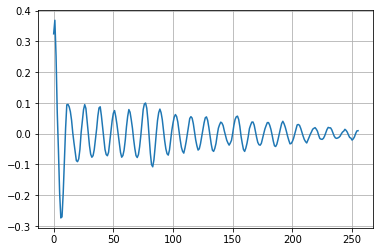

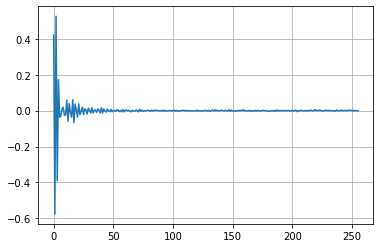

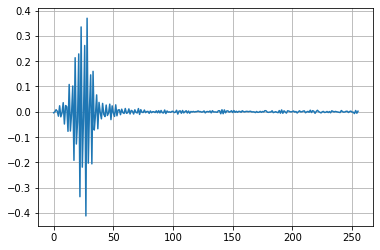

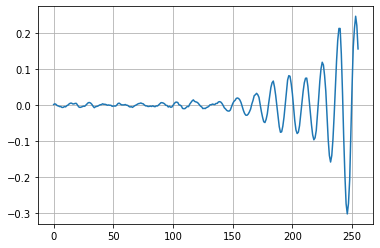

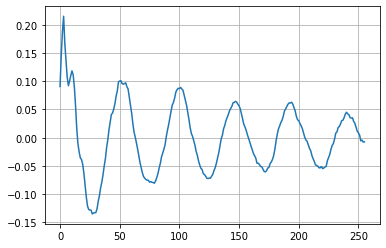

...

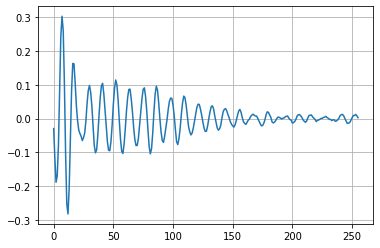

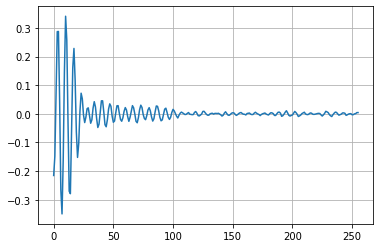

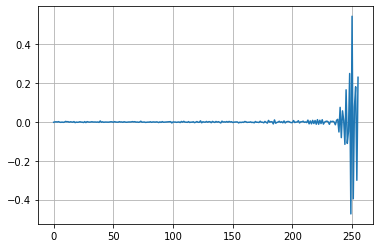

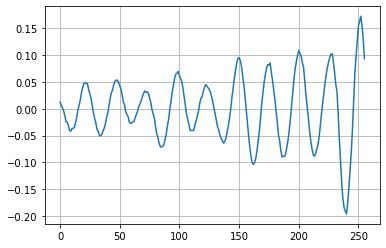

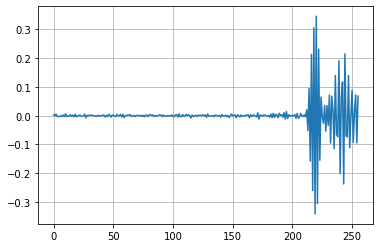

In [33]:
for i in range(15):
    plt.plot(weight_grid[i].cpu().numpy())
    plt.grid()
    plt.show()
    plt.close()

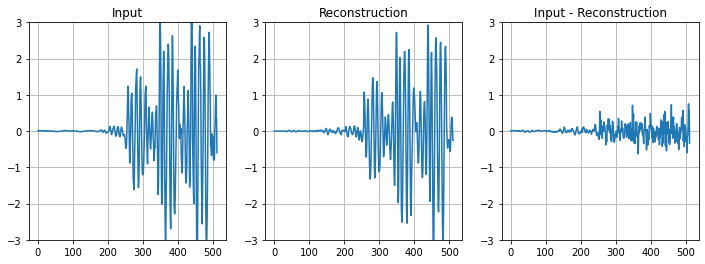

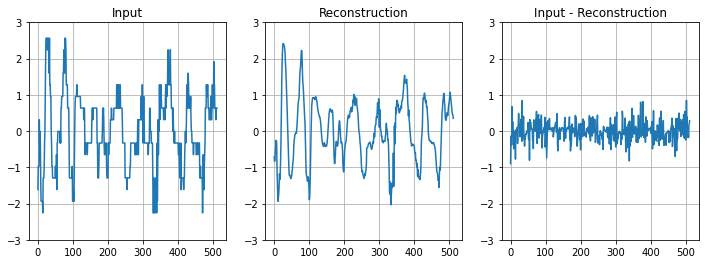

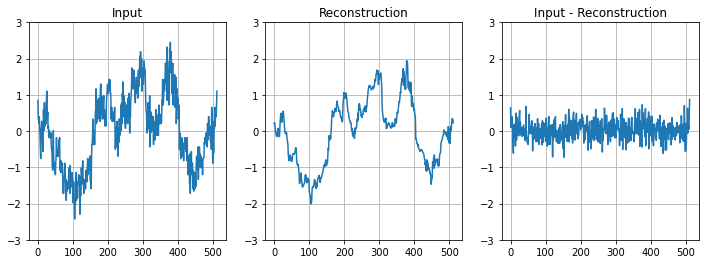

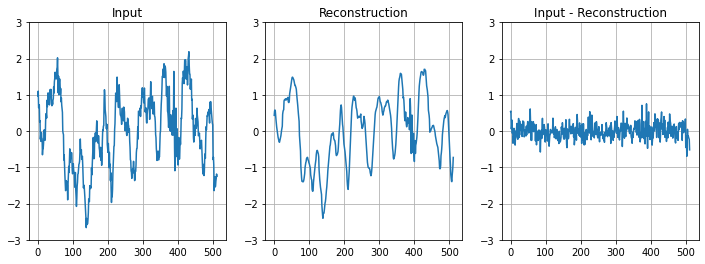

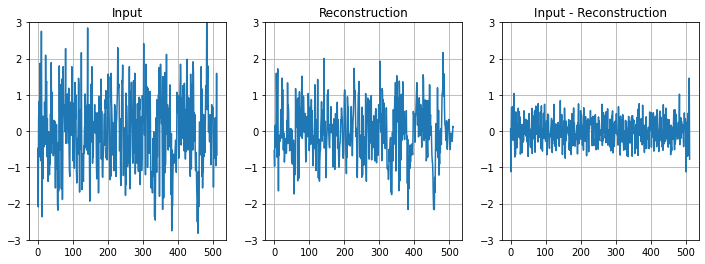

...

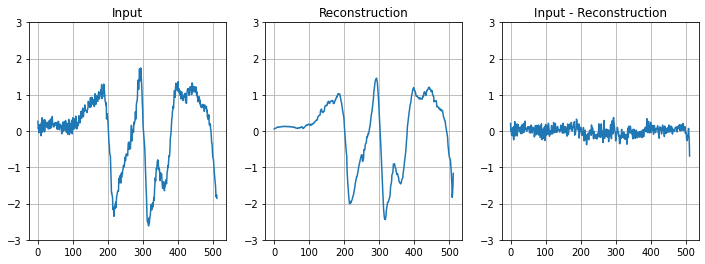

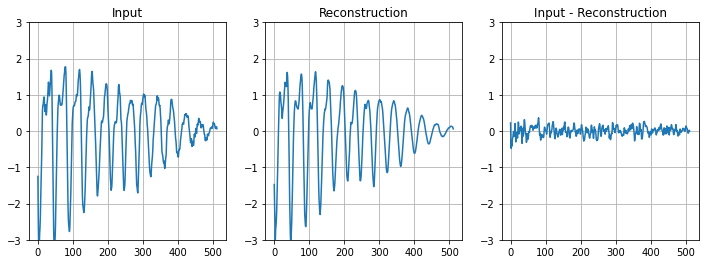

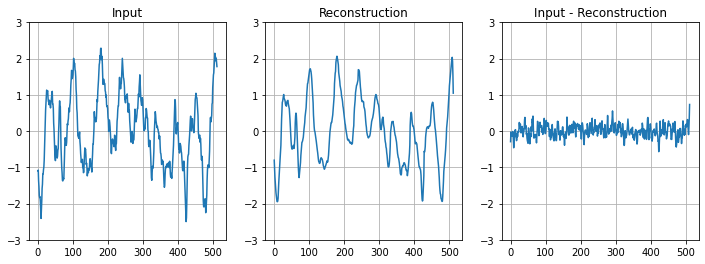

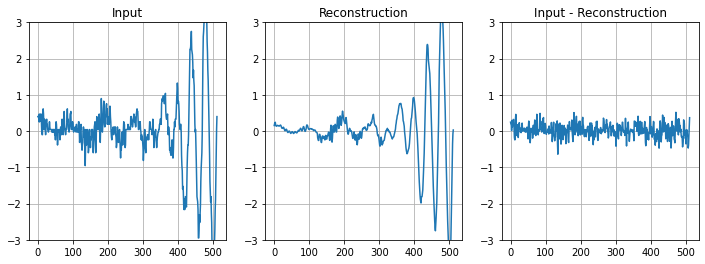

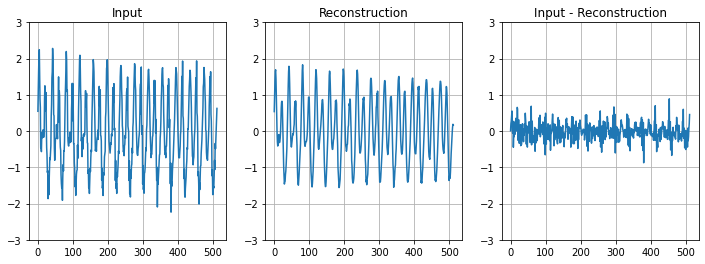

In [34]:
for i in range(15):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].plot((recon_error + recon)[i, 0].cpu().numpy())
    axs[1].plot(recon.cpu().numpy()[i, 0])
    axs[2].plot(recon_error[i, 0].cpu().numpy())
    axs[0].set_title("Input")
    axs[1].set_title("Reconstruction")
    axs[2].set_title("Input - Reconstruction")

    for ax in axs:
        ax.set_ylim(-3, 3)
        ax.grid()

    plt.show()
    plt.close()

In [ ]:
(acts != 0.0).float().mean().item()